# Overview

Sign Language is a communication language just like any other language which is used among deaf and dumb community. This dataset is a complete set of gestures which are used in sign language and can be used by other normal people for better understanding of the sign language gestures 

# Problem Statement

Generally dumb people use sign language for communication, but they find difficulty in communicating with others who don't understand sign language. So there is a barrier in communication between these two communities.

# Solution

This work aims to lower this barrier in communication. The main aim of this project is to create a gesture image classifier which after deployment it can take in videos that has sign language and interprate them to someobody who does not understand sign language. 

# Content

*    The dataset consists of 37 different hand sign gestures which includes A-Z alphabet gestures, 0-9 number gestures and _ for        space.
*    Each gesture image is of size 50X50 
*    Each gesture has 1500 images, so all together there are 37 gestures which means there 55,500 images for all gestures
*    Convolutional Neural Network is well suited for this dataset for model training purpose and gesture prediction.

# Metrics of Success

1.   ConfusionMatrix
2.   Accuracy for both train and test set
3.   Loss for both train and set set
4.   Using Minimal epochs and still having accuracy
5.   Using model summary




# Importing Libaries

In [1]:
# Downloading the the tensorflow environment

import tensorflow as tf
sess = tf.Session(config=tf.ConfigProto(log_device_placement=True))

C:\Users\MUENI\Anaconda3\lib\site-packages\h5py\__init__.py:72: UserWarning: h5py is running against HDF5 1.10.2 when it was built against 1.10.3, this may cause problems
  '{0}.{1}.{2}'.format(*version.hdf5_built_version_tuple)


In [2]:
import pandas as pd
import numpy as np                          # linear algebra
import os                                   # used for loading the data
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score# confusion matrix to carry out error analysis
import seaborn as sns                        # heatmap
from sklearn.utils import shuffle           # shuffle the data
import matplotlib.pyplot as plt             # 2D plotting library
import cv2                                  # image processing library
import tensorflow as tf                     # build models
from tqdm import tqdm                       #To show progress of the uploads of the images
import warnings                             #remove warnings of sklearn and tensorflow
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split # splitting the dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator # it is usefull for scaling


In [3]:
# Here we have the list of our folder
class_names = ['0', '1', '2', '3', '4','5','6','7','8','9','10','A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z']

# This is the dictionary of our folder being identified with an integer
class_names_label = {'0' : 0, 
             '1' : 1, 
             '2' : 2, 
             '3' : 3,
             '4' : 4,
             '5' : 5, 
             '6' : 6,
             '7' : 7,
             '8' : 8, 
             '9' : 9,
             '10' : 10,
             'A' : 11,
             'B' : 12,
             'C' : 13, 
             'D' : 14,
             'E' : 15,
             'F' : 16,
             'G' : 17,
             'H' : 18,
             'I' : 19, 
             'J' : 20,
             'K' : 21,
             'L' : 22,
             'M' : 23,
             'N' : 24,
             'O' : 25,
             'P' : 26,
             'Q' : 27,
             'R' : 28,
             'S' : 29,
             'T' : 30,
             'U' : 31,
             'V' : 32,
             'W' : 33,
             'X' : 34,
             'Y' : 35,
             'Z' : 36 }


# Loading the Images 

In [4]:
# Create a method that loads data

def load_data():
    datasets = ["project week 2\Gesture Image Data"]
    size = (50,50)
    for dataset in datasets:
        directory = "C:/Users/MUENI/Documents/" + dataset # The path of the folder that has the images
        images = []
        labels = []
        for folder in tqdm(os.listdir(directory)): # It shows progress of the uploads of the images
            
            curr_label = class_names_label[folder]
            for file in os.listdir(directory + "/" + folder):
                img_path = directory + "/" + folder + "/" + file # Getting the exact directory of the image
                curr_img = cv2.imread(img_path) # reading the images
                curr_img = cv2.resize(curr_img, size) # resize all images to 
                images.append(curr_img) #append the images obtained in a list
                labels.append(curr_label) #append the labels obtained in alist
        
        images, labels = shuffle(images, labels)     ### Shuffle the data !!!
        images = np.array(images) ### Our images
        labels = np.array(labels)   ### our labels
        
    return images,labels

In [5]:
 #Loading the images and labels from the function
images,labels =load_data()

100%|██████████████████████████████████████████████████████████████████████████████████| 37/37 [00:27<00:00,  1.38it/s]


# Explorative Data Analysis

In [6]:
print("The number of images : ",images.shape[0])
print("The shape of images : ",images.shape[1:])
print('\n')
print("The number of labels : ",labels.shape[0])


The number of images :  55500
The shape of images :  (50, 50, 3)


The number of labels :  55500


In [7]:
# The number of images per folder
sizes = np.bincount(labels)
print("The number of images per folder :")
print(sizes)

The number of images per folder :
[1500 1500 1500 1500 1500 1500 1500 1500 1500 1500 1500 1500 1500 1500
 1500 1500 1500 1500 1500 1500 1500 1500 1500 1500 1500 1500 1500 1500
 1500 1500 1500 1500 1500 1500 1500 1500 1500]


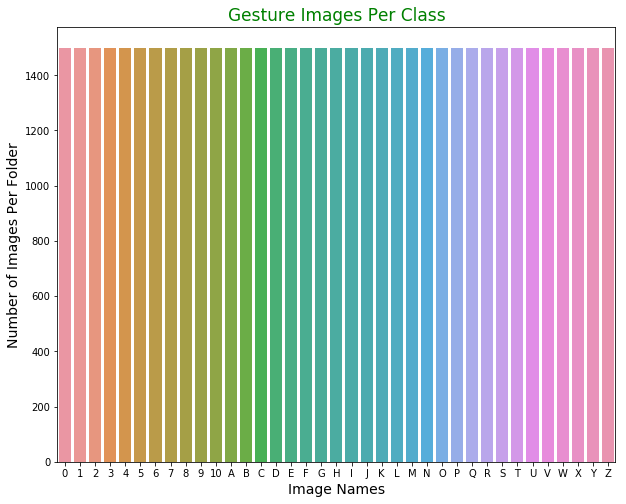

In [8]:
# Plotting the number of images per folder
plt.figure(figsize = (10,8))
sns.barplot(x = class_names, y = sizes)
plt.title('Gesture Images Per Class', fontsize = 17, color = 'green')
plt.xlabel('Image Names',fontsize = 14)
plt.ylabel('Number of Images Per Folder',fontsize = 14)
plt.show()

As we can see the number of images were equal in all the the folders

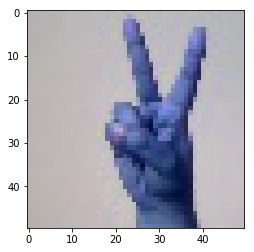

In [9]:
# Displaying a random image
index = np.random.randint(images.shape[0])
plt.figure()
plt.imshow(images[index])
plt.grid(False)
plt.show()

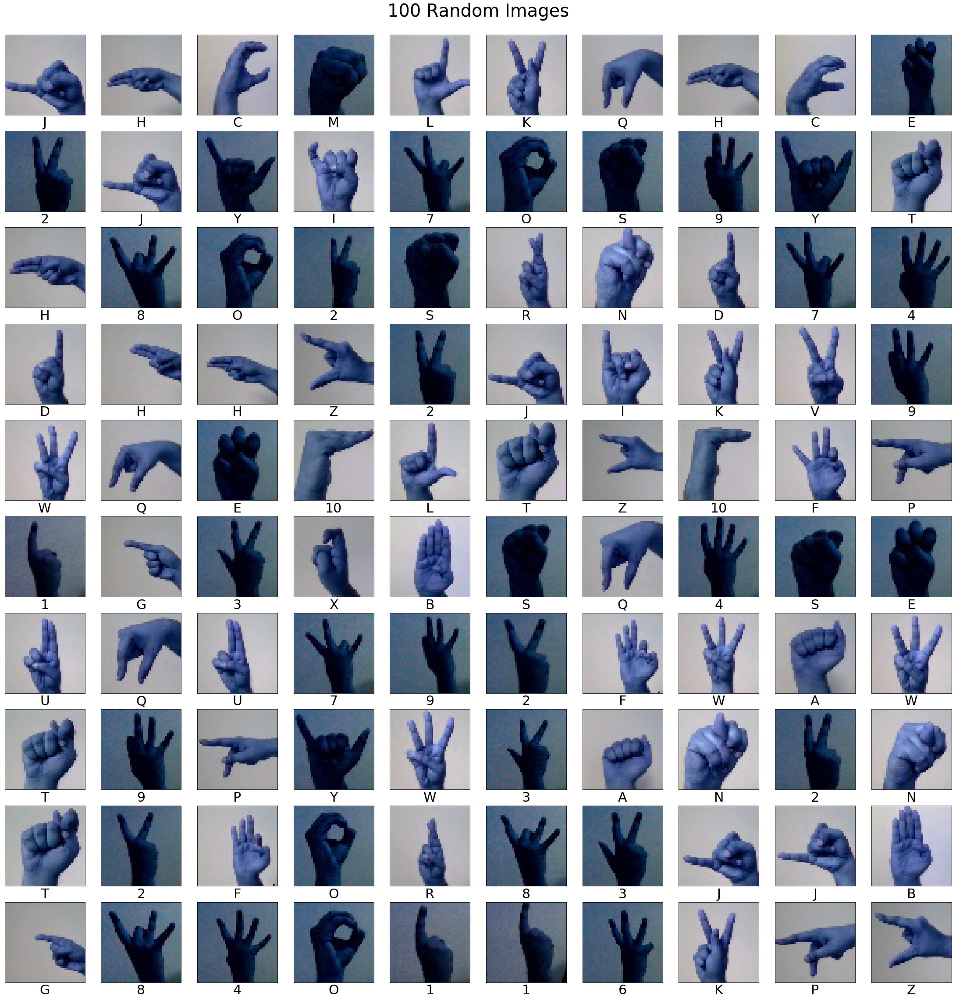

In [10]:
# Displaying 100 random images with their labels

fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(0,0,3,3)
for i in range(100):
    plt.subplot(10,10,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i],cmap=plt.cm.binary)
    plt.xlabel(class_names[labels[i]],fontsize=30)

fig.suptitle("100 Random Images",fontsize=40, y=3.1, x = 1.5)
plt.show()

# Modelling Using TensorFlow

In [11]:
# Creating the feature set and target set into array

X = np.array(images)
y = np.array(labels)

In [12]:
# Splitting the dataset into train and test

X_train,X_test,y_train,y_test = train_test_split(X,y, test_size = 0.2, random_state = 2)

In [13]:
#check the shapes of the splits

print("Shape of train image is:",X_train.shape)
print("Shape of test image is:",X_test.shape)
print("Shape of labels is:",y_train.shape)
print("Shape of label is:",y_test.shape)

Shape of train image is: (44400, 50, 50, 3)
Shape of test image is: (11100, 50, 50, 3)
Shape of labels is: (44400,)
Shape of label is: (11100,)


In [ ]:
# # Modelling using keras in tensorflow

# model1 = tf.keras.Sequential([ 
#     tf.keras.layers.Conv2D(32, (3,3),activation ='relu',input_shape = (50,50,3)), # Creates a convolutional 2D layer1
#     tf.keras.layers.MaxPooling2D(2,2), # Reduce the data into half while mantaining output depth
#     tf.keras.layers.Conv2D(32,(3,3),activation='relu'),
#     tf.keras.layers.MaxPooling2D(2,2),
#     tf.keras.layers.Flatten(), # we flatten the output before we pass to fully connected layer
#     tf.keras.layers.Dropout(0.5), #for regularization meaning 
#     tf.keras.layers.Dense(128,activation=tf.nn.relu), #Convert the dimension of matrix to vector
#     tf.keras.layers.Dense(37,activation=tf.nn.softmax) 
# ])

In [14]:
# Modelling using keras in tensorflow

model1 = tf.keras.Sequential([ 
    tf.keras.layers.Conv2D(32, (3,3),activation ='relu',input_shape = (50,50,3)), # Creates a convolutional 2D layer1
    tf.keras.layers.MaxPooling2D(2,2), # Reduce the data into half while mantaining output depth
    tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3),activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(), # we flatten the output before we pass to fully connected layer
    tf.keras.layers.Dropout(0.5), #for regularization meaning 
    tf.keras.layers.Dense(512,activation=tf.nn.relu), #Convert the dimension of matrix to vector
    tf.keras.layers.Dense(37,activation=tf.nn.softmax) 
])

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


# Optimization Of The Model

In [15]:
# Scaling the train and test
train_datagen = ImageDataGenerator(rescale = 1./255,
                                  featurewise_center=True,
                                  featurewise_std_normalization=True,
                                  rotation_range=20,
                                  width_shift_range=0.2,
                                  height_shift_range=0.2,
                                  horizontal_flip=True)
    
test_datagen = ImageDataGenerator(rescale = 1./255)

In [16]:
#create the image generators that create variation of images to improve the ability of the fit model 
# to generalize what is learnt from the new images

train_generator = train_datagen.flow(X_train,y_train,batch_size =128)
test_generator = test_datagen.flow(X_test,y_test, batch_size=128)


In [17]:
# Optimizing the model using adam optimizer 

model1.compile(optimizer='adam', loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])

In [18]:
# Training with 5 epochs and verbose 0

histy = model1.fit_generator(train_generator, steps_per_epoch = len(X_train/128), epochs = 5, validation_data = (X_test,y_test))
#histy = model1.fit_generator(train_generator, steps_per_epoch = None, epochs = 5, validation_data = (X_test,y_test))

Epoch 1/5


  194/44400 [..............................] - ETA: 28:42:13 - loss: 3.6115 - acc: 0.039 - ETA: 17:11:57 - loss: 3.6106 - acc: 0.023 - ETA: 13:06:28 - loss: 3.6087 - acc: 0.020 - ETA: 11:09:48 - loss: 3.6111 - acc: 0.017 - ETA: 9:48:31 - loss: 3.6008 - acc: 0.015 - ETA: 8:54:09 - loss: 3.5951 - acc: 0.01 - ETA: 8:14:11 - loss: 3.5960 - acc: 0.02 - ETA: 7:53:31 - loss: 3.5930 - acc: 0.02 - ETA: 7:23:19 - loss: 3.5878 - acc: 0.02 - ETA: 7:00:33 - loss: 3.5788 - acc: 0.02 - ETA: 6:45:19 - loss: 3.5720 - acc: 0.02 - ETA: 6:37:24 - loss: 3.5620 - acc: 0.02 - ETA: 6:30:49 - loss: 3.5502 - acc: 0.03 - ETA: 6:27:12 - loss: 3.5378 - acc: 0.03 - ETA: 6:23:19 - loss: 3.5223 - acc: 0.03 - ETA: 6:18:51 - loss: 3.5034 - acc: 0.03 - ETA: 6:15:55 - loss: 3.4845 - acc: 0.04 - ETA: 6:12:37 - loss: 3.4667 - acc: 0.04 - ETA: 6:10:32 - loss: 3.4433 - acc: 0.04 - ETA: 6:08:06 - loss: 3.4288 - acc: 0.05 - ETA: 6:05:08 - loss: 3.4089 - acc: 0.05 - ETA: 6:02:15 - loss: 3.3932 - acc: 0.05 - ETA: 6:00:49 - loss:

  388/44400 [..............................] - ETA: 5:01:07 - loss: 2.1011 - acc: 0.33 - ETA: 5:00:40 - loss: 2.0958 - acc: 0.33 - ETA: 5:00:36 - loss: 2.0917 - acc: 0.33 - ETA: 5:00:39 - loss: 2.0868 - acc: 0.33 - ETA: 5:00:40 - loss: 2.0822 - acc: 0.33 - ETA: 5:00:36 - loss: 2.0780 - acc: 0.33 - ETA: 5:00:22 - loss: 2.0734 - acc: 0.33 - ETA: 5:00:10 - loss: 2.0685 - acc: 0.34 - ETA: 5:00:11 - loss: 2.0639 - acc: 0.34 - ETA: 5:00:01 - loss: 2.0595 - acc: 0.34 - ETA: 4:59:57 - loss: 2.0540 - acc: 0.34 - ETA: 4:59:35 - loss: 2.0502 - acc: 0.34 - ETA: 4:59:23 - loss: 2.0457 - acc: 0.34 - ETA: 4:59:24 - loss: 2.0411 - acc: 0.34 - ETA: 4:59:21 - loss: 2.0362 - acc: 0.35 - ETA: 4:59:13 - loss: 2.0321 - acc: 0.35 - ETA: 4:59:11 - loss: 2.0284 - acc: 0.35 - ETA: 4:59:13 - loss: 2.0244 - acc: 0.35 - ETA: 4:59:22 - loss: 2.0198 - acc: 0.35 - ETA: 4:58:59 - loss: 2.0147 - acc: 0.35 - ETA: 4:59:07 - loss: 2.0101 - acc: 0.35 - ETA: 4:59:14 - loss: 2.0061 - acc: 0.35 - ETA: 4:58:52 - loss: 2.0021 -

  582/44400 [..............................] - ETA: 4:56:45 - loss: 1.4615 - acc: 0.52 - ETA: 4:56:47 - loss: 1.4595 - acc: 0.52 - ETA: 4:56:37 - loss: 1.4570 - acc: 0.52 - ETA: 4:56:49 - loss: 1.4550 - acc: 0.52 - ETA: 4:56:51 - loss: 1.4529 - acc: 0.52 - ETA: 4:56:54 - loss: 1.4508 - acc: 0.52 - ETA: 4:56:53 - loss: 1.4489 - acc: 0.52 - ETA: 4:56:49 - loss: 1.4465 - acc: 0.52 - ETA: 4:56:52 - loss: 1.4448 - acc: 0.52 - ETA: 4:57:09 - loss: 1.4426 - acc: 0.52 - ETA: 4:57:23 - loss: 1.4403 - acc: 0.52 - ETA: 4:57:16 - loss: 1.4381 - acc: 0.52 - ETA: 4:57:09 - loss: 1.4361 - acc: 0.53 - ETA: 4:57:21 - loss: 1.4338 - acc: 0.53 - ETA: 4:57:23 - loss: 1.4316 - acc: 0.53 - ETA: 4:57:14 - loss: 1.4295 - acc: 0.53 - ETA: 4:57:34 - loss: 1.4274 - acc: 0.53 - ETA: 4:57:45 - loss: 1.4252 - acc: 0.53 - ETA: 4:58:03 - loss: 1.4232 - acc: 0.53 - ETA: 4:58:02 - loss: 1.4213 - acc: 0.53 - ETA: 4:58:05 - loss: 1.4189 - acc: 0.53 - ETA: 4:58:21 - loss: 1.4165 - acc: 0.53 - ETA: 4:58:32 - loss: 1.4144 -

  776/44400 [..............................] - ETA: 5:08:55 - loss: 1.1263 - acc: 0.62 - ETA: 5:09:03 - loss: 1.1249 - acc: 0.62 - ETA: 5:09:03 - loss: 1.1237 - acc: 0.62 - ETA: 5:09:12 - loss: 1.1225 - acc: 0.62 - ETA: 5:09:23 - loss: 1.1213 - acc: 0.62 - ETA: 5:09:28 - loss: 1.1202 - acc: 0.63 - ETA: 5:09:20 - loss: 1.1190 - acc: 0.63 - ETA: 5:09:20 - loss: 1.1179 - acc: 0.63 - ETA: 5:09:28 - loss: 1.1167 - acc: 0.63 - ETA: 5:09:29 - loss: 1.1153 - acc: 0.63 - ETA: 5:09:37 - loss: 1.1142 - acc: 0.63 - ETA: 5:09:43 - loss: 1.1129 - acc: 0.63 - ETA: 5:09:54 - loss: 1.1115 - acc: 0.63 - ETA: 5:10:02 - loss: 1.1103 - acc: 0.63 - ETA: 5:10:08 - loss: 1.1091 - acc: 0.63 - ETA: 5:10:17 - loss: 1.1077 - acc: 0.63 - ETA: 5:10:25 - loss: 1.1064 - acc: 0.63 - ETA: 5:10:32 - loss: 1.1050 - acc: 0.63 - ETA: 5:10:23 - loss: 1.1037 - acc: 0.63 - ETA: 5:10:29 - loss: 1.1024 - acc: 0.63 - ETA: 5:10:36 - loss: 1.1010 - acc: 0.63 - ETA: 5:10:41 - loss: 1.0996 - acc: 0.63 - ETA: 5:10:32 - loss: 1.0984 -

  970/44400 [..............................] - ETA: 5:07:38 - loss: 0.9191 - acc: 0.69 - ETA: 5:07:39 - loss: 0.9182 - acc: 0.69 - ETA: 5:07:35 - loss: 0.9173 - acc: 0.69 - ETA: 5:07:34 - loss: 0.9162 - acc: 0.69 - ETA: 5:07:30 - loss: 0.9155 - acc: 0.69 - ETA: 5:07:29 - loss: 0.9147 - acc: 0.69 - ETA: 5:07:23 - loss: 0.9139 - acc: 0.69 - ETA: 5:07:21 - loss: 0.9131 - acc: 0.69 - ETA: 5:07:22 - loss: 0.9123 - acc: 0.69 - ETA: 5:07:20 - loss: 0.9115 - acc: 0.69 - ETA: 5:07:15 - loss: 0.9107 - acc: 0.69 - ETA: 5:07:11 - loss: 0.9098 - acc: 0.69 - ETA: 5:07:08 - loss: 0.9090 - acc: 0.69 - ETA: 5:07:07 - loss: 0.9083 - acc: 0.69 - ETA: 5:07:03 - loss: 0.9075 - acc: 0.69 - ETA: 5:07:04 - loss: 0.9067 - acc: 0.70 - ETA: 5:06:58 - loss: 0.9059 - acc: 0.70 - ETA: 5:06:56 - loss: 0.9051 - acc: 0.70 - ETA: 5:06:56 - loss: 0.9043 - acc: 0.70 - ETA: 5:06:51 - loss: 0.9035 - acc: 0.70 - ETA: 5:06:50 - loss: 0.9029 - acc: 0.70 - ETA: 5:06:44 - loss: 0.9019 - acc: 0.70 - ETA: 5:06:45 - loss: 0.9011 -

 1164/44400 [..............................] - ETA: 5:04:57 - loss: 0.7799 - acc: 0.74 - ETA: 5:04:56 - loss: 0.7792 - acc: 0.74 - ETA: 5:04:55 - loss: 0.7786 - acc: 0.74 - ETA: 5:04:53 - loss: 0.7781 - acc: 0.74 - ETA: 5:04:52 - loss: 0.7774 - acc: 0.74 - ETA: 5:04:51 - loss: 0.7769 - acc: 0.74 - ETA: 5:04:49 - loss: 0.7763 - acc: 0.74 - ETA: 5:04:48 - loss: 0.7756 - acc: 0.74 - ETA: 5:04:47 - loss: 0.7750 - acc: 0.74 - ETA: 5:04:45 - loss: 0.7744 - acc: 0.74 - ETA: 5:04:46 - loss: 0.7737 - acc: 0.74 - ETA: 5:04:45 - loss: 0.7732 - acc: 0.74 - ETA: 5:04:43 - loss: 0.7726 - acc: 0.74 - ETA: 5:04:42 - loss: 0.7720 - acc: 0.74 - ETA: 5:04:43 - loss: 0.7713 - acc: 0.74 - ETA: 5:04:43 - loss: 0.7707 - acc: 0.74 - ETA: 5:04:43 - loss: 0.7700 - acc: 0.74 - ETA: 5:04:43 - loss: 0.7694 - acc: 0.74 - ETA: 5:04:43 - loss: 0.7688 - acc: 0.74 - ETA: 5:04:42 - loss: 0.7683 - acc: 0.74 - ETA: 5:04:41 - loss: 0.7676 - acc: 0.74 - ETA: 5:04:41 - loss: 0.7670 - acc: 0.74 - ETA: 5:04:42 - loss: 0.7664 -

 1358/44400 [..............................] - ETA: 5:12:55 - loss: 0.6795 - acc: 0.77 - ETA: 5:12:57 - loss: 0.6790 - acc: 0.77 - ETA: 5:13:00 - loss: 0.6785 - acc: 0.77 - ETA: 5:13:02 - loss: 0.6780 - acc: 0.77 - ETA: 5:13:06 - loss: 0.6776 - acc: 0.77 - ETA: 5:13:10 - loss: 0.6772 - acc: 0.77 - ETA: 5:13:13 - loss: 0.6767 - acc: 0.77 - ETA: 5:13:17 - loss: 0.6762 - acc: 0.77 - ETA: 5:13:19 - loss: 0.6756 - acc: 0.77 - ETA: 5:13:23 - loss: 0.6752 - acc: 0.77 - ETA: 5:13:26 - loss: 0.6747 - acc: 0.77 - ETA: 5:13:28 - loss: 0.6743 - acc: 0.77 - ETA: 5:13:33 - loss: 0.6738 - acc: 0.77 - ETA: 5:13:37 - loss: 0.6733 - acc: 0.77 - ETA: 5:13:41 - loss: 0.6729 - acc: 0.77 - ETA: 5:13:45 - loss: 0.6725 - acc: 0.77 - ETA: 5:13:48 - loss: 0.6720 - acc: 0.77 - ETA: 5:13:51 - loss: 0.6716 - acc: 0.77 - ETA: 5:13:53 - loss: 0.6711 - acc: 0.77 - ETA: 5:13:57 - loss: 0.6706 - acc: 0.77 - ETA: 5:14:01 - loss: 0.6702 - acc: 0.77 - ETA: 5:14:04 - loss: 0.6697 - acc: 0.77 - ETA: 5:14:07 - loss: 0.6693 -

 1552/44400 [>.............................] - ETA: 5:16:27 - loss: 0.6031 - acc: 0.79 - ETA: 5:16:20 - loss: 0.6027 - acc: 0.79 - ETA: 5:16:14 - loss: 0.6024 - acc: 0.79 - ETA: 5:16:07 - loss: 0.6021 - acc: 0.79 - ETA: 5:16:00 - loss: 0.6017 - acc: 0.80 - ETA: 5:15:53 - loss: 0.6014 - acc: 0.80 - ETA: 5:15:45 - loss: 0.6010 - acc: 0.80 - ETA: 5:15:38 - loss: 0.6007 - acc: 0.80 - ETA: 5:15:31 - loss: 0.6003 - acc: 0.80 - ETA: 5:15:25 - loss: 0.6000 - acc: 0.80 - ETA: 5:15:18 - loss: 0.5996 - acc: 0.80 - ETA: 5:15:12 - loss: 0.5993 - acc: 0.80 - ETA: 5:15:06 - loss: 0.5990 - acc: 0.80 - ETA: 5:15:00 - loss: 0.5986 - acc: 0.80 - ETA: 5:14:53 - loss: 0.5982 - acc: 0.80 - ETA: 5:14:53 - loss: 0.5979 - acc: 0.80 - ETA: 5:14:53 - loss: 0.5975 - acc: 0.80 - ETA: 5:14:53 - loss: 0.5972 - acc: 0.80 - ETA: 5:14:53 - loss: 0.5969 - acc: 0.80 - ETA: 5:14:49 - loss: 0.5966 - acc: 0.80 - ETA: 5:14:46 - loss: 0.5963 - acc: 0.80 - ETA: 5:14:42 - loss: 0.5959 - acc: 0.80 - ETA: 5:14:39 - loss: 0.5956 -

 1746/44400 [>.............................] - ETA: 5:01:37 - loss: 0.5431 - acc: 0.81 - ETA: 5:01:35 - loss: 0.5428 - acc: 0.81 - ETA: 5:01:33 - loss: 0.5425 - acc: 0.81 - ETA: 5:01:31 - loss: 0.5423 - acc: 0.81 - ETA: 5:01:29 - loss: 0.5420 - acc: 0.81 - ETA: 5:01:27 - loss: 0.5417 - acc: 0.81 - ETA: 5:01:24 - loss: 0.5414 - acc: 0.81 - ETA: 5:01:22 - loss: 0.5412 - acc: 0.81 - ETA: 5:01:19 - loss: 0.5410 - acc: 0.82 - ETA: 5:01:17 - loss: 0.5407 - acc: 0.82 - ETA: 5:01:15 - loss: 0.5404 - acc: 0.82 - ETA: 5:01:13 - loss: 0.5403 - acc: 0.82 - ETA: 5:01:11 - loss: 0.5400 - acc: 0.82 - ETA: 5:01:09 - loss: 0.5397 - acc: 0.82 - ETA: 5:01:06 - loss: 0.5396 - acc: 0.82 - ETA: 5:01:04 - loss: 0.5394 - acc: 0.82 - ETA: 5:01:02 - loss: 0.5392 - acc: 0.82 - ETA: 5:00:59 - loss: 0.5389 - acc: 0.82 - ETA: 5:00:57 - loss: 0.5387 - acc: 0.82 - ETA: 5:00:55 - loss: 0.5384 - acc: 0.82 - ETA: 5:00:53 - loss: 0.5382 - acc: 0.82 - ETA: 5:00:51 - loss: 0.5380 - acc: 0.82 - ETA: 5:00:49 - loss: 0.5377 -

 1940/44400 [>.............................] - ETA: 4:51:13 - loss: 0.4963 - acc: 0.83 - ETA: 4:51:11 - loss: 0.4961 - acc: 0.83 - ETA: 4:51:12 - loss: 0.4959 - acc: 0.83 - ETA: 4:51:10 - loss: 0.4957 - acc: 0.83 - ETA: 4:51:07 - loss: 0.4955 - acc: 0.83 - ETA: 4:51:08 - loss: 0.4952 - acc: 0.83 - ETA: 4:51:06 - loss: 0.4950 - acc: 0.83 - ETA: 4:51:07 - loss: 0.4947 - acc: 0.83 - ETA: 4:51:05 - loss: 0.4945 - acc: 0.83 - ETA: 4:51:07 - loss: 0.4943 - acc: 0.83 - ETA: 4:51:07 - loss: 0.4941 - acc: 0.83 - ETA: 4:51:07 - loss: 0.4938 - acc: 0.83 - ETA: 4:51:05 - loss: 0.4936 - acc: 0.83 - ETA: 4:51:04 - loss: 0.4934 - acc: 0.83 - ETA: 4:51:04 - loss: 0.4932 - acc: 0.83 - ETA: 4:51:03 - loss: 0.4930 - acc: 0.83 - ETA: 4:51:05 - loss: 0.4927 - acc: 0.83 - ETA: 4:51:03 - loss: 0.4925 - acc: 0.83 - ETA: 4:51:02 - loss: 0.4923 - acc: 0.83 - ETA: 4:50:59 - loss: 0.4921 - acc: 0.83 - ETA: 4:50:57 - loss: 0.4918 - acc: 0.83 - ETA: 4:50:58 - loss: 0.4916 - acc: 0.83 - ETA: 4:50:55 - loss: 0.4914 -

 2134/44400 [>.............................] - ETA: 4:44:28 - loss: 0.4567 - acc: 0.84 - ETA: 4:44:27 - loss: 0.4565 - acc: 0.84 - ETA: 4:44:26 - loss: 0.4564 - acc: 0.84 - ETA: 4:44:27 - loss: 0.4562 - acc: 0.84 - ETA: 4:44:28 - loss: 0.4561 - acc: 0.84 - ETA: 4:44:28 - loss: 0.4559 - acc: 0.84 - ETA: 4:44:30 - loss: 0.4557 - acc: 0.84 - ETA: 4:44:30 - loss: 0.4555 - acc: 0.84 - ETA: 4:44:31 - loss: 0.4553 - acc: 0.84 - ETA: 4:44:32 - loss: 0.4551 - acc: 0.84 - ETA: 4:44:34 - loss: 0.4549 - acc: 0.84 - ETA: 4:44:34 - loss: 0.4547 - acc: 0.84 - ETA: 4:44:35 - loss: 0.4545 - acc: 0.84 - ETA: 4:44:36 - loss: 0.4544 - acc: 0.84 - ETA: 4:44:35 - loss: 0.4542 - acc: 0.84 - ETA: 4:44:32 - loss: 0.4539 - acc: 0.84 - ETA: 4:44:31 - loss: 0.4538 - acc: 0.84 - ETA: 4:44:28 - loss: 0.4536 - acc: 0.84 - ETA: 4:44:25 - loss: 0.4534 - acc: 0.84 - ETA: 4:44:23 - loss: 0.4532 - acc: 0.84 - ETA: 4:44:24 - loss: 0.4530 - acc: 0.84 - ETA: 4:44:25 - loss: 0.4528 - acc: 0.84 - ETA: 4:44:23 - loss: 0.4526 -

 2328/44400 [>.............................] - ETA: 4:37:56 - loss: 0.4249 - acc: 0.85 - ETA: 4:37:52 - loss: 0.4247 - acc: 0.85 - ETA: 4:37:47 - loss: 0.4246 - acc: 0.85 - ETA: 4:37:42 - loss: 0.4244 - acc: 0.85 - ETA: 4:37:37 - loss: 0.4242 - acc: 0.85 - ETA: 4:37:32 - loss: 0.4240 - acc: 0.85 - ETA: 4:37:28 - loss: 0.4239 - acc: 0.85 - ETA: 4:37:23 - loss: 0.4238 - acc: 0.85 - ETA: 4:37:18 - loss: 0.4236 - acc: 0.85 - ETA: 4:37:13 - loss: 0.4234 - acc: 0.85 - ETA: 4:37:08 - loss: 0.4233 - acc: 0.85 - ETA: 4:37:03 - loss: 0.4231 - acc: 0.85 - ETA: 4:36:59 - loss: 0.4230 - acc: 0.85 - ETA: 4:36:55 - loss: 0.4228 - acc: 0.85 - ETA: 4:36:54 - loss: 0.4227 - acc: 0.85 - ETA: 4:36:53 - loss: 0.4225 - acc: 0.85 - ETA: 4:36:52 - loss: 0.4224 - acc: 0.85 - ETA: 4:36:50 - loss: 0.4222 - acc: 0.85 - ETA: 4:36:47 - loss: 0.4221 - acc: 0.85 - ETA: 4:36:44 - loss: 0.4219 - acc: 0.85 - ETA: 4:36:42 - loss: 0.4217 - acc: 0.85 - ETA: 4:36:40 - loss: 0.4216 - acc: 0.85 - ETA: 4:36:40 - loss: 0.4214 -

 2522/44400 [>.............................] - ETA: 4:30:47 - loss: 0.3958 - acc: 0.86 - ETA: 4:30:45 - loss: 0.3957 - acc: 0.86 - ETA: 4:30:43 - loss: 0.3955 - acc: 0.86 - ETA: 4:30:41 - loss: 0.3954 - acc: 0.86 - ETA: 4:30:40 - loss: 0.3952 - acc: 0.86 - ETA: 4:30:38 - loss: 0.3951 - acc: 0.86 - ETA: 4:30:36 - loss: 0.3950 - acc: 0.86 - ETA: 4:30:36 - loss: 0.3948 - acc: 0.86 - ETA: 4:30:34 - loss: 0.3947 - acc: 0.86 - ETA: 4:30:33 - loss: 0.3946 - acc: 0.86 - ETA: 4:30:32 - loss: 0.3944 - acc: 0.86 - ETA: 4:30:31 - loss: 0.3943 - acc: 0.86 - ETA: 4:30:29 - loss: 0.3941 - acc: 0.86 - ETA: 4:30:28 - loss: 0.3940 - acc: 0.86 - ETA: 4:30:26 - loss: 0.3938 - acc: 0.86 - ETA: 4:30:25 - loss: 0.3937 - acc: 0.86 - ETA: 4:30:24 - loss: 0.3936 - acc: 0.86 - ETA: 4:30:23 - loss: 0.3934 - acc: 0.86 - ETA: 4:30:21 - loss: 0.3933 - acc: 0.86 - ETA: 4:30:20 - loss: 0.3932 - acc: 0.86 - ETA: 4:30:20 - loss: 0.3930 - acc: 0.86 - ETA: 4:30:18 - loss: 0.3929 - acc: 0.86 - ETA: 4:30:17 - loss: 0.3927 -

 2716/44400 [>.............................] - ETA: 4:26:53 - loss: 0.3710 - acc: 0.87 - ETA: 4:26:49 - loss: 0.3709 - acc: 0.87 - ETA: 4:26:45 - loss: 0.3708 - acc: 0.87 - ETA: 4:26:42 - loss: 0.3707 - acc: 0.87 - ETA: 4:26:39 - loss: 0.3706 - acc: 0.87 - ETA: 4:26:36 - loss: 0.3705 - acc: 0.87 - ETA: 4:26:33 - loss: 0.3704 - acc: 0.87 - ETA: 4:26:30 - loss: 0.3702 - acc: 0.87 - ETA: 4:26:26 - loss: 0.3701 - acc: 0.87 - ETA: 4:26:22 - loss: 0.3700 - acc: 0.87 - ETA: 4:26:19 - loss: 0.3699 - acc: 0.87 - ETA: 4:26:16 - loss: 0.3698 - acc: 0.87 - ETA: 4:26:13 - loss: 0.3697 - acc: 0.87 - ETA: 4:26:10 - loss: 0.3696 - acc: 0.87 - ETA: 4:26:07 - loss: 0.3694 - acc: 0.87 - ETA: 4:26:04 - loss: 0.3693 - acc: 0.87 - ETA: 4:26:01 - loss: 0.3692 - acc: 0.87 - ETA: 4:25:58 - loss: 0.3691 - acc: 0.87 - ETA: 4:25:54 - loss: 0.3690 - acc: 0.87 - ETA: 4:25:52 - loss: 0.3689 - acc: 0.87 - ETA: 4:25:49 - loss: 0.3688 - acc: 0.87 - ETA: 4:25:46 - loss: 0.3687 - acc: 0.87 - ETA: 4:25:44 - loss: 0.3686 -

 2910/44400 [>.............................] - ETA: 4:23:12 - loss: 0.3495 - acc: 0.88 - ETA: 4:23:11 - loss: 0.3494 - acc: 0.88 - ETA: 4:23:10 - loss: 0.3493 - acc: 0.88 - ETA: 4:23:09 - loss: 0.3492 - acc: 0.88 - ETA: 4:23:07 - loss: 0.3491 - acc: 0.88 - ETA: 4:23:08 - loss: 0.3490 - acc: 0.88 - ETA: 4:23:07 - loss: 0.3489 - acc: 0.88 - ETA: 4:23:07 - loss: 0.3488 - acc: 0.88 - ETA: 4:23:06 - loss: 0.3487 - acc: 0.88 - ETA: 4:23:06 - loss: 0.3486 - acc: 0.88 - ETA: 4:23:05 - loss: 0.3485 - acc: 0.88 - ETA: 4:23:06 - loss: 0.3484 - acc: 0.88 - ETA: 4:23:06 - loss: 0.3483 - acc: 0.88 - ETA: 4:23:05 - loss: 0.3482 - acc: 0.88 - ETA: 4:23:05 - loss: 0.3481 - acc: 0.88 - ETA: 4:23:03 - loss: 0.3480 - acc: 0.88 - ETA: 4:23:00 - loss: 0.3479 - acc: 0.88 - ETA: 4:22:57 - loss: 0.3478 - acc: 0.88 - ETA: 4:22:54 - loss: 0.3476 - acc: 0.88 - ETA: 4:22:50 - loss: 0.3475 - acc: 0.88 - ETA: 4:22:47 - loss: 0.3474 - acc: 0.88 - ETA: 4:22:43 - loss: 0.3473 - acc: 0.88 - ETA: 4:22:40 - loss: 0.3472 -

 3104/44400 [=>............................] - ETA: 4:18:24 - loss: 0.3311 - acc: 0.88 - ETA: 4:18:23 - loss: 0.3310 - acc: 0.88 - ETA: 4:18:23 - loss: 0.3309 - acc: 0.88 - ETA: 4:18:21 - loss: 0.3308 - acc: 0.88 - ETA: 4:18:20 - loss: 0.3307 - acc: 0.88 - ETA: 4:18:18 - loss: 0.3306 - acc: 0.88 - ETA: 4:18:18 - loss: 0.3305 - acc: 0.88 - ETA: 4:18:17 - loss: 0.3304 - acc: 0.88 - ETA: 4:18:17 - loss: 0.3303 - acc: 0.89 - ETA: 4:18:17 - loss: 0.3303 - acc: 0.89 - ETA: 4:18:14 - loss: 0.3302 - acc: 0.89 - ETA: 4:18:11 - loss: 0.3301 - acc: 0.89 - ETA: 4:18:07 - loss: 0.3300 - acc: 0.89 - ETA: 4:18:04 - loss: 0.3299 - acc: 0.89 - ETA: 4:18:01 - loss: 0.3298 - acc: 0.89 - ETA: 4:17:58 - loss: 0.3297 - acc: 0.89 - ETA: 4:17:54 - loss: 0.3296 - acc: 0.89 - ETA: 4:17:52 - loss: 0.3295 - acc: 0.89 - ETA: 4:17:49 - loss: 0.3294 - acc: 0.89 - ETA: 4:17:45 - loss: 0.3293 - acc: 0.89 - ETA: 4:17:42 - loss: 0.3292 - acc: 0.89 - ETA: 4:17:39 - loss: 0.3291 - acc: 0.89 - ETA: 4:17:36 - loss: 0.3290 -

 3298/44400 [=>............................] - ETA: 4:13:24 - loss: 0.3144 - acc: 0.89 - ETA: 4:13:23 - loss: 0.3144 - acc: 0.89 - ETA: 4:13:23 - loss: 0.3143 - acc: 0.89 - ETA: 4:13:22 - loss: 0.3142 - acc: 0.89 - ETA: 4:13:22 - loss: 0.3142 - acc: 0.89 - ETA: 4:13:21 - loss: 0.3141 - acc: 0.89 - ETA: 4:13:21 - loss: 0.3140 - acc: 0.89 - ETA: 4:13:20 - loss: 0.3140 - acc: 0.89 - ETA: 4:13:19 - loss: 0.3139 - acc: 0.89 - ETA: 4:13:18 - loss: 0.3138 - acc: 0.89 - ETA: 4:13:17 - loss: 0.3137 - acc: 0.89 - ETA: 4:13:16 - loss: 0.3137 - acc: 0.89 - ETA: 4:13:14 - loss: 0.3136 - acc: 0.89 - ETA: 4:13:13 - loss: 0.3135 - acc: 0.89 - ETA: 4:13:13 - loss: 0.3134 - acc: 0.89 - ETA: 4:13:11 - loss: 0.3133 - acc: 0.89 - ETA: 4:13:10 - loss: 0.3133 - acc: 0.89 - ETA: 4:13:08 - loss: 0.3132 - acc: 0.89 - ETA: 4:13:08 - loss: 0.3131 - acc: 0.89 - ETA: 4:13:08 - loss: 0.3130 - acc: 0.89 - ETA: 4:13:08 - loss: 0.3130 - acc: 0.89 - ETA: 4:13:09 - loss: 0.3129 - acc: 0.89 - ETA: 4:13:11 - loss: 0.3128 -

 3492/44400 [=>............................] - ETA: 4:10:34 - loss: 0.2996 - acc: 0.90 - ETA: 4:10:34 - loss: 0.2995 - acc: 0.90 - ETA: 4:10:33 - loss: 0.2995 - acc: 0.90 - ETA: 4:10:34 - loss: 0.2994 - acc: 0.90 - ETA: 4:10:35 - loss: 0.2993 - acc: 0.90 - ETA: 4:10:35 - loss: 0.2993 - acc: 0.90 - ETA: 4:10:34 - loss: 0.2992 - acc: 0.90 - ETA: 4:10:34 - loss: 0.2991 - acc: 0.90 - ETA: 4:10:33 - loss: 0.2990 - acc: 0.90 - ETA: 4:10:34 - loss: 0.2990 - acc: 0.90 - ETA: 4:10:35 - loss: 0.2989 - acc: 0.90 - ETA: 4:10:33 - loss: 0.2988 - acc: 0.90 - ETA: 4:10:34 - loss: 0.2988 - acc: 0.90 - ETA: 4:10:35 - loss: 0.2987 - acc: 0.90 - ETA: 4:10:35 - loss: 0.2986 - acc: 0.90 - ETA: 4:10:33 - loss: 0.2985 - acc: 0.90 - ETA: 4:10:34 - loss: 0.2985 - acc: 0.90 - ETA: 4:10:33 - loss: 0.2984 - acc: 0.90 - ETA: 4:10:33 - loss: 0.2984 - acc: 0.90 - ETA: 4:10:32 - loss: 0.2983 - acc: 0.90 - ETA: 4:10:32 - loss: 0.2982 - acc: 0.90 - ETA: 4:10:32 - loss: 0.2981 - acc: 0.90 - ETA: 4:10:33 - loss: 0.2981 -

 3686/44400 [=>............................] - ETA: 4:08:18 - loss: 0.2863 - acc: 0.90 - ETA: 4:08:18 - loss: 0.2863 - acc: 0.90 - ETA: 4:08:17 - loss: 0.2862 - acc: 0.90 - ETA: 4:08:15 - loss: 0.2861 - acc: 0.90 - ETA: 4:08:15 - loss: 0.2861 - acc: 0.90 - ETA: 4:08:14 - loss: 0.2860 - acc: 0.90 - ETA: 4:08:14 - loss: 0.2859 - acc: 0.90 - ETA: 4:08:13 - loss: 0.2858 - acc: 0.90 - ETA: 4:08:12 - loss: 0.2858 - acc: 0.90 - ETA: 4:08:11 - loss: 0.2857 - acc: 0.90 - ETA: 4:08:10 - loss: 0.2856 - acc: 0.90 - ETA: 4:08:10 - loss: 0.2856 - acc: 0.90 - ETA: 4:08:09 - loss: 0.2855 - acc: 0.90 - ETA: 4:08:09 - loss: 0.2854 - acc: 0.90 - ETA: 4:08:08 - loss: 0.2854 - acc: 0.90 - ETA: 4:08:07 - loss: 0.2853 - acc: 0.90 - ETA: 4:08:07 - loss: 0.2852 - acc: 0.90 - ETA: 4:08:06 - loss: 0.2852 - acc: 0.90 - ETA: 4:08:05 - loss: 0.2851 - acc: 0.90 - ETA: 4:08:04 - loss: 0.2850 - acc: 0.90 - ETA: 4:08:04 - loss: 0.2850 - acc: 0.90 - ETA: 4:08:03 - loss: 0.2849 - acc: 0.90 - ETA: 4:08:02 - loss: 0.2849 -

 3880/44400 [=>............................] - ETA: 4:04:11 - loss: 0.2739 - acc: 0.90 - ETA: 4:04:11 - loss: 0.2739 - acc: 0.90 - ETA: 4:04:11 - loss: 0.2738 - acc: 0.90 - ETA: 4:04:11 - loss: 0.2737 - acc: 0.90 - ETA: 4:04:10 - loss: 0.2737 - acc: 0.90 - ETA: 4:04:09 - loss: 0.2736 - acc: 0.90 - ETA: 4:04:09 - loss: 0.2736 - acc: 0.90 - ETA: 4:04:09 - loss: 0.2735 - acc: 0.90 - ETA: 4:04:08 - loss: 0.2735 - acc: 0.90 - ETA: 4:04:07 - loss: 0.2734 - acc: 0.90 - ETA: 4:04:06 - loss: 0.2733 - acc: 0.90 - ETA: 4:04:06 - loss: 0.2733 - acc: 0.90 - ETA: 4:04:05 - loss: 0.2732 - acc: 0.90 - ETA: 4:04:04 - loss: 0.2731 - acc: 0.90 - ETA: 4:04:03 - loss: 0.2731 - acc: 0.90 - ETA: 4:04:03 - loss: 0.2730 - acc: 0.90 - ETA: 4:04:03 - loss: 0.2730 - acc: 0.90 - ETA: 4:04:02 - loss: 0.2729 - acc: 0.90 - ETA: 4:04:02 - loss: 0.2728 - acc: 0.90 - ETA: 4:04:02 - loss: 0.2728 - acc: 0.90 - ETA: 4:04:01 - loss: 0.2727 - acc: 0.90 - ETA: 4:04:00 - loss: 0.2727 - acc: 0.90 - ETA: 4:03:59 - loss: 0.2726 -

 4074/44400 [=>............................] - ETA: 4:01:27 - loss: 0.2628 - acc: 0.91 - ETA: 4:01:27 - loss: 0.2628 - acc: 0.91 - ETA: 4:01:27 - loss: 0.2627 - acc: 0.91 - ETA: 4:01:27 - loss: 0.2627 - acc: 0.91 - ETA: 4:01:27 - loss: 0.2626 - acc: 0.91 - ETA: 4:01:26 - loss: 0.2626 - acc: 0.91 - ETA: 4:01:26 - loss: 0.2625 - acc: 0.91 - ETA: 4:01:25 - loss: 0.2625 - acc: 0.91 - ETA: 4:01:25 - loss: 0.2624 - acc: 0.91 - ETA: 4:01:26 - loss: 0.2624 - acc: 0.91 - ETA: 4:01:25 - loss: 0.2623 - acc: 0.91 - ETA: 4:01:25 - loss: 0.2622 - acc: 0.91 - ETA: 4:01:25 - loss: 0.2622 - acc: 0.91 - ETA: 4:01:25 - loss: 0.2621 - acc: 0.91 - ETA: 4:01:26 - loss: 0.2621 - acc: 0.91 - ETA: 4:01:26 - loss: 0.2620 - acc: 0.91 - ETA: 4:01:27 - loss: 0.2620 - acc: 0.91 - ETA: 4:01:25 - loss: 0.2619 - acc: 0.91 - ETA: 4:01:23 - loss: 0.2619 - acc: 0.91 - ETA: 4:01:21 - loss: 0.2618 - acc: 0.91 - ETA: 4:01:19 - loss: 0.2618 - acc: 0.91 - ETA: 4:01:17 - loss: 0.2617 - acc: 0.91 - ETA: 4:01:15 - loss: 0.2616 -

 4268/44400 [=>............................] - ETA: 3:58:58 - loss: 0.2534 - acc: 0.91 - ETA: 3:58:58 - loss: 0.2534 - acc: 0.91 - ETA: 3:58:58 - loss: 0.2533 - acc: 0.91 - ETA: 3:58:59 - loss: 0.2533 - acc: 0.91 - ETA: 3:59:00 - loss: 0.2532 - acc: 0.91 - ETA: 3:58:59 - loss: 0.2532 - acc: 0.91 - ETA: 3:58:59 - loss: 0.2531 - acc: 0.91 - ETA: 3:59:00 - loss: 0.2531 - acc: 0.91 - ETA: 3:59:00 - loss: 0.2530 - acc: 0.91 - ETA: 3:59:00 - loss: 0.2530 - acc: 0.91 - ETA: 3:59:00 - loss: 0.2530 - acc: 0.91 - ETA: 3:59:00 - loss: 0.2529 - acc: 0.91 - ETA: 3:58:59 - loss: 0.2529 - acc: 0.91 - ETA: 3:58:59 - loss: 0.2528 - acc: 0.91 - ETA: 3:59:00 - loss: 0.2528 - acc: 0.91 - ETA: 3:59:00 - loss: 0.2527 - acc: 0.91 - ETA: 3:59:00 - loss: 0.2526 - acc: 0.91 - ETA: 3:59:00 - loss: 0.2526 - acc: 0.91 - ETA: 3:59:00 - loss: 0.2525 - acc: 0.91 - ETA: 3:58:59 - loss: 0.2525 - acc: 0.91 - ETA: 3:59:00 - loss: 0.2524 - acc: 0.91 - ETA: 3:58:59 - loss: 0.2524 - acc: 0.91 - ETA: 3:58:58 - loss: 0.2523 -

 4462/44400 [==>...........................] - ETA: 3:56:10 - loss: 0.2441 - acc: 0.91 - ETA: 3:56:09 - loss: 0.2441 - acc: 0.91 - ETA: 3:56:09 - loss: 0.2440 - acc: 0.91 - ETA: 3:56:09 - loss: 0.2440 - acc: 0.91 - ETA: 3:56:08 - loss: 0.2439 - acc: 0.91 - ETA: 3:56:08 - loss: 0.2438 - acc: 0.91 - ETA: 3:56:07 - loss: 0.2438 - acc: 0.91 - ETA: 3:56:07 - loss: 0.2437 - acc: 0.91 - ETA: 3:56:07 - loss: 0.2437 - acc: 0.91 - ETA: 3:56:07 - loss: 0.2436 - acc: 0.91 - ETA: 3:56:07 - loss: 0.2436 - acc: 0.91 - ETA: 3:56:06 - loss: 0.2435 - acc: 0.91 - ETA: 3:56:06 - loss: 0.2435 - acc: 0.91 - ETA: 3:56:06 - loss: 0.2434 - acc: 0.91 - ETA: 3:56:05 - loss: 0.2434 - acc: 0.91 - ETA: 3:56:04 - loss: 0.2433 - acc: 0.91 - ETA: 3:56:03 - loss: 0.2433 - acc: 0.91 - ETA: 3:56:02 - loss: 0.2433 - acc: 0.91 - ETA: 3:56:01 - loss: 0.2432 - acc: 0.91 - ETA: 3:56:00 - loss: 0.2432 - acc: 0.91 - ETA: 3:55:59 - loss: 0.2431 - acc: 0.91 - ETA: 3:55:59 - loss: 0.2431 - acc: 0.91 - ETA: 3:55:58 - loss: 0.2430 -

 4656/44400 [==>...........................] - ETA: 3:53:04 - loss: 0.2353 - acc: 0.92 - ETA: 3:53:04 - loss: 0.2353 - acc: 0.92 - ETA: 3:53:03 - loss: 0.2353 - acc: 0.92 - ETA: 3:53:03 - loss: 0.2352 - acc: 0.92 - ETA: 3:53:03 - loss: 0.2352 - acc: 0.92 - ETA: 3:53:02 - loss: 0.2351 - acc: 0.92 - ETA: 3:53:01 - loss: 0.2351 - acc: 0.92 - ETA: 3:53:01 - loss: 0.2351 - acc: 0.92 - ETA: 3:53:01 - loss: 0.2350 - acc: 0.92 - ETA: 3:53:00 - loss: 0.2350 - acc: 0.92 - ETA: 3:52:59 - loss: 0.2349 - acc: 0.92 - ETA: 3:52:59 - loss: 0.2349 - acc: 0.92 - ETA: 3:52:59 - loss: 0.2349 - acc: 0.92 - ETA: 3:52:58 - loss: 0.2348 - acc: 0.92 - ETA: 3:52:58 - loss: 0.2348 - acc: 0.92 - ETA: 3:52:57 - loss: 0.2347 - acc: 0.92 - ETA: 3:52:57 - loss: 0.2347 - acc: 0.92 - ETA: 3:52:56 - loss: 0.2347 - acc: 0.92 - ETA: 3:52:55 - loss: 0.2346 - acc: 0.92 - ETA: 3:52:55 - loss: 0.2346 - acc: 0.92 - ETA: 3:52:54 - loss: 0.2345 - acc: 0.92 - ETA: 3:52:54 - loss: 0.2345 - acc: 0.92 - ETA: 3:52:53 - loss: 0.2345 -

 4850/44400 [==>...........................] - ETA: 3:51:38 - loss: 0.2273 - acc: 0.92 - ETA: 3:51:37 - loss: 0.2273 - acc: 0.92 - ETA: 3:51:35 - loss: 0.2272 - acc: 0.92 - ETA: 3:51:34 - loss: 0.2272 - acc: 0.92 - ETA: 3:51:32 - loss: 0.2271 - acc: 0.92 - ETA: 3:51:31 - loss: 0.2271 - acc: 0.92 - ETA: 3:51:29 - loss: 0.2270 - acc: 0.92 - ETA: 3:51:28 - loss: 0.2270 - acc: 0.92 - ETA: 3:51:26 - loss: 0.2270 - acc: 0.92 - ETA: 3:51:25 - loss: 0.2269 - acc: 0.92 - ETA: 3:51:23 - loss: 0.2269 - acc: 0.92 - ETA: 3:51:21 - loss: 0.2268 - acc: 0.92 - ETA: 3:51:20 - loss: 0.2268 - acc: 0.92 - ETA: 3:51:18 - loss: 0.2267 - acc: 0.92 - ETA: 3:51:18 - loss: 0.2267 - acc: 0.92 - ETA: 3:51:17 - loss: 0.2266 - acc: 0.92 - ETA: 3:51:18 - loss: 0.2266 - acc: 0.92 - ETA: 3:51:18 - loss: 0.2266 - acc: 0.92 - ETA: 3:51:19 - loss: 0.2265 - acc: 0.92 - ETA: 3:51:19 - loss: 0.2265 - acc: 0.92 - ETA: 3:51:19 - loss: 0.2264 - acc: 0.92 - ETA: 3:51:20 - loss: 0.2264 - acc: 0.92 - ETA: 3:51:20 - loss: 0.2264 -

 5044/44400 [==>...........................] - ETA: 3:50:14 - loss: 0.2199 - acc: 0.92 - ETA: 3:50:13 - loss: 0.2199 - acc: 0.92 - ETA: 3:50:13 - loss: 0.2198 - acc: 0.92 - ETA: 3:50:12 - loss: 0.2198 - acc: 0.92 - ETA: 3:50:11 - loss: 0.2198 - acc: 0.92 - ETA: 3:50:10 - loss: 0.2197 - acc: 0.92 - ETA: 3:50:10 - loss: 0.2197 - acc: 0.92 - ETA: 3:50:10 - loss: 0.2197 - acc: 0.92 - ETA: 3:50:10 - loss: 0.2196 - acc: 0.92 - ETA: 3:50:09 - loss: 0.2196 - acc: 0.92 - ETA: 3:50:08 - loss: 0.2195 - acc: 0.92 - ETA: 3:50:08 - loss: 0.2195 - acc: 0.92 - ETA: 3:50:07 - loss: 0.2195 - acc: 0.92 - ETA: 3:50:07 - loss: 0.2194 - acc: 0.92 - ETA: 3:50:07 - loss: 0.2194 - acc: 0.92 - ETA: 3:50:07 - loss: 0.2194 - acc: 0.92 - ETA: 3:50:06 - loss: 0.2193 - acc: 0.92 - ETA: 3:50:06 - loss: 0.2193 - acc: 0.92 - ETA: 3:50:05 - loss: 0.2192 - acc: 0.92 - ETA: 3:50:05 - loss: 0.2192 - acc: 0.92 - ETA: 3:50:05 - loss: 0.2192 - acc: 0.92 - ETA: 3:50:04 - loss: 0.2191 - acc: 0.92 - ETA: 3:50:04 - loss: 0.2191 -

 5238/44400 [==>...........................] - ETA: 3:47:10 - loss: 0.2130 - acc: 0.92 - ETA: 3:47:09 - loss: 0.2130 - acc: 0.92 - ETA: 3:47:09 - loss: 0.2130 - acc: 0.92 - ETA: 3:47:08 - loss: 0.2129 - acc: 0.92 - ETA: 3:47:08 - loss: 0.2129 - acc: 0.92 - ETA: 3:47:07 - loss: 0.2129 - acc: 0.92 - ETA: 3:47:06 - loss: 0.2128 - acc: 0.92 - ETA: 3:47:05 - loss: 0.2128 - acc: 0.92 - ETA: 3:47:05 - loss: 0.2128 - acc: 0.92 - ETA: 3:47:05 - loss: 0.2127 - acc: 0.92 - ETA: 3:47:04 - loss: 0.2127 - acc: 0.92 - ETA: 3:47:04 - loss: 0.2127 - acc: 0.92 - ETA: 3:47:03 - loss: 0.2126 - acc: 0.92 - ETA: 3:47:03 - loss: 0.2126 - acc: 0.92 - ETA: 3:47:02 - loss: 0.2126 - acc: 0.92 - ETA: 3:47:02 - loss: 0.2125 - acc: 0.92 - ETA: 3:47:02 - loss: 0.2125 - acc: 0.92 - ETA: 3:47:01 - loss: 0.2125 - acc: 0.92 - ETA: 3:47:00 - loss: 0.2124 - acc: 0.92 - ETA: 3:46:59 - loss: 0.2124 - acc: 0.92 - ETA: 3:46:58 - loss: 0.2124 - acc: 0.92 - ETA: 3:46:57 - loss: 0.2123 - acc: 0.92 - ETA: 3:46:57 - loss: 0.2123 -

 5432/44400 [==>...........................] - ETA: 3:44:56 - loss: 0.2066 - acc: 0.93 - ETA: 3:44:56 - loss: 0.2066 - acc: 0.93 - ETA: 3:44:57 - loss: 0.2066 - acc: 0.93 - ETA: 3:44:57 - loss: 0.2065 - acc: 0.93 - ETA: 3:44:58 - loss: 0.2065 - acc: 0.93 - ETA: 3:44:57 - loss: 0.2065 - acc: 0.93 - ETA: 3:44:57 - loss: 0.2065 - acc: 0.93 - ETA: 3:44:57 - loss: 0.2064 - acc: 0.93 - ETA: 3:44:58 - loss: 0.2064 - acc: 0.93 - ETA: 3:44:58 - loss: 0.2064 - acc: 0.93 - ETA: 3:44:58 - loss: 0.2064 - acc: 0.93 - ETA: 3:44:59 - loss: 0.2063 - acc: 0.93 - ETA: 3:44:59 - loss: 0.2063 - acc: 0.93 - ETA: 3:44:59 - loss: 0.2062 - acc: 0.93 - ETA: 3:44:59 - loss: 0.2062 - acc: 0.93 - ETA: 3:44:59 - loss: 0.2062 - acc: 0.93 - ETA: 3:44:59 - loss: 0.2061 - acc: 0.93 - ETA: 3:45:00 - loss: 0.2061 - acc: 0.93 - ETA: 3:45:00 - loss: 0.2061 - acc: 0.93 - ETA: 3:45:01 - loss: 0.2061 - acc: 0.93 - ETA: 3:45:00 - loss: 0.2060 - acc: 0.93 - ETA: 3:45:00 - loss: 0.2060 - acc: 0.93 - ETA: 3:44:59 - loss: 0.2060 -

 5626/44400 [==>...........................] - ETA: 3:44:01 - loss: 0.2006 - acc: 0.93 - ETA: 3:44:00 - loss: 0.2005 - acc: 0.93 - ETA: 3:44:01 - loss: 0.2005 - acc: 0.93 - ETA: 3:44:01 - loss: 0.2005 - acc: 0.93 - ETA: 3:44:01 - loss: 0.2004 - acc: 0.93 - ETA: 3:44:00 - loss: 0.2004 - acc: 0.93 - ETA: 3:44:00 - loss: 0.2004 - acc: 0.93 - ETA: 3:43:58 - loss: 0.2003 - acc: 0.93 - ETA: 3:43:57 - loss: 0.2003 - acc: 0.93 - ETA: 3:43:55 - loss: 0.2003 - acc: 0.93 - ETA: 3:43:54 - loss: 0.2003 - acc: 0.93 - ETA: 3:43:53 - loss: 0.2002 - acc: 0.93 - ETA: 3:43:51 - loss: 0.2002 - acc: 0.93 - ETA: 3:43:50 - loss: 0.2002 - acc: 0.93 - ETA: 3:43:48 - loss: 0.2001 - acc: 0.93 - ETA: 3:43:47 - loss: 0.2001 - acc: 0.93 - ETA: 3:43:46 - loss: 0.2001 - acc: 0.93 - ETA: 3:43:44 - loss: 0.2000 - acc: 0.93 - ETA: 3:43:43 - loss: 0.2000 - acc: 0.93 - ETA: 3:43:42 - loss: 0.2000 - acc: 0.93 - ETA: 3:43:41 - loss: 0.1999 - acc: 0.93 - ETA: 3:43:39 - loss: 0.1999 - acc: 0.93 - ETA: 3:43:38 - loss: 0.1999 -

 5820/44400 [==>...........................] - ETA: 3:42:07 - loss: 0.1949 - acc: 0.93 - ETA: 3:42:06 - loss: 0.1949 - acc: 0.93 - ETA: 3:42:05 - loss: 0.1948 - acc: 0.93 - ETA: 3:42:05 - loss: 0.1948 - acc: 0.93 - ETA: 3:42:04 - loss: 0.1948 - acc: 0.93 - ETA: 3:42:03 - loss: 0.1948 - acc: 0.93 - ETA: 3:42:03 - loss: 0.1948 - acc: 0.93 - ETA: 3:42:03 - loss: 0.1947 - acc: 0.93 - ETA: 3:42:02 - loss: 0.1947 - acc: 0.93 - ETA: 3:42:02 - loss: 0.1947 - acc: 0.93 - ETA: 3:42:02 - loss: 0.1946 - acc: 0.93 - ETA: 3:42:02 - loss: 0.1946 - acc: 0.93 - ETA: 3:42:02 - loss: 0.1946 - acc: 0.93 - ETA: 3:42:01 - loss: 0.1946 - acc: 0.93 - ETA: 3:42:01 - loss: 0.1945 - acc: 0.93 - ETA: 3:42:00 - loss: 0.1945 - acc: 0.93 - ETA: 3:42:00 - loss: 0.1945 - acc: 0.93 - ETA: 3:41:59 - loss: 0.1945 - acc: 0.93 - ETA: 3:41:59 - loss: 0.1944 - acc: 0.93 - ETA: 3:41:59 - loss: 0.1944 - acc: 0.93 - ETA: 3:41:58 - loss: 0.1944 - acc: 0.93 - ETA: 3:41:58 - loss: 0.1943 - acc: 0.93 - ETA: 3:41:58 - loss: 0.1943 -

 6014/44400 [===>..........................] - ETA: 3:39:55 - loss: 0.1896 - acc: 0.93 - ETA: 3:39:53 - loss: 0.1896 - acc: 0.93 - ETA: 3:39:52 - loss: 0.1896 - acc: 0.93 - ETA: 3:39:50 - loss: 0.1895 - acc: 0.93 - ETA: 3:39:49 - loss: 0.1895 - acc: 0.93 - ETA: 3:39:47 - loss: 0.1895 - acc: 0.93 - ETA: 3:39:46 - loss: 0.1895 - acc: 0.93 - ETA: 3:39:45 - loss: 0.1894 - acc: 0.93 - ETA: 3:39:43 - loss: 0.1894 - acc: 0.93 - ETA: 3:39:42 - loss: 0.1894 - acc: 0.93 - ETA: 3:39:40 - loss: 0.1893 - acc: 0.93 - ETA: 3:39:39 - loss: 0.1893 - acc: 0.93 - ETA: 3:39:37 - loss: 0.1893 - acc: 0.93 - ETA: 3:39:36 - loss: 0.1893 - acc: 0.93 - ETA: 3:39:34 - loss: 0.1892 - acc: 0.93 - ETA: 3:39:33 - loss: 0.1892 - acc: 0.93 - ETA: 3:39:33 - loss: 0.1892 - acc: 0.93 - ETA: 3:39:33 - loss: 0.1892 - acc: 0.93 - ETA: 3:39:33 - loss: 0.1891 - acc: 0.93 - ETA: 3:39:32 - loss: 0.1891 - acc: 0.93 - ETA: 3:39:31 - loss: 0.1891 - acc: 0.93 - ETA: 3:39:31 - loss: 0.1891 - acc: 0.93 - ETA: 3:39:30 - loss: 0.1891 -

 6208/44400 [===>..........................] - ETA: 3:38:20 - loss: 0.1847 - acc: 0.93 - ETA: 3:38:21 - loss: 0.1847 - acc: 0.93 - ETA: 3:38:20 - loss: 0.1846 - acc: 0.93 - ETA: 3:38:21 - loss: 0.1846 - acc: 0.93 - ETA: 3:38:21 - loss: 0.1846 - acc: 0.93 - ETA: 3:38:21 - loss: 0.1846 - acc: 0.93 - ETA: 3:38:22 - loss: 0.1845 - acc: 0.93 - ETA: 3:38:22 - loss: 0.1845 - acc: 0.93 - ETA: 3:38:23 - loss: 0.1845 - acc: 0.93 - ETA: 3:38:23 - loss: 0.1845 - acc: 0.93 - ETA: 3:38:24 - loss: 0.1844 - acc: 0.93 - ETA: 3:38:24 - loss: 0.1844 - acc: 0.93 - ETA: 3:38:25 - loss: 0.1844 - acc: 0.93 - ETA: 3:38:25 - loss: 0.1844 - acc: 0.93 - ETA: 3:38:26 - loss: 0.1843 - acc: 0.93 - ETA: 3:38:26 - loss: 0.1843 - acc: 0.93 - ETA: 3:38:27 - loss: 0.1843 - acc: 0.93 - ETA: 3:38:27 - loss: 0.1843 - acc: 0.93 - ETA: 3:38:27 - loss: 0.1842 - acc: 0.93 - ETA: 3:38:28 - loss: 0.1842 - acc: 0.93 - ETA: 3:38:28 - loss: 0.1842 - acc: 0.93 - ETA: 3:38:28 - loss: 0.1842 - acc: 0.93 - ETA: 3:38:28 - loss: 0.1841 -

 6402/44400 [===>..........................] - ETA: 3:37:24 - loss: 0.1801 - acc: 0.94 - ETA: 3:37:23 - loss: 0.1800 - acc: 0.94 - ETA: 3:37:22 - loss: 0.1800 - acc: 0.94 - ETA: 3:37:21 - loss: 0.1800 - acc: 0.94 - ETA: 3:37:20 - loss: 0.1800 - acc: 0.94 - ETA: 3:37:21 - loss: 0.1800 - acc: 0.94 - ETA: 3:37:20 - loss: 0.1799 - acc: 0.94 - ETA: 3:37:20 - loss: 0.1799 - acc: 0.94 - ETA: 3:37:20 - loss: 0.1799 - acc: 0.94 - ETA: 3:37:21 - loss: 0.1799 - acc: 0.94 - ETA: 3:37:21 - loss: 0.1798 - acc: 0.94 - ETA: 3:37:21 - loss: 0.1798 - acc: 0.94 - ETA: 3:37:21 - loss: 0.1798 - acc: 0.94 - ETA: 3:37:20 - loss: 0.1798 - acc: 0.94 - ETA: 3:37:20 - loss: 0.1798 - acc: 0.94 - ETA: 3:37:20 - loss: 0.1797 - acc: 0.94 - ETA: 3:37:21 - loss: 0.1797 - acc: 0.94 - ETA: 3:37:21 - loss: 0.1797 - acc: 0.94 - ETA: 3:37:20 - loss: 0.1797 - acc: 0.94 - ETA: 3:37:21 - loss: 0.1796 - acc: 0.94 - ETA: 3:37:21 - loss: 0.1796 - acc: 0.94 - ETA: 3:37:21 - loss: 0.1796 - acc: 0.94 - ETA: 3:37:21 - loss: 0.1796 -

 6596/44400 [===>..........................] - ETA: 3:35:31 - loss: 0.1755 - acc: 0.94 - ETA: 3:35:30 - loss: 0.1755 - acc: 0.94 - ETA: 3:35:29 - loss: 0.1755 - acc: 0.94 - ETA: 3:35:27 - loss: 0.1755 - acc: 0.94 - ETA: 3:35:26 - loss: 0.1755 - acc: 0.94 - ETA: 3:35:24 - loss: 0.1754 - acc: 0.94 - ETA: 3:35:23 - loss: 0.1754 - acc: 0.94 - ETA: 3:35:22 - loss: 0.1754 - acc: 0.94 - ETA: 3:35:21 - loss: 0.1754 - acc: 0.94 - ETA: 3:35:19 - loss: 0.1753 - acc: 0.94 - ETA: 3:35:18 - loss: 0.1753 - acc: 0.94 - ETA: 3:35:17 - loss: 0.1753 - acc: 0.94 - ETA: 3:35:15 - loss: 0.1753 - acc: 0.94 - ETA: 3:35:14 - loss: 0.1753 - acc: 0.94 - ETA: 3:35:13 - loss: 0.1752 - acc: 0.94 - ETA: 3:35:11 - loss: 0.1752 - acc: 0.94 - ETA: 3:35:10 - loss: 0.1752 - acc: 0.94 - ETA: 3:35:09 - loss: 0.1752 - acc: 0.94 - ETA: 3:35:08 - loss: 0.1751 - acc: 0.94 - ETA: 3:35:08 - loss: 0.1751 - acc: 0.94 - ETA: 3:35:08 - loss: 0.1751 - acc: 0.94 - ETA: 3:35:07 - loss: 0.1751 - acc: 0.94 - ETA: 3:35:07 - loss: 0.1751 -

 6790/44400 [===>..........................] - ETA: 3:33:41 - loss: 0.1713 - acc: 0.94 - ETA: 3:33:41 - loss: 0.1713 - acc: 0.94 - ETA: 3:33:40 - loss: 0.1713 - acc: 0.94 - ETA: 3:33:41 - loss: 0.1712 - acc: 0.94 - ETA: 3:33:40 - loss: 0.1712 - acc: 0.94 - ETA: 3:33:39 - loss: 0.1712 - acc: 0.94 - ETA: 3:33:39 - loss: 0.1712 - acc: 0.94 - ETA: 3:33:38 - loss: 0.1712 - acc: 0.94 - ETA: 3:33:36 - loss: 0.1711 - acc: 0.94 - ETA: 3:33:35 - loss: 0.1711 - acc: 0.94 - ETA: 3:33:35 - loss: 0.1711 - acc: 0.94 - ETA: 3:33:34 - loss: 0.1711 - acc: 0.94 - ETA: 3:33:32 - loss: 0.1711 - acc: 0.94 - ETA: 3:33:31 - loss: 0.1710 - acc: 0.94 - ETA: 3:33:30 - loss: 0.1710 - acc: 0.94 - ETA: 3:33:29 - loss: 0.1710 - acc: 0.94 - ETA: 3:33:28 - loss: 0.1710 - acc: 0.94 - ETA: 3:33:27 - loss: 0.1709 - acc: 0.94 - ETA: 3:33:26 - loss: 0.1709 - acc: 0.94 - ETA: 3:33:25 - loss: 0.1709 - acc: 0.94 - ETA: 3:33:24 - loss: 0.1709 - acc: 0.94 - ETA: 3:33:23 - loss: 0.1709 - acc: 0.94 - ETA: 3:33:22 - loss: 0.1708 -

 6984/44400 [===>..........................] - ETA: 3:32:26 - loss: 0.1675 - acc: 0.94 - ETA: 3:32:25 - loss: 0.1674 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1674 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1674 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1674 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1674 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1673 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1673 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1673 - acc: 0.94 - ETA: 3:32:25 - loss: 0.1673 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1673 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1673 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1672 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1672 - acc: 0.94 - ETA: 3:32:25 - loss: 0.1672 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1672 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1672 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1671 - acc: 0.94 - ETA: 3:32:26 - loss: 0.1671 - acc: 0.94 - ETA: 3:32:25 - loss: 0.1671 - acc: 0.94 - ETA: 3:32:25 - loss: 0.1671 - acc: 0.94 - ETA: 3:32:25 - loss: 0.1671 - acc: 0.94 - ETA: 3:32:25 - loss: 0.1670 -

 7178/44400 [===>..........................] - ETA: 3:31:11 - loss: 0.1640 - acc: 0.94 - ETA: 3:31:10 - loss: 0.1640 - acc: 0.94 - ETA: 3:31:10 - loss: 0.1639 - acc: 0.94 - ETA: 3:31:09 - loss: 0.1639 - acc: 0.94 - ETA: 3:31:09 - loss: 0.1639 - acc: 0.94 - ETA: 3:31:09 - loss: 0.1639 - acc: 0.94 - ETA: 3:31:08 - loss: 0.1639 - acc: 0.94 - ETA: 3:31:08 - loss: 0.1638 - acc: 0.94 - ETA: 3:31:08 - loss: 0.1638 - acc: 0.94 - ETA: 3:31:07 - loss: 0.1638 - acc: 0.94 - ETA: 3:31:07 - loss: 0.1638 - acc: 0.94 - ETA: 3:31:07 - loss: 0.1638 - acc: 0.94 - ETA: 3:31:06 - loss: 0.1638 - acc: 0.94 - ETA: 3:31:06 - loss: 0.1637 - acc: 0.94 - ETA: 3:31:06 - loss: 0.1637 - acc: 0.94 - ETA: 3:31:05 - loss: 0.1637 - acc: 0.94 - ETA: 3:31:05 - loss: 0.1637 - acc: 0.94 - ETA: 3:31:04 - loss: 0.1637 - acc: 0.94 - ETA: 3:31:04 - loss: 0.1637 - acc: 0.94 - ETA: 3:31:04 - loss: 0.1636 - acc: 0.94 - ETA: 3:31:03 - loss: 0.1636 - acc: 0.94 - ETA: 3:31:03 - loss: 0.1636 - acc: 0.94 - ETA: 3:31:03 - loss: 0.1636 -

 7372/44400 [===>..........................] - ETA: 3:29:09 - loss: 0.1604 - acc: 0.94 - ETA: 3:29:08 - loss: 0.1603 - acc: 0.94 - ETA: 3:29:08 - loss: 0.1603 - acc: 0.94 - ETA: 3:29:07 - loss: 0.1603 - acc: 0.94 - ETA: 3:29:07 - loss: 0.1603 - acc: 0.94 - ETA: 3:29:07 - loss: 0.1603 - acc: 0.94 - ETA: 3:29:07 - loss: 0.1602 - acc: 0.94 - ETA: 3:29:06 - loss: 0.1602 - acc: 0.94 - ETA: 3:29:06 - loss: 0.1602 - acc: 0.94 - ETA: 3:29:06 - loss: 0.1602 - acc: 0.94 - ETA: 3:29:06 - loss: 0.1602 - acc: 0.94 - ETA: 3:29:05 - loss: 0.1601 - acc: 0.94 - ETA: 3:29:05 - loss: 0.1601 - acc: 0.94 - ETA: 3:29:05 - loss: 0.1601 - acc: 0.94 - ETA: 3:29:05 - loss: 0.1601 - acc: 0.94 - ETA: 3:29:04 - loss: 0.1601 - acc: 0.94 - ETA: 3:29:04 - loss: 0.1601 - acc: 0.94 - ETA: 3:29:03 - loss: 0.1600 - acc: 0.94 - ETA: 3:29:03 - loss: 0.1600 - acc: 0.94 - ETA: 3:29:02 - loss: 0.1600 - acc: 0.94 - ETA: 3:29:02 - loss: 0.1600 - acc: 0.94 - ETA: 3:29:01 - loss: 0.1600 - acc: 0.94 - ETA: 3:29:01 - loss: 0.1600 -

 7566/44400 [====>.........................] - ETA: 3:27:31 - loss: 0.1569 - acc: 0.94 - ETA: 3:27:30 - loss: 0.1569 - acc: 0.94 - ETA: 3:27:29 - loss: 0.1569 - acc: 0.94 - ETA: 3:27:29 - loss: 0.1568 - acc: 0.94 - ETA: 3:27:28 - loss: 0.1568 - acc: 0.94 - ETA: 3:27:27 - loss: 0.1568 - acc: 0.94 - ETA: 3:27:27 - loss: 0.1568 - acc: 0.94 - ETA: 3:27:27 - loss: 0.1568 - acc: 0.94 - ETA: 3:27:26 - loss: 0.1568 - acc: 0.94 - ETA: 3:27:26 - loss: 0.1567 - acc: 0.94 - ETA: 3:27:26 - loss: 0.1567 - acc: 0.94 - ETA: 3:27:25 - loss: 0.1567 - acc: 0.94 - ETA: 3:27:25 - loss: 0.1567 - acc: 0.94 - ETA: 3:27:25 - loss: 0.1567 - acc: 0.94 - ETA: 3:27:24 - loss: 0.1566 - acc: 0.94 - ETA: 3:27:24 - loss: 0.1566 - acc: 0.94 - ETA: 3:27:23 - loss: 0.1566 - acc: 0.94 - ETA: 3:27:23 - loss: 0.1566 - acc: 0.94 - ETA: 3:27:22 - loss: 0.1566 - acc: 0.94 - ETA: 3:27:22 - loss: 0.1565 - acc: 0.94 - ETA: 3:27:21 - loss: 0.1565 - acc: 0.94 - ETA: 3:27:21 - loss: 0.1565 - acc: 0.94 - ETA: 3:27:21 - loss: 0.1565 -

 7760/44400 [====>.........................] - ETA: 3:25:37 - loss: 0.1535 - acc: 0.94 - ETA: 3:25:37 - loss: 0.1535 - acc: 0.94 - ETA: 3:25:36 - loss: 0.1535 - acc: 0.94 - ETA: 3:25:36 - loss: 0.1535 - acc: 0.94 - ETA: 3:25:36 - loss: 0.1535 - acc: 0.94 - ETA: 3:25:36 - loss: 0.1534 - acc: 0.94 - ETA: 3:25:36 - loss: 0.1534 - acc: 0.94 - ETA: 3:25:35 - loss: 0.1534 - acc: 0.94 - ETA: 3:25:35 - loss: 0.1534 - acc: 0.94 - ETA: 3:25:34 - loss: 0.1534 - acc: 0.94 - ETA: 3:25:34 - loss: 0.1534 - acc: 0.94 - ETA: 3:25:33 - loss: 0.1534 - acc: 0.94 - ETA: 3:25:32 - loss: 0.1533 - acc: 0.94 - ETA: 3:25:32 - loss: 0.1533 - acc: 0.94 - ETA: 3:25:32 - loss: 0.1533 - acc: 0.94 - ETA: 3:25:31 - loss: 0.1533 - acc: 0.94 - ETA: 3:25:31 - loss: 0.1533 - acc: 0.94 - ETA: 3:25:30 - loss: 0.1532 - acc: 0.94 - ETA: 3:25:30 - loss: 0.1532 - acc: 0.94 - ETA: 3:25:30 - loss: 0.1532 - acc: 0.94 - ETA: 3:25:29 - loss: 0.1532 - acc: 0.94 - ETA: 3:25:29 - loss: 0.1532 - acc: 0.94 - ETA: 3:25:28 - loss: 0.1532 -

 7954/44400 [====>.........................] - ETA: 3:24:26 - loss: 0.1504 - acc: 0.95 - ETA: 3:24:26 - loss: 0.1504 - acc: 0.95 - ETA: 3:24:25 - loss: 0.1504 - acc: 0.95 - ETA: 3:24:26 - loss: 0.1504 - acc: 0.95 - ETA: 3:24:25 - loss: 0.1503 - acc: 0.95 - ETA: 3:24:25 - loss: 0.1503 - acc: 0.95 - ETA: 3:24:25 - loss: 0.1503 - acc: 0.95 - ETA: 3:24:25 - loss: 0.1503 - acc: 0.95 - ETA: 3:24:25 - loss: 0.1503 - acc: 0.95 - ETA: 3:24:24 - loss: 0.1503 - acc: 0.95 - ETA: 3:24:24 - loss: 0.1502 - acc: 0.95 - ETA: 3:24:24 - loss: 0.1502 - acc: 0.95 - ETA: 3:24:23 - loss: 0.1502 - acc: 0.95 - ETA: 3:24:24 - loss: 0.1502 - acc: 0.95 - ETA: 3:24:23 - loss: 0.1502 - acc: 0.95 - ETA: 3:24:23 - loss: 0.1502 - acc: 0.95 - ETA: 3:24:23 - loss: 0.1502 - acc: 0.95 - ETA: 3:24:23 - loss: 0.1501 - acc: 0.95 - ETA: 3:24:23 - loss: 0.1501 - acc: 0.95 - ETA: 3:24:23 - loss: 0.1501 - acc: 0.95 - ETA: 3:24:23 - loss: 0.1501 - acc: 0.95 - ETA: 3:24:23 - loss: 0.1501 - acc: 0.95 - ETA: 3:24:23 - loss: 0.1501 -

 8148/44400 [====>.........................] - ETA: 3:23:27 - loss: 0.1474 - acc: 0.95 - ETA: 3:23:26 - loss: 0.1474 - acc: 0.95 - ETA: 3:23:25 - loss: 0.1474 - acc: 0.95 - ETA: 3:23:24 - loss: 0.1474 - acc: 0.95 - ETA: 3:23:23 - loss: 0.1474 - acc: 0.95 - ETA: 3:23:22 - loss: 0.1474 - acc: 0.95 - ETA: 3:23:21 - loss: 0.1473 - acc: 0.95 - ETA: 3:23:20 - loss: 0.1473 - acc: 0.95 - ETA: 3:23:19 - loss: 0.1473 - acc: 0.95 - ETA: 3:23:18 - loss: 0.1473 - acc: 0.95 - ETA: 3:23:17 - loss: 0.1473 - acc: 0.95 - ETA: 3:23:16 - loss: 0.1473 - acc: 0.95 - ETA: 3:23:15 - loss: 0.1473 - acc: 0.95 - ETA: 3:23:15 - loss: 0.1472 - acc: 0.95 - ETA: 3:23:14 - loss: 0.1472 - acc: 0.95 - ETA: 3:23:13 - loss: 0.1472 - acc: 0.95 - ETA: 3:23:12 - loss: 0.1472 - acc: 0.95 - ETA: 3:23:11 - loss: 0.1472 - acc: 0.95 - ETA: 3:23:10 - loss: 0.1472 - acc: 0.95 - ETA: 3:23:10 - loss: 0.1471 - acc: 0.95 - ETA: 3:23:09 - loss: 0.1471 - acc: 0.95 - ETA: 3:23:09 - loss: 0.1471 - acc: 0.95 - ETA: 3:23:09 - loss: 0.1471 -

 8342/44400 [====>.........................] - ETA: 3:21:44 - loss: 0.1446 - acc: 0.95 - ETA: 3:21:44 - loss: 0.1446 - acc: 0.95 - ETA: 3:21:44 - loss: 0.1446 - acc: 0.95 - ETA: 3:21:43 - loss: 0.1445 - acc: 0.95 - ETA: 3:21:43 - loss: 0.1445 - acc: 0.95 - ETA: 3:21:42 - loss: 0.1445 - acc: 0.95 - ETA: 3:21:42 - loss: 0.1445 - acc: 0.95 - ETA: 3:21:42 - loss: 0.1445 - acc: 0.95 - ETA: 3:21:42 - loss: 0.1445 - acc: 0.95 - ETA: 3:21:41 - loss: 0.1444 - acc: 0.95 - ETA: 3:21:41 - loss: 0.1444 - acc: 0.95 - ETA: 3:21:40 - loss: 0.1444 - acc: 0.95 - ETA: 3:21:40 - loss: 0.1444 - acc: 0.95 - ETA: 3:21:40 - loss: 0.1444 - acc: 0.95 - ETA: 3:21:39 - loss: 0.1444 - acc: 0.95 - ETA: 3:21:39 - loss: 0.1444 - acc: 0.95 - ETA: 3:21:38 - loss: 0.1443 - acc: 0.95 - ETA: 3:21:38 - loss: 0.1443 - acc: 0.95 - ETA: 3:21:38 - loss: 0.1443 - acc: 0.95 - ETA: 3:21:38 - loss: 0.1443 - acc: 0.95 - ETA: 3:21:37 - loss: 0.1443 - acc: 0.95 - ETA: 3:21:37 - loss: 0.1443 - acc: 0.95 - ETA: 3:21:36 - loss: 0.1443 -

 8536/44400 [====>.........................] - ETA: 3:20:12 - loss: 0.1418 - acc: 0.95 - ETA: 3:20:13 - loss: 0.1418 - acc: 0.95 - ETA: 3:20:13 - loss: 0.1417 - acc: 0.95 - ETA: 3:20:13 - loss: 0.1417 - acc: 0.95 - ETA: 3:20:14 - loss: 0.1417 - acc: 0.95 - ETA: 3:20:14 - loss: 0.1417 - acc: 0.95 - ETA: 3:20:14 - loss: 0.1417 - acc: 0.95 - ETA: 3:20:14 - loss: 0.1417 - acc: 0.95 - ETA: 3:20:15 - loss: 0.1417 - acc: 0.95 - ETA: 3:20:15 - loss: 0.1416 - acc: 0.95 - ETA: 3:20:15 - loss: 0.1416 - acc: 0.95 - ETA: 3:20:15 - loss: 0.1416 - acc: 0.95 - ETA: 3:20:15 - loss: 0.1416 - acc: 0.95 - ETA: 3:20:16 - loss: 0.1416 - acc: 0.95 - ETA: 3:20:16 - loss: 0.1416 - acc: 0.95 - ETA: 3:20:16 - loss: 0.1416 - acc: 0.95 - ETA: 3:20:16 - loss: 0.1415 - acc: 0.95 - ETA: 3:20:16 - loss: 0.1415 - acc: 0.95 - ETA: 3:20:17 - loss: 0.1415 - acc: 0.95 - ETA: 3:20:17 - loss: 0.1415 - acc: 0.95 - ETA: 3:20:17 - loss: 0.1415 - acc: 0.95 - ETA: 3:20:17 - loss: 0.1415 - acc: 0.95 - ETA: 3:20:18 - loss: 0.1415 -

 8730/44400 [====>.........................] - ETA: 3:19:23 - loss: 0.1392 - acc: 0.95 - ETA: 3:19:23 - loss: 0.1392 - acc: 0.95 - ETA: 3:19:22 - loss: 0.1392 - acc: 0.95 - ETA: 3:19:21 - loss: 0.1392 - acc: 0.95 - ETA: 3:19:20 - loss: 0.1392 - acc: 0.95 - ETA: 3:19:19 - loss: 0.1391 - acc: 0.95 - ETA: 3:19:18 - loss: 0.1391 - acc: 0.95 - ETA: 3:19:17 - loss: 0.1391 - acc: 0.95 - ETA: 3:19:16 - loss: 0.1391 - acc: 0.95 - ETA: 3:19:15 - loss: 0.1391 - acc: 0.95 - ETA: 3:19:14 - loss: 0.1391 - acc: 0.95 - ETA: 3:19:13 - loss: 0.1391 - acc: 0.95 - ETA: 3:19:12 - loss: 0.1391 - acc: 0.95 - ETA: 3:19:11 - loss: 0.1391 - acc: 0.95 - ETA: 3:19:11 - loss: 0.1390 - acc: 0.95 - ETA: 3:19:12 - loss: 0.1390 - acc: 0.95 - ETA: 3:19:11 - loss: 0.1390 - acc: 0.95 - ETA: 3:19:11 - loss: 0.1390 - acc: 0.95 - ETA: 3:19:11 - loss: 0.1390 - acc: 0.95 - ETA: 3:19:11 - loss: 0.1390 - acc: 0.95 - ETA: 3:19:11 - loss: 0.1390 - acc: 0.95 - ETA: 3:19:11 - loss: 0.1390 - acc: 0.95 - ETA: 3:19:12 - loss: 0.1389 -

 8924/44400 [=====>........................] - ETA: 3:18:06 - loss: 0.1367 - acc: 0.95 - ETA: 3:18:05 - loss: 0.1367 - acc: 0.95 - ETA: 3:18:04 - loss: 0.1367 - acc: 0.95 - ETA: 3:18:03 - loss: 0.1367 - acc: 0.95 - ETA: 3:18:02 - loss: 0.1367 - acc: 0.95 - ETA: 3:18:01 - loss: 0.1367 - acc: 0.95 - ETA: 3:18:00 - loss: 0.1366 - acc: 0.95 - ETA: 3:17:59 - loss: 0.1366 - acc: 0.95 - ETA: 3:17:58 - loss: 0.1366 - acc: 0.95 - ETA: 3:17:57 - loss: 0.1366 - acc: 0.95 - ETA: 3:17:56 - loss: 0.1366 - acc: 0.95 - ETA: 3:17:56 - loss: 0.1366 - acc: 0.95 - ETA: 3:17:55 - loss: 0.1366 - acc: 0.95 - ETA: 3:17:55 - loss: 0.1366 - acc: 0.95 - ETA: 3:17:55 - loss: 0.1365 - acc: 0.95 - ETA: 3:17:54 - loss: 0.1365 - acc: 0.95 - ETA: 3:17:54 - loss: 0.1365 - acc: 0.95 - ETA: 3:17:53 - loss: 0.1365 - acc: 0.95 - ETA: 3:17:53 - loss: 0.1365 - acc: 0.95 - ETA: 3:17:53 - loss: 0.1365 - acc: 0.95 - ETA: 3:17:53 - loss: 0.1365 - acc: 0.95 - ETA: 3:17:52 - loss: 0.1365 - acc: 0.95 - ETA: 3:17:52 - loss: 0.1364 -

 9118/44400 [=====>........................] - ETA: 3:16:40 - loss: 0.1343 - acc: 0.95 - ETA: 3:16:40 - loss: 0.1343 - acc: 0.95 - ETA: 3:16:40 - loss: 0.1343 - acc: 0.95 - ETA: 3:16:39 - loss: 0.1343 - acc: 0.95 - ETA: 3:16:39 - loss: 0.1343 - acc: 0.95 - ETA: 3:16:39 - loss: 0.1343 - acc: 0.95 - ETA: 3:16:38 - loss: 0.1343 - acc: 0.95 - ETA: 3:16:38 - loss: 0.1342 - acc: 0.95 - ETA: 3:16:38 - loss: 0.1342 - acc: 0.95 - ETA: 3:16:37 - loss: 0.1342 - acc: 0.95 - ETA: 3:16:37 - loss: 0.1342 - acc: 0.95 - ETA: 3:16:37 - loss: 0.1342 - acc: 0.95 - ETA: 3:16:37 - loss: 0.1342 - acc: 0.95 - ETA: 3:16:37 - loss: 0.1342 - acc: 0.95 - ETA: 3:16:36 - loss: 0.1341 - acc: 0.95 - ETA: 3:16:35 - loss: 0.1341 - acc: 0.95 - ETA: 3:16:35 - loss: 0.1341 - acc: 0.95 - ETA: 3:16:33 - loss: 0.1341 - acc: 0.95 - ETA: 3:16:33 - loss: 0.1341 - acc: 0.95 - ETA: 3:16:32 - loss: 0.1341 - acc: 0.95 - ETA: 3:16:31 - loss: 0.1341 - acc: 0.95 - ETA: 3:16:30 - loss: 0.1341 - acc: 0.95 - ETA: 3:16:29 - loss: 0.1341 -

 9312/44400 [=====>........................] - ETA: 3:15:22 - loss: 0.1321 - acc: 0.95 - ETA: 3:15:21 - loss: 0.1320 - acc: 0.95 - ETA: 3:15:20 - loss: 0.1320 - acc: 0.95 - ETA: 3:15:20 - loss: 0.1320 - acc: 0.95 - ETA: 3:15:19 - loss: 0.1320 - acc: 0.95 - ETA: 3:15:18 - loss: 0.1320 - acc: 0.95 - ETA: 3:15:17 - loss: 0.1320 - acc: 0.95 - ETA: 3:15:16 - loss: 0.1320 - acc: 0.95 - ETA: 3:15:16 - loss: 0.1320 - acc: 0.95 - ETA: 3:15:15 - loss: 0.1320 - acc: 0.95 - ETA: 3:15:14 - loss: 0.1320 - acc: 0.95 - ETA: 3:15:13 - loss: 0.1319 - acc: 0.95 - ETA: 3:15:12 - loss: 0.1319 - acc: 0.95 - ETA: 3:15:11 - loss: 0.1319 - acc: 0.95 - ETA: 3:15:11 - loss: 0.1319 - acc: 0.95 - ETA: 3:15:10 - loss: 0.1319 - acc: 0.95 - ETA: 3:15:10 - loss: 0.1319 - acc: 0.95 - ETA: 3:15:10 - loss: 0.1319 - acc: 0.95 - ETA: 3:15:09 - loss: 0.1319 - acc: 0.95 - ETA: 3:15:09 - loss: 0.1318 - acc: 0.95 - ETA: 3:15:09 - loss: 0.1318 - acc: 0.95 - ETA: 3:15:09 - loss: 0.1318 - acc: 0.95 - ETA: 3:15:08 - loss: 0.1318 -

 9506/44400 [=====>........................] - ETA: 3:14:18 - loss: 0.1298 - acc: 0.95 - ETA: 3:14:17 - loss: 0.1297 - acc: 0.95 - ETA: 3:14:17 - loss: 0.1297 - acc: 0.95 - ETA: 3:14:17 - loss: 0.1297 - acc: 0.95 - ETA: 3:14:17 - loss: 0.1297 - acc: 0.95 - ETA: 3:14:16 - loss: 0.1297 - acc: 0.95 - ETA: 3:14:17 - loss: 0.1297 - acc: 0.95 - ETA: 3:14:17 - loss: 0.1297 - acc: 0.95 - ETA: 3:14:17 - loss: 0.1297 - acc: 0.95 - ETA: 3:14:17 - loss: 0.1297 - acc: 0.95 - ETA: 3:14:17 - loss: 0.1296 - acc: 0.95 - ETA: 3:14:17 - loss: 0.1296 - acc: 0.95 - ETA: 3:14:17 - loss: 0.1296 - acc: 0.95 - ETA: 3:14:17 - loss: 0.1296 - acc: 0.95 - ETA: 3:14:17 - loss: 0.1296 - acc: 0.95 - ETA: 3:14:16 - loss: 0.1296 - acc: 0.95 - ETA: 3:14:16 - loss: 0.1296 - acc: 0.95 - ETA: 3:14:16 - loss: 0.1296 - acc: 0.95 - ETA: 3:14:16 - loss: 0.1296 - acc: 0.95 - ETA: 3:14:16 - loss: 0.1295 - acc: 0.95 - ETA: 3:14:16 - loss: 0.1295 - acc: 0.95 - ETA: 3:14:15 - loss: 0.1295 - acc: 0.95 - ETA: 3:14:15 - loss: 0.1295 -

 9700/44400 [=====>........................] - ETA: 3:12:39 - loss: 0.1275 - acc: 0.95 - ETA: 3:12:39 - loss: 0.1275 - acc: 0.95 - ETA: 3:12:39 - loss: 0.1275 - acc: 0.95 - ETA: 3:12:38 - loss: 0.1275 - acc: 0.95 - ETA: 3:12:38 - loss: 0.1275 - acc: 0.95 - ETA: 3:12:37 - loss: 0.1275 - acc: 0.95 - ETA: 3:12:37 - loss: 0.1275 - acc: 0.95 - ETA: 3:12:37 - loss: 0.1275 - acc: 0.95 - ETA: 3:12:36 - loss: 0.1275 - acc: 0.95 - ETA: 3:12:36 - loss: 0.1274 - acc: 0.95 - ETA: 3:12:36 - loss: 0.1274 - acc: 0.95 - ETA: 3:12:36 - loss: 0.1274 - acc: 0.95 - ETA: 3:12:35 - loss: 0.1274 - acc: 0.95 - ETA: 3:12:35 - loss: 0.1274 - acc: 0.95 - ETA: 3:12:35 - loss: 0.1274 - acc: 0.95 - ETA: 3:12:34 - loss: 0.1274 - acc: 0.95 - ETA: 3:12:34 - loss: 0.1274 - acc: 0.95 - ETA: 3:12:34 - loss: 0.1274 - acc: 0.95 - ETA: 3:12:33 - loss: 0.1274 - acc: 0.95 - ETA: 3:12:33 - loss: 0.1273 - acc: 0.95 - ETA: 3:12:32 - loss: 0.1273 - acc: 0.95 - ETA: 3:12:32 - loss: 0.1273 - acc: 0.95 - ETA: 3:12:32 - loss: 0.1273 -

 9894/44400 [=====>........................] - ETA: 3:11:07 - loss: 0.1254 - acc: 0.95 - ETA: 3:11:06 - loss: 0.1254 - acc: 0.95 - ETA: 3:11:06 - loss: 0.1254 - acc: 0.95 - ETA: 3:11:06 - loss: 0.1254 - acc: 0.95 - ETA: 3:11:05 - loss: 0.1253 - acc: 0.95 - ETA: 3:11:05 - loss: 0.1253 - acc: 0.95 - ETA: 3:11:05 - loss: 0.1253 - acc: 0.95 - ETA: 3:11:04 - loss: 0.1253 - acc: 0.95 - ETA: 3:11:04 - loss: 0.1253 - acc: 0.95 - ETA: 3:11:03 - loss: 0.1253 - acc: 0.95 - ETA: 3:11:03 - loss: 0.1253 - acc: 0.95 - ETA: 3:11:03 - loss: 0.1253 - acc: 0.95 - ETA: 3:11:02 - loss: 0.1253 - acc: 0.95 - ETA: 3:11:02 - loss: 0.1253 - acc: 0.95 - ETA: 3:11:02 - loss: 0.1253 - acc: 0.95 - ETA: 3:11:02 - loss: 0.1253 - acc: 0.95 - ETA: 3:11:02 - loss: 0.1252 - acc: 0.95 - ETA: 3:11:02 - loss: 0.1252 - acc: 0.95 - ETA: 3:11:02 - loss: 0.1252 - acc: 0.95 - ETA: 3:11:02 - loss: 0.1252 - acc: 0.95 - ETA: 3:11:01 - loss: 0.1252 - acc: 0.95 - ETA: 3:11:01 - loss: 0.1252 - acc: 0.95 - ETA: 3:11:01 - loss: 0.1252 -

10088/44400 [=====>........................] - ETA: 3:10:06 - loss: 0.1234 - acc: 0.95 - ETA: 3:10:05 - loss: 0.1234 - acc: 0.95 - ETA: 3:10:05 - loss: 0.1234 - acc: 0.95 - ETA: 3:10:04 - loss: 0.1234 - acc: 0.95 - ETA: 3:10:03 - loss: 0.1233 - acc: 0.95 - ETA: 3:10:02 - loss: 0.1233 - acc: 0.95 - ETA: 3:10:02 - loss: 0.1233 - acc: 0.95 - ETA: 3:10:02 - loss: 0.1233 - acc: 0.95 - ETA: 3:10:02 - loss: 0.1233 - acc: 0.95 - ETA: 3:10:02 - loss: 0.1233 - acc: 0.95 - ETA: 3:10:02 - loss: 0.1233 - acc: 0.95 - ETA: 3:10:01 - loss: 0.1233 - acc: 0.95 - ETA: 3:10:01 - loss: 0.1233 - acc: 0.95 - ETA: 3:10:02 - loss: 0.1232 - acc: 0.95 - ETA: 3:10:01 - loss: 0.1232 - acc: 0.95 - ETA: 3:10:01 - loss: 0.1232 - acc: 0.95 - ETA: 3:10:01 - loss: 0.1232 - acc: 0.95 - ETA: 3:10:01 - loss: 0.1232 - acc: 0.95 - ETA: 3:10:01 - loss: 0.1232 - acc: 0.95 - ETA: 3:10:01 - loss: 0.1232 - acc: 0.95 - ETA: 3:10:01 - loss: 0.1232 - acc: 0.95 - ETA: 3:10:00 - loss: 0.1232 - acc: 0.95 - ETA: 3:10:00 - loss: 0.1231 -

10282/44400 [=====>........................] - ETA: 3:09:00 - loss: 0.1214 - acc: 0.95 - ETA: 3:09:00 - loss: 0.1214 - acc: 0.95 - ETA: 3:09:00 - loss: 0.1214 - acc: 0.95 - ETA: 3:09:00 - loss: 0.1214 - acc: 0.95 - ETA: 3:08:59 - loss: 0.1214 - acc: 0.95 - ETA: 3:08:59 - loss: 0.1213 - acc: 0.95 - ETA: 3:08:59 - loss: 0.1213 - acc: 0.95 - ETA: 3:08:58 - loss: 0.1213 - acc: 0.95 - ETA: 3:08:58 - loss: 0.1213 - acc: 0.95 - ETA: 3:08:58 - loss: 0.1213 - acc: 0.95 - ETA: 3:08:58 - loss: 0.1213 - acc: 0.95 - ETA: 3:08:58 - loss: 0.1213 - acc: 0.95 - ETA: 3:08:57 - loss: 0.1213 - acc: 0.95 - ETA: 3:08:57 - loss: 0.1213 - acc: 0.95 - ETA: 3:08:57 - loss: 0.1213 - acc: 0.95 - ETA: 3:08:57 - loss: 0.1212 - acc: 0.95 - ETA: 3:08:56 - loss: 0.1212 - acc: 0.95 - ETA: 3:08:56 - loss: 0.1212 - acc: 0.95 - ETA: 3:08:55 - loss: 0.1212 - acc: 0.95 - ETA: 3:08:54 - loss: 0.1212 - acc: 0.95 - ETA: 3:08:53 - loss: 0.1212 - acc: 0.95 - ETA: 3:08:53 - loss: 0.1212 - acc: 0.95 - ETA: 3:08:52 - loss: 0.1212 -

10476/44400 [======>.......................] - ETA: 3:07:21 - loss: 0.1197 - acc: 0.96 - ETA: 3:07:21 - loss: 0.1197 - acc: 0.96 - ETA: 3:07:20 - loss: 0.1197 - acc: 0.96 - ETA: 3:07:20 - loss: 0.1197 - acc: 0.96 - ETA: 3:07:20 - loss: 0.1197 - acc: 0.96 - ETA: 3:07:19 - loss: 0.1197 - acc: 0.96 - ETA: 3:07:19 - loss: 0.1196 - acc: 0.96 - ETA: 3:07:19 - loss: 0.1196 - acc: 0.96 - ETA: 3:07:19 - loss: 0.1196 - acc: 0.96 - ETA: 3:07:18 - loss: 0.1196 - acc: 0.96 - ETA: 3:07:18 - loss: 0.1196 - acc: 0.96 - ETA: 3:07:18 - loss: 0.1196 - acc: 0.96 - ETA: 3:07:17 - loss: 0.1196 - acc: 0.96 - ETA: 3:07:17 - loss: 0.1196 - acc: 0.96 - ETA: 3:07:17 - loss: 0.1196 - acc: 0.96 - ETA: 3:07:17 - loss: 0.1196 - acc: 0.96 - ETA: 3:07:16 - loss: 0.1196 - acc: 0.96 - ETA: 3:07:16 - loss: 0.1195 - acc: 0.96 - ETA: 3:07:16 - loss: 0.1195 - acc: 0.96 - ETA: 3:07:15 - loss: 0.1195 - acc: 0.96 - ETA: 3:07:15 - loss: 0.1195 - acc: 0.96 - ETA: 3:07:15 - loss: 0.1195 - acc: 0.96 - ETA: 3:07:14 - loss: 0.1195 -

10670/44400 [======>.......................] - ETA: 3:06:07 - loss: 0.1180 - acc: 0.96 - ETA: 3:06:07 - loss: 0.1180 - acc: 0.96 - ETA: 3:06:06 - loss: 0.1180 - acc: 0.96 - ETA: 3:06:07 - loss: 0.1179 - acc: 0.96 - ETA: 3:06:06 - loss: 0.1179 - acc: 0.96 - ETA: 3:06:06 - loss: 0.1179 - acc: 0.96 - ETA: 3:06:06 - loss: 0.1179 - acc: 0.96 - ETA: 3:06:06 - loss: 0.1179 - acc: 0.96 - ETA: 3:06:06 - loss: 0.1179 - acc: 0.96 - ETA: 3:06:06 - loss: 0.1179 - acc: 0.96 - ETA: 3:06:06 - loss: 0.1179 - acc: 0.96 - ETA: 3:06:06 - loss: 0.1179 - acc: 0.96 - ETA: 3:06:06 - loss: 0.1179 - acc: 0.96 - ETA: 3:06:05 - loss: 0.1179 - acc: 0.96 - ETA: 3:06:05 - loss: 0.1179 - acc: 0.96 - ETA: 3:06:06 - loss: 0.1178 - acc: 0.96 - ETA: 3:06:05 - loss: 0.1178 - acc: 0.96 - ETA: 3:06:05 - loss: 0.1178 - acc: 0.96 - ETA: 3:06:05 - loss: 0.1178 - acc: 0.96 - ETA: 3:06:05 - loss: 0.1178 - acc: 0.96 - ETA: 3:06:05 - loss: 0.1178 - acc: 0.96 - ETA: 3:06:05 - loss: 0.1178 - acc: 0.96 - ETA: 3:06:04 - loss: 0.1178 -

10864/44400 [======>.......................] - ETA: 3:05:11 - loss: 0.1162 - acc: 0.96 - ETA: 3:05:11 - loss: 0.1162 - acc: 0.96 - ETA: 3:05:11 - loss: 0.1162 - acc: 0.96 - ETA: 3:05:11 - loss: 0.1162 - acc: 0.96 - ETA: 3:05:11 - loss: 0.1162 - acc: 0.96 - ETA: 3:05:11 - loss: 0.1161 - acc: 0.96 - ETA: 3:05:10 - loss: 0.1161 - acc: 0.96 - ETA: 3:05:10 - loss: 0.1161 - acc: 0.96 - ETA: 3:05:10 - loss: 0.1161 - acc: 0.96 - ETA: 3:05:10 - loss: 0.1161 - acc: 0.96 - ETA: 3:05:10 - loss: 0.1161 - acc: 0.96 - ETA: 3:05:10 - loss: 0.1161 - acc: 0.96 - ETA: 3:05:09 - loss: 0.1161 - acc: 0.96 - ETA: 3:05:09 - loss: 0.1161 - acc: 0.96 - ETA: 3:05:09 - loss: 0.1161 - acc: 0.96 - ETA: 3:05:09 - loss: 0.1160 - acc: 0.96 - ETA: 3:05:09 - loss: 0.1160 - acc: 0.96 - ETA: 3:05:09 - loss: 0.1160 - acc: 0.96 - ETA: 3:05:08 - loss: 0.1160 - acc: 0.96 - ETA: 3:05:08 - loss: 0.1160 - acc: 0.96 - ETA: 3:05:07 - loss: 0.1160 - acc: 0.96 - ETA: 3:05:07 - loss: 0.1160 - acc: 0.96 - ETA: 3:05:07 - loss: 0.1160 -

11058/44400 [======>.......................] - ETA: 3:03:51 - loss: 0.1145 - acc: 0.96 - ETA: 3:03:51 - loss: 0.1145 - acc: 0.96 - ETA: 3:03:51 - loss: 0.1144 - acc: 0.96 - ETA: 3:03:50 - loss: 0.1144 - acc: 0.96 - ETA: 3:03:50 - loss: 0.1144 - acc: 0.96 - ETA: 3:03:49 - loss: 0.1144 - acc: 0.96 - ETA: 3:03:49 - loss: 0.1144 - acc: 0.96 - ETA: 3:03:49 - loss: 0.1144 - acc: 0.96 - ETA: 3:03:48 - loss: 0.1144 - acc: 0.96 - ETA: 3:03:48 - loss: 0.1144 - acc: 0.96 - ETA: 3:03:48 - loss: 0.1144 - acc: 0.96 - ETA: 3:03:47 - loss: 0.1144 - acc: 0.96 - ETA: 3:03:47 - loss: 0.1144 - acc: 0.96 - ETA: 3:03:47 - loss: 0.1144 - acc: 0.96 - ETA: 3:03:47 - loss: 0.1143 - acc: 0.96 - ETA: 3:03:47 - loss: 0.1143 - acc: 0.96 - ETA: 3:03:46 - loss: 0.1143 - acc: 0.96 - ETA: 3:03:46 - loss: 0.1143 - acc: 0.96 - ETA: 3:03:45 - loss: 0.1143 - acc: 0.96 - ETA: 3:03:45 - loss: 0.1143 - acc: 0.96 - ETA: 3:03:45 - loss: 0.1143 - acc: 0.96 - ETA: 3:03:45 - loss: 0.1143 - acc: 0.96 - ETA: 3:03:44 - loss: 0.1143 -

11252/44400 [======>.......................] - ETA: 3:02:21 - loss: 0.1128 - acc: 0.96 - ETA: 3:02:20 - loss: 0.1128 - acc: 0.96 - ETA: 3:02:19 - loss: 0.1128 - acc: 0.96 - ETA: 3:02:18 - loss: 0.1128 - acc: 0.96 - ETA: 3:02:17 - loss: 0.1128 - acc: 0.96 - ETA: 3:02:17 - loss: 0.1128 - acc: 0.96 - ETA: 3:02:17 - loss: 0.1128 - acc: 0.96 - ETA: 3:02:16 - loss: 0.1128 - acc: 0.96 - ETA: 3:02:16 - loss: 0.1128 - acc: 0.96 - ETA: 3:02:16 - loss: 0.1128 - acc: 0.96 - ETA: 3:02:15 - loss: 0.1128 - acc: 0.96 - ETA: 3:02:15 - loss: 0.1127 - acc: 0.96 - ETA: 3:02:15 - loss: 0.1127 - acc: 0.96 - ETA: 3:02:14 - loss: 0.1127 - acc: 0.96 - ETA: 3:02:14 - loss: 0.1127 - acc: 0.96 - ETA: 3:02:14 - loss: 0.1127 - acc: 0.96 - ETA: 3:02:13 - loss: 0.1127 - acc: 0.96 - ETA: 3:02:13 - loss: 0.1127 - acc: 0.96 - ETA: 3:02:13 - loss: 0.1127 - acc: 0.96 - ETA: 3:02:13 - loss: 0.1127 - acc: 0.96 - ETA: 3:02:12 - loss: 0.1127 - acc: 0.96 - ETA: 3:02:12 - loss: 0.1127 - acc: 0.96 - ETA: 3:02:12 - loss: 0.1127 -

11446/44400 [======>.......................] - ETA: 3:01:25 - loss: 0.1113 - acc: 0.96 - ETA: 3:01:25 - loss: 0.1112 - acc: 0.96 - ETA: 3:01:25 - loss: 0.1112 - acc: 0.96 - ETA: 3:01:24 - loss: 0.1112 - acc: 0.96 - ETA: 3:01:24 - loss: 0.1112 - acc: 0.96 - ETA: 3:01:24 - loss: 0.1112 - acc: 0.96 - ETA: 3:01:24 - loss: 0.1112 - acc: 0.96 - ETA: 3:01:24 - loss: 0.1112 - acc: 0.96 - ETA: 3:01:24 - loss: 0.1112 - acc: 0.96 - ETA: 3:01:24 - loss: 0.1112 - acc: 0.96 - ETA: 3:01:24 - loss: 0.1112 - acc: 0.96 - ETA: 3:01:24 - loss: 0.1112 - acc: 0.96 - ETA: 3:01:23 - loss: 0.1112 - acc: 0.96 - ETA: 3:01:22 - loss: 0.1111 - acc: 0.96 - ETA: 3:01:22 - loss: 0.1111 - acc: 0.96 - ETA: 3:01:21 - loss: 0.1111 - acc: 0.96 - ETA: 3:01:20 - loss: 0.1111 - acc: 0.96 - ETA: 3:01:19 - loss: 0.1111 - acc: 0.96 - ETA: 3:01:19 - loss: 0.1111 - acc: 0.96 - ETA: 3:01:18 - loss: 0.1111 - acc: 0.96 - ETA: 3:01:17 - loss: 0.1111 - acc: 0.96 - ETA: 3:01:17 - loss: 0.1111 - acc: 0.96 - ETA: 3:01:16 - loss: 0.1111 -

11640/44400 [======>.......................] - ETA: 3:00:22 - loss: 0.1097 - acc: 0.96 - ETA: 3:00:22 - loss: 0.1097 - acc: 0.96 - ETA: 3:00:21 - loss: 0.1097 - acc: 0.96 - ETA: 3:00:21 - loss: 0.1097 - acc: 0.96 - ETA: 3:00:21 - loss: 0.1097 - acc: 0.96 - ETA: 3:00:20 - loss: 0.1097 - acc: 0.96 - ETA: 3:00:20 - loss: 0.1096 - acc: 0.96 - ETA: 3:00:20 - loss: 0.1096 - acc: 0.96 - ETA: 3:00:19 - loss: 0.1096 - acc: 0.96 - ETA: 3:00:19 - loss: 0.1096 - acc: 0.96 - ETA: 3:00:19 - loss: 0.1096 - acc: 0.96 - ETA: 3:00:18 - loss: 0.1096 - acc: 0.96 - ETA: 3:00:18 - loss: 0.1096 - acc: 0.96 - ETA: 3:00:17 - loss: 0.1096 - acc: 0.96 - ETA: 3:00:17 - loss: 0.1096 - acc: 0.96 - ETA: 3:00:17 - loss: 0.1096 - acc: 0.96 - ETA: 3:00:16 - loss: 0.1096 - acc: 0.96 - ETA: 3:00:16 - loss: 0.1096 - acc: 0.96 - ETA: 3:00:16 - loss: 0.1096 - acc: 0.96 - ETA: 3:00:15 - loss: 0.1095 - acc: 0.96 - ETA: 3:00:15 - loss: 0.1095 - acc: 0.96 - ETA: 3:00:15 - loss: 0.1095 - acc: 0.96 - ETA: 3:00:15 - loss: 0.1095 -

11834/44400 [======>.......................] - ETA: 2:58:50 - loss: 0.1082 - acc: 0.96 - ETA: 2:58:50 - loss: 0.1082 - acc: 0.96 - ETA: 2:58:50 - loss: 0.1082 - acc: 0.96 - ETA: 2:58:49 - loss: 0.1082 - acc: 0.96 - ETA: 2:58:49 - loss: 0.1082 - acc: 0.96 - ETA: 2:58:49 - loss: 0.1082 - acc: 0.96 - ETA: 2:58:49 - loss: 0.1081 - acc: 0.96 - ETA: 2:58:48 - loss: 0.1081 - acc: 0.96 - ETA: 2:58:48 - loss: 0.1081 - acc: 0.96 - ETA: 2:58:47 - loss: 0.1081 - acc: 0.96 - ETA: 2:58:47 - loss: 0.1081 - acc: 0.96 - ETA: 2:58:47 - loss: 0.1081 - acc: 0.96 - ETA: 2:58:46 - loss: 0.1081 - acc: 0.96 - ETA: 2:58:46 - loss: 0.1081 - acc: 0.96 - ETA: 2:58:46 - loss: 0.1081 - acc: 0.96 - ETA: 2:58:46 - loss: 0.1081 - acc: 0.96 - ETA: 2:58:45 - loss: 0.1081 - acc: 0.96 - ETA: 2:58:45 - loss: 0.1081 - acc: 0.96 - ETA: 2:58:45 - loss: 0.1080 - acc: 0.96 - ETA: 2:58:44 - loss: 0.1080 - acc: 0.96 - ETA: 2:58:44 - loss: 0.1080 - acc: 0.96 - ETA: 2:58:44 - loss: 0.1080 - acc: 0.96 - ETA: 2:58:43 - loss: 0.1080 -

12028/44400 [=======>......................] - ETA: 2:57:37 - loss: 0.1067 - acc: 0.96 - ETA: 2:57:37 - loss: 0.1067 - acc: 0.96 - ETA: 2:57:37 - loss: 0.1067 - acc: 0.96 - ETA: 2:57:36 - loss: 0.1067 - acc: 0.96 - ETA: 2:57:36 - loss: 0.1067 - acc: 0.96 - ETA: 2:57:36 - loss: 0.1067 - acc: 0.96 - ETA: 2:57:36 - loss: 0.1067 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1067 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1067 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1066 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1066 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1066 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1066 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1066 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1066 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1066 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1066 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1066 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1066 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1066 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1066 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1065 - acc: 0.96 - ETA: 2:57:35 - loss: 0.1065 -

12222/44400 [=======>......................] - ETA: 2:56:45 - loss: 0.1053 - acc: 0.96 - ETA: 2:56:44 - loss: 0.1053 - acc: 0.96 - ETA: 2:56:44 - loss: 0.1053 - acc: 0.96 - ETA: 2:56:43 - loss: 0.1053 - acc: 0.96 - ETA: 2:56:43 - loss: 0.1053 - acc: 0.96 - ETA: 2:56:42 - loss: 0.1053 - acc: 0.96 - ETA: 2:56:41 - loss: 0.1053 - acc: 0.96 - ETA: 2:56:40 - loss: 0.1053 - acc: 0.96 - ETA: 2:56:40 - loss: 0.1053 - acc: 0.96 - ETA: 2:56:39 - loss: 0.1053 - acc: 0.96 - ETA: 2:56:39 - loss: 0.1052 - acc: 0.96 - ETA: 2:56:38 - loss: 0.1052 - acc: 0.96 - ETA: 2:56:37 - loss: 0.1052 - acc: 0.96 - ETA: 2:56:37 - loss: 0.1052 - acc: 0.96 - ETA: 2:56:36 - loss: 0.1052 - acc: 0.96 - ETA: 2:56:35 - loss: 0.1052 - acc: 0.96 - ETA: 2:56:35 - loss: 0.1052 - acc: 0.96 - ETA: 2:56:34 - loss: 0.1052 - acc: 0.96 - ETA: 2:56:33 - loss: 0.1052 - acc: 0.96 - ETA: 2:56:33 - loss: 0.1052 - acc: 0.96 - ETA: 2:56:32 - loss: 0.1052 - acc: 0.96 - ETA: 2:56:32 - loss: 0.1052 - acc: 0.96 - ETA: 2:56:32 - loss: 0.1052 -

12416/44400 [=======>......................] - ETA: 2:55:46 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:46 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:46 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:46 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:46 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:45 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:45 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:45 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:45 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:44 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:44 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:44 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:43 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:42 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:42 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:41 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:40 - loss: 0.1039 - acc: 0.96 - ETA: 2:55:40 - loss: 0.1038 - acc: 0.96 - ETA: 2:55:39 - loss: 0.1038 - acc: 0.96 - ETA: 2:55:38 - loss: 0.1038 - acc: 0.96 - ETA: 2:55:38 - loss: 0.1038 - acc: 0.96 - ETA: 2:55:37 - loss: 0.1038 - acc: 0.96 - ETA: 2:55:36 - loss: 0.1038 -

12610/44400 [=======>......................] - ETA: 2:54:35 - loss: 0.1027 - acc: 0.96 - ETA: 2:54:35 - loss: 0.1027 - acc: 0.96 - ETA: 2:54:34 - loss: 0.1027 - acc: 0.96 - ETA: 2:54:33 - loss: 0.1027 - acc: 0.96 - ETA: 2:54:33 - loss: 0.1027 - acc: 0.96 - ETA: 2:54:32 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:32 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:32 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:31 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:31 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:31 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:31 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:30 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:30 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:30 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:30 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:29 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:29 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:29 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:29 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:29 - loss: 0.1026 - acc: 0.96 - ETA: 2:54:28 - loss: 0.1025 - acc: 0.96 - ETA: 2:54:28 - loss: 0.1025 -

12804/44400 [=======>......................] - ETA: 2:53:41 - loss: 0.1014 - acc: 0.96 - ETA: 2:53:41 - loss: 0.1014 - acc: 0.96 - ETA: 2:53:40 - loss: 0.1014 - acc: 0.96 - ETA: 2:53:40 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:39 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:38 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:37 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:37 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:36 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:35 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:35 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:34 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:33 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:33 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:32 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:31 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:31 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:30 - loss: 0.1013 - acc: 0.96 - ETA: 2:53:30 - loss: 0.1012 - acc: 0.96 - ETA: 2:53:29 - loss: 0.1012 - acc: 0.96 - ETA: 2:53:29 - loss: 0.1012 - acc: 0.96 - ETA: 2:53:29 - loss: 0.1012 - acc: 0.96 - ETA: 2:53:29 - loss: 0.1012 -

12998/44400 [=======>......................] - ETA: 2:52:40 - loss: 0.1001 - acc: 0.96 - ETA: 2:52:40 - loss: 0.1001 - acc: 0.96 - ETA: 2:52:40 - loss: 0.1001 - acc: 0.96 - ETA: 2:52:39 - loss: 0.1001 - acc: 0.96 - ETA: 2:52:39 - loss: 0.1001 - acc: 0.96 - ETA: 2:52:39 - loss: 0.1001 - acc: 0.96 - ETA: 2:52:39 - loss: 0.1001 - acc: 0.96 - ETA: 2:52:39 - loss: 0.1001 - acc: 0.96 - ETA: 2:52:39 - loss: 0.1000 - acc: 0.96 - ETA: 2:52:38 - loss: 0.1000 - acc: 0.96 - ETA: 2:52:38 - loss: 0.1000 - acc: 0.96 - ETA: 2:52:38 - loss: 0.1000 - acc: 0.96 - ETA: 2:52:38 - loss: 0.1000 - acc: 0.96 - ETA: 2:52:38 - loss: 0.1000 - acc: 0.96 - ETA: 2:52:38 - loss: 0.1000 - acc: 0.96 - ETA: 2:52:38 - loss: 0.1000 - acc: 0.96 - ETA: 2:52:38 - loss: 0.1000 - acc: 0.96 - ETA: 2:52:38 - loss: 0.1000 - acc: 0.96 - ETA: 2:52:38 - loss: 0.1000 - acc: 0.96 - ETA: 2:52:37 - loss: 0.1000 - acc: 0.96 - ETA: 2:52:37 - loss: 0.1000 - acc: 0.96 - ETA: 2:52:36 - loss: 0.1000 - acc: 0.96 - ETA: 2:52:35 - loss: 0.1000 -

13192/44400 [=======>......................] - ETA: 2:51:18 - loss: 0.0989 - acc: 0.96 - ETA: 2:51:18 - loss: 0.0989 - acc: 0.96 - ETA: 2:51:18 - loss: 0.0989 - acc: 0.96 - ETA: 2:51:18 - loss: 0.0989 - acc: 0.96 - ETA: 2:51:17 - loss: 0.0989 - acc: 0.96 - ETA: 2:51:17 - loss: 0.0989 - acc: 0.96 - ETA: 2:51:17 - loss: 0.0989 - acc: 0.96 - ETA: 2:51:16 - loss: 0.0989 - acc: 0.96 - ETA: 2:51:16 - loss: 0.0989 - acc: 0.96 - ETA: 2:51:16 - loss: 0.0989 - acc: 0.96 - ETA: 2:51:15 - loss: 0.0989 - acc: 0.96 - ETA: 2:51:15 - loss: 0.0988 - acc: 0.96 - ETA: 2:51:15 - loss: 0.0988 - acc: 0.96 - ETA: 2:51:14 - loss: 0.0988 - acc: 0.96 - ETA: 2:51:14 - loss: 0.0988 - acc: 0.96 - ETA: 2:51:14 - loss: 0.0988 - acc: 0.96 - ETA: 2:51:13 - loss: 0.0988 - acc: 0.96 - ETA: 2:51:13 - loss: 0.0988 - acc: 0.96 - ETA: 2:51:13 - loss: 0.0988 - acc: 0.96 - ETA: 2:51:13 - loss: 0.0988 - acc: 0.96 - ETA: 2:51:12 - loss: 0.0988 - acc: 0.96 - ETA: 2:51:12 - loss: 0.0988 - acc: 0.96 - ETA: 2:51:12 - loss: 0.0988 -

13386/44400 [========>.....................] - ETA: 2:49:53 - loss: 0.0977 - acc: 0.96 - ETA: 2:49:53 - loss: 0.0977 - acc: 0.96 - ETA: 2:49:52 - loss: 0.0977 - acc: 0.96 - ETA: 2:49:52 - loss: 0.0977 - acc: 0.96 - ETA: 2:49:52 - loss: 0.0977 - acc: 0.96 - ETA: 2:49:51 - loss: 0.0977 - acc: 0.96 - ETA: 2:49:51 - loss: 0.0977 - acc: 0.96 - ETA: 2:49:51 - loss: 0.0977 - acc: 0.96 - ETA: 2:49:50 - loss: 0.0977 - acc: 0.96 - ETA: 2:49:50 - loss: 0.0977 - acc: 0.96 - ETA: 2:49:50 - loss: 0.0977 - acc: 0.96 - ETA: 2:49:49 - loss: 0.0976 - acc: 0.96 - ETA: 2:49:49 - loss: 0.0976 - acc: 0.96 - ETA: 2:49:49 - loss: 0.0976 - acc: 0.96 - ETA: 2:49:48 - loss: 0.0976 - acc: 0.96 - ETA: 2:49:48 - loss: 0.0976 - acc: 0.96 - ETA: 2:49:48 - loss: 0.0976 - acc: 0.96 - ETA: 2:49:48 - loss: 0.0976 - acc: 0.96 - ETA: 2:49:47 - loss: 0.0976 - acc: 0.96 - ETA: 2:49:47 - loss: 0.0976 - acc: 0.96 - ETA: 2:49:47 - loss: 0.0976 - acc: 0.96 - ETA: 2:49:47 - loss: 0.0976 - acc: 0.96 - ETA: 2:49:46 - loss: 0.0976 -

13580/44400 [========>.....................] - ETA: 2:48:33 - loss: 0.0966 - acc: 0.96 - ETA: 2:48:33 - loss: 0.0966 - acc: 0.96 - ETA: 2:48:33 - loss: 0.0966 - acc: 0.96 - ETA: 2:48:33 - loss: 0.0966 - acc: 0.96 - ETA: 2:48:32 - loss: 0.0966 - acc: 0.96 - ETA: 2:48:32 - loss: 0.0966 - acc: 0.96 - ETA: 2:48:32 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:31 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:31 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:31 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:30 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:30 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:30 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:29 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:29 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:29 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:28 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:28 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:28 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:27 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:27 - loss: 0.0965 - acc: 0.96 - ETA: 2:48:27 - loss: 0.0964 - acc: 0.96 - ETA: 2:48:27 - loss: 0.0964 -

13774/44400 [========>.....................] - ETA: 2:47:19 - loss: 0.0955 - acc: 0.96 - ETA: 2:47:19 - loss: 0.0955 - acc: 0.96 - ETA: 2:47:19 - loss: 0.0955 - acc: 0.96 - ETA: 2:47:19 - loss: 0.0955 - acc: 0.96 - ETA: 2:47:18 - loss: 0.0955 - acc: 0.96 - ETA: 2:47:18 - loss: 0.0955 - acc: 0.96 - ETA: 2:47:18 - loss: 0.0955 - acc: 0.96 - ETA: 2:47:18 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:17 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:17 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:17 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:17 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:17 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:16 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:16 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:16 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:16 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:16 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:16 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:16 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:16 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:15 - loss: 0.0954 - acc: 0.96 - ETA: 2:47:15 - loss: 0.0954 -

13968/44400 [========>.....................] - ETA: 2:46:20 - loss: 0.0944 - acc: 0.96 - ETA: 2:46:20 - loss: 0.0944 - acc: 0.96 - ETA: 2:46:20 - loss: 0.0944 - acc: 0.96 - ETA: 2:46:19 - loss: 0.0944 - acc: 0.96 - ETA: 2:46:19 - loss: 0.0944 - acc: 0.96 - ETA: 2:46:19 - loss: 0.0944 - acc: 0.96 - ETA: 2:46:19 - loss: 0.0944 - acc: 0.96 - ETA: 2:46:19 - loss: 0.0944 - acc: 0.96 - ETA: 2:46:19 - loss: 0.0944 - acc: 0.96 - ETA: 2:46:18 - loss: 0.0944 - acc: 0.96 - ETA: 2:46:18 - loss: 0.0944 - acc: 0.96 - ETA: 2:46:18 - loss: 0.0944 - acc: 0.96 - ETA: 2:46:18 - loss: 0.0943 - acc: 0.96 - ETA: 2:46:18 - loss: 0.0943 - acc: 0.96 - ETA: 2:46:17 - loss: 0.0943 - acc: 0.96 - ETA: 2:46:17 - loss: 0.0943 - acc: 0.96 - ETA: 2:46:17 - loss: 0.0943 - acc: 0.96 - ETA: 2:46:17 - loss: 0.0943 - acc: 0.96 - ETA: 2:46:17 - loss: 0.0943 - acc: 0.96 - ETA: 2:46:16 - loss: 0.0943 - acc: 0.96 - ETA: 2:46:16 - loss: 0.0943 - acc: 0.96 - ETA: 2:46:16 - loss: 0.0943 - acc: 0.96 - ETA: 2:46:16 - loss: 0.0943 -

14162/44400 [========>.....................] - ETA: 2:45:14 - loss: 0.0933 - acc: 0.96 - ETA: 2:45:13 - loss: 0.0933 - acc: 0.96 - ETA: 2:45:13 - loss: 0.0933 - acc: 0.96 - ETA: 2:45:13 - loss: 0.0933 - acc: 0.96 - ETA: 2:45:12 - loss: 0.0933 - acc: 0.96 - ETA: 2:45:12 - loss: 0.0933 - acc: 0.96 - ETA: 2:45:12 - loss: 0.0933 - acc: 0.96 - ETA: 2:45:11 - loss: 0.0933 - acc: 0.96 - ETA: 2:45:11 - loss: 0.0933 - acc: 0.96 - ETA: 2:45:10 - loss: 0.0933 - acc: 0.96 - ETA: 2:45:10 - loss: 0.0933 - acc: 0.96 - ETA: 2:45:10 - loss: 0.0932 - acc: 0.96 - ETA: 2:45:10 - loss: 0.0932 - acc: 0.96 - ETA: 2:45:09 - loss: 0.0932 - acc: 0.96 - ETA: 2:45:09 - loss: 0.0932 - acc: 0.96 - ETA: 2:45:09 - loss: 0.0932 - acc: 0.96 - ETA: 2:45:08 - loss: 0.0932 - acc: 0.96 - ETA: 2:45:08 - loss: 0.0932 - acc: 0.96 - ETA: 2:45:08 - loss: 0.0932 - acc: 0.96 - ETA: 2:45:08 - loss: 0.0932 - acc: 0.96 - ETA: 2:45:07 - loss: 0.0932 - acc: 0.96 - ETA: 2:45:07 - loss: 0.0932 - acc: 0.96 - ETA: 2:45:07 - loss: 0.0932 -

14356/44400 [========>.....................] - ETA: 2:43:50 - loss: 0.0923 - acc: 0.96 - ETA: 2:43:49 - loss: 0.0923 - acc: 0.96 - ETA: 2:43:49 - loss: 0.0923 - acc: 0.96 - ETA: 2:43:49 - loss: 0.0923 - acc: 0.96 - ETA: 2:43:49 - loss: 0.0923 - acc: 0.96 - ETA: 2:43:48 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:48 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:48 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:48 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:47 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:47 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:47 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:46 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:46 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:46 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:46 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:45 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:45 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:45 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:45 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:44 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:44 - loss: 0.0922 - acc: 0.96 - ETA: 2:43:44 - loss: 0.0922 -

14550/44400 [========>.....................] - ETA: 2:42:57 - loss: 0.0913 - acc: 0.96 - ETA: 2:42:57 - loss: 0.0913 - acc: 0.96 - ETA: 2:42:57 - loss: 0.0913 - acc: 0.96 - ETA: 2:42:56 - loss: 0.0913 - acc: 0.96 - ETA: 2:42:56 - loss: 0.0913 - acc: 0.96 - ETA: 2:42:55 - loss: 0.0913 - acc: 0.96 - ETA: 2:42:55 - loss: 0.0913 - acc: 0.96 - ETA: 2:42:54 - loss: 0.0913 - acc: 0.96 - ETA: 2:42:53 - loss: 0.0912 - acc: 0.96 - ETA: 2:42:53 - loss: 0.0912 - acc: 0.96 - ETA: 2:42:52 - loss: 0.0912 - acc: 0.96 - ETA: 2:42:52 - loss: 0.0912 - acc: 0.96 - ETA: 2:42:51 - loss: 0.0912 - acc: 0.96 - ETA: 2:42:50 - loss: 0.0912 - acc: 0.96 - ETA: 2:42:50 - loss: 0.0912 - acc: 0.96 - ETA: 2:42:49 - loss: 0.0912 - acc: 0.96 - ETA: 2:42:49 - loss: 0.0912 - acc: 0.96 - ETA: 2:42:48 - loss: 0.0912 - acc: 0.96 - ETA: 2:42:48 - loss: 0.0912 - acc: 0.96 - ETA: 2:42:47 - loss: 0.0912 - acc: 0.96 - ETA: 2:42:46 - loss: 0.0912 - acc: 0.96 - ETA: 2:42:46 - loss: 0.0912 - acc: 0.96 - ETA: 2:42:45 - loss: 0.0912 -

14744/44400 [========>.....................] - ETA: 2:41:59 - loss: 0.0903 - acc: 0.97 - ETA: 2:41:59 - loss: 0.0903 - acc: 0.97 - ETA: 2:41:59 - loss: 0.0903 - acc: 0.97 - ETA: 2:41:59 - loss: 0.0903 - acc: 0.97 - ETA: 2:41:58 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:58 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:58 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:57 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:57 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:56 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:56 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:55 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:55 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:54 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:53 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:53 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:52 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:51 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:51 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:50 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:49 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:49 - loss: 0.0902 - acc: 0.97 - ETA: 2:41:48 - loss: 0.0902 -

14938/44400 [=========>....................] - ETA: 2:40:39 - loss: 0.0893 - acc: 0.97 - ETA: 2:40:38 - loss: 0.0893 - acc: 0.97 - ETA: 2:40:37 - loss: 0.0893 - acc: 0.97 - ETA: 2:40:37 - loss: 0.0893 - acc: 0.97 - ETA: 2:40:36 - loss: 0.0893 - acc: 0.97 - ETA: 2:40:35 - loss: 0.0893 - acc: 0.97 - ETA: 2:40:35 - loss: 0.0893 - acc: 0.97 - ETA: 2:40:34 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:33 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:33 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:32 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:32 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:31 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:30 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:30 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:29 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:28 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:28 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:27 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:26 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:26 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:25 - loss: 0.0892 - acc: 0.97 - ETA: 2:40:25 - loss: 0.0892 -

15132/44400 [=========>....................] - ETA: 2:39:19 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:19 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:18 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:18 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:17 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:17 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:16 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:16 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:16 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:16 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:15 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:15 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:15 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:15 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:15 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:15 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:15 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:14 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:14 - loss: 0.0883 - acc: 0.97 - ETA: 2:39:14 - loss: 0.0882 - acc: 0.97 - ETA: 2:39:13 - loss: 0.0882 - acc: 0.97 - ETA: 2:39:13 - loss: 0.0882 - acc: 0.97 - ETA: 2:39:13 - loss: 0.0882 -

15326/44400 [=========>....................] - ETA: 2:38:24 - loss: 0.0874 - acc: 0.97 - ETA: 2:38:24 - loss: 0.0874 - acc: 0.97 - ETA: 2:38:23 - loss: 0.0874 - acc: 0.97 - ETA: 2:38:23 - loss: 0.0874 - acc: 0.97 - ETA: 2:38:22 - loss: 0.0874 - acc: 0.97 - ETA: 2:38:21 - loss: 0.0874 - acc: 0.97 - ETA: 2:38:21 - loss: 0.0874 - acc: 0.97 - ETA: 2:38:20 - loss: 0.0874 - acc: 0.97 - ETA: 2:38:20 - loss: 0.0874 - acc: 0.97 - ETA: 2:38:19 - loss: 0.0873 - acc: 0.97 - ETA: 2:38:19 - loss: 0.0873 - acc: 0.97 - ETA: 2:38:18 - loss: 0.0873 - acc: 0.97 - ETA: 2:38:18 - loss: 0.0873 - acc: 0.97 - ETA: 2:38:17 - loss: 0.0873 - acc: 0.97 - ETA: 2:38:17 - loss: 0.0873 - acc: 0.97 - ETA: 2:38:16 - loss: 0.0873 - acc: 0.97 - ETA: 2:38:16 - loss: 0.0873 - acc: 0.97 - ETA: 2:38:16 - loss: 0.0873 - acc: 0.97 - ETA: 2:38:15 - loss: 0.0873 - acc: 0.97 - ETA: 2:38:15 - loss: 0.0873 - acc: 0.97 - ETA: 2:38:15 - loss: 0.0873 - acc: 0.97 - ETA: 2:38:15 - loss: 0.0873 - acc: 0.97 - ETA: 2:38:15 - loss: 0.0873 -

15520/44400 [=========>....................] - ETA: 2:37:19 - loss: 0.0865 - acc: 0.97 - ETA: 2:37:18 - loss: 0.0865 - acc: 0.97 - ETA: 2:37:18 - loss: 0.0865 - acc: 0.97 - ETA: 2:37:18 - loss: 0.0865 - acc: 0.97 - ETA: 2:37:18 - loss: 0.0865 - acc: 0.97 - ETA: 2:37:17 - loss: 0.0865 - acc: 0.97 - ETA: 2:37:17 - loss: 0.0865 - acc: 0.97 - ETA: 2:37:17 - loss: 0.0865 - acc: 0.97 - ETA: 2:37:16 - loss: 0.0865 - acc: 0.97 - ETA: 2:37:16 - loss: 0.0865 - acc: 0.97 - ETA: 2:37:16 - loss: 0.0865 - acc: 0.97 - ETA: 2:37:15 - loss: 0.0865 - acc: 0.97 - ETA: 2:37:15 - loss: 0.0864 - acc: 0.97 - ETA: 2:37:15 - loss: 0.0864 - acc: 0.97 - ETA: 2:37:14 - loss: 0.0864 - acc: 0.97 - ETA: 2:37:14 - loss: 0.0864 - acc: 0.97 - ETA: 2:37:14 - loss: 0.0864 - acc: 0.97 - ETA: 2:37:14 - loss: 0.0864 - acc: 0.97 - ETA: 2:37:13 - loss: 0.0864 - acc: 0.97 - ETA: 2:37:13 - loss: 0.0864 - acc: 0.97 - ETA: 2:37:13 - loss: 0.0864 - acc: 0.97 - ETA: 2:37:13 - loss: 0.0864 - acc: 0.97 - ETA: 2:37:12 - loss: 0.0864 -

15714/44400 [=========>....................] - ETA: 2:36:01 - loss: 0.0856 - acc: 0.97 - ETA: 2:36:01 - loss: 0.0856 - acc: 0.97 - ETA: 2:36:00 - loss: 0.0856 - acc: 0.97 - ETA: 2:36:00 - loss: 0.0856 - acc: 0.97 - ETA: 2:36:00 - loss: 0.0856 - acc: 0.97 - ETA: 2:36:00 - loss: 0.0856 - acc: 0.97 - ETA: 2:35:59 - loss: 0.0856 - acc: 0.97 - ETA: 2:35:59 - loss: 0.0856 - acc: 0.97 - ETA: 2:35:59 - loss: 0.0856 - acc: 0.97 - ETA: 2:35:58 - loss: 0.0856 - acc: 0.97 - ETA: 2:35:58 - loss: 0.0856 - acc: 0.97 - ETA: 2:35:58 - loss: 0.0856 - acc: 0.97 - ETA: 2:35:57 - loss: 0.0856 - acc: 0.97 - ETA: 2:35:57 - loss: 0.0855 - acc: 0.97 - ETA: 2:35:56 - loss: 0.0855 - acc: 0.97 - ETA: 2:35:56 - loss: 0.0855 - acc: 0.97 - ETA: 2:35:56 - loss: 0.0855 - acc: 0.97 - ETA: 2:35:56 - loss: 0.0855 - acc: 0.97 - ETA: 2:35:55 - loss: 0.0855 - acc: 0.97 - ETA: 2:35:55 - loss: 0.0855 - acc: 0.97 - ETA: 2:35:55 - loss: 0.0855 - acc: 0.97 - ETA: 2:35:54 - loss: 0.0855 - acc: 0.97 - ETA: 2:35:54 - loss: 0.0855 -

15908/44400 [=========>....................] - ETA: 2:34:56 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:55 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:55 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:54 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:54 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:53 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:53 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:52 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:51 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:51 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:50 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:50 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:49 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:49 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:48 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:48 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:47 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:47 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:46 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:46 - loss: 0.0847 - acc: 0.97 - ETA: 2:34:45 - loss: 0.0846 - acc: 0.97 - ETA: 2:34:45 - loss: 0.0846 - acc: 0.97 - ETA: 2:34:45 - loss: 0.0846 -

16102/44400 [=========>....................] - ETA: 2:33:59 - loss: 0.0839 - acc: 0.97 - ETA: 2:33:59 - loss: 0.0839 - acc: 0.97 - ETA: 2:33:59 - loss: 0.0839 - acc: 0.97 - ETA: 2:33:58 - loss: 0.0839 - acc: 0.97 - ETA: 2:33:58 - loss: 0.0839 - acc: 0.97 - ETA: 2:33:58 - loss: 0.0839 - acc: 0.97 - ETA: 2:33:58 - loss: 0.0839 - acc: 0.97 - ETA: 2:33:58 - loss: 0.0839 - acc: 0.97 - ETA: 2:33:58 - loss: 0.0839 - acc: 0.97 - ETA: 2:33:57 - loss: 0.0839 - acc: 0.97 - ETA: 2:33:57 - loss: 0.0839 - acc: 0.97 - ETA: 2:33:56 - loss: 0.0839 - acc: 0.97 - ETA: 2:33:56 - loss: 0.0839 - acc: 0.97 - ETA: 2:33:55 - loss: 0.0838 - acc: 0.97 - ETA: 2:33:54 - loss: 0.0838 - acc: 0.97 - ETA: 2:33:54 - loss: 0.0838 - acc: 0.97 - ETA: 2:33:53 - loss: 0.0838 - acc: 0.97 - ETA: 2:33:53 - loss: 0.0838 - acc: 0.97 - ETA: 2:33:52 - loss: 0.0838 - acc: 0.97 - ETA: 2:33:52 - loss: 0.0838 - acc: 0.97 - ETA: 2:33:51 - loss: 0.0838 - acc: 0.97 - ETA: 2:33:51 - loss: 0.0838 - acc: 0.97 - ETA: 2:33:50 - loss: 0.0838 -

16296/44400 [==========>...................] - ETA: 2:32:48 - loss: 0.0831 - acc: 0.97 - ETA: 2:32:47 - loss: 0.0831 - acc: 0.97 - ETA: 2:32:47 - loss: 0.0831 - acc: 0.97 - ETA: 2:32:46 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:45 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:45 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:44 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:44 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:43 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:43 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:42 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:41 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:41 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:40 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:39 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:39 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:38 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:38 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:37 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:37 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:36 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:35 - loss: 0.0830 - acc: 0.97 - ETA: 2:32:35 - loss: 0.0830 -

16490/44400 [==========>...................] - ETA: 2:31:32 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:32 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:31 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:31 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:30 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:30 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:29 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:28 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:28 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:27 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:27 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:26 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:25 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:25 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:24 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:24 - loss: 0.0822 - acc: 0.97 - ETA: 2:31:23 - loss: 0.0821 - acc: 0.97 - ETA: 2:31:23 - loss: 0.0821 - acc: 0.97 - ETA: 2:31:23 - loss: 0.0821 - acc: 0.97 - ETA: 2:31:22 - loss: 0.0821 - acc: 0.97 - ETA: 2:31:22 - loss: 0.0821 - acc: 0.97 - ETA: 2:31:22 - loss: 0.0821 - acc: 0.97 - ETA: 2:31:21 - loss: 0.0821 -

16684/44400 [==========>...................] - ETA: 2:30:32 - loss: 0.0814 - acc: 0.97 - ETA: 2:30:32 - loss: 0.0814 - acc: 0.97 - ETA: 2:30:32 - loss: 0.0814 - acc: 0.97 - ETA: 2:30:32 - loss: 0.0814 - acc: 0.97 - ETA: 2:30:32 - loss: 0.0814 - acc: 0.97 - ETA: 2:30:32 - loss: 0.0814 - acc: 0.97 - ETA: 2:30:31 - loss: 0.0814 - acc: 0.97 - ETA: 2:30:31 - loss: 0.0814 - acc: 0.97 - ETA: 2:30:31 - loss: 0.0814 - acc: 0.97 - ETA: 2:30:30 - loss: 0.0814 - acc: 0.97 - ETA: 2:30:30 - loss: 0.0814 - acc: 0.97 - ETA: 2:30:29 - loss: 0.0814 - acc: 0.97 - ETA: 2:30:29 - loss: 0.0814 - acc: 0.97 - ETA: 2:30:28 - loss: 0.0813 - acc: 0.97 - ETA: 2:30:27 - loss: 0.0813 - acc: 0.97 - ETA: 2:30:27 - loss: 0.0813 - acc: 0.97 - ETA: 2:30:27 - loss: 0.0813 - acc: 0.97 - ETA: 2:30:26 - loss: 0.0813 - acc: 0.97 - ETA: 2:30:25 - loss: 0.0813 - acc: 0.97 - ETA: 2:30:25 - loss: 0.0813 - acc: 0.97 - ETA: 2:30:24 - loss: 0.0813 - acc: 0.97 - ETA: 2:30:24 - loss: 0.0813 - acc: 0.97 - ETA: 2:30:23 - loss: 0.0813 -

16878/44400 [==========>...................] - ETA: 2:29:24 - loss: 0.0806 - acc: 0.97 - ETA: 2:29:24 - loss: 0.0806 - acc: 0.97 - ETA: 2:29:24 - loss: 0.0806 - acc: 0.97 - ETA: 2:29:24 - loss: 0.0806 - acc: 0.97 - ETA: 2:29:23 - loss: 0.0806 - acc: 0.97 - ETA: 2:29:23 - loss: 0.0806 - acc: 0.97 - ETA: 2:29:23 - loss: 0.0806 - acc: 0.97 - ETA: 2:29:22 - loss: 0.0806 - acc: 0.97 - ETA: 2:29:22 - loss: 0.0806 - acc: 0.97 - ETA: 2:29:22 - loss: 0.0806 - acc: 0.97 - ETA: 2:29:22 - loss: 0.0806 - acc: 0.97 - ETA: 2:29:21 - loss: 0.0806 - acc: 0.97 - ETA: 2:29:21 - loss: 0.0806 - acc: 0.97 - ETA: 2:29:21 - loss: 0.0806 - acc: 0.97 - ETA: 2:29:20 - loss: 0.0805 - acc: 0.97 - ETA: 2:29:20 - loss: 0.0805 - acc: 0.97 - ETA: 2:29:20 - loss: 0.0805 - acc: 0.97 - ETA: 2:29:19 - loss: 0.0805 - acc: 0.97 - ETA: 2:29:19 - loss: 0.0805 - acc: 0.97 - ETA: 2:29:19 - loss: 0.0805 - acc: 0.97 - ETA: 2:29:19 - loss: 0.0805 - acc: 0.97 - ETA: 2:29:18 - loss: 0.0805 - acc: 0.97 - ETA: 2:29:18 - loss: 0.0805 -

17072/44400 [==========>...................] - ETA: 2:28:08 - loss: 0.0799 - acc: 0.97 - ETA: 2:28:08 - loss: 0.0799 - acc: 0.97 - ETA: 2:28:07 - loss: 0.0799 - acc: 0.97 - ETA: 2:28:07 - loss: 0.0799 - acc: 0.97 - ETA: 2:28:07 - loss: 0.0799 - acc: 0.97 - ETA: 2:28:07 - loss: 0.0799 - acc: 0.97 - ETA: 2:28:06 - loss: 0.0799 - acc: 0.97 - ETA: 2:28:06 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:06 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:06 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:05 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:05 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:05 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:04 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:04 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:04 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:03 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:03 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:03 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:02 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:02 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:02 - loss: 0.0798 - acc: 0.97 - ETA: 2:28:01 - loss: 0.0798 -

17266/44400 [==========>...................] - ETA: 2:27:04 - loss: 0.0791 - acc: 0.97 - ETA: 2:27:04 - loss: 0.0791 - acc: 0.97 - ETA: 2:27:03 - loss: 0.0791 - acc: 0.97 - ETA: 2:27:03 - loss: 0.0791 - acc: 0.97 - ETA: 2:27:03 - loss: 0.0791 - acc: 0.97 - ETA: 2:27:03 - loss: 0.0791 - acc: 0.97 - ETA: 2:27:03 - loss: 0.0791 - acc: 0.97 - ETA: 2:27:03 - loss: 0.0791 - acc: 0.97 - ETA: 2:27:02 - loss: 0.0791 - acc: 0.97 - ETA: 2:27:02 - loss: 0.0791 - acc: 0.97 - ETA: 2:27:02 - loss: 0.0791 - acc: 0.97 - ETA: 2:27:02 - loss: 0.0791 - acc: 0.97 - ETA: 2:27:01 - loss: 0.0791 - acc: 0.97 - ETA: 2:27:01 - loss: 0.0791 - acc: 0.97 - ETA: 2:27:01 - loss: 0.0790 - acc: 0.97 - ETA: 2:27:01 - loss: 0.0790 - acc: 0.97 - ETA: 2:27:00 - loss: 0.0790 - acc: 0.97 - ETA: 2:27:00 - loss: 0.0790 - acc: 0.97 - ETA: 2:27:00 - loss: 0.0790 - acc: 0.97 - ETA: 2:27:00 - loss: 0.0790 - acc: 0.97 - ETA: 2:27:00 - loss: 0.0790 - acc: 0.97 - ETA: 2:26:59 - loss: 0.0790 - acc: 0.97 - ETA: 2:26:59 - loss: 0.0790 -

17460/44400 [==========>...................] - ETA: 2:26:06 - loss: 0.0784 - acc: 0.97 - ETA: 2:26:05 - loss: 0.0784 - acc: 0.97 - ETA: 2:26:05 - loss: 0.0784 - acc: 0.97 - ETA: 2:26:05 - loss: 0.0784 - acc: 0.97 - ETA: 2:26:05 - loss: 0.0784 - acc: 0.97 - ETA: 2:26:04 - loss: 0.0784 - acc: 0.97 - ETA: 2:26:04 - loss: 0.0784 - acc: 0.97 - ETA: 2:26:04 - loss: 0.0784 - acc: 0.97 - ETA: 2:26:04 - loss: 0.0784 - acc: 0.97 - ETA: 2:26:04 - loss: 0.0784 - acc: 0.97 - ETA: 2:26:04 - loss: 0.0783 - acc: 0.97 - ETA: 2:26:03 - loss: 0.0783 - acc: 0.97 - ETA: 2:26:03 - loss: 0.0783 - acc: 0.97 - ETA: 2:26:03 - loss: 0.0783 - acc: 0.97 - ETA: 2:26:03 - loss: 0.0783 - acc: 0.97 - ETA: 2:26:02 - loss: 0.0783 - acc: 0.97 - ETA: 2:26:02 - loss: 0.0783 - acc: 0.97 - ETA: 2:26:02 - loss: 0.0783 - acc: 0.97 - ETA: 2:26:02 - loss: 0.0783 - acc: 0.97 - ETA: 2:26:01 - loss: 0.0783 - acc: 0.97 - ETA: 2:26:01 - loss: 0.0783 - acc: 0.97 - ETA: 2:26:01 - loss: 0.0783 - acc: 0.97 - ETA: 2:26:01 - loss: 0.0783 -

17654/44400 [==========>...................] - ETA: 2:25:01 - loss: 0.0777 - acc: 0.97 - ETA: 2:25:00 - loss: 0.0777 - acc: 0.97 - ETA: 2:25:00 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:59 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:58 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:58 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:57 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:57 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:56 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:56 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:55 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:55 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:54 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:54 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:53 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:52 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:52 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:51 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:51 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:50 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:50 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:49 - loss: 0.0776 - acc: 0.97 - ETA: 2:24:49 - loss: 0.0776 -

17848/44400 [===========>..................] - ETA: 2:23:46 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:46 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:45 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:45 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:45 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:44 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:44 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:43 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:43 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:42 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:42 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:41 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:41 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:40 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:40 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:39 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:39 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:38 - loss: 0.0769 - acc: 0.97 - ETA: 2:23:37 - loss: 0.0768 - acc: 0.97 - ETA: 2:23:37 - loss: 0.0768 - acc: 0.97 - ETA: 2:23:36 - loss: 0.0768 - acc: 0.97 - ETA: 2:23:36 - loss: 0.0768 - acc: 0.97 - ETA: 2:23:35 - loss: 0.0768 -

18042/44400 [===========>..................] - ETA: 2:22:47 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:46 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:46 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:46 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:46 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:46 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:45 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:45 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:45 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:45 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:44 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:44 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:44 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:44 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:43 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:43 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:43 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:42 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:42 - loss: 0.0762 - acc: 0.97 - ETA: 2:22:41 - loss: 0.0761 - acc: 0.97 - ETA: 2:22:41 - loss: 0.0761 - acc: 0.97 - ETA: 2:22:40 - loss: 0.0761 - acc: 0.97 - ETA: 2:22:40 - loss: 0.0761 -

18236/44400 [===========>..................] - ETA: 2:21:46 - loss: 0.0756 - acc: 0.97 - ETA: 2:21:46 - loss: 0.0756 - acc: 0.97 - ETA: 2:21:45 - loss: 0.0756 - acc: 0.97 - ETA: 2:21:45 - loss: 0.0756 - acc: 0.97 - ETA: 2:21:45 - loss: 0.0756 - acc: 0.97 - ETA: 2:21:45 - loss: 0.0756 - acc: 0.97 - ETA: 2:21:44 - loss: 0.0756 - acc: 0.97 - ETA: 2:21:44 - loss: 0.0756 - acc: 0.97 - ETA: 2:21:44 - loss: 0.0756 - acc: 0.97 - ETA: 2:21:44 - loss: 0.0756 - acc: 0.97 - ETA: 2:21:43 - loss: 0.0756 - acc: 0.97 - ETA: 2:21:43 - loss: 0.0756 - acc: 0.97 - ETA: 2:21:43 - loss: 0.0756 - acc: 0.97 - ETA: 2:21:42 - loss: 0.0755 - acc: 0.97 - ETA: 2:21:42 - loss: 0.0755 - acc: 0.97 - ETA: 2:21:42 - loss: 0.0755 - acc: 0.97 - ETA: 2:21:41 - loss: 0.0755 - acc: 0.97 - ETA: 2:21:41 - loss: 0.0755 - acc: 0.97 - ETA: 2:21:41 - loss: 0.0755 - acc: 0.97 - ETA: 2:21:40 - loss: 0.0755 - acc: 0.97 - ETA: 2:21:40 - loss: 0.0755 - acc: 0.97 - ETA: 2:21:40 - loss: 0.0755 - acc: 0.97 - ETA: 2:21:39 - loss: 0.0755 -

18430/44400 [===========>..................] - ETA: 2:20:32 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:32 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:32 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:31 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:31 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:31 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:30 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:30 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:30 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:30 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:29 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:29 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:29 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:28 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:28 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:28 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:27 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:27 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:27 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:26 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:26 - loss: 0.0749 - acc: 0.97 - ETA: 2:20:26 - loss: 0.0748 - acc: 0.97 - ETA: 2:20:26 - loss: 0.0748 -

18624/44400 [===========>..................] - ETA: 2:19:27 - loss: 0.0743 - acc: 0.97 - ETA: 2:19:26 - loss: 0.0743 - acc: 0.97 - ETA: 2:19:26 - loss: 0.0743 - acc: 0.97 - ETA: 2:19:26 - loss: 0.0743 - acc: 0.97 - ETA: 2:19:26 - loss: 0.0743 - acc: 0.97 - ETA: 2:19:25 - loss: 0.0743 - acc: 0.97 - ETA: 2:19:25 - loss: 0.0743 - acc: 0.97 - ETA: 2:19:25 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:25 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:25 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:24 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:24 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:24 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:23 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:22 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:22 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:21 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:21 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:21 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:20 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:20 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:19 - loss: 0.0742 - acc: 0.97 - ETA: 2:19:19 - loss: 0.0742 -

18818/44400 [===========>..................] - ETA: 2:18:28 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:28 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:27 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:27 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:27 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:27 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:26 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:26 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:26 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:26 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:26 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:25 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:25 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:25 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:25 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:24 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:24 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:24 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:24 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:23 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:23 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:22 - loss: 0.0736 - acc: 0.97 - ETA: 2:18:22 - loss: 0.0736 -

19012/44400 [===========>..................] - ETA: 2:17:19 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:18 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:18 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:17 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:17 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:16 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:16 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:15 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:15 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:15 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:14 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:14 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:14 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:13 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:13 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:13 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:12 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:12 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:12 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:12 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:11 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:11 - loss: 0.0730 - acc: 0.97 - ETA: 2:17:11 - loss: 0.0730 -

19206/44400 [===========>..................] - ETA: 2:16:05 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:05 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:05 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:04 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:04 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:04 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:03 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:03 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:03 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:02 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:02 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:02 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:02 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:01 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:01 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:01 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:01 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:00 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:00 - loss: 0.0724 - acc: 0.97 - ETA: 2:16:00 - loss: 0.0724 - acc: 0.97 - ETA: 2:15:59 - loss: 0.0724 - acc: 0.97 - ETA: 2:15:59 - loss: 0.0724 - acc: 0.97 - ETA: 2:15:59 - loss: 0.0724 -

19400/44400 [============>.................] - ETA: 2:15:08 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:07 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:07 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:06 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:06 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:05 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:05 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:05 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:04 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:04 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:03 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:03 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:03 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:02 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:02 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:01 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:01 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:00 - loss: 0.0718 - acc: 0.97 - ETA: 2:15:00 - loss: 0.0718 - acc: 0.97 - ETA: 2:14:59 - loss: 0.0718 - acc: 0.97 - ETA: 2:14:59 - loss: 0.0718 - acc: 0.97 - ETA: 2:14:58 - loss: 0.0718 - acc: 0.97 - ETA: 2:14:58 - loss: 0.0718 -

19594/44400 [============>.................] - ETA: 2:14:09 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:08 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:08 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:07 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:07 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:06 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:06 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:05 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:05 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:05 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:04 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:04 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:03 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:03 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:02 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:02 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:01 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:01 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:00 - loss: 0.0712 - acc: 0.97 - ETA: 2:14:00 - loss: 0.0711 - acc: 0.97 - ETA: 2:13:59 - loss: 0.0711 - acc: 0.97 - ETA: 2:13:59 - loss: 0.0711 - acc: 0.97 - ETA: 2:13:59 - loss: 0.0711 -

19788/44400 [============>.................] - ETA: 2:12:54 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:54 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:53 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:53 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:53 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:52 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:52 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:52 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:51 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:51 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:51 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:50 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:50 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:50 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:50 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:49 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:49 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:49 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:48 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:48 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:48 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:47 - loss: 0.0706 - acc: 0.97 - ETA: 2:12:47 - loss: 0.0706 -

19982/44400 [============>.................] - ETA: 2:11:43 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:43 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:43 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:42 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:42 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:42 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:41 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:41 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:41 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:41 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:41 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:41 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:41 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:40 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:40 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:40 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:40 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:40 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:40 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:40 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:39 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:39 - loss: 0.0700 - acc: 0.97 - ETA: 2:11:39 - loss: 0.0700 -

20176/44400 [============>.................] - ETA: 2:10:50 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:50 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:49 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:49 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:49 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:49 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:49 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:49 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:49 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:48 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:48 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:48 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:48 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:48 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:48 - loss: 0.0695 - acc: 0.97 - ETA: 2:10:47 - loss: 0.0694 - acc: 0.97 - ETA: 2:10:47 - loss: 0.0694 - acc: 0.97 - ETA: 2:10:47 - loss: 0.0694 - acc: 0.97 - ETA: 2:10:47 - loss: 0.0694 - acc: 0.97 - ETA: 2:10:47 - loss: 0.0694 - acc: 0.97 - ETA: 2:10:47 - loss: 0.0694 - acc: 0.97 - ETA: 2:10:46 - loss: 0.0694 - acc: 0.97 - ETA: 2:10:46 - loss: 0.0694 -

20370/44400 [============>.................] - ETA: 2:09:47 - loss: 0.0690 - acc: 0.97 - ETA: 2:09:47 - loss: 0.0690 - acc: 0.97 - ETA: 2:09:46 - loss: 0.0690 - acc: 0.97 - ETA: 2:09:46 - loss: 0.0690 - acc: 0.97 - ETA: 2:09:45 - loss: 0.0690 - acc: 0.97 - ETA: 2:09:45 - loss: 0.0690 - acc: 0.97 - ETA: 2:09:44 - loss: 0.0690 - acc: 0.97 - ETA: 2:09:44 - loss: 0.0690 - acc: 0.97 - ETA: 2:09:43 - loss: 0.0690 - acc: 0.97 - ETA: 2:09:43 - loss: 0.0689 - acc: 0.97 - ETA: 2:09:42 - loss: 0.0689 - acc: 0.97 - ETA: 2:09:42 - loss: 0.0689 - acc: 0.97 - ETA: 2:09:41 - loss: 0.0689 - acc: 0.97 - ETA: 2:09:41 - loss: 0.0689 - acc: 0.97 - ETA: 2:09:40 - loss: 0.0689 - acc: 0.97 - ETA: 2:09:40 - loss: 0.0689 - acc: 0.97 - ETA: 2:09:39 - loss: 0.0689 - acc: 0.97 - ETA: 2:09:39 - loss: 0.0689 - acc: 0.97 - ETA: 2:09:38 - loss: 0.0689 - acc: 0.97 - ETA: 2:09:38 - loss: 0.0689 - acc: 0.97 - ETA: 2:09:37 - loss: 0.0689 - acc: 0.97 - ETA: 2:09:37 - loss: 0.0689 - acc: 0.97 - ETA: 2:09:36 - loss: 0.0689 -

20564/44400 [============>.................] - ETA: 2:08:36 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:35 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:35 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:34 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:34 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:33 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:33 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:32 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:32 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:31 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:31 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:30 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:30 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:29 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:29 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:28 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:28 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:27 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:27 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:26 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:26 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:25 - loss: 0.0684 - acc: 0.97 - ETA: 2:08:25 - loss: 0.0684 -

20758/44400 [=============>................] - ETA: 2:07:26 - loss: 0.0679 - acc: 0.97 - ETA: 2:07:26 - loss: 0.0679 - acc: 0.97 - ETA: 2:07:25 - loss: 0.0679 - acc: 0.97 - ETA: 2:07:25 - loss: 0.0679 - acc: 0.97 - ETA: 2:07:25 - loss: 0.0679 - acc: 0.97 - ETA: 2:07:25 - loss: 0.0679 - acc: 0.97 - ETA: 2:07:25 - loss: 0.0679 - acc: 0.97 - ETA: 2:07:24 - loss: 0.0679 - acc: 0.97 - ETA: 2:07:24 - loss: 0.0679 - acc: 0.97 - ETA: 2:07:24 - loss: 0.0679 - acc: 0.97 - ETA: 2:07:24 - loss: 0.0679 - acc: 0.97 - ETA: 2:07:24 - loss: 0.0679 - acc: 0.97 - ETA: 2:07:23 - loss: 0.0679 - acc: 0.97 - ETA: 2:07:23 - loss: 0.0678 - acc: 0.97 - ETA: 2:07:23 - loss: 0.0678 - acc: 0.97 - ETA: 2:07:23 - loss: 0.0678 - acc: 0.97 - ETA: 2:07:22 - loss: 0.0678 - acc: 0.97 - ETA: 2:07:22 - loss: 0.0678 - acc: 0.97 - ETA: 2:07:22 - loss: 0.0678 - acc: 0.97 - ETA: 2:07:22 - loss: 0.0678 - acc: 0.97 - ETA: 2:07:21 - loss: 0.0678 - acc: 0.97 - ETA: 2:07:21 - loss: 0.0678 - acc: 0.97 - ETA: 2:07:21 - loss: 0.0678 -

20952/44400 [=============>................] - ETA: 2:06:25 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:25 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:24 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:24 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:24 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:24 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:23 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:23 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:23 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:23 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:23 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:22 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:22 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:22 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:22 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:21 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:21 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:21 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:21 - loss: 0.0674 - acc: 0.97 - ETA: 2:06:20 - loss: 0.0673 - acc: 0.97 - ETA: 2:06:20 - loss: 0.0673 - acc: 0.97 - ETA: 2:06:20 - loss: 0.0673 - acc: 0.97 - ETA: 2:06:20 - loss: 0.0673 -

21146/44400 [=============>................] - ETA: 2:05:18 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:18 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:18 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:17 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:17 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:17 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:17 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:16 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:16 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:16 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:15 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:15 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:15 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:14 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:14 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:14 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:13 - loss: 0.0669 - acc: 0.97 - ETA: 2:05:13 - loss: 0.0668 - acc: 0.97 - ETA: 2:05:13 - loss: 0.0668 - acc: 0.97 - ETA: 2:05:12 - loss: 0.0668 - acc: 0.97 - ETA: 2:05:12 - loss: 0.0668 - acc: 0.97 - ETA: 2:05:12 - loss: 0.0668 - acc: 0.97 - ETA: 2:05:11 - loss: 0.0668 -

21340/44400 [=============>................] - ETA: 2:04:06 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:05 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:05 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:05 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:05 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:04 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:04 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:04 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:04 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:03 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:03 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:03 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:02 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:02 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:02 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:02 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:01 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:01 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:01 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:00 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:00 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:00 - loss: 0.0664 - acc: 0.97 - ETA: 2:04:00 - loss: 0.0664 -

21534/44400 [=============>................] - ETA: 2:03:12 - loss: 0.0660 - acc: 0.97 - ETA: 2:03:12 - loss: 0.0660 - acc: 0.97 - ETA: 2:03:12 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:12 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:11 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:11 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:11 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:11 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:10 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:10 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:10 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:10 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:10 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:10 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:09 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:09 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:09 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:09 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:08 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:08 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:08 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:07 - loss: 0.0659 - acc: 0.97 - ETA: 2:03:07 - loss: 0.0659 -

21728/44400 [=============>................] - ETA: 2:02:09 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:09 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:09 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:09 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:08 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:08 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:08 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:07 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:07 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:07 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:07 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:06 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:06 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:06 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:05 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:05 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:05 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:04 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:04 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:04 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:03 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:03 - loss: 0.0654 - acc: 0.97 - ETA: 2:02:03 - loss: 0.0654 -

21922/44400 [=============>................] - ETA: 2:00:58 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:58 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:58 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:57 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:57 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:57 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:56 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:56 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:56 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:56 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:55 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:55 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:55 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:54 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:54 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:54 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:53 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:53 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:53 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:52 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:52 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:52 - loss: 0.0649 - acc: 0.97 - ETA: 2:00:51 - loss: 0.0649 -

22116/44400 [=============>................] - ETA: 1:59:54 - loss: 0.0645 - acc: 0.97 - ETA: 1:59:54 - loss: 0.0645 - acc: 0.97 - ETA: 1:59:53 - loss: 0.0645 - acc: 0.97 - ETA: 1:59:53 - loss: 0.0645 - acc: 0.97 - ETA: 1:59:53 - loss: 0.0645 - acc: 0.97 - ETA: 1:59:52 - loss: 0.0645 - acc: 0.97 - ETA: 1:59:52 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:51 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:51 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:51 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:50 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:50 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:49 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:49 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:49 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:48 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:48 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:48 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:47 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:47 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:47 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:47 - loss: 0.0644 - acc: 0.97 - ETA: 1:59:47 - loss: 0.0644 -

22310/44400 [==============>...............] - ETA: 1:58:56 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:56 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:55 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:55 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:54 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:54 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:54 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:53 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:53 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:52 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:52 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:51 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:51 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:50 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:50 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:49 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:49 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:49 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:48 - loss: 0.0640 - acc: 0.97 - ETA: 1:58:48 - loss: 0.0639 - acc: 0.97 - ETA: 1:58:48 - loss: 0.0639 - acc: 0.97 - ETA: 1:58:47 - loss: 0.0639 - acc: 0.97 - ETA: 1:58:47 - loss: 0.0639 -

22504/44400 [==============>...............] - ETA: 1:57:50 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:49 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:49 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:49 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:48 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:48 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:48 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:47 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:47 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:47 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:47 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:46 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:46 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:46 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:45 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:45 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:45 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:44 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:44 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:44 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:43 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:43 - loss: 0.0635 - acc: 0.97 - ETA: 1:57:43 - loss: 0.0635 -

22698/44400 [==============>...............] - ETA: 1:56:40 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:39 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:39 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:39 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:39 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:38 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:38 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:38 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:37 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:37 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:37 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:36 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:36 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:36 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:35 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:35 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:35 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:34 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:34 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:34 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:34 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:33 - loss: 0.0631 - acc: 0.97 - ETA: 1:56:33 - loss: 0.0631 -

22892/44400 [==============>...............] - ETA: 1:55:38 - loss: 0.0627 - acc: 0.97 - ETA: 1:55:38 - loss: 0.0627 - acc: 0.97 - ETA: 1:55:38 - loss: 0.0627 - acc: 0.97 - ETA: 1:55:37 - loss: 0.0627 - acc: 0.97 - ETA: 1:55:37 - loss: 0.0627 - acc: 0.97 - ETA: 1:55:37 - loss: 0.0627 - acc: 0.97 - ETA: 1:55:37 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:37 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:36 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:36 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:36 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:36 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:36 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:35 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:35 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:35 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:35 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:35 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:34 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:34 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:34 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:34 - loss: 0.0626 - acc: 0.97 - ETA: 1:55:34 - loss: 0.0626 -

23086/44400 [==============>...............] - ETA: 1:54:40 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:39 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:39 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:38 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:38 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:37 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:37 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:37 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:36 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:36 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:35 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:35 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:34 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:34 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:34 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:34 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:33 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:33 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:33 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:32 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:32 - loss: 0.0623 - acc: 0.97 - ETA: 1:54:32 - loss: 0.0622 - acc: 0.97 - ETA: 1:54:31 - loss: 0.0622 -

23280/44400 [==============>...............] - ETA: 1:53:29 - loss: 0.0619 - acc: 0.97 - ETA: 1:53:29 - loss: 0.0619 - acc: 0.97 - ETA: 1:53:28 - loss: 0.0619 - acc: 0.97 - ETA: 1:53:28 - loss: 0.0619 - acc: 0.97 - ETA: 1:53:27 - loss: 0.0619 - acc: 0.97 - ETA: 1:53:27 - loss: 0.0619 - acc: 0.97 - ETA: 1:53:26 - loss: 0.0619 - acc: 0.97 - ETA: 1:53:26 - loss: 0.0619 - acc: 0.97 - ETA: 1:53:25 - loss: 0.0619 - acc: 0.97 - ETA: 1:53:25 - loss: 0.0618 - acc: 0.97 - ETA: 1:53:25 - loss: 0.0618 - acc: 0.97 - ETA: 1:53:24 - loss: 0.0618 - acc: 0.97 - ETA: 1:53:24 - loss: 0.0618 - acc: 0.97 - ETA: 1:53:23 - loss: 0.0618 - acc: 0.97 - ETA: 1:53:23 - loss: 0.0618 - acc: 0.97 - ETA: 1:53:22 - loss: 0.0618 - acc: 0.97 - ETA: 1:53:22 - loss: 0.0618 - acc: 0.97 - ETA: 1:53:21 - loss: 0.0618 - acc: 0.97 - ETA: 1:53:21 - loss: 0.0618 - acc: 0.97 - ETA: 1:53:20 - loss: 0.0618 - acc: 0.97 - ETA: 1:53:20 - loss: 0.0618 - acc: 0.97 - ETA: 1:53:20 - loss: 0.0618 - acc: 0.97 - ETA: 1:53:19 - loss: 0.0618 -

23474/44400 [==============>...............] - ETA: 1:52:21 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:20 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:20 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:20 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:19 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:19 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:19 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:19 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:19 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:18 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:18 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:18 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:18 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:17 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:17 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:17 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:17 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:17 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:16 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:16 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:16 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:15 - loss: 0.0614 - acc: 0.97 - ETA: 1:52:15 - loss: 0.0614 -

23668/44400 [==============>...............] - ETA: 1:51:23 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:22 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:22 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:21 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:21 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:21 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:20 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:20 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:19 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:19 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:18 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:18 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:18 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:17 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:17 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:17 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:16 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:16 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:16 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:16 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:16 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:15 - loss: 0.0610 - acc: 0.97 - ETA: 1:51:15 - loss: 0.0610 -

23862/44400 [===============>..............] - ETA: 1:50:18 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:18 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:18 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:17 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:17 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:17 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:16 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:16 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:16 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:15 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:15 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:15 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:14 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:14 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:14 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:14 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:13 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:13 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:13 - loss: 0.0606 - acc: 0.98 - ETA: 1:50:12 - loss: 0.0605 - acc: 0.98 - ETA: 1:50:12 - loss: 0.0605 - acc: 0.98 - ETA: 1:50:12 - loss: 0.0605 - acc: 0.98 - ETA: 1:50:11 - loss: 0.0605 -

24056/44400 [===============>..............] - ETA: 1:49:10 - loss: 0.0602 - acc: 0.98 - ETA: 1:49:10 - loss: 0.0602 - acc: 0.98 - ETA: 1:49:10 - loss: 0.0602 - acc: 0.98 - ETA: 1:49:09 - loss: 0.0602 - acc: 0.98 - ETA: 1:49:09 - loss: 0.0602 - acc: 0.98 - ETA: 1:49:09 - loss: 0.0602 - acc: 0.98 - ETA: 1:49:08 - loss: 0.0602 - acc: 0.98 - ETA: 1:49:08 - loss: 0.0602 - acc: 0.98 - ETA: 1:49:08 - loss: 0.0602 - acc: 0.98 - ETA: 1:49:08 - loss: 0.0602 - acc: 0.98 - ETA: 1:49:07 - loss: 0.0602 - acc: 0.98 - ETA: 1:49:07 - loss: 0.0602 - acc: 0.98 - ETA: 1:49:07 - loss: 0.0601 - acc: 0.98 - ETA: 1:49:06 - loss: 0.0601 - acc: 0.98 - ETA: 1:49:06 - loss: 0.0601 - acc: 0.98 - ETA: 1:49:06 - loss: 0.0601 - acc: 0.98 - ETA: 1:49:05 - loss: 0.0601 - acc: 0.98 - ETA: 1:49:05 - loss: 0.0601 - acc: 0.98 - ETA: 1:49:05 - loss: 0.0601 - acc: 0.98 - ETA: 1:49:04 - loss: 0.0601 - acc: 0.98 - ETA: 1:49:04 - loss: 0.0601 - acc: 0.98 - ETA: 1:49:04 - loss: 0.0601 - acc: 0.98 - ETA: 1:49:03 - loss: 0.0601 -

24250/44400 [===============>..............] - ETA: 1:48:08 - loss: 0.0598 - acc: 0.98 - ETA: 1:48:08 - loss: 0.0598 - acc: 0.98 - ETA: 1:48:08 - loss: 0.0598 - acc: 0.98 - ETA: 1:48:07 - loss: 0.0598 - acc: 0.98 - ETA: 1:48:07 - loss: 0.0598 - acc: 0.98 - ETA: 1:48:06 - loss: 0.0598 - acc: 0.98 - ETA: 1:48:06 - loss: 0.0598 - acc: 0.98 - ETA: 1:48:06 - loss: 0.0598 - acc: 0.98 - ETA: 1:48:06 - loss: 0.0598 - acc: 0.98 - ETA: 1:48:05 - loss: 0.0598 - acc: 0.98 - ETA: 1:48:05 - loss: 0.0598 - acc: 0.98 - ETA: 1:48:05 - loss: 0.0598 - acc: 0.98 - ETA: 1:48:04 - loss: 0.0598 - acc: 0.98 - ETA: 1:48:04 - loss: 0.0597 - acc: 0.98 - ETA: 1:48:04 - loss: 0.0597 - acc: 0.98 - ETA: 1:48:04 - loss: 0.0597 - acc: 0.98 - ETA: 1:48:03 - loss: 0.0597 - acc: 0.98 - ETA: 1:48:03 - loss: 0.0597 - acc: 0.98 - ETA: 1:48:03 - loss: 0.0597 - acc: 0.98 - ETA: 1:48:03 - loss: 0.0597 - acc: 0.98 - ETA: 1:48:02 - loss: 0.0597 - acc: 0.98 - ETA: 1:48:02 - loss: 0.0597 - acc: 0.98 - ETA: 1:48:02 - loss: 0.0597 -

24444/44400 [===============>..............] - ETA: 1:47:12 - loss: 0.0594 - acc: 0.98 - ETA: 1:47:11 - loss: 0.0594 - acc: 0.98 - ETA: 1:47:11 - loss: 0.0594 - acc: 0.98 - ETA: 1:47:10 - loss: 0.0594 - acc: 0.98 - ETA: 1:47:10 - loss: 0.0594 - acc: 0.98 - ETA: 1:47:09 - loss: 0.0594 - acc: 0.98 - ETA: 1:47:09 - loss: 0.0594 - acc: 0.98 - ETA: 1:47:09 - loss: 0.0594 - acc: 0.98 - ETA: 1:47:08 - loss: 0.0594 - acc: 0.98 - ETA: 1:47:08 - loss: 0.0593 - acc: 0.98 - ETA: 1:47:07 - loss: 0.0593 - acc: 0.98 - ETA: 1:47:07 - loss: 0.0593 - acc: 0.98 - ETA: 1:47:07 - loss: 0.0593 - acc: 0.98 - ETA: 1:47:06 - loss: 0.0593 - acc: 0.98 - ETA: 1:47:06 - loss: 0.0593 - acc: 0.98 - ETA: 1:47:05 - loss: 0.0593 - acc: 0.98 - ETA: 1:47:05 - loss: 0.0593 - acc: 0.98 - ETA: 1:47:05 - loss: 0.0593 - acc: 0.98 - ETA: 1:47:04 - loss: 0.0593 - acc: 0.98 - ETA: 1:47:04 - loss: 0.0593 - acc: 0.98 - ETA: 1:47:04 - loss: 0.0593 - acc: 0.98 - ETA: 1:47:03 - loss: 0.0593 - acc: 0.98 - ETA: 1:47:03 - loss: 0.0593 -

24638/44400 [===============>..............] - ETA: 1:46:03 - loss: 0.0590 - acc: 0.98 - ETA: 1:46:02 - loss: 0.0590 - acc: 0.98 - ETA: 1:46:02 - loss: 0.0590 - acc: 0.98 - ETA: 1:46:02 - loss: 0.0590 - acc: 0.98 - ETA: 1:46:01 - loss: 0.0590 - acc: 0.98 - ETA: 1:46:01 - loss: 0.0590 - acc: 0.98 - ETA: 1:46:01 - loss: 0.0590 - acc: 0.98 - ETA: 1:46:00 - loss: 0.0590 - acc: 0.98 - ETA: 1:46:00 - loss: 0.0590 - acc: 0.98 - ETA: 1:46:00 - loss: 0.0590 - acc: 0.98 - ETA: 1:46:00 - loss: 0.0590 - acc: 0.98 - ETA: 1:45:59 - loss: 0.0590 - acc: 0.98 - ETA: 1:45:59 - loss: 0.0590 - acc: 0.98 - ETA: 1:45:59 - loss: 0.0590 - acc: 0.98 - ETA: 1:45:58 - loss: 0.0590 - acc: 0.98 - ETA: 1:45:58 - loss: 0.0590 - acc: 0.98 - ETA: 1:45:58 - loss: 0.0590 - acc: 0.98 - ETA: 1:45:58 - loss: 0.0590 - acc: 0.98 - ETA: 1:45:57 - loss: 0.0590 - acc: 0.98 - ETA: 1:45:57 - loss: 0.0590 - acc: 0.98 - ETA: 1:45:57 - loss: 0.0590 - acc: 0.98 - ETA: 1:45:56 - loss: 0.0590 - acc: 0.98 - ETA: 1:45:56 - loss: 0.0590 -

24832/44400 [===============>..............] - ETA: 1:44:56 - loss: 0.0587 - acc: 0.98 - ETA: 1:44:55 - loss: 0.0587 - acc: 0.98 - ETA: 1:44:55 - loss: 0.0587 - acc: 0.98 - ETA: 1:44:55 - loss: 0.0587 - acc: 0.98 - ETA: 1:44:55 - loss: 0.0587 - acc: 0.98 - ETA: 1:44:55 - loss: 0.0587 - acc: 0.98 - ETA: 1:44:54 - loss: 0.0587 - acc: 0.98 - ETA: 1:44:54 - loss: 0.0587 - acc: 0.98 - ETA: 1:44:54 - loss: 0.0587 - acc: 0.98 - ETA: 1:44:54 - loss: 0.0586 - acc: 0.98 - ETA: 1:44:53 - loss: 0.0586 - acc: 0.98 - ETA: 1:44:53 - loss: 0.0586 - acc: 0.98 - ETA: 1:44:53 - loss: 0.0586 - acc: 0.98 - ETA: 1:44:53 - loss: 0.0586 - acc: 0.98 - ETA: 1:44:52 - loss: 0.0586 - acc: 0.98 - ETA: 1:44:52 - loss: 0.0586 - acc: 0.98 - ETA: 1:44:52 - loss: 0.0586 - acc: 0.98 - ETA: 1:44:52 - loss: 0.0586 - acc: 0.98 - ETA: 1:44:51 - loss: 0.0586 - acc: 0.98 - ETA: 1:44:51 - loss: 0.0586 - acc: 0.98 - ETA: 1:44:51 - loss: 0.0586 - acc: 0.98 - ETA: 1:44:50 - loss: 0.0586 - acc: 0.98 - ETA: 1:44:50 - loss: 0.0586 -

25026/44400 [===============>..............] - ETA: 1:43:57 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:56 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:56 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:56 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:56 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:55 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:55 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:55 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:55 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:54 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:54 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:54 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:54 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:53 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:53 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:53 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:52 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:52 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:52 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:52 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:51 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:51 - loss: 0.0583 - acc: 0.98 - ETA: 1:43:51 - loss: 0.0583 -

25220/44400 [================>.............] - ETA: 1:42:56 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:55 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:55 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:55 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:54 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:54 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:54 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:53 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:53 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:53 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:53 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:52 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:52 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:52 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:51 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:51 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:51 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:50 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:50 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:50 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:49 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:49 - loss: 0.0579 - acc: 0.98 - ETA: 1:42:49 - loss: 0.0579 -

25414/44400 [================>.............] - ETA: 1:41:47 - loss: 0.0576 - acc: 0.98 - ETA: 1:41:47 - loss: 0.0576 - acc: 0.98 - ETA: 1:41:47 - loss: 0.0576 - acc: 0.98 - ETA: 1:41:46 - loss: 0.0576 - acc: 0.98 - ETA: 1:41:46 - loss: 0.0576 - acc: 0.98 - ETA: 1:41:46 - loss: 0.0576 - acc: 0.98 - ETA: 1:41:45 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:45 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:45 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:45 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:44 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:44 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:44 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:43 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:43 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:43 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:42 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:42 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:42 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:42 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:41 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:41 - loss: 0.0575 - acc: 0.98 - ETA: 1:41:41 - loss: 0.0575 -

25608/44400 [================>.............] - ETA: 1:40:46 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:45 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:45 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:45 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:44 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:44 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:44 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:44 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:43 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:43 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:43 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:43 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:42 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:42 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:41 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:41 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:40 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:40 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:40 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:39 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:39 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:38 - loss: 0.0572 - acc: 0.98 - ETA: 1:40:38 - loss: 0.0572 -

25802/44400 [================>.............] - ETA: 1:39:43 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:43 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:42 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:42 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:42 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:42 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:42 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:41 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:41 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:41 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:41 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:40 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:40 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:40 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:40 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:39 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:39 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:39 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:39 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:38 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:38 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:38 - loss: 0.0568 - acc: 0.98 - ETA: 1:39:38 - loss: 0.0568 -

25996/44400 [================>.............] - ETA: 1:38:39 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:39 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:38 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:38 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:38 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:38 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:37 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:37 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:37 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:36 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:36 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:36 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:35 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:35 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:35 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:34 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:34 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:34 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:34 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:33 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:33 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:33 - loss: 0.0565 - acc: 0.98 - ETA: 1:38:32 - loss: 0.0565 -

26190/44400 [================>.............] - ETA: 1:37:32 - loss: 0.0562 - acc: 0.98 - ETA: 1:37:31 - loss: 0.0562 - acc: 0.98 - ETA: 1:37:31 - loss: 0.0562 - acc: 0.98 - ETA: 1:37:30 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:30 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:30 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:29 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:29 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:29 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:28 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:28 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:28 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:27 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:27 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:27 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:27 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:26 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:26 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:26 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:25 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:25 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:25 - loss: 0.0561 - acc: 0.98 - ETA: 1:37:24 - loss: 0.0561 -

26384/44400 [================>.............] - ETA: 1:36:35 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:35 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:35 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:34 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:34 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:33 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:33 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:33 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:32 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:32 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:31 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:31 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:31 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:30 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:30 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:29 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:29 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:28 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:28 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:28 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:27 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:27 - loss: 0.0558 - acc: 0.98 - ETA: 1:36:26 - loss: 0.0558 -

26578/44400 [================>.............] - ETA: 1:35:33 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:33 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:33 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:32 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:32 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:32 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:31 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:31 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:31 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:30 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:30 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:30 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:30 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:29 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:29 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:29 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:28 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:28 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:28 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:27 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:27 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:27 - loss: 0.0555 - acc: 0.98 - ETA: 1:35:26 - loss: 0.0554 -

26772/44400 [=================>............] - ETA: 1:34:27 - loss: 0.0552 - acc: 0.98 - ETA: 1:34:26 - loss: 0.0552 - acc: 0.98 - ETA: 1:34:26 - loss: 0.0552 - acc: 0.98 - ETA: 1:34:26 - loss: 0.0552 - acc: 0.98 - ETA: 1:34:25 - loss: 0.0552 - acc: 0.98 - ETA: 1:34:25 - loss: 0.0552 - acc: 0.98 - ETA: 1:34:25 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:24 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:24 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:24 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:24 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:23 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:23 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:23 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:22 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:22 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:22 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:21 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:21 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:21 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:20 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:20 - loss: 0.0551 - acc: 0.98 - ETA: 1:34:20 - loss: 0.0551 -

26966/44400 [=================>............] - ETA: 1:33:23 - loss: 0.0549 - acc: 0.98 - ETA: 1:33:23 - loss: 0.0549 - acc: 0.98 - ETA: 1:33:22 - loss: 0.0549 - acc: 0.98 - ETA: 1:33:22 - loss: 0.0549 - acc: 0.98 - ETA: 1:33:22 - loss: 0.0549 - acc: 0.98 - ETA: 1:33:22 - loss: 0.0549 - acc: 0.98 - ETA: 1:33:21 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:21 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:21 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:20 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:20 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:20 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:19 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:19 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:18 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:18 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:18 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:17 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:17 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:17 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:16 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:16 - loss: 0.0548 - acc: 0.98 - ETA: 1:33:16 - loss: 0.0548 -

27160/44400 [=================>............] - ETA: 1:32:23 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:22 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:22 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:22 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:22 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:21 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:21 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:21 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:21 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:20 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:20 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:20 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:19 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:19 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:19 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:19 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:19 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:18 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:18 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:18 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:18 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:17 - loss: 0.0545 - acc: 0.98 - ETA: 1:32:17 - loss: 0.0545 -

27354/44400 [=================>............] - ETA: 1:31:19 - loss: 0.0543 - acc: 0.98 - ETA: 1:31:18 - loss: 0.0543 - acc: 0.98 - ETA: 1:31:18 - loss: 0.0543 - acc: 0.98 - ETA: 1:31:18 - loss: 0.0543 - acc: 0.98 - ETA: 1:31:17 - loss: 0.0543 - acc: 0.98 - ETA: 1:31:17 - loss: 0.0543 - acc: 0.98 - ETA: 1:31:16 - loss: 0.0543 - acc: 0.98 - ETA: 1:31:16 - loss: 0.0543 - acc: 0.98 - ETA: 1:31:15 - loss: 0.0543 - acc: 0.98 - ETA: 1:31:15 - loss: 0.0543 - acc: 0.98 - ETA: 1:31:15 - loss: 0.0542 - acc: 0.98 - ETA: 1:31:14 - loss: 0.0542 - acc: 0.98 - ETA: 1:31:14 - loss: 0.0542 - acc: 0.98 - ETA: 1:31:13 - loss: 0.0542 - acc: 0.98 - ETA: 1:31:13 - loss: 0.0542 - acc: 0.98 - ETA: 1:31:13 - loss: 0.0542 - acc: 0.98 - ETA: 1:31:12 - loss: 0.0542 - acc: 0.98 - ETA: 1:31:12 - loss: 0.0542 - acc: 0.98 - ETA: 1:31:12 - loss: 0.0542 - acc: 0.98 - ETA: 1:31:11 - loss: 0.0542 - acc: 0.98 - ETA: 1:31:11 - loss: 0.0542 - acc: 0.98 - ETA: 1:31:11 - loss: 0.0542 - acc: 0.98 - ETA: 1:31:10 - loss: 0.0542 -

27548/44400 [=================>............] - ETA: 1:30:12 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:12 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:11 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:11 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:10 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:10 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:10 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:09 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:09 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:09 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:08 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:08 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:08 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:08 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:07 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:07 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:07 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:06 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:06 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:06 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:05 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:05 - loss: 0.0539 - acc: 0.98 - ETA: 1:30:05 - loss: 0.0539 -

27742/44400 [=================>............] - ETA: 1:29:12 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:12 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:11 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:11 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:11 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:11 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:10 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:10 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:10 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:10 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:09 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:09 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:08 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:08 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:08 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:07 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:07 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:06 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:06 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:06 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:05 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:05 - loss: 0.0536 - acc: 0.98 - ETA: 1:29:05 - loss: 0.0536 -

27936/44400 [=================>............] - ETA: 1:28:15 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:15 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:14 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:14 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:14 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:13 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:13 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:13 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:12 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:12 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:11 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:11 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:11 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:10 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:10 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:09 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:09 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:09 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:08 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:08 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:08 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:07 - loss: 0.0533 - acc: 0.98 - ETA: 1:28:07 - loss: 0.0533 -

28130/44400 [==================>...........] - ETA: 1:27:12 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:12 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:12 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:11 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:11 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:11 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:10 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:10 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:10 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:10 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:09 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:09 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:09 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:08 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:08 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:08 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:08 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:07 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:07 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:07 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:06 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:06 - loss: 0.0530 - acc: 0.98 - ETA: 1:27:06 - loss: 0.0530 -

28324/44400 [==================>...........] - ETA: 1:26:10 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:09 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:09 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:09 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:09 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:08 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:08 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:08 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:08 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:08 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:07 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:07 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:07 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:07 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:06 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:06 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:06 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:06 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:05 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:05 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:05 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:05 - loss: 0.0527 - acc: 0.98 - ETA: 1:26:04 - loss: 0.0527 -

28518/44400 [==================>...........] - ETA: 1:25:12 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:12 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:11 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:11 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:11 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:10 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:10 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:10 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:10 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:09 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:09 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:09 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:09 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:08 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:08 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:08 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:08 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:07 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:07 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:07 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:07 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:06 - loss: 0.0524 - acc: 0.98 - ETA: 1:25:06 - loss: 0.0524 -

28712/44400 [==================>...........] - ETA: 1:24:11 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:10 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:10 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:10 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:09 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:09 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:08 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:08 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:08 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:07 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:07 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:06 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:06 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:06 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:05 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:05 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:04 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:04 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:04 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:03 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:03 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:02 - loss: 0.0521 - acc: 0.98 - ETA: 1:24:02 - loss: 0.0521 -

28906/44400 [==================>...........] - ETA: 1:23:04 - loss: 0.0518 - acc: 0.98 - ETA: 1:23:04 - loss: 0.0518 - acc: 0.98 - ETA: 1:23:04 - loss: 0.0518 - acc: 0.98 - ETA: 1:23:03 - loss: 0.0518 - acc: 0.98 - ETA: 1:23:03 - loss: 0.0518 - acc: 0.98 - ETA: 1:23:02 - loss: 0.0518 - acc: 0.98 - ETA: 1:23:02 - loss: 0.0518 - acc: 0.98 - ETA: 1:23:02 - loss: 0.0518 - acc: 0.98 - ETA: 1:23:01 - loss: 0.0518 - acc: 0.98 - ETA: 1:23:01 - loss: 0.0518 - acc: 0.98 - ETA: 1:23:00 - loss: 0.0518 - acc: 0.98 - ETA: 1:23:00 - loss: 0.0518 - acc: 0.98 - ETA: 1:23:00 - loss: 0.0518 - acc: 0.98 - ETA: 1:22:59 - loss: 0.0518 - acc: 0.98 - ETA: 1:22:59 - loss: 0.0518 - acc: 0.98 - ETA: 1:22:59 - loss: 0.0518 - acc: 0.98 - ETA: 1:22:58 - loss: 0.0518 - acc: 0.98 - ETA: 1:22:58 - loss: 0.0518 - acc: 0.98 - ETA: 1:22:58 - loss: 0.0518 - acc: 0.98 - ETA: 1:22:57 - loss: 0.0518 - acc: 0.98 - ETA: 1:22:57 - loss: 0.0518 - acc: 0.98 - ETA: 1:22:57 - loss: 0.0518 - acc: 0.98 - ETA: 1:22:56 - loss: 0.0518 -

29100/44400 [==================>...........] - ETA: 1:22:04 - loss: 0.0516 - acc: 0.98 - ETA: 1:22:03 - loss: 0.0516 - acc: 0.98 - ETA: 1:22:03 - loss: 0.0516 - acc: 0.98 - ETA: 1:22:03 - loss: 0.0516 - acc: 0.98 - ETA: 1:22:03 - loss: 0.0515 - acc: 0.98 - ETA: 1:22:02 - loss: 0.0515 - acc: 0.98 - ETA: 1:22:02 - loss: 0.0515 - acc: 0.98 - ETA: 1:22:02 - loss: 0.0515 - acc: 0.98 - ETA: 1:22:02 - loss: 0.0515 - acc: 0.98 - ETA: 1:22:01 - loss: 0.0515 - acc: 0.98 - ETA: 1:22:01 - loss: 0.0515 - acc: 0.98 - ETA: 1:22:01 - loss: 0.0515 - acc: 0.98 - ETA: 1:22:00 - loss: 0.0515 - acc: 0.98 - ETA: 1:22:00 - loss: 0.0515 - acc: 0.98 - ETA: 1:21:59 - loss: 0.0515 - acc: 0.98 - ETA: 1:21:59 - loss: 0.0515 - acc: 0.98 - ETA: 1:21:59 - loss: 0.0515 - acc: 0.98 - ETA: 1:21:58 - loss: 0.0515 - acc: 0.98 - ETA: 1:21:58 - loss: 0.0515 - acc: 0.98 - ETA: 1:21:58 - loss: 0.0515 - acc: 0.98 - ETA: 1:21:57 - loss: 0.0515 - acc: 0.98 - ETA: 1:21:57 - loss: 0.0515 - acc: 0.98 - ETA: 1:21:56 - loss: 0.0515 -

29294/44400 [==================>...........] - ETA: 1:21:05 - loss: 0.0513 - acc: 0.98 - ETA: 1:21:05 - loss: 0.0513 - acc: 0.98 - ETA: 1:21:04 - loss: 0.0513 - acc: 0.98 - ETA: 1:21:04 - loss: 0.0513 - acc: 0.98 - ETA: 1:21:04 - loss: 0.0513 - acc: 0.98 - ETA: 1:21:04 - loss: 0.0513 - acc: 0.98 - ETA: 1:21:03 - loss: 0.0513 - acc: 0.98 - ETA: 1:21:03 - loss: 0.0513 - acc: 0.98 - ETA: 1:21:03 - loss: 0.0513 - acc: 0.98 - ETA: 1:21:02 - loss: 0.0512 - acc: 0.98 - ETA: 1:21:02 - loss: 0.0512 - acc: 0.98 - ETA: 1:21:01 - loss: 0.0512 - acc: 0.98 - ETA: 1:21:01 - loss: 0.0512 - acc: 0.98 - ETA: 1:21:01 - loss: 0.0512 - acc: 0.98 - ETA: 1:21:00 - loss: 0.0512 - acc: 0.98 - ETA: 1:21:00 - loss: 0.0512 - acc: 0.98 - ETA: 1:21:00 - loss: 0.0512 - acc: 0.98 - ETA: 1:20:59 - loss: 0.0512 - acc: 0.98 - ETA: 1:20:59 - loss: 0.0512 - acc: 0.98 - ETA: 1:20:58 - loss: 0.0512 - acc: 0.98 - ETA: 1:20:58 - loss: 0.0512 - acc: 0.98 - ETA: 1:20:58 - loss: 0.0512 - acc: 0.98 - ETA: 1:20:57 - loss: 0.0512 -

29488/44400 [==================>...........] - ETA: 1:20:00 - loss: 0.0510 - acc: 0.98 - ETA: 1:20:00 - loss: 0.0510 - acc: 0.98 - ETA: 1:19:59 - loss: 0.0510 - acc: 0.98 - ETA: 1:19:59 - loss: 0.0510 - acc: 0.98 - ETA: 1:19:59 - loss: 0.0510 - acc: 0.98 - ETA: 1:19:58 - loss: 0.0510 - acc: 0.98 - ETA: 1:19:58 - loss: 0.0510 - acc: 0.98 - ETA: 1:19:58 - loss: 0.0510 - acc: 0.98 - ETA: 1:19:57 - loss: 0.0510 - acc: 0.98 - ETA: 1:19:57 - loss: 0.0510 - acc: 0.98 - ETA: 1:19:57 - loss: 0.0509 - acc: 0.98 - ETA: 1:19:57 - loss: 0.0509 - acc: 0.98 - ETA: 1:19:56 - loss: 0.0509 - acc: 0.98 - ETA: 1:19:56 - loss: 0.0509 - acc: 0.98 - ETA: 1:19:56 - loss: 0.0509 - acc: 0.98 - ETA: 1:19:55 - loss: 0.0509 - acc: 0.98 - ETA: 1:19:55 - loss: 0.0509 - acc: 0.98 - ETA: 1:19:55 - loss: 0.0509 - acc: 0.98 - ETA: 1:19:54 - loss: 0.0509 - acc: 0.98 - ETA: 1:19:54 - loss: 0.0509 - acc: 0.98 - ETA: 1:19:54 - loss: 0.0509 - acc: 0.98 - ETA: 1:19:53 - loss: 0.0509 - acc: 0.98 - ETA: 1:19:53 - loss: 0.0509 -

29682/44400 [===================>..........] - ETA: 1:18:54 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:54 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:54 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:53 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:53 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:53 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:52 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:52 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:52 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:52 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:51 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:51 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:51 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:51 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:50 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:50 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:50 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:50 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:50 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:49 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:49 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:49 - loss: 0.0507 - acc: 0.98 - ETA: 1:18:49 - loss: 0.0507 -

29876/44400 [===================>..........] - ETA: 1:17:54 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:54 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:54 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:53 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:53 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:53 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:53 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:52 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:52 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:52 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:51 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:51 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:51 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:50 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:50 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:50 - loss: 0.0505 - acc: 0.98 - ETA: 1:17:50 - loss: 0.0504 - acc: 0.98 - ETA: 1:17:49 - loss: 0.0504 - acc: 0.98 - ETA: 1:17:49 - loss: 0.0504 - acc: 0.98 - ETA: 1:17:49 - loss: 0.0504 - acc: 0.98 - ETA: 1:17:48 - loss: 0.0504 - acc: 0.98 - ETA: 1:17:48 - loss: 0.0504 - acc: 0.98 - ETA: 1:17:48 - loss: 0.0504 -

30070/44400 [===================>..........] - ETA: 1:16:55 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:54 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:54 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:54 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:53 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:53 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:52 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:52 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:52 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:51 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:51 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:51 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:50 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:50 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:49 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:49 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:49 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:48 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:48 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:48 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:47 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:47 - loss: 0.0502 - acc: 0.98 - ETA: 1:16:47 - loss: 0.0502 -

30264/44400 [===================>..........] - ETA: 1:15:50 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:50 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:49 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:49 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:49 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:48 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:48 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:48 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:48 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:47 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:47 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:47 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:46 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:46 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:46 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:45 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:45 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:45 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:44 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:44 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:44 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:44 - loss: 0.0499 - acc: 0.98 - ETA: 1:15:43 - loss: 0.0499 -

30458/44400 [===================>..........] - ETA: 1:14:48 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:48 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:48 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:48 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:47 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:47 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:46 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:46 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:46 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:45 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:45 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:45 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:44 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:44 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:44 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:43 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:43 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:42 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:42 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:42 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:41 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:41 - loss: 0.0497 - acc: 0.98 - ETA: 1:14:41 - loss: 0.0497 -

30652/44400 [===================>..........] - ETA: 1:13:49 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:48 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:48 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:48 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:47 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:47 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:47 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:47 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:46 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:46 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:46 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:46 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:45 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:45 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:45 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:44 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:44 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:43 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:43 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:43 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:42 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:42 - loss: 0.0494 - acc: 0.98 - ETA: 1:13:42 - loss: 0.0494 -

30846/44400 [===================>..........] - ETA: 1:12:45 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:44 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:44 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:44 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:43 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:43 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:43 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:42 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:42 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:41 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:41 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:41 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:40 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:40 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:40 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:39 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:39 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:38 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:38 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:38 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:37 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:37 - loss: 0.0491 - acc: 0.98 - ETA: 1:12:37 - loss: 0.0491 -

31040/44400 [===================>..........] - ETA: 1:11:40 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:40 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:40 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:39 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:39 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:39 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:38 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:38 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:37 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:37 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:37 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:36 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:36 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:36 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:35 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:35 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:34 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:34 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:34 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:33 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:33 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:33 - loss: 0.0489 - acc: 0.98 - ETA: 1:11:32 - loss: 0.0489 -

31234/44400 [====================>.........] - ETA: 1:10:41 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:40 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:40 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:39 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:39 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:39 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:38 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:38 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:38 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:37 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:37 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:37 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:36 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:36 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:35 - loss: 0.0487 - acc: 0.98 - ETA: 1:10:35 - loss: 0.0486 - acc: 0.98 - ETA: 1:10:35 - loss: 0.0486 - acc: 0.98 - ETA: 1:10:35 - loss: 0.0486 - acc: 0.98 - ETA: 1:10:34 - loss: 0.0486 - acc: 0.98 - ETA: 1:10:34 - loss: 0.0486 - acc: 0.98 - ETA: 1:10:34 - loss: 0.0486 - acc: 0.98 - ETA: 1:10:33 - loss: 0.0486 - acc: 0.98 - ETA: 1:10:33 - loss: 0.0486 -

31428/44400 [====================>.........] - ETA: 1:09:40 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:40 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:40 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:39 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:39 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:38 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:38 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:38 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:37 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:37 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:37 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:36 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:36 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:35 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:35 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:35 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:34 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:34 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:34 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:33 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:33 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:33 - loss: 0.0484 - acc: 0.98 - ETA: 1:09:32 - loss: 0.0484 -

31622/44400 [====================>.........] - ETA: 1:08:36 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:35 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:35 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:34 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:34 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:34 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:33 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:33 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:33 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:32 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:32 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:32 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:32 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:31 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:31 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:31 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:30 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:30 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:30 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:29 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:29 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:29 - loss: 0.0482 - acc: 0.98 - ETA: 1:08:29 - loss: 0.0482 -

31816/44400 [====================>.........] - ETA: 1:07:34 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:34 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:34 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:33 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:33 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:33 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:32 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:32 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:32 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:32 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:31 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:31 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:31 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:30 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:30 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:30 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:29 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:29 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:29 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:28 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:28 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:28 - loss: 0.0479 - acc: 0.98 - ETA: 1:07:27 - loss: 0.0479 -

32010/44400 [====================>.........] - ETA: 1:06:36 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:35 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:35 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:35 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:34 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:34 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:34 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:33 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:33 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:33 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:32 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:32 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:32 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:31 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:31 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:31 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:30 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:30 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:30 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:29 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:29 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:29 - loss: 0.0477 - acc: 0.98 - ETA: 1:06:28 - loss: 0.0477 -

32204/44400 [====================>.........] - ETA: 1:05:35 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:35 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:35 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:34 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:34 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:34 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:33 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:33 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:33 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:32 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:32 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:32 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:32 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:31 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:31 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:31 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:30 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:30 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:29 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:29 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:29 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:28 - loss: 0.0475 - acc: 0.98 - ETA: 1:05:28 - loss: 0.0475 -

32398/44400 [====================>.........] - ETA: 1:04:31 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:30 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:30 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:30 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:29 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:29 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:29 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:28 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:28 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:27 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:27 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:27 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:26 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:26 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:26 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:25 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:25 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:25 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:25 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:24 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:24 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:24 - loss: 0.0472 - acc: 0.98 - ETA: 1:04:23 - loss: 0.0472 -

32592/44400 [=====================>........] - ETA: 1:03:27 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:27 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:27 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:26 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:26 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:26 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:25 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:25 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:25 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:25 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:24 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:24 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:24 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:23 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:23 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:23 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:22 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:22 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:22 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:21 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:21 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:21 - loss: 0.0470 - acc: 0.98 - ETA: 1:03:21 - loss: 0.0470 -

32786/44400 [=====================>........] - ETA: 1:02:25 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:25 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:24 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:24 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:24 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:23 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:23 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:23 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:22 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:22 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:21 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:21 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:21 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:20 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:20 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:20 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:19 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:19 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:18 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:18 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:18 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:17 - loss: 0.0468 - acc: 0.98 - ETA: 1:02:17 - loss: 0.0468 -

32980/44400 [=====================>........] - ETA: 1:01:25 - loss: 0.0466 - acc: 0.98 - ETA: 1:01:25 - loss: 0.0466 - acc: 0.98 - ETA: 1:01:25 - loss: 0.0466 - acc: 0.98 - ETA: 1:01:24 - loss: 0.0466 - acc: 0.98 - ETA: 1:01:24 - loss: 0.0466 - acc: 0.98 - ETA: 1:01:24 - loss: 0.0466 - acc: 0.98 - ETA: 1:01:23 - loss: 0.0466 - acc: 0.98 - ETA: 1:01:23 - loss: 0.0466 - acc: 0.98 - ETA: 1:01:23 - loss: 0.0466 - acc: 0.98 - ETA: 1:01:22 - loss: 0.0465 - acc: 0.98 - ETA: 1:01:22 - loss: 0.0465 - acc: 0.98 - ETA: 1:01:22 - loss: 0.0465 - acc: 0.98 - ETA: 1:01:21 - loss: 0.0465 - acc: 0.98 - ETA: 1:01:21 - loss: 0.0465 - acc: 0.98 - ETA: 1:01:21 - loss: 0.0465 - acc: 0.98 - ETA: 1:01:20 - loss: 0.0465 - acc: 0.98 - ETA: 1:01:20 - loss: 0.0465 - acc: 0.98 - ETA: 1:01:20 - loss: 0.0465 - acc: 0.98 - ETA: 1:01:20 - loss: 0.0465 - acc: 0.98 - ETA: 1:01:19 - loss: 0.0465 - acc: 0.98 - ETA: 1:01:19 - loss: 0.0465 - acc: 0.98 - ETA: 1:01:19 - loss: 0.0465 - acc: 0.98 - ETA: 1:01:18 - loss: 0.0465 -

33180/44400 [=====================>........] - ETA: 1:00:26 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:25 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:25 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:25 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:24 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:24 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:23 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:23 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:23 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:22 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:22 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:22 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:21 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:21 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:20 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:20 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:20 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:19 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:19 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:19 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:18 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:18 - loss: 0.0463 - acc: 0.98 - ETA: 1:00:18 - loss: 0.0463 -

33384/44400 [=====================>........] - ETA: 59:21 - loss: 0.0461 - acc: 0.98 - ETA: 59:21 - loss: 0.0461 - acc: 0.98 - ETA: 59:21 - loss: 0.0461 - acc: 0.98 - ETA: 59:21 - loss: 0.0461 - acc: 0.98 - ETA: 59:20 - loss: 0.0461 - acc: 0.98 - ETA: 59:20 - loss: 0.0461 - acc: 0.98 - ETA: 59:20 - loss: 0.0461 - acc: 0.98 - ETA: 59:19 - loss: 0.0461 - acc: 0.98 - ETA: 59:19 - loss: 0.0461 - acc: 0.98 - ETA: 59:19 - loss: 0.0461 - acc: 0.98 - ETA: 59:18 - loss: 0.0461 - acc: 0.98 - ETA: 59:18 - loss: 0.0461 - acc: 0.98 - ETA: 59:18 - loss: 0.0461 - acc: 0.98 - ETA: 59:17 - loss: 0.0461 - acc: 0.98 - ETA: 59:17 - loss: 0.0461 - acc: 0.98 - ETA: 59:17 - loss: 0.0461 - acc: 0.98 - ETA: 59:16 - loss: 0.0461 - acc: 0.98 - ETA: 59:16 - loss: 0.0461 - acc: 0.98 - ETA: 59:16 - loss: 0.0461 - acc: 0.98 - ETA: 59:15 - loss: 0.0461 - acc: 0.98 - ETA: 59:15 - loss: 0.0461 - acc: 0.98 - ETA: 59:15 - loss: 0.0461 - acc: 0.98 - ETA: 59:14 - loss: 0.0461 - acc: 0.98 - ETA: 59:14 - loss: 0.0461 - acc: 

33588/44400 [=====================>........] - ETA: 58:17 - loss: 0.0459 - acc: 0.98 - ETA: 58:16 - loss: 0.0459 - acc: 0.98 - ETA: 58:16 - loss: 0.0459 - acc: 0.98 - ETA: 58:16 - loss: 0.0459 - acc: 0.98 - ETA: 58:16 - loss: 0.0459 - acc: 0.98 - ETA: 58:15 - loss: 0.0459 - acc: 0.98 - ETA: 58:15 - loss: 0.0459 - acc: 0.98 - ETA: 58:15 - loss: 0.0459 - acc: 0.98 - ETA: 58:15 - loss: 0.0459 - acc: 0.98 - ETA: 58:14 - loss: 0.0459 - acc: 0.98 - ETA: 58:14 - loss: 0.0459 - acc: 0.98 - ETA: 58:14 - loss: 0.0459 - acc: 0.98 - ETA: 58:14 - loss: 0.0459 - acc: 0.98 - ETA: 58:13 - loss: 0.0459 - acc: 0.98 - ETA: 58:13 - loss: 0.0459 - acc: 0.98 - ETA: 58:12 - loss: 0.0459 - acc: 0.98 - ETA: 58:12 - loss: 0.0459 - acc: 0.98 - ETA: 58:12 - loss: 0.0459 - acc: 0.98 - ETA: 58:11 - loss: 0.0459 - acc: 0.98 - ETA: 58:11 - loss: 0.0459 - acc: 0.98 - ETA: 58:11 - loss: 0.0459 - acc: 0.98 - ETA: 58:10 - loss: 0.0459 - acc: 0.98 - ETA: 58:10 - loss: 0.0459 - acc: 0.98 - ETA: 58:10 - loss: 0.0459 - acc: 

33792/44400 [=====================>........] - ETA: 57:13 - loss: 0.0457 - acc: 0.98 - ETA: 57:13 - loss: 0.0457 - acc: 0.98 - ETA: 57:13 - loss: 0.0457 - acc: 0.98 - ETA: 57:12 - loss: 0.0457 - acc: 0.98 - ETA: 57:12 - loss: 0.0457 - acc: 0.98 - ETA: 57:12 - loss: 0.0457 - acc: 0.98 - ETA: 57:12 - loss: 0.0457 - acc: 0.98 - ETA: 57:11 - loss: 0.0457 - acc: 0.98 - ETA: 57:11 - loss: 0.0457 - acc: 0.98 - ETA: 57:11 - loss: 0.0457 - acc: 0.98 - ETA: 57:10 - loss: 0.0457 - acc: 0.98 - ETA: 57:10 - loss: 0.0457 - acc: 0.98 - ETA: 57:10 - loss: 0.0457 - acc: 0.98 - ETA: 57:10 - loss: 0.0457 - acc: 0.98 - ETA: 57:09 - loss: 0.0457 - acc: 0.98 - ETA: 57:09 - loss: 0.0457 - acc: 0.98 - ETA: 57:09 - loss: 0.0457 - acc: 0.98 - ETA: 57:08 - loss: 0.0457 - acc: 0.98 - ETA: 57:08 - loss: 0.0457 - acc: 0.98 - ETA: 57:08 - loss: 0.0457 - acc: 0.98 - ETA: 57:07 - loss: 0.0457 - acc: 0.98 - ETA: 57:07 - loss: 0.0457 - acc: 0.98 - ETA: 57:06 - loss: 0.0457 - acc: 0.98 - ETA: 57:06 - loss: 0.0457 - acc: 

33996/44400 [=====================>........] - ETA: 56:06 - loss: 0.0454 - acc: 0.98 - ETA: 56:06 - loss: 0.0454 - acc: 0.98 - ETA: 56:06 - loss: 0.0454 - acc: 0.98 - ETA: 56:05 - loss: 0.0454 - acc: 0.98 - ETA: 56:05 - loss: 0.0454 - acc: 0.98 - ETA: 56:05 - loss: 0.0454 - acc: 0.98 - ETA: 56:05 - loss: 0.0454 - acc: 0.98 - ETA: 56:04 - loss: 0.0454 - acc: 0.98 - ETA: 56:04 - loss: 0.0454 - acc: 0.98 - ETA: 56:04 - loss: 0.0454 - acc: 0.98 - ETA: 56:03 - loss: 0.0454 - acc: 0.98 - ETA: 56:03 - loss: 0.0454 - acc: 0.98 - ETA: 56:03 - loss: 0.0454 - acc: 0.98 - ETA: 56:02 - loss: 0.0454 - acc: 0.98 - ETA: 56:02 - loss: 0.0454 - acc: 0.98 - ETA: 56:02 - loss: 0.0454 - acc: 0.98 - ETA: 56:01 - loss: 0.0454 - acc: 0.98 - ETA: 56:01 - loss: 0.0454 - acc: 0.98 - ETA: 56:01 - loss: 0.0454 - acc: 0.98 - ETA: 56:00 - loss: 0.0454 - acc: 0.98 - ETA: 56:00 - loss: 0.0454 - acc: 0.98 - ETA: 56:00 - loss: 0.0454 - acc: 0.98 - ETA: 56:00 - loss: 0.0454 - acc: 0.98 - ETA: 55:59 - loss: 0.0454 - acc: 

34200/44400 [======================>.......] - ETA: 55:01 - loss: 0.0452 - acc: 0.98 - ETA: 55:00 - loss: 0.0452 - acc: 0.98 - ETA: 55:00 - loss: 0.0452 - acc: 0.98 - ETA: 55:00 - loss: 0.0452 - acc: 0.98 - ETA: 54:59 - loss: 0.0452 - acc: 0.98 - ETA: 54:59 - loss: 0.0452 - acc: 0.98 - ETA: 54:59 - loss: 0.0452 - acc: 0.98 - ETA: 54:58 - loss: 0.0452 - acc: 0.98 - ETA: 54:58 - loss: 0.0452 - acc: 0.98 - ETA: 54:58 - loss: 0.0452 - acc: 0.98 - ETA: 54:57 - loss: 0.0452 - acc: 0.98 - ETA: 54:57 - loss: 0.0452 - acc: 0.98 - ETA: 54:57 - loss: 0.0452 - acc: 0.98 - ETA: 54:57 - loss: 0.0452 - acc: 0.98 - ETA: 54:56 - loss: 0.0452 - acc: 0.98 - ETA: 54:56 - loss: 0.0452 - acc: 0.98 - ETA: 54:56 - loss: 0.0452 - acc: 0.98 - ETA: 54:55 - loss: 0.0452 - acc: 0.98 - ETA: 54:55 - loss: 0.0452 - acc: 0.98 - ETA: 54:55 - loss: 0.0452 - acc: 0.98 - ETA: 54:54 - loss: 0.0452 - acc: 0.98 - ETA: 54:54 - loss: 0.0452 - acc: 0.98 - ETA: 54:54 - loss: 0.0452 - acc: 0.98 - ETA: 54:53 - loss: 0.0452 - acc: 

34404/44400 [======================>.......] - ETA: 53:57 - loss: 0.0450 - acc: 0.98 - ETA: 53:56 - loss: 0.0450 - acc: 0.98 - ETA: 53:56 - loss: 0.0450 - acc: 0.98 - ETA: 53:56 - loss: 0.0450 - acc: 0.98 - ETA: 53:55 - loss: 0.0450 - acc: 0.98 - ETA: 53:55 - loss: 0.0450 - acc: 0.98 - ETA: 53:55 - loss: 0.0450 - acc: 0.98 - ETA: 53:55 - loss: 0.0450 - acc: 0.98 - ETA: 53:54 - loss: 0.0450 - acc: 0.98 - ETA: 53:54 - loss: 0.0450 - acc: 0.98 - ETA: 53:54 - loss: 0.0450 - acc: 0.98 - ETA: 53:53 - loss: 0.0450 - acc: 0.98 - ETA: 53:53 - loss: 0.0450 - acc: 0.98 - ETA: 53:53 - loss: 0.0450 - acc: 0.98 - ETA: 53:53 - loss: 0.0450 - acc: 0.98 - ETA: 53:52 - loss: 0.0450 - acc: 0.98 - ETA: 53:52 - loss: 0.0450 - acc: 0.98 - ETA: 53:52 - loss: 0.0450 - acc: 0.98 - ETA: 53:51 - loss: 0.0450 - acc: 0.98 - ETA: 53:51 - loss: 0.0450 - acc: 0.98 - ETA: 53:51 - loss: 0.0450 - acc: 0.98 - ETA: 53:50 - loss: 0.0450 - acc: 0.98 - ETA: 53:50 - loss: 0.0450 - acc: 0.98 - ETA: 53:50 - loss: 0.0450 - acc: 

34608/44400 [======================>.......] - ETA: 52:53 - loss: 0.0448 - acc: 0.98 - ETA: 52:53 - loss: 0.0448 - acc: 0.98 - ETA: 52:53 - loss: 0.0448 - acc: 0.98 - ETA: 52:52 - loss: 0.0448 - acc: 0.98 - ETA: 52:52 - loss: 0.0448 - acc: 0.98 - ETA: 52:52 - loss: 0.0448 - acc: 0.98 - ETA: 52:51 - loss: 0.0448 - acc: 0.98 - ETA: 52:51 - loss: 0.0448 - acc: 0.98 - ETA: 52:51 - loss: 0.0448 - acc: 0.98 - ETA: 52:50 - loss: 0.0448 - acc: 0.98 - ETA: 52:50 - loss: 0.0448 - acc: 0.98 - ETA: 52:50 - loss: 0.0448 - acc: 0.98 - ETA: 52:50 - loss: 0.0448 - acc: 0.98 - ETA: 52:49 - loss: 0.0448 - acc: 0.98 - ETA: 52:49 - loss: 0.0448 - acc: 0.98 - ETA: 52:48 - loss: 0.0448 - acc: 0.98 - ETA: 52:48 - loss: 0.0448 - acc: 0.98 - ETA: 52:48 - loss: 0.0448 - acc: 0.98 - ETA: 52:47 - loss: 0.0448 - acc: 0.98 - ETA: 52:47 - loss: 0.0448 - acc: 0.98 - ETA: 52:47 - loss: 0.0448 - acc: 0.98 - ETA: 52:46 - loss: 0.0448 - acc: 0.98 - ETA: 52:46 - loss: 0.0448 - acc: 0.98 - ETA: 52:46 - loss: 0.0448 - acc: 

34812/44400 [======================>.......] - ETA: 51:46 - loss: 0.0446 - acc: 0.98 - ETA: 51:46 - loss: 0.0446 - acc: 0.98 - ETA: 51:46 - loss: 0.0446 - acc: 0.98 - ETA: 51:45 - loss: 0.0446 - acc: 0.98 - ETA: 51:45 - loss: 0.0446 - acc: 0.98 - ETA: 51:44 - loss: 0.0446 - acc: 0.98 - ETA: 51:44 - loss: 0.0446 - acc: 0.98 - ETA: 51:44 - loss: 0.0446 - acc: 0.98 - ETA: 51:43 - loss: 0.0446 - acc: 0.98 - ETA: 51:43 - loss: 0.0446 - acc: 0.98 - ETA: 51:43 - loss: 0.0446 - acc: 0.98 - ETA: 51:42 - loss: 0.0446 - acc: 0.98 - ETA: 51:42 - loss: 0.0446 - acc: 0.98 - ETA: 51:42 - loss: 0.0446 - acc: 0.98 - ETA: 51:41 - loss: 0.0446 - acc: 0.98 - ETA: 51:41 - loss: 0.0446 - acc: 0.98 - ETA: 51:41 - loss: 0.0446 - acc: 0.98 - ETA: 51:40 - loss: 0.0446 - acc: 0.98 - ETA: 51:40 - loss: 0.0446 - acc: 0.98 - ETA: 51:40 - loss: 0.0446 - acc: 0.98 - ETA: 51:40 - loss: 0.0446 - acc: 0.98 - ETA: 51:39 - loss: 0.0446 - acc: 0.98 - ETA: 51:39 - loss: 0.0446 - acc: 0.98 - ETA: 51:39 - loss: 0.0446 - acc: 

35016/44400 [======================>.......] - ETA: 50:42 - loss: 0.0444 - acc: 0.98 - ETA: 50:42 - loss: 0.0444 - acc: 0.98 - ETA: 50:41 - loss: 0.0444 - acc: 0.98 - ETA: 50:41 - loss: 0.0444 - acc: 0.98 - ETA: 50:41 - loss: 0.0444 - acc: 0.98 - ETA: 50:40 - loss: 0.0444 - acc: 0.98 - ETA: 50:40 - loss: 0.0444 - acc: 0.98 - ETA: 50:40 - loss: 0.0444 - acc: 0.98 - ETA: 50:39 - loss: 0.0444 - acc: 0.98 - ETA: 50:39 - loss: 0.0444 - acc: 0.98 - ETA: 50:39 - loss: 0.0444 - acc: 0.98 - ETA: 50:38 - loss: 0.0444 - acc: 0.98 - ETA: 50:38 - loss: 0.0444 - acc: 0.98 - ETA: 50:38 - loss: 0.0444 - acc: 0.98 - ETA: 50:37 - loss: 0.0444 - acc: 0.98 - ETA: 50:37 - loss: 0.0444 - acc: 0.98 - ETA: 50:36 - loss: 0.0444 - acc: 0.98 - ETA: 50:36 - loss: 0.0444 - acc: 0.98 - ETA: 50:36 - loss: 0.0444 - acc: 0.98 - ETA: 50:35 - loss: 0.0444 - acc: 0.98 - ETA: 50:35 - loss: 0.0444 - acc: 0.98 - ETA: 50:35 - loss: 0.0444 - acc: 0.98 - ETA: 50:35 - loss: 0.0444 - acc: 0.98 - ETA: 50:34 - loss: 0.0444 - acc: 

35220/44400 [======================>.......] - ETA: 49:39 - loss: 0.0442 - acc: 0.98 - ETA: 49:38 - loss: 0.0442 - acc: 0.98 - ETA: 49:38 - loss: 0.0442 - acc: 0.98 - ETA: 49:38 - loss: 0.0442 - acc: 0.98 - ETA: 49:37 - loss: 0.0442 - acc: 0.98 - ETA: 49:37 - loss: 0.0442 - acc: 0.98 - ETA: 49:37 - loss: 0.0442 - acc: 0.98 - ETA: 49:36 - loss: 0.0442 - acc: 0.98 - ETA: 49:36 - loss: 0.0442 - acc: 0.98 - ETA: 49:36 - loss: 0.0442 - acc: 0.98 - ETA: 49:35 - loss: 0.0442 - acc: 0.98 - ETA: 49:35 - loss: 0.0442 - acc: 0.98 - ETA: 49:35 - loss: 0.0442 - acc: 0.98 - ETA: 49:35 - loss: 0.0442 - acc: 0.98 - ETA: 49:34 - loss: 0.0442 - acc: 0.98 - ETA: 49:34 - loss: 0.0442 - acc: 0.98 - ETA: 49:34 - loss: 0.0442 - acc: 0.98 - ETA: 49:33 - loss: 0.0442 - acc: 0.98 - ETA: 49:33 - loss: 0.0442 - acc: 0.98 - ETA: 49:33 - loss: 0.0442 - acc: 0.98 - ETA: 49:32 - loss: 0.0441 - acc: 0.98 - ETA: 49:32 - loss: 0.0441 - acc: 0.98 - ETA: 49:32 - loss: 0.0441 - acc: 0.98 - ETA: 49:32 - loss: 0.0441 - acc: 

35424/44400 [======================>.......] - ETA: 48:33 - loss: 0.0440 - acc: 0.98 - ETA: 48:32 - loss: 0.0440 - acc: 0.98 - ETA: 48:32 - loss: 0.0440 - acc: 0.98 - ETA: 48:32 - loss: 0.0440 - acc: 0.98 - ETA: 48:31 - loss: 0.0440 - acc: 0.98 - ETA: 48:31 - loss: 0.0440 - acc: 0.98 - ETA: 48:31 - loss: 0.0440 - acc: 0.98 - ETA: 48:31 - loss: 0.0440 - acc: 0.98 - ETA: 48:30 - loss: 0.0439 - acc: 0.98 - ETA: 48:30 - loss: 0.0439 - acc: 0.98 - ETA: 48:30 - loss: 0.0439 - acc: 0.98 - ETA: 48:29 - loss: 0.0439 - acc: 0.98 - ETA: 48:29 - loss: 0.0439 - acc: 0.98 - ETA: 48:29 - loss: 0.0439 - acc: 0.98 - ETA: 48:28 - loss: 0.0439 - acc: 0.98 - ETA: 48:28 - loss: 0.0439 - acc: 0.98 - ETA: 48:28 - loss: 0.0439 - acc: 0.98 - ETA: 48:27 - loss: 0.0439 - acc: 0.98 - ETA: 48:27 - loss: 0.0439 - acc: 0.98 - ETA: 48:27 - loss: 0.0439 - acc: 0.98 - ETA: 48:26 - loss: 0.0439 - acc: 0.98 - ETA: 48:26 - loss: 0.0439 - acc: 0.98 - ETA: 48:26 - loss: 0.0439 - acc: 0.98 - ETA: 48:25 - loss: 0.0439 - acc: 

35628/44400 [=======================>......] - ETA: 47:27 - loss: 0.0438 - acc: 0.98 - ETA: 47:27 - loss: 0.0438 - acc: 0.98 - ETA: 47:27 - loss: 0.0438 - acc: 0.98 - ETA: 47:27 - loss: 0.0438 - acc: 0.98 - ETA: 47:26 - loss: 0.0438 - acc: 0.98 - ETA: 47:26 - loss: 0.0438 - acc: 0.98 - ETA: 47:26 - loss: 0.0438 - acc: 0.98 - ETA: 47:25 - loss: 0.0438 - acc: 0.98 - ETA: 47:25 - loss: 0.0438 - acc: 0.98 - ETA: 47:25 - loss: 0.0438 - acc: 0.98 - ETA: 47:24 - loss: 0.0438 - acc: 0.98 - ETA: 47:24 - loss: 0.0438 - acc: 0.98 - ETA: 47:24 - loss: 0.0438 - acc: 0.98 - ETA: 47:24 - loss: 0.0438 - acc: 0.98 - ETA: 47:23 - loss: 0.0438 - acc: 0.98 - ETA: 47:23 - loss: 0.0438 - acc: 0.98 - ETA: 47:23 - loss: 0.0438 - acc: 0.98 - ETA: 47:22 - loss: 0.0438 - acc: 0.98 - ETA: 47:22 - loss: 0.0438 - acc: 0.98 - ETA: 47:22 - loss: 0.0438 - acc: 0.98 - ETA: 47:22 - loss: 0.0438 - acc: 0.98 - ETA: 47:21 - loss: 0.0438 - acc: 0.98 - ETA: 47:21 - loss: 0.0438 - acc: 0.98 - ETA: 47:21 - loss: 0.0438 - acc: 

35832/44400 [=======================>......] - ETA: 46:25 - loss: 0.0436 - acc: 0.98 - ETA: 46:25 - loss: 0.0436 - acc: 0.98 - ETA: 46:24 - loss: 0.0436 - acc: 0.98 - ETA: 46:24 - loss: 0.0436 - acc: 0.98 - ETA: 46:24 - loss: 0.0436 - acc: 0.98 - ETA: 46:24 - loss: 0.0436 - acc: 0.98 - ETA: 46:23 - loss: 0.0436 - acc: 0.98 - ETA: 46:23 - loss: 0.0436 - acc: 0.98 - ETA: 46:23 - loss: 0.0436 - acc: 0.98 - ETA: 46:22 - loss: 0.0436 - acc: 0.98 - ETA: 46:22 - loss: 0.0436 - acc: 0.98 - ETA: 46:22 - loss: 0.0436 - acc: 0.98 - ETA: 46:21 - loss: 0.0436 - acc: 0.98 - ETA: 46:21 - loss: 0.0436 - acc: 0.98 - ETA: 46:21 - loss: 0.0436 - acc: 0.98 - ETA: 46:20 - loss: 0.0436 - acc: 0.98 - ETA: 46:20 - loss: 0.0436 - acc: 0.98 - ETA: 46:20 - loss: 0.0436 - acc: 0.98 - ETA: 46:19 - loss: 0.0436 - acc: 0.98 - ETA: 46:19 - loss: 0.0436 - acc: 0.98 - ETA: 46:19 - loss: 0.0436 - acc: 0.98 - ETA: 46:18 - loss: 0.0436 - acc: 0.98 - ETA: 46:18 - loss: 0.0436 - acc: 0.98 - ETA: 46:18 - loss: 0.0436 - acc: 

36036/44400 [=======================>......] - ETA: 45:21 - loss: 0.0434 - acc: 0.98 - ETA: 45:21 - loss: 0.0434 - acc: 0.98 - ETA: 45:20 - loss: 0.0434 - acc: 0.98 - ETA: 45:20 - loss: 0.0434 - acc: 0.98 - ETA: 45:20 - loss: 0.0434 - acc: 0.98 - ETA: 45:19 - loss: 0.0434 - acc: 0.98 - ETA: 45:19 - loss: 0.0434 - acc: 0.98 - ETA: 45:19 - loss: 0.0434 - acc: 0.98 - ETA: 45:18 - loss: 0.0434 - acc: 0.98 - ETA: 45:18 - loss: 0.0434 - acc: 0.98 - ETA: 45:18 - loss: 0.0434 - acc: 0.98 - ETA: 45:17 - loss: 0.0434 - acc: 0.98 - ETA: 45:17 - loss: 0.0434 - acc: 0.98 - ETA: 45:16 - loss: 0.0434 - acc: 0.98 - ETA: 45:16 - loss: 0.0434 - acc: 0.98 - ETA: 45:16 - loss: 0.0434 - acc: 0.98 - ETA: 45:15 - loss: 0.0434 - acc: 0.98 - ETA: 45:15 - loss: 0.0434 - acc: 0.98 - ETA: 45:15 - loss: 0.0434 - acc: 0.98 - ETA: 45:14 - loss: 0.0434 - acc: 0.98 - ETA: 45:14 - loss: 0.0434 - acc: 0.98 - ETA: 45:14 - loss: 0.0434 - acc: 0.98 - ETA: 45:13 - loss: 0.0434 - acc: 0.98 - ETA: 45:13 - loss: 0.0434 - acc: 

36240/44400 [=======================>......] - ETA: 44:14 - loss: 0.0432 - acc: 0.98 - ETA: 44:14 - loss: 0.0432 - acc: 0.98 - ETA: 44:14 - loss: 0.0432 - acc: 0.98 - ETA: 44:13 - loss: 0.0432 - acc: 0.98 - ETA: 44:13 - loss: 0.0432 - acc: 0.98 - ETA: 44:13 - loss: 0.0432 - acc: 0.98 - ETA: 44:13 - loss: 0.0432 - acc: 0.98 - ETA: 44:12 - loss: 0.0432 - acc: 0.98 - ETA: 44:12 - loss: 0.0432 - acc: 0.98 - ETA: 44:12 - loss: 0.0432 - acc: 0.98 - ETA: 44:11 - loss: 0.0432 - acc: 0.98 - ETA: 44:11 - loss: 0.0432 - acc: 0.98 - ETA: 44:11 - loss: 0.0432 - acc: 0.98 - ETA: 44:10 - loss: 0.0432 - acc: 0.98 - ETA: 44:10 - loss: 0.0432 - acc: 0.98 - ETA: 44:10 - loss: 0.0432 - acc: 0.98 - ETA: 44:09 - loss: 0.0432 - acc: 0.98 - ETA: 44:09 - loss: 0.0432 - acc: 0.98 - ETA: 44:09 - loss: 0.0432 - acc: 0.98 - ETA: 44:08 - loss: 0.0432 - acc: 0.98 - ETA: 44:08 - loss: 0.0432 - acc: 0.98 - ETA: 44:08 - loss: 0.0432 - acc: 0.98 - ETA: 44:08 - loss: 0.0432 - acc: 0.98 - ETA: 44:07 - loss: 0.0432 - acc: 

36444/44400 [=======================>......] - ETA: 43:11 - loss: 0.0430 - acc: 0.98 - ETA: 43:11 - loss: 0.0430 - acc: 0.98 - ETA: 43:10 - loss: 0.0430 - acc: 0.98 - ETA: 43:10 - loss: 0.0430 - acc: 0.98 - ETA: 43:10 - loss: 0.0430 - acc: 0.98 - ETA: 43:10 - loss: 0.0430 - acc: 0.98 - ETA: 43:09 - loss: 0.0430 - acc: 0.98 - ETA: 43:09 - loss: 0.0430 - acc: 0.98 - ETA: 43:09 - loss: 0.0430 - acc: 0.98 - ETA: 43:08 - loss: 0.0430 - acc: 0.98 - ETA: 43:08 - loss: 0.0430 - acc: 0.98 - ETA: 43:08 - loss: 0.0430 - acc: 0.98 - ETA: 43:07 - loss: 0.0430 - acc: 0.98 - ETA: 43:07 - loss: 0.0430 - acc: 0.98 - ETA: 43:07 - loss: 0.0430 - acc: 0.98 - ETA: 43:06 - loss: 0.0430 - acc: 0.98 - ETA: 43:06 - loss: 0.0430 - acc: 0.98 - ETA: 43:06 - loss: 0.0430 - acc: 0.98 - ETA: 43:06 - loss: 0.0430 - acc: 0.98 - ETA: 43:05 - loss: 0.0430 - acc: 0.98 - ETA: 43:05 - loss: 0.0430 - acc: 0.98 - ETA: 43:05 - loss: 0.0430 - acc: 0.98 - ETA: 43:04 - loss: 0.0430 - acc: 0.98 - ETA: 43:04 - loss: 0.0430 - acc: 

36648/44400 [=======================>......] - ETA: 42:07 - loss: 0.0428 - acc: 0.98 - ETA: 42:06 - loss: 0.0428 - acc: 0.98 - ETA: 42:06 - loss: 0.0428 - acc: 0.98 - ETA: 42:06 - loss: 0.0428 - acc: 0.98 - ETA: 42:05 - loss: 0.0428 - acc: 0.98 - ETA: 42:05 - loss: 0.0428 - acc: 0.98 - ETA: 42:05 - loss: 0.0428 - acc: 0.98 - ETA: 42:04 - loss: 0.0428 - acc: 0.98 - ETA: 42:04 - loss: 0.0428 - acc: 0.98 - ETA: 42:04 - loss: 0.0428 - acc: 0.98 - ETA: 42:04 - loss: 0.0428 - acc: 0.98 - ETA: 42:03 - loss: 0.0428 - acc: 0.98 - ETA: 42:03 - loss: 0.0428 - acc: 0.98 - ETA: 42:03 - loss: 0.0428 - acc: 0.98 - ETA: 42:02 - loss: 0.0428 - acc: 0.98 - ETA: 42:02 - loss: 0.0428 - acc: 0.98 - ETA: 42:02 - loss: 0.0428 - acc: 0.98 - ETA: 42:01 - loss: 0.0428 - acc: 0.98 - ETA: 42:01 - loss: 0.0428 - acc: 0.98 - ETA: 42:01 - loss: 0.0428 - acc: 0.98 - ETA: 42:00 - loss: 0.0428 - acc: 0.98 - ETA: 42:00 - loss: 0.0428 - acc: 0.98 - ETA: 42:00 - loss: 0.0428 - acc: 0.98 - ETA: 41:59 - loss: 0.0428 - acc: 

36852/44400 [=======================>......] - ETA: 41:01 - loss: 0.0426 - acc: 0.98 - ETA: 41:00 - loss: 0.0426 - acc: 0.98 - ETA: 41:00 - loss: 0.0426 - acc: 0.98 - ETA: 41:00 - loss: 0.0426 - acc: 0.98 - ETA: 40:59 - loss: 0.0426 - acc: 0.98 - ETA: 40:59 - loss: 0.0426 - acc: 0.98 - ETA: 40:59 - loss: 0.0426 - acc: 0.98 - ETA: 40:58 - loss: 0.0426 - acc: 0.98 - ETA: 40:58 - loss: 0.0426 - acc: 0.98 - ETA: 40:58 - loss: 0.0426 - acc: 0.98 - ETA: 40:58 - loss: 0.0426 - acc: 0.98 - ETA: 40:57 - loss: 0.0426 - acc: 0.98 - ETA: 40:57 - loss: 0.0426 - acc: 0.98 - ETA: 40:56 - loss: 0.0426 - acc: 0.98 - ETA: 40:56 - loss: 0.0426 - acc: 0.98 - ETA: 40:56 - loss: 0.0426 - acc: 0.98 - ETA: 40:55 - loss: 0.0426 - acc: 0.98 - ETA: 40:55 - loss: 0.0426 - acc: 0.98 - ETA: 40:55 - loss: 0.0426 - acc: 0.98 - ETA: 40:54 - loss: 0.0426 - acc: 0.98 - ETA: 40:54 - loss: 0.0426 - acc: 0.98 - ETA: 40:54 - loss: 0.0426 - acc: 0.98 - ETA: 40:53 - loss: 0.0426 - acc: 0.98 - ETA: 40:53 - loss: 0.0426 - acc: 

37056/44400 [========================>.....] - ETA: 39:56 - loss: 0.0424 - acc: 0.98 - ETA: 39:56 - loss: 0.0424 - acc: 0.98 - ETA: 39:56 - loss: 0.0424 - acc: 0.98 - ETA: 39:55 - loss: 0.0424 - acc: 0.98 - ETA: 39:55 - loss: 0.0424 - acc: 0.98 - ETA: 39:55 - loss: 0.0424 - acc: 0.98 - ETA: 39:54 - loss: 0.0424 - acc: 0.98 - ETA: 39:54 - loss: 0.0424 - acc: 0.98 - ETA: 39:54 - loss: 0.0424 - acc: 0.98 - ETA: 39:54 - loss: 0.0424 - acc: 0.98 - ETA: 39:53 - loss: 0.0424 - acc: 0.98 - ETA: 39:53 - loss: 0.0424 - acc: 0.98 - ETA: 39:53 - loss: 0.0424 - acc: 0.98 - ETA: 39:52 - loss: 0.0424 - acc: 0.98 - ETA: 39:52 - loss: 0.0424 - acc: 0.98 - ETA: 39:52 - loss: 0.0424 - acc: 0.98 - ETA: 39:52 - loss: 0.0424 - acc: 0.98 - ETA: 39:51 - loss: 0.0424 - acc: 0.98 - ETA: 39:51 - loss: 0.0424 - acc: 0.98 - ETA: 39:51 - loss: 0.0424 - acc: 0.98 - ETA: 39:50 - loss: 0.0424 - acc: 0.98 - ETA: 39:50 - loss: 0.0424 - acc: 0.98 - ETA: 39:50 - loss: 0.0424 - acc: 0.98 - ETA: 39:49 - loss: 0.0424 - acc: 

37260/44400 [========================>.....] - ETA: 38:53 - loss: 0.0422 - acc: 0.98 - ETA: 38:52 - loss: 0.0422 - acc: 0.98 - ETA: 38:52 - loss: 0.0422 - acc: 0.98 - ETA: 38:52 - loss: 0.0422 - acc: 0.98 - ETA: 38:51 - loss: 0.0422 - acc: 0.98 - ETA: 38:51 - loss: 0.0422 - acc: 0.98 - ETA: 38:51 - loss: 0.0422 - acc: 0.98 - ETA: 38:51 - loss: 0.0422 - acc: 0.98 - ETA: 38:50 - loss: 0.0422 - acc: 0.98 - ETA: 38:50 - loss: 0.0422 - acc: 0.98 - ETA: 38:50 - loss: 0.0422 - acc: 0.98 - ETA: 38:49 - loss: 0.0422 - acc: 0.98 - ETA: 38:49 - loss: 0.0422 - acc: 0.98 - ETA: 38:49 - loss: 0.0422 - acc: 0.98 - ETA: 38:49 - loss: 0.0422 - acc: 0.98 - ETA: 38:48 - loss: 0.0422 - acc: 0.98 - ETA: 38:48 - loss: 0.0422 - acc: 0.98 - ETA: 38:48 - loss: 0.0422 - acc: 0.98 - ETA: 38:47 - loss: 0.0422 - acc: 0.98 - ETA: 38:47 - loss: 0.0422 - acc: 0.98 - ETA: 38:47 - loss: 0.0422 - acc: 0.98 - ETA: 38:46 - loss: 0.0422 - acc: 0.98 - ETA: 38:46 - loss: 0.0422 - acc: 0.98 - ETA: 38:46 - loss: 0.0422 - acc: 

37464/44400 [========================>.....] - ETA: 37:48 - loss: 0.0420 - acc: 0.98 - ETA: 37:48 - loss: 0.0420 - acc: 0.98 - ETA: 37:47 - loss: 0.0420 - acc: 0.98 - ETA: 37:47 - loss: 0.0420 - acc: 0.98 - ETA: 37:47 - loss: 0.0420 - acc: 0.98 - ETA: 37:46 - loss: 0.0420 - acc: 0.98 - ETA: 37:46 - loss: 0.0420 - acc: 0.98 - ETA: 37:46 - loss: 0.0420 - acc: 0.98 - ETA: 37:46 - loss: 0.0420 - acc: 0.98 - ETA: 37:45 - loss: 0.0420 - acc: 0.98 - ETA: 37:45 - loss: 0.0420 - acc: 0.98 - ETA: 37:45 - loss: 0.0420 - acc: 0.98 - ETA: 37:44 - loss: 0.0420 - acc: 0.98 - ETA: 37:44 - loss: 0.0420 - acc: 0.98 - ETA: 37:44 - loss: 0.0420 - acc: 0.98 - ETA: 37:43 - loss: 0.0420 - acc: 0.98 - ETA: 37:43 - loss: 0.0420 - acc: 0.98 - ETA: 37:43 - loss: 0.0420 - acc: 0.98 - ETA: 37:42 - loss: 0.0420 - acc: 0.98 - ETA: 37:42 - loss: 0.0420 - acc: 0.98 - ETA: 37:42 - loss: 0.0420 - acc: 0.98 - ETA: 37:41 - loss: 0.0420 - acc: 0.98 - ETA: 37:41 - loss: 0.0420 - acc: 0.98 - ETA: 37:41 - loss: 0.0420 - acc: 

37668/44400 [========================>.....] - ETA: 36:43 - loss: 0.0418 - acc: 0.98 - ETA: 36:42 - loss: 0.0418 - acc: 0.98 - ETA: 36:42 - loss: 0.0418 - acc: 0.98 - ETA: 36:42 - loss: 0.0418 - acc: 0.98 - ETA: 36:41 - loss: 0.0418 - acc: 0.98 - ETA: 36:41 - loss: 0.0418 - acc: 0.98 - ETA: 36:41 - loss: 0.0418 - acc: 0.98 - ETA: 36:41 - loss: 0.0418 - acc: 0.98 - ETA: 36:40 - loss: 0.0418 - acc: 0.98 - ETA: 36:40 - loss: 0.0418 - acc: 0.98 - ETA: 36:40 - loss: 0.0418 - acc: 0.98 - ETA: 36:39 - loss: 0.0418 - acc: 0.98 - ETA: 36:39 - loss: 0.0418 - acc: 0.98 - ETA: 36:39 - loss: 0.0418 - acc: 0.98 - ETA: 36:38 - loss: 0.0418 - acc: 0.98 - ETA: 36:38 - loss: 0.0418 - acc: 0.98 - ETA: 36:38 - loss: 0.0418 - acc: 0.98 - ETA: 36:38 - loss: 0.0418 - acc: 0.98 - ETA: 36:37 - loss: 0.0418 - acc: 0.98 - ETA: 36:37 - loss: 0.0418 - acc: 0.98 - ETA: 36:37 - loss: 0.0418 - acc: 0.98 - ETA: 36:37 - loss: 0.0418 - acc: 0.98 - ETA: 36:36 - loss: 0.0418 - acc: 0.98 - ETA: 36:36 - loss: 0.0418 - acc: 

37872/44400 [========================>.....] - ETA: 35:39 - loss: 0.0416 - acc: 0.98 - ETA: 35:39 - loss: 0.0416 - acc: 0.98 - ETA: 35:39 - loss: 0.0416 - acc: 0.98 - ETA: 35:38 - loss: 0.0416 - acc: 0.98 - ETA: 35:38 - loss: 0.0416 - acc: 0.98 - ETA: 35:38 - loss: 0.0416 - acc: 0.98 - ETA: 35:37 - loss: 0.0416 - acc: 0.98 - ETA: 35:37 - loss: 0.0416 - acc: 0.98 - ETA: 35:37 - loss: 0.0416 - acc: 0.98 - ETA: 35:36 - loss: 0.0416 - acc: 0.98 - ETA: 35:36 - loss: 0.0416 - acc: 0.98 - ETA: 35:36 - loss: 0.0416 - acc: 0.98 - ETA: 35:35 - loss: 0.0416 - acc: 0.98 - ETA: 35:35 - loss: 0.0416 - acc: 0.98 - ETA: 35:35 - loss: 0.0416 - acc: 0.98 - ETA: 35:34 - loss: 0.0416 - acc: 0.98 - ETA: 35:34 - loss: 0.0416 - acc: 0.98 - ETA: 35:34 - loss: 0.0416 - acc: 0.98 - ETA: 35:33 - loss: 0.0416 - acc: 0.98 - ETA: 35:33 - loss: 0.0416 - acc: 0.98 - ETA: 35:33 - loss: 0.0416 - acc: 0.98 - ETA: 35:32 - loss: 0.0416 - acc: 0.98 - ETA: 35:32 - loss: 0.0416 - acc: 0.98 - ETA: 35:32 - loss: 0.0416 - acc: 

38076/44400 [========================>.....] - ETA: 34:35 - loss: 0.0415 - acc: 0.98 - ETA: 34:34 - loss: 0.0415 - acc: 0.98 - ETA: 34:34 - loss: 0.0415 - acc: 0.98 - ETA: 34:34 - loss: 0.0415 - acc: 0.98 - ETA: 34:34 - loss: 0.0415 - acc: 0.98 - ETA: 34:33 - loss: 0.0415 - acc: 0.98 - ETA: 34:33 - loss: 0.0415 - acc: 0.98 - ETA: 34:33 - loss: 0.0415 - acc: 0.98 - ETA: 34:32 - loss: 0.0415 - acc: 0.98 - ETA: 34:32 - loss: 0.0415 - acc: 0.98 - ETA: 34:32 - loss: 0.0415 - acc: 0.98 - ETA: 34:31 - loss: 0.0415 - acc: 0.98 - ETA: 34:31 - loss: 0.0415 - acc: 0.98 - ETA: 34:31 - loss: 0.0415 - acc: 0.98 - ETA: 34:30 - loss: 0.0415 - acc: 0.98 - ETA: 34:30 - loss: 0.0415 - acc: 0.98 - ETA: 34:30 - loss: 0.0414 - acc: 0.98 - ETA: 34:29 - loss: 0.0414 - acc: 0.98 - ETA: 34:29 - loss: 0.0414 - acc: 0.98 - ETA: 34:29 - loss: 0.0414 - acc: 0.98 - ETA: 34:28 - loss: 0.0414 - acc: 0.98 - ETA: 34:28 - loss: 0.0414 - acc: 0.98 - ETA: 34:28 - loss: 0.0414 - acc: 0.98 - ETA: 34:27 - loss: 0.0414 - acc: 

38280/44400 [========================>.....] - ETA: 33:29 - loss: 0.0413 - acc: 0.98 - ETA: 33:29 - loss: 0.0413 - acc: 0.98 - ETA: 33:28 - loss: 0.0413 - acc: 0.98 - ETA: 33:28 - loss: 0.0413 - acc: 0.98 - ETA: 33:28 - loss: 0.0413 - acc: 0.98 - ETA: 33:28 - loss: 0.0413 - acc: 0.98 - ETA: 33:27 - loss: 0.0413 - acc: 0.98 - ETA: 33:27 - loss: 0.0413 - acc: 0.98 - ETA: 33:27 - loss: 0.0413 - acc: 0.98 - ETA: 33:26 - loss: 0.0413 - acc: 0.98 - ETA: 33:26 - loss: 0.0413 - acc: 0.98 - ETA: 33:26 - loss: 0.0413 - acc: 0.98 - ETA: 33:25 - loss: 0.0413 - acc: 0.98 - ETA: 33:25 - loss: 0.0413 - acc: 0.98 - ETA: 33:25 - loss: 0.0413 - acc: 0.98 - ETA: 33:24 - loss: 0.0413 - acc: 0.98 - ETA: 33:24 - loss: 0.0413 - acc: 0.98 - ETA: 33:24 - loss: 0.0413 - acc: 0.98 - ETA: 33:24 - loss: 0.0413 - acc: 0.98 - ETA: 33:23 - loss: 0.0413 - acc: 0.98 - ETA: 33:23 - loss: 0.0413 - acc: 0.98 - ETA: 33:23 - loss: 0.0413 - acc: 0.98 - ETA: 33:22 - loss: 0.0413 - acc: 0.98 - ETA: 33:22 - loss: 0.0413 - acc: 

38484/44400 [=========================>....] - ETA: 32:25 - loss: 0.0411 - acc: 0.98 - ETA: 32:25 - loss: 0.0411 - acc: 0.98 - ETA: 32:25 - loss: 0.0411 - acc: 0.98 - ETA: 32:24 - loss: 0.0411 - acc: 0.98 - ETA: 32:24 - loss: 0.0411 - acc: 0.98 - ETA: 32:24 - loss: 0.0411 - acc: 0.98 - ETA: 32:23 - loss: 0.0411 - acc: 0.98 - ETA: 32:23 - loss: 0.0411 - acc: 0.98 - ETA: 32:23 - loss: 0.0411 - acc: 0.98 - ETA: 32:23 - loss: 0.0411 - acc: 0.98 - ETA: 32:22 - loss: 0.0411 - acc: 0.98 - ETA: 32:22 - loss: 0.0411 - acc: 0.98 - ETA: 32:22 - loss: 0.0411 - acc: 0.98 - ETA: 32:21 - loss: 0.0411 - acc: 0.98 - ETA: 32:21 - loss: 0.0411 - acc: 0.98 - ETA: 32:21 - loss: 0.0411 - acc: 0.98 - ETA: 32:20 - loss: 0.0411 - acc: 0.98 - ETA: 32:20 - loss: 0.0411 - acc: 0.98 - ETA: 32:20 - loss: 0.0411 - acc: 0.98 - ETA: 32:19 - loss: 0.0411 - acc: 0.98 - ETA: 32:19 - loss: 0.0411 - acc: 0.98 - ETA: 32:19 - loss: 0.0411 - acc: 0.98 - ETA: 32:18 - loss: 0.0411 - acc: 0.98 - ETA: 32:18 - loss: 0.0411 - acc: 

38688/44400 [=========================>....] - ETA: 31:21 - loss: 0.0409 - acc: 0.98 - ETA: 31:21 - loss: 0.0409 - acc: 0.98 - ETA: 31:21 - loss: 0.0409 - acc: 0.98 - ETA: 31:20 - loss: 0.0409 - acc: 0.98 - ETA: 31:20 - loss: 0.0409 - acc: 0.98 - ETA: 31:20 - loss: 0.0409 - acc: 0.98 - ETA: 31:19 - loss: 0.0409 - acc: 0.98 - ETA: 31:19 - loss: 0.0409 - acc: 0.98 - ETA: 31:19 - loss: 0.0409 - acc: 0.98 - ETA: 31:18 - loss: 0.0409 - acc: 0.98 - ETA: 31:18 - loss: 0.0409 - acc: 0.98 - ETA: 31:18 - loss: 0.0409 - acc: 0.98 - ETA: 31:17 - loss: 0.0409 - acc: 0.98 - ETA: 31:17 - loss: 0.0409 - acc: 0.98 - ETA: 31:17 - loss: 0.0409 - acc: 0.98 - ETA: 31:17 - loss: 0.0409 - acc: 0.98 - ETA: 31:16 - loss: 0.0409 - acc: 0.98 - ETA: 31:16 - loss: 0.0409 - acc: 0.98 - ETA: 31:16 - loss: 0.0409 - acc: 0.98 - ETA: 31:15 - loss: 0.0409 - acc: 0.98 - ETA: 31:15 - loss: 0.0409 - acc: 0.98 - ETA: 31:15 - loss: 0.0409 - acc: 0.98 - ETA: 31:14 - loss: 0.0409 - acc: 0.98 - ETA: 31:14 - loss: 0.0409 - acc: 

38892/44400 [=========================>....] - ETA: 30:16 - loss: 0.0408 - acc: 0.98 - ETA: 30:16 - loss: 0.0408 - acc: 0.98 - ETA: 30:15 - loss: 0.0408 - acc: 0.98 - ETA: 30:15 - loss: 0.0408 - acc: 0.98 - ETA: 30:15 - loss: 0.0408 - acc: 0.98 - ETA: 30:14 - loss: 0.0408 - acc: 0.98 - ETA: 30:14 - loss: 0.0408 - acc: 0.98 - ETA: 30:14 - loss: 0.0408 - acc: 0.98 - ETA: 30:13 - loss: 0.0408 - acc: 0.98 - ETA: 30:13 - loss: 0.0408 - acc: 0.98 - ETA: 30:13 - loss: 0.0408 - acc: 0.98 - ETA: 30:12 - loss: 0.0408 - acc: 0.98 - ETA: 30:12 - loss: 0.0408 - acc: 0.98 - ETA: 30:12 - loss: 0.0408 - acc: 0.98 - ETA: 30:11 - loss: 0.0408 - acc: 0.98 - ETA: 30:11 - loss: 0.0408 - acc: 0.98 - ETA: 30:11 - loss: 0.0408 - acc: 0.98 - ETA: 30:11 - loss: 0.0408 - acc: 0.98 - ETA: 30:10 - loss: 0.0408 - acc: 0.98 - ETA: 30:10 - loss: 0.0408 - acc: 0.98 - ETA: 30:10 - loss: 0.0408 - acc: 0.98 - ETA: 30:09 - loss: 0.0408 - acc: 0.98 - ETA: 30:09 - loss: 0.0408 - acc: 0.98 - ETA: 30:09 - loss: 0.0408 - acc: 

39096/44400 [=========================>....] - ETA: 29:11 - loss: 0.0406 - acc: 0.98 - ETA: 29:11 - loss: 0.0406 - acc: 0.98 - ETA: 29:10 - loss: 0.0406 - acc: 0.98 - ETA: 29:10 - loss: 0.0406 - acc: 0.98 - ETA: 29:10 - loss: 0.0406 - acc: 0.98 - ETA: 29:10 - loss: 0.0406 - acc: 0.98 - ETA: 29:09 - loss: 0.0406 - acc: 0.98 - ETA: 29:09 - loss: 0.0406 - acc: 0.98 - ETA: 29:09 - loss: 0.0406 - acc: 0.98 - ETA: 29:08 - loss: 0.0406 - acc: 0.98 - ETA: 29:08 - loss: 0.0406 - acc: 0.98 - ETA: 29:08 - loss: 0.0406 - acc: 0.98 - ETA: 29:07 - loss: 0.0406 - acc: 0.98 - ETA: 29:07 - loss: 0.0406 - acc: 0.98 - ETA: 29:07 - loss: 0.0406 - acc: 0.98 - ETA: 29:07 - loss: 0.0406 - acc: 0.98 - ETA: 29:06 - loss: 0.0406 - acc: 0.98 - ETA: 29:06 - loss: 0.0406 - acc: 0.98 - ETA: 29:06 - loss: 0.0406 - acc: 0.98 - ETA: 29:05 - loss: 0.0406 - acc: 0.98 - ETA: 29:05 - loss: 0.0406 - acc: 0.98 - ETA: 29:05 - loss: 0.0406 - acc: 0.98 - ETA: 29:04 - loss: 0.0406 - acc: 0.98 - ETA: 29:04 - loss: 0.0406 - acc: 

39300/44400 [=========================>....] - ETA: 28:07 - loss: 0.0404 - acc: 0.98 - ETA: 28:07 - loss: 0.0404 - acc: 0.98 - ETA: 28:07 - loss: 0.0404 - acc: 0.98 - ETA: 28:06 - loss: 0.0404 - acc: 0.98 - ETA: 28:06 - loss: 0.0404 - acc: 0.98 - ETA: 28:06 - loss: 0.0404 - acc: 0.98 - ETA: 28:05 - loss: 0.0404 - acc: 0.98 - ETA: 28:05 - loss: 0.0404 - acc: 0.98 - ETA: 28:05 - loss: 0.0404 - acc: 0.98 - ETA: 28:04 - loss: 0.0404 - acc: 0.98 - ETA: 28:04 - loss: 0.0404 - acc: 0.98 - ETA: 28:04 - loss: 0.0404 - acc: 0.98 - ETA: 28:03 - loss: 0.0404 - acc: 0.98 - ETA: 28:03 - loss: 0.0404 - acc: 0.98 - ETA: 28:03 - loss: 0.0404 - acc: 0.98 - ETA: 28:03 - loss: 0.0404 - acc: 0.98 - ETA: 28:02 - loss: 0.0404 - acc: 0.98 - ETA: 28:02 - loss: 0.0404 - acc: 0.98 - ETA: 28:02 - loss: 0.0404 - acc: 0.98 - ETA: 28:01 - loss: 0.0404 - acc: 0.98 - ETA: 28:01 - loss: 0.0404 - acc: 0.98 - ETA: 28:01 - loss: 0.0404 - acc: 0.98 - ETA: 28:00 - loss: 0.0404 - acc: 0.98 - ETA: 28:00 - loss: 0.0404 - acc: 

39504/44400 [=========================>....] - ETA: 27:03 - loss: 0.0403 - acc: 0.98 - ETA: 27:03 - loss: 0.0403 - acc: 0.98 - ETA: 27:03 - loss: 0.0403 - acc: 0.98 - ETA: 27:02 - loss: 0.0403 - acc: 0.98 - ETA: 27:02 - loss: 0.0403 - acc: 0.98 - ETA: 27:02 - loss: 0.0403 - acc: 0.98 - ETA: 27:01 - loss: 0.0403 - acc: 0.98 - ETA: 27:01 - loss: 0.0403 - acc: 0.98 - ETA: 27:01 - loss: 0.0403 - acc: 0.98 - ETA: 27:00 - loss: 0.0402 - acc: 0.98 - ETA: 27:00 - loss: 0.0402 - acc: 0.98 - ETA: 27:00 - loss: 0.0402 - acc: 0.98 - ETA: 26:59 - loss: 0.0402 - acc: 0.98 - ETA: 26:59 - loss: 0.0402 - acc: 0.98 - ETA: 26:59 - loss: 0.0402 - acc: 0.98 - ETA: 26:58 - loss: 0.0402 - acc: 0.98 - ETA: 26:58 - loss: 0.0402 - acc: 0.98 - ETA: 26:58 - loss: 0.0402 - acc: 0.98 - ETA: 26:57 - loss: 0.0402 - acc: 0.98 - ETA: 26:57 - loss: 0.0402 - acc: 0.98 - ETA: 26:57 - loss: 0.0402 - acc: 0.98 - ETA: 26:56 - loss: 0.0402 - acc: 0.98 - ETA: 26:56 - loss: 0.0402 - acc: 0.98 - ETA: 26:56 - loss: 0.0402 - acc: 

39708/44400 [=========================>....] - ETA: 25:58 - loss: 0.0401 - acc: 0.98 - ETA: 25:57 - loss: 0.0401 - acc: 0.98 - ETA: 25:57 - loss: 0.0401 - acc: 0.98 - ETA: 25:57 - loss: 0.0401 - acc: 0.98 - ETA: 25:56 - loss: 0.0401 - acc: 0.98 - ETA: 25:56 - loss: 0.0401 - acc: 0.98 - ETA: 25:56 - loss: 0.0401 - acc: 0.98 - ETA: 25:55 - loss: 0.0401 - acc: 0.98 - ETA: 25:55 - loss: 0.0401 - acc: 0.98 - ETA: 25:55 - loss: 0.0401 - acc: 0.98 - ETA: 25:54 - loss: 0.0401 - acc: 0.98 - ETA: 25:54 - loss: 0.0401 - acc: 0.98 - ETA: 25:54 - loss: 0.0401 - acc: 0.98 - ETA: 25:53 - loss: 0.0401 - acc: 0.98 - ETA: 25:53 - loss: 0.0401 - acc: 0.98 - ETA: 25:53 - loss: 0.0401 - acc: 0.98 - ETA: 25:53 - loss: 0.0401 - acc: 0.98 - ETA: 25:52 - loss: 0.0401 - acc: 0.98 - ETA: 25:52 - loss: 0.0401 - acc: 0.98 - ETA: 25:52 - loss: 0.0401 - acc: 0.98 - ETA: 25:51 - loss: 0.0401 - acc: 0.98 - ETA: 25:51 - loss: 0.0401 - acc: 0.98 - ETA: 25:51 - loss: 0.0401 - acc: 0.98 - ETA: 25:50 - loss: 0.0401 - acc: 

39912/44400 [=========================>....] - ETA: 24:53 - loss: 0.0399 - acc: 0.98 - ETA: 24:53 - loss: 0.0399 - acc: 0.98 - ETA: 24:53 - loss: 0.0399 - acc: 0.98 - ETA: 24:52 - loss: 0.0399 - acc: 0.98 - ETA: 24:52 - loss: 0.0399 - acc: 0.98 - ETA: 24:52 - loss: 0.0399 - acc: 0.98 - ETA: 24:51 - loss: 0.0399 - acc: 0.98 - ETA: 24:51 - loss: 0.0399 - acc: 0.98 - ETA: 24:51 - loss: 0.0399 - acc: 0.98 - ETA: 24:50 - loss: 0.0399 - acc: 0.98 - ETA: 24:50 - loss: 0.0399 - acc: 0.98 - ETA: 24:50 - loss: 0.0399 - acc: 0.98 - ETA: 24:50 - loss: 0.0399 - acc: 0.98 - ETA: 24:49 - loss: 0.0399 - acc: 0.98 - ETA: 24:49 - loss: 0.0399 - acc: 0.98 - ETA: 24:49 - loss: 0.0399 - acc: 0.98 - ETA: 24:48 - loss: 0.0399 - acc: 0.98 - ETA: 24:48 - loss: 0.0399 - acc: 0.98 - ETA: 24:48 - loss: 0.0399 - acc: 0.98 - ETA: 24:47 - loss: 0.0399 - acc: 0.98 - ETA: 24:47 - loss: 0.0399 - acc: 0.98 - ETA: 24:47 - loss: 0.0399 - acc: 0.98 - ETA: 24:46 - loss: 0.0399 - acc: 0.98 - ETA: 24:46 - loss: 0.0399 - acc: 

40116/44400 [==========================>...] - ETA: 23:49 - loss: 0.0398 - acc: 0.98 - ETA: 23:49 - loss: 0.0398 - acc: 0.98 - ETA: 23:49 - loss: 0.0398 - acc: 0.98 - ETA: 23:48 - loss: 0.0398 - acc: 0.98 - ETA: 23:48 - loss: 0.0398 - acc: 0.98 - ETA: 23:48 - loss: 0.0398 - acc: 0.98 - ETA: 23:47 - loss: 0.0398 - acc: 0.98 - ETA: 23:47 - loss: 0.0398 - acc: 0.98 - ETA: 23:47 - loss: 0.0398 - acc: 0.98 - ETA: 23:46 - loss: 0.0398 - acc: 0.98 - ETA: 23:46 - loss: 0.0398 - acc: 0.98 - ETA: 23:46 - loss: 0.0398 - acc: 0.98 - ETA: 23:45 - loss: 0.0398 - acc: 0.98 - ETA: 23:45 - loss: 0.0398 - acc: 0.98 - ETA: 23:45 - loss: 0.0398 - acc: 0.98 - ETA: 23:45 - loss: 0.0398 - acc: 0.98 - ETA: 23:44 - loss: 0.0398 - acc: 0.98 - ETA: 23:44 - loss: 0.0398 - acc: 0.98 - ETA: 23:44 - loss: 0.0398 - acc: 0.98 - ETA: 23:43 - loss: 0.0398 - acc: 0.98 - ETA: 23:43 - loss: 0.0398 - acc: 0.98 - ETA: 23:43 - loss: 0.0398 - acc: 0.98 - ETA: 23:42 - loss: 0.0398 - acc: 0.98 - ETA: 23:42 - loss: 0.0398 - acc: 

40320/44400 [==========================>...] - ETA: 22:44 - loss: 0.0396 - acc: 0.98 - ETA: 22:43 - loss: 0.0396 - acc: 0.98 - ETA: 22:43 - loss: 0.0396 - acc: 0.98 - ETA: 22:43 - loss: 0.0396 - acc: 0.98 - ETA: 22:43 - loss: 0.0396 - acc: 0.98 - ETA: 22:42 - loss: 0.0396 - acc: 0.98 - ETA: 22:42 - loss: 0.0396 - acc: 0.98 - ETA: 22:42 - loss: 0.0396 - acc: 0.98 - ETA: 22:41 - loss: 0.0396 - acc: 0.98 - ETA: 22:41 - loss: 0.0396 - acc: 0.98 - ETA: 22:41 - loss: 0.0396 - acc: 0.98 - ETA: 22:40 - loss: 0.0396 - acc: 0.98 - ETA: 22:40 - loss: 0.0396 - acc: 0.98 - ETA: 22:40 - loss: 0.0396 - acc: 0.98 - ETA: 22:39 - loss: 0.0396 - acc: 0.98 - ETA: 22:39 - loss: 0.0396 - acc: 0.98 - ETA: 22:39 - loss: 0.0396 - acc: 0.98 - ETA: 22:38 - loss: 0.0396 - acc: 0.98 - ETA: 22:38 - loss: 0.0396 - acc: 0.98 - ETA: 22:38 - loss: 0.0396 - acc: 0.98 - ETA: 22:38 - loss: 0.0396 - acc: 0.98 - ETA: 22:37 - loss: 0.0396 - acc: 0.98 - ETA: 22:37 - loss: 0.0396 - acc: 0.98 - ETA: 22:37 - loss: 0.0396 - acc: 

40524/44400 [==========================>...] - ETA: 21:39 - loss: 0.0395 - acc: 0.98 - ETA: 21:39 - loss: 0.0395 - acc: 0.98 - ETA: 21:38 - loss: 0.0395 - acc: 0.98 - ETA: 21:38 - loss: 0.0395 - acc: 0.98 - ETA: 21:38 - loss: 0.0395 - acc: 0.98 - ETA: 21:37 - loss: 0.0395 - acc: 0.98 - ETA: 21:37 - loss: 0.0395 - acc: 0.98 - ETA: 21:37 - loss: 0.0395 - acc: 0.98 - ETA: 21:36 - loss: 0.0395 - acc: 0.98 - ETA: 21:36 - loss: 0.0395 - acc: 0.98 - ETA: 21:36 - loss: 0.0395 - acc: 0.98 - ETA: 21:35 - loss: 0.0395 - acc: 0.98 - ETA: 21:35 - loss: 0.0395 - acc: 0.98 - ETA: 21:35 - loss: 0.0395 - acc: 0.98 - ETA: 21:34 - loss: 0.0395 - acc: 0.98 - ETA: 21:34 - loss: 0.0395 - acc: 0.98 - ETA: 21:34 - loss: 0.0395 - acc: 0.98 - ETA: 21:33 - loss: 0.0395 - acc: 0.98 - ETA: 21:33 - loss: 0.0395 - acc: 0.98 - ETA: 21:33 - loss: 0.0395 - acc: 0.98 - ETA: 21:33 - loss: 0.0395 - acc: 0.98 - ETA: 21:32 - loss: 0.0395 - acc: 0.98 - ETA: 21:32 - loss: 0.0395 - acc: 0.98 - ETA: 21:32 - loss: 0.0395 - acc: 

40728/44400 [==========================>...] - ETA: 20:34 - loss: 0.0393 - acc: 0.98 - ETA: 20:34 - loss: 0.0393 - acc: 0.98 - ETA: 20:34 - loss: 0.0393 - acc: 0.98 - ETA: 20:33 - loss: 0.0393 - acc: 0.98 - ETA: 20:33 - loss: 0.0393 - acc: 0.98 - ETA: 20:33 - loss: 0.0393 - acc: 0.98 - ETA: 20:32 - loss: 0.0393 - acc: 0.98 - ETA: 20:32 - loss: 0.0393 - acc: 0.98 - ETA: 20:32 - loss: 0.0393 - acc: 0.98 - ETA: 20:32 - loss: 0.0393 - acc: 0.98 - ETA: 20:31 - loss: 0.0393 - acc: 0.98 - ETA: 20:31 - loss: 0.0393 - acc: 0.98 - ETA: 20:31 - loss: 0.0393 - acc: 0.98 - ETA: 20:30 - loss: 0.0393 - acc: 0.98 - ETA: 20:30 - loss: 0.0393 - acc: 0.98 - ETA: 20:30 - loss: 0.0393 - acc: 0.98 - ETA: 20:29 - loss: 0.0393 - acc: 0.98 - ETA: 20:29 - loss: 0.0393 - acc: 0.98 - ETA: 20:29 - loss: 0.0393 - acc: 0.98 - ETA: 20:28 - loss: 0.0393 - acc: 0.98 - ETA: 20:28 - loss: 0.0393 - acc: 0.98 - ETA: 20:28 - loss: 0.0393 - acc: 0.98 - ETA: 20:27 - loss: 0.0393 - acc: 0.98 - ETA: 20:27 - loss: 0.0393 - acc: 

40932/44400 [==========================>...] - ETA: 19:29 - loss: 0.0392 - acc: 0.98 - ETA: 19:29 - loss: 0.0392 - acc: 0.98 - ETA: 19:28 - loss: 0.0392 - acc: 0.98 - ETA: 19:28 - loss: 0.0392 - acc: 0.98 - ETA: 19:28 - loss: 0.0392 - acc: 0.98 - ETA: 19:27 - loss: 0.0392 - acc: 0.98 - ETA: 19:27 - loss: 0.0392 - acc: 0.98 - ETA: 19:27 - loss: 0.0392 - acc: 0.98 - ETA: 19:26 - loss: 0.0392 - acc: 0.98 - ETA: 19:26 - loss: 0.0392 - acc: 0.98 - ETA: 19:26 - loss: 0.0392 - acc: 0.98 - ETA: 19:25 - loss: 0.0392 - acc: 0.98 - ETA: 19:25 - loss: 0.0392 - acc: 0.98 - ETA: 19:25 - loss: 0.0392 - acc: 0.98 - ETA: 19:25 - loss: 0.0392 - acc: 0.98 - ETA: 19:24 - loss: 0.0392 - acc: 0.98 - ETA: 19:24 - loss: 0.0392 - acc: 0.98 - ETA: 19:24 - loss: 0.0392 - acc: 0.98 - ETA: 19:23 - loss: 0.0392 - acc: 0.98 - ETA: 19:23 - loss: 0.0391 - acc: 0.98 - ETA: 19:23 - loss: 0.0391 - acc: 0.98 - ETA: 19:22 - loss: 0.0391 - acc: 0.98 - ETA: 19:22 - loss: 0.0391 - acc: 0.98 - ETA: 19:22 - loss: 0.0391 - acc: 

41136/44400 [==========================>...] - ETA: 18:24 - loss: 0.0390 - acc: 0.98 - ETA: 18:23 - loss: 0.0390 - acc: 0.98 - ETA: 18:23 - loss: 0.0390 - acc: 0.98 - ETA: 18:23 - loss: 0.0390 - acc: 0.98 - ETA: 18:22 - loss: 0.0390 - acc: 0.98 - ETA: 18:22 - loss: 0.0390 - acc: 0.98 - ETA: 18:22 - loss: 0.0390 - acc: 0.98 - ETA: 18:21 - loss: 0.0390 - acc: 0.98 - ETA: 18:21 - loss: 0.0390 - acc: 0.98 - ETA: 18:21 - loss: 0.0390 - acc: 0.98 - ETA: 18:20 - loss: 0.0390 - acc: 0.98 - ETA: 18:20 - loss: 0.0390 - acc: 0.98 - ETA: 18:20 - loss: 0.0390 - acc: 0.98 - ETA: 18:19 - loss: 0.0390 - acc: 0.98 - ETA: 18:19 - loss: 0.0390 - acc: 0.98 - ETA: 18:19 - loss: 0.0390 - acc: 0.98 - ETA: 18:19 - loss: 0.0390 - acc: 0.98 - ETA: 18:18 - loss: 0.0390 - acc: 0.98 - ETA: 18:18 - loss: 0.0390 - acc: 0.98 - ETA: 18:18 - loss: 0.0390 - acc: 0.98 - ETA: 18:17 - loss: 0.0390 - acc: 0.98 - ETA: 18:17 - loss: 0.0390 - acc: 0.98 - ETA: 18:17 - loss: 0.0390 - acc: 0.98 - ETA: 18:16 - loss: 0.0390 - acc: 

41340/44400 [==========================>...] - ETA: 17:19 - loss: 0.0388 - acc: 0.98 - ETA: 17:18 - loss: 0.0388 - acc: 0.98 - ETA: 17:18 - loss: 0.0388 - acc: 0.98 - ETA: 17:18 - loss: 0.0388 - acc: 0.98 - ETA: 17:18 - loss: 0.0388 - acc: 0.98 - ETA: 17:17 - loss: 0.0388 - acc: 0.98 - ETA: 17:17 - loss: 0.0388 - acc: 0.98 - ETA: 17:17 - loss: 0.0388 - acc: 0.98 - ETA: 17:16 - loss: 0.0388 - acc: 0.98 - ETA: 17:16 - loss: 0.0388 - acc: 0.98 - ETA: 17:16 - loss: 0.0388 - acc: 0.98 - ETA: 17:15 - loss: 0.0388 - acc: 0.98 - ETA: 17:15 - loss: 0.0388 - acc: 0.98 - ETA: 17:15 - loss: 0.0388 - acc: 0.98 - ETA: 17:14 - loss: 0.0388 - acc: 0.98 - ETA: 17:14 - loss: 0.0388 - acc: 0.98 - ETA: 17:14 - loss: 0.0388 - acc: 0.98 - ETA: 17:13 - loss: 0.0388 - acc: 0.98 - ETA: 17:13 - loss: 0.0388 - acc: 0.98 - ETA: 17:13 - loss: 0.0388 - acc: 0.98 - ETA: 17:12 - loss: 0.0388 - acc: 0.98 - ETA: 17:12 - loss: 0.0388 - acc: 0.98 - ETA: 17:12 - loss: 0.0388 - acc: 0.98 - ETA: 17:11 - loss: 0.0388 - acc: 

41544/44400 [===========================>..] - ETA: 16:14 - loss: 0.0387 - acc: 0.98 - ETA: 16:14 - loss: 0.0387 - acc: 0.98 - ETA: 16:14 - loss: 0.0387 - acc: 0.98 - ETA: 16:13 - loss: 0.0387 - acc: 0.98 - ETA: 16:13 - loss: 0.0387 - acc: 0.98 - ETA: 16:13 - loss: 0.0387 - acc: 0.98 - ETA: 16:12 - loss: 0.0387 - acc: 0.98 - ETA: 16:12 - loss: 0.0387 - acc: 0.98 - ETA: 16:12 - loss: 0.0387 - acc: 0.98 - ETA: 16:11 - loss: 0.0387 - acc: 0.98 - ETA: 16:11 - loss: 0.0387 - acc: 0.98 - ETA: 16:11 - loss: 0.0387 - acc: 0.98 - ETA: 16:10 - loss: 0.0387 - acc: 0.98 - ETA: 16:10 - loss: 0.0387 - acc: 0.98 - ETA: 16:10 - loss: 0.0387 - acc: 0.98 - ETA: 16:09 - loss: 0.0387 - acc: 0.98 - ETA: 16:09 - loss: 0.0387 - acc: 0.98 - ETA: 16:09 - loss: 0.0387 - acc: 0.98 - ETA: 16:08 - loss: 0.0387 - acc: 0.98 - ETA: 16:08 - loss: 0.0387 - acc: 0.98 - ETA: 16:08 - loss: 0.0387 - acc: 0.98 - ETA: 16:07 - loss: 0.0387 - acc: 0.98 - ETA: 16:07 - loss: 0.0387 - acc: 0.98 - ETA: 16:07 - loss: 0.0387 - acc: 

41748/44400 [===========================>..] - ETA: 15:09 - loss: 0.0386 - acc: 0.98 - ETA: 15:08 - loss: 0.0385 - acc: 0.98 - ETA: 15:08 - loss: 0.0385 - acc: 0.98 - ETA: 15:08 - loss: 0.0385 - acc: 0.98 - ETA: 15:07 - loss: 0.0385 - acc: 0.98 - ETA: 15:07 - loss: 0.0385 - acc: 0.98 - ETA: 15:07 - loss: 0.0385 - acc: 0.98 - ETA: 15:06 - loss: 0.0385 - acc: 0.98 - ETA: 15:06 - loss: 0.0385 - acc: 0.98 - ETA: 15:06 - loss: 0.0385 - acc: 0.98 - ETA: 15:05 - loss: 0.0385 - acc: 0.98 - ETA: 15:05 - loss: 0.0385 - acc: 0.98 - ETA: 15:05 - loss: 0.0385 - acc: 0.98 - ETA: 15:04 - loss: 0.0385 - acc: 0.98 - ETA: 15:04 - loss: 0.0385 - acc: 0.98 - ETA: 15:04 - loss: 0.0385 - acc: 0.98 - ETA: 15:03 - loss: 0.0385 - acc: 0.98 - ETA: 15:03 - loss: 0.0385 - acc: 0.98 - ETA: 15:03 - loss: 0.0385 - acc: 0.98 - ETA: 15:02 - loss: 0.0385 - acc: 0.98 - ETA: 15:02 - loss: 0.0385 - acc: 0.98 - ETA: 15:02 - loss: 0.0385 - acc: 0.98 - ETA: 15:01 - loss: 0.0385 - acc: 0.98 - ETA: 15:01 - loss: 0.0385 - acc: 

41952/44400 [===========================>..] - ETA: 14:04 - loss: 0.0384 - acc: 0.98 - ETA: 14:03 - loss: 0.0384 - acc: 0.98 - ETA: 14:03 - loss: 0.0384 - acc: 0.98 - ETA: 14:03 - loss: 0.0384 - acc: 0.98 - ETA: 14:03 - loss: 0.0384 - acc: 0.98 - ETA: 14:02 - loss: 0.0384 - acc: 0.98 - ETA: 14:02 - loss: 0.0384 - acc: 0.98 - ETA: 14:02 - loss: 0.0384 - acc: 0.98 - ETA: 14:01 - loss: 0.0384 - acc: 0.98 - ETA: 14:01 - loss: 0.0384 - acc: 0.98 - ETA: 14:01 - loss: 0.0384 - acc: 0.98 - ETA: 14:00 - loss: 0.0384 - acc: 0.98 - ETA: 14:00 - loss: 0.0384 - acc: 0.98 - ETA: 14:00 - loss: 0.0384 - acc: 0.98 - ETA: 13:59 - loss: 0.0384 - acc: 0.98 - ETA: 13:59 - loss: 0.0384 - acc: 0.98 - ETA: 13:59 - loss: 0.0384 - acc: 0.98 - ETA: 13:58 - loss: 0.0384 - acc: 0.98 - ETA: 13:58 - loss: 0.0384 - acc: 0.98 - ETA: 13:58 - loss: 0.0384 - acc: 0.98 - ETA: 13:57 - loss: 0.0384 - acc: 0.98 - ETA: 13:57 - loss: 0.0384 - acc: 0.98 - ETA: 13:57 - loss: 0.0384 - acc: 0.98 - ETA: 13:56 - loss: 0.0384 - acc: 

42156/44400 [===========================>..] - ETA: 12:59 - loss: 0.0383 - acc: 0.98 - ETA: 12:59 - loss: 0.0383 - acc: 0.98 - ETA: 12:58 - loss: 0.0383 - acc: 0.98 - ETA: 12:58 - loss: 0.0383 - acc: 0.98 - ETA: 12:58 - loss: 0.0382 - acc: 0.98 - ETA: 12:57 - loss: 0.0382 - acc: 0.98 - ETA: 12:57 - loss: 0.0382 - acc: 0.98 - ETA: 12:57 - loss: 0.0382 - acc: 0.98 - ETA: 12:56 - loss: 0.0382 - acc: 0.98 - ETA: 12:56 - loss: 0.0382 - acc: 0.98 - ETA: 12:56 - loss: 0.0382 - acc: 0.98 - ETA: 12:55 - loss: 0.0382 - acc: 0.98 - ETA: 12:55 - loss: 0.0382 - acc: 0.98 - ETA: 12:55 - loss: 0.0382 - acc: 0.98 - ETA: 12:54 - loss: 0.0382 - acc: 0.98 - ETA: 12:54 - loss: 0.0382 - acc: 0.98 - ETA: 12:54 - loss: 0.0382 - acc: 0.98 - ETA: 12:53 - loss: 0.0382 - acc: 0.98 - ETA: 12:53 - loss: 0.0382 - acc: 0.98 - ETA: 12:53 - loss: 0.0382 - acc: 0.98 - ETA: 12:52 - loss: 0.0382 - acc: 0.98 - ETA: 12:52 - loss: 0.0382 - acc: 0.98 - ETA: 12:52 - loss: 0.0382 - acc: 0.98 - ETA: 12:51 - loss: 0.0382 - acc: 

42360/44400 [===========================>..] - ETA: 11:54 - loss: 0.0381 - acc: 0.98 - ETA: 11:53 - loss: 0.0381 - acc: 0.98 - ETA: 11:53 - loss: 0.0381 - acc: 0.98 - ETA: 11:53 - loss: 0.0381 - acc: 0.98 - ETA: 11:52 - loss: 0.0381 - acc: 0.98 - ETA: 11:52 - loss: 0.0381 - acc: 0.98 - ETA: 11:52 - loss: 0.0381 - acc: 0.98 - ETA: 11:51 - loss: 0.0381 - acc: 0.98 - ETA: 11:51 - loss: 0.0381 - acc: 0.98 - ETA: 11:51 - loss: 0.0381 - acc: 0.98 - ETA: 11:50 - loss: 0.0381 - acc: 0.98 - ETA: 11:50 - loss: 0.0381 - acc: 0.98 - ETA: 11:50 - loss: 0.0381 - acc: 0.98 - ETA: 11:49 - loss: 0.0381 - acc: 0.98 - ETA: 11:49 - loss: 0.0381 - acc: 0.98 - ETA: 11:49 - loss: 0.0381 - acc: 0.98 - ETA: 11:48 - loss: 0.0381 - acc: 0.98 - ETA: 11:48 - loss: 0.0381 - acc: 0.98 - ETA: 11:48 - loss: 0.0381 - acc: 0.98 - ETA: 11:48 - loss: 0.0381 - acc: 0.98 - ETA: 11:47 - loss: 0.0381 - acc: 0.98 - ETA: 11:47 - loss: 0.0381 - acc: 0.98 - ETA: 11:47 - loss: 0.0381 - acc: 0.98 - ETA: 11:46 - loss: 0.0381 - acc: 

42564/44400 [===========================>..] - ETA: 10:49 - loss: 0.0379 - acc: 0.98 - ETA: 10:48 - loss: 0.0379 - acc: 0.98 - ETA: 10:48 - loss: 0.0379 - acc: 0.98 - ETA: 10:48 - loss: 0.0379 - acc: 0.98 - ETA: 10:47 - loss: 0.0379 - acc: 0.98 - ETA: 10:47 - loss: 0.0379 - acc: 0.98 - ETA: 10:47 - loss: 0.0379 - acc: 0.98 - ETA: 10:46 - loss: 0.0379 - acc: 0.98 - ETA: 10:46 - loss: 0.0379 - acc: 0.98 - ETA: 10:46 - loss: 0.0379 - acc: 0.98 - ETA: 10:45 - loss: 0.0379 - acc: 0.98 - ETA: 10:45 - loss: 0.0379 - acc: 0.98 - ETA: 10:45 - loss: 0.0379 - acc: 0.98 - ETA: 10:45 - loss: 0.0379 - acc: 0.98 - ETA: 10:44 - loss: 0.0379 - acc: 0.98 - ETA: 10:44 - loss: 0.0379 - acc: 0.98 - ETA: 10:44 - loss: 0.0379 - acc: 0.98 - ETA: 10:43 - loss: 0.0379 - acc: 0.98 - ETA: 10:43 - loss: 0.0379 - acc: 0.98 - ETA: 10:43 - loss: 0.0379 - acc: 0.98 - ETA: 10:42 - loss: 0.0379 - acc: 0.98 - ETA: 10:42 - loss: 0.0379 - acc: 0.98 - ETA: 10:42 - loss: 0.0379 - acc: 0.98 - ETA: 10:41 - loss: 0.0379 - acc: 

42768/44400 [===========================>..] - ETA: 9:44 - loss: 0.0378 - acc: 0.987 - ETA: 9:43 - loss: 0.0378 - acc: 0.987 - ETA: 9:43 - loss: 0.0378 - acc: 0.987 - ETA: 9:43 - loss: 0.0378 - acc: 0.987 - ETA: 9:42 - loss: 0.0378 - acc: 0.987 - ETA: 9:42 - loss: 0.0378 - acc: 0.987 - ETA: 9:42 - loss: 0.0378 - acc: 0.987 - ETA: 9:41 - loss: 0.0378 - acc: 0.987 - ETA: 9:41 - loss: 0.0378 - acc: 0.987 - ETA: 9:41 - loss: 0.0378 - acc: 0.987 - ETA: 9:41 - loss: 0.0378 - acc: 0.987 - ETA: 9:40 - loss: 0.0378 - acc: 0.987 - ETA: 9:40 - loss: 0.0378 - acc: 0.987 - ETA: 9:40 - loss: 0.0378 - acc: 0.987 - ETA: 9:39 - loss: 0.0378 - acc: 0.987 - ETA: 9:39 - loss: 0.0378 - acc: 0.987 - ETA: 9:39 - loss: 0.0378 - acc: 0.987 - ETA: 9:38 - loss: 0.0378 - acc: 0.987 - ETA: 9:38 - loss: 0.0378 - acc: 0.987 - ETA: 9:38 - loss: 0.0378 - acc: 0.987 - ETA: 9:37 - loss: 0.0378 - acc: 0.987 - ETA: 9:37 - loss: 0.0378 - acc: 0.987 - ETA: 9:37 - loss: 0.0378 - acc: 0.987 - ETA: 9:36 - loss: 0.0378 - acc: 0

42972/44400 [============================>.] - ETA: 8:39 - loss: 0.0377 - acc: 0.987 - ETA: 8:39 - loss: 0.0377 - acc: 0.987 - ETA: 8:38 - loss: 0.0377 - acc: 0.987 - ETA: 8:38 - loss: 0.0377 - acc: 0.987 - ETA: 8:38 - loss: 0.0377 - acc: 0.987 - ETA: 8:37 - loss: 0.0376 - acc: 0.987 - ETA: 8:37 - loss: 0.0376 - acc: 0.987 - ETA: 8:37 - loss: 0.0376 - acc: 0.987 - ETA: 8:36 - loss: 0.0376 - acc: 0.987 - ETA: 8:36 - loss: 0.0376 - acc: 0.987 - ETA: 8:36 - loss: 0.0376 - acc: 0.987 - ETA: 8:35 - loss: 0.0376 - acc: 0.987 - ETA: 8:35 - loss: 0.0376 - acc: 0.987 - ETA: 8:35 - loss: 0.0376 - acc: 0.987 - ETA: 8:34 - loss: 0.0376 - acc: 0.987 - ETA: 8:34 - loss: 0.0376 - acc: 0.987 - ETA: 8:34 - loss: 0.0376 - acc: 0.987 - ETA: 8:33 - loss: 0.0376 - acc: 0.987 - ETA: 8:33 - loss: 0.0376 - acc: 0.987 - ETA: 8:33 - loss: 0.0376 - acc: 0.987 - ETA: 8:32 - loss: 0.0376 - acc: 0.987 - ETA: 8:32 - loss: 0.0376 - acc: 0.987 - ETA: 8:32 - loss: 0.0376 - acc: 0.987 - ETA: 8:32 - loss: 0.0376 - acc: 0

43176/44400 [============================>.] - ETA: 7:34 - loss: 0.0375 - acc: 0.987 - ETA: 7:34 - loss: 0.0375 - acc: 0.987 - ETA: 7:33 - loss: 0.0375 - acc: 0.987 - ETA: 7:33 - loss: 0.0375 - acc: 0.987 - ETA: 7:33 - loss: 0.0375 - acc: 0.987 - ETA: 7:32 - loss: 0.0375 - acc: 0.987 - ETA: 7:32 - loss: 0.0375 - acc: 0.987 - ETA: 7:32 - loss: 0.0375 - acc: 0.987 - ETA: 7:31 - loss: 0.0375 - acc: 0.987 - ETA: 7:31 - loss: 0.0375 - acc: 0.987 - ETA: 7:31 - loss: 0.0375 - acc: 0.987 - ETA: 7:30 - loss: 0.0375 - acc: 0.987 - ETA: 7:30 - loss: 0.0375 - acc: 0.987 - ETA: 7:30 - loss: 0.0375 - acc: 0.987 - ETA: 7:29 - loss: 0.0375 - acc: 0.987 - ETA: 7:29 - loss: 0.0375 - acc: 0.987 - ETA: 7:29 - loss: 0.0375 - acc: 0.987 - ETA: 7:28 - loss: 0.0375 - acc: 0.987 - ETA: 7:28 - loss: 0.0375 - acc: 0.987 - ETA: 7:28 - loss: 0.0375 - acc: 0.987 - ETA: 7:27 - loss: 0.0375 - acc: 0.987 - ETA: 7:27 - loss: 0.0375 - acc: 0.987 - ETA: 7:27 - loss: 0.0375 - acc: 0.987 - ETA: 7:26 - loss: 0.0375 - acc: 0

43380/44400 [============================>.] - ETA: 6:29 - loss: 0.0374 - acc: 0.987 - ETA: 6:29 - loss: 0.0374 - acc: 0.987 - ETA: 6:28 - loss: 0.0374 - acc: 0.987 - ETA: 6:28 - loss: 0.0374 - acc: 0.987 - ETA: 6:28 - loss: 0.0374 - acc: 0.987 - ETA: 6:27 - loss: 0.0374 - acc: 0.987 - ETA: 6:27 - loss: 0.0374 - acc: 0.987 - ETA: 6:27 - loss: 0.0374 - acc: 0.987 - ETA: 6:26 - loss: 0.0374 - acc: 0.987 - ETA: 6:26 - loss: 0.0374 - acc: 0.987 - ETA: 6:26 - loss: 0.0374 - acc: 0.987 - ETA: 6:26 - loss: 0.0374 - acc: 0.987 - ETA: 6:25 - loss: 0.0374 - acc: 0.987 - ETA: 6:25 - loss: 0.0374 - acc: 0.987 - ETA: 6:25 - loss: 0.0374 - acc: 0.987 - ETA: 6:24 - loss: 0.0374 - acc: 0.987 - ETA: 6:24 - loss: 0.0374 - acc: 0.987 - ETA: 6:24 - loss: 0.0374 - acc: 0.987 - ETA: 6:23 - loss: 0.0374 - acc: 0.987 - ETA: 6:23 - loss: 0.0374 - acc: 0.987 - ETA: 6:23 - loss: 0.0374 - acc: 0.987 - ETA: 6:22 - loss: 0.0374 - acc: 0.987 - ETA: 6:22 - loss: 0.0374 - acc: 0.987 - ETA: 6:22 - loss: 0.0374 - acc: 0

43584/44400 [============================>.] - ETA: 5:24 - loss: 0.0373 - acc: 0.987 - ETA: 5:24 - loss: 0.0373 - acc: 0.987 - ETA: 5:23 - loss: 0.0373 - acc: 0.987 - ETA: 5:23 - loss: 0.0373 - acc: 0.987 - ETA: 5:23 - loss: 0.0373 - acc: 0.987 - ETA: 5:22 - loss: 0.0373 - acc: 0.987 - ETA: 5:22 - loss: 0.0373 - acc: 0.987 - ETA: 5:22 - loss: 0.0373 - acc: 0.987 - ETA: 5:22 - loss: 0.0373 - acc: 0.987 - ETA: 5:21 - loss: 0.0373 - acc: 0.987 - ETA: 5:21 - loss: 0.0373 - acc: 0.987 - ETA: 5:21 - loss: 0.0373 - acc: 0.987 - ETA: 5:20 - loss: 0.0373 - acc: 0.987 - ETA: 5:20 - loss: 0.0373 - acc: 0.987 - ETA: 5:20 - loss: 0.0373 - acc: 0.987 - ETA: 5:19 - loss: 0.0373 - acc: 0.987 - ETA: 5:19 - loss: 0.0373 - acc: 0.987 - ETA: 5:19 - loss: 0.0373 - acc: 0.987 - ETA: 5:18 - loss: 0.0373 - acc: 0.987 - ETA: 5:18 - loss: 0.0373 - acc: 0.987 - ETA: 5:18 - loss: 0.0373 - acc: 0.987 - ETA: 5:17 - loss: 0.0373 - acc: 0.987 - ETA: 5:17 - loss: 0.0373 - acc: 0.987 - ETA: 5:17 - loss: 0.0373 - acc: 0

43788/44400 [============================>.] - ETA: 4:19 - loss: 0.0371 - acc: 0.987 - ETA: 4:19 - loss: 0.0371 - acc: 0.987 - ETA: 4:18 - loss: 0.0371 - acc: 0.987 - ETA: 4:18 - loss: 0.0371 - acc: 0.987 - ETA: 4:18 - loss: 0.0371 - acc: 0.987 - ETA: 4:17 - loss: 0.0371 - acc: 0.987 - ETA: 4:17 - loss: 0.0371 - acc: 0.987 - ETA: 4:17 - loss: 0.0371 - acc: 0.987 - ETA: 4:17 - loss: 0.0371 - acc: 0.987 - ETA: 4:16 - loss: 0.0371 - acc: 0.987 - ETA: 4:16 - loss: 0.0371 - acc: 0.987 - ETA: 4:16 - loss: 0.0371 - acc: 0.987 - ETA: 4:15 - loss: 0.0371 - acc: 0.987 - ETA: 4:15 - loss: 0.0371 - acc: 0.987 - ETA: 4:15 - loss: 0.0371 - acc: 0.987 - ETA: 4:14 - loss: 0.0371 - acc: 0.987 - ETA: 4:14 - loss: 0.0371 - acc: 0.987 - ETA: 4:14 - loss: 0.0371 - acc: 0.987 - ETA: 4:13 - loss: 0.0371 - acc: 0.987 - ETA: 4:13 - loss: 0.0371 - acc: 0.987 - ETA: 4:13 - loss: 0.0371 - acc: 0.987 - ETA: 4:12 - loss: 0.0371 - acc: 0.987 - ETA: 4:12 - loss: 0.0371 - acc: 0.987 - ETA: 4:12 - loss: 0.0371 - acc: 0

43992/44400 [============================>.] - ETA: 3:14 - loss: 0.0370 - acc: 0.988 - ETA: 3:14 - loss: 0.0370 - acc: 0.988 - ETA: 3:13 - loss: 0.0370 - acc: 0.988 - ETA: 3:13 - loss: 0.0370 - acc: 0.988 - ETA: 3:13 - loss: 0.0370 - acc: 0.988 - ETA: 3:12 - loss: 0.0370 - acc: 0.988 - ETA: 3:12 - loss: 0.0370 - acc: 0.988 - ETA: 3:12 - loss: 0.0370 - acc: 0.988 - ETA: 3:12 - loss: 0.0370 - acc: 0.988 - ETA: 3:11 - loss: 0.0370 - acc: 0.988 - ETA: 3:11 - loss: 0.0370 - acc: 0.988 - ETA: 3:11 - loss: 0.0370 - acc: 0.988 - ETA: 3:10 - loss: 0.0370 - acc: 0.988 - ETA: 3:10 - loss: 0.0370 - acc: 0.988 - ETA: 3:10 - loss: 0.0370 - acc: 0.988 - ETA: 3:09 - loss: 0.0370 - acc: 0.988 - ETA: 3:09 - loss: 0.0370 - acc: 0.988 - ETA: 3:09 - loss: 0.0370 - acc: 0.988 - ETA: 3:08 - loss: 0.0370 - acc: 0.988 - ETA: 3:08 - loss: 0.0370 - acc: 0.988 - ETA: 3:08 - loss: 0.0370 - acc: 0.988 - ETA: 3:07 - loss: 0.0370 - acc: 0.988 - ETA: 3:07 - loss: 0.0370 - acc: 0.988 - ETA: 3:07 - loss: 0.0370 - acc: 0

44196/44400 [============================>.] - ETA: 2:09 - loss: 0.0368 - acc: 0.988 - ETA: 2:09 - loss: 0.0368 - acc: 0.988 - ETA: 2:09 - loss: 0.0368 - acc: 0.988 - ETA: 2:08 - loss: 0.0368 - acc: 0.988 - ETA: 2:08 - loss: 0.0368 - acc: 0.988 - ETA: 2:08 - loss: 0.0368 - acc: 0.988 - ETA: 2:07 - loss: 0.0368 - acc: 0.988 - ETA: 2:07 - loss: 0.0368 - acc: 0.988 - ETA: 2:07 - loss: 0.0368 - acc: 0.988 - ETA: 2:06 - loss: 0.0368 - acc: 0.988 - ETA: 2:06 - loss: 0.0368 - acc: 0.988 - ETA: 2:06 - loss: 0.0368 - acc: 0.988 - ETA: 2:05 - loss: 0.0368 - acc: 0.988 - ETA: 2:05 - loss: 0.0368 - acc: 0.988 - ETA: 2:05 - loss: 0.0368 - acc: 0.988 - ETA: 2:04 - loss: 0.0368 - acc: 0.988 - ETA: 2:04 - loss: 0.0368 - acc: 0.988 - ETA: 2:04 - loss: 0.0368 - acc: 0.988 - ETA: 2:03 - loss: 0.0368 - acc: 0.988 - ETA: 2:03 - loss: 0.0368 - acc: 0.988 - ETA: 2:03 - loss: 0.0368 - acc: 0.988 - ETA: 2:02 - loss: 0.0368 - acc: 0.988 - ETA: 2:02 - loss: 0.0368 - acc: 0.988 - ETA: 2:02 - loss: 0.0368 - acc: 0

44400/44400 [==============================] - ETA: 1:04 - loss: 0.0367 - acc: 0.988 - ETA: 1:04 - loss: 0.0367 - acc: 0.988 - ETA: 1:04 - loss: 0.0367 - acc: 0.988 - ETA: 1:03 - loss: 0.0367 - acc: 0.988 - ETA: 1:03 - loss: 0.0367 - acc: 0.988 - ETA: 1:03 - loss: 0.0367 - acc: 0.988 - ETA: 1:02 - loss: 0.0367 - acc: 0.988 - ETA: 1:02 - loss: 0.0367 - acc: 0.988 - ETA: 1:02 - loss: 0.0367 - acc: 0.988 - ETA: 1:01 - loss: 0.0367 - acc: 0.988 - ETA: 1:01 - loss: 0.0367 - acc: 0.988 - ETA: 1:01 - loss: 0.0367 - acc: 0.988 - ETA: 1:00 - loss: 0.0367 - acc: 0.988 - ETA: 1:00 - loss: 0.0367 - acc: 0.988 - ETA: 1:00 - loss: 0.0367 - acc: 0.988 - ETA: 59s - loss: 0.0367 - acc: 0.988 - ETA: 59s - loss: 0.0367 - acc: 0.98 - ETA: 59s - loss: 0.0367 - acc: 0.98 - ETA: 58s - loss: 0.0367 - acc: 0.98 - ETA: 58s - loss: 0.0367 - acc: 0.98 - ETA: 58s - loss: 0.0367 - acc: 0.98 - ETA: 57s - loss: 0.0367 - acc: 0.98 - ETA: 57s - loss: 0.0367 - acc: 0.98 - ETA: 57s - loss: 0.0367 - acc: 0.98 - ETA: 56s -

  194/44400 [..............................] - ETA: 4:21:59 - loss: 0.0031 - acc: 1.00 - ETA: 4:21:59 - loss: 0.0018 - acc: 1.00 - ETA: 4:24:11 - loss: 0.0050 - acc: 0.99 - ETA: 4:24:11 - loss: 0.0038 - acc: 0.99 - ETA: 4:26:32 - loss: 0.0031 - acc: 0.99 - ETA: 4:23:33 - loss: 0.0107 - acc: 0.99 - ETA: 4:22:35 - loss: 0.0112 - acc: 0.99 - ETA: 4:21:40 - loss: 0.0098 - acc: 0.99 - ETA: 4:20:13 - loss: 0.0090 - acc: 0.99 - ETA: 4:11:40 - loss: 0.0081 - acc: 0.99 - ETA: 4:01:00 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:21 - loss: 0.0087 - acc: 0.99 - ETA: 3:44:31 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:26 - loss: 0.0098 - acc: 0.99 - ETA: 3:31:08 - loss: 0.0103 - acc: 0.99 - ETA: 3:32:28 - loss: 0.0097 - acc: 0.99 - ETA: 3:32:20 - loss: 0.0093 - acc: 0.99 - ETA: 3:28:26 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:37 - loss: 0.0125 - acc: 0.99 - ETA: 3:29:34 - loss: 0.0129 - acc: 0.99 - ETA: 3:31:13 - loss: 0.0123 - acc: 0.99 - ETA: 3:31:00 - loss: 0.0118 - acc: 0.99 - ETA: 3:31:42 - loss: 0.0113 -

  388/44400 [..............................] - ETA: 4:19:52 - loss: 0.0109 - acc: 0.99 - ETA: 4:19:20 - loss: 0.0110 - acc: 0.99 - ETA: 4:18:40 - loss: 0.0109 - acc: 0.99 - ETA: 4:18:11 - loss: 0.0110 - acc: 0.99 - ETA: 4:17:30 - loss: 0.0109 - acc: 0.99 - ETA: 4:16:54 - loss: 0.0109 - acc: 0.99 - ETA: 4:16:23 - loss: 0.0109 - acc: 0.99 - ETA: 4:15:46 - loss: 0.0109 - acc: 0.99 - ETA: 4:15:17 - loss: 0.0108 - acc: 0.99 - ETA: 4:14:50 - loss: 0.0108 - acc: 0.99 - ETA: 4:14:25 - loss: 0.0107 - acc: 0.99 - ETA: 4:14:01 - loss: 0.0107 - acc: 0.99 - ETA: 4:13:37 - loss: 0.0106 - acc: 0.99 - ETA: 4:13:13 - loss: 0.0106 - acc: 0.99 - ETA: 4:12:49 - loss: 0.0106 - acc: 0.99 - ETA: 4:12:31 - loss: 0.0106 - acc: 0.99 - ETA: 4:12:14 - loss: 0.0105 - acc: 0.99 - ETA: 4:11:55 - loss: 0.0105 - acc: 0.99 - ETA: 4:11:36 - loss: 0.0104 - acc: 0.99 - ETA: 4:11:21 - loss: 0.0104 - acc: 0.99 - ETA: 4:11:17 - loss: 0.0103 - acc: 0.99 - ETA: 4:11:38 - loss: 0.0103 - acc: 0.99 - ETA: 4:12:06 - loss: 0.0104 -

  582/44400 [..............................] - ETA: 4:13:16 - loss: 0.0098 - acc: 0.99 - ETA: 4:12:59 - loss: 0.0098 - acc: 0.99 - ETA: 4:12:39 - loss: 0.0097 - acc: 0.99 - ETA: 4:12:19 - loss: 0.0097 - acc: 0.99 - ETA: 4:11:58 - loss: 0.0097 - acc: 0.99 - ETA: 4:11:38 - loss: 0.0097 - acc: 0.99 - ETA: 4:11:18 - loss: 0.0097 - acc: 0.99 - ETA: 4:11:01 - loss: 0.0097 - acc: 0.99 - ETA: 4:10:42 - loss: 0.0097 - acc: 0.99 - ETA: 4:10:21 - loss: 0.0096 - acc: 0.99 - ETA: 4:10:01 - loss: 0.0097 - acc: 0.99 - ETA: 4:09:45 - loss: 0.0096 - acc: 0.99 - ETA: 4:09:24 - loss: 0.0096 - acc: 0.99 - ETA: 4:09:07 - loss: 0.0096 - acc: 0.99 - ETA: 4:08:51 - loss: 0.0096 - acc: 0.99 - ETA: 4:08:34 - loss: 0.0096 - acc: 0.99 - ETA: 4:08:16 - loss: 0.0096 - acc: 0.99 - ETA: 4:08:20 - loss: 0.0096 - acc: 0.99 - ETA: 4:08:12 - loss: 0.0096 - acc: 0.99 - ETA: 4:08:14 - loss: 0.0096 - acc: 0.99 - ETA: 4:08:16 - loss: 0.0096 - acc: 0.99 - ETA: 4:08:15 - loss: 0.0095 - acc: 0.99 - ETA: 4:08:14 - loss: 0.0096 -

  776/44400 [..............................] - ETA: 3:57:16 - loss: 0.0091 - acc: 0.99 - ETA: 3:57:18 - loss: 0.0091 - acc: 0.99 - ETA: 3:57:21 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:26 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:28 - loss: 0.0091 - acc: 0.99 - ETA: 3:57:34 - loss: 0.0091 - acc: 0.99 - ETA: 3:57:36 - loss: 0.0091 - acc: 0.99 - ETA: 3:57:39 - loss: 0.0091 - acc: 0.99 - ETA: 3:57:43 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:44 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:46 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:48 - loss: 0.0093 - acc: 0.99 - ETA: 3:57:51 - loss: 0.0093 - acc: 0.99 - ETA: 3:57:54 - loss: 0.0093 - acc: 0.99 - ETA: 3:57:57 - loss: 0.0092 - acc: 0.99 - ETA: 3:58:00 - loss: 0.0092 - acc: 0.99 - ETA: 3:58:02 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:04 - loss: 0.0092 - acc: 0.99 - ETA: 3:58:03 - loss: 0.0092 - acc: 0.99 - ETA: 3:58:07 - loss: 0.0092 - acc: 0.99 - ETA: 3:58:10 - loss: 0.0092 - acc: 0.99 - ETA: 3:58:11 - loss: 0.0092 -

  970/44400 [..............................] - ETA: 3:58:34 - loss: 0.0090 - acc: 0.99 - ETA: 3:58:41 - loss: 0.0090 - acc: 0.99 - ETA: 3:58:42 - loss: 0.0090 - acc: 0.99 - ETA: 3:58:37 - loss: 0.0090 - acc: 0.99 - ETA: 3:58:31 - loss: 0.0090 - acc: 0.99 - ETA: 3:58:25 - loss: 0.0090 - acc: 0.99 - ETA: 3:58:19 - loss: 0.0090 - acc: 0.99 - ETA: 3:58:14 - loss: 0.0090 - acc: 0.99 - ETA: 3:58:08 - loss: 0.0090 - acc: 0.99 - ETA: 3:58:04 - loss: 0.0090 - acc: 0.99 - ETA: 3:57:59 - loss: 0.0090 - acc: 0.99 - ETA: 3:57:55 - loss: 0.0090 - acc: 0.99 - ETA: 3:57:52 - loss: 0.0090 - acc: 0.99 - ETA: 3:57:48 - loss: 0.0090 - acc: 0.99 - ETA: 3:57:44 - loss: 0.0090 - acc: 0.99 - ETA: 3:57:39 - loss: 0.0090 - acc: 0.99 - ETA: 3:57:35 - loss: 0.0090 - acc: 0.99 - ETA: 3:57:31 - loss: 0.0091 - acc: 0.99 - ETA: 3:57:27 - loss: 0.0091 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0091 - acc: 0.99 - ETA: 3:57:22 - loss: 0.0090 - acc: 0.99 - ETA: 3:57:28 - loss: 0.0090 - acc: 0.99 - ETA: 3:57:35 - loss: 0.0090 -

 1164/44400 [..............................] - ETA: 3:59:39 - loss: 0.0087 - acc: 0.99 - ETA: 3:59:32 - loss: 0.0087 - acc: 0.99 - ETA: 3:59:26 - loss: 0.0087 - acc: 0.99 - ETA: 3:59:19 - loss: 0.0087 - acc: 0.99 - ETA: 3:59:14 - loss: 0.0087 - acc: 0.99 - ETA: 3:59:08 - loss: 0.0087 - acc: 0.99 - ETA: 3:59:01 - loss: 0.0087 - acc: 0.99 - ETA: 3:58:56 - loss: 0.0087 - acc: 0.99 - ETA: 3:58:50 - loss: 0.0087 - acc: 0.99 - ETA: 3:58:45 - loss: 0.0087 - acc: 0.99 - ETA: 3:58:40 - loss: 0.0087 - acc: 0.99 - ETA: 3:58:33 - loss: 0.0087 - acc: 0.99 - ETA: 3:58:28 - loss: 0.0087 - acc: 0.99 - ETA: 3:58:28 - loss: 0.0087 - acc: 0.99 - ETA: 3:58:27 - loss: 0.0087 - acc: 0.99 - ETA: 3:58:25 - loss: 0.0087 - acc: 0.99 - ETA: 3:58:26 - loss: 0.0088 - acc: 0.99 - ETA: 3:58:28 - loss: 0.0088 - acc: 0.99 - ETA: 3:58:33 - loss: 0.0087 - acc: 0.99 - ETA: 3:58:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:58:39 - loss: 0.0088 - acc: 0.99 - ETA: 3:58:41 - loss: 0.0088 - acc: 0.99 - ETA: 3:58:45 - loss: 0.0088 -

 1358/44400 [..............................] - ETA: 3:57:34 - loss: 0.0086 - acc: 0.99 - ETA: 3:57:37 - loss: 0.0086 - acc: 0.99 - ETA: 3:57:36 - loss: 0.0086 - acc: 0.99 - ETA: 3:57:30 - loss: 0.0086 - acc: 0.99 - ETA: 3:57:23 - loss: 0.0086 - acc: 0.99 - ETA: 3:57:17 - loss: 0.0086 - acc: 0.99 - ETA: 3:57:10 - loss: 0.0086 - acc: 0.99 - ETA: 3:57:03 - loss: 0.0086 - acc: 0.99 - ETA: 3:56:57 - loss: 0.0086 - acc: 0.99 - ETA: 3:56:50 - loss: 0.0086 - acc: 0.99 - ETA: 3:56:45 - loss: 0.0087 - acc: 0.99 - ETA: 3:56:39 - loss: 0.0087 - acc: 0.99 - ETA: 3:56:32 - loss: 0.0086 - acc: 0.99 - ETA: 3:56:27 - loss: 0.0086 - acc: 0.99 - ETA: 3:56:20 - loss: 0.0086 - acc: 0.99 - ETA: 3:56:16 - loss: 0.0086 - acc: 0.99 - ETA: 3:56:09 - loss: 0.0086 - acc: 0.99 - ETA: 3:56:04 - loss: 0.0086 - acc: 0.99 - ETA: 3:55:59 - loss: 0.0086 - acc: 0.99 - ETA: 3:55:53 - loss: 0.0086 - acc: 0.99 - ETA: 3:55:48 - loss: 0.0086 - acc: 0.99 - ETA: 3:55:43 - loss: 0.0086 - acc: 0.99 - ETA: 3:55:37 - loss: 0.0086 -

 1552/44400 [>.............................] - ETA: 3:50:56 - loss: 0.0081 - acc: 0.99 - ETA: 3:50:51 - loss: 0.0081 - acc: 0.99 - ETA: 3:50:46 - loss: 0.0081 - acc: 0.99 - ETA: 3:50:40 - loss: 0.0081 - acc: 0.99 - ETA: 3:50:36 - loss: 0.0081 - acc: 0.99 - ETA: 3:50:31 - loss: 0.0081 - acc: 0.99 - ETA: 3:50:27 - loss: 0.0081 - acc: 0.99 - ETA: 3:50:22 - loss: 0.0081 - acc: 0.99 - ETA: 3:50:17 - loss: 0.0081 - acc: 0.99 - ETA: 3:50:12 - loss: 0.0081 - acc: 0.99 - ETA: 3:50:07 - loss: 0.0081 - acc: 0.99 - ETA: 3:50:01 - loss: 0.0081 - acc: 0.99 - ETA: 3:49:56 - loss: 0.0081 - acc: 0.99 - ETA: 3:49:52 - loss: 0.0081 - acc: 0.99 - ETA: 3:49:48 - loss: 0.0081 - acc: 0.99 - ETA: 3:49:44 - loss: 0.0081 - acc: 0.99 - ETA: 3:49:39 - loss: 0.0081 - acc: 0.99 - ETA: 3:49:34 - loss: 0.0081 - acc: 0.99 - ETA: 3:49:29 - loss: 0.0081 - acc: 0.99 - ETA: 3:49:24 - loss: 0.0081 - acc: 0.99 - ETA: 3:49:19 - loss: 0.0081 - acc: 0.99 - ETA: 3:49:14 - loss: 0.0081 - acc: 0.99 - ETA: 3:49:10 - loss: 0.0080 -

 1746/44400 [>.............................] - ETA: 3:49:49 - loss: 0.0080 - acc: 0.99 - ETA: 3:49:52 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:55 - loss: 0.0080 - acc: 0.99 - ETA: 3:49:59 - loss: 0.0079 - acc: 0.99 - ETA: 3:50:02 - loss: 0.0079 - acc: 0.99 - ETA: 3:50:06 - loss: 0.0079 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0079 - acc: 0.99 - ETA: 3:50:13 - loss: 0.0079 - acc: 0.99 - ETA: 3:50:18 - loss: 0.0079 - acc: 0.99 - ETA: 3:50:21 - loss: 0.0080 - acc: 0.99 - ETA: 3:50:24 - loss: 0.0080 - acc: 0.99 - ETA: 3:50:28 - loss: 0.0080 - acc: 0.99 - ETA: 3:50:32 - loss: 0.0080 - acc: 0.99 - ETA: 3:50:36 - loss: 0.0080 - acc: 0.99 - ETA: 3:50:40 - loss: 0.0080 - acc: 0.99 - ETA: 3:50:38 - loss: 0.0080 - acc: 0.99 - ETA: 3:50:35 - loss: 0.0080 - acc: 0.99 - ETA: 3:50:33 - loss: 0.0080 - acc: 0.99 - ETA: 3:50:30 - loss: 0.0080 - acc: 0.99 - ETA: 3:50:27 - loss: 0.0080 - acc: 0.99 - ETA: 3:50:25 - loss: 0.0080 - acc: 0.99 - ETA: 3:50:22 - loss: 0.0080 - acc: 0.99 - ETA: 3:50:20 - loss: 0.0080 -

 1940/44400 [>.............................] - ETA: 3:50:18 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:18 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:18 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:18 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:19 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:20 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:20 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:21 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:22 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:22 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:23 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:24 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:24 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:25 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:25 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:26 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:26 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:27 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:27 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:28 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:28 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:29 - loss: 0.0083 - acc: 0.99 - ETA: 3:50:30 - loss: 0.0083 -

 2134/44400 [>.............................] - ETA: 3:47:41 - loss: 0.0087 - acc: 0.99 - ETA: 3:47:38 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:34 - loss: 0.0087 - acc: 0.99 - ETA: 3:47:31 - loss: 0.0087 - acc: 0.99 - ETA: 3:47:27 - loss: 0.0087 - acc: 0.99 - ETA: 3:47:23 - loss: 0.0087 - acc: 0.99 - ETA: 3:47:20 - loss: 0.0087 - acc: 0.99 - ETA: 3:47:16 - loss: 0.0087 - acc: 0.99 - ETA: 3:47:13 - loss: 0.0087 - acc: 0.99 - ETA: 3:47:10 - loss: 0.0087 - acc: 0.99 - ETA: 3:47:06 - loss: 0.0087 - acc: 0.99 - ETA: 3:47:02 - loss: 0.0087 - acc: 0.99 - ETA: 3:46:58 - loss: 0.0087 - acc: 0.99 - ETA: 3:46:55 - loss: 0.0087 - acc: 0.99 - ETA: 3:46:51 - loss: 0.0087 - acc: 0.99 - ETA: 3:46:48 - loss: 0.0087 - acc: 0.99 - ETA: 3:46:44 - loss: 0.0087 - acc: 0.99 - ETA: 3:46:40 - loss: 0.0087 - acc: 0.99 - ETA: 3:46:37 - loss: 0.0087 - acc: 0.99 - ETA: 3:46:33 - loss: 0.0087 - acc: 0.99 - ETA: 3:46:29 - loss: 0.0087 - acc: 0.99 - ETA: 3:46:27 - loss: 0.0087 - acc: 0.99 - ETA: 3:46:23 - loss: 0.0087 -

 2328/44400 [>.............................] - ETA: 3:46:02 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:04 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:06 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:08 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:12 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:14 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:17 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:20 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:23 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:26 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:28 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:31 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:33 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:36 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:38 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:39 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:42 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:45 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:48 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:50 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:52 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:55 - loss: 0.0084 - acc: 0.99 - ETA: 3:46:53 - loss: 0.0084 -

 2522/44400 [>.............................] - ETA: 3:46:07 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:08 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:08 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:11 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:13 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:14 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:15 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:14 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:14 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:14 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:16 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:17 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:17 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:16 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:19 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:20 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:19 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:16 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:13 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:08 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:06 - loss: 0.0082 - acc: 0.99 - ETA: 3:46:03 - loss: 0.0082 -

 2716/44400 [>.............................] - ETA: 3:44:07 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:06 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:06 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:06 - loss: 0.0082 - acc: 0.99 - ETA: 3:44:06 - loss: 0.0082 -

 2910/44400 [>.............................] - ETA: 3:41:54 - loss: 0.0081 - acc: 0.99 - ETA: 3:41:53 - loss: 0.0081 - acc: 0.99 - ETA: 3:41:53 - loss: 0.0081 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0081 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0081 - acc: 0.99 - ETA: 3:41:55 - loss: 0.0081 - acc: 0.99 - ETA: 3:41:55 - loss: 0.0080 - acc: 0.99 - ETA: 3:41:56 - loss: 0.0081 - acc: 0.99 - ETA: 3:41:56 - loss: 0.0080 - acc: 0.99 - ETA: 3:41:56 - loss: 0.0080 - acc: 0.99 - ETA: 3:41:57 - loss: 0.0080 - acc: 0.99 - ETA: 3:41:57 - loss: 0.0080 - acc: 0.99 - ETA: 3:41:57 - loss: 0.0080 - acc: 0.99 - ETA: 3:41:58 - loss: 0.0080 - acc: 0.99 - ETA: 3:41:58 - loss: 0.0080 - acc: 0.99 - ETA: 3:41:58 - loss: 0.0080 - acc: 0.99 - ETA: 3:41:59 - loss: 0.0080 - acc: 0.99 - ETA: 3:41:59 - loss: 0.0080 - acc: 0.99 - ETA: 3:41:59 - loss: 0.0080 - acc: 0.99 - ETA: 3:42:00 - loss: 0.0080 - acc: 0.99 - ETA: 3:42:00 - loss: 0.0080 - acc: 0.99 - ETA: 3:42:00 - loss: 0.0080 - acc: 0.99 - ETA: 3:42:01 - loss: 0.0081 -

 3104/44400 [=>............................] - ETA: 3:41:34 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:35 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:35 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:36 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:36 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:35 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:35 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:34 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:34 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:35 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:37 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:39 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:40 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:41 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:41 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:41 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:41 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:40 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:41 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:43 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:42 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:44 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:44 - loss: 0.0079 -

 3298/44400 [=>............................] - ETA: 3:41:38 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:40 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:42 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:43 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:44 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:43 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:43 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:44 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:46 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:47 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:48 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:49 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:51 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:53 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0078 - acc: 0.99 - ETA: 3:41:56 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:57 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:59 - loss: 0.0079 - acc: 0.99 - ETA: 3:42:00 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:59 - loss: 0.0079 - acc: 0.99 - ETA: 3:41:57 - loss: 0.0078 - acc: 0.99 - ETA: 3:41:55 - loss: 0.0078 - acc: 0.99 - ETA: 3:41:53 - loss: 0.0078 -

 3492/44400 [=>............................] - ETA: 3:39:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:17 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:17 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:17 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:17 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:17 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:17 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:18 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:17 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:14 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:12 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:10 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:08 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:06 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:04 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:02 - loss: 0.0078 - acc: 0.99 - ETA: 3:39:00 - loss: 0.0078 - acc: 0.99 - ETA: 3:38:58 - loss: 0.0078 - acc: 0.99 - ETA: 3:38:55 - loss: 0.0078 - acc: 0.99 - ETA: 3:38:53 - loss: 0.0078 - acc: 0.99 - ETA: 3:38:51 - loss: 0.0078 -

 3686/44400 [=>............................] - ETA: 3:36:55 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:55 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:54 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:52 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:51 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:50 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:48 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:47 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:45 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:44 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:43 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:41 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:40 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:40 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:41 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:41 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:40 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:39 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:39 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:39 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:40 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:40 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:42 - loss: 0.0078 -

 3880/44400 [=>............................] - ETA: 3:37:09 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:08 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:07 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:06 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:05 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:04 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:03 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:02 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:01 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:00 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:59 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:58 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:59 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:00 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:59 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:59 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:58 - loss: 0.0078 - acc: 0.99 - ETA: 3:36:59 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:01 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:02 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:03 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:04 - loss: 0.0078 - acc: 0.99 - ETA: 3:37:06 - loss: 0.0078 -

 4074/44400 [=>............................] - ETA: 3:36:22 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:21 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:19 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:18 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:16 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:14 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:13 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:11 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:11 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:12 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:12 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:12 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:12 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:13 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:13 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:13 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:14 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:14 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:14 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:14 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:15 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:15 - loss: 0.0079 - acc: 0.99 - ETA: 3:36:15 - loss: 0.0079 -

 4268/44400 [=>............................] - ETA: 3:35:24 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:21 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:19 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:18 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:15 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:13 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:12 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:10 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:09 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:07 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:06 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:04 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:03 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:01 - loss: 0.0078 - acc: 0.99 - ETA: 3:35:00 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:58 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:56 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:55 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:53 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:52 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:51 - loss: 0.0078 -

 4462/44400 [==>...........................] - ETA: 3:35:21 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:20 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:19 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:17 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:16 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:16 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:14 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:13 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:12 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:11 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:10 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:09 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:10 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:11 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:12 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:14 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:14 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:16 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:17 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:18 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:19 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:20 - loss: 0.0080 - acc: 0.99 - ETA: 3:35:21 - loss: 0.0080 -

 4656/44400 [==>...........................] - ETA: 3:36:30 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:31 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:32 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:33 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:34 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:35 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:36 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:37 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:38 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:39 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:39 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:38 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:37 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:36 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:35 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:34 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:32 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:32 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:31 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:30 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:29 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:28 - loss: 0.0080 - acc: 0.99 - ETA: 3:36:27 - loss: 0.0080 -

 4850/44400 [==>...........................] - ETA: 3:35:46 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:44 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:43 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:41 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:40 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:39 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:37 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:36 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:35 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:33 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:32 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:31 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:29 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:28 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:27 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:25 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:24 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:23 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:21 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:20 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:19 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:17 - loss: 0.0079 - acc: 0.99 - ETA: 3:35:16 - loss: 0.0079 -

 5044/44400 [==>...........................] - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:15 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:15 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:13 - loss: 0.0078 - acc: 0.99 - ETA: 3:34:12 - loss: 0.0078 -

 5238/44400 [==>...........................] - ETA: 3:34:44 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:45 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:46 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:47 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:48 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:48 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:49 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:50 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:51 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:51 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:52 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:53 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:53 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:55 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:56 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:56 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:57 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:58 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:59 - loss: 0.0077 - acc: 0.99 - ETA: 3:35:00 - loss: 0.0077 - acc: 0.99 - ETA: 3:35:00 - loss: 0.0077 - acc: 0.99 - ETA: 3:35:01 - loss: 0.0077 -

 5432/44400 [==>...........................] - ETA: 3:34:55 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:55 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:55 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:52 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:51 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:50 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:49 - loss: 0.0077 - acc: 0.99 - ETA: 3:34:47 - loss: 0.0077 -

 5626/44400 [==>...........................] - ETA: 3:33:24 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:24 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:23 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:24 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:24 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:23 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:23 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:23 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:23 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:23 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:33:22 - loss: 0.0078 -

 5820/44400 [==>...........................] - ETA: 3:32:40 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:40 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:41 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:41 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:42 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:43 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:43 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:44 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:44 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:45 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:46 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:46 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:47 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:47 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:48 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:48 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:48 - loss: 0.0079 - acc: 0.99 - ETA: 3:32:47 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:46 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:45 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:44 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:43 - loss: 0.0078 - acc: 0.99 - ETA: 3:32:43 - loss: 0.0078 -

 6014/44400 [===>..........................] - ETA: 3:32:45 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:46 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:46 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:47 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:47 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:48 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:48 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:49 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:49 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:50 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:50 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:50 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:51 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:52 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:52 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:53 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:53 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:55 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:55 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:56 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:56 - loss: 0.0077 - acc: 0.99 - ETA: 3:32:57 - loss: 0.0077 -

 6208/44400 [===>..........................] - ETA: 3:31:57 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:56 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:56 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:56 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:55 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:55 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:52 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:51 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:50 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:48 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:47 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:46 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:44 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:43 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:42 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:40 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:39 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:37 - loss: 0.0077 - acc: 0.99 - ETA: 3:31:36 - loss: 0.0077 -

 6402/44400 [===>..........................] - ETA: 3:29:49 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:48 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:47 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:47 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:47 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:47 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:46 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:46 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:46 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:46 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:45 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:45 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:44 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:43 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:42 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:41 - loss: 0.0077 - acc: 0.99 - ETA: 3:29:40 - loss: 0.0077 - acc: 0.99 - ETA: 3:29:39 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:37 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:36 - loss: 0.0077 - acc: 0.99 - ETA: 3:29:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:29:33 - loss: 0.0077 - acc: 0.99 - ETA: 3:29:32 - loss: 0.0077 -

 6596/44400 [===>..........................] - ETA: 3:27:51 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:50 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:49 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:48 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:46 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:45 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:44 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:43 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:41 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:40 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:39 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:37 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:36 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:35 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:34 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:32 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:31 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:30 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:29 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:28 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:26 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:25 - loss: 0.0077 - acc: 0.99 - ETA: 3:27:24 - loss: 0.0077 -

 6790/44400 [===>..........................] - ETA: 3:25:58 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:58 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:56 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:55 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:54 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:52 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:51 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:50 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:48 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:47 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:46 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:44 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:43 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:43 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:42 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:41 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:40 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:40 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:39 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:38 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:38 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:37 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:37 - loss: 0.0077 -

 6984/44400 [===>..........................] - ETA: 3:25:03 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:03 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:03 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:03 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:03 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:03 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:03 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:02 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:02 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:02 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:02 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:02 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:02 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:02 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:03 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:03 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:03 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:04 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:03 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:02 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:01 - loss: 0.0077 - acc: 0.99 - ETA: 3:25:00 - loss: 0.0077 - acc: 0.99 - ETA: 3:24:59 - loss: 0.0077 -

 7178/44400 [===>..........................] - ETA: 3:24:03 - loss: 0.0076 - acc: 0.99 - ETA: 3:24:02 - loss: 0.0076 - acc: 0.99 - ETA: 3:24:02 - loss: 0.0076 - acc: 0.99 - ETA: 3:24:01 - loss: 0.0076 - acc: 0.99 - ETA: 3:24:01 - loss: 0.0076 - acc: 0.99 - ETA: 3:24:01 - loss: 0.0076 - acc: 0.99 - ETA: 3:24:00 - loss: 0.0076 - acc: 0.99 - ETA: 3:24:00 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:58 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:58 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:58 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:57 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:57 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:57 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:23:55 - loss: 0.0076 -

 7372/44400 [===>..........................] - ETA: 3:22:22 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:22 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:21 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:21 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:21 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:21 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:20 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:19 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:18 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:17 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:16 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:15 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:14 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:13 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:12 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:11 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:10 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:09 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:08 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:07 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:06 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:04 - loss: 0.0076 - acc: 0.99 - ETA: 3:22:03 - loss: 0.0076 -

 7566/44400 [====>.........................] - ETA: 3:20:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:52 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:52 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:51 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:50 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:49 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:49 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:49 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:49 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:49 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:49 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:48 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:48 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:48 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:48 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:48 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:48 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:48 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:49 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:49 - loss: 0.0075 - acc: 0.99 - ETA: 3:20:49 - loss: 0.0075 - acc: 0.99 - ETA: 3:20:49 - loss: 0.0075 - acc: 0.99 - ETA: 3:20:49 - loss: 0.0075 -

 7760/44400 [====>.........................] - ETA: 3:20:04 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:03 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:02 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:01 - loss: 0.0076 - acc: 0.99 - ETA: 3:20:00 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:58 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:57 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:19:57 - loss: 0.0076 -

 7954/44400 [====>.........................] - ETA: 3:18:47 - loss: 0.0075 - acc: 0.99 - ETA: 3:18:47 - loss: 0.0075 - acc: 0.99 - ETA: 3:18:46 - loss: 0.0075 - acc: 0.99 - ETA: 3:18:46 - loss: 0.0075 - acc: 0.99 - ETA: 3:18:46 - loss: 0.0075 - acc: 0.99 - ETA: 3:18:45 - loss: 0.0075 - acc: 0.99 - ETA: 3:18:45 - loss: 0.0075 - acc: 0.99 - ETA: 3:18:45 - loss: 0.0075 - acc: 0.99 - ETA: 3:18:44 - loss: 0.0075 - acc: 0.99 - ETA: 3:18:44 - loss: 0.0076 - acc: 0.99 - ETA: 3:18:43 - loss: 0.0076 - acc: 0.99 - ETA: 3:18:43 - loss: 0.0076 - acc: 0.99 - ETA: 3:18:43 - loss: 0.0076 - acc: 0.99 - ETA: 3:18:42 - loss: 0.0076 - acc: 0.99 - ETA: 3:18:42 - loss: 0.0076 - acc: 0.99 - ETA: 3:18:41 - loss: 0.0076 - acc: 0.99 - ETA: 3:18:41 - loss: 0.0076 - acc: 0.99 - ETA: 3:18:41 - loss: 0.0076 - acc: 0.99 - ETA: 3:18:41 - loss: 0.0076 - acc: 0.99 - ETA: 3:18:40 - loss: 0.0076 - acc: 0.99 - ETA: 3:18:39 - loss: 0.0076 - acc: 0.99 - ETA: 3:18:38 - loss: 0.0076 - acc: 0.99 - ETA: 3:18:37 - loss: 0.0076 -

 8148/44400 [====>.........................] - ETA: 3:17:00 - loss: 0.0076 - acc: 0.99 - ETA: 3:17:00 - loss: 0.0076 - acc: 0.99 - ETA: 3:17:00 - loss: 0.0076 - acc: 0.99 - ETA: 3:17:00 - loss: 0.0076 - acc: 0.99 - ETA: 3:17:00 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:58 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:58 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:57 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:57 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:57 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:16:54 - loss: 0.0076 -

 8342/44400 [====>.........................] - ETA: 3:15:26 - loss: 0.0076 - acc: 0.99 - ETA: 3:15:26 - loss: 0.0076 - acc: 0.99 - ETA: 3:15:26 - loss: 0.0076 - acc: 0.99 - ETA: 3:15:25 - loss: 0.0076 - acc: 0.99 - ETA: 3:15:25 - loss: 0.0076 - acc: 0.99 - ETA: 3:15:25 - loss: 0.0076 - acc: 0.99 - ETA: 3:15:25 - loss: 0.0077 - acc: 0.99 - ETA: 3:15:24 - loss: 0.0077 - acc: 0.99 - ETA: 3:15:24 - loss: 0.0077 - acc: 0.99 - ETA: 3:15:23 - loss: 0.0077 - acc: 0.99 - ETA: 3:15:23 - loss: 0.0076 - acc: 0.99 - ETA: 3:15:23 - loss: 0.0076 - acc: 0.99 - ETA: 3:15:22 - loss: 0.0076 - acc: 0.99 - ETA: 3:15:22 - loss: 0.0077 - acc: 0.99 - ETA: 3:15:21 - loss: 0.0077 - acc: 0.99 - ETA: 3:15:20 - loss: 0.0077 - acc: 0.99 - ETA: 3:15:19 - loss: 0.0077 - acc: 0.99 - ETA: 3:15:18 - loss: 0.0077 - acc: 0.99 - ETA: 3:15:17 - loss: 0.0077 - acc: 0.99 - ETA: 3:15:16 - loss: 0.0077 - acc: 0.99 - ETA: 3:15:16 - loss: 0.0077 - acc: 0.99 - ETA: 3:15:15 - loss: 0.0077 - acc: 0.99 - ETA: 3:15:14 - loss: 0.0077 -

 8536/44400 [====>.........................] - ETA: 3:13:57 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:52 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:51 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:50 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:50 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:49 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:48 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:47 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:47 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:46 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:45 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:44 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:44 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:43 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:42 - loss: 0.0076 -

 8730/44400 [====>.........................] - ETA: 3:13:32 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:32 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:32 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:31 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:31 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:31 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:32 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:32 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:31 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:31 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:31 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:30 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:30 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:30 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:30 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:29 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:29 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:29 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:28 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:28 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:28 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:28 - loss: 0.0076 - acc: 0.99 - ETA: 3:13:28 - loss: 0.0076 -

 8924/44400 [=====>........................] - ETA: 3:12:30 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:29 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:28 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:27 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:26 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:25 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:25 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:24 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:23 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:22 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:21 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:20 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:20 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:19 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:18 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:17 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:16 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:16 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:16 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:16 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:16 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:15 - loss: 0.0076 - acc: 0.99 - ETA: 3:12:15 - loss: 0.0076 -

 9118/44400 [=====>........................] - ETA: 3:10:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:58 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:58 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:58 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:58 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:58 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:57 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:57 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:57 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:57 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:10:52 - loss: 0.0076 -

 9312/44400 [=====>........................] - ETA: 3:09:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:52 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:51 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:51 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:50 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:50 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:49 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:49 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:48 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:47 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:47 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:46 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:46 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:45 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:45 - loss: 0.0076 -

 9506/44400 [=====>........................] - ETA: 3:09:04 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:03 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:02 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:01 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:01 - loss: 0.0076 - acc: 0.99 - ETA: 3:09:00 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:59 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:58 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:57 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:08:54 - loss: 0.0076 -

 9700/44400 [=====>........................] - ETA: 3:07:45 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:45 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:44 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:44 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:44 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:43 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:43 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:43 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:43 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:42 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:42 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:42 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:42 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:42 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:42 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:42 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:41 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:40 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:40 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:40 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:39 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:39 - loss: 0.0076 - acc: 0.99 - ETA: 3:07:39 - loss: 0.0076 -

 9894/44400 [=====>........................] - ETA: 3:06:20 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:20 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:20 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:19 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:19 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:19 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:19 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:19 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:19 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:19 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:19 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:18 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:18 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:18 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:18 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:17 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:17 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:17 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:17 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:17 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:16 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:16 - loss: 0.0076 - acc: 0.99 - ETA: 3:06:16 - loss: 0.0076 -

10088/44400 [=====>........................] - ETA: 3:04:56 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:55 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:54 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:53 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:52 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:51 - loss: 0.0076 - acc: 0.99 - ETA: 3:04:50 - loss: 0.0076 -

10282/44400 [=====>........................] - ETA: 3:03:42 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:42 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:41 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:40 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:40 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:39 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:39 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:37 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:36 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:36 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:34 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:34 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:34 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:34 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:34 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:34 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:33 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:33 - loss: 0.0076 - acc: 0.99 - ETA: 3:03:33 - loss: 0.0076 -

10476/44400 [======>.......................] - ETA: 3:02:36 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:36 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:36 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:36 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:36 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:36 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:36 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:36 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:36 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:34 - loss: 0.0076 - acc: 0.99 - ETA: 3:02:34 - loss: 0.0076 -

10670/44400 [======>.......................] - ETA: 3:01:37 - loss: 0.0076 - acc: 0.99 - ETA: 3:01:36 - loss: 0.0076 - acc: 0.99 - ETA: 3:01:35 - loss: 0.0076 - acc: 0.99 - ETA: 3:01:34 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:33 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:33 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:32 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:32 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:32 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:31 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:31 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:31 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:31 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:30 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:30 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:30 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:30 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:30 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:29 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:29 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:29 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:28 - loss: 0.0077 - acc: 0.99 - ETA: 3:01:28 - loss: 0.0077 -

10864/44400 [======>.......................] - ETA: 3:00:19 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:19 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:18 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:18 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:17 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:17 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:17 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:17 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:16 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:16 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:16 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:16 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:16 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:16 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:15 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:15 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:14 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:14 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:14 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:13 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:13 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:13 - loss: 0.0077 - acc: 0.99 - ETA: 3:00:13 - loss: 0.0077 -

11058/44400 [======>.......................] - ETA: 2:59:11 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:11 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:11 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:11 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:10 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:11 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:11 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:11 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:11 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:10 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:10 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:09 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:08 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:08 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:07 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:06 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:05 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:05 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:04 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:03 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:02 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:02 - loss: 0.0077 - acc: 0.99 - ETA: 2:59:01 - loss: 0.0077 -

11252/44400 [======>.......................] - ETA: 2:58:22 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:22 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:22 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:22 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:22 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:22 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:22 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:23 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:23 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:22 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:21 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:21 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:20 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:19 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:19 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:18 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:18 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:17 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:15 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:15 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:14 - loss: 0.0077 - acc: 0.99 - ETA: 2:58:14 - loss: 0.0077 -

11446/44400 [======>.......................] - ETA: 2:57:02 - loss: 0.0077 - acc: 0.99 - ETA: 2:57:01 - loss: 0.0077 - acc: 0.99 - ETA: 2:57:00 - loss: 0.0077 - acc: 0.99 - ETA: 2:57:00 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:59 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:58 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:57 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:57 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:56 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:55 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:54 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:54 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:53 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:52 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:51 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:51 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:50 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:49 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:49 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:48 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:47 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:46 - loss: 0.0077 - acc: 0.99 - ETA: 2:56:46 - loss: 0.0077 -

11640/44400 [======>.......................] - ETA: 2:55:41 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:40 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:40 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:39 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:38 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:38 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:37 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:36 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:36 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:35 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:34 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:33 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:32 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:32 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:31 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:31 - loss: 0.0078 - acc: 0.99 - ETA: 2:55:30 - loss: 0.0077 - acc: 0.99 - ETA: 2:55:30 - loss: 0.0077 - acc: 0.99 - ETA: 2:55:30 - loss: 0.0077 - acc: 0.99 - ETA: 2:55:30 - loss: 0.0077 - acc: 0.99 - ETA: 2:55:30 - loss: 0.0077 - acc: 0.99 - ETA: 2:55:30 - loss: 0.0077 - acc: 0.99 - ETA: 2:55:30 - loss: 0.0077 -

11834/44400 [======>.......................] - ETA: 2:54:57 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:56 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:55 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:55 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:54 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:54 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:53 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:52 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:52 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:51 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:51 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:50 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:49 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:49 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:48 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:47 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:47 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:46 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:46 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:45 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:45 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:45 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:45 - loss: 0.0077 -

12028/44400 [=======>......................] - ETA: 2:54:06 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:06 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:05 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:04 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:04 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:03 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:02 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:02 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:01 - loss: 0.0077 - acc: 0.99 - ETA: 2:54:00 - loss: 0.0077 - acc: 0.99 - ETA: 2:53:59 - loss: 0.0077 - acc: 0.99 - ETA: 2:53:59 - loss: 0.0077 - acc: 0.99 - ETA: 2:53:58 - loss: 0.0077 - acc: 0.99 - ETA: 2:53:57 - loss: 0.0077 - acc: 0.99 - ETA: 2:53:56 - loss: 0.0077 - acc: 0.99 - ETA: 2:53:56 - loss: 0.0077 - acc: 0.99 - ETA: 2:53:55 - loss: 0.0077 - acc: 0.99 - ETA: 2:53:54 - loss: 0.0077 - acc: 0.99 - ETA: 2:53:54 - loss: 0.0077 - acc: 0.99 - ETA: 2:53:54 - loss: 0.0077 - acc: 0.99 - ETA: 2:53:54 - loss: 0.0077 - acc: 0.99 - ETA: 2:53:53 - loss: 0.0077 - acc: 0.99 - ETA: 2:53:53 - loss: 0.0077 -

12222/44400 [=======>......................] - ETA: 2:52:53 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:53 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:53 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:52 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:52 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:52 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:52 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:52 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:52 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:51 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:51 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:51 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:51 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:51 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:50 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:50 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:50 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:50 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:50 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:49 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:49 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:49 - loss: 0.0077 - acc: 0.99 - ETA: 2:52:49 - loss: 0.0077 -

12416/44400 [=======>......................] - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:52:03 - loss: 0.0076 -

12610/44400 [=======>......................] - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:36 - loss: 0.0076 - acc: 0.99 - ETA: 2:51:36 - loss: 0.0076 -

12804/44400 [=======>......................] - ETA: 2:50:44 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:44 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:44 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:43 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:43 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:43 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:43 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:43 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:42 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:42 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:42 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:42 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:42 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:41 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:41 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:41 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:41 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:40 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:40 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:39 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:38 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:38 - loss: 0.0075 - acc: 0.99 - ETA: 2:50:37 - loss: 0.0075 -

12998/44400 [=======>......................] - ETA: 2:49:36 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:36 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:36 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:35 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:35 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:35 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:35 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:34 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:34 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:34 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:34 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:34 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:33 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:33 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:33 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:33 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:33 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:33 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:32 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:32 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:32 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:32 - loss: 0.0075 - acc: 0.99 - ETA: 2:49:32 - loss: 0.0075 -

13192/44400 [=======>......................] - ETA: 2:49:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:49:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:49:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:49:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:49:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:49:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:49:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:49:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:49:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:49:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:49:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:49:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:49:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:59 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:59 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:58 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:58 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:57 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:57 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:56 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:56 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:55 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:55 - loss: 0.0076 -

13386/44400 [========>.....................] - ETA: 2:48:25 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:25 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:25 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:25 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:24 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:24 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:24 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:23 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:23 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:23 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:23 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:23 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:23 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:23 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:48:21 - loss: 0.0076 -

13580/44400 [========>.....................] - ETA: 2:47:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:47:12 - loss: 0.0076 -

13774/44400 [========>.....................] - ETA: 2:46:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:19 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:19 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:46:16 - loss: 0.0076 -

13968/44400 [========>.....................] - ETA: 2:45:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:42 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:42 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:41 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:41 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:40 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:40 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:45:39 - loss: 0.0076 -

14162/44400 [========>.....................] - ETA: 2:44:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:45 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:45 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:45 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:45 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:44 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:44 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:44 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:44 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:44:43 - loss: 0.0076 -

14356/44400 [========>.....................] - ETA: 2:43:40 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:40 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:38 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:38 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:38 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:38 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:36 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:36 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:36 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:36 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:35 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:35 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:35 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:35 - loss: 0.0076 - acc: 0.99 - ETA: 2:43:35 - loss: 0.0076 -

14550/44400 [========>.....................] - ETA: 2:42:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:51 - loss: 0.0076 -

14744/44400 [========>.....................] - ETA: 2:42:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0076 -

14938/44400 [=========>....................] - ETA: 2:41:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:41:01 - loss: 0.0076 -

15132/44400 [=========>....................] - ETA: 2:40:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:40:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:59 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:59 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:58 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:58 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:58 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:58 - loss: 0.0076 -

15326/44400 [=========>....................] - ETA: 2:39:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:39:20 - loss: 0.0076 -

15520/44400 [=========>....................] - ETA: 2:38:36 - loss: 0.0076 - acc: 0.99 - ETA: 2:38:35 - loss: 0.0076 - acc: 0.99 - ETA: 2:38:35 - loss: 0.0076 - acc: 0.99 - ETA: 2:38:35 - loss: 0.0076 - acc: 0.99 - ETA: 2:38:34 - loss: 0.0076 - acc: 0.99 - ETA: 2:38:34 - loss: 0.0076 - acc: 0.99 - ETA: 2:38:33 - loss: 0.0076 - acc: 0.99 - ETA: 2:38:33 - loss: 0.0076 - acc: 0.99 - ETA: 2:38:32 - loss: 0.0076 - acc: 0.99 - ETA: 2:38:32 - loss: 0.0076 - acc: 0.99 - ETA: 2:38:31 - loss: 0.0076 - acc: 0.99 - ETA: 2:38:31 - loss: 0.0076 - acc: 0.99 - ETA: 2:38:30 - loss: 0.0075 - acc: 0.99 - ETA: 2:38:29 - loss: 0.0075 - acc: 0.99 - ETA: 2:38:29 - loss: 0.0075 - acc: 0.99 - ETA: 2:38:28 - loss: 0.0075 - acc: 0.99 - ETA: 2:38:28 - loss: 0.0075 - acc: 0.99 - ETA: 2:38:27 - loss: 0.0076 - acc: 0.99 - ETA: 2:38:27 - loss: 0.0075 - acc: 0.99 - ETA: 2:38:26 - loss: 0.0075 - acc: 0.99 - ETA: 2:38:25 - loss: 0.0075 - acc: 0.99 - ETA: 2:38:25 - loss: 0.0075 - acc: 0.99 - ETA: 2:38:24 - loss: 0.0075 -

15714/44400 [=========>....................] - ETA: 2:37:27 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:26 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:26 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:26 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:26 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:25 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:25 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:25 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:25 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:24 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:24 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:24 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:24 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:23 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:23 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:19 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:19 - loss: 0.0076 - acc: 0.99 - ETA: 2:37:18 - loss: 0.0076 -

15908/44400 [=========>....................] - ETA: 2:36:33 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:32 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:32 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:31 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:31 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:30 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:30 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:29 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:29 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:28 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:28 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:27 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:27 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:27 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:26 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:26 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:25 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:25 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:25 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:25 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:25 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:25 - loss: 0.0076 - acc: 0.99 - ETA: 2:36:25 - loss: 0.0076 -

16102/44400 [=========>....................] - ETA: 2:35:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:45 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:45 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:44 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:44 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:42 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:42 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:41 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:41 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:41 - loss: 0.0076 - acc: 0.99 - ETA: 2:35:40 - loss: 0.0076 -

16296/44400 [==========>...................] - ETA: 2:34:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:45 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:44 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:44 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:42 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:42 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:41 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:41 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:40 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:40 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:38 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:38 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:38 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:38 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:34:37 - loss: 0.0076 -

16490/44400 [==========>...................] - ETA: 2:33:41 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:41 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:40 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:40 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:39 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:38 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:38 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:37 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:36 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:36 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:35 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:35 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:34 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:34 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:33 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:33 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:32 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:31 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:31 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:30 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:30 - loss: 0.0076 - acc: 0.99 - ETA: 2:33:29 - loss: 0.0076 -

16684/44400 [==========>...................] - ETA: 2:32:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:48 - loss: 0.0076 -

16878/44400 [==========>...................] - ETA: 2:32:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:32:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:31:59 - loss: 0.0076 - acc: 0.99 - ETA: 2:31:59 - loss: 0.0076 - acc: 0.99 - ETA: 2:31:59 - loss: 0.0076 - acc: 0.99 - ETA: 2:31:58 - loss: 0.0076 - acc: 0.99 - ETA: 2:31:58 - loss: 0.0076 - acc: 0.99 - ETA: 2:31:58 - loss: 0.0076 - acc: 0.99 - ETA: 2:31:58 - loss: 0.0076 - acc: 0.99 - ETA: 2:31:57 - loss: 0.0076 - acc: 0.99 - ETA: 2:31:57 - loss: 0.0076 - acc: 0.99 - ETA: 2:31:57 - loss: 0.0076 - acc: 0.99 - ETA: 2:31:57 - loss: 0.0076 - acc: 0.99 - ETA: 2:31:56 - loss: 0.0076 - acc: 0.99 - ETA: 2:31:56 - loss: 0.0076 - acc: 0.99 - ETA: 2:31:56 - loss: 0.0076 -

17072/44400 [==========>...................] - ETA: 2:30:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:30:47 - loss: 0.0076 -

17266/44400 [==========>...................] - ETA: 2:29:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:50 - loss: 0.0076 -

17460/44400 [==========>...................] - ETA: 2:29:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:29:02 - loss: 0.0076 -

17654/44400 [==========>...................] - ETA: 2:28:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:28:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:27:59 - loss: 0.0076 - acc: 0.99 - ETA: 2:27:59 - loss: 0.0076 - acc: 0.99 - ETA: 2:27:58 - loss: 0.0076 -

17848/44400 [===========>..................] - ETA: 2:27:01 - loss: 0.0075 - acc: 0.99 - ETA: 2:27:01 - loss: 0.0075 - acc: 0.99 - ETA: 2:27:00 - loss: 0.0075 - acc: 0.99 - ETA: 2:27:00 - loss: 0.0075 - acc: 0.99 - ETA: 2:27:00 - loss: 0.0075 - acc: 0.99 - ETA: 2:27:00 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:59 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:59 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:59 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:59 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:58 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:58 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:58 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:57 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:57 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:56 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:56 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:55 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:55 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:54 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:54 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:53 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:53 - loss: 0.0075 -

18042/44400 [===========>..................] - ETA: 2:26:06 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:06 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:06 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:06 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:06 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:06 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:06 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:05 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:05 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:05 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:05 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:05 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:05 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:05 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:04 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:04 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:04 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:04 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:04 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:04 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:04 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:04 - loss: 0.0075 - acc: 0.99 - ETA: 2:26:03 - loss: 0.0075 -

18236/44400 [===========>..................] - ETA: 2:25:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:19 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:19 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:25:09 - loss: 0.0076 -

18430/44400 [===========>..................] - ETA: 2:24:11 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:11 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:10 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:10 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:10 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:09 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:09 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:09 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:08 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:08 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:07 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:07 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:06 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:06 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:05 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:05 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:04 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:04 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:03 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:03 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:02 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:02 - loss: 0.0077 - acc: 0.99 - ETA: 2:24:01 - loss: 0.0077 -

18624/44400 [===========>..................] - ETA: 2:23:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:23:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:59 - loss: 0.0076 -

18818/44400 [===========>..................] - ETA: 2:22:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:22:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:59 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:59 - loss: 0.0076 -

19012/44400 [===========>..................] - ETA: 2:21:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:21:00 - loss: 0.0076 - acc: 0.99 - ETA: 2:20:59 - loss: 0.0076 - acc: 0.99 - ETA: 2:20:59 - loss: 0.0076 - acc: 0.99 - ETA: 2:20:58 - loss: 0.0076 - acc: 0.99 - ETA: 2:20:58 - loss: 0.0076 -

19206/44400 [===========>..................] - ETA: 2:19:56 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:56 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:56 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:56 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:55 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:55 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:55 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:55 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:54 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:53 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:19:50 - loss: 0.0076 -

19400/44400 [============>.................] - ETA: 2:18:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:45 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:45 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:45 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:45 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:44 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:44 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:44 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:44 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:42 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:42 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:42 - loss: 0.0076 - acc: 0.99 - ETA: 2:18:41 - loss: 0.0076 -

19594/44400 [============>.................] - ETA: 2:17:40 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:39 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:39 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:38 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:38 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:37 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:37 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:37 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:37 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:36 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:36 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:36 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:36 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:35 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:35 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:35 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:34 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:34 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:34 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:34 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:33 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:33 - loss: 0.0077 - acc: 0.99 - ETA: 2:17:33 - loss: 0.0077 -

19788/44400 [============>.................] - ETA: 2:16:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:16:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:16:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:16:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:16:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:16:45 - loss: 0.0077 - acc: 0.99 - ETA: 2:16:45 - loss: 0.0077 - acc: 0.99 - ETA: 2:16:45 - loss: 0.0077 - acc: 0.99 - ETA: 2:16:45 - loss: 0.0077 - acc: 0.99 - ETA: 2:16:44 - loss: 0.0077 - acc: 0.99 - ETA: 2:16:44 - loss: 0.0077 - acc: 0.99 - ETA: 2:16:44 - loss: 0.0077 - acc: 0.99 - ETA: 2:16:44 - loss: 0.0077 - acc: 0.99 - ETA: 2:16:44 - loss: 0.0077 - acc: 0.99 - ETA: 2:16:44 - loss: 0.0077 - acc: 0.99 - ETA: 2:16:43 - loss: 0.0077 - acc: 0.99 - ETA: 2:16:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:16:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:16:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:16:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:16:42 - loss: 0.0076 - acc: 0.99 - ETA: 2:16:42 - loss: 0.0076 - acc: 0.99 - ETA: 2:16:42 - loss: 0.0076 -

19982/44400 [============>.................] - ETA: 2:15:52 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:51 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:50 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:49 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:48 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:47 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:46 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:45 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:45 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:44 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:44 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:43 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:42 - loss: 0.0076 - acc: 0.99 - ETA: 2:15:42 - loss: 0.0076 -

20176/44400 [============>.................] - ETA: 2:14:36 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:35 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:35 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:35 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:34 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:34 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:34 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:33 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:33 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:33 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:32 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:32 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:32 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:31 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:31 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:31 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:31 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:30 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:30 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:30 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:30 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:29 - loss: 0.0077 - acc: 0.99 - ETA: 2:14:29 - loss: 0.0077 -

20370/44400 [============>.................] - ETA: 2:13:27 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:27 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:27 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:26 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:26 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:26 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:25 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:25 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:25 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:25 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:24 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:24 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:24 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:24 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:23 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:23 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:23 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:22 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:22 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:21 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:21 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:20 - loss: 0.0077 - acc: 0.99 - ETA: 2:13:20 - loss: 0.0077 -

20564/44400 [============>.................] - ETA: 2:12:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:19 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:19 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:19 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:19 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:19 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:19 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:12:17 - loss: 0.0076 -

20758/44400 [=============>................] - ETA: 2:11:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:11:12 - loss: 0.0076 -

20952/44400 [=============>................] - ETA: 2:10:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:10:04 - loss: 0.0076 -

21146/44400 [=============>................] - ETA: 2:09:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:09:09 - loss: 0.0076 -

21340/44400 [=============>................] - ETA: 2:08:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:22 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:21 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:20 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:19 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:19 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:08:16 - loss: 0.0076 -

21534/44400 [=============>................] - ETA: 2:07:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:07:08 - loss: 0.0076 -

21728/44400 [=============>................] - ETA: 2:06:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:06:03 - loss: 0.0076 -

21922/44400 [=============>................] - ETA: 2:05:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:05:10 - loss: 0.0076 -

22116/44400 [=============>................] - ETA: 2:04:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:18 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:17 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:16 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:15 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:04:09 - loss: 0.0076 -

22310/44400 [==============>...............] - ETA: 2:03:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:02 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:01 - loss: 0.0076 - acc: 0.99 - ETA: 2:03:01 - loss: 0.0076 -

22504/44400 [==============>...............] - ETA: 2:02:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:08 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:07 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:06 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:05 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:04 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:03 - loss: 0.0076 - acc: 0.99 - ETA: 2:02:03 - loss: 0.0076 -

22698/44400 [==============>...............] - ETA: 2:01:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:14 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:13 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:12 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:11 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:10 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:09 - loss: 0.0076 - acc: 0.99 - ETA: 2:01:09 - loss: 0.0076 -

22892/44400 [==============>...............] - ETA: 2:00:10 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:09 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:09 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:09 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:08 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:08 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:08 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:08 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:07 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:07 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:07 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:06 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:06 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:06 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:06 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:05 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:05 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:05 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:04 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:04 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:04 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:03 - loss: 0.0075 - acc: 0.99 - ETA: 2:00:03 - loss: 0.0075 -

23086/44400 [==============>...............] - ETA: 1:59:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:59:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:59:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:59:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:59:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:59:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:59:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:59:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:55 - loss: 0.0075 -

23280/44400 [==============>...............] - ETA: 1:58:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:05 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:05 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:04 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:04 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:04 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:03 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:03 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:58:00 - loss: 0.0075 -

23474/44400 [==============>...............] - ETA: 1:57:09 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:09 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:09 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:09 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:05 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:05 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:05 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:04 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:04 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:04 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:04 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:03 - loss: 0.0075 - acc: 0.99 - ETA: 1:57:03 - loss: 0.0075 -

23668/44400 [==============>...............] - ETA: 1:56:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:56:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:56:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:56:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:56:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:56:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:56:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:55:55 - loss: 0.0075 -

23862/44400 [===============>..............] - ETA: 1:54:59 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:58 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:58 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:58 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:58 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:58 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:57 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:57 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:57 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:57 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:56 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:56 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:56 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:56 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:56 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:55 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:55 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:55 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:55 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:54 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:54 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:54 - loss: 0.0076 - acc: 0.99 - ETA: 1:54:53 - loss: 0.0076 -

24056/44400 [===============>..............] - ETA: 1:54:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:54:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:54:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:54:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:54:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:54:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:54:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:54:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:53:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:53:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:53:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:53:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:53:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:53:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:53:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:53:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:53:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:53:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:53:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:53:56 - loss: 0.0076 - acc: 0.99 - ETA: 1:53:56 - loss: 0.0076 - acc: 0.99 - ETA: 1:53:56 - loss: 0.0076 - acc: 0.99 - ETA: 1:53:56 - loss: 0.0076 -

24250/44400 [===============>..............] - ETA: 1:53:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:53:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:53 - loss: 0.0075 - acc: 0.99 - ETA: 1:52:53 - loss: 0.0075 -

24444/44400 [===============>..............] - ETA: 1:51:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:51 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:51 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:51 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:51:45 - loss: 0.0075 -

24638/44400 [===============>..............] - ETA: 1:50:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:53 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:53 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:53 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:52 - loss: 0.0075 -

24832/44400 [===============>..............] - ETA: 1:50:03 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:03 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:03 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:50:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:49:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:49:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:49:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:49:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:49:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:49:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:49:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:49:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:49:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:49:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:49:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:49:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:49:54 - loss: 0.0075 -

25026/44400 [===============>..............] - ETA: 1:48:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:53 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:53 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:53 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:51 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:51 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:51 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:51 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:48:47 - loss: 0.0075 -

25220/44400 [================>.............] - ETA: 1:47:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:47:44 - loss: 0.0075 -

25414/44400 [================>.............] - ETA: 1:46:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:51 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:51 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:46:44 - loss: 0.0075 -

25608/44400 [================>.............] - ETA: 1:45:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:45:42 - loss: 0.0075 -

25802/44400 [================>.............] - ETA: 1:44:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:36 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:36 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:36 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:35 - loss: 0.0075 - acc: 0.99 - ETA: 1:44:35 - loss: 0.0075 -

25996/44400 [================>.............] - ETA: 1:43:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:36 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:36 - loss: 0.0075 - acc: 0.99 - ETA: 1:43:36 - loss: 0.0075 -

26190/44400 [================>.............] - ETA: 1:42:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:42:37 - loss: 0.0075 -

26384/44400 [================>.............] - ETA: 1:41:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:36 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:36 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:35 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:35 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:35 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:34 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:34 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:33 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:33 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:41:30 - loss: 0.0075 -

26578/44400 [================>.............] - ETA: 1:40:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:26 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:26 - loss: 0.0075 - acc: 0.99 - ETA: 1:40:25 - loss: 0.0075 -

26772/44400 [=================>............] - ETA: 1:39:34 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:34 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:33 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:33 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:39:26 - loss: 0.0075 -

26966/44400 [=================>............] - ETA: 1:38:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:26 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:26 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:26 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:25 - loss: 0.0075 - acc: 0.99 - ETA: 1:38:25 - loss: 0.0075 -

27160/44400 [=================>............] - ETA: 1:37:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:26 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:26 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:25 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:25 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:24 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:24 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:24 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:23 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:23 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:22 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:22 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:22 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:21 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:21 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:20 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:20 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:20 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:19 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:19 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:19 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:18 - loss: 0.0075 - acc: 0.99 - ETA: 1:37:18 - loss: 0.0075 -

27354/44400 [=================>............] - ETA: 1:36:23 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:23 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:23 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:22 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:22 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:21 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:21 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:21 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:20 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:20 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:20 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:19 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:19 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:19 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:19 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:18 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:18 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:18 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:18 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:17 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:17 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:17 - loss: 0.0075 - acc: 0.99 - ETA: 1:36:17 - loss: 0.0075 -

27548/44400 [=================>............] - ETA: 1:35:25 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:25 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:24 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:24 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:24 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:24 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:23 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:23 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:23 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:23 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:22 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:22 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:21 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:21 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:21 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:20 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:20 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:19 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:19 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:19 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:18 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:18 - loss: 0.0075 - acc: 0.99 - ETA: 1:35:17 - loss: 0.0075 -

27742/44400 [=================>............] - ETA: 1:34:21 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:20 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:20 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:19 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:19 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:18 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:18 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:18 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:17 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:17 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:16 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:16 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:16 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:15 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:15 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:14 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:14 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:13 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:13 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:13 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:12 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:12 - loss: 0.0075 - acc: 0.99 - ETA: 1:34:11 - loss: 0.0075 -

27936/44400 [=================>............] - ETA: 1:33:13 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:13 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:12 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:12 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:12 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:11 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:11 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:11 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:10 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:10 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:09 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:09 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:09 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:05 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:05 - loss: 0.0075 - acc: 0.99 - ETA: 1:33:05 - loss: 0.0075 -

28130/44400 [==================>...........] - ETA: 1:32:11 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:11 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:11 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:11 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:10 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:10 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:10 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:09 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:09 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:09 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:09 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:32:05 - loss: 0.0075 -

28324/44400 [==================>...........] - ETA: 1:31:11 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:11 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:10 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:10 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:10 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:10 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:09 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:09 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:09 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:05 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:05 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:05 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:04 - loss: 0.0075 - acc: 0.99 - ETA: 1:31:04 - loss: 0.0075 -

28518/44400 [==================>...........] - ETA: 1:30:04 - loss: 0.0075 - acc: 0.99 - ETA: 1:30:03 - loss: 0.0075 - acc: 0.99 - ETA: 1:30:03 - loss: 0.0075 - acc: 0.99 - ETA: 1:30:03 - loss: 0.0075 - acc: 0.99 - ETA: 1:30:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:30:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:30:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:30:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:30:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:30:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:30:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:30:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:30:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:29:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:29:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:29:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:29:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:29:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:29:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:29:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:29:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:29:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:29:57 - loss: 0.0075 -

28712/44400 [==================>...........] - ETA: 1:28:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:53 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:53 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:53 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:28:52 - loss: 0.0075 -

28906/44400 [==================>...........] - ETA: 1:28:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:53 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:53 - loss: 0.0075 - acc: 0.99 - ETA: 1:27:52 - loss: 0.0075 -

29100/44400 [==================>...........] - ETA: 1:26:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:54 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:53 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:53 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:52 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:51 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:51 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:26:47 - loss: 0.0075 -

29294/44400 [==================>...........] - ETA: 1:25:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:25:40 - loss: 0.0075 -

29488/44400 [==================>...........] - ETA: 1:24:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:24:38 - loss: 0.0075 -

29682/44400 [===================>..........] - ETA: 1:23:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:23:37 - loss: 0.0075 -

29876/44400 [===================>..........] - ETA: 1:22:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:36 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:36 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:35 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:35 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:35 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:34 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:34 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:33 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:33 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:33 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:22:29 - loss: 0.0075 -

30070/44400 [===================>..........] - ETA: 1:21:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:26 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:26 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:26 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:25 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:25 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:25 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:25 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:24 - loss: 0.0075 - acc: 0.99 - ETA: 1:21:24 - loss: 0.0075 -

30264/44400 [===================>..........] - ETA: 1:20:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:30 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:29 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:28 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:27 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:26 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:26 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:26 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:25 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:25 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:24 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:24 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:24 - loss: 0.0075 - acc: 0.99 - ETA: 1:20:23 - loss: 0.0075 -

30458/44400 [===================>..........] - ETA: 1:19:26 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:26 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:26 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:25 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:25 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:24 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:24 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:24 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:23 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:23 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:23 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:22 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:22 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:22 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:21 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:21 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:21 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:20 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:20 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:20 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:19 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:19 - loss: 0.0074 - acc: 0.99 - ETA: 1:19:19 - loss: 0.0074 -

30652/44400 [===================>..........] - ETA: 1:18:20 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:19 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:19 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:19 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:18 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:18 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:17 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:17 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:17 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:16 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:16 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:15 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:15 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:15 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:14 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:14 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:13 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:13 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:13 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:12 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:12 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:12 - loss: 0.0074 - acc: 0.99 - ETA: 1:18:11 - loss: 0.0074 -

30846/44400 [===================>..........] - ETA: 1:17:15 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:15 - loss: 0.0075 - acc: 0.99 - ETA: 1:17:15 - loss: 0.0075 - acc: 0.99 - ETA: 1:17:14 - loss: 0.0075 - acc: 0.99 - ETA: 1:17:14 - loss: 0.0075 - acc: 0.99 - ETA: 1:17:14 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:14 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:13 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:13 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:13 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:13 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:12 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:12 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:12 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:11 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:11 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:11 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:11 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:10 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:10 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:10 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:09 - loss: 0.0074 - acc: 0.99 - ETA: 1:17:09 - loss: 0.0074 -

31040/44400 [===================>..........] - ETA: 1:16:15 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:14 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:14 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:14 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:13 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:13 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:13 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:12 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:12 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:11 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:11 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:11 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:10 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:10 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:10 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:10 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:09 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:09 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:09 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:09 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:08 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:08 - loss: 0.0074 - acc: 0.99 - ETA: 1:16:08 - loss: 0.0074 -

31234/44400 [====================>.........] - ETA: 1:15:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:08 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:07 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:06 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:05 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:05 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:05 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:04 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:04 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:04 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:03 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:03 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:03 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:15:01 - loss: 0.0075 -

31428/44400 [====================>.........] - ETA: 1:14:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:14:02 - loss: 0.0075 - acc: 0.99 - ETA: 1:14:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:14:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:14:01 - loss: 0.0075 - acc: 0.99 - ETA: 1:14:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:14:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:14:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:55 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:54 - loss: 0.0075 -

31622/44400 [====================>.........] - ETA: 1:13:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:13:00 - loss: 0.0075 - acc: 0.99 - ETA: 1:12:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:12:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:12:59 - loss: 0.0075 - acc: 0.99 - ETA: 1:12:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:12:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:12:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:12:58 - loss: 0.0075 - acc: 0.99 - ETA: 1:12:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:12:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:12:57 - loss: 0.0075 - acc: 0.99 - ETA: 1:12:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:12:56 - loss: 0.0075 - acc: 0.99 - ETA: 1:12:56 - loss: 0.0074 - acc: 0.99 - ETA: 1:12:56 - loss: 0.0074 - acc: 0.99 - ETA: 1:12:55 - loss: 0.0074 - acc: 0.99 - ETA: 1:12:55 - loss: 0.0074 - acc: 0.99 - ETA: 1:12:54 - loss: 0.0074 - acc: 0.99 - ETA: 1:12:54 - loss: 0.0074 - acc: 0.99 - ETA: 1:12:54 - loss: 0.0074 -

31816/44400 [====================>.........] - ETA: 1:11:58 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:57 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:57 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:57 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:56 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:56 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:56 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:55 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:55 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:54 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:54 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:54 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:53 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:53 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:52 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:52 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:52 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:51 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:51 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:51 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:50 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:50 - loss: 0.0074 - acc: 0.99 - ETA: 1:11:50 - loss: 0.0074 -

32010/44400 [====================>.........] - ETA: 1:10:51 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:51 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:50 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:49 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:48 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:47 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:46 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:45 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:44 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:43 - loss: 0.0075 - acc: 0.99 - ETA: 1:10:42 - loss: 0.0075 -

32204/44400 [====================>.........] - ETA: 1:09:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:42 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:41 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:40 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:39 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:36 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:36 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:36 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:35 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:35 - loss: 0.0075 - acc: 0.99 - ETA: 1:09:35 - loss: 0.0075 -

32398/44400 [====================>.........] - ETA: 1:08:38 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:37 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:36 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:36 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:35 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:35 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:35 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:34 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:34 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:34 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:33 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:33 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:33 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:33 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:32 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:31 - loss: 0.0075 - acc: 0.99 - ETA: 1:08:31 - loss: 0.0075 -

32592/44400 [=====================>........] - ETA: 1:07:30 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:30 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:30 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:29 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:29 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:29 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:29 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:28 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:28 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:28 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:27 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:27 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:27 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:26 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:26 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:26 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:25 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:25 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:24 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:24 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:24 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:23 - loss: 0.0074 - acc: 0.99 - ETA: 1:07:23 - loss: 0.0074 -

32786/44400 [=====================>........] - ETA: 1:06:22 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:22 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:22 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:21 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:21 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:21 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:20 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:20 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:20 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:19 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:19 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:18 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:18 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:18 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:17 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:17 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:16 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:16 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:16 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:15 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:15 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:14 - loss: 0.0074 - acc: 0.99 - ETA: 1:06:14 - loss: 0.0074 -

32980/44400 [=====================>........] - ETA: 1:05:17 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:16 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:16 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:16 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:15 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:15 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:15 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:14 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:14 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:14 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:13 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:13 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:13 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:12 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:12 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:12 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:11 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:11 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:10 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:10 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:10 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:09 - loss: 0.0074 - acc: 0.99 - ETA: 1:05:09 - loss: 0.0074 -

33174/44400 [=====================>........] - ETA: 1:04:10 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:09 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:09 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:09 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:08 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:08 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:08 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:07 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:07 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:07 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:06 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:06 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:06 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:05 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:05 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:05 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:04 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:04 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:04 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:03 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:03 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:03 - loss: 0.0074 - acc: 0.99 - ETA: 1:04:02 - loss: 0.0074 -

33368/44400 [=====================>........] - ETA: 1:03:02 - loss: 0.0074 - acc: 0.99 - ETA: 1:03:02 - loss: 0.0074 - acc: 0.99 - ETA: 1:03:02 - loss: 0.0074 - acc: 0.99 - ETA: 1:03:01 - loss: 0.0074 - acc: 0.99 - ETA: 1:03:01 - loss: 0.0074 - acc: 0.99 - ETA: 1:03:00 - loss: 0.0074 - acc: 0.99 - ETA: 1:03:00 - loss: 0.0074 - acc: 0.99 - ETA: 1:03:00 - loss: 0.0074 - acc: 0.99 - ETA: 1:03:00 - loss: 0.0074 - acc: 0.99 - ETA: 1:02:59 - loss: 0.0074 - acc: 0.99 - ETA: 1:02:59 - loss: 0.0074 - acc: 0.99 - ETA: 1:02:58 - loss: 0.0074 - acc: 0.99 - ETA: 1:02:58 - loss: 0.0074 - acc: 0.99 - ETA: 1:02:58 - loss: 0.0074 - acc: 0.99 - ETA: 1:02:57 - loss: 0.0074 - acc: 0.99 - ETA: 1:02:57 - loss: 0.0074 - acc: 0.99 - ETA: 1:02:57 - loss: 0.0074 - acc: 0.99 - ETA: 1:02:56 - loss: 0.0074 - acc: 0.99 - ETA: 1:02:56 - loss: 0.0074 - acc: 0.99 - ETA: 1:02:55 - loss: 0.0074 - acc: 0.99 - ETA: 1:02:55 - loss: 0.0074 - acc: 0.99 - ETA: 1:02:55 - loss: 0.0074 - acc: 0.99 - ETA: 1:02:54 - loss: 0.0074 -

33562/44400 [=====================>........] - ETA: 1:01:55 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:54 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:54 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:54 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:53 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:53 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:52 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:52 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:52 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:51 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:51 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:51 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:50 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:50 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:49 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:49 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:49 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:48 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:48 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:48 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:47 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:47 - loss: 0.0074 - acc: 0.99 - ETA: 1:01:46 - loss: 0.0074 -

33759/44400 [=====================>........] - ETA: 1:00:50 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:49 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:49 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:49 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:48 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:48 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:48 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:48 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:47 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:47 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:46 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:46 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:46 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:45 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:45 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:45 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:44 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:44 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:43 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:43 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:43 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:42 - loss: 0.0074 - acc: 0.99 - ETA: 1:00:42 - loss: 0.0074 -

33963/44400 [=====================>........] - ETA: 59:41 - loss: 0.0074 - acc: 0.99 - ETA: 59:41 - loss: 0.0074 - acc: 0.99 - ETA: 59:41 - loss: 0.0074 - acc: 0.99 - ETA: 59:40 - loss: 0.0074 - acc: 0.99 - ETA: 59:40 - loss: 0.0074 - acc: 0.99 - ETA: 59:40 - loss: 0.0074 - acc: 0.99 - ETA: 59:39 - loss: 0.0074 - acc: 0.99 - ETA: 59:39 - loss: 0.0074 - acc: 0.99 - ETA: 59:39 - loss: 0.0074 - acc: 0.99 - ETA: 59:38 - loss: 0.0074 - acc: 0.99 - ETA: 59:38 - loss: 0.0074 - acc: 0.99 - ETA: 59:38 - loss: 0.0074 - acc: 0.99 - ETA: 59:37 - loss: 0.0074 - acc: 0.99 - ETA: 59:37 - loss: 0.0074 - acc: 0.99 - ETA: 59:37 - loss: 0.0074 - acc: 0.99 - ETA: 59:36 - loss: 0.0074 - acc: 0.99 - ETA: 59:36 - loss: 0.0074 - acc: 0.99 - ETA: 59:36 - loss: 0.0074 - acc: 0.99 - ETA: 59:35 - loss: 0.0074 - acc: 0.99 - ETA: 59:35 - loss: 0.0074 - acc: 0.99 - ETA: 59:35 - loss: 0.0074 - acc: 0.99 - ETA: 59:34 - loss: 0.0074 - acc: 0.99 - ETA: 59:34 - loss: 0.0074 - acc: 0.99 - ETA: 59:34 - loss: 0.0074 - acc: 

34167/44400 [======================>.......] - ETA: 58:30 - loss: 0.0074 - acc: 0.99 - ETA: 58:30 - loss: 0.0074 - acc: 0.99 - ETA: 58:29 - loss: 0.0074 - acc: 0.99 - ETA: 58:29 - loss: 0.0074 - acc: 0.99 - ETA: 58:29 - loss: 0.0074 - acc: 0.99 - ETA: 58:28 - loss: 0.0074 - acc: 0.99 - ETA: 58:28 - loss: 0.0074 - acc: 0.99 - ETA: 58:28 - loss: 0.0074 - acc: 0.99 - ETA: 58:27 - loss: 0.0074 - acc: 0.99 - ETA: 58:27 - loss: 0.0074 - acc: 0.99 - ETA: 58:27 - loss: 0.0074 - acc: 0.99 - ETA: 58:26 - loss: 0.0074 - acc: 0.99 - ETA: 58:26 - loss: 0.0074 - acc: 0.99 - ETA: 58:26 - loss: 0.0074 - acc: 0.99 - ETA: 58:25 - loss: 0.0074 - acc: 0.99 - ETA: 58:25 - loss: 0.0074 - acc: 0.99 - ETA: 58:25 - loss: 0.0074 - acc: 0.99 - ETA: 58:24 - loss: 0.0074 - acc: 0.99 - ETA: 58:24 - loss: 0.0074 - acc: 0.99 - ETA: 58:24 - loss: 0.0074 - acc: 0.99 - ETA: 58:23 - loss: 0.0074 - acc: 0.99 - ETA: 58:23 - loss: 0.0074 - acc: 0.99 - ETA: 58:23 - loss: 0.0074 - acc: 0.99 - ETA: 58:22 - loss: 0.0074 - acc: 

34371/44400 [======================>.......] - ETA: 57:22 - loss: 0.0074 - acc: 0.99 - ETA: 57:21 - loss: 0.0074 - acc: 0.99 - ETA: 57:21 - loss: 0.0074 - acc: 0.99 - ETA: 57:21 - loss: 0.0074 - acc: 0.99 - ETA: 57:20 - loss: 0.0074 - acc: 0.99 - ETA: 57:20 - loss: 0.0074 - acc: 0.99 - ETA: 57:20 - loss: 0.0074 - acc: 0.99 - ETA: 57:19 - loss: 0.0074 - acc: 0.99 - ETA: 57:19 - loss: 0.0074 - acc: 0.99 - ETA: 57:19 - loss: 0.0074 - acc: 0.99 - ETA: 57:19 - loss: 0.0074 - acc: 0.99 - ETA: 57:18 - loss: 0.0074 - acc: 0.99 - ETA: 57:18 - loss: 0.0074 - acc: 0.99 - ETA: 57:18 - loss: 0.0074 - acc: 0.99 - ETA: 57:17 - loss: 0.0074 - acc: 0.99 - ETA: 57:17 - loss: 0.0074 - acc: 0.99 - ETA: 57:17 - loss: 0.0074 - acc: 0.99 - ETA: 57:16 - loss: 0.0074 - acc: 0.99 - ETA: 57:16 - loss: 0.0074 - acc: 0.99 - ETA: 57:16 - loss: 0.0074 - acc: 0.99 - ETA: 57:16 - loss: 0.0074 - acc: 0.99 - ETA: 57:15 - loss: 0.0074 - acc: 0.99 - ETA: 57:15 - loss: 0.0074 - acc: 0.99 - ETA: 57:15 - loss: 0.0074 - acc: 

34575/44400 [======================>.......] - ETA: 56:16 - loss: 0.0074 - acc: 0.99 - ETA: 56:15 - loss: 0.0074 - acc: 0.99 - ETA: 56:15 - loss: 0.0074 - acc: 0.99 - ETA: 56:15 - loss: 0.0074 - acc: 0.99 - ETA: 56:14 - loss: 0.0074 - acc: 0.99 - ETA: 56:14 - loss: 0.0074 - acc: 0.99 - ETA: 56:13 - loss: 0.0074 - acc: 0.99 - ETA: 56:13 - loss: 0.0074 - acc: 0.99 - ETA: 56:13 - loss: 0.0074 - acc: 0.99 - ETA: 56:12 - loss: 0.0074 - acc: 0.99 - ETA: 56:12 - loss: 0.0074 - acc: 0.99 - ETA: 56:12 - loss: 0.0074 - acc: 0.99 - ETA: 56:11 - loss: 0.0074 - acc: 0.99 - ETA: 56:11 - loss: 0.0074 - acc: 0.99 - ETA: 56:10 - loss: 0.0074 - acc: 0.99 - ETA: 56:10 - loss: 0.0074 - acc: 0.99 - ETA: 56:10 - loss: 0.0074 - acc: 0.99 - ETA: 56:09 - loss: 0.0074 - acc: 0.99 - ETA: 56:09 - loss: 0.0074 - acc: 0.99 - ETA: 56:09 - loss: 0.0074 - acc: 0.99 - ETA: 56:08 - loss: 0.0074 - acc: 0.99 - ETA: 56:08 - loss: 0.0074 - acc: 0.99 - ETA: 56:07 - loss: 0.0074 - acc: 0.99 - ETA: 56:07 - loss: 0.0074 - acc: 

34779/44400 [======================>.......] - ETA: 55:04 - loss: 0.0074 - acc: 0.99 - ETA: 55:04 - loss: 0.0074 - acc: 0.99 - ETA: 55:03 - loss: 0.0074 - acc: 0.99 - ETA: 55:03 - loss: 0.0074 - acc: 0.99 - ETA: 55:02 - loss: 0.0074 - acc: 0.99 - ETA: 55:02 - loss: 0.0074 - acc: 0.99 - ETA: 55:02 - loss: 0.0074 - acc: 0.99 - ETA: 55:01 - loss: 0.0074 - acc: 0.99 - ETA: 55:01 - loss: 0.0074 - acc: 0.99 - ETA: 55:01 - loss: 0.0074 - acc: 0.99 - ETA: 55:00 - loss: 0.0074 - acc: 0.99 - ETA: 55:00 - loss: 0.0074 - acc: 0.99 - ETA: 54:59 - loss: 0.0074 - acc: 0.99 - ETA: 54:59 - loss: 0.0074 - acc: 0.99 - ETA: 54:59 - loss: 0.0074 - acc: 0.99 - ETA: 54:58 - loss: 0.0074 - acc: 0.99 - ETA: 54:58 - loss: 0.0074 - acc: 0.99 - ETA: 54:58 - loss: 0.0074 - acc: 0.99 - ETA: 54:57 - loss: 0.0074 - acc: 0.99 - ETA: 54:57 - loss: 0.0074 - acc: 0.99 - ETA: 54:57 - loss: 0.0074 - acc: 0.99 - ETA: 54:56 - loss: 0.0074 - acc: 0.99 - ETA: 54:56 - loss: 0.0074 - acc: 0.99 - ETA: 54:56 - loss: 0.0074 - acc: 

34983/44400 [======================>.......] - ETA: 53:52 - loss: 0.0074 - acc: 0.99 - ETA: 53:52 - loss: 0.0074 - acc: 0.99 - ETA: 53:52 - loss: 0.0074 - acc: 0.99 - ETA: 53:51 - loss: 0.0074 - acc: 0.99 - ETA: 53:51 - loss: 0.0074 - acc: 0.99 - ETA: 53:51 - loss: 0.0074 - acc: 0.99 - ETA: 53:50 - loss: 0.0074 - acc: 0.99 - ETA: 53:50 - loss: 0.0074 - acc: 0.99 - ETA: 53:49 - loss: 0.0074 - acc: 0.99 - ETA: 53:49 - loss: 0.0074 - acc: 0.99 - ETA: 53:49 - loss: 0.0074 - acc: 0.99 - ETA: 53:48 - loss: 0.0074 - acc: 0.99 - ETA: 53:48 - loss: 0.0074 - acc: 0.99 - ETA: 53:48 - loss: 0.0074 - acc: 0.99 - ETA: 53:47 - loss: 0.0074 - acc: 0.99 - ETA: 53:47 - loss: 0.0074 - acc: 0.99 - ETA: 53:47 - loss: 0.0074 - acc: 0.99 - ETA: 53:46 - loss: 0.0074 - acc: 0.99 - ETA: 53:46 - loss: 0.0074 - acc: 0.99 - ETA: 53:46 - loss: 0.0074 - acc: 0.99 - ETA: 53:46 - loss: 0.0074 - acc: 0.99 - ETA: 53:45 - loss: 0.0074 - acc: 0.99 - ETA: 53:45 - loss: 0.0074 - acc: 0.99 - ETA: 53:45 - loss: 0.0074 - acc: 

35187/44400 [======================>.......] - ETA: 52:46 - loss: 0.0074 - acc: 0.99 - ETA: 52:46 - loss: 0.0074 - acc: 0.99 - ETA: 52:46 - loss: 0.0074 - acc: 0.99 - ETA: 52:45 - loss: 0.0074 - acc: 0.99 - ETA: 52:45 - loss: 0.0074 - acc: 0.99 - ETA: 52:45 - loss: 0.0074 - acc: 0.99 - ETA: 52:45 - loss: 0.0074 - acc: 0.99 - ETA: 52:44 - loss: 0.0074 - acc: 0.99 - ETA: 52:44 - loss: 0.0074 - acc: 0.99 - ETA: 52:44 - loss: 0.0074 - acc: 0.99 - ETA: 52:43 - loss: 0.0074 - acc: 0.99 - ETA: 52:43 - loss: 0.0074 - acc: 0.99 - ETA: 52:43 - loss: 0.0074 - acc: 0.99 - ETA: 52:42 - loss: 0.0074 - acc: 0.99 - ETA: 52:42 - loss: 0.0074 - acc: 0.99 - ETA: 52:42 - loss: 0.0074 - acc: 0.99 - ETA: 52:42 - loss: 0.0074 - acc: 0.99 - ETA: 52:41 - loss: 0.0074 - acc: 0.99 - ETA: 52:41 - loss: 0.0074 - acc: 0.99 - ETA: 52:40 - loss: 0.0074 - acc: 0.99 - ETA: 52:40 - loss: 0.0074 - acc: 0.99 - ETA: 52:40 - loss: 0.0074 - acc: 0.99 - ETA: 52:39 - loss: 0.0074 - acc: 0.99 - ETA: 52:39 - loss: 0.0074 - acc: 

35391/44400 [======================>.......] - ETA: 51:38 - loss: 0.0074 - acc: 0.99 - ETA: 51:38 - loss: 0.0074 - acc: 0.99 - ETA: 51:37 - loss: 0.0074 - acc: 0.99 - ETA: 51:37 - loss: 0.0074 - acc: 0.99 - ETA: 51:37 - loss: 0.0074 - acc: 0.99 - ETA: 51:36 - loss: 0.0074 - acc: 0.99 - ETA: 51:36 - loss: 0.0074 - acc: 0.99 - ETA: 51:36 - loss: 0.0074 - acc: 0.99 - ETA: 51:35 - loss: 0.0074 - acc: 0.99 - ETA: 51:35 - loss: 0.0074 - acc: 0.99 - ETA: 51:35 - loss: 0.0074 - acc: 0.99 - ETA: 51:34 - loss: 0.0074 - acc: 0.99 - ETA: 51:34 - loss: 0.0074 - acc: 0.99 - ETA: 51:34 - loss: 0.0074 - acc: 0.99 - ETA: 51:33 - loss: 0.0074 - acc: 0.99 - ETA: 51:33 - loss: 0.0074 - acc: 0.99 - ETA: 51:33 - loss: 0.0074 - acc: 0.99 - ETA: 51:32 - loss: 0.0074 - acc: 0.99 - ETA: 51:32 - loss: 0.0074 - acc: 0.99 - ETA: 51:32 - loss: 0.0074 - acc: 0.99 - ETA: 51:31 - loss: 0.0074 - acc: 0.99 - ETA: 51:31 - loss: 0.0074 - acc: 0.99 - ETA: 51:30 - loss: 0.0074 - acc: 0.99 - ETA: 51:30 - loss: 0.0074 - acc: 

35595/44400 [=======================>......] - ETA: 50:29 - loss: 0.0074 - acc: 0.99 - ETA: 50:28 - loss: 0.0074 - acc: 0.99 - ETA: 50:28 - loss: 0.0074 - acc: 0.99 - ETA: 50:28 - loss: 0.0074 - acc: 0.99 - ETA: 50:27 - loss: 0.0074 - acc: 0.99 - ETA: 50:27 - loss: 0.0074 - acc: 0.99 - ETA: 50:27 - loss: 0.0074 - acc: 0.99 - ETA: 50:26 - loss: 0.0074 - acc: 0.99 - ETA: 50:26 - loss: 0.0074 - acc: 0.99 - ETA: 50:26 - loss: 0.0074 - acc: 0.99 - ETA: 50:25 - loss: 0.0074 - acc: 0.99 - ETA: 50:25 - loss: 0.0074 - acc: 0.99 - ETA: 50:25 - loss: 0.0074 - acc: 0.99 - ETA: 50:24 - loss: 0.0074 - acc: 0.99 - ETA: 50:24 - loss: 0.0074 - acc: 0.99 - ETA: 50:23 - loss: 0.0074 - acc: 0.99 - ETA: 50:23 - loss: 0.0074 - acc: 0.99 - ETA: 50:23 - loss: 0.0074 - acc: 0.99 - ETA: 50:22 - loss: 0.0074 - acc: 0.99 - ETA: 50:22 - loss: 0.0074 - acc: 0.99 - ETA: 50:22 - loss: 0.0074 - acc: 0.99 - ETA: 50:21 - loss: 0.0074 - acc: 0.99 - ETA: 50:21 - loss: 0.0074 - acc: 0.99 - ETA: 50:21 - loss: 0.0074 - acc: 

35799/44400 [=======================>......] - ETA: 49:22 - loss: 0.0074 - acc: 0.99 - ETA: 49:22 - loss: 0.0074 - acc: 0.99 - ETA: 49:22 - loss: 0.0074 - acc: 0.99 - ETA: 49:21 - loss: 0.0074 - acc: 0.99 - ETA: 49:21 - loss: 0.0074 - acc: 0.99 - ETA: 49:21 - loss: 0.0074 - acc: 0.99 - ETA: 49:20 - loss: 0.0074 - acc: 0.99 - ETA: 49:20 - loss: 0.0074 - acc: 0.99 - ETA: 49:20 - loss: 0.0074 - acc: 0.99 - ETA: 49:19 - loss: 0.0074 - acc: 0.99 - ETA: 49:19 - loss: 0.0074 - acc: 0.99 - ETA: 49:19 - loss: 0.0074 - acc: 0.99 - ETA: 49:18 - loss: 0.0074 - acc: 0.99 - ETA: 49:18 - loss: 0.0074 - acc: 0.99 - ETA: 49:18 - loss: 0.0074 - acc: 0.99 - ETA: 49:17 - loss: 0.0074 - acc: 0.99 - ETA: 49:17 - loss: 0.0074 - acc: 0.99 - ETA: 49:17 - loss: 0.0074 - acc: 0.99 - ETA: 49:16 - loss: 0.0074 - acc: 0.99 - ETA: 49:16 - loss: 0.0074 - acc: 0.99 - ETA: 49:16 - loss: 0.0074 - acc: 0.99 - ETA: 49:15 - loss: 0.0074 - acc: 0.99 - ETA: 49:15 - loss: 0.0074 - acc: 0.99 - ETA: 49:15 - loss: 0.0074 - acc: 

36003/44400 [=======================>......] - ETA: 48:13 - loss: 0.0074 - acc: 0.99 - ETA: 48:13 - loss: 0.0074 - acc: 0.99 - ETA: 48:13 - loss: 0.0074 - acc: 0.99 - ETA: 48:12 - loss: 0.0074 - acc: 0.99 - ETA: 48:12 - loss: 0.0074 - acc: 0.99 - ETA: 48:12 - loss: 0.0074 - acc: 0.99 - ETA: 48:11 - loss: 0.0074 - acc: 0.99 - ETA: 48:11 - loss: 0.0074 - acc: 0.99 - ETA: 48:11 - loss: 0.0074 - acc: 0.99 - ETA: 48:11 - loss: 0.0074 - acc: 0.99 - ETA: 48:10 - loss: 0.0074 - acc: 0.99 - ETA: 48:10 - loss: 0.0074 - acc: 0.99 - ETA: 48:09 - loss: 0.0074 - acc: 0.99 - ETA: 48:09 - loss: 0.0074 - acc: 0.99 - ETA: 48:09 - loss: 0.0074 - acc: 0.99 - ETA: 48:08 - loss: 0.0074 - acc: 0.99 - ETA: 48:08 - loss: 0.0074 - acc: 0.99 - ETA: 48:08 - loss: 0.0074 - acc: 0.99 - ETA: 48:07 - loss: 0.0074 - acc: 0.99 - ETA: 48:07 - loss: 0.0074 - acc: 0.99 - ETA: 48:06 - loss: 0.0074 - acc: 0.99 - ETA: 48:06 - loss: 0.0074 - acc: 0.99 - ETA: 48:06 - loss: 0.0074 - acc: 0.99 - ETA: 48:05 - loss: 0.0074 - acc: 

36207/44400 [=======================>......] - ETA: 47:02 - loss: 0.0074 - acc: 0.99 - ETA: 47:02 - loss: 0.0074 - acc: 0.99 - ETA: 47:02 - loss: 0.0074 - acc: 0.99 - ETA: 47:01 - loss: 0.0074 - acc: 0.99 - ETA: 47:01 - loss: 0.0074 - acc: 0.99 - ETA: 47:01 - loss: 0.0074 - acc: 0.99 - ETA: 47:00 - loss: 0.0074 - acc: 0.99 - ETA: 47:00 - loss: 0.0074 - acc: 0.99 - ETA: 47:00 - loss: 0.0074 - acc: 0.99 - ETA: 46:59 - loss: 0.0074 - acc: 0.99 - ETA: 46:59 - loss: 0.0074 - acc: 0.99 - ETA: 46:58 - loss: 0.0074 - acc: 0.99 - ETA: 46:58 - loss: 0.0074 - acc: 0.99 - ETA: 46:58 - loss: 0.0074 - acc: 0.99 - ETA: 46:57 - loss: 0.0074 - acc: 0.99 - ETA: 46:57 - loss: 0.0074 - acc: 0.99 - ETA: 46:57 - loss: 0.0074 - acc: 0.99 - ETA: 46:56 - loss: 0.0074 - acc: 0.99 - ETA: 46:56 - loss: 0.0074 - acc: 0.99 - ETA: 46:55 - loss: 0.0074 - acc: 0.99 - ETA: 46:55 - loss: 0.0074 - acc: 0.99 - ETA: 46:55 - loss: 0.0074 - acc: 0.99 - ETA: 46:54 - loss: 0.0074 - acc: 0.99 - ETA: 46:54 - loss: 0.0074 - acc: 

36411/44400 [=======================>......] - ETA: 45:54 - loss: 0.0074 - acc: 0.99 - ETA: 45:54 - loss: 0.0074 - acc: 0.99 - ETA: 45:54 - loss: 0.0074 - acc: 0.99 - ETA: 45:53 - loss: 0.0074 - acc: 0.99 - ETA: 45:53 - loss: 0.0074 - acc: 0.99 - ETA: 45:52 - loss: 0.0074 - acc: 0.99 - ETA: 45:52 - loss: 0.0074 - acc: 0.99 - ETA: 45:52 - loss: 0.0074 - acc: 0.99 - ETA: 45:51 - loss: 0.0074 - acc: 0.99 - ETA: 45:51 - loss: 0.0074 - acc: 0.99 - ETA: 45:51 - loss: 0.0074 - acc: 0.99 - ETA: 45:50 - loss: 0.0074 - acc: 0.99 - ETA: 45:50 - loss: 0.0074 - acc: 0.99 - ETA: 45:50 - loss: 0.0074 - acc: 0.99 - ETA: 45:49 - loss: 0.0074 - acc: 0.99 - ETA: 45:49 - loss: 0.0074 - acc: 0.99 - ETA: 45:49 - loss: 0.0074 - acc: 0.99 - ETA: 45:48 - loss: 0.0074 - acc: 0.99 - ETA: 45:48 - loss: 0.0074 - acc: 0.99 - ETA: 45:48 - loss: 0.0074 - acc: 0.99 - ETA: 45:47 - loss: 0.0074 - acc: 0.99 - ETA: 45:47 - loss: 0.0074 - acc: 0.99 - ETA: 45:47 - loss: 0.0074 - acc: 0.99 - ETA: 45:46 - loss: 0.0074 - acc: 

36615/44400 [=======================>......] - ETA: 44:48 - loss: 0.0074 - acc: 0.99 - ETA: 44:47 - loss: 0.0074 - acc: 0.99 - ETA: 44:47 - loss: 0.0074 - acc: 0.99 - ETA: 44:47 - loss: 0.0074 - acc: 0.99 - ETA: 44:46 - loss: 0.0074 - acc: 0.99 - ETA: 44:46 - loss: 0.0074 - acc: 0.99 - ETA: 44:46 - loss: 0.0074 - acc: 0.99 - ETA: 44:46 - loss: 0.0074 - acc: 0.99 - ETA: 44:45 - loss: 0.0074 - acc: 0.99 - ETA: 44:45 - loss: 0.0074 - acc: 0.99 - ETA: 44:45 - loss: 0.0074 - acc: 0.99 - ETA: 44:44 - loss: 0.0074 - acc: 0.99 - ETA: 44:44 - loss: 0.0074 - acc: 0.99 - ETA: 44:44 - loss: 0.0074 - acc: 0.99 - ETA: 44:43 - loss: 0.0074 - acc: 0.99 - ETA: 44:43 - loss: 0.0074 - acc: 0.99 - ETA: 44:43 - loss: 0.0074 - acc: 0.99 - ETA: 44:42 - loss: 0.0074 - acc: 0.99 - ETA: 44:42 - loss: 0.0074 - acc: 0.99 - ETA: 44:42 - loss: 0.0074 - acc: 0.99 - ETA: 44:42 - loss: 0.0074 - acc: 0.99 - ETA: 44:41 - loss: 0.0074 - acc: 0.99 - ETA: 44:41 - loss: 0.0074 - acc: 0.99 - ETA: 44:41 - loss: 0.0074 - acc: 

36819/44400 [=======================>......] - ETA: 43:39 - loss: 0.0074 - acc: 0.99 - ETA: 43:38 - loss: 0.0074 - acc: 0.99 - ETA: 43:38 - loss: 0.0074 - acc: 0.99 - ETA: 43:38 - loss: 0.0074 - acc: 0.99 - ETA: 43:37 - loss: 0.0074 - acc: 0.99 - ETA: 43:37 - loss: 0.0074 - acc: 0.99 - ETA: 43:37 - loss: 0.0074 - acc: 0.99 - ETA: 43:36 - loss: 0.0074 - acc: 0.99 - ETA: 43:36 - loss: 0.0074 - acc: 0.99 - ETA: 43:36 - loss: 0.0074 - acc: 0.99 - ETA: 43:35 - loss: 0.0074 - acc: 0.99 - ETA: 43:35 - loss: 0.0074 - acc: 0.99 - ETA: 43:35 - loss: 0.0074 - acc: 0.99 - ETA: 43:35 - loss: 0.0074 - acc: 0.99 - ETA: 43:34 - loss: 0.0074 - acc: 0.99 - ETA: 43:34 - loss: 0.0074 - acc: 0.99 - ETA: 43:33 - loss: 0.0074 - acc: 0.99 - ETA: 43:33 - loss: 0.0074 - acc: 0.99 - ETA: 43:33 - loss: 0.0074 - acc: 0.99 - ETA: 43:32 - loss: 0.0074 - acc: 0.99 - ETA: 43:32 - loss: 0.0074 - acc: 0.99 - ETA: 43:32 - loss: 0.0074 - acc: 0.99 - ETA: 43:31 - loss: 0.0074 - acc: 0.99 - ETA: 43:31 - loss: 0.0074 - acc: 

37023/44400 [========================>.....] - ETA: 42:30 - loss: 0.0073 - acc: 0.99 - ETA: 42:30 - loss: 0.0073 - acc: 0.99 - ETA: 42:29 - loss: 0.0073 - acc: 0.99 - ETA: 42:29 - loss: 0.0073 - acc: 0.99 - ETA: 42:29 - loss: 0.0073 - acc: 0.99 - ETA: 42:28 - loss: 0.0073 - acc: 0.99 - ETA: 42:28 - loss: 0.0073 - acc: 0.99 - ETA: 42:28 - loss: 0.0073 - acc: 0.99 - ETA: 42:27 - loss: 0.0073 - acc: 0.99 - ETA: 42:27 - loss: 0.0073 - acc: 0.99 - ETA: 42:27 - loss: 0.0073 - acc: 0.99 - ETA: 42:26 - loss: 0.0073 - acc: 0.99 - ETA: 42:26 - loss: 0.0073 - acc: 0.99 - ETA: 42:25 - loss: 0.0073 - acc: 0.99 - ETA: 42:25 - loss: 0.0073 - acc: 0.99 - ETA: 42:25 - loss: 0.0073 - acc: 0.99 - ETA: 42:24 - loss: 0.0073 - acc: 0.99 - ETA: 42:24 - loss: 0.0073 - acc: 0.99 - ETA: 42:24 - loss: 0.0073 - acc: 0.99 - ETA: 42:23 - loss: 0.0073 - acc: 0.99 - ETA: 42:23 - loss: 0.0073 - acc: 0.99 - ETA: 42:23 - loss: 0.0073 - acc: 0.99 - ETA: 42:22 - loss: 0.0073 - acc: 0.99 - ETA: 42:22 - loss: 0.0073 - acc: 

37227/44400 [========================>.....] - ETA: 41:23 - loss: 0.0073 - acc: 0.99 - ETA: 41:23 - loss: 0.0073 - acc: 0.99 - ETA: 41:23 - loss: 0.0073 - acc: 0.99 - ETA: 41:22 - loss: 0.0073 - acc: 0.99 - ETA: 41:22 - loss: 0.0073 - acc: 0.99 - ETA: 41:22 - loss: 0.0073 - acc: 0.99 - ETA: 41:21 - loss: 0.0073 - acc: 0.99 - ETA: 41:21 - loss: 0.0073 - acc: 0.99 - ETA: 41:21 - loss: 0.0073 - acc: 0.99 - ETA: 41:20 - loss: 0.0073 - acc: 0.99 - ETA: 41:20 - loss: 0.0073 - acc: 0.99 - ETA: 41:20 - loss: 0.0073 - acc: 0.99 - ETA: 41:19 - loss: 0.0073 - acc: 0.99 - ETA: 41:19 - loss: 0.0073 - acc: 0.99 - ETA: 41:19 - loss: 0.0073 - acc: 0.99 - ETA: 41:18 - loss: 0.0073 - acc: 0.99 - ETA: 41:18 - loss: 0.0073 - acc: 0.99 - ETA: 41:18 - loss: 0.0073 - acc: 0.99 - ETA: 41:17 - loss: 0.0073 - acc: 0.99 - ETA: 41:17 - loss: 0.0073 - acc: 0.99 - ETA: 41:17 - loss: 0.0073 - acc: 0.99 - ETA: 41:16 - loss: 0.0073 - acc: 0.99 - ETA: 41:16 - loss: 0.0073 - acc: 0.99 - ETA: 41:15 - loss: 0.0073 - acc: 

37431/44400 [========================>.....] - ETA: 40:15 - loss: 0.0074 - acc: 0.99 - ETA: 40:15 - loss: 0.0074 - acc: 0.99 - ETA: 40:14 - loss: 0.0074 - acc: 0.99 - ETA: 40:14 - loss: 0.0074 - acc: 0.99 - ETA: 40:14 - loss: 0.0074 - acc: 0.99 - ETA: 40:13 - loss: 0.0074 - acc: 0.99 - ETA: 40:13 - loss: 0.0074 - acc: 0.99 - ETA: 40:13 - loss: 0.0074 - acc: 0.99 - ETA: 40:12 - loss: 0.0074 - acc: 0.99 - ETA: 40:12 - loss: 0.0074 - acc: 0.99 - ETA: 40:12 - loss: 0.0074 - acc: 0.99 - ETA: 40:11 - loss: 0.0074 - acc: 0.99 - ETA: 40:11 - loss: 0.0074 - acc: 0.99 - ETA: 40:11 - loss: 0.0074 - acc: 0.99 - ETA: 40:10 - loss: 0.0074 - acc: 0.99 - ETA: 40:10 - loss: 0.0074 - acc: 0.99 - ETA: 40:10 - loss: 0.0074 - acc: 0.99 - ETA: 40:09 - loss: 0.0074 - acc: 0.99 - ETA: 40:09 - loss: 0.0074 - acc: 0.99 - ETA: 40:09 - loss: 0.0074 - acc: 0.99 - ETA: 40:08 - loss: 0.0074 - acc: 0.99 - ETA: 40:08 - loss: 0.0074 - acc: 0.99 - ETA: 40:08 - loss: 0.0074 - acc: 0.99 - ETA: 40:07 - loss: 0.0074 - acc: 

37635/44400 [========================>.....] - ETA: 39:05 - loss: 0.0074 - acc: 0.99 - ETA: 39:05 - loss: 0.0074 - acc: 0.99 - ETA: 39:05 - loss: 0.0074 - acc: 0.99 - ETA: 39:04 - loss: 0.0074 - acc: 0.99 - ETA: 39:04 - loss: 0.0074 - acc: 0.99 - ETA: 39:04 - loss: 0.0074 - acc: 0.99 - ETA: 39:03 - loss: 0.0074 - acc: 0.99 - ETA: 39:03 - loss: 0.0074 - acc: 0.99 - ETA: 39:03 - loss: 0.0074 - acc: 0.99 - ETA: 39:03 - loss: 0.0074 - acc: 0.99 - ETA: 39:02 - loss: 0.0074 - acc: 0.99 - ETA: 39:02 - loss: 0.0074 - acc: 0.99 - ETA: 39:02 - loss: 0.0074 - acc: 0.99 - ETA: 39:01 - loss: 0.0074 - acc: 0.99 - ETA: 39:01 - loss: 0.0074 - acc: 0.99 - ETA: 39:01 - loss: 0.0074 - acc: 0.99 - ETA: 39:00 - loss: 0.0074 - acc: 0.99 - ETA: 39:00 - loss: 0.0074 - acc: 0.99 - ETA: 39:00 - loss: 0.0074 - acc: 0.99 - ETA: 38:59 - loss: 0.0074 - acc: 0.99 - ETA: 38:59 - loss: 0.0074 - acc: 0.99 - ETA: 38:59 - loss: 0.0074 - acc: 0.99 - ETA: 38:58 - loss: 0.0074 - acc: 0.99 - ETA: 38:58 - loss: 0.0074 - acc: 

37839/44400 [========================>.....] - ETA: 37:58 - loss: 0.0074 - acc: 0.99 - ETA: 37:58 - loss: 0.0074 - acc: 0.99 - ETA: 37:58 - loss: 0.0074 - acc: 0.99 - ETA: 37:58 - loss: 0.0074 - acc: 0.99 - ETA: 37:57 - loss: 0.0074 - acc: 0.99 - ETA: 37:57 - loss: 0.0074 - acc: 0.99 - ETA: 37:57 - loss: 0.0074 - acc: 0.99 - ETA: 37:56 - loss: 0.0074 - acc: 0.99 - ETA: 37:56 - loss: 0.0074 - acc: 0.99 - ETA: 37:56 - loss: 0.0074 - acc: 0.99 - ETA: 37:55 - loss: 0.0074 - acc: 0.99 - ETA: 37:55 - loss: 0.0074 - acc: 0.99 - ETA: 37:54 - loss: 0.0074 - acc: 0.99 - ETA: 37:54 - loss: 0.0074 - acc: 0.99 - ETA: 37:54 - loss: 0.0074 - acc: 0.99 - ETA: 37:53 - loss: 0.0074 - acc: 0.99 - ETA: 37:53 - loss: 0.0074 - acc: 0.99 - ETA: 37:53 - loss: 0.0074 - acc: 0.99 - ETA: 37:52 - loss: 0.0074 - acc: 0.99 - ETA: 37:52 - loss: 0.0074 - acc: 0.99 - ETA: 37:52 - loss: 0.0074 - acc: 0.99 - ETA: 37:51 - loss: 0.0074 - acc: 0.99 - ETA: 37:51 - loss: 0.0074 - acc: 0.99 - ETA: 37:51 - loss: 0.0074 - acc: 

38043/44400 [========================>.....] - ETA: 36:51 - loss: 0.0074 - acc: 0.99 - ETA: 36:51 - loss: 0.0074 - acc: 0.99 - ETA: 36:50 - loss: 0.0074 - acc: 0.99 - ETA: 36:50 - loss: 0.0074 - acc: 0.99 - ETA: 36:50 - loss: 0.0074 - acc: 0.99 - ETA: 36:49 - loss: 0.0074 - acc: 0.99 - ETA: 36:49 - loss: 0.0074 - acc: 0.99 - ETA: 36:49 - loss: 0.0074 - acc: 0.99 - ETA: 36:48 - loss: 0.0074 - acc: 0.99 - ETA: 36:48 - loss: 0.0074 - acc: 0.99 - ETA: 36:48 - loss: 0.0074 - acc: 0.99 - ETA: 36:47 - loss: 0.0074 - acc: 0.99 - ETA: 36:47 - loss: 0.0074 - acc: 0.99 - ETA: 36:47 - loss: 0.0074 - acc: 0.99 - ETA: 36:46 - loss: 0.0074 - acc: 0.99 - ETA: 36:46 - loss: 0.0074 - acc: 0.99 - ETA: 36:46 - loss: 0.0074 - acc: 0.99 - ETA: 36:45 - loss: 0.0074 - acc: 0.99 - ETA: 36:45 - loss: 0.0074 - acc: 0.99 - ETA: 36:45 - loss: 0.0074 - acc: 0.99 - ETA: 36:44 - loss: 0.0074 - acc: 0.99 - ETA: 36:44 - loss: 0.0074 - acc: 0.99 - ETA: 36:44 - loss: 0.0074 - acc: 0.99 - ETA: 36:44 - loss: 0.0074 - acc: 

38247/44400 [========================>.....] - ETA: 35:42 - loss: 0.0074 - acc: 0.99 - ETA: 35:41 - loss: 0.0074 - acc: 0.99 - ETA: 35:41 - loss: 0.0074 - acc: 0.99 - ETA: 35:41 - loss: 0.0074 - acc: 0.99 - ETA: 35:40 - loss: 0.0074 - acc: 0.99 - ETA: 35:40 - loss: 0.0074 - acc: 0.99 - ETA: 35:40 - loss: 0.0074 - acc: 0.99 - ETA: 35:39 - loss: 0.0074 - acc: 0.99 - ETA: 35:39 - loss: 0.0074 - acc: 0.99 - ETA: 35:39 - loss: 0.0074 - acc: 0.99 - ETA: 35:38 - loss: 0.0074 - acc: 0.99 - ETA: 35:38 - loss: 0.0074 - acc: 0.99 - ETA: 35:38 - loss: 0.0074 - acc: 0.99 - ETA: 35:37 - loss: 0.0074 - acc: 0.99 - ETA: 35:37 - loss: 0.0074 - acc: 0.99 - ETA: 35:37 - loss: 0.0074 - acc: 0.99 - ETA: 35:36 - loss: 0.0074 - acc: 0.99 - ETA: 35:36 - loss: 0.0074 - acc: 0.99 - ETA: 35:36 - loss: 0.0074 - acc: 0.99 - ETA: 35:35 - loss: 0.0074 - acc: 0.99 - ETA: 35:35 - loss: 0.0074 - acc: 0.99 - ETA: 35:35 - loss: 0.0074 - acc: 0.99 - ETA: 35:34 - loss: 0.0074 - acc: 0.99 - ETA: 35:34 - loss: 0.0074 - acc: 

38451/44400 [========================>.....] - ETA: 34:33 - loss: 0.0074 - acc: 0.99 - ETA: 34:33 - loss: 0.0074 - acc: 0.99 - ETA: 34:33 - loss: 0.0074 - acc: 0.99 - ETA: 34:32 - loss: 0.0074 - acc: 0.99 - ETA: 34:32 - loss: 0.0074 - acc: 0.99 - ETA: 34:32 - loss: 0.0074 - acc: 0.99 - ETA: 34:31 - loss: 0.0074 - acc: 0.99 - ETA: 34:31 - loss: 0.0074 - acc: 0.99 - ETA: 34:31 - loss: 0.0074 - acc: 0.99 - ETA: 34:30 - loss: 0.0074 - acc: 0.99 - ETA: 34:30 - loss: 0.0074 - acc: 0.99 - ETA: 34:30 - loss: 0.0074 - acc: 0.99 - ETA: 34:29 - loss: 0.0074 - acc: 0.99 - ETA: 34:29 - loss: 0.0074 - acc: 0.99 - ETA: 34:29 - loss: 0.0074 - acc: 0.99 - ETA: 34:28 - loss: 0.0074 - acc: 0.99 - ETA: 34:28 - loss: 0.0074 - acc: 0.99 - ETA: 34:28 - loss: 0.0074 - acc: 0.99 - ETA: 34:27 - loss: 0.0074 - acc: 0.99 - ETA: 34:27 - loss: 0.0074 - acc: 0.99 - ETA: 34:27 - loss: 0.0074 - acc: 0.99 - ETA: 34:26 - loss: 0.0074 - acc: 0.99 - ETA: 34:26 - loss: 0.0074 - acc: 0.99 - ETA: 34:26 - loss: 0.0074 - acc: 

38655/44400 [=========================>....] - ETA: 33:26 - loss: 0.0074 - acc: 0.99 - ETA: 33:25 - loss: 0.0074 - acc: 0.99 - ETA: 33:25 - loss: 0.0074 - acc: 0.99 - ETA: 33:25 - loss: 0.0074 - acc: 0.99 - ETA: 33:24 - loss: 0.0074 - acc: 0.99 - ETA: 33:24 - loss: 0.0074 - acc: 0.99 - ETA: 33:24 - loss: 0.0074 - acc: 0.99 - ETA: 33:23 - loss: 0.0074 - acc: 0.99 - ETA: 33:23 - loss: 0.0074 - acc: 0.99 - ETA: 33:23 - loss: 0.0074 - acc: 0.99 - ETA: 33:22 - loss: 0.0074 - acc: 0.99 - ETA: 33:22 - loss: 0.0074 - acc: 0.99 - ETA: 33:22 - loss: 0.0074 - acc: 0.99 - ETA: 33:21 - loss: 0.0074 - acc: 0.99 - ETA: 33:21 - loss: 0.0074 - acc: 0.99 - ETA: 33:21 - loss: 0.0074 - acc: 0.99 - ETA: 33:20 - loss: 0.0074 - acc: 0.99 - ETA: 33:20 - loss: 0.0074 - acc: 0.99 - ETA: 33:20 - loss: 0.0074 - acc: 0.99 - ETA: 33:20 - loss: 0.0074 - acc: 0.99 - ETA: 33:19 - loss: 0.0074 - acc: 0.99 - ETA: 33:19 - loss: 0.0074 - acc: 0.99 - ETA: 33:19 - loss: 0.0074 - acc: 0.99 - ETA: 33:18 - loss: 0.0074 - acc: 

38859/44400 [=========================>....] - ETA: 32:17 - loss: 0.0074 - acc: 0.99 - ETA: 32:17 - loss: 0.0074 - acc: 0.99 - ETA: 32:16 - loss: 0.0074 - acc: 0.99 - ETA: 32:16 - loss: 0.0074 - acc: 0.99 - ETA: 32:16 - loss: 0.0074 - acc: 0.99 - ETA: 32:15 - loss: 0.0074 - acc: 0.99 - ETA: 32:15 - loss: 0.0074 - acc: 0.99 - ETA: 32:15 - loss: 0.0074 - acc: 0.99 - ETA: 32:14 - loss: 0.0074 - acc: 0.99 - ETA: 32:14 - loss: 0.0074 - acc: 0.99 - ETA: 32:14 - loss: 0.0074 - acc: 0.99 - ETA: 32:13 - loss: 0.0074 - acc: 0.99 - ETA: 32:13 - loss: 0.0074 - acc: 0.99 - ETA: 32:13 - loss: 0.0074 - acc: 0.99 - ETA: 32:12 - loss: 0.0074 - acc: 0.99 - ETA: 32:12 - loss: 0.0074 - acc: 0.99 - ETA: 32:12 - loss: 0.0074 - acc: 0.99 - ETA: 32:11 - loss: 0.0074 - acc: 0.99 - ETA: 32:11 - loss: 0.0074 - acc: 0.99 - ETA: 32:11 - loss: 0.0074 - acc: 0.99 - ETA: 32:10 - loss: 0.0074 - acc: 0.99 - ETA: 32:10 - loss: 0.0074 - acc: 0.99 - ETA: 32:10 - loss: 0.0074 - acc: 0.99 - ETA: 32:09 - loss: 0.0074 - acc: 

39063/44400 [=========================>....] - ETA: 31:08 - loss: 0.0074 - acc: 0.99 - ETA: 31:07 - loss: 0.0074 - acc: 0.99 - ETA: 31:07 - loss: 0.0074 - acc: 0.99 - ETA: 31:07 - loss: 0.0074 - acc: 0.99 - ETA: 31:06 - loss: 0.0074 - acc: 0.99 - ETA: 31:06 - loss: 0.0074 - acc: 0.99 - ETA: 31:06 - loss: 0.0074 - acc: 0.99 - ETA: 31:05 - loss: 0.0074 - acc: 0.99 - ETA: 31:05 - loss: 0.0074 - acc: 0.99 - ETA: 31:05 - loss: 0.0074 - acc: 0.99 - ETA: 31:04 - loss: 0.0074 - acc: 0.99 - ETA: 31:04 - loss: 0.0074 - acc: 0.99 - ETA: 31:04 - loss: 0.0074 - acc: 0.99 - ETA: 31:03 - loss: 0.0074 - acc: 0.99 - ETA: 31:03 - loss: 0.0074 - acc: 0.99 - ETA: 31:03 - loss: 0.0074 - acc: 0.99 - ETA: 31:02 - loss: 0.0074 - acc: 0.99 - ETA: 31:02 - loss: 0.0074 - acc: 0.99 - ETA: 31:02 - loss: 0.0074 - acc: 0.99 - ETA: 31:01 - loss: 0.0074 - acc: 0.99 - ETA: 31:01 - loss: 0.0074 - acc: 0.99 - ETA: 31:01 - loss: 0.0074 - acc: 0.99 - ETA: 31:01 - loss: 0.0074 - acc: 0.99 - ETA: 31:00 - loss: 0.0074 - acc: 

39267/44400 [=========================>....] - ETA: 30:00 - loss: 0.0074 - acc: 0.99 - ETA: 30:00 - loss: 0.0074 - acc: 0.99 - ETA: 30:00 - loss: 0.0074 - acc: 0.99 - ETA: 29:59 - loss: 0.0074 - acc: 0.99 - ETA: 29:59 - loss: 0.0074 - acc: 0.99 - ETA: 29:59 - loss: 0.0074 - acc: 0.99 - ETA: 29:58 - loss: 0.0074 - acc: 0.99 - ETA: 29:58 - loss: 0.0074 - acc: 0.99 - ETA: 29:58 - loss: 0.0074 - acc: 0.99 - ETA: 29:57 - loss: 0.0074 - acc: 0.99 - ETA: 29:57 - loss: 0.0074 - acc: 0.99 - ETA: 29:57 - loss: 0.0074 - acc: 0.99 - ETA: 29:56 - loss: 0.0074 - acc: 0.99 - ETA: 29:56 - loss: 0.0074 - acc: 0.99 - ETA: 29:56 - loss: 0.0074 - acc: 0.99 - ETA: 29:55 - loss: 0.0074 - acc: 0.99 - ETA: 29:55 - loss: 0.0074 - acc: 0.99 - ETA: 29:55 - loss: 0.0074 - acc: 0.99 - ETA: 29:54 - loss: 0.0074 - acc: 0.99 - ETA: 29:54 - loss: 0.0074 - acc: 0.99 - ETA: 29:54 - loss: 0.0074 - acc: 0.99 - ETA: 29:53 - loss: 0.0074 - acc: 0.99 - ETA: 29:53 - loss: 0.0074 - acc: 0.99 - ETA: 29:53 - loss: 0.0074 - acc: 

39471/44400 [=========================>....] - ETA: 28:51 - loss: 0.0074 - acc: 0.99 - ETA: 28:51 - loss: 0.0074 - acc: 0.99 - ETA: 28:50 - loss: 0.0074 - acc: 0.99 - ETA: 28:50 - loss: 0.0074 - acc: 0.99 - ETA: 28:50 - loss: 0.0074 - acc: 0.99 - ETA: 28:49 - loss: 0.0074 - acc: 0.99 - ETA: 28:49 - loss: 0.0074 - acc: 0.99 - ETA: 28:49 - loss: 0.0074 - acc: 0.99 - ETA: 28:48 - loss: 0.0074 - acc: 0.99 - ETA: 28:48 - loss: 0.0074 - acc: 0.99 - ETA: 28:48 - loss: 0.0074 - acc: 0.99 - ETA: 28:47 - loss: 0.0074 - acc: 0.99 - ETA: 28:47 - loss: 0.0074 - acc: 0.99 - ETA: 28:47 - loss: 0.0074 - acc: 0.99 - ETA: 28:46 - loss: 0.0074 - acc: 0.99 - ETA: 28:46 - loss: 0.0074 - acc: 0.99 - ETA: 28:45 - loss: 0.0074 - acc: 0.99 - ETA: 28:45 - loss: 0.0074 - acc: 0.99 - ETA: 28:45 - loss: 0.0074 - acc: 0.99 - ETA: 28:44 - loss: 0.0074 - acc: 0.99 - ETA: 28:44 - loss: 0.0074 - acc: 0.99 - ETA: 28:44 - loss: 0.0074 - acc: 0.99 - ETA: 28:43 - loss: 0.0074 - acc: 0.99 - ETA: 28:43 - loss: 0.0074 - acc: 

39675/44400 [=========================>....] - ETA: 27:41 - loss: 0.0074 - acc: 0.99 - ETA: 27:41 - loss: 0.0074 - acc: 0.99 - ETA: 27:41 - loss: 0.0074 - acc: 0.99 - ETA: 27:40 - loss: 0.0074 - acc: 0.99 - ETA: 27:40 - loss: 0.0074 - acc: 0.99 - ETA: 27:40 - loss: 0.0074 - acc: 0.99 - ETA: 27:39 - loss: 0.0074 - acc: 0.99 - ETA: 27:39 - loss: 0.0074 - acc: 0.99 - ETA: 27:39 - loss: 0.0074 - acc: 0.99 - ETA: 27:38 - loss: 0.0074 - acc: 0.99 - ETA: 27:38 - loss: 0.0074 - acc: 0.99 - ETA: 27:38 - loss: 0.0074 - acc: 0.99 - ETA: 27:37 - loss: 0.0074 - acc: 0.99 - ETA: 27:37 - loss: 0.0074 - acc: 0.99 - ETA: 27:37 - loss: 0.0074 - acc: 0.99 - ETA: 27:36 - loss: 0.0074 - acc: 0.99 - ETA: 27:36 - loss: 0.0074 - acc: 0.99 - ETA: 27:36 - loss: 0.0074 - acc: 0.99 - ETA: 27:35 - loss: 0.0074 - acc: 0.99 - ETA: 27:35 - loss: 0.0074 - acc: 0.99 - ETA: 27:35 - loss: 0.0074 - acc: 0.99 - ETA: 27:34 - loss: 0.0074 - acc: 0.99 - ETA: 27:34 - loss: 0.0074 - acc: 0.99 - ETA: 27:34 - loss: 0.0074 - acc: 

39879/44400 [=========================>....] - ETA: 26:32 - loss: 0.0074 - acc: 0.99 - ETA: 26:32 - loss: 0.0074 - acc: 0.99 - ETA: 26:32 - loss: 0.0074 - acc: 0.99 - ETA: 26:31 - loss: 0.0074 - acc: 0.99 - ETA: 26:31 - loss: 0.0074 - acc: 0.99 - ETA: 26:31 - loss: 0.0074 - acc: 0.99 - ETA: 26:30 - loss: 0.0074 - acc: 0.99 - ETA: 26:30 - loss: 0.0074 - acc: 0.99 - ETA: 26:30 - loss: 0.0074 - acc: 0.99 - ETA: 26:29 - loss: 0.0074 - acc: 0.99 - ETA: 26:29 - loss: 0.0074 - acc: 0.99 - ETA: 26:29 - loss: 0.0074 - acc: 0.99 - ETA: 26:28 - loss: 0.0074 - acc: 0.99 - ETA: 26:28 - loss: 0.0074 - acc: 0.99 - ETA: 26:28 - loss: 0.0074 - acc: 0.99 - ETA: 26:27 - loss: 0.0074 - acc: 0.99 - ETA: 26:27 - loss: 0.0074 - acc: 0.99 - ETA: 26:27 - loss: 0.0074 - acc: 0.99 - ETA: 26:26 - loss: 0.0074 - acc: 0.99 - ETA: 26:26 - loss: 0.0074 - acc: 0.99 - ETA: 26:26 - loss: 0.0074 - acc: 0.99 - ETA: 26:25 - loss: 0.0074 - acc: 0.99 - ETA: 26:25 - loss: 0.0074 - acc: 0.99 - ETA: 26:25 - loss: 0.0074 - acc: 

40083/44400 [==========================>...] - ETA: 25:24 - loss: 0.0074 - acc: 0.99 - ETA: 25:24 - loss: 0.0074 - acc: 0.99 - ETA: 25:23 - loss: 0.0074 - acc: 0.99 - ETA: 25:23 - loss: 0.0074 - acc: 0.99 - ETA: 25:23 - loss: 0.0074 - acc: 0.99 - ETA: 25:22 - loss: 0.0074 - acc: 0.99 - ETA: 25:22 - loss: 0.0074 - acc: 0.99 - ETA: 25:22 - loss: 0.0074 - acc: 0.99 - ETA: 25:22 - loss: 0.0074 - acc: 0.99 - ETA: 25:21 - loss: 0.0074 - acc: 0.99 - ETA: 25:21 - loss: 0.0074 - acc: 0.99 - ETA: 25:21 - loss: 0.0074 - acc: 0.99 - ETA: 25:20 - loss: 0.0074 - acc: 0.99 - ETA: 25:20 - loss: 0.0074 - acc: 0.99 - ETA: 25:20 - loss: 0.0074 - acc: 0.99 - ETA: 25:19 - loss: 0.0074 - acc: 0.99 - ETA: 25:19 - loss: 0.0074 - acc: 0.99 - ETA: 25:18 - loss: 0.0074 - acc: 0.99 - ETA: 25:18 - loss: 0.0074 - acc: 0.99 - ETA: 25:18 - loss: 0.0074 - acc: 0.99 - ETA: 25:17 - loss: 0.0074 - acc: 0.99 - ETA: 25:17 - loss: 0.0074 - acc: 0.99 - ETA: 25:17 - loss: 0.0074 - acc: 0.99 - ETA: 25:16 - loss: 0.0074 - acc: 

40287/44400 [==========================>...] - ETA: 24:14 - loss: 0.0073 - acc: 0.99 - ETA: 24:14 - loss: 0.0073 - acc: 0.99 - ETA: 24:14 - loss: 0.0073 - acc: 0.99 - ETA: 24:13 - loss: 0.0073 - acc: 0.99 - ETA: 24:13 - loss: 0.0073 - acc: 0.99 - ETA: 24:13 - loss: 0.0073 - acc: 0.99 - ETA: 24:12 - loss: 0.0073 - acc: 0.99 - ETA: 24:12 - loss: 0.0073 - acc: 0.99 - ETA: 24:12 - loss: 0.0073 - acc: 0.99 - ETA: 24:11 - loss: 0.0073 - acc: 0.99 - ETA: 24:11 - loss: 0.0073 - acc: 0.99 - ETA: 24:11 - loss: 0.0073 - acc: 0.99 - ETA: 24:10 - loss: 0.0073 - acc: 0.99 - ETA: 24:10 - loss: 0.0073 - acc: 0.99 - ETA: 24:10 - loss: 0.0073 - acc: 0.99 - ETA: 24:09 - loss: 0.0073 - acc: 0.99 - ETA: 24:09 - loss: 0.0073 - acc: 0.99 - ETA: 24:09 - loss: 0.0073 - acc: 0.99 - ETA: 24:08 - loss: 0.0073 - acc: 0.99 - ETA: 24:08 - loss: 0.0073 - acc: 0.99 - ETA: 24:08 - loss: 0.0073 - acc: 0.99 - ETA: 24:07 - loss: 0.0073 - acc: 0.99 - ETA: 24:07 - loss: 0.0073 - acc: 0.99 - ETA: 24:07 - loss: 0.0073 - acc: 

40491/44400 [==========================>...] - ETA: 23:05 - loss: 0.0073 - acc: 0.99 - ETA: 23:05 - loss: 0.0073 - acc: 0.99 - ETA: 23:05 - loss: 0.0073 - acc: 0.99 - ETA: 23:04 - loss: 0.0073 - acc: 0.99 - ETA: 23:04 - loss: 0.0073 - acc: 0.99 - ETA: 23:03 - loss: 0.0073 - acc: 0.99 - ETA: 23:03 - loss: 0.0073 - acc: 0.99 - ETA: 23:03 - loss: 0.0073 - acc: 0.99 - ETA: 23:02 - loss: 0.0073 - acc: 0.99 - ETA: 23:02 - loss: 0.0073 - acc: 0.99 - ETA: 23:02 - loss: 0.0073 - acc: 0.99 - ETA: 23:01 - loss: 0.0073 - acc: 0.99 - ETA: 23:01 - loss: 0.0073 - acc: 0.99 - ETA: 23:01 - loss: 0.0073 - acc: 0.99 - ETA: 23:00 - loss: 0.0073 - acc: 0.99 - ETA: 23:00 - loss: 0.0073 - acc: 0.99 - ETA: 23:00 - loss: 0.0073 - acc: 0.99 - ETA: 22:59 - loss: 0.0073 - acc: 0.99 - ETA: 22:59 - loss: 0.0073 - acc: 0.99 - ETA: 22:59 - loss: 0.0073 - acc: 0.99 - ETA: 22:58 - loss: 0.0073 - acc: 0.99 - ETA: 22:58 - loss: 0.0073 - acc: 0.99 - ETA: 22:58 - loss: 0.0073 - acc: 0.99 - ETA: 22:57 - loss: 0.0073 - acc: 

40695/44400 [==========================>...] - ETA: 21:56 - loss: 0.0073 - acc: 0.99 - ETA: 21:56 - loss: 0.0073 - acc: 0.99 - ETA: 21:56 - loss: 0.0073 - acc: 0.99 - ETA: 21:55 - loss: 0.0073 - acc: 0.99 - ETA: 21:55 - loss: 0.0073 - acc: 0.99 - ETA: 21:55 - loss: 0.0073 - acc: 0.99 - ETA: 21:54 - loss: 0.0073 - acc: 0.99 - ETA: 21:54 - loss: 0.0073 - acc: 0.99 - ETA: 21:54 - loss: 0.0073 - acc: 0.99 - ETA: 21:53 - loss: 0.0073 - acc: 0.99 - ETA: 21:53 - loss: 0.0073 - acc: 0.99 - ETA: 21:53 - loss: 0.0073 - acc: 0.99 - ETA: 21:52 - loss: 0.0073 - acc: 0.99 - ETA: 21:52 - loss: 0.0073 - acc: 0.99 - ETA: 21:52 - loss: 0.0073 - acc: 0.99 - ETA: 21:51 - loss: 0.0073 - acc: 0.99 - ETA: 21:51 - loss: 0.0073 - acc: 0.99 - ETA: 21:50 - loss: 0.0073 - acc: 0.99 - ETA: 21:50 - loss: 0.0073 - acc: 0.99 - ETA: 21:50 - loss: 0.0073 - acc: 0.99 - ETA: 21:49 - loss: 0.0073 - acc: 0.99 - ETA: 21:49 - loss: 0.0073 - acc: 0.99 - ETA: 21:49 - loss: 0.0073 - acc: 0.99 - ETA: 21:48 - loss: 0.0073 - acc: 

40899/44400 [==========================>...] - ETA: 20:47 - loss: 0.0073 - acc: 0.99 - ETA: 20:46 - loss: 0.0073 - acc: 0.99 - ETA: 20:46 - loss: 0.0073 - acc: 0.99 - ETA: 20:46 - loss: 0.0073 - acc: 0.99 - ETA: 20:45 - loss: 0.0073 - acc: 0.99 - ETA: 20:45 - loss: 0.0073 - acc: 0.99 - ETA: 20:45 - loss: 0.0073 - acc: 0.99 - ETA: 20:44 - loss: 0.0073 - acc: 0.99 - ETA: 20:44 - loss: 0.0073 - acc: 0.99 - ETA: 20:44 - loss: 0.0073 - acc: 0.99 - ETA: 20:43 - loss: 0.0073 - acc: 0.99 - ETA: 20:43 - loss: 0.0073 - acc: 0.99 - ETA: 20:43 - loss: 0.0073 - acc: 0.99 - ETA: 20:42 - loss: 0.0073 - acc: 0.99 - ETA: 20:42 - loss: 0.0073 - acc: 0.99 - ETA: 20:42 - loss: 0.0073 - acc: 0.99 - ETA: 20:41 - loss: 0.0073 - acc: 0.99 - ETA: 20:41 - loss: 0.0073 - acc: 0.99 - ETA: 20:41 - loss: 0.0073 - acc: 0.99 - ETA: 20:40 - loss: 0.0073 - acc: 0.99 - ETA: 20:40 - loss: 0.0073 - acc: 0.99 - ETA: 20:40 - loss: 0.0073 - acc: 0.99 - ETA: 20:39 - loss: 0.0073 - acc: 0.99 - ETA: 20:39 - loss: 0.0073 - acc: 

41103/44400 [==========================>...] - ETA: 19:37 - loss: 0.0073 - acc: 0.99 - ETA: 19:37 - loss: 0.0073 - acc: 0.99 - ETA: 19:36 - loss: 0.0073 - acc: 0.99 - ETA: 19:36 - loss: 0.0073 - acc: 0.99 - ETA: 19:36 - loss: 0.0073 - acc: 0.99 - ETA: 19:35 - loss: 0.0073 - acc: 0.99 - ETA: 19:35 - loss: 0.0073 - acc: 0.99 - ETA: 19:35 - loss: 0.0073 - acc: 0.99 - ETA: 19:34 - loss: 0.0073 - acc: 0.99 - ETA: 19:34 - loss: 0.0073 - acc: 0.99 - ETA: 19:34 - loss: 0.0073 - acc: 0.99 - ETA: 19:33 - loss: 0.0073 - acc: 0.99 - ETA: 19:33 - loss: 0.0073 - acc: 0.99 - ETA: 19:33 - loss: 0.0073 - acc: 0.99 - ETA: 19:32 - loss: 0.0073 - acc: 0.99 - ETA: 19:32 - loss: 0.0073 - acc: 0.99 - ETA: 19:32 - loss: 0.0073 - acc: 0.99 - ETA: 19:31 - loss: 0.0073 - acc: 0.99 - ETA: 19:31 - loss: 0.0073 - acc: 0.99 - ETA: 19:31 - loss: 0.0073 - acc: 0.99 - ETA: 19:30 - loss: 0.0073 - acc: 0.99 - ETA: 19:30 - loss: 0.0073 - acc: 0.99 - ETA: 19:30 - loss: 0.0073 - acc: 0.99 - ETA: 19:29 - loss: 0.0073 - acc: 

41307/44400 [==========================>...] - ETA: 18:29 - loss: 0.0074 - acc: 0.99 - ETA: 18:28 - loss: 0.0074 - acc: 0.99 - ETA: 18:28 - loss: 0.0074 - acc: 0.99 - ETA: 18:28 - loss: 0.0074 - acc: 0.99 - ETA: 18:27 - loss: 0.0074 - acc: 0.99 - ETA: 18:27 - loss: 0.0074 - acc: 0.99 - ETA: 18:27 - loss: 0.0074 - acc: 0.99 - ETA: 18:26 - loss: 0.0074 - acc: 0.99 - ETA: 18:26 - loss: 0.0074 - acc: 0.99 - ETA: 18:25 - loss: 0.0074 - acc: 0.99 - ETA: 18:25 - loss: 0.0074 - acc: 0.99 - ETA: 18:25 - loss: 0.0074 - acc: 0.99 - ETA: 18:24 - loss: 0.0074 - acc: 0.99 - ETA: 18:24 - loss: 0.0074 - acc: 0.99 - ETA: 18:24 - loss: 0.0074 - acc: 0.99 - ETA: 18:23 - loss: 0.0074 - acc: 0.99 - ETA: 18:23 - loss: 0.0074 - acc: 0.99 - ETA: 18:23 - loss: 0.0074 - acc: 0.99 - ETA: 18:22 - loss: 0.0074 - acc: 0.99 - ETA: 18:22 - loss: 0.0074 - acc: 0.99 - ETA: 18:22 - loss: 0.0074 - acc: 0.99 - ETA: 18:21 - loss: 0.0074 - acc: 0.99 - ETA: 18:21 - loss: 0.0074 - acc: 0.99 - ETA: 18:21 - loss: 0.0074 - acc: 

41511/44400 [===========================>..] - ETA: 17:20 - loss: 0.0074 - acc: 0.99 - ETA: 17:19 - loss: 0.0074 - acc: 0.99 - ETA: 17:19 - loss: 0.0074 - acc: 0.99 - ETA: 17:19 - loss: 0.0074 - acc: 0.99 - ETA: 17:18 - loss: 0.0074 - acc: 0.99 - ETA: 17:18 - loss: 0.0074 - acc: 0.99 - ETA: 17:18 - loss: 0.0074 - acc: 0.99 - ETA: 17:17 - loss: 0.0074 - acc: 0.99 - ETA: 17:17 - loss: 0.0074 - acc: 0.99 - ETA: 17:17 - loss: 0.0074 - acc: 0.99 - ETA: 17:16 - loss: 0.0074 - acc: 0.99 - ETA: 17:16 - loss: 0.0074 - acc: 0.99 - ETA: 17:16 - loss: 0.0074 - acc: 0.99 - ETA: 17:15 - loss: 0.0074 - acc: 0.99 - ETA: 17:15 - loss: 0.0074 - acc: 0.99 - ETA: 17:15 - loss: 0.0074 - acc: 0.99 - ETA: 17:14 - loss: 0.0074 - acc: 0.99 - ETA: 17:14 - loss: 0.0074 - acc: 0.99 - ETA: 17:14 - loss: 0.0074 - acc: 0.99 - ETA: 17:13 - loss: 0.0074 - acc: 0.99 - ETA: 17:13 - loss: 0.0074 - acc: 0.99 - ETA: 17:13 - loss: 0.0074 - acc: 0.99 - ETA: 17:12 - loss: 0.0074 - acc: 0.99 - ETA: 17:12 - loss: 0.0074 - acc: 

41715/44400 [===========================>..] - ETA: 16:10 - loss: 0.0074 - acc: 0.99 - ETA: 16:10 - loss: 0.0074 - acc: 0.99 - ETA: 16:10 - loss: 0.0074 - acc: 0.99 - ETA: 16:09 - loss: 0.0074 - acc: 0.99 - ETA: 16:09 - loss: 0.0074 - acc: 0.99 - ETA: 16:09 - loss: 0.0074 - acc: 0.99 - ETA: 16:08 - loss: 0.0074 - acc: 0.99 - ETA: 16:08 - loss: 0.0074 - acc: 0.99 - ETA: 16:08 - loss: 0.0074 - acc: 0.99 - ETA: 16:07 - loss: 0.0074 - acc: 0.99 - ETA: 16:07 - loss: 0.0074 - acc: 0.99 - ETA: 16:07 - loss: 0.0074 - acc: 0.99 - ETA: 16:06 - loss: 0.0074 - acc: 0.99 - ETA: 16:06 - loss: 0.0074 - acc: 0.99 - ETA: 16:06 - loss: 0.0074 - acc: 0.99 - ETA: 16:05 - loss: 0.0074 - acc: 0.99 - ETA: 16:05 - loss: 0.0074 - acc: 0.99 - ETA: 16:05 - loss: 0.0074 - acc: 0.99 - ETA: 16:04 - loss: 0.0074 - acc: 0.99 - ETA: 16:04 - loss: 0.0074 - acc: 0.99 - ETA: 16:04 - loss: 0.0074 - acc: 0.99 - ETA: 16:03 - loss: 0.0074 - acc: 0.99 - ETA: 16:03 - loss: 0.0074 - acc: 0.99 - ETA: 16:03 - loss: 0.0074 - acc: 

41919/44400 [===========================>..] - ETA: 15:02 - loss: 0.0074 - acc: 0.99 - ETA: 15:01 - loss: 0.0074 - acc: 0.99 - ETA: 15:01 - loss: 0.0074 - acc: 0.99 - ETA: 15:01 - loss: 0.0074 - acc: 0.99 - ETA: 15:00 - loss: 0.0074 - acc: 0.99 - ETA: 15:00 - loss: 0.0074 - acc: 0.99 - ETA: 15:00 - loss: 0.0074 - acc: 0.99 - ETA: 14:59 - loss: 0.0074 - acc: 0.99 - ETA: 14:59 - loss: 0.0074 - acc: 0.99 - ETA: 14:59 - loss: 0.0074 - acc: 0.99 - ETA: 14:58 - loss: 0.0074 - acc: 0.99 - ETA: 14:58 - loss: 0.0074 - acc: 0.99 - ETA: 14:58 - loss: 0.0074 - acc: 0.99 - ETA: 14:57 - loss: 0.0074 - acc: 0.99 - ETA: 14:57 - loss: 0.0074 - acc: 0.99 - ETA: 14:57 - loss: 0.0074 - acc: 0.99 - ETA: 14:56 - loss: 0.0074 - acc: 0.99 - ETA: 14:56 - loss: 0.0074 - acc: 0.99 - ETA: 14:56 - loss: 0.0074 - acc: 0.99 - ETA: 14:55 - loss: 0.0074 - acc: 0.99 - ETA: 14:55 - loss: 0.0074 - acc: 0.99 - ETA: 14:55 - loss: 0.0074 - acc: 0.99 - ETA: 14:54 - loss: 0.0074 - acc: 0.99 - ETA: 14:54 - loss: 0.0074 - acc: 

42123/44400 [===========================>..] - ETA: 13:53 - loss: 0.0074 - acc: 0.99 - ETA: 13:53 - loss: 0.0074 - acc: 0.99 - ETA: 13:52 - loss: 0.0074 - acc: 0.99 - ETA: 13:52 - loss: 0.0074 - acc: 0.99 - ETA: 13:52 - loss: 0.0074 - acc: 0.99 - ETA: 13:51 - loss: 0.0074 - acc: 0.99 - ETA: 13:51 - loss: 0.0074 - acc: 0.99 - ETA: 13:51 - loss: 0.0074 - acc: 0.99 - ETA: 13:50 - loss: 0.0074 - acc: 0.99 - ETA: 13:50 - loss: 0.0074 - acc: 0.99 - ETA: 13:50 - loss: 0.0074 - acc: 0.99 - ETA: 13:49 - loss: 0.0074 - acc: 0.99 - ETA: 13:49 - loss: 0.0074 - acc: 0.99 - ETA: 13:49 - loss: 0.0074 - acc: 0.99 - ETA: 13:48 - loss: 0.0074 - acc: 0.99 - ETA: 13:48 - loss: 0.0074 - acc: 0.99 - ETA: 13:48 - loss: 0.0074 - acc: 0.99 - ETA: 13:47 - loss: 0.0074 - acc: 0.99 - ETA: 13:47 - loss: 0.0074 - acc: 0.99 - ETA: 13:47 - loss: 0.0074 - acc: 0.99 - ETA: 13:46 - loss: 0.0074 - acc: 0.99 - ETA: 13:46 - loss: 0.0074 - acc: 0.99 - ETA: 13:46 - loss: 0.0074 - acc: 0.99 - ETA: 13:45 - loss: 0.0074 - acc: 

42327/44400 [===========================>..] - ETA: 12:44 - loss: 0.0073 - acc: 0.99 - ETA: 12:44 - loss: 0.0073 - acc: 0.99 - ETA: 12:43 - loss: 0.0073 - acc: 0.99 - ETA: 12:43 - loss: 0.0073 - acc: 0.99 - ETA: 12:43 - loss: 0.0073 - acc: 0.99 - ETA: 12:42 - loss: 0.0073 - acc: 0.99 - ETA: 12:42 - loss: 0.0073 - acc: 0.99 - ETA: 12:42 - loss: 0.0073 - acc: 0.99 - ETA: 12:41 - loss: 0.0073 - acc: 0.99 - ETA: 12:41 - loss: 0.0073 - acc: 0.99 - ETA: 12:41 - loss: 0.0073 - acc: 0.99 - ETA: 12:40 - loss: 0.0073 - acc: 0.99 - ETA: 12:40 - loss: 0.0073 - acc: 0.99 - ETA: 12:40 - loss: 0.0073 - acc: 0.99 - ETA: 12:39 - loss: 0.0073 - acc: 0.99 - ETA: 12:39 - loss: 0.0073 - acc: 0.99 - ETA: 12:39 - loss: 0.0073 - acc: 0.99 - ETA: 12:38 - loss: 0.0073 - acc: 0.99 - ETA: 12:38 - loss: 0.0073 - acc: 0.99 - ETA: 12:38 - loss: 0.0073 - acc: 0.99 - ETA: 12:37 - loss: 0.0073 - acc: 0.99 - ETA: 12:37 - loss: 0.0073 - acc: 0.99 - ETA: 12:37 - loss: 0.0073 - acc: 0.99 - ETA: 12:36 - loss: 0.0073 - acc: 

42531/44400 [===========================>..] - ETA: 11:35 - loss: 0.0073 - acc: 0.99 - ETA: 11:35 - loss: 0.0073 - acc: 0.99 - ETA: 11:34 - loss: 0.0073 - acc: 0.99 - ETA: 11:34 - loss: 0.0073 - acc: 0.99 - ETA: 11:34 - loss: 0.0073 - acc: 0.99 - ETA: 11:33 - loss: 0.0073 - acc: 0.99 - ETA: 11:33 - loss: 0.0073 - acc: 0.99 - ETA: 11:33 - loss: 0.0073 - acc: 0.99 - ETA: 11:32 - loss: 0.0073 - acc: 0.99 - ETA: 11:32 - loss: 0.0073 - acc: 0.99 - ETA: 11:32 - loss: 0.0073 - acc: 0.99 - ETA: 11:31 - loss: 0.0073 - acc: 0.99 - ETA: 11:31 - loss: 0.0073 - acc: 0.99 - ETA: 11:31 - loss: 0.0073 - acc: 0.99 - ETA: 11:30 - loss: 0.0073 - acc: 0.99 - ETA: 11:30 - loss: 0.0073 - acc: 0.99 - ETA: 11:30 - loss: 0.0073 - acc: 0.99 - ETA: 11:29 - loss: 0.0073 - acc: 0.99 - ETA: 11:29 - loss: 0.0073 - acc: 0.99 - ETA: 11:29 - loss: 0.0073 - acc: 0.99 - ETA: 11:28 - loss: 0.0073 - acc: 0.99 - ETA: 11:28 - loss: 0.0073 - acc: 0.99 - ETA: 11:28 - loss: 0.0073 - acc: 0.99 - ETA: 11:27 - loss: 0.0073 - acc: 

42735/44400 [===========================>..] - ETA: 10:27 - loss: 0.0073 - acc: 0.99 - ETA: 10:26 - loss: 0.0073 - acc: 0.99 - ETA: 10:26 - loss: 0.0073 - acc: 0.99 - ETA: 10:26 - loss: 0.0073 - acc: 0.99 - ETA: 10:25 - loss: 0.0073 - acc: 0.99 - ETA: 10:25 - loss: 0.0073 - acc: 0.99 - ETA: 10:25 - loss: 0.0073 - acc: 0.99 - ETA: 10:24 - loss: 0.0073 - acc: 0.99 - ETA: 10:24 - loss: 0.0073 - acc: 0.99 - ETA: 10:24 - loss: 0.0074 - acc: 0.99 - ETA: 10:23 - loss: 0.0074 - acc: 0.99 - ETA: 10:23 - loss: 0.0074 - acc: 0.99 - ETA: 10:23 - loss: 0.0074 - acc: 0.99 - ETA: 10:22 - loss: 0.0073 - acc: 0.99 - ETA: 10:22 - loss: 0.0073 - acc: 0.99 - ETA: 10:22 - loss: 0.0073 - acc: 0.99 - ETA: 10:21 - loss: 0.0073 - acc: 0.99 - ETA: 10:21 - loss: 0.0073 - acc: 0.99 - ETA: 10:21 - loss: 0.0073 - acc: 0.99 - ETA: 10:20 - loss: 0.0073 - acc: 0.99 - ETA: 10:20 - loss: 0.0073 - acc: 0.99 - ETA: 10:20 - loss: 0.0073 - acc: 0.99 - ETA: 10:19 - loss: 0.0073 - acc: 0.99 - ETA: 10:19 - loss: 0.0073 - acc: 

42939/44400 [============================>.] - ETA: 9:18 - loss: 0.0074 - acc: 0.998 - ETA: 9:18 - loss: 0.0074 - acc: 0.998 - ETA: 9:17 - loss: 0.0074 - acc: 0.998 - ETA: 9:17 - loss: 0.0074 - acc: 0.998 - ETA: 9:17 - loss: 0.0074 - acc: 0.998 - ETA: 9:16 - loss: 0.0074 - acc: 0.998 - ETA: 9:16 - loss: 0.0074 - acc: 0.998 - ETA: 9:16 - loss: 0.0074 - acc: 0.998 - ETA: 9:15 - loss: 0.0074 - acc: 0.998 - ETA: 9:15 - loss: 0.0074 - acc: 0.998 - ETA: 9:15 - loss: 0.0074 - acc: 0.998 - ETA: 9:14 - loss: 0.0074 - acc: 0.998 - ETA: 9:14 - loss: 0.0074 - acc: 0.998 - ETA: 9:14 - loss: 0.0074 - acc: 0.998 - ETA: 9:13 - loss: 0.0074 - acc: 0.998 - ETA: 9:13 - loss: 0.0074 - acc: 0.998 - ETA: 9:13 - loss: 0.0074 - acc: 0.998 - ETA: 9:12 - loss: 0.0074 - acc: 0.998 - ETA: 9:12 - loss: 0.0074 - acc: 0.998 - ETA: 9:12 - loss: 0.0074 - acc: 0.998 - ETA: 9:11 - loss: 0.0074 - acc: 0.998 - ETA: 9:11 - loss: 0.0074 - acc: 0.998 - ETA: 9:11 - loss: 0.0074 - acc: 0.998 - ETA: 9:10 - loss: 0.0074 - acc: 0

43143/44400 [============================>.] - ETA: 8:09 - loss: 0.0074 - acc: 0.998 - ETA: 8:09 - loss: 0.0074 - acc: 0.998 - ETA: 8:09 - loss: 0.0074 - acc: 0.998 - ETA: 8:08 - loss: 0.0074 - acc: 0.998 - ETA: 8:08 - loss: 0.0074 - acc: 0.998 - ETA: 8:08 - loss: 0.0074 - acc: 0.998 - ETA: 8:07 - loss: 0.0074 - acc: 0.998 - ETA: 8:07 - loss: 0.0074 - acc: 0.998 - ETA: 8:07 - loss: 0.0074 - acc: 0.998 - ETA: 8:06 - loss: 0.0074 - acc: 0.998 - ETA: 8:06 - loss: 0.0074 - acc: 0.998 - ETA: 8:06 - loss: 0.0074 - acc: 0.998 - ETA: 8:05 - loss: 0.0074 - acc: 0.998 - ETA: 8:05 - loss: 0.0074 - acc: 0.998 - ETA: 8:05 - loss: 0.0074 - acc: 0.998 - ETA: 8:04 - loss: 0.0074 - acc: 0.998 - ETA: 8:04 - loss: 0.0074 - acc: 0.998 - ETA: 8:04 - loss: 0.0074 - acc: 0.998 - ETA: 8:03 - loss: 0.0074 - acc: 0.998 - ETA: 8:03 - loss: 0.0074 - acc: 0.998 - ETA: 8:03 - loss: 0.0074 - acc: 0.998 - ETA: 8:02 - loss: 0.0074 - acc: 0.998 - ETA: 8:02 - loss: 0.0074 - acc: 0.998 - ETA: 8:02 - loss: 0.0074 - acc: 0

43347/44400 [============================>.] - ETA: 7:01 - loss: 0.0074 - acc: 0.998 - ETA: 7:00 - loss: 0.0074 - acc: 0.998 - ETA: 7:00 - loss: 0.0074 - acc: 0.998 - ETA: 7:00 - loss: 0.0074 - acc: 0.998 - ETA: 6:59 - loss: 0.0074 - acc: 0.998 - ETA: 6:59 - loss: 0.0074 - acc: 0.998 - ETA: 6:59 - loss: 0.0074 - acc: 0.998 - ETA: 6:58 - loss: 0.0074 - acc: 0.998 - ETA: 6:58 - loss: 0.0074 - acc: 0.998 - ETA: 6:58 - loss: 0.0074 - acc: 0.998 - ETA: 6:57 - loss: 0.0074 - acc: 0.998 - ETA: 6:57 - loss: 0.0074 - acc: 0.998 - ETA: 6:57 - loss: 0.0074 - acc: 0.998 - ETA: 6:56 - loss: 0.0074 - acc: 0.998 - ETA: 6:56 - loss: 0.0074 - acc: 0.998 - ETA: 6:56 - loss: 0.0074 - acc: 0.998 - ETA: 6:55 - loss: 0.0074 - acc: 0.998 - ETA: 6:55 - loss: 0.0074 - acc: 0.998 - ETA: 6:55 - loss: 0.0074 - acc: 0.998 - ETA: 6:54 - loss: 0.0074 - acc: 0.998 - ETA: 6:54 - loss: 0.0074 - acc: 0.998 - ETA: 6:54 - loss: 0.0074 - acc: 0.998 - ETA: 6:53 - loss: 0.0074 - acc: 0.998 - ETA: 6:53 - loss: 0.0074 - acc: 0

43551/44400 [============================>.] - ETA: 5:52 - loss: 0.0074 - acc: 0.998 - ETA: 5:52 - loss: 0.0074 - acc: 0.998 - ETA: 5:52 - loss: 0.0074 - acc: 0.998 - ETA: 5:51 - loss: 0.0074 - acc: 0.998 - ETA: 5:51 - loss: 0.0074 - acc: 0.998 - ETA: 5:51 - loss: 0.0074 - acc: 0.998 - ETA: 5:50 - loss: 0.0074 - acc: 0.998 - ETA: 5:50 - loss: 0.0074 - acc: 0.998 - ETA: 5:50 - loss: 0.0074 - acc: 0.998 - ETA: 5:49 - loss: 0.0074 - acc: 0.998 - ETA: 5:49 - loss: 0.0074 - acc: 0.998 - ETA: 5:49 - loss: 0.0074 - acc: 0.998 - ETA: 5:48 - loss: 0.0074 - acc: 0.998 - ETA: 5:48 - loss: 0.0074 - acc: 0.998 - ETA: 5:48 - loss: 0.0074 - acc: 0.998 - ETA: 5:47 - loss: 0.0074 - acc: 0.998 - ETA: 5:47 - loss: 0.0074 - acc: 0.998 - ETA: 5:47 - loss: 0.0074 - acc: 0.998 - ETA: 5:46 - loss: 0.0074 - acc: 0.998 - ETA: 5:46 - loss: 0.0074 - acc: 0.998 - ETA: 5:46 - loss: 0.0074 - acc: 0.998 - ETA: 5:45 - loss: 0.0074 - acc: 0.998 - ETA: 5:45 - loss: 0.0074 - acc: 0.998 - ETA: 5:45 - loss: 0.0074 - acc: 0

43755/44400 [============================>.] - ETA: 4:44 - loss: 0.0074 - acc: 0.998 - ETA: 4:43 - loss: 0.0074 - acc: 0.998 - ETA: 4:43 - loss: 0.0074 - acc: 0.998 - ETA: 4:43 - loss: 0.0074 - acc: 0.998 - ETA: 4:42 - loss: 0.0074 - acc: 0.998 - ETA: 4:42 - loss: 0.0074 - acc: 0.998 - ETA: 4:42 - loss: 0.0074 - acc: 0.998 - ETA: 4:41 - loss: 0.0074 - acc: 0.998 - ETA: 4:41 - loss: 0.0074 - acc: 0.998 - ETA: 4:41 - loss: 0.0074 - acc: 0.998 - ETA: 4:40 - loss: 0.0074 - acc: 0.998 - ETA: 4:40 - loss: 0.0074 - acc: 0.998 - ETA: 4:40 - loss: 0.0074 - acc: 0.998 - ETA: 4:39 - loss: 0.0074 - acc: 0.998 - ETA: 4:39 - loss: 0.0074 - acc: 0.998 - ETA: 4:39 - loss: 0.0074 - acc: 0.998 - ETA: 4:38 - loss: 0.0074 - acc: 0.998 - ETA: 4:38 - loss: 0.0074 - acc: 0.998 - ETA: 4:38 - loss: 0.0074 - acc: 0.998 - ETA: 4:37 - loss: 0.0074 - acc: 0.998 - ETA: 4:37 - loss: 0.0074 - acc: 0.998 - ETA: 4:37 - loss: 0.0074 - acc: 0.998 - ETA: 4:36 - loss: 0.0074 - acc: 0.998 - ETA: 4:36 - loss: 0.0074 - acc: 0

43959/44400 [============================>.] - ETA: 3:35 - loss: 0.0073 - acc: 0.998 - ETA: 3:35 - loss: 0.0073 - acc: 0.998 - ETA: 3:35 - loss: 0.0073 - acc: 0.998 - ETA: 3:34 - loss: 0.0073 - acc: 0.998 - ETA: 3:34 - loss: 0.0073 - acc: 0.998 - ETA: 3:34 - loss: 0.0073 - acc: 0.998 - ETA: 3:33 - loss: 0.0073 - acc: 0.998 - ETA: 3:33 - loss: 0.0073 - acc: 0.998 - ETA: 3:33 - loss: 0.0073 - acc: 0.998 - ETA: 3:32 - loss: 0.0073 - acc: 0.998 - ETA: 3:32 - loss: 0.0073 - acc: 0.998 - ETA: 3:32 - loss: 0.0073 - acc: 0.998 - ETA: 3:31 - loss: 0.0073 - acc: 0.998 - ETA: 3:31 - loss: 0.0073 - acc: 0.998 - ETA: 3:31 - loss: 0.0073 - acc: 0.998 - ETA: 3:30 - loss: 0.0073 - acc: 0.998 - ETA: 3:30 - loss: 0.0073 - acc: 0.998 - ETA: 3:30 - loss: 0.0073 - acc: 0.998 - ETA: 3:29 - loss: 0.0073 - acc: 0.998 - ETA: 3:29 - loss: 0.0073 - acc: 0.998 - ETA: 3:29 - loss: 0.0073 - acc: 0.998 - ETA: 3:28 - loss: 0.0073 - acc: 0.998 - ETA: 3:28 - loss: 0.0073 - acc: 0.998 - ETA: 3:28 - loss: 0.0073 - acc: 0

44163/44400 [============================>.] - ETA: 2:27 - loss: 0.0074 - acc: 0.998 - ETA: 2:27 - loss: 0.0074 - acc: 0.998 - ETA: 2:26 - loss: 0.0074 - acc: 0.998 - ETA: 2:26 - loss: 0.0074 - acc: 0.998 - ETA: 2:26 - loss: 0.0074 - acc: 0.998 - ETA: 2:25 - loss: 0.0074 - acc: 0.998 - ETA: 2:25 - loss: 0.0074 - acc: 0.998 - ETA: 2:25 - loss: 0.0074 - acc: 0.998 - ETA: 2:24 - loss: 0.0074 - acc: 0.998 - ETA: 2:24 - loss: 0.0074 - acc: 0.998 - ETA: 2:24 - loss: 0.0074 - acc: 0.998 - ETA: 2:23 - loss: 0.0074 - acc: 0.998 - ETA: 2:23 - loss: 0.0074 - acc: 0.998 - ETA: 2:23 - loss: 0.0074 - acc: 0.998 - ETA: 2:22 - loss: 0.0074 - acc: 0.998 - ETA: 2:22 - loss: 0.0074 - acc: 0.998 - ETA: 2:22 - loss: 0.0074 - acc: 0.998 - ETA: 2:21 - loss: 0.0074 - acc: 0.998 - ETA: 2:21 - loss: 0.0074 - acc: 0.998 - ETA: 2:21 - loss: 0.0074 - acc: 0.998 - ETA: 2:20 - loss: 0.0074 - acc: 0.998 - ETA: 2:20 - loss: 0.0074 - acc: 0.998 - ETA: 2:20 - loss: 0.0074 - acc: 0.998 - ETA: 2:19 - loss: 0.0074 - acc: 0

44375/44400 [============================>.] - ETA: 1:19 - loss: 0.0074 - acc: 0.998 - ETA: 1:18 - loss: 0.0074 - acc: 0.998 - ETA: 1:18 - loss: 0.0074 - acc: 0.998 - ETA: 1:18 - loss: 0.0074 - acc: 0.998 - ETA: 1:17 - loss: 0.0074 - acc: 0.998 - ETA: 1:17 - loss: 0.0074 - acc: 0.998 - ETA: 1:17 - loss: 0.0074 - acc: 0.998 - ETA: 1:16 - loss: 0.0074 - acc: 0.998 - ETA: 1:16 - loss: 0.0074 - acc: 0.998 - ETA: 1:16 - loss: 0.0074 - acc: 0.998 - ETA: 1:15 - loss: 0.0074 - acc: 0.998 - ETA: 1:15 - loss: 0.0074 - acc: 0.998 - ETA: 1:15 - loss: 0.0074 - acc: 0.998 - ETA: 1:14 - loss: 0.0074 - acc: 0.998 - ETA: 1:14 - loss: 0.0074 - acc: 0.998 - ETA: 1:14 - loss: 0.0074 - acc: 0.998 - ETA: 1:13 - loss: 0.0074 - acc: 0.998 - ETA: 1:13 - loss: 0.0074 - acc: 0.998 - ETA: 1:13 - loss: 0.0074 - acc: 0.998 - ETA: 1:12 - loss: 0.0074 - acc: 0.998 - ETA: 1:12 - loss: 0.0074 - acc: 0.998 - ETA: 1:12 - loss: 0.0074 - acc: 0.998 - ETA: 1:11 - loss: 0.0074 - acc: 0.998 - ETA: 1:11 - loss: 0.0074 - acc: 0

44400/44400 [==============================] - ETA: 8s - loss: 0.0073 - acc: 0.998 - ETA: 7s - loss: 0.0073 - acc: 0.998 - ETA: 7s - loss: 0.0073 - acc: 0.998 - ETA: 7s - loss: 0.0073 - acc: 0.998 - ETA: 6s - loss: 0.0073 - acc: 0.998 - ETA: 6s - loss: 0.0073 - acc: 0.998 - ETA: 6s - loss: 0.0073 - acc: 0.998 - ETA: 5s - loss: 0.0073 - acc: 0.998 - ETA: 5s - loss: 0.0073 - acc: 0.998 - ETA: 5s - loss: 0.0073 - acc: 0.998 - ETA: 4s - loss: 0.0073 - acc: 0.998 - ETA: 4s - loss: 0.0073 - acc: 0.998 - ETA: 4s - loss: 0.0073 - acc: 0.998 - ETA: 3s - loss: 0.0073 - acc: 0.998 - ETA: 3s - loss: 0.0073 - acc: 0.998 - ETA: 3s - loss: 0.0073 - acc: 0.998 - ETA: 2s - loss: 0.0073 - acc: 0.998 - ETA: 2s - loss: 0.0073 - acc: 0.998 - ETA: 2s - loss: 0.0073 - acc: 0.998 - ETA: 1s - loss: 0.0073 - acc: 0.998 - ETA: 1s - loss: 0.0073 - acc: 0.998 - ETA: 1s - loss: 0.0073 - acc: 0.998 - ETA: 0s - loss: 0.0073 - acc: 0.998 - ETA: 0s - loss: 0.0073 - acc: 0.998 - 14869s 335ms/step - loss: 0.0073 - acc: 0

  194/44400 [..............................] - ETA: 4:28:38 - loss: 2.3577e-04 - acc: 1.00 - ETA: 4:30:51 - loss: 1.2027e-04 - acc: 1.00 - ETA: 4:35:15 - loss: 0.0192 - acc: 0.9948   - ETA: 4:24:00 - loss: 0.0145 - acc: 0.99 - ETA: 4:30:23 - loss: 0.0116 - acc: 0.99 - ETA: 4:34:15 - loss: 0.0097 - acc: 0.99 - ETA: 4:35:01 - loss: 0.0084 - acc: 0.99 - ETA: 4:37:26 - loss: 0.0074 - acc: 0.99 - ETA: 4:39:24 - loss: 0.0066 - acc: 0.99 - ETA: 4:40:36 - loss: 0.0059 - acc: 0.99 - ETA: 4:40:30 - loss: 0.0138 - acc: 0.99 - ETA: 4:40:40 - loss: 0.0178 - acc: 0.99 - ETA: 4:40:56 - loss: 0.0164 - acc: 0.99 - ETA: 4:39:34 - loss: 0.0152 - acc: 0.99 - ETA: 4:38:29 - loss: 0.0142 - acc: 0.99 - ETA: 4:37:40 - loss: 0.0133 - acc: 0.99 - ETA: 4:33:05 - loss: 0.0142 - acc: 0.99 - ETA: 4:30:04 - loss: 0.0134 - acc: 0.99 - ETA: 4:27:16 - loss: 0.0127 - acc: 0.99 - ETA: 4:25:45 - loss: 0.0121 - acc: 0.99 - ETA: 4:23:27 - loss: 0.0115 - acc: 0.99 - ETA: 4:21:58 - loss: 0.0110 - acc: 0.99 - ETA: 4:21:28 - lo

  388/44400 [..............................] - ETA: 4:31:38 - loss: 0.0067 - acc: 0.99 - ETA: 4:31:56 - loss: 0.0067 - acc: 0.99 - ETA: 4:32:15 - loss: 0.0067 - acc: 0.99 - ETA: 4:32:48 - loss: 0.0066 - acc: 0.99 - ETA: 4:33:07 - loss: 0.0066 - acc: 0.99 - ETA: 4:33:21 - loss: 0.0067 - acc: 0.99 - ETA: 4:33:36 - loss: 0.0067 - acc: 0.99 - ETA: 4:33:57 - loss: 0.0067 - acc: 0.99 - ETA: 4:34:19 - loss: 0.0067 - acc: 0.99 - ETA: 4:34:38 - loss: 0.0067 - acc: 0.99 - ETA: 4:34:54 - loss: 0.0067 - acc: 0.99 - ETA: 4:35:14 - loss: 0.0066 - acc: 0.99 - ETA: 4:35:05 - loss: 0.0066 - acc: 0.99 - ETA: 4:34:35 - loss: 0.0068 - acc: 0.99 - ETA: 4:34:06 - loss: 0.0068 - acc: 0.99 - ETA: 4:33:40 - loss: 0.0070 - acc: 0.99 - ETA: 4:33:08 - loss: 0.0070 - acc: 0.99 - ETA: 4:32:28 - loss: 0.0069 - acc: 0.99 - ETA: 4:31:47 - loss: 0.0070 - acc: 0.99 - ETA: 4:31:17 - loss: 0.0070 - acc: 0.99 - ETA: 4:30:42 - loss: 0.0069 - acc: 0.99 - ETA: 4:30:03 - loss: 0.0069 - acc: 0.99 - ETA: 4:29:25 - loss: 0.0069 -

  582/44400 [..............................] - ETA: 4:21:14 - loss: 0.0073 - acc: 0.99 - ETA: 4:21:16 - loss: 0.0073 - acc: 0.99 - ETA: 4:21:19 - loss: 0.0073 - acc: 0.99 - ETA: 4:21:20 - loss: 0.0072 - acc: 0.99 - ETA: 4:21:22 - loss: 0.0072 - acc: 0.99 - ETA: 4:21:23 - loss: 0.0073 - acc: 0.99 - ETA: 4:21:24 - loss: 0.0073 - acc: 0.99 - ETA: 4:21:29 - loss: 0.0073 - acc: 0.99 - ETA: 4:21:29 - loss: 0.0072 - acc: 0.99 - ETA: 4:21:31 - loss: 0.0072 - acc: 0.99 - ETA: 4:21:33 - loss: 0.0072 - acc: 0.99 - ETA: 4:21:36 - loss: 0.0072 - acc: 0.99 - ETA: 4:21:38 - loss: 0.0072 - acc: 0.99 - ETA: 4:21:39 - loss: 0.0072 - acc: 0.99 - ETA: 4:21:43 - loss: 0.0072 - acc: 0.99 - ETA: 4:21:47 - loss: 0.0072 - acc: 0.99 - ETA: 4:21:49 - loss: 0.0076 - acc: 0.99 - ETA: 4:21:50 - loss: 0.0077 - acc: 0.99 - ETA: 4:21:54 - loss: 0.0077 - acc: 0.99 - ETA: 4:21:45 - loss: 0.0077 - acc: 0.99 - ETA: 4:21:27 - loss: 0.0076 - acc: 0.99 - ETA: 4:21:10 - loss: 0.0076 - acc: 0.99 - ETA: 4:20:53 - loss: 0.0076 -

  776/44400 [..............................] - ETA: 4:11:01 - loss: 0.0103 - acc: 0.99 - ETA: 4:11:03 - loss: 0.0103 - acc: 0.99 - ETA: 4:11:05 - loss: 0.0103 - acc: 0.99 - ETA: 4:11:09 - loss: 0.0102 - acc: 0.99 - ETA: 4:11:11 - loss: 0.0102 - acc: 0.99 - ETA: 4:11:13 - loss: 0.0102 - acc: 0.99 - ETA: 4:11:17 - loss: 0.0102 - acc: 0.99 - ETA: 4:11:20 - loss: 0.0102 - acc: 0.99 - ETA: 4:11:22 - loss: 0.0102 - acc: 0.99 - ETA: 4:11:25 - loss: 0.0102 - acc: 0.99 - ETA: 4:11:27 - loss: 0.0101 - acc: 0.99 - ETA: 4:11:28 - loss: 0.0101 - acc: 0.99 - ETA: 4:11:29 - loss: 0.0101 - acc: 0.99 - ETA: 4:11:31 - loss: 0.0101 - acc: 0.99 - ETA: 4:11:32 - loss: 0.0101 - acc: 0.99 - ETA: 4:11:34 - loss: 0.0103 - acc: 0.99 - ETA: 4:11:38 - loss: 0.0103 - acc: 0.99 - ETA: 4:11:39 - loss: 0.0103 - acc: 0.99 - ETA: 4:11:43 - loss: 0.0102 - acc: 0.99 - ETA: 4:11:45 - loss: 0.0102 - acc: 0.99 - ETA: 4:11:49 - loss: 0.0102 - acc: 0.99 - ETA: 4:11:51 - loss: 0.0102 - acc: 0.99 - ETA: 4:11:53 - loss: 0.0102 -

  970/44400 [..............................] - ETA: 4:10:06 - loss: 0.0094 - acc: 0.99 - ETA: 4:10:15 - loss: 0.0094 - acc: 0.99 - ETA: 4:10:22 - loss: 0.0094 - acc: 0.99 - ETA: 4:10:31 - loss: 0.0094 - acc: 0.99 - ETA: 4:10:38 - loss: 0.0094 - acc: 0.99 - ETA: 4:10:43 - loss: 0.0094 - acc: 0.99 - ETA: 4:10:48 - loss: 0.0094 - acc: 0.99 - ETA: 4:10:57 - loss: 0.0094 - acc: 0.99 - ETA: 4:11:02 - loss: 0.0093 - acc: 0.99 - ETA: 4:11:10 - loss: 0.0093 - acc: 0.99 - ETA: 4:11:16 - loss: 0.0093 - acc: 0.99 - ETA: 4:11:21 - loss: 0.0093 - acc: 0.99 - ETA: 4:11:26 - loss: 0.0093 - acc: 0.99 - ETA: 4:11:32 - loss: 0.0093 - acc: 0.99 - ETA: 4:11:38 - loss: 0.0093 - acc: 0.99 - ETA: 4:11:44 - loss: 0.0094 - acc: 0.99 - ETA: 4:11:49 - loss: 0.0094 - acc: 0.99 - ETA: 4:11:56 - loss: 0.0094 - acc: 0.99 - ETA: 4:12:02 - loss: 0.0094 - acc: 0.99 - ETA: 4:12:07 - loss: 0.0094 - acc: 0.99 - ETA: 4:12:04 - loss: 0.0093 - acc: 0.99 - ETA: 4:11:58 - loss: 0.0093 - acc: 0.99 - ETA: 4:11:51 - loss: 0.0093 -

 1164/44400 [..............................] - ETA: 4:16:02 - loss: 0.0084 - acc: 0.99 - ETA: 4:15:57 - loss: 0.0084 - acc: 0.99 - ETA: 4:15:51 - loss: 0.0084 - acc: 0.99 - ETA: 4:15:46 - loss: 0.0084 - acc: 0.99 - ETA: 4:15:40 - loss: 0.0084 - acc: 0.99 - ETA: 4:15:34 - loss: 0.0084 - acc: 0.99 - ETA: 4:15:30 - loss: 0.0083 - acc: 0.99 - ETA: 4:15:26 - loss: 0.0083 - acc: 0.99 - ETA: 4:15:22 - loss: 0.0083 - acc: 0.99 - ETA: 4:15:18 - loss: 0.0083 - acc: 0.99 - ETA: 4:15:13 - loss: 0.0083 - acc: 0.99 - ETA: 4:15:11 - loss: 0.0083 - acc: 0.99 - ETA: 4:15:16 - loss: 0.0084 - acc: 0.99 - ETA: 4:15:22 - loss: 0.0084 - acc: 0.99 - ETA: 4:15:25 - loss: 0.0084 - acc: 0.99 - ETA: 4:15:29 - loss: 0.0083 - acc: 0.99 - ETA: 4:15:33 - loss: 0.0083 - acc: 0.99 - ETA: 4:15:37 - loss: 0.0083 - acc: 0.99 - ETA: 4:15:41 - loss: 0.0083 - acc: 0.99 - ETA: 4:15:46 - loss: 0.0083 - acc: 0.99 - ETA: 4:15:50 - loss: 0.0083 - acc: 0.99 - ETA: 4:15:54 - loss: 0.0083 - acc: 0.99 - ETA: 4:15:58 - loss: 0.0083 -

 1358/44400 [..............................] - ETA: 4:13:57 - loss: 0.0077 - acc: 0.99 - ETA: 4:13:52 - loss: 0.0077 - acc: 0.99 - ETA: 4:13:46 - loss: 0.0077 - acc: 0.99 - ETA: 4:13:40 - loss: 0.0077 - acc: 0.99 - ETA: 4:13:34 - loss: 0.0077 - acc: 0.99 - ETA: 4:13:33 - loss: 0.0077 - acc: 0.99 - ETA: 4:13:35 - loss: 0.0077 - acc: 0.99 - ETA: 4:13:35 - loss: 0.0077 - acc: 0.99 - ETA: 4:13:36 - loss: 0.0077 - acc: 0.99 - ETA: 4:13:37 - loss: 0.0077 - acc: 0.99 - ETA: 4:13:37 - loss: 0.0078 - acc: 0.99 - ETA: 4:13:37 - loss: 0.0078 - acc: 0.99 - ETA: 4:13:38 - loss: 0.0078 - acc: 0.99 - ETA: 4:13:38 - loss: 0.0078 - acc: 0.99 - ETA: 4:13:39 - loss: 0.0079 - acc: 0.99 - ETA: 4:13:40 - loss: 0.0079 - acc: 0.99 - ETA: 4:13:40 - loss: 0.0079 - acc: 0.99 - ETA: 4:13:42 - loss: 0.0079 - acc: 0.99 - ETA: 4:13:42 - loss: 0.0079 - acc: 0.99 - ETA: 4:13:43 - loss: 0.0079 - acc: 0.99 - ETA: 4:13:43 - loss: 0.0078 - acc: 0.99 - ETA: 4:13:43 - loss: 0.0079 - acc: 0.99 - ETA: 4:13:44 - loss: 0.0078 -

 1552/44400 [>.............................] - ETA: 4:09:52 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:48 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:43 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:39 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:34 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:29 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:25 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:20 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:15 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:10 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:09 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:10 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:10 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:11 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:12 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:12 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:13 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:13 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:14 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:14 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:14 - loss: 0.0077 - acc: 0.99 - ETA: 4:09:15 - loss: 0.0076 - acc: 0.99 - ETA: 4:09:16 - loss: 0.0076 -

 1746/44400 [>.............................] - ETA: 4:10:36 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:38 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:41 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:43 - loss: 0.0078 - acc: 0.99 - ETA: 4:10:46 - loss: 0.0078 - acc: 0.99 - ETA: 4:10:49 - loss: 0.0078 - acc: 0.99 - ETA: 4:10:51 - loss: 0.0078 - acc: 0.99 - ETA: 4:10:54 - loss: 0.0078 - acc: 0.99 - ETA: 4:10:56 - loss: 0.0078 - acc: 0.99 - ETA: 4:10:58 - loss: 0.0078 - acc: 0.99 - ETA: 4:11:01 - loss: 0.0078 - acc: 0.99 - ETA: 4:11:04 - loss: 0.0078 - acc: 0.99 - ETA: 4:11:07 - loss: 0.0078 - acc: 0.99 - ETA: 4:11:09 - loss: 0.0078 - acc: 0.99 - ETA: 4:11:12 - loss: 0.0078 - acc: 0.99 - ETA: 4:11:14 - loss: 0.0078 - acc: 0.99 - ETA: 4:11:17 - loss: 0.0078 - acc: 0.99 - ETA: 4:11:21 - loss: 0.0078 - acc: 0.99 - ETA: 4:11:23 - loss: 0.0078 - acc: 0.99 - ETA: 4:11:25 - loss: 0.0078 - acc: 0.99 - ETA: 4:11:28 - loss: 0.0078 - acc: 0.99 - ETA: 4:11:31 - loss: 0.0078 - acc: 0.99 - ETA: 4:11:34 - loss: 0.0078 -

 1940/44400 [>.............................] - ETA: 4:12:46 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:48 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:51 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:53 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:52 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:49 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:46 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:43 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:40 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:36 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:32 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:27 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:22 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:18 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:14 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:09 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:04 - loss: 0.0076 - acc: 0.99 - ETA: 4:12:00 - loss: 0.0076 - acc: 0.99 - ETA: 4:11:56 - loss: 0.0076 - acc: 0.99 - ETA: 4:11:51 - loss: 0.0076 - acc: 0.99 - ETA: 4:11:47 - loss: 0.0076 - acc: 0.99 - ETA: 4:11:44 - loss: 0.0076 - acc: 0.99 - ETA: 4:11:41 - loss: 0.0076 -

 2134/44400 [>.............................] - ETA: 4:09:03 - loss: 0.0073 - acc: 0.99 - ETA: 4:09:03 - loss: 0.0073 - acc: 0.99 - ETA: 4:09:03 - loss: 0.0073 - acc: 0.99 - ETA: 4:09:04 - loss: 0.0073 - acc: 0.99 - ETA: 4:09:05 - loss: 0.0073 - acc: 0.99 - ETA: 4:09:05 - loss: 0.0073 - acc: 0.99 - ETA: 4:09:05 - loss: 0.0073 - acc: 0.99 - ETA: 4:09:05 - loss: 0.0073 - acc: 0.99 - ETA: 4:09:06 - loss: 0.0073 - acc: 0.99 - ETA: 4:09:05 - loss: 0.0073 - acc: 0.99 - ETA: 4:09:02 - loss: 0.0073 - acc: 0.99 - ETA: 4:08:58 - loss: 0.0073 - acc: 0.99 - ETA: 4:08:55 - loss: 0.0073 - acc: 0.99 - ETA: 4:08:51 - loss: 0.0073 - acc: 0.99 - ETA: 4:08:48 - loss: 0.0073 - acc: 0.99 - ETA: 4:08:44 - loss: 0.0073 - acc: 0.99 - ETA: 4:08:41 - loss: 0.0073 - acc: 0.99 - ETA: 4:08:37 - loss: 0.0073 - acc: 0.99 - ETA: 4:08:33 - loss: 0.0073 - acc: 0.99 - ETA: 4:08:30 - loss: 0.0073 - acc: 0.99 - ETA: 4:08:26 - loss: 0.0073 - acc: 0.99 - ETA: 4:08:23 - loss: 0.0073 - acc: 0.99 - ETA: 4:08:19 - loss: 0.0073 -

 2328/44400 [>.............................] - ETA: 4:06:46 - loss: 0.0074 - acc: 0.99 - ETA: 4:06:48 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:50 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:52 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:53 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:54 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:56 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:58 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:59 - loss: 0.0073 - acc: 0.99 - ETA: 4:07:00 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:58 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:55 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:53 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:51 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:48 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:45 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:43 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:40 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:37 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:35 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:33 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:30 - loss: 0.0073 - acc: 0.99 - ETA: 4:06:28 - loss: 0.0073 -

 2522/44400 [>.............................] - ETA: 4:07:24 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:26 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:28 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:29 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:31 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:33 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:35 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:36 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:37 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:38 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:40 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:42 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:43 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:45 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:46 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:47 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:50 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:51 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:53 - loss: 0.0071 - acc: 0.99 - ETA: 4:07:54 - loss: 0.0071 - acc: 0.99 - ETA: 4:07:56 - loss: 0.0072 - acc: 0.99 - ETA: 4:07:58 - loss: 0.0072 - acc: 0.99 - ETA: 4:08:00 - loss: 0.0072 -

 2716/44400 [>.............................] - ETA: 4:04:21 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:18 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:15 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:11 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:08 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:04 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:04 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:04 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:03 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:04 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:04 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:04 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:03 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:03 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:02 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:02 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:01 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:01 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:02 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:01 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:01 - loss: 0.0069 - acc: 0.99 - ETA: 4:04:01 - loss: 0.0070 - acc: 0.99 - ETA: 4:04:00 - loss: 0.0070 -

 2910/44400 [>.............................] - ETA: 4:00:02 - loss: 0.0067 - acc: 0.99 - ETA: 4:00:01 - loss: 0.0067 - acc: 0.99 - ETA: 4:00:01 - loss: 0.0068 - acc: 0.99 - ETA: 4:00:01 - loss: 0.0067 - acc: 0.99 - ETA: 4:00:01 - loss: 0.0067 - acc: 0.99 - ETA: 4:00:01 - loss: 0.0067 - acc: 0.99 - ETA: 4:00:00 - loss: 0.0067 - acc: 0.99 - ETA: 3:59:59 - loss: 0.0067 - acc: 0.99 - ETA: 3:59:59 - loss: 0.0067 - acc: 0.99 - ETA: 3:59:57 - loss: 0.0068 - acc: 0.99 - ETA: 3:59:56 - loss: 0.0068 - acc: 0.99 - ETA: 3:59:56 - loss: 0.0067 - acc: 0.99 - ETA: 3:59:55 - loss: 0.0068 - acc: 0.99 - ETA: 3:59:54 - loss: 0.0068 - acc: 0.99 - ETA: 3:59:54 - loss: 0.0068 - acc: 0.99 - ETA: 3:59:53 - loss: 0.0068 - acc: 0.99 - ETA: 3:59:53 - loss: 0.0068 - acc: 0.99 - ETA: 3:59:53 - loss: 0.0068 - acc: 0.99 - ETA: 3:59:53 - loss: 0.0068 - acc: 0.99 - ETA: 3:59:52 - loss: 0.0068 - acc: 0.99 - ETA: 3:59:52 - loss: 0.0068 - acc: 0.99 - ETA: 3:59:51 - loss: 0.0068 - acc: 0.99 - ETA: 3:59:51 - loss: 0.0068 -

 3104/44400 [=>............................] - ETA: 3:59:42 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:43 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:44 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:44 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:42 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:40 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:39 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:37 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:35 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:33 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:31 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:30 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:28 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:27 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:25 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:23 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:22 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:20 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:19 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:17 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:16 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:15 - loss: 0.0069 - acc: 0.99 - ETA: 3:59:16 - loss: 0.0069 -

 3298/44400 [=>............................] - ETA: 3:59:48 - loss: 0.0072 - acc: 0.99 - ETA: 3:59:49 - loss: 0.0072 - acc: 0.99 - ETA: 3:59:50 - loss: 0.0072 - acc: 0.99 - ETA: 3:59:52 - loss: 0.0073 - acc: 0.99 - ETA: 3:59:53 - loss: 0.0073 - acc: 0.99 - ETA: 3:59:54 - loss: 0.0073 - acc: 0.99 - ETA: 3:59:55 - loss: 0.0072 - acc: 0.99 - ETA: 3:59:56 - loss: 0.0072 - acc: 0.99 - ETA: 3:59:57 - loss: 0.0072 - acc: 0.99 - ETA: 3:59:58 - loss: 0.0072 - acc: 0.99 - ETA: 4:00:00 - loss: 0.0072 - acc: 0.99 - ETA: 4:00:01 - loss: 0.0072 - acc: 0.99 - ETA: 4:00:03 - loss: 0.0072 - acc: 0.99 - ETA: 4:00:03 - loss: 0.0072 - acc: 0.99 - ETA: 4:00:05 - loss: 0.0072 - acc: 0.99 - ETA: 4:00:06 - loss: 0.0072 - acc: 0.99 - ETA: 4:00:06 - loss: 0.0072 - acc: 0.99 - ETA: 4:00:08 - loss: 0.0072 - acc: 0.99 - ETA: 4:00:09 - loss: 0.0072 - acc: 0.99 - ETA: 4:00:10 - loss: 0.0072 - acc: 0.99 - ETA: 4:00:12 - loss: 0.0072 - acc: 0.99 - ETA: 4:00:13 - loss: 0.0072 - acc: 0.99 - ETA: 4:00:14 - loss: 0.0072 -

 3492/44400 [=>............................] - ETA: 3:58:00 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:58 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:56 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:54 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:52 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:52 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:52 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:52 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:52 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:52 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:51 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:51 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:51 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:50 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:50 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:50 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:50 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:50 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:50 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:50 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:50 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:50 - loss: 0.0073 - acc: 0.99 - ETA: 3:57:50 - loss: 0.0073 -

 3686/44400 [=>............................] - ETA: 3:56:27 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:27 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:26 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:26 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:26 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:26 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:25 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:25 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:24 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:25 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:27 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:29 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:30 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:32 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:32 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:31 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:30 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:30 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:30 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:29 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:28 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:26 - loss: 0.0073 - acc: 0.99 - ETA: 3:56:25 - loss: 0.0073 -

 3880/44400 [=>............................] - ETA: 3:55:07 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:07 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:07 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:06 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:05 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:06 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:05 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:06 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:06 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:06 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:07 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:08 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:07 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:06 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:04 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:03 - loss: 0.0071 - acc: 0.99 - ETA: 3:55:00 - loss: 0.0071 - acc: 0.99 - ETA: 3:54:58 - loss: 0.0071 - acc: 0.99 - ETA: 3:54:56 - loss: 0.0071 - acc: 0.99 - ETA: 3:54:55 - loss: 0.0071 - acc: 0.99 - ETA: 3:54:54 - loss: 0.0071 - acc: 0.99 - ETA: 3:54:52 - loss: 0.0071 - acc: 0.99 - ETA: 3:54:51 - loss: 0.0071 -

 4074/44400 [=>............................] - ETA: 3:53:01 - loss: 0.0071 - acc: 0.99 - ETA: 3:53:01 - loss: 0.0071 - acc: 0.99 - ETA: 3:53:01 - loss: 0.0071 - acc: 0.99 - ETA: 3:53:01 - loss: 0.0071 - acc: 0.99 - ETA: 3:53:01 - loss: 0.0071 - acc: 0.99 - ETA: 3:53:01 - loss: 0.0071 - acc: 0.99 - ETA: 3:53:00 - loss: 0.0071 - acc: 0.99 - ETA: 3:53:00 - loss: 0.0071 - acc: 0.99 - ETA: 3:53:00 - loss: 0.0071 - acc: 0.99 - ETA: 3:53:00 - loss: 0.0071 - acc: 0.99 - ETA: 3:53:00 - loss: 0.0071 - acc: 0.99 - ETA: 3:52:59 - loss: 0.0071 - acc: 0.99 - ETA: 3:52:59 - loss: 0.0071 - acc: 0.99 - ETA: 3:52:59 - loss: 0.0071 - acc: 0.99 - ETA: 3:52:59 - loss: 0.0071 - acc: 0.99 - ETA: 3:52:59 - loss: 0.0071 - acc: 0.99 - ETA: 3:52:59 - loss: 0.0071 - acc: 0.99 - ETA: 3:52:59 - loss: 0.0071 - acc: 0.99 - ETA: 3:52:59 - loss: 0.0071 - acc: 0.99 - ETA: 3:52:59 - loss: 0.0071 - acc: 0.99 - ETA: 3:52:57 - loss: 0.0071 - acc: 0.99 - ETA: 3:52:55 - loss: 0.0071 - acc: 0.99 - ETA: 3:52:52 - loss: 0.0071 -

 4268/44400 [=>............................] - ETA: 3:50:11 - loss: 0.0071 - acc: 0.99 - ETA: 3:50:12 - loss: 0.0071 - acc: 0.99 - ETA: 3:50:12 - loss: 0.0071 - acc: 0.99 - ETA: 3:50:12 - loss: 0.0071 - acc: 0.99 - ETA: 3:50:12 - loss: 0.0072 - acc: 0.99 - ETA: 3:50:12 - loss: 0.0072 - acc: 0.99 - ETA: 3:50:12 - loss: 0.0072 - acc: 0.99 - ETA: 3:50:12 - loss: 0.0072 - acc: 0.99 - ETA: 3:50:12 - loss: 0.0072 - acc: 0.99 - ETA: 3:50:12 - loss: 0.0072 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0072 - acc: 0.99 - ETA: 3:50:08 - loss: 0.0072 - acc: 0.99 - ETA: 3:50:06 - loss: 0.0072 - acc: 0.99 - ETA: 3:50:04 - loss: 0.0072 - acc: 0.99 - ETA: 3:50:02 - loss: 0.0072 - acc: 0.99 - ETA: 3:50:00 - loss: 0.0072 - acc: 0.99 - ETA: 3:49:58 - loss: 0.0072 - acc: 0.99 - ETA: 3:49:56 - loss: 0.0072 - acc: 0.99 - ETA: 3:49:55 - loss: 0.0072 - acc: 0.99 - ETA: 3:49:53 - loss: 0.0072 - acc: 0.99 - ETA: 3:49:51 - loss: 0.0072 - acc: 0.99 - ETA: 3:49:50 - loss: 0.0072 - acc: 0.99 - ETA: 3:49:48 - loss: 0.0072 -

 4462/44400 [==>...........................] - ETA: 3:48:32 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:33 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:34 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:34 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:35 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:36 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:37 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:38 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:41 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:42 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:42 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:43 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:44 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:45 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:45 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:46 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:47 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:47 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:48 - loss: 0.0071 - acc: 0.99 - ETA: 3:48:49 - loss: 0.0071 -

 4656/44400 [==>...........................] - ETA: 3:47:11 - loss: 0.0072 - acc: 0.99 - ETA: 3:47:09 - loss: 0.0072 - acc: 0.99 - ETA: 3:47:07 - loss: 0.0072 - acc: 0.99 - ETA: 3:47:06 - loss: 0.0072 - acc: 0.99 - ETA: 3:47:04 - loss: 0.0072 - acc: 0.99 - ETA: 3:47:03 - loss: 0.0072 - acc: 0.99 - ETA: 3:47:01 - loss: 0.0072 - acc: 0.99 - ETA: 3:47:00 - loss: 0.0072 - acc: 0.99 - ETA: 3:46:58 - loss: 0.0072 - acc: 0.99 - ETA: 3:46:56 - loss: 0.0072 - acc: 0.99 - ETA: 3:46:55 - loss: 0.0071 - acc: 0.99 - ETA: 3:46:53 - loss: 0.0071 - acc: 0.99 - ETA: 3:46:51 - loss: 0.0071 - acc: 0.99 - ETA: 3:46:50 - loss: 0.0071 - acc: 0.99 - ETA: 3:46:48 - loss: 0.0071 - acc: 0.99 - ETA: 3:46:47 - loss: 0.0071 - acc: 0.99 - ETA: 3:46:45 - loss: 0.0071 - acc: 0.99 - ETA: 3:46:44 - loss: 0.0072 - acc: 0.99 - ETA: 3:46:42 - loss: 0.0072 - acc: 0.99 - ETA: 3:46:40 - loss: 0.0072 - acc: 0.99 - ETA: 3:46:41 - loss: 0.0072 - acc: 0.99 - ETA: 3:46:42 - loss: 0.0072 - acc: 0.99 - ETA: 3:46:41 - loss: 0.0072 -

 4850/44400 [==>...........................] - ETA: 3:44:39 - loss: 0.0070 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0070 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0070 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0070 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0070 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:44:38 - loss: 0.0071 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0070 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0070 - acc: 0.99 - ETA: 3:44:39 - loss: 0.0070 - acc: 0.99 - ETA: 3:44:38 - loss: 0.0070 - acc: 0.99 - ETA: 3:44:38 - loss: 0.0071 -

 5044/44400 [==>...........................] - ETA: 3:42:42 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:42 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:42 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:42 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:43 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:42 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:41 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:41 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:41 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:40 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:39 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:39 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:39 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:38 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:38 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:38 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:37 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:36 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:36 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:36 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:35 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:35 - loss: 0.0072 - acc: 0.99 - ETA: 3:42:34 - loss: 0.0072 -

 5238/44400 [==>...........................] - ETA: 3:41:55 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:55 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:53 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:54 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:53 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:53 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:53 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:52 - loss: 0.0072 - acc: 0.99 - ETA: 3:41:53 - loss: 0.0072 -

 5432/44400 [==>...........................] - ETA: 3:40:37 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:36 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:36 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:36 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:36 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:36 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:35 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:35 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:35 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:34 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:34 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:34 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:34 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:33 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:33 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:33 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:33 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:33 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:33 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:32 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:32 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:32 - loss: 0.0074 - acc: 0.99 - ETA: 3:40:32 - loss: 0.0074 -

 5626/44400 [==>...........................] - ETA: 3:38:28 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:28 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:28 - loss: 0.0073 - acc: 0.99 - ETA: 3:38:28 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:28 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:28 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:28 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:27 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:28 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:27 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:26 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:25 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:25 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:25 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:25 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:25 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:25 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:25 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:24 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:23 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:22 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:20 - loss: 0.0074 - acc: 0.99 - ETA: 3:38:19 - loss: 0.0074 -

 5820/44400 [==>...........................] - ETA: 3:36:51 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:50 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:49 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:47 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:46 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:45 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:44 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:42 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:41 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:40 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:41 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:42 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:42 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:43 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:43 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:44 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:44 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:44 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:43 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:43 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:44 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:44 - loss: 0.0074 - acc: 0.99 - ETA: 3:36:43 - loss: 0.0074 -

 6014/44400 [===>..........................] - ETA: 3:35:56 - loss: 0.0074 - acc: 0.99 - ETA: 3:35:55 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:54 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:53 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:52 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:52 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:51 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:50 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:49 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:48 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:47 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:45 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:44 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:43 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:41 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:40 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:40 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:41 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:40 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:40 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:40 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:40 - loss: 0.0073 - acc: 0.99 - ETA: 3:35:40 - loss: 0.0073 -

 6208/44400 [===>..........................] - ETA: 3:34:11 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:11 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:11 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:11 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:11 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:11 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:11 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:11 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:11 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:10 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:10 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:10 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:10 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:10 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:10 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:09 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:09 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:09 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:09 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:09 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:09 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:09 - loss: 0.0072 - acc: 0.99 - ETA: 3:34:09 - loss: 0.0073 -

 6402/44400 [===>..........................] - ETA: 3:32:23 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:23 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:22 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:22 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:21 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:21 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:20 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:19 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:18 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:17 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:16 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:14 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:13 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:12 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:10 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:09 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:08 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:06 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:04 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:03 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:02 - loss: 0.0073 - acc: 0.99 - ETA: 3:32:00 - loss: 0.0073 -

 6596/44400 [===>..........................] - ETA: 3:30:37 - loss: 0.0072 - acc: 0.99 - ETA: 3:30:36 - loss: 0.0072 - acc: 0.99 - ETA: 3:30:35 - loss: 0.0072 - acc: 0.99 - ETA: 3:30:34 - loss: 0.0072 - acc: 0.99 - ETA: 3:30:34 - loss: 0.0072 - acc: 0.99 - ETA: 3:30:35 - loss: 0.0072 - acc: 0.99 - ETA: 3:30:35 - loss: 0.0072 - acc: 0.99 - ETA: 3:30:36 - loss: 0.0072 - acc: 0.99 - ETA: 3:30:36 - loss: 0.0072 - acc: 0.99 - ETA: 3:30:37 - loss: 0.0072 - acc: 0.99 - ETA: 3:30:37 - loss: 0.0072 - acc: 0.99 - ETA: 3:30:37 - loss: 0.0072 - acc: 0.99 - ETA: 3:30:38 - loss: 0.0072 - acc: 0.99 - ETA: 3:30:38 - loss: 0.0072 - acc: 0.99 - ETA: 3:30:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:30:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:30:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:30:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:30:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:30:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:30:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:30:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:30:38 - loss: 0.0071 -

 6790/44400 [===>..........................] - ETA: 3:29:47 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:46 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:45 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:44 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:43 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:42 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:41 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:40 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:38 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:37 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:36 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:35 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:35 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:36 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:35 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:35 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:34 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:35 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:34 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:34 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:34 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:33 - loss: 0.0070 - acc: 0.99 - ETA: 3:29:33 - loss: 0.0070 -

 6984/44400 [===>..........................] - ETA: 3:27:50 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:50 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:50 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:49 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:49 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:49 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:49 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:49 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:49 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:49 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:49 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:49 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:49 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:49 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:49 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:49 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:48 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:48 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:48 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:47 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:47 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:47 - loss: 0.0071 - acc: 0.99 - ETA: 3:27:46 - loss: 0.0071 -

 7178/44400 [===>..........................] - ETA: 3:26:23 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:23 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:21 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:23 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:21 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:20 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:19 - loss: 0.0070 - acc: 0.99 - ETA: 3:26:18 - loss: 0.0070 -

 7372/44400 [===>..........................] - ETA: 3:25:18 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:18 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:18 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:19 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:19 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:19 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:20 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:20 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:21 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:21 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:21 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:21 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:21 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:21 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:21 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:21 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:25:23 - loss: 0.0070 -

 7566/44400 [====>.........................] - ETA: 3:24:18 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:18 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:18 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:17 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:17 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:17 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:17 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:16 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:16 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:16 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:16 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:16 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:16 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:15 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:15 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:15 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:14 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:14 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:14 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:13 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:13 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:13 - loss: 0.0071 - acc: 0.99 - ETA: 3:24:12 - loss: 0.0071 -

 7760/44400 [====>.........................] - ETA: 3:22:43 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:43 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:43 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:43 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:43 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:42 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:42 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:42 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:42 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:41 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:41 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:41 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:41 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:38 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:38 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:38 - loss: 0.0071 - acc: 0.99 - ETA: 3:22:38 - loss: 0.0071 -

 7954/44400 [====>.........................] - ETA: 3:21:29 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:28 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:27 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:26 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:26 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:25 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:24 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:23 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:22 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:21 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:20 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:19 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:18 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:18 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:19 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:19 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:19 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:20 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:20 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:20 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:21 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:21 - loss: 0.0071 - acc: 0.99 - ETA: 3:21:21 - loss: 0.0071 -

 8148/44400 [====>.........................] - ETA: 3:20:24 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:24 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:24 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:24 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:24 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:24 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:24 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:23 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:23 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:23 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:23 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:23 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:23 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:21 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:20 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:19 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:18 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:17 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:17 - loss: 0.0070 - acc: 0.99 - ETA: 3:20:16 - loss: 0.0070 -

 8342/44400 [====>.........................] - ETA: 3:18:51 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:50 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:49 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:49 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:47 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:46 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:45 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:44 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:43 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:42 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:41 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:40 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:39 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:38 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:37 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:36 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:35 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:34 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:33 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:32 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:31 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:30 - loss: 0.0070 - acc: 0.99 - ETA: 3:18:29 - loss: 0.0070 -

 8536/44400 [====>.........................] - ETA: 3:17:14 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:13 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:12 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:11 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:10 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:09 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:08 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:07 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:06 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:05 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:05 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:04 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:04 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:04 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:04 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:03 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:03 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:02 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:03 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:03 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:04 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:03 - loss: 0.0071 - acc: 0.99 - ETA: 3:17:04 - loss: 0.0071 -

 8730/44400 [====>.........................] - ETA: 3:16:18 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:17 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:17 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:17 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:17 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:16 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:16 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:15 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:14 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:13 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:12 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:11 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:10 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:09 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:08 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:07 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:06 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:05 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:05 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:04 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:03 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:02 - loss: 0.0071 - acc: 0.99 - ETA: 3:16:01 - loss: 0.0071 -

 8924/44400 [=====>........................] - ETA: 3:15:00 - loss: 0.0071 - acc: 0.99 - ETA: 3:15:00 - loss: 0.0071 - acc: 0.99 - ETA: 3:15:00 - loss: 0.0071 - acc: 0.99 - ETA: 3:15:00 - loss: 0.0071 - acc: 0.99 - ETA: 3:15:00 - loss: 0.0071 - acc: 0.99 - ETA: 3:15:00 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:59 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:59 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:59 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:58 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:58 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:58 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:57 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:57 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:57 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:56 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:56 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:55 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:55 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:55 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:55 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:54 - loss: 0.0071 - acc: 0.99 - ETA: 3:14:54 - loss: 0.0071 -

 9118/44400 [=====>........................] - ETA: 3:13:37 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:36 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:35 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:34 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:33 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:32 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:32 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:31 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:30 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:29 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:28 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:28 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:27 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:26 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:26 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:26 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:26 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:26 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:25 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:25 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:25 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:25 - loss: 0.0071 - acc: 0.99 - ETA: 3:13:25 - loss: 0.0071 -

 9312/44400 [=====>........................] - ETA: 3:12:47 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:47 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:47 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:46 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:46 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:46 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:46 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:46 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:46 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:45 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:45 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:44 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:44 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:43 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:42 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:41 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:38 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:37 - loss: 0.0071 - acc: 0.99 - ETA: 3:12:36 - loss: 0.0072 - acc: 0.99 - ETA: 3:12:35 - loss: 0.0072 -

 9506/44400 [=====>........................] - ETA: 3:11:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:40 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:39 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:38 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:38 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:38 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:38 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:38 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:38 - loss: 0.0071 - acc: 0.99 - ETA: 3:11:37 - loss: 0.0071 -

 9700/44400 [=====>........................] - ETA: 3:10:23 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:23 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:23 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:23 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:23 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:22 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:22 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:22 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:22 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:21 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:20 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:19 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:19 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:18 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:17 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:16 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:15 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:14 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:14 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:13 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:12 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:11 - loss: 0.0071 - acc: 0.99 - ETA: 3:10:10 - loss: 0.0071 -

 9894/44400 [=====>........................] - ETA: 3:08:58 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:57 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:56 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:56 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:55 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:54 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:53 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:52 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:52 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:51 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:50 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:49 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:48 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:47 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:46 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:45 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:44 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:44 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:43 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:43 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:43 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:43 - loss: 0.0070 - acc: 0.99 - ETA: 3:08:43 - loss: 0.0070 -

10088/44400 [=====>........................] - ETA: 3:08:00 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:59 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:59 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:59 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:59 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:59 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:58 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:58 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:58 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:58 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:58 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:57 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:56 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:56 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:55 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:54 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:53 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:53 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:52 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:51 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:50 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:50 - loss: 0.0069 - acc: 0.99 - ETA: 3:07:49 - loss: 0.0069 -

10282/44400 [=====>........................] - ETA: 3:06:52 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:52 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:51 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:51 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:51 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:50 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:50 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:49 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:49 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:49 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:48 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:48 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:48 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:47 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:47 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:47 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:46 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:46 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:46 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:45 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:45 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:45 - loss: 0.0070 - acc: 0.99 - ETA: 3:06:45 - loss: 0.0070 -

10476/44400 [======>.......................] - ETA: 3:05:23 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:23 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:22 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:21 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:21 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:20 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:20 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:20 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:19 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:19 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:19 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:18 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:18 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:18 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:17 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:17 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:17 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:16 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:16 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:15 - loss: 0.0070 - acc: 0.99 - ETA: 3:05:15 - loss: 0.0070 -

10670/44400 [======>.......................] - ETA: 3:04:05 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:05 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:05 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:04 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:04 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:04 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:04 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:04 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:04 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:04 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:04 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:03 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:03 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:03 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:03 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:03 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:02 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:02 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:02 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:02 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:02 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:02 - loss: 0.0070 - acc: 0.99 - ETA: 3:04:01 - loss: 0.0070 -

10864/44400 [======>.......................] - ETA: 3:02:59 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:59 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:58 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:58 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:57 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:56 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:56 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:55 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:54 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:54 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:54 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:54 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:53 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:53 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:53 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:52 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:52 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:52 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:51 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:51 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:51 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:50 - loss: 0.0070 - acc: 0.99 - ETA: 3:02:50 - loss: 0.0070 -

11058/44400 [======>.......................] - ETA: 3:01:44 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:44 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:44 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:44 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:43 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:43 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:43 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:42 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:42 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:41 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:41 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:41 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:40 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:40 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:39 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:39 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:39 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:38 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:38 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:38 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:37 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:37 - loss: 0.0070 - acc: 0.99 - ETA: 3:01:37 - loss: 0.0070 -

11252/44400 [======>.......................] - ETA: 3:00:30 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:30 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:30 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:30 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:29 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:29 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:29 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:29 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:29 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:28 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:28 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:28 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:27 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:27 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:26 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:26 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:26 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:25 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:25 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:25 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:24 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:24 - loss: 0.0070 - acc: 0.99 - ETA: 3:00:24 - loss: 0.0070 -

11446/44400 [======>.......................] - ETA: 2:59:23 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:23 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:23 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:22 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:22 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:21 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:20 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:20 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:19 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:18 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:17 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:17 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:15 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:14 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:13 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:13 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:12 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:11 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:11 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:10 - loss: 0.0070 - acc: 0.99 - ETA: 2:59:09 - loss: 0.0070 -

11640/44400 [======>.......................] - ETA: 2:58:17 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:15 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:15 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:17 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 - acc: 0.99 - ETA: 2:58:16 - loss: 0.0070 -

11834/44400 [======>.......................] - ETA: 2:57:05 - loss: 0.0070 - acc: 0.99 - ETA: 2:57:05 - loss: 0.0070 - acc: 0.99 - ETA: 2:57:05 - loss: 0.0070 - acc: 0.99 - ETA: 2:57:04 - loss: 0.0070 - acc: 0.99 - ETA: 2:57:03 - loss: 0.0070 - acc: 0.99 - ETA: 2:57:03 - loss: 0.0070 - acc: 0.99 - ETA: 2:57:02 - loss: 0.0070 - acc: 0.99 - ETA: 2:57:01 - loss: 0.0070 - acc: 0.99 - ETA: 2:57:01 - loss: 0.0070 - acc: 0.99 - ETA: 2:57:00 - loss: 0.0070 - acc: 0.99 - ETA: 2:56:59 - loss: 0.0070 - acc: 0.99 - ETA: 2:56:58 - loss: 0.0070 - acc: 0.99 - ETA: 2:56:58 - loss: 0.0070 - acc: 0.99 - ETA: 2:56:57 - loss: 0.0070 - acc: 0.99 - ETA: 2:56:56 - loss: 0.0070 - acc: 0.99 - ETA: 2:56:56 - loss: 0.0070 - acc: 0.99 - ETA: 2:56:55 - loss: 0.0070 - acc: 0.99 - ETA: 2:56:54 - loss: 0.0070 - acc: 0.99 - ETA: 2:56:54 - loss: 0.0070 - acc: 0.99 - ETA: 2:56:53 - loss: 0.0070 - acc: 0.99 - ETA: 2:56:52 - loss: 0.0070 - acc: 0.99 - ETA: 2:56:52 - loss: 0.0070 - acc: 0.99 - ETA: 2:56:51 - loss: 0.0070 -

12028/44400 [=======>......................] - ETA: 2:55:46 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:46 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:46 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:46 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:45 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:45 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:44 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:44 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:43 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:43 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:42 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:41 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:40 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:40 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:39 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:39 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:38 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:37 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:37 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:36 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:35 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:35 - loss: 0.0070 - acc: 0.99 - ETA: 2:55:34 - loss: 0.0070 -

12222/44400 [=======>......................] - ETA: 2:54:37 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:37 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:37 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:37 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:36 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:36 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:36 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:36 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:35 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:35 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:35 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:35 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:34 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:34 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:34 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:34 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:34 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:33 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:33 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:33 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:33 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:33 - loss: 0.0070 - acc: 0.99 - ETA: 2:54:33 - loss: 0.0070 -

12416/44400 [=======>......................] - ETA: 2:53:36 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:35 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:34 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:34 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:33 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:32 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:31 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:31 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:30 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:29 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:29 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:28 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:27 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:26 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:26 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:25 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:24 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:24 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:23 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:22 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:21 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:21 - loss: 0.0070 - acc: 0.99 - ETA: 2:53:20 - loss: 0.0070 -

12610/44400 [=======>......................] - ETA: 2:52:13 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:13 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:12 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:11 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:10 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:10 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:09 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:08 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:08 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:07 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:06 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:06 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:06 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:06 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:04 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:04 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:04 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:04 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:04 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:03 - loss: 0.0070 - acc: 0.99 - ETA: 2:52:03 - loss: 0.0070 -

12804/44400 [=======>......................] - ETA: 2:51:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:14 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:14 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:14 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:14 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:14 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:14 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:14 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:14 - loss: 0.0071 - acc: 0.99 - ETA: 2:51:14 - loss: 0.0071 -

12998/44400 [=======>......................] - ETA: 2:50:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:19 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:19 - loss: 0.0071 - acc: 0.99 - ETA: 2:50:18 - loss: 0.0071 -

13192/44400 [=======>......................] - ETA: 2:49:08 - loss: 0.0071 - acc: 0.99 - ETA: 2:49:07 - loss: 0.0071 - acc: 0.99 - ETA: 2:49:07 - loss: 0.0071 - acc: 0.99 - ETA: 2:49:06 - loss: 0.0071 - acc: 0.99 - ETA: 2:49:05 - loss: 0.0071 - acc: 0.99 - ETA: 2:49:05 - loss: 0.0071 - acc: 0.99 - ETA: 2:49:04 - loss: 0.0071 - acc: 0.99 - ETA: 2:49:03 - loss: 0.0071 - acc: 0.99 - ETA: 2:49:03 - loss: 0.0071 - acc: 0.99 - ETA: 2:49:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:49:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:49:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:49:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:48:59 - loss: 0.0071 - acc: 0.99 - ETA: 2:48:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:48:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:48:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:48:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:48:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:48:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:48:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:48:56 - loss: 0.0071 - acc: 0.99 - ETA: 2:48:56 - loss: 0.0071 -

13386/44400 [========>.....................] - ETA: 2:47:54 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:47:50 - loss: 0.0072 - acc: 0.99 - ETA: 2:47:49 - loss: 0.0072 - acc: 0.99 - ETA: 2:47:49 - loss: 0.0072 -

13580/44400 [========>.....................] - ETA: 2:46:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:49 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:46:46 - loss: 0.0071 -

13774/44400 [========>.....................] - ETA: 2:45:59 - loss: 0.0071 - acc: 0.99 - ETA: 2:45:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:45:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:45:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:45:56 - loss: 0.0071 - acc: 0.99 - ETA: 2:45:56 - loss: 0.0071 - acc: 0.99 - ETA: 2:45:55 - loss: 0.0071 - acc: 0.99 - ETA: 2:45:55 - loss: 0.0071 - acc: 0.99 - ETA: 2:45:54 - loss: 0.0072 - acc: 0.99 - ETA: 2:45:53 - loss: 0.0072 - acc: 0.99 - ETA: 2:45:53 - loss: 0.0072 - acc: 0.99 - ETA: 2:45:52 - loss: 0.0072 - acc: 0.99 - ETA: 2:45:52 - loss: 0.0072 - acc: 0.99 - ETA: 2:45:51 - loss: 0.0072 - acc: 0.99 - ETA: 2:45:50 - loss: 0.0072 - acc: 0.99 - ETA: 2:45:50 - loss: 0.0072 - acc: 0.99 - ETA: 2:45:49 - loss: 0.0072 - acc: 0.99 - ETA: 2:45:49 - loss: 0.0072 - acc: 0.99 - ETA: 2:45:48 - loss: 0.0072 - acc: 0.99 - ETA: 2:45:48 - loss: 0.0072 - acc: 0.99 - ETA: 2:45:48 - loss: 0.0072 - acc: 0.99 - ETA: 2:45:47 - loss: 0.0072 - acc: 0.99 - ETA: 2:45:47 - loss: 0.0072 -

13968/44400 [========>.....................] - ETA: 2:44:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:40 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:40 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:38 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:38 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:37 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:37 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:35 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:35 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:35 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:33 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:33 - loss: 0.0071 - acc: 0.99 - ETA: 2:44:33 - loss: 0.0071 -

14162/44400 [========>.....................] - ETA: 2:43:33 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:33 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:33 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:43:30 - loss: 0.0071 -

14356/44400 [========>.....................] - ETA: 2:42:43 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:42:41 - loss: 0.0071 -

14550/44400 [========>.....................] - ETA: 2:41:38 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:38 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:37 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:37 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:36 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:36 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:35 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:34 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:34 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:33 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:33 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:32 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:32 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:31 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:30 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:30 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:29 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:29 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:28 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:28 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:27 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:27 - loss: 0.0070 - acc: 0.99 - ETA: 2:41:27 - loss: 0.0071 -

14744/44400 [========>.....................] - ETA: 2:40:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:19 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:19 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:40:15 - loss: 0.0072 -

14938/44400 [=========>....................] - ETA: 2:39:31 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:30 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:30 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:29 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:29 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:28 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:28 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:27 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:27 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:26 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:26 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:25 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:25 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:25 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:25 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:25 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:25 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:25 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:25 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:25 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:24 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:24 - loss: 0.0072 - acc: 0.99 - ETA: 2:39:24 - loss: 0.0072 -

15132/44400 [=========>....................] - ETA: 2:38:33 - loss: 0.0072 - acc: 0.99 - ETA: 2:38:33 - loss: 0.0072 - acc: 0.99 - ETA: 2:38:32 - loss: 0.0072 - acc: 0.99 - ETA: 2:38:32 - loss: 0.0072 - acc: 0.99 - ETA: 2:38:31 - loss: 0.0072 - acc: 0.99 - ETA: 2:38:30 - loss: 0.0072 - acc: 0.99 - ETA: 2:38:30 - loss: 0.0072 - acc: 0.99 - ETA: 2:38:29 - loss: 0.0072 - acc: 0.99 - ETA: 2:38:28 - loss: 0.0072 - acc: 0.99 - ETA: 2:38:28 - loss: 0.0071 - acc: 0.99 - ETA: 2:38:27 - loss: 0.0071 - acc: 0.99 - ETA: 2:38:27 - loss: 0.0071 - acc: 0.99 - ETA: 2:38:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:38:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:38:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:38:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:38:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:38:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:38:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:38:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:38:21 - loss: 0.0072 - acc: 0.99 - ETA: 2:38:21 - loss: 0.0072 - acc: 0.99 - ETA: 2:38:20 - loss: 0.0072 -

15326/44400 [=========>....................] - ETA: 2:37:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:14 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:14 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:13 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:13 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:12 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:12 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:12 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:12 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:11 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:11 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:11 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:11 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:10 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:10 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:10 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:10 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:09 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:09 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:09 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:09 - loss: 0.0071 - acc: 0.99 - ETA: 2:37:08 - loss: 0.0071 -

15520/44400 [=========>....................] - ETA: 2:36:09 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:09 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:09 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:09 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:09 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:09 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:09 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:08 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:08 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:08 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:07 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:07 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:07 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:07 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:07 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:06 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:06 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:06 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:06 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:06 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:05 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:05 - loss: 0.0072 - acc: 0.99 - ETA: 2:36:05 - loss: 0.0072 -

15714/44400 [=========>....................] - ETA: 2:35:10 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:10 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:10 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:10 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:10 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:09 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:09 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:09 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:09 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:09 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:08 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:08 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:08 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:08 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:08 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:08 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:08 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:07 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:07 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:07 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:06 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:06 - loss: 0.0072 - acc: 0.99 - ETA: 2:35:06 - loss: 0.0072 -

15908/44400 [=========>....................] - ETA: 2:34:04 - loss: 0.0071 - acc: 0.99 - ETA: 2:34:04 - loss: 0.0071 - acc: 0.99 - ETA: 2:34:03 - loss: 0.0071 - acc: 0.99 - ETA: 2:34:03 - loss: 0.0071 - acc: 0.99 - ETA: 2:34:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:34:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:34:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:34:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:34:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:33:59 - loss: 0.0071 - acc: 0.99 - ETA: 2:33:59 - loss: 0.0071 - acc: 0.99 - ETA: 2:33:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:33:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:33:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:33:56 - loss: 0.0071 - acc: 0.99 - ETA: 2:33:56 - loss: 0.0071 - acc: 0.99 - ETA: 2:33:55 - loss: 0.0071 - acc: 0.99 - ETA: 2:33:55 - loss: 0.0071 - acc: 0.99 - ETA: 2:33:54 - loss: 0.0071 - acc: 0.99 - ETA: 2:33:54 - loss: 0.0071 - acc: 0.99 - ETA: 2:33:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:33:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:33:52 - loss: 0.0071 -

16102/44400 [=========>....................] - ETA: 2:32:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:49 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:44 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:44 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:43 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:43 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:32:41 - loss: 0.0071 -

16296/44400 [==========>...................] - ETA: 2:31:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:49 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:49 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:31:45 - loss: 0.0071 -

16490/44400 [==========>...................] - ETA: 2:30:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:56 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:56 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:55 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:55 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:54 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:54 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:30:50 - loss: 0.0071 -

16684/44400 [==========>...................] - ETA: 2:29:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:44 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:44 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:43 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:40 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:40 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:39 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:39 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:38 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:37 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:37 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:35 - loss: 0.0071 - acc: 0.99 - ETA: 2:29:35 - loss: 0.0071 -

16878/44400 [==========>...................] - ETA: 2:28:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:33 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:33 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:29 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:29 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:28 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:28 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:27 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:27 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:28:24 - loss: 0.0071 -

17072/44400 [==========>...................] - ETA: 2:27:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:35 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:35 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:35 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:35 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:33 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:33 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:29 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:29 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:28 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:27 - loss: 0.0071 - acc: 0.99 - ETA: 2:27:27 - loss: 0.0071 -

17266/44400 [==========>...................] - ETA: 2:26:27 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:27 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:26:22 - loss: 0.0071 -

17460/44400 [==========>...................] - ETA: 2:25:18 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:18 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:18 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:18 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:17 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:17 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:17 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:17 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:16 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:16 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:16 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:15 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:15 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:15 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:15 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:14 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:14 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:14 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:14 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:13 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:13 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:13 - loss: 0.0072 - acc: 0.99 - ETA: 2:25:13 - loss: 0.0072 -

17654/44400 [==========>...................] - ETA: 2:24:22 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:22 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:22 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:22 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:22 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:21 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:21 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:21 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:21 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:21 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:21 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:21 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:21 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:21 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:21 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:20 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:20 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:20 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:20 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:20 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:20 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:20 - loss: 0.0072 - acc: 0.99 - ETA: 2:24:20 - loss: 0.0072 -

17848/44400 [===========>..................] - ETA: 2:23:43 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:43 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:40 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:40 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:39 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:39 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:38 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:38 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:38 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:37 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:37 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:23:35 - loss: 0.0071 -

18042/44400 [===========>..................] - ETA: 2:22:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:44 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:44 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:43 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:43 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:40 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:40 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:39 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:39 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:38 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:38 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:37 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:37 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:22:36 - loss: 0.0071 -

18236/44400 [===========>..................] - ETA: 2:21:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:40 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:40 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:40 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:40 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:39 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:39 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:39 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:39 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:38 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:38 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:38 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:38 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:37 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:37 - loss: 0.0071 - acc: 0.99 - ETA: 2:21:37 - loss: 0.0071 -

18430/44400 [===========>..................] - ETA: 2:20:56 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:56 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:56 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:55 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:55 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:54 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:54 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:51 - loss: 0.0071 -

18624/44400 [===========>..................] - ETA: 2:20:12 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:12 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:12 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:11 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:11 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:11 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:11 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:10 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:10 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:10 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:10 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:09 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:09 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:08 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:08 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:07 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:07 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:06 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:06 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:05 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:05 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:04 - loss: 0.0071 - acc: 0.99 - ETA: 2:20:04 - loss: 0.0071 -

18818/44400 [===========>..................] - ETA: 2:19:08 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:08 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:08 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:08 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:07 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:07 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:07 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:06 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:06 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:05 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:05 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:04 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:04 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:03 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:03 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:19:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:59 - loss: 0.0071 -

19012/44400 [===========>..................] - ETA: 2:18:11 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:10 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:10 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:09 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:09 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:08 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:08 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:08 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:07 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:07 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:06 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:06 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:05 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:05 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:05 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:04 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:04 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:04 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:03 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:03 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:03 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:03 - loss: 0.0071 - acc: 0.99 - ETA: 2:18:03 - loss: 0.0071 -

19206/44400 [===========>..................] - ETA: 2:17:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:17:20 - loss: 0.0071 -

19400/44400 [============>.................] - ETA: 2:16:27 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:27 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:16:21 - loss: 0.0071 -

19594/44400 [============>.................] - ETA: 2:15:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:19 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:19 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:19 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:19 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:15:17 - loss: 0.0071 -

19788/44400 [============>.................] - ETA: 2:14:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:29 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:29 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:29 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:29 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:28 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:28 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:28 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:27 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:27 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:14:26 - loss: 0.0071 -

19982/44400 [============>.................] - ETA: 2:13:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:33 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:33 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:33 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:31 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:30 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:29 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:29 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:28 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:27 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:27 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:26 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:13:25 - loss: 0.0071 -

20176/44400 [============>.................] - ETA: 2:12:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:19 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:19 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:19 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:12:15 - loss: 0.0071 -

20370/44400 [============>.................] - ETA: 2:11:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:11:15 - loss: 0.0071 -

20564/44400 [============>.................] - ETA: 2:10:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:25 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:24 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:23 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:22 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:21 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:20 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:19 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:19 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:18 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:10:15 - loss: 0.0071 -

20758/44400 [=============>................] - ETA: 2:09:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:17 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:16 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:15 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:14 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:14 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:14 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:14 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:13 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:13 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:13 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:13 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:12 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:12 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:12 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:11 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:11 - loss: 0.0071 - acc: 0.99 - ETA: 2:09:11 - loss: 0.0071 -

20952/44400 [=============>................] - ETA: 2:08:10 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:10 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:10 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:10 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:09 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:09 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:08 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:08 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:08 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:07 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:07 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:07 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:06 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:06 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:05 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:05 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:05 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:04 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:04 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:03 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:03 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:08:02 - loss: 0.0071 -

21146/44400 [=============>................] - ETA: 2:07:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:07:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:07:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:07:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:07:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:07:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:07:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:07:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:07:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:07:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:07:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:07:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:07:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:59 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:59 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:59 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:57 - loss: 0.0071 -

21340/44400 [=============>................] - ETA: 2:06:05 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:04 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:04 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:03 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:03 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:06:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:05:59 - loss: 0.0071 - acc: 0.99 - ETA: 2:05:59 - loss: 0.0071 - acc: 0.99 - ETA: 2:05:59 - loss: 0.0071 - acc: 0.99 - ETA: 2:05:59 - loss: 0.0071 -

21534/44400 [=============>................] - ETA: 2:05:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:05:02 - loss: 0.0071 - acc: 0.99 - ETA: 2:05:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:05:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:05:01 - loss: 0.0071 - acc: 0.99 - ETA: 2:05:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:05:00 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:59 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:59 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:58 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:57 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:56 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:56 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:55 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:55 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:54 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:54 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:53 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:04:52 - loss: 0.0071 -

21728/44400 [=============>................] - ETA: 2:03:52 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:49 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:49 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:44 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:44 - loss: 0.0071 - acc: 0.99 - ETA: 2:03:44 - loss: 0.0071 -

21922/44400 [=============>................] - ETA: 2:02:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:49 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:49 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:49 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:49 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:44 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:44 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:43 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:43 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:42 - loss: 0.0071 - acc: 0.99 - ETA: 2:02:42 - loss: 0.0071 -

22116/44400 [=============>................] - ETA: 2:01:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:51 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:50 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:49 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:49 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:49 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:48 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:47 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:46 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:45 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:44 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:44 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:43 - loss: 0.0071 - acc: 0.99 - ETA: 2:01:43 - loss: 0.0071 -

22310/44400 [==============>...............] - ETA: 2:00:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:41 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:40 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:40 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:39 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:39 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:38 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:38 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:37 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:37 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:36 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:35 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:35 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:35 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:34 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:33 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:33 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:32 - loss: 0.0071 - acc: 0.99 - ETA: 2:00:31 - loss: 0.0071 -

22504/44400 [==============>...............] - ETA: 1:59:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:59:30 - loss: 0.0071 -

22698/44400 [==============>...............] - ETA: 1:58:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:58:30 - loss: 0.0071 -

22892/44400 [==============>...............] - ETA: 1:57:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:24 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:24 - loss: 0.0071 - acc: 0.99 - ETA: 1:57:24 - loss: 0.0071 -

23086/44400 [==============>...............] - ETA: 1:56:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:24 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:24 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:24 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:23 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:23 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:22 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:22 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:21 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:21 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:21 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:20 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:20 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:19 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:19 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:18 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:18 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:18 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:18 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:17 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:17 - loss: 0.0071 - acc: 0.99 - ETA: 1:56:17 - loss: 0.0071 -

23280/44400 [==============>...............] - ETA: 1:55:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:55:26 - loss: 0.0071 -

23474/44400 [==============>...............] - ETA: 1:54:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:54:28 - loss: 0.0071 -

23668/44400 [==============>...............] - ETA: 1:53:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:24 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:24 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:23 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:23 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:23 - loss: 0.0071 - acc: 0.99 - ETA: 1:53:22 - loss: 0.0071 -

23862/44400 [===============>..............] - ETA: 1:52:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:24 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:24 - loss: 0.0071 - acc: 0.99 - ETA: 1:52:23 - loss: 0.0071 -

24056/44400 [===============>..............] - ETA: 1:51:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:51:32 - loss: 0.0071 -

24250/44400 [===============>..............] - ETA: 1:50:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:50:33 - loss: 0.0071 -

24444/44400 [===============>..............] - ETA: 1:49:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:49:27 - loss: 0.0071 -

24638/44400 [===============>..............] - ETA: 1:48:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:48:32 - loss: 0.0071 -

24832/44400 [===============>..............] - ETA: 1:47:44 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:44 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:47:40 - loss: 0.0070 - acc: 0.99 - ETA: 1:47:40 - loss: 0.0070 - acc: 0.99 - ETA: 1:47:40 - loss: 0.0070 - acc: 0.99 - ETA: 1:47:39 - loss: 0.0070 - acc: 0.99 - ETA: 1:47:39 - loss: 0.0070 - acc: 0.99 - ETA: 1:47:39 - loss: 0.0070 -

25026/44400 [===============>..............] - ETA: 1:46:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:46:33 - loss: 0.0071 -

25220/44400 [================>.............] - ETA: 1:45:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:45:31 - loss: 0.0071 -

25414/44400 [================>.............] - ETA: 1:44:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:44:38 - loss: 0.0071 -

25608/44400 [================>.............] - ETA: 1:43:46 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:45 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:45 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:45 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:45 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:44 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:44 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:44 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:43:38 - loss: 0.0071 -

25802/44400 [================>.............] - ETA: 1:42:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:42:34 - loss: 0.0071 -

25996/44400 [================>.............] - ETA: 1:41:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:41:36 - loss: 0.0071 -

26190/44400 [================>.............] - ETA: 1:40:44 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:40:37 - loss: 0.0071 -

26384/44400 [================>.............] - ETA: 1:39:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:39:29 - loss: 0.0071 -

26578/44400 [================>.............] - ETA: 1:38:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:24 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:24 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:23 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:23 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:22 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:22 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:22 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:22 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:22 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:21 - loss: 0.0071 - acc: 0.99 - ETA: 1:38:21 - loss: 0.0071 -

26772/44400 [=================>............] - ETA: 1:37:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:37:30 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:30 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:29 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:29 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:28 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:28 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:28 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:27 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:27 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:26 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:26 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:26 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:25 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:25 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:24 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:24 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:23 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:23 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:23 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:22 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:22 - loss: 0.0070 - acc: 0.99 - ETA: 1:37:21 - loss: 0.0070 -

26966/44400 [=================>............] - ETA: 1:36:25 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:25 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:25 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:24 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:24 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:24 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:23 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:23 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:23 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:23 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:22 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:22 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:22 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:21 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:21 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:21 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:20 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:20 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:20 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:20 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:19 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:19 - loss: 0.0070 - acc: 0.99 - ETA: 1:36:19 - loss: 0.0070 -

27160/44400 [=================>............] - ETA: 1:35:18 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:18 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:17 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:17 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:17 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:16 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:16 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:16 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:15 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:15 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:15 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:14 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:14 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:14 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:13 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:13 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:13 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:11 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:11 - loss: 0.0071 - acc: 0.99 - ETA: 1:35:11 - loss: 0.0071 -

27354/44400 [=================>............] - ETA: 1:34:15 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:15 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:15 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:14 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:14 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:14 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:13 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:13 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:11 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:11 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:10 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:10 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:10 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:09 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:09 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:09 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:08 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:08 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:07 - loss: 0.0071 - acc: 0.99 - ETA: 1:34:07 - loss: 0.0071 -

27548/44400 [=================>............] - ETA: 1:33:13 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:11 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:11 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:11 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:10 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:10 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:10 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:09 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:09 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:09 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:08 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:08 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:08 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:07 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:07 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:06 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:06 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:06 - loss: 0.0071 - acc: 0.99 - ETA: 1:33:05 - loss: 0.0071 -

27742/44400 [=================>............] - ETA: 1:32:05 - loss: 0.0071 - acc: 0.99 - ETA: 1:32:05 - loss: 0.0071 - acc: 0.99 - ETA: 1:32:04 - loss: 0.0071 - acc: 0.99 - ETA: 1:32:04 - loss: 0.0071 - acc: 0.99 - ETA: 1:32:04 - loss: 0.0071 - acc: 0.99 - ETA: 1:32:03 - loss: 0.0071 - acc: 0.99 - ETA: 1:32:03 - loss: 0.0071 - acc: 0.99 - ETA: 1:32:02 - loss: 0.0071 - acc: 0.99 - ETA: 1:32:02 - loss: 0.0071 - acc: 0.99 - ETA: 1:32:02 - loss: 0.0071 - acc: 0.99 - ETA: 1:32:01 - loss: 0.0071 - acc: 0.99 - ETA: 1:32:01 - loss: 0.0071 - acc: 0.99 - ETA: 1:32:00 - loss: 0.0071 - acc: 0.99 - ETA: 1:32:00 - loss: 0.0071 - acc: 0.99 - ETA: 1:31:59 - loss: 0.0071 - acc: 0.99 - ETA: 1:31:59 - loss: 0.0071 - acc: 0.99 - ETA: 1:31:59 - loss: 0.0071 - acc: 0.99 - ETA: 1:31:59 - loss: 0.0071 - acc: 0.99 - ETA: 1:31:58 - loss: 0.0071 - acc: 0.99 - ETA: 1:31:58 - loss: 0.0071 - acc: 0.99 - ETA: 1:31:58 - loss: 0.0071 - acc: 0.99 - ETA: 1:31:57 - loss: 0.0071 - acc: 0.99 - ETA: 1:31:57 - loss: 0.0071 -

27936/44400 [=================>............] - ETA: 1:30:58 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:57 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:57 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:56 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:56 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:56 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:55 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:55 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:55 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:55 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:54 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:54 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:54 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:53 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:53 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:53 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:52 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:52 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:52 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:30:51 - loss: 0.0071 -

28130/44400 [==================>...........] - ETA: 1:29:57 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:56 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:56 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:55 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:55 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:55 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:54 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:54 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:54 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:53 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:53 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:53 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:52 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:52 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:50 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:50 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:50 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:49 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:49 - loss: 0.0071 - acc: 0.99 - ETA: 1:29:49 - loss: 0.0071 -

28324/44400 [==================>...........] - ETA: 1:28:55 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:55 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:54 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:54 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:53 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:53 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:52 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:52 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:52 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:50 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:50 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:50 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:49 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:49 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:48 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:48 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:48 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:47 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:47 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:46 - loss: 0.0071 - acc: 0.99 - ETA: 1:28:46 - loss: 0.0071 -

28518/44400 [==================>...........] - ETA: 1:27:47 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:46 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:46 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:45 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:45 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:45 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:45 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:44 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:44 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:44 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:27:40 - loss: 0.0071 -

28712/44400 [==================>...........] - ETA: 1:26:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:26:36 - loss: 0.0071 -

28906/44400 [==================>...........] - ETA: 1:25:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:25:32 - loss: 0.0071 -

29100/44400 [==================>...........] - ETA: 1:24:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:24:26 - loss: 0.0071 -

29294/44400 [==================>...........] - ETA: 1:23:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:25 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:24 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:24 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:24 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:23 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:23 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:22 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:22 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:22 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:22 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:21 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:21 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:21 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:20 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:20 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:20 - loss: 0.0071 - acc: 0.99 - ETA: 1:23:19 - loss: 0.0071 -

29488/44400 [==================>...........] - ETA: 1:22:21 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:21 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:20 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:20 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:20 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:19 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:19 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:19 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:19 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:18 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:18 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:18 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:17 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:17 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:17 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:16 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:16 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:16 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:15 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:15 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:15 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:15 - loss: 0.0071 - acc: 0.99 - ETA: 1:22:14 - loss: 0.0071 -

29682/44400 [===================>..........] - ETA: 1:21:15 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:15 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:14 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:14 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:14 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:13 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:13 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:13 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:11 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:11 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:11 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:10 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:10 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:10 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:09 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:09 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:09 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:08 - loss: 0.0071 - acc: 0.99 - ETA: 1:21:08 - loss: 0.0071 -

29876/44400 [===================>..........] - ETA: 1:20:12 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:11 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:11 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:11 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:10 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:10 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:10 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:09 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:09 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:09 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:09 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:08 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:08 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:08 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:07 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:07 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:07 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:06 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:06 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:06 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:06 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:05 - loss: 0.0071 - acc: 0.99 - ETA: 1:20:05 - loss: 0.0071 -

30070/44400 [===================>..........] - ETA: 1:19:08 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:07 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:07 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:07 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:07 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:06 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:06 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:06 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:05 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:05 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:04 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:04 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:04 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:03 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:03 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:02 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:02 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:02 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:01 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:01 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:00 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:00 - loss: 0.0071 - acc: 0.99 - ETA: 1:19:00 - loss: 0.0071 -

30264/44400 [===================>..........] - ETA: 1:18:01 - loss: 0.0071 - acc: 0.99 - ETA: 1:18:01 - loss: 0.0071 - acc: 0.99 - ETA: 1:18:01 - loss: 0.0071 - acc: 0.99 - ETA: 1:18:00 - loss: 0.0071 - acc: 0.99 - ETA: 1:18:00 - loss: 0.0071 - acc: 0.99 - ETA: 1:18:00 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:59 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:59 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:58 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:58 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:58 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:57 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:57 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:56 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:56 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:56 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:55 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:55 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:54 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:54 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:54 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:53 - loss: 0.0071 - acc: 0.99 - ETA: 1:17:53 - loss: 0.0071 -

30458/44400 [===================>..........] - ETA: 1:16:56 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:55 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:55 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:54 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:54 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:54 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:53 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:53 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:53 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:52 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:52 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:50 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:50 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:49 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:49 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:49 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:48 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:48 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:48 - loss: 0.0071 - acc: 0.99 - ETA: 1:16:47 - loss: 0.0071 -

30652/44400 [===================>..........] - ETA: 1:15:52 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:51 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:50 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:50 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:50 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:49 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:49 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:49 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:49 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:48 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:48 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:48 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:48 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:47 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:47 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:46 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:46 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:46 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:45 - loss: 0.0071 - acc: 0.99 - ETA: 1:15:45 - loss: 0.0071 -

30846/44400 [===================>..........] - ETA: 1:14:47 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:47 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:46 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:46 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:45 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:45 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:45 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:44 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:44 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:14:39 - loss: 0.0071 -

31040/44400 [===================>..........] - ETA: 1:13:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:13:34 - loss: 0.0071 -

31234/44400 [====================>.........] - ETA: 1:12:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:12:36 - loss: 0.0071 -

31428/44400 [====================>.........] - ETA: 1:11:44 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:44 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:44 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:43 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:42 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:11:36 - loss: 0.0071 -

31622/44400 [====================>.........] - ETA: 1:10:41 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:40 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:10:33 - loss: 0.0071 -

31816/44400 [====================>.........] - ETA: 1:09:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:09:30 - loss: 0.0071 -

32010/44400 [====================>.........] - ETA: 1:08:39 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:08:33 - loss: 0.0071 -

32204/44400 [====================>.........] - ETA: 1:07:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:38 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:37 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:36 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:35 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:07:31 - loss: 0.0071 -

32398/44400 [====================>.........] - ETA: 1:06:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:34 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:06:27 - loss: 0.0071 -

32592/44400 [=====================>........] - ETA: 1:05:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:33 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:32 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:31 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:30 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:29 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:28 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:27 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:26 - loss: 0.0071 - acc: 0.99 - ETA: 1:05:26 - loss: 0.0071 -

32786/44400 [=====================>........] - ETA: 1:04:33 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:33 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:32 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:32 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:32 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:31 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:31 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:31 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:31 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:30 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:30 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:30 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:30 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:29 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:29 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:29 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:28 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:28 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:28 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:28 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:27 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:27 - loss: 0.0072 - acc: 0.99 - ETA: 1:04:27 - loss: 0.0072 -

32980/44400 [=====================>........] - ETA: 1:03:30 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:29 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:29 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:29 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:28 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:28 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:28 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:27 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:27 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:27 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:26 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:26 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:26 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:25 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:25 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:25 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:25 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:24 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:24 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:24 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:23 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:23 - loss: 0.0072 - acc: 0.99 - ETA: 1:03:23 - loss: 0.0072 -

33174/44400 [=====================>........] - ETA: 1:02:26 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:26 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:25 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:25 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:25 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:24 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:24 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:24 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:23 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:23 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:22 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:22 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:22 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:21 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:21 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:21 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:20 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:20 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:20 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:19 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:19 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:19 - loss: 0.0072 - acc: 0.99 - ETA: 1:02:19 - loss: 0.0072 -

33368/44400 [=====================>........] - ETA: 1:01:27 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:26 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:26 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:26 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:25 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:25 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:25 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:25 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:24 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:24 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:24 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:23 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:23 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:23 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:23 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:22 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:22 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:22 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:21 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:21 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:21 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:20 - loss: 0.0072 - acc: 0.99 - ETA: 1:01:20 - loss: 0.0072 -

33568/44400 [=====================>........] - ETA: 1:00:25 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:25 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:24 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:24 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:24 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:23 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:23 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:22 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:22 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:22 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:21 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:21 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:21 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:20 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:20 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:20 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:19 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:19 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:18 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:18 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:18 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:17 - loss: 0.0072 - acc: 0.99 - ETA: 1:00:17 - loss: 0.0072 -

33772/44400 [=====================>........] - ETA: 59:19 - loss: 0.0072 - acc: 0.99 - ETA: 59:18 - loss: 0.0072 - acc: 0.99 - ETA: 59:18 - loss: 0.0072 - acc: 0.99 - ETA: 59:18 - loss: 0.0072 - acc: 0.99 - ETA: 59:17 - loss: 0.0072 - acc: 0.99 - ETA: 59:17 - loss: 0.0072 - acc: 0.99 - ETA: 59:17 - loss: 0.0072 - acc: 0.99 - ETA: 59:16 - loss: 0.0072 - acc: 0.99 - ETA: 59:16 - loss: 0.0072 - acc: 0.99 - ETA: 59:15 - loss: 0.0072 - acc: 0.99 - ETA: 59:15 - loss: 0.0072 - acc: 0.99 - ETA: 59:15 - loss: 0.0072 - acc: 0.99 - ETA: 59:14 - loss: 0.0072 - acc: 0.99 - ETA: 59:14 - loss: 0.0072 - acc: 0.99 - ETA: 59:14 - loss: 0.0072 - acc: 0.99 - ETA: 59:13 - loss: 0.0072 - acc: 0.99 - ETA: 59:13 - loss: 0.0072 - acc: 0.99 - ETA: 59:13 - loss: 0.0072 - acc: 0.99 - ETA: 59:12 - loss: 0.0072 - acc: 0.99 - ETA: 59:12 - loss: 0.0072 - acc: 0.99 - ETA: 59:11 - loss: 0.0072 - acc: 0.99 - ETA: 59:11 - loss: 0.0072 - acc: 0.99 - ETA: 59:11 - loss: 0.0072 - acc: 0.99 - ETA: 59:10 - loss: 0.0072 - acc: 

33976/44400 [=====================>........] - ETA: 58:13 - loss: 0.0072 - acc: 0.99 - ETA: 58:12 - loss: 0.0072 - acc: 0.99 - ETA: 58:12 - loss: 0.0072 - acc: 0.99 - ETA: 58:12 - loss: 0.0072 - acc: 0.99 - ETA: 58:11 - loss: 0.0072 - acc: 0.99 - ETA: 58:11 - loss: 0.0072 - acc: 0.99 - ETA: 58:11 - loss: 0.0072 - acc: 0.99 - ETA: 58:10 - loss: 0.0072 - acc: 0.99 - ETA: 58:10 - loss: 0.0072 - acc: 0.99 - ETA: 58:10 - loss: 0.0072 - acc: 0.99 - ETA: 58:10 - loss: 0.0072 - acc: 0.99 - ETA: 58:09 - loss: 0.0072 - acc: 0.99 - ETA: 58:09 - loss: 0.0072 - acc: 0.99 - ETA: 58:09 - loss: 0.0072 - acc: 0.99 - ETA: 58:08 - loss: 0.0072 - acc: 0.99 - ETA: 58:08 - loss: 0.0072 - acc: 0.99 - ETA: 58:08 - loss: 0.0072 - acc: 0.99 - ETA: 58:08 - loss: 0.0072 - acc: 0.99 - ETA: 58:07 - loss: 0.0072 - acc: 0.99 - ETA: 58:07 - loss: 0.0072 - acc: 0.99 - ETA: 58:07 - loss: 0.0072 - acc: 0.99 - ETA: 58:06 - loss: 0.0072 - acc: 0.99 - ETA: 58:06 - loss: 0.0072 - acc: 0.99 - ETA: 58:06 - loss: 0.0072 - acc: 

34180/44400 [======================>.......] - ETA: 57:10 - loss: 0.0072 - acc: 0.99 - ETA: 57:10 - loss: 0.0072 - acc: 0.99 - ETA: 57:09 - loss: 0.0072 - acc: 0.99 - ETA: 57:09 - loss: 0.0072 - acc: 0.99 - ETA: 57:09 - loss: 0.0072 - acc: 0.99 - ETA: 57:08 - loss: 0.0072 - acc: 0.99 - ETA: 57:08 - loss: 0.0072 - acc: 0.99 - ETA: 57:08 - loss: 0.0072 - acc: 0.99 - ETA: 57:07 - loss: 0.0072 - acc: 0.99 - ETA: 57:07 - loss: 0.0072 - acc: 0.99 - ETA: 57:06 - loss: 0.0072 - acc: 0.99 - ETA: 57:06 - loss: 0.0072 - acc: 0.99 - ETA: 57:06 - loss: 0.0072 - acc: 0.99 - ETA: 57:05 - loss: 0.0072 - acc: 0.99 - ETA: 57:05 - loss: 0.0072 - acc: 0.99 - ETA: 57:05 - loss: 0.0072 - acc: 0.99 - ETA: 57:04 - loss: 0.0072 - acc: 0.99 - ETA: 57:04 - loss: 0.0072 - acc: 0.99 - ETA: 57:04 - loss: 0.0072 - acc: 0.99 - ETA: 57:03 - loss: 0.0072 - acc: 0.99 - ETA: 57:03 - loss: 0.0072 - acc: 0.99 - ETA: 57:03 - loss: 0.0072 - acc: 0.99 - ETA: 57:03 - loss: 0.0072 - acc: 0.99 - ETA: 57:02 - loss: 0.0072 - acc: 

34384/44400 [======================>.......] - ETA: 56:03 - loss: 0.0071 - acc: 0.99 - ETA: 56:03 - loss: 0.0071 - acc: 0.99 - ETA: 56:02 - loss: 0.0071 - acc: 0.99 - ETA: 56:02 - loss: 0.0071 - acc: 0.99 - ETA: 56:02 - loss: 0.0072 - acc: 0.99 - ETA: 56:01 - loss: 0.0072 - acc: 0.99 - ETA: 56:01 - loss: 0.0071 - acc: 0.99 - ETA: 56:01 - loss: 0.0071 - acc: 0.99 - ETA: 56:00 - loss: 0.0071 - acc: 0.99 - ETA: 56:00 - loss: 0.0071 - acc: 0.99 - ETA: 56:00 - loss: 0.0071 - acc: 0.99 - ETA: 55:59 - loss: 0.0071 - acc: 0.99 - ETA: 55:59 - loss: 0.0071 - acc: 0.99 - ETA: 55:59 - loss: 0.0071 - acc: 0.99 - ETA: 55:59 - loss: 0.0071 - acc: 0.99 - ETA: 55:58 - loss: 0.0071 - acc: 0.99 - ETA: 55:58 - loss: 0.0071 - acc: 0.99 - ETA: 55:58 - loss: 0.0071 - acc: 0.99 - ETA: 55:57 - loss: 0.0071 - acc: 0.99 - ETA: 55:57 - loss: 0.0071 - acc: 0.99 - ETA: 55:57 - loss: 0.0071 - acc: 0.99 - ETA: 55:56 - loss: 0.0071 - acc: 0.99 - ETA: 55:56 - loss: 0.0071 - acc: 0.99 - ETA: 55:56 - loss: 0.0071 - acc: 

34588/44400 [======================>.......] - ETA: 54:55 - loss: 0.0072 - acc: 0.99 - ETA: 54:55 - loss: 0.0072 - acc: 0.99 - ETA: 54:55 - loss: 0.0072 - acc: 0.99 - ETA: 54:55 - loss: 0.0072 - acc: 0.99 - ETA: 54:54 - loss: 0.0072 - acc: 0.99 - ETA: 54:54 - loss: 0.0072 - acc: 0.99 - ETA: 54:54 - loss: 0.0072 - acc: 0.99 - ETA: 54:54 - loss: 0.0072 - acc: 0.99 - ETA: 54:53 - loss: 0.0072 - acc: 0.99 - ETA: 54:53 - loss: 0.0072 - acc: 0.99 - ETA: 54:53 - loss: 0.0072 - acc: 0.99 - ETA: 54:52 - loss: 0.0072 - acc: 0.99 - ETA: 54:52 - loss: 0.0072 - acc: 0.99 - ETA: 54:52 - loss: 0.0072 - acc: 0.99 - ETA: 54:52 - loss: 0.0072 - acc: 0.99 - ETA: 54:51 - loss: 0.0072 - acc: 0.99 - ETA: 54:51 - loss: 0.0072 - acc: 0.99 - ETA: 54:51 - loss: 0.0072 - acc: 0.99 - ETA: 54:50 - loss: 0.0072 - acc: 0.99 - ETA: 54:50 - loss: 0.0072 - acc: 0.99 - ETA: 54:50 - loss: 0.0072 - acc: 0.99 - ETA: 54:49 - loss: 0.0072 - acc: 0.99 - ETA: 54:49 - loss: 0.0072 - acc: 0.99 - ETA: 54:49 - loss: 0.0072 - acc: 

34792/44400 [======================>.......] - ETA: 53:52 - loss: 0.0072 - acc: 0.99 - ETA: 53:52 - loss: 0.0072 - acc: 0.99 - ETA: 53:51 - loss: 0.0072 - acc: 0.99 - ETA: 53:51 - loss: 0.0072 - acc: 0.99 - ETA: 53:51 - loss: 0.0072 - acc: 0.99 - ETA: 53:50 - loss: 0.0072 - acc: 0.99 - ETA: 53:50 - loss: 0.0072 - acc: 0.99 - ETA: 53:50 - loss: 0.0072 - acc: 0.99 - ETA: 53:49 - loss: 0.0072 - acc: 0.99 - ETA: 53:49 - loss: 0.0072 - acc: 0.99 - ETA: 53:49 - loss: 0.0072 - acc: 0.99 - ETA: 53:48 - loss: 0.0072 - acc: 0.99 - ETA: 53:48 - loss: 0.0072 - acc: 0.99 - ETA: 53:48 - loss: 0.0072 - acc: 0.99 - ETA: 53:47 - loss: 0.0072 - acc: 0.99 - ETA: 53:47 - loss: 0.0072 - acc: 0.99 - ETA: 53:47 - loss: 0.0072 - acc: 0.99 - ETA: 53:46 - loss: 0.0072 - acc: 0.99 - ETA: 53:46 - loss: 0.0072 - acc: 0.99 - ETA: 53:46 - loss: 0.0072 - acc: 0.99 - ETA: 53:46 - loss: 0.0072 - acc: 0.99 - ETA: 53:45 - loss: 0.0072 - acc: 0.99 - ETA: 53:45 - loss: 0.0072 - acc: 0.99 - ETA: 53:45 - loss: 0.0072 - acc: 

34996/44400 [======================>.......] - ETA: 52:44 - loss: 0.0072 - acc: 0.99 - ETA: 52:44 - loss: 0.0072 - acc: 0.99 - ETA: 52:44 - loss: 0.0072 - acc: 0.99 - ETA: 52:43 - loss: 0.0072 - acc: 0.99 - ETA: 52:43 - loss: 0.0072 - acc: 0.99 - ETA: 52:43 - loss: 0.0072 - acc: 0.99 - ETA: 52:42 - loss: 0.0072 - acc: 0.99 - ETA: 52:42 - loss: 0.0072 - acc: 0.99 - ETA: 52:41 - loss: 0.0072 - acc: 0.99 - ETA: 52:41 - loss: 0.0072 - acc: 0.99 - ETA: 52:41 - loss: 0.0072 - acc: 0.99 - ETA: 52:40 - loss: 0.0072 - acc: 0.99 - ETA: 52:40 - loss: 0.0072 - acc: 0.99 - ETA: 52:40 - loss: 0.0072 - acc: 0.99 - ETA: 52:39 - loss: 0.0072 - acc: 0.99 - ETA: 52:39 - loss: 0.0072 - acc: 0.99 - ETA: 52:38 - loss: 0.0072 - acc: 0.99 - ETA: 52:38 - loss: 0.0072 - acc: 0.99 - ETA: 52:38 - loss: 0.0072 - acc: 0.99 - ETA: 52:37 - loss: 0.0072 - acc: 0.99 - ETA: 52:37 - loss: 0.0072 - acc: 0.99 - ETA: 52:37 - loss: 0.0072 - acc: 0.99 - ETA: 52:36 - loss: 0.0072 - acc: 0.99 - ETA: 52:36 - loss: 0.0072 - acc: 

35200/44400 [======================>.......] - ETA: 51:35 - loss: 0.0072 - acc: 0.99 - ETA: 51:35 - loss: 0.0072 - acc: 0.99 - ETA: 51:34 - loss: 0.0072 - acc: 0.99 - ETA: 51:34 - loss: 0.0072 - acc: 0.99 - ETA: 51:34 - loss: 0.0072 - acc: 0.99 - ETA: 51:33 - loss: 0.0072 - acc: 0.99 - ETA: 51:33 - loss: 0.0072 - acc: 0.99 - ETA: 51:33 - loss: 0.0072 - acc: 0.99 - ETA: 51:32 - loss: 0.0072 - acc: 0.99 - ETA: 51:32 - loss: 0.0072 - acc: 0.99 - ETA: 51:32 - loss: 0.0072 - acc: 0.99 - ETA: 51:31 - loss: 0.0072 - acc: 0.99 - ETA: 51:31 - loss: 0.0072 - acc: 0.99 - ETA: 51:31 - loss: 0.0072 - acc: 0.99 - ETA: 51:30 - loss: 0.0072 - acc: 0.99 - ETA: 51:30 - loss: 0.0072 - acc: 0.99 - ETA: 51:30 - loss: 0.0072 - acc: 0.99 - ETA: 51:29 - loss: 0.0072 - acc: 0.99 - ETA: 51:29 - loss: 0.0072 - acc: 0.99 - ETA: 51:29 - loss: 0.0072 - acc: 0.99 - ETA: 51:29 - loss: 0.0072 - acc: 0.99 - ETA: 51:28 - loss: 0.0072 - acc: 0.99 - ETA: 51:28 - loss: 0.0072 - acc: 0.99 - ETA: 51:28 - loss: 0.0072 - acc: 

35404/44400 [======================>.......] - ETA: 50:28 - loss: 0.0072 - acc: 0.99 - ETA: 50:28 - loss: 0.0072 - acc: 0.99 - ETA: 50:28 - loss: 0.0072 - acc: 0.99 - ETA: 50:27 - loss: 0.0072 - acc: 0.99 - ETA: 50:27 - loss: 0.0072 - acc: 0.99 - ETA: 50:26 - loss: 0.0072 - acc: 0.99 - ETA: 50:26 - loss: 0.0072 - acc: 0.99 - ETA: 50:26 - loss: 0.0072 - acc: 0.99 - ETA: 50:25 - loss: 0.0072 - acc: 0.99 - ETA: 50:25 - loss: 0.0072 - acc: 0.99 - ETA: 50:25 - loss: 0.0072 - acc: 0.99 - ETA: 50:24 - loss: 0.0072 - acc: 0.99 - ETA: 50:24 - loss: 0.0072 - acc: 0.99 - ETA: 50:24 - loss: 0.0072 - acc: 0.99 - ETA: 50:23 - loss: 0.0072 - acc: 0.99 - ETA: 50:23 - loss: 0.0072 - acc: 0.99 - ETA: 50:22 - loss: 0.0072 - acc: 0.99 - ETA: 50:22 - loss: 0.0072 - acc: 0.99 - ETA: 50:22 - loss: 0.0072 - acc: 0.99 - ETA: 50:21 - loss: 0.0072 - acc: 0.99 - ETA: 50:21 - loss: 0.0072 - acc: 0.99 - ETA: 50:21 - loss: 0.0072 - acc: 0.99 - ETA: 50:20 - loss: 0.0072 - acc: 0.99 - ETA: 50:20 - loss: 0.0072 - acc: 

35608/44400 [=======================>......] - ETA: 49:21 - loss: 0.0072 - acc: 0.99 - ETA: 49:21 - loss: 0.0072 - acc: 0.99 - ETA: 49:20 - loss: 0.0072 - acc: 0.99 - ETA: 49:20 - loss: 0.0072 - acc: 0.99 - ETA: 49:20 - loss: 0.0072 - acc: 0.99 - ETA: 49:19 - loss: 0.0072 - acc: 0.99 - ETA: 49:19 - loss: 0.0072 - acc: 0.99 - ETA: 49:19 - loss: 0.0072 - acc: 0.99 - ETA: 49:18 - loss: 0.0072 - acc: 0.99 - ETA: 49:18 - loss: 0.0072 - acc: 0.99 - ETA: 49:18 - loss: 0.0072 - acc: 0.99 - ETA: 49:17 - loss: 0.0072 - acc: 0.99 - ETA: 49:17 - loss: 0.0072 - acc: 0.99 - ETA: 49:17 - loss: 0.0072 - acc: 0.99 - ETA: 49:16 - loss: 0.0072 - acc: 0.99 - ETA: 49:16 - loss: 0.0072 - acc: 0.99 - ETA: 49:16 - loss: 0.0072 - acc: 0.99 - ETA: 49:15 - loss: 0.0072 - acc: 0.99 - ETA: 49:15 - loss: 0.0072 - acc: 0.99 - ETA: 49:15 - loss: 0.0072 - acc: 0.99 - ETA: 49:14 - loss: 0.0072 - acc: 0.99 - ETA: 49:14 - loss: 0.0072 - acc: 0.99 - ETA: 49:13 - loss: 0.0072 - acc: 0.99 - ETA: 49:13 - loss: 0.0072 - acc: 

35812/44400 [=======================>......] - ETA: 48:12 - loss: 0.0072 - acc: 0.99 - ETA: 48:12 - loss: 0.0072 - acc: 0.99 - ETA: 48:12 - loss: 0.0072 - acc: 0.99 - ETA: 48:11 - loss: 0.0072 - acc: 0.99 - ETA: 48:11 - loss: 0.0072 - acc: 0.99 - ETA: 48:10 - loss: 0.0072 - acc: 0.99 - ETA: 48:10 - loss: 0.0072 - acc: 0.99 - ETA: 48:10 - loss: 0.0072 - acc: 0.99 - ETA: 48:09 - loss: 0.0072 - acc: 0.99 - ETA: 48:09 - loss: 0.0072 - acc: 0.99 - ETA: 48:09 - loss: 0.0072 - acc: 0.99 - ETA: 48:08 - loss: 0.0072 - acc: 0.99 - ETA: 48:08 - loss: 0.0072 - acc: 0.99 - ETA: 48:07 - loss: 0.0072 - acc: 0.99 - ETA: 48:07 - loss: 0.0072 - acc: 0.99 - ETA: 48:07 - loss: 0.0072 - acc: 0.99 - ETA: 48:06 - loss: 0.0072 - acc: 0.99 - ETA: 48:06 - loss: 0.0072 - acc: 0.99 - ETA: 48:06 - loss: 0.0072 - acc: 0.99 - ETA: 48:05 - loss: 0.0072 - acc: 0.99 - ETA: 48:05 - loss: 0.0072 - acc: 0.99 - ETA: 48:05 - loss: 0.0072 - acc: 0.99 - ETA: 48:04 - loss: 0.0072 - acc: 0.99 - ETA: 48:04 - loss: 0.0072 - acc: 

36016/44400 [=======================>......] - ETA: 47:04 - loss: 0.0071 - acc: 0.99 - ETA: 47:04 - loss: 0.0071 - acc: 0.99 - ETA: 47:03 - loss: 0.0071 - acc: 0.99 - ETA: 47:03 - loss: 0.0071 - acc: 0.99 - ETA: 47:03 - loss: 0.0071 - acc: 0.99 - ETA: 47:02 - loss: 0.0071 - acc: 0.99 - ETA: 47:02 - loss: 0.0071 - acc: 0.99 - ETA: 47:02 - loss: 0.0071 - acc: 0.99 - ETA: 47:01 - loss: 0.0071 - acc: 0.99 - ETA: 47:01 - loss: 0.0071 - acc: 0.99 - ETA: 47:01 - loss: 0.0071 - acc: 0.99 - ETA: 47:00 - loss: 0.0071 - acc: 0.99 - ETA: 47:00 - loss: 0.0071 - acc: 0.99 - ETA: 47:00 - loss: 0.0071 - acc: 0.99 - ETA: 47:00 - loss: 0.0071 - acc: 0.99 - ETA: 46:59 - loss: 0.0071 - acc: 0.99 - ETA: 46:59 - loss: 0.0071 - acc: 0.99 - ETA: 46:59 - loss: 0.0071 - acc: 0.99 - ETA: 46:58 - loss: 0.0071 - acc: 0.99 - ETA: 46:58 - loss: 0.0071 - acc: 0.99 - ETA: 46:58 - loss: 0.0071 - acc: 0.99 - ETA: 46:57 - loss: 0.0071 - acc: 0.99 - ETA: 46:57 - loss: 0.0071 - acc: 0.99 - ETA: 46:57 - loss: 0.0071 - acc: 

36220/44400 [=======================>......] - ETA: 45:58 - loss: 0.0071 - acc: 0.99 - ETA: 45:58 - loss: 0.0071 - acc: 0.99 - ETA: 45:57 - loss: 0.0071 - acc: 0.99 - ETA: 45:57 - loss: 0.0071 - acc: 0.99 - ETA: 45:57 - loss: 0.0071 - acc: 0.99 - ETA: 45:56 - loss: 0.0071 - acc: 0.99 - ETA: 45:56 - loss: 0.0071 - acc: 0.99 - ETA: 45:56 - loss: 0.0071 - acc: 0.99 - ETA: 45:55 - loss: 0.0071 - acc: 0.99 - ETA: 45:55 - loss: 0.0071 - acc: 0.99 - ETA: 45:55 - loss: 0.0071 - acc: 0.99 - ETA: 45:54 - loss: 0.0071 - acc: 0.99 - ETA: 45:54 - loss: 0.0071 - acc: 0.99 - ETA: 45:54 - loss: 0.0071 - acc: 0.99 - ETA: 45:53 - loss: 0.0071 - acc: 0.99 - ETA: 45:53 - loss: 0.0071 - acc: 0.99 - ETA: 45:53 - loss: 0.0071 - acc: 0.99 - ETA: 45:52 - loss: 0.0071 - acc: 0.99 - ETA: 45:52 - loss: 0.0071 - acc: 0.99 - ETA: 45:52 - loss: 0.0071 - acc: 0.99 - ETA: 45:51 - loss: 0.0071 - acc: 0.99 - ETA: 45:51 - loss: 0.0071 - acc: 0.99 - ETA: 45:51 - loss: 0.0071 - acc: 0.99 - ETA: 45:50 - loss: 0.0071 - acc: 

36424/44400 [=======================>......] - ETA: 44:50 - loss: 0.0072 - acc: 0.99 - ETA: 44:49 - loss: 0.0072 - acc: 0.99 - ETA: 44:49 - loss: 0.0072 - acc: 0.99 - ETA: 44:49 - loss: 0.0072 - acc: 0.99 - ETA: 44:48 - loss: 0.0072 - acc: 0.99 - ETA: 44:48 - loss: 0.0072 - acc: 0.99 - ETA: 44:48 - loss: 0.0072 - acc: 0.99 - ETA: 44:47 - loss: 0.0072 - acc: 0.99 - ETA: 44:47 - loss: 0.0072 - acc: 0.99 - ETA: 44:47 - loss: 0.0072 - acc: 0.99 - ETA: 44:47 - loss: 0.0072 - acc: 0.99 - ETA: 44:46 - loss: 0.0072 - acc: 0.99 - ETA: 44:46 - loss: 0.0072 - acc: 0.99 - ETA: 44:46 - loss: 0.0072 - acc: 0.99 - ETA: 44:45 - loss: 0.0072 - acc: 0.99 - ETA: 44:45 - loss: 0.0072 - acc: 0.99 - ETA: 44:45 - loss: 0.0072 - acc: 0.99 - ETA: 44:44 - loss: 0.0072 - acc: 0.99 - ETA: 44:44 - loss: 0.0072 - acc: 0.99 - ETA: 44:44 - loss: 0.0072 - acc: 0.99 - ETA: 44:43 - loss: 0.0072 - acc: 0.99 - ETA: 44:43 - loss: 0.0072 - acc: 0.99 - ETA: 44:43 - loss: 0.0072 - acc: 0.99 - ETA: 44:42 - loss: 0.0072 - acc: 

36628/44400 [=======================>......] - ETA: 43:42 - loss: 0.0072 - acc: 0.99 - ETA: 43:41 - loss: 0.0072 - acc: 0.99 - ETA: 43:41 - loss: 0.0072 - acc: 0.99 - ETA: 43:41 - loss: 0.0072 - acc: 0.99 - ETA: 43:40 - loss: 0.0072 - acc: 0.99 - ETA: 43:40 - loss: 0.0072 - acc: 0.99 - ETA: 43:40 - loss: 0.0072 - acc: 0.99 - ETA: 43:40 - loss: 0.0072 - acc: 0.99 - ETA: 43:39 - loss: 0.0072 - acc: 0.99 - ETA: 43:39 - loss: 0.0072 - acc: 0.99 - ETA: 43:39 - loss: 0.0072 - acc: 0.99 - ETA: 43:38 - loss: 0.0072 - acc: 0.99 - ETA: 43:38 - loss: 0.0072 - acc: 0.99 - ETA: 43:38 - loss: 0.0072 - acc: 0.99 - ETA: 43:37 - loss: 0.0072 - acc: 0.99 - ETA: 43:37 - loss: 0.0072 - acc: 0.99 - ETA: 43:37 - loss: 0.0072 - acc: 0.99 - ETA: 43:36 - loss: 0.0072 - acc: 0.99 - ETA: 43:36 - loss: 0.0072 - acc: 0.99 - ETA: 43:36 - loss: 0.0072 - acc: 0.99 - ETA: 43:35 - loss: 0.0072 - acc: 0.99 - ETA: 43:35 - loss: 0.0072 - acc: 0.99 - ETA: 43:34 - loss: 0.0072 - acc: 0.99 - ETA: 43:34 - loss: 0.0072 - acc: 

36832/44400 [=======================>......] - ETA: 42:36 - loss: 0.0072 - acc: 0.99 - ETA: 42:35 - loss: 0.0072 - acc: 0.99 - ETA: 42:35 - loss: 0.0072 - acc: 0.99 - ETA: 42:35 - loss: 0.0072 - acc: 0.99 - ETA: 42:34 - loss: 0.0072 - acc: 0.99 - ETA: 42:34 - loss: 0.0072 - acc: 0.99 - ETA: 42:34 - loss: 0.0072 - acc: 0.99 - ETA: 42:33 - loss: 0.0072 - acc: 0.99 - ETA: 42:33 - loss: 0.0072 - acc: 0.99 - ETA: 42:33 - loss: 0.0072 - acc: 0.99 - ETA: 42:32 - loss: 0.0072 - acc: 0.99 - ETA: 42:32 - loss: 0.0072 - acc: 0.99 - ETA: 42:32 - loss: 0.0072 - acc: 0.99 - ETA: 42:31 - loss: 0.0072 - acc: 0.99 - ETA: 42:31 - loss: 0.0072 - acc: 0.99 - ETA: 42:31 - loss: 0.0072 - acc: 0.99 - ETA: 42:30 - loss: 0.0072 - acc: 0.99 - ETA: 42:30 - loss: 0.0072 - acc: 0.99 - ETA: 42:30 - loss: 0.0072 - acc: 0.99 - ETA: 42:29 - loss: 0.0072 - acc: 0.99 - ETA: 42:29 - loss: 0.0072 - acc: 0.99 - ETA: 42:29 - loss: 0.0072 - acc: 0.99 - ETA: 42:28 - loss: 0.0072 - acc: 0.99 - ETA: 42:28 - loss: 0.0072 - acc: 

37036/44400 [========================>.....] - ETA: 41:28 - loss: 0.0072 - acc: 0.99 - ETA: 41:28 - loss: 0.0072 - acc: 0.99 - ETA: 41:27 - loss: 0.0072 - acc: 0.99 - ETA: 41:27 - loss: 0.0072 - acc: 0.99 - ETA: 41:27 - loss: 0.0072 - acc: 0.99 - ETA: 41:26 - loss: 0.0072 - acc: 0.99 - ETA: 41:26 - loss: 0.0072 - acc: 0.99 - ETA: 41:26 - loss: 0.0072 - acc: 0.99 - ETA: 41:25 - loss: 0.0072 - acc: 0.99 - ETA: 41:25 - loss: 0.0072 - acc: 0.99 - ETA: 41:25 - loss: 0.0072 - acc: 0.99 - ETA: 41:24 - loss: 0.0072 - acc: 0.99 - ETA: 41:24 - loss: 0.0072 - acc: 0.99 - ETA: 41:24 - loss: 0.0072 - acc: 0.99 - ETA: 41:23 - loss: 0.0072 - acc: 0.99 - ETA: 41:23 - loss: 0.0072 - acc: 0.99 - ETA: 41:23 - loss: 0.0072 - acc: 0.99 - ETA: 41:22 - loss: 0.0072 - acc: 0.99 - ETA: 41:22 - loss: 0.0072 - acc: 0.99 - ETA: 41:22 - loss: 0.0072 - acc: 0.99 - ETA: 41:21 - loss: 0.0072 - acc: 0.99 - ETA: 41:21 - loss: 0.0072 - acc: 0.99 - ETA: 41:21 - loss: 0.0072 - acc: 0.99 - ETA: 41:21 - loss: 0.0072 - acc: 

37240/44400 [========================>.....] - ETA: 40:20 - loss: 0.0072 - acc: 0.99 - ETA: 40:19 - loss: 0.0072 - acc: 0.99 - ETA: 40:19 - loss: 0.0072 - acc: 0.99 - ETA: 40:19 - loss: 0.0072 - acc: 0.99 - ETA: 40:18 - loss: 0.0072 - acc: 0.99 - ETA: 40:18 - loss: 0.0072 - acc: 0.99 - ETA: 40:18 - loss: 0.0072 - acc: 0.99 - ETA: 40:17 - loss: 0.0072 - acc: 0.99 - ETA: 40:17 - loss: 0.0072 - acc: 0.99 - ETA: 40:17 - loss: 0.0072 - acc: 0.99 - ETA: 40:16 - loss: 0.0072 - acc: 0.99 - ETA: 40:16 - loss: 0.0072 - acc: 0.99 - ETA: 40:16 - loss: 0.0072 - acc: 0.99 - ETA: 40:15 - loss: 0.0072 - acc: 0.99 - ETA: 40:15 - loss: 0.0072 - acc: 0.99 - ETA: 40:15 - loss: 0.0072 - acc: 0.99 - ETA: 40:14 - loss: 0.0072 - acc: 0.99 - ETA: 40:14 - loss: 0.0072 - acc: 0.99 - ETA: 40:14 - loss: 0.0072 - acc: 0.99 - ETA: 40:13 - loss: 0.0072 - acc: 0.99 - ETA: 40:13 - loss: 0.0072 - acc: 0.99 - ETA: 40:12 - loss: 0.0072 - acc: 0.99 - ETA: 40:12 - loss: 0.0072 - acc: 0.99 - ETA: 40:12 - loss: 0.0072 - acc: 

37444/44400 [========================>.....] - ETA: 39:12 - loss: 0.0072 - acc: 0.99 - ETA: 39:11 - loss: 0.0072 - acc: 0.99 - ETA: 39:11 - loss: 0.0072 - acc: 0.99 - ETA: 39:10 - loss: 0.0072 - acc: 0.99 - ETA: 39:10 - loss: 0.0072 - acc: 0.99 - ETA: 39:10 - loss: 0.0072 - acc: 0.99 - ETA: 39:10 - loss: 0.0072 - acc: 0.99 - ETA: 39:09 - loss: 0.0072 - acc: 0.99 - ETA: 39:09 - loss: 0.0072 - acc: 0.99 - ETA: 39:09 - loss: 0.0072 - acc: 0.99 - ETA: 39:08 - loss: 0.0072 - acc: 0.99 - ETA: 39:08 - loss: 0.0072 - acc: 0.99 - ETA: 39:08 - loss: 0.0072 - acc: 0.99 - ETA: 39:07 - loss: 0.0072 - acc: 0.99 - ETA: 39:07 - loss: 0.0072 - acc: 0.99 - ETA: 39:07 - loss: 0.0072 - acc: 0.99 - ETA: 39:06 - loss: 0.0072 - acc: 0.99 - ETA: 39:06 - loss: 0.0072 - acc: 0.99 - ETA: 39:06 - loss: 0.0072 - acc: 0.99 - ETA: 39:05 - loss: 0.0072 - acc: 0.99 - ETA: 39:05 - loss: 0.0072 - acc: 0.99 - ETA: 39:05 - loss: 0.0072 - acc: 0.99 - ETA: 39:04 - loss: 0.0072 - acc: 0.99 - ETA: 39:04 - loss: 0.0072 - acc: 

37648/44400 [========================>.....] - ETA: 38:05 - loss: 0.0072 - acc: 0.99 - ETA: 38:05 - loss: 0.0072 - acc: 0.99 - ETA: 38:04 - loss: 0.0072 - acc: 0.99 - ETA: 38:04 - loss: 0.0072 - acc: 0.99 - ETA: 38:04 - loss: 0.0072 - acc: 0.99 - ETA: 38:03 - loss: 0.0072 - acc: 0.99 - ETA: 38:03 - loss: 0.0072 - acc: 0.99 - ETA: 38:03 - loss: 0.0072 - acc: 0.99 - ETA: 38:02 - loss: 0.0072 - acc: 0.99 - ETA: 38:02 - loss: 0.0072 - acc: 0.99 - ETA: 38:02 - loss: 0.0072 - acc: 0.99 - ETA: 38:02 - loss: 0.0072 - acc: 0.99 - ETA: 38:01 - loss: 0.0072 - acc: 0.99 - ETA: 38:01 - loss: 0.0072 - acc: 0.99 - ETA: 38:01 - loss: 0.0072 - acc: 0.99 - ETA: 38:00 - loss: 0.0072 - acc: 0.99 - ETA: 38:00 - loss: 0.0072 - acc: 0.99 - ETA: 38:00 - loss: 0.0072 - acc: 0.99 - ETA: 37:59 - loss: 0.0072 - acc: 0.99 - ETA: 37:59 - loss: 0.0072 - acc: 0.99 - ETA: 37:59 - loss: 0.0072 - acc: 0.99 - ETA: 37:58 - loss: 0.0072 - acc: 0.99 - ETA: 37:58 - loss: 0.0072 - acc: 0.99 - ETA: 37:58 - loss: 0.0072 - acc: 

37852/44400 [========================>.....] - ETA: 36:57 - loss: 0.0073 - acc: 0.99 - ETA: 36:57 - loss: 0.0073 - acc: 0.99 - ETA: 36:57 - loss: 0.0073 - acc: 0.99 - ETA: 36:56 - loss: 0.0073 - acc: 0.99 - ETA: 36:56 - loss: 0.0073 - acc: 0.99 - ETA: 36:56 - loss: 0.0073 - acc: 0.99 - ETA: 36:55 - loss: 0.0073 - acc: 0.99 - ETA: 36:55 - loss: 0.0073 - acc: 0.99 - ETA: 36:55 - loss: 0.0073 - acc: 0.99 - ETA: 36:54 - loss: 0.0073 - acc: 0.99 - ETA: 36:54 - loss: 0.0073 - acc: 0.99 - ETA: 36:54 - loss: 0.0073 - acc: 0.99 - ETA: 36:53 - loss: 0.0073 - acc: 0.99 - ETA: 36:53 - loss: 0.0072 - acc: 0.99 - ETA: 36:53 - loss: 0.0072 - acc: 0.99 - ETA: 36:52 - loss: 0.0072 - acc: 0.99 - ETA: 36:52 - loss: 0.0072 - acc: 0.99 - ETA: 36:52 - loss: 0.0072 - acc: 0.99 - ETA: 36:51 - loss: 0.0072 - acc: 0.99 - ETA: 36:51 - loss: 0.0072 - acc: 0.99 - ETA: 36:51 - loss: 0.0072 - acc: 0.99 - ETA: 36:50 - loss: 0.0072 - acc: 0.99 - ETA: 36:50 - loss: 0.0072 - acc: 0.99 - ETA: 36:50 - loss: 0.0072 - acc: 

38056/44400 [========================>.....] - ETA: 35:49 - loss: 0.0072 - acc: 0.99 - ETA: 35:48 - loss: 0.0072 - acc: 0.99 - ETA: 35:48 - loss: 0.0072 - acc: 0.99 - ETA: 35:48 - loss: 0.0072 - acc: 0.99 - ETA: 35:48 - loss: 0.0072 - acc: 0.99 - ETA: 35:47 - loss: 0.0072 - acc: 0.99 - ETA: 35:47 - loss: 0.0072 - acc: 0.99 - ETA: 35:47 - loss: 0.0072 - acc: 0.99 - ETA: 35:46 - loss: 0.0072 - acc: 0.99 - ETA: 35:46 - loss: 0.0072 - acc: 0.99 - ETA: 35:46 - loss: 0.0072 - acc: 0.99 - ETA: 35:45 - loss: 0.0072 - acc: 0.99 - ETA: 35:45 - loss: 0.0072 - acc: 0.99 - ETA: 35:45 - loss: 0.0072 - acc: 0.99 - ETA: 35:45 - loss: 0.0072 - acc: 0.99 - ETA: 35:44 - loss: 0.0072 - acc: 0.99 - ETA: 35:44 - loss: 0.0072 - acc: 0.99 - ETA: 35:44 - loss: 0.0072 - acc: 0.99 - ETA: 35:43 - loss: 0.0072 - acc: 0.99 - ETA: 35:43 - loss: 0.0072 - acc: 0.99 - ETA: 35:42 - loss: 0.0072 - acc: 0.99 - ETA: 35:42 - loss: 0.0072 - acc: 0.99 - ETA: 35:42 - loss: 0.0072 - acc: 0.99 - ETA: 35:41 - loss: 0.0072 - acc: 

38260/44400 [========================>.....] - ETA: 34:42 - loss: 0.0072 - acc: 0.99 - ETA: 34:42 - loss: 0.0072 - acc: 0.99 - ETA: 34:42 - loss: 0.0072 - acc: 0.99 - ETA: 34:41 - loss: 0.0072 - acc: 0.99 - ETA: 34:41 - loss: 0.0072 - acc: 0.99 - ETA: 34:41 - loss: 0.0072 - acc: 0.99 - ETA: 34:40 - loss: 0.0072 - acc: 0.99 - ETA: 34:40 - loss: 0.0072 - acc: 0.99 - ETA: 34:40 - loss: 0.0072 - acc: 0.99 - ETA: 34:40 - loss: 0.0072 - acc: 0.99 - ETA: 34:39 - loss: 0.0072 - acc: 0.99 - ETA: 34:39 - loss: 0.0072 - acc: 0.99 - ETA: 34:39 - loss: 0.0072 - acc: 0.99 - ETA: 34:38 - loss: 0.0072 - acc: 0.99 - ETA: 34:38 - loss: 0.0072 - acc: 0.99 - ETA: 34:38 - loss: 0.0072 - acc: 0.99 - ETA: 34:37 - loss: 0.0072 - acc: 0.99 - ETA: 34:37 - loss: 0.0072 - acc: 0.99 - ETA: 34:37 - loss: 0.0072 - acc: 0.99 - ETA: 34:36 - loss: 0.0072 - acc: 0.99 - ETA: 34:36 - loss: 0.0072 - acc: 0.99 - ETA: 34:36 - loss: 0.0072 - acc: 0.99 - ETA: 34:35 - loss: 0.0072 - acc: 0.99 - ETA: 34:35 - loss: 0.0072 - acc: 

38464/44400 [========================>.....] - ETA: 33:36 - loss: 0.0072 - acc: 0.99 - ETA: 33:35 - loss: 0.0072 - acc: 0.99 - ETA: 33:35 - loss: 0.0072 - acc: 0.99 - ETA: 33:35 - loss: 0.0072 - acc: 0.99 - ETA: 33:34 - loss: 0.0072 - acc: 0.99 - ETA: 33:34 - loss: 0.0072 - acc: 0.99 - ETA: 33:34 - loss: 0.0072 - acc: 0.99 - ETA: 33:33 - loss: 0.0072 - acc: 0.99 - ETA: 33:33 - loss: 0.0072 - acc: 0.99 - ETA: 33:33 - loss: 0.0072 - acc: 0.99 - ETA: 33:32 - loss: 0.0072 - acc: 0.99 - ETA: 33:32 - loss: 0.0072 - acc: 0.99 - ETA: 33:32 - loss: 0.0072 - acc: 0.99 - ETA: 33:31 - loss: 0.0072 - acc: 0.99 - ETA: 33:31 - loss: 0.0072 - acc: 0.99 - ETA: 33:31 - loss: 0.0072 - acc: 0.99 - ETA: 33:30 - loss: 0.0072 - acc: 0.99 - ETA: 33:30 - loss: 0.0072 - acc: 0.99 - ETA: 33:30 - loss: 0.0072 - acc: 0.99 - ETA: 33:29 - loss: 0.0072 - acc: 0.99 - ETA: 33:29 - loss: 0.0072 - acc: 0.99 - ETA: 33:29 - loss: 0.0072 - acc: 0.99 - ETA: 33:28 - loss: 0.0072 - acc: 0.99 - ETA: 33:28 - loss: 0.0072 - acc: 

38668/44400 [=========================>....] - ETA: 32:28 - loss: 0.0072 - acc: 0.99 - ETA: 32:27 - loss: 0.0072 - acc: 0.99 - ETA: 32:27 - loss: 0.0072 - acc: 0.99 - ETA: 32:27 - loss: 0.0072 - acc: 0.99 - ETA: 32:26 - loss: 0.0072 - acc: 0.99 - ETA: 32:26 - loss: 0.0072 - acc: 0.99 - ETA: 32:26 - loss: 0.0072 - acc: 0.99 - ETA: 32:25 - loss: 0.0072 - acc: 0.99 - ETA: 32:25 - loss: 0.0072 - acc: 0.99 - ETA: 32:25 - loss: 0.0072 - acc: 0.99 - ETA: 32:24 - loss: 0.0072 - acc: 0.99 - ETA: 32:24 - loss: 0.0072 - acc: 0.99 - ETA: 32:24 - loss: 0.0072 - acc: 0.99 - ETA: 32:23 - loss: 0.0072 - acc: 0.99 - ETA: 32:23 - loss: 0.0072 - acc: 0.99 - ETA: 32:23 - loss: 0.0072 - acc: 0.99 - ETA: 32:22 - loss: 0.0072 - acc: 0.99 - ETA: 32:22 - loss: 0.0072 - acc: 0.99 - ETA: 32:22 - loss: 0.0072 - acc: 0.99 - ETA: 32:21 - loss: 0.0072 - acc: 0.99 - ETA: 32:21 - loss: 0.0072 - acc: 0.99 - ETA: 32:21 - loss: 0.0072 - acc: 0.99 - ETA: 32:20 - loss: 0.0072 - acc: 0.99 - ETA: 32:20 - loss: 0.0072 - acc: 

38872/44400 [=========================>....] - ETA: 31:21 - loss: 0.0072 - acc: 0.99 - ETA: 31:21 - loss: 0.0072 - acc: 0.99 - ETA: 31:20 - loss: 0.0072 - acc: 0.99 - ETA: 31:20 - loss: 0.0072 - acc: 0.99 - ETA: 31:20 - loss: 0.0072 - acc: 0.99 - ETA: 31:19 - loss: 0.0072 - acc: 0.99 - ETA: 31:19 - loss: 0.0072 - acc: 0.99 - ETA: 31:19 - loss: 0.0072 - acc: 0.99 - ETA: 31:18 - loss: 0.0072 - acc: 0.99 - ETA: 31:18 - loss: 0.0072 - acc: 0.99 - ETA: 31:18 - loss: 0.0072 - acc: 0.99 - ETA: 31:17 - loss: 0.0072 - acc: 0.99 - ETA: 31:17 - loss: 0.0072 - acc: 0.99 - ETA: 31:17 - loss: 0.0072 - acc: 0.99 - ETA: 31:16 - loss: 0.0072 - acc: 0.99 - ETA: 31:16 - loss: 0.0072 - acc: 0.99 - ETA: 31:16 - loss: 0.0072 - acc: 0.99 - ETA: 31:15 - loss: 0.0072 - acc: 0.99 - ETA: 31:15 - loss: 0.0072 - acc: 0.99 - ETA: 31:15 - loss: 0.0072 - acc: 0.99 - ETA: 31:14 - loss: 0.0072 - acc: 0.99 - ETA: 31:14 - loss: 0.0072 - acc: 0.99 - ETA: 31:14 - loss: 0.0072 - acc: 0.99 - ETA: 31:13 - loss: 0.0072 - acc: 

39076/44400 [=========================>....] - ETA: 30:15 - loss: 0.0072 - acc: 0.99 - ETA: 30:15 - loss: 0.0072 - acc: 0.99 - ETA: 30:15 - loss: 0.0072 - acc: 0.99 - ETA: 30:14 - loss: 0.0072 - acc: 0.99 - ETA: 30:14 - loss: 0.0072 - acc: 0.99 - ETA: 30:14 - loss: 0.0072 - acc: 0.99 - ETA: 30:13 - loss: 0.0072 - acc: 0.99 - ETA: 30:13 - loss: 0.0072 - acc: 0.99 - ETA: 30:13 - loss: 0.0072 - acc: 0.99 - ETA: 30:12 - loss: 0.0072 - acc: 0.99 - ETA: 30:12 - loss: 0.0072 - acc: 0.99 - ETA: 30:12 - loss: 0.0072 - acc: 0.99 - ETA: 30:11 - loss: 0.0072 - acc: 0.99 - ETA: 30:11 - loss: 0.0072 - acc: 0.99 - ETA: 30:11 - loss: 0.0072 - acc: 0.99 - ETA: 30:11 - loss: 0.0072 - acc: 0.99 - ETA: 30:10 - loss: 0.0072 - acc: 0.99 - ETA: 30:10 - loss: 0.0072 - acc: 0.99 - ETA: 30:10 - loss: 0.0072 - acc: 0.99 - ETA: 30:09 - loss: 0.0072 - acc: 0.99 - ETA: 30:09 - loss: 0.0072 - acc: 0.99 - ETA: 30:09 - loss: 0.0072 - acc: 0.99 - ETA: 30:08 - loss: 0.0072 - acc: 0.99 - ETA: 30:08 - loss: 0.0072 - acc: 

39280/44400 [=========================>....] - ETA: 29:07 - loss: 0.0072 - acc: 0.99 - ETA: 29:07 - loss: 0.0072 - acc: 0.99 - ETA: 29:07 - loss: 0.0072 - acc: 0.99 - ETA: 29:06 - loss: 0.0072 - acc: 0.99 - ETA: 29:06 - loss: 0.0072 - acc: 0.99 - ETA: 29:06 - loss: 0.0072 - acc: 0.99 - ETA: 29:05 - loss: 0.0072 - acc: 0.99 - ETA: 29:05 - loss: 0.0072 - acc: 0.99 - ETA: 29:05 - loss: 0.0072 - acc: 0.99 - ETA: 29:04 - loss: 0.0072 - acc: 0.99 - ETA: 29:04 - loss: 0.0072 - acc: 0.99 - ETA: 29:04 - loss: 0.0072 - acc: 0.99 - ETA: 29:03 - loss: 0.0072 - acc: 0.99 - ETA: 29:03 - loss: 0.0072 - acc: 0.99 - ETA: 29:03 - loss: 0.0072 - acc: 0.99 - ETA: 29:02 - loss: 0.0072 - acc: 0.99 - ETA: 29:02 - loss: 0.0072 - acc: 0.99 - ETA: 29:02 - loss: 0.0072 - acc: 0.99 - ETA: 29:01 - loss: 0.0072 - acc: 0.99 - ETA: 29:01 - loss: 0.0072 - acc: 0.99 - ETA: 29:01 - loss: 0.0072 - acc: 0.99 - ETA: 29:00 - loss: 0.0072 - acc: 0.99 - ETA: 29:00 - loss: 0.0072 - acc: 0.99 - ETA: 29:00 - loss: 0.0072 - acc: 

39484/44400 [=========================>....] - ETA: 28:00 - loss: 0.0073 - acc: 0.99 - ETA: 27:59 - loss: 0.0073 - acc: 0.99 - ETA: 27:59 - loss: 0.0073 - acc: 0.99 - ETA: 27:59 - loss: 0.0073 - acc: 0.99 - ETA: 27:58 - loss: 0.0073 - acc: 0.99 - ETA: 27:58 - loss: 0.0073 - acc: 0.99 - ETA: 27:58 - loss: 0.0073 - acc: 0.99 - ETA: 27:57 - loss: 0.0073 - acc: 0.99 - ETA: 27:57 - loss: 0.0073 - acc: 0.99 - ETA: 27:57 - loss: 0.0073 - acc: 0.99 - ETA: 27:56 - loss: 0.0073 - acc: 0.99 - ETA: 27:56 - loss: 0.0073 - acc: 0.99 - ETA: 27:56 - loss: 0.0073 - acc: 0.99 - ETA: 27:55 - loss: 0.0073 - acc: 0.99 - ETA: 27:55 - loss: 0.0073 - acc: 0.99 - ETA: 27:55 - loss: 0.0073 - acc: 0.99 - ETA: 27:54 - loss: 0.0073 - acc: 0.99 - ETA: 27:54 - loss: 0.0073 - acc: 0.99 - ETA: 27:53 - loss: 0.0073 - acc: 0.99 - ETA: 27:53 - loss: 0.0073 - acc: 0.99 - ETA: 27:53 - loss: 0.0073 - acc: 0.99 - ETA: 27:52 - loss: 0.0073 - acc: 0.99 - ETA: 27:52 - loss: 0.0073 - acc: 0.99 - ETA: 27:52 - loss: 0.0073 - acc: 

39688/44400 [=========================>....] - ETA: 26:53 - loss: 0.0073 - acc: 0.99 - ETA: 26:53 - loss: 0.0073 - acc: 0.99 - ETA: 26:52 - loss: 0.0073 - acc: 0.99 - ETA: 26:52 - loss: 0.0073 - acc: 0.99 - ETA: 26:52 - loss: 0.0073 - acc: 0.99 - ETA: 26:51 - loss: 0.0073 - acc: 0.99 - ETA: 26:51 - loss: 0.0073 - acc: 0.99 - ETA: 26:51 - loss: 0.0073 - acc: 0.99 - ETA: 26:50 - loss: 0.0073 - acc: 0.99 - ETA: 26:50 - loss: 0.0073 - acc: 0.99 - ETA: 26:50 - loss: 0.0073 - acc: 0.99 - ETA: 26:49 - loss: 0.0073 - acc: 0.99 - ETA: 26:49 - loss: 0.0073 - acc: 0.99 - ETA: 26:49 - loss: 0.0073 - acc: 0.99 - ETA: 26:48 - loss: 0.0073 - acc: 0.99 - ETA: 26:48 - loss: 0.0073 - acc: 0.99 - ETA: 26:48 - loss: 0.0073 - acc: 0.99 - ETA: 26:47 - loss: 0.0073 - acc: 0.99 - ETA: 26:47 - loss: 0.0073 - acc: 0.99 - ETA: 26:47 - loss: 0.0073 - acc: 0.99 - ETA: 26:46 - loss: 0.0073 - acc: 0.99 - ETA: 26:46 - loss: 0.0073 - acc: 0.99 - ETA: 26:46 - loss: 0.0073 - acc: 0.99 - ETA: 26:45 - loss: 0.0073 - acc: 

39892/44400 [=========================>....] - ETA: 25:45 - loss: 0.0073 - acc: 0.99 - ETA: 25:45 - loss: 0.0073 - acc: 0.99 - ETA: 25:45 - loss: 0.0073 - acc: 0.99 - ETA: 25:44 - loss: 0.0073 - acc: 0.99 - ETA: 25:44 - loss: 0.0073 - acc: 0.99 - ETA: 25:44 - loss: 0.0073 - acc: 0.99 - ETA: 25:43 - loss: 0.0073 - acc: 0.99 - ETA: 25:43 - loss: 0.0073 - acc: 0.99 - ETA: 25:43 - loss: 0.0073 - acc: 0.99 - ETA: 25:42 - loss: 0.0073 - acc: 0.99 - ETA: 25:42 - loss: 0.0073 - acc: 0.99 - ETA: 25:42 - loss: 0.0073 - acc: 0.99 - ETA: 25:41 - loss: 0.0073 - acc: 0.99 - ETA: 25:41 - loss: 0.0073 - acc: 0.99 - ETA: 25:41 - loss: 0.0073 - acc: 0.99 - ETA: 25:40 - loss: 0.0073 - acc: 0.99 - ETA: 25:40 - loss: 0.0073 - acc: 0.99 - ETA: 25:40 - loss: 0.0073 - acc: 0.99 - ETA: 25:39 - loss: 0.0073 - acc: 0.99 - ETA: 25:39 - loss: 0.0073 - acc: 0.99 - ETA: 25:39 - loss: 0.0073 - acc: 0.99 - ETA: 25:39 - loss: 0.0073 - acc: 0.99 - ETA: 25:38 - loss: 0.0073 - acc: 0.99 - ETA: 25:38 - loss: 0.0073 - acc: 

40096/44400 [==========================>...] - ETA: 24:38 - loss: 0.0073 - acc: 0.99 - ETA: 24:37 - loss: 0.0073 - acc: 0.99 - ETA: 24:37 - loss: 0.0073 - acc: 0.99 - ETA: 24:37 - loss: 0.0073 - acc: 0.99 - ETA: 24:36 - loss: 0.0073 - acc: 0.99 - ETA: 24:36 - loss: 0.0073 - acc: 0.99 - ETA: 24:36 - loss: 0.0073 - acc: 0.99 - ETA: 24:35 - loss: 0.0073 - acc: 0.99 - ETA: 24:35 - loss: 0.0073 - acc: 0.99 - ETA: 24:35 - loss: 0.0073 - acc: 0.99 - ETA: 24:34 - loss: 0.0073 - acc: 0.99 - ETA: 24:34 - loss: 0.0073 - acc: 0.99 - ETA: 24:34 - loss: 0.0073 - acc: 0.99 - ETA: 24:34 - loss: 0.0073 - acc: 0.99 - ETA: 24:33 - loss: 0.0073 - acc: 0.99 - ETA: 24:33 - loss: 0.0073 - acc: 0.99 - ETA: 24:33 - loss: 0.0073 - acc: 0.99 - ETA: 24:32 - loss: 0.0073 - acc: 0.99 - ETA: 24:32 - loss: 0.0073 - acc: 0.99 - ETA: 24:32 - loss: 0.0073 - acc: 0.99 - ETA: 24:31 - loss: 0.0073 - acc: 0.99 - ETA: 24:31 - loss: 0.0073 - acc: 0.99 - ETA: 24:31 - loss: 0.0073 - acc: 0.99 - ETA: 24:30 - loss: 0.0073 - acc: 

40300/44400 [==========================>...] - ETA: 23:31 - loss: 0.0073 - acc: 0.99 - ETA: 23:30 - loss: 0.0073 - acc: 0.99 - ETA: 23:30 - loss: 0.0073 - acc: 0.99 - ETA: 23:30 - loss: 0.0073 - acc: 0.99 - ETA: 23:29 - loss: 0.0073 - acc: 0.99 - ETA: 23:29 - loss: 0.0073 - acc: 0.99 - ETA: 23:29 - loss: 0.0073 - acc: 0.99 - ETA: 23:28 - loss: 0.0073 - acc: 0.99 - ETA: 23:28 - loss: 0.0073 - acc: 0.99 - ETA: 23:28 - loss: 0.0073 - acc: 0.99 - ETA: 23:27 - loss: 0.0073 - acc: 0.99 - ETA: 23:27 - loss: 0.0073 - acc: 0.99 - ETA: 23:27 - loss: 0.0073 - acc: 0.99 - ETA: 23:26 - loss: 0.0073 - acc: 0.99 - ETA: 23:26 - loss: 0.0073 - acc: 0.99 - ETA: 23:26 - loss: 0.0073 - acc: 0.99 - ETA: 23:25 - loss: 0.0073 - acc: 0.99 - ETA: 23:25 - loss: 0.0073 - acc: 0.99 - ETA: 23:25 - loss: 0.0073 - acc: 0.99 - ETA: 23:24 - loss: 0.0073 - acc: 0.99 - ETA: 23:24 - loss: 0.0073 - acc: 0.99 - ETA: 23:24 - loss: 0.0073 - acc: 0.99 - ETA: 23:23 - loss: 0.0073 - acc: 0.99 - ETA: 23:23 - loss: 0.0073 - acc: 

40504/44400 [==========================>...] - ETA: 22:24 - loss: 0.0073 - acc: 0.99 - ETA: 22:24 - loss: 0.0073 - acc: 0.99 - ETA: 22:23 - loss: 0.0073 - acc: 0.99 - ETA: 22:23 - loss: 0.0073 - acc: 0.99 - ETA: 22:23 - loss: 0.0073 - acc: 0.99 - ETA: 22:22 - loss: 0.0073 - acc: 0.99 - ETA: 22:22 - loss: 0.0073 - acc: 0.99 - ETA: 22:22 - loss: 0.0073 - acc: 0.99 - ETA: 22:21 - loss: 0.0073 - acc: 0.99 - ETA: 22:21 - loss: 0.0073 - acc: 0.99 - ETA: 22:20 - loss: 0.0073 - acc: 0.99 - ETA: 22:20 - loss: 0.0073 - acc: 0.99 - ETA: 22:20 - loss: 0.0073 - acc: 0.99 - ETA: 22:19 - loss: 0.0073 - acc: 0.99 - ETA: 22:19 - loss: 0.0073 - acc: 0.99 - ETA: 22:19 - loss: 0.0073 - acc: 0.99 - ETA: 22:18 - loss: 0.0073 - acc: 0.99 - ETA: 22:18 - loss: 0.0073 - acc: 0.99 - ETA: 22:18 - loss: 0.0073 - acc: 0.99 - ETA: 22:17 - loss: 0.0073 - acc: 0.99 - ETA: 22:17 - loss: 0.0073 - acc: 0.99 - ETA: 22:17 - loss: 0.0073 - acc: 0.99 - ETA: 22:16 - loss: 0.0073 - acc: 0.99 - ETA: 22:16 - loss: 0.0073 - acc: 

40708/44400 [==========================>...] - ETA: 21:16 - loss: 0.0073 - acc: 0.99 - ETA: 21:16 - loss: 0.0073 - acc: 0.99 - ETA: 21:16 - loss: 0.0073 - acc: 0.99 - ETA: 21:15 - loss: 0.0073 - acc: 0.99 - ETA: 21:15 - loss: 0.0073 - acc: 0.99 - ETA: 21:15 - loss: 0.0073 - acc: 0.99 - ETA: 21:14 - loss: 0.0073 - acc: 0.99 - ETA: 21:14 - loss: 0.0073 - acc: 0.99 - ETA: 21:14 - loss: 0.0073 - acc: 0.99 - ETA: 21:13 - loss: 0.0073 - acc: 0.99 - ETA: 21:13 - loss: 0.0073 - acc: 0.99 - ETA: 21:13 - loss: 0.0073 - acc: 0.99 - ETA: 21:12 - loss: 0.0073 - acc: 0.99 - ETA: 21:12 - loss: 0.0073 - acc: 0.99 - ETA: 21:12 - loss: 0.0073 - acc: 0.99 - ETA: 21:11 - loss: 0.0073 - acc: 0.99 - ETA: 21:11 - loss: 0.0073 - acc: 0.99 - ETA: 21:11 - loss: 0.0073 - acc: 0.99 - ETA: 21:10 - loss: 0.0073 - acc: 0.99 - ETA: 21:10 - loss: 0.0073 - acc: 0.99 - ETA: 21:10 - loss: 0.0073 - acc: 0.99 - ETA: 21:09 - loss: 0.0073 - acc: 0.99 - ETA: 21:09 - loss: 0.0073 - acc: 0.99 - ETA: 21:09 - loss: 0.0073 - acc: 

40912/44400 [==========================>...] - ETA: 20:09 - loss: 0.0073 - acc: 0.99 - ETA: 20:09 - loss: 0.0073 - acc: 0.99 - ETA: 20:09 - loss: 0.0073 - acc: 0.99 - ETA: 20:08 - loss: 0.0073 - acc: 0.99 - ETA: 20:08 - loss: 0.0073 - acc: 0.99 - ETA: 20:08 - loss: 0.0073 - acc: 0.99 - ETA: 20:07 - loss: 0.0073 - acc: 0.99 - ETA: 20:07 - loss: 0.0073 - acc: 0.99 - ETA: 20:07 - loss: 0.0073 - acc: 0.99 - ETA: 20:06 - loss: 0.0073 - acc: 0.99 - ETA: 20:06 - loss: 0.0073 - acc: 0.99 - ETA: 20:06 - loss: 0.0073 - acc: 0.99 - ETA: 20:05 - loss: 0.0073 - acc: 0.99 - ETA: 20:05 - loss: 0.0073 - acc: 0.99 - ETA: 20:05 - loss: 0.0073 - acc: 0.99 - ETA: 20:04 - loss: 0.0073 - acc: 0.99 - ETA: 20:04 - loss: 0.0073 - acc: 0.99 - ETA: 20:04 - loss: 0.0073 - acc: 0.99 - ETA: 20:03 - loss: 0.0073 - acc: 0.99 - ETA: 20:03 - loss: 0.0073 - acc: 0.99 - ETA: 20:03 - loss: 0.0073 - acc: 0.99 - ETA: 20:02 - loss: 0.0073 - acc: 0.99 - ETA: 20:02 - loss: 0.0073 - acc: 0.99 - ETA: 20:02 - loss: 0.0073 - acc: 

41116/44400 [==========================>...] - ETA: 19:03 - loss: 0.0073 - acc: 0.99 - ETA: 19:02 - loss: 0.0073 - acc: 0.99 - ETA: 19:02 - loss: 0.0073 - acc: 0.99 - ETA: 19:02 - loss: 0.0073 - acc: 0.99 - ETA: 19:01 - loss: 0.0073 - acc: 0.99 - ETA: 19:01 - loss: 0.0073 - acc: 0.99 - ETA: 19:01 - loss: 0.0073 - acc: 0.99 - ETA: 19:00 - loss: 0.0073 - acc: 0.99 - ETA: 19:00 - loss: 0.0073 - acc: 0.99 - ETA: 19:00 - loss: 0.0073 - acc: 0.99 - ETA: 18:59 - loss: 0.0073 - acc: 0.99 - ETA: 18:59 - loss: 0.0073 - acc: 0.99 - ETA: 18:59 - loss: 0.0073 - acc: 0.99 - ETA: 18:58 - loss: 0.0073 - acc: 0.99 - ETA: 18:58 - loss: 0.0073 - acc: 0.99 - ETA: 18:58 - loss: 0.0073 - acc: 0.99 - ETA: 18:57 - loss: 0.0073 - acc: 0.99 - ETA: 18:57 - loss: 0.0073 - acc: 0.99 - ETA: 18:57 - loss: 0.0073 - acc: 0.99 - ETA: 18:56 - loss: 0.0073 - acc: 0.99 - ETA: 18:56 - loss: 0.0073 - acc: 0.99 - ETA: 18:56 - loss: 0.0073 - acc: 0.99 - ETA: 18:55 - loss: 0.0073 - acc: 0.99 - ETA: 18:55 - loss: 0.0073 - acc: 

41320/44400 [==========================>...] - ETA: 17:56 - loss: 0.0073 - acc: 0.99 - ETA: 17:55 - loss: 0.0073 - acc: 0.99 - ETA: 17:55 - loss: 0.0073 - acc: 0.99 - ETA: 17:55 - loss: 0.0073 - acc: 0.99 - ETA: 17:54 - loss: 0.0073 - acc: 0.99 - ETA: 17:54 - loss: 0.0073 - acc: 0.99 - ETA: 17:54 - loss: 0.0073 - acc: 0.99 - ETA: 17:54 - loss: 0.0073 - acc: 0.99 - ETA: 17:53 - loss: 0.0073 - acc: 0.99 - ETA: 17:53 - loss: 0.0073 - acc: 0.99 - ETA: 17:53 - loss: 0.0073 - acc: 0.99 - ETA: 17:52 - loss: 0.0073 - acc: 0.99 - ETA: 17:52 - loss: 0.0073 - acc: 0.99 - ETA: 17:52 - loss: 0.0073 - acc: 0.99 - ETA: 17:51 - loss: 0.0073 - acc: 0.99 - ETA: 17:51 - loss: 0.0073 - acc: 0.99 - ETA: 17:51 - loss: 0.0073 - acc: 0.99 - ETA: 17:50 - loss: 0.0073 - acc: 0.99 - ETA: 17:50 - loss: 0.0073 - acc: 0.99 - ETA: 17:50 - loss: 0.0073 - acc: 0.99 - ETA: 17:49 - loss: 0.0073 - acc: 0.99 - ETA: 17:49 - loss: 0.0073 - acc: 0.99 - ETA: 17:49 - loss: 0.0073 - acc: 0.99 - ETA: 17:48 - loss: 0.0073 - acc: 

41524/44400 [===========================>..] - ETA: 16:49 - loss: 0.0073 - acc: 0.99 - ETA: 16:49 - loss: 0.0073 - acc: 0.99 - ETA: 16:48 - loss: 0.0073 - acc: 0.99 - ETA: 16:48 - loss: 0.0073 - acc: 0.99 - ETA: 16:48 - loss: 0.0073 - acc: 0.99 - ETA: 16:47 - loss: 0.0073 - acc: 0.99 - ETA: 16:47 - loss: 0.0073 - acc: 0.99 - ETA: 16:47 - loss: 0.0073 - acc: 0.99 - ETA: 16:46 - loss: 0.0073 - acc: 0.99 - ETA: 16:46 - loss: 0.0073 - acc: 0.99 - ETA: 16:46 - loss: 0.0073 - acc: 0.99 - ETA: 16:45 - loss: 0.0073 - acc: 0.99 - ETA: 16:45 - loss: 0.0073 - acc: 0.99 - ETA: 16:45 - loss: 0.0073 - acc: 0.99 - ETA: 16:44 - loss: 0.0073 - acc: 0.99 - ETA: 16:44 - loss: 0.0073 - acc: 0.99 - ETA: 16:44 - loss: 0.0073 - acc: 0.99 - ETA: 16:44 - loss: 0.0073 - acc: 0.99 - ETA: 16:43 - loss: 0.0073 - acc: 0.99 - ETA: 16:43 - loss: 0.0073 - acc: 0.99 - ETA: 16:43 - loss: 0.0073 - acc: 0.99 - ETA: 16:42 - loss: 0.0073 - acc: 0.99 - ETA: 16:42 - loss: 0.0073 - acc: 0.99 - ETA: 16:42 - loss: 0.0073 - acc: 

41728/44400 [===========================>..] - ETA: 15:43 - loss: 0.0073 - acc: 0.99 - ETA: 15:43 - loss: 0.0073 - acc: 0.99 - ETA: 15:42 - loss: 0.0073 - acc: 0.99 - ETA: 15:42 - loss: 0.0073 - acc: 0.99 - ETA: 15:42 - loss: 0.0073 - acc: 0.99 - ETA: 15:41 - loss: 0.0073 - acc: 0.99 - ETA: 15:41 - loss: 0.0073 - acc: 0.99 - ETA: 15:41 - loss: 0.0073 - acc: 0.99 - ETA: 15:40 - loss: 0.0073 - acc: 0.99 - ETA: 15:40 - loss: 0.0073 - acc: 0.99 - ETA: 15:40 - loss: 0.0073 - acc: 0.99 - ETA: 15:39 - loss: 0.0073 - acc: 0.99 - ETA: 15:39 - loss: 0.0073 - acc: 0.99 - ETA: 15:39 - loss: 0.0073 - acc: 0.99 - ETA: 15:38 - loss: 0.0073 - acc: 0.99 - ETA: 15:38 - loss: 0.0073 - acc: 0.99 - ETA: 15:38 - loss: 0.0073 - acc: 0.99 - ETA: 15:37 - loss: 0.0073 - acc: 0.99 - ETA: 15:37 - loss: 0.0073 - acc: 0.99 - ETA: 15:37 - loss: 0.0073 - acc: 0.99 - ETA: 15:37 - loss: 0.0073 - acc: 0.99 - ETA: 15:36 - loss: 0.0073 - acc: 0.99 - ETA: 15:36 - loss: 0.0073 - acc: 0.99 - ETA: 15:36 - loss: 0.0073 - acc: 

41932/44400 [===========================>..] - ETA: 14:36 - loss: 0.0073 - acc: 0.99 - ETA: 14:36 - loss: 0.0073 - acc: 0.99 - ETA: 14:35 - loss: 0.0073 - acc: 0.99 - ETA: 14:35 - loss: 0.0073 - acc: 0.99 - ETA: 14:35 - loss: 0.0073 - acc: 0.99 - ETA: 14:34 - loss: 0.0073 - acc: 0.99 - ETA: 14:34 - loss: 0.0073 - acc: 0.99 - ETA: 14:34 - loss: 0.0073 - acc: 0.99 - ETA: 14:34 - loss: 0.0073 - acc: 0.99 - ETA: 14:33 - loss: 0.0073 - acc: 0.99 - ETA: 14:33 - loss: 0.0073 - acc: 0.99 - ETA: 14:33 - loss: 0.0073 - acc: 0.99 - ETA: 14:32 - loss: 0.0073 - acc: 0.99 - ETA: 14:32 - loss: 0.0073 - acc: 0.99 - ETA: 14:32 - loss: 0.0073 - acc: 0.99 - ETA: 14:31 - loss: 0.0073 - acc: 0.99 - ETA: 14:31 - loss: 0.0073 - acc: 0.99 - ETA: 14:31 - loss: 0.0073 - acc: 0.99 - ETA: 14:30 - loss: 0.0073 - acc: 0.99 - ETA: 14:30 - loss: 0.0073 - acc: 0.99 - ETA: 14:30 - loss: 0.0073 - acc: 0.99 - ETA: 14:29 - loss: 0.0073 - acc: 0.99 - ETA: 14:29 - loss: 0.0073 - acc: 0.99 - ETA: 14:29 - loss: 0.0073 - acc: 

42136/44400 [===========================>..] - ETA: 13:29 - loss: 0.0073 - acc: 0.99 - ETA: 13:28 - loss: 0.0073 - acc: 0.99 - ETA: 13:28 - loss: 0.0073 - acc: 0.99 - ETA: 13:28 - loss: 0.0073 - acc: 0.99 - ETA: 13:27 - loss: 0.0073 - acc: 0.99 - ETA: 13:27 - loss: 0.0073 - acc: 0.99 - ETA: 13:27 - loss: 0.0073 - acc: 0.99 - ETA: 13:27 - loss: 0.0073 - acc: 0.99 - ETA: 13:26 - loss: 0.0073 - acc: 0.99 - ETA: 13:26 - loss: 0.0073 - acc: 0.99 - ETA: 13:26 - loss: 0.0073 - acc: 0.99 - ETA: 13:25 - loss: 0.0073 - acc: 0.99 - ETA: 13:25 - loss: 0.0073 - acc: 0.99 - ETA: 13:25 - loss: 0.0073 - acc: 0.99 - ETA: 13:24 - loss: 0.0073 - acc: 0.99 - ETA: 13:24 - loss: 0.0073 - acc: 0.99 - ETA: 13:24 - loss: 0.0073 - acc: 0.99 - ETA: 13:23 - loss: 0.0073 - acc: 0.99 - ETA: 13:23 - loss: 0.0073 - acc: 0.99 - ETA: 13:23 - loss: 0.0073 - acc: 0.99 - ETA: 13:22 - loss: 0.0073 - acc: 0.99 - ETA: 13:22 - loss: 0.0073 - acc: 0.99 - ETA: 13:22 - loss: 0.0073 - acc: 0.99 - ETA: 13:21 - loss: 0.0073 - acc: 

42340/44400 [===========================>..] - ETA: 12:22 - loss: 0.0074 - acc: 0.99 - ETA: 12:22 - loss: 0.0074 - acc: 0.99 - ETA: 12:21 - loss: 0.0074 - acc: 0.99 - ETA: 12:21 - loss: 0.0074 - acc: 0.99 - ETA: 12:21 - loss: 0.0074 - acc: 0.99 - ETA: 12:20 - loss: 0.0074 - acc: 0.99 - ETA: 12:20 - loss: 0.0074 - acc: 0.99 - ETA: 12:20 - loss: 0.0074 - acc: 0.99 - ETA: 12:19 - loss: 0.0074 - acc: 0.99 - ETA: 12:19 - loss: 0.0074 - acc: 0.99 - ETA: 12:19 - loss: 0.0074 - acc: 0.99 - ETA: 12:18 - loss: 0.0074 - acc: 0.99 - ETA: 12:18 - loss: 0.0074 - acc: 0.99 - ETA: 12:18 - loss: 0.0074 - acc: 0.99 - ETA: 12:17 - loss: 0.0074 - acc: 0.99 - ETA: 12:17 - loss: 0.0074 - acc: 0.99 - ETA: 12:17 - loss: 0.0074 - acc: 0.99 - ETA: 12:16 - loss: 0.0074 - acc: 0.99 - ETA: 12:16 - loss: 0.0074 - acc: 0.99 - ETA: 12:16 - loss: 0.0074 - acc: 0.99 - ETA: 12:15 - loss: 0.0074 - acc: 0.99 - ETA: 12:15 - loss: 0.0074 - acc: 0.99 - ETA: 12:15 - loss: 0.0074 - acc: 0.99 - ETA: 12:14 - loss: 0.0074 - acc: 

42544/44400 [===========================>..] - ETA: 11:15 - loss: 0.0074 - acc: 0.99 - ETA: 11:15 - loss: 0.0074 - acc: 0.99 - ETA: 11:14 - loss: 0.0074 - acc: 0.99 - ETA: 11:14 - loss: 0.0074 - acc: 0.99 - ETA: 11:14 - loss: 0.0074 - acc: 0.99 - ETA: 11:13 - loss: 0.0074 - acc: 0.99 - ETA: 11:13 - loss: 0.0074 - acc: 0.99 - ETA: 11:13 - loss: 0.0074 - acc: 0.99 - ETA: 11:12 - loss: 0.0074 - acc: 0.99 - ETA: 11:12 - loss: 0.0074 - acc: 0.99 - ETA: 11:12 - loss: 0.0074 - acc: 0.99 - ETA: 11:11 - loss: 0.0074 - acc: 0.99 - ETA: 11:11 - loss: 0.0074 - acc: 0.99 - ETA: 11:11 - loss: 0.0074 - acc: 0.99 - ETA: 11:11 - loss: 0.0074 - acc: 0.99 - ETA: 11:10 - loss: 0.0074 - acc: 0.99 - ETA: 11:10 - loss: 0.0074 - acc: 0.99 - ETA: 11:10 - loss: 0.0074 - acc: 0.99 - ETA: 11:09 - loss: 0.0074 - acc: 0.99 - ETA: 11:09 - loss: 0.0074 - acc: 0.99 - ETA: 11:09 - loss: 0.0074 - acc: 0.99 - ETA: 11:08 - loss: 0.0074 - acc: 0.99 - ETA: 11:08 - loss: 0.0074 - acc: 0.99 - ETA: 11:08 - loss: 0.0074 - acc: 

42748/44400 [===========================>..] - ETA: 10:08 - loss: 0.0074 - acc: 0.99 - ETA: 10:08 - loss: 0.0074 - acc: 0.99 - ETA: 10:07 - loss: 0.0074 - acc: 0.99 - ETA: 10:07 - loss: 0.0074 - acc: 0.99 - ETA: 10:07 - loss: 0.0074 - acc: 0.99 - ETA: 10:06 - loss: 0.0074 - acc: 0.99 - ETA: 10:06 - loss: 0.0074 - acc: 0.99 - ETA: 10:06 - loss: 0.0074 - acc: 0.99 - ETA: 10:05 - loss: 0.0074 - acc: 0.99 - ETA: 10:05 - loss: 0.0074 - acc: 0.99 - ETA: 10:05 - loss: 0.0074 - acc: 0.99 - ETA: 10:04 - loss: 0.0074 - acc: 0.99 - ETA: 10:04 - loss: 0.0074 - acc: 0.99 - ETA: 10:04 - loss: 0.0074 - acc: 0.99 - ETA: 10:03 - loss: 0.0074 - acc: 0.99 - ETA: 10:03 - loss: 0.0074 - acc: 0.99 - ETA: 10:03 - loss: 0.0074 - acc: 0.99 - ETA: 10:02 - loss: 0.0074 - acc: 0.99 - ETA: 10:02 - loss: 0.0074 - acc: 0.99 - ETA: 10:02 - loss: 0.0074 - acc: 0.99 - ETA: 10:01 - loss: 0.0074 - acc: 0.99 - ETA: 10:01 - loss: 0.0074 - acc: 0.99 - ETA: 10:01 - loss: 0.0074 - acc: 0.99 - ETA: 10:00 - loss: 0.0074 - acc: 

42952/44400 [============================>.] - ETA: 9:01 - loss: 0.0074 - acc: 0.998 - ETA: 9:01 - loss: 0.0074 - acc: 0.998 - ETA: 9:00 - loss: 0.0074 - acc: 0.998 - ETA: 9:00 - loss: 0.0074 - acc: 0.998 - ETA: 9:00 - loss: 0.0074 - acc: 0.998 - ETA: 8:59 - loss: 0.0074 - acc: 0.998 - ETA: 8:59 - loss: 0.0074 - acc: 0.998 - ETA: 8:59 - loss: 0.0074 - acc: 0.998 - ETA: 8:58 - loss: 0.0074 - acc: 0.998 - ETA: 8:58 - loss: 0.0074 - acc: 0.998 - ETA: 8:58 - loss: 0.0074 - acc: 0.998 - ETA: 8:57 - loss: 0.0074 - acc: 0.998 - ETA: 8:57 - loss: 0.0074 - acc: 0.998 - ETA: 8:57 - loss: 0.0074 - acc: 0.998 - ETA: 8:56 - loss: 0.0074 - acc: 0.998 - ETA: 8:56 - loss: 0.0074 - acc: 0.998 - ETA: 8:56 - loss: 0.0074 - acc: 0.998 - ETA: 8:55 - loss: 0.0074 - acc: 0.998 - ETA: 8:55 - loss: 0.0074 - acc: 0.998 - ETA: 8:55 - loss: 0.0074 - acc: 0.998 - ETA: 8:54 - loss: 0.0074 - acc: 0.998 - ETA: 8:54 - loss: 0.0074 - acc: 0.998 - ETA: 8:54 - loss: 0.0074 - acc: 0.998 - ETA: 8:53 - loss: 0.0074 - acc: 0

43156/44400 [============================>.] - ETA: 7:54 - loss: 0.0074 - acc: 0.998 - ETA: 7:54 - loss: 0.0074 - acc: 0.998 - ETA: 7:53 - loss: 0.0074 - acc: 0.998 - ETA: 7:53 - loss: 0.0074 - acc: 0.998 - ETA: 7:53 - loss: 0.0074 - acc: 0.998 - ETA: 7:52 - loss: 0.0074 - acc: 0.998 - ETA: 7:52 - loss: 0.0074 - acc: 0.998 - ETA: 7:52 - loss: 0.0074 - acc: 0.998 - ETA: 7:51 - loss: 0.0074 - acc: 0.998 - ETA: 7:51 - loss: 0.0074 - acc: 0.998 - ETA: 7:51 - loss: 0.0074 - acc: 0.998 - ETA: 7:50 - loss: 0.0074 - acc: 0.998 - ETA: 7:50 - loss: 0.0074 - acc: 0.998 - ETA: 7:50 - loss: 0.0074 - acc: 0.998 - ETA: 7:49 - loss: 0.0074 - acc: 0.998 - ETA: 7:49 - loss: 0.0074 - acc: 0.998 - ETA: 7:49 - loss: 0.0074 - acc: 0.998 - ETA: 7:48 - loss: 0.0074 - acc: 0.998 - ETA: 7:48 - loss: 0.0074 - acc: 0.998 - ETA: 7:48 - loss: 0.0074 - acc: 0.998 - ETA: 7:48 - loss: 0.0074 - acc: 0.998 - ETA: 7:47 - loss: 0.0074 - acc: 0.998 - ETA: 7:47 - loss: 0.0074 - acc: 0.998 - ETA: 7:47 - loss: 0.0074 - acc: 0

43360/44400 [============================>.] - ETA: 6:47 - loss: 0.0074 - acc: 0.998 - ETA: 6:47 - loss: 0.0074 - acc: 0.998 - ETA: 6:46 - loss: 0.0074 - acc: 0.998 - ETA: 6:46 - loss: 0.0074 - acc: 0.998 - ETA: 6:46 - loss: 0.0074 - acc: 0.998 - ETA: 6:45 - loss: 0.0074 - acc: 0.998 - ETA: 6:45 - loss: 0.0074 - acc: 0.998 - ETA: 6:45 - loss: 0.0074 - acc: 0.998 - ETA: 6:44 - loss: 0.0074 - acc: 0.998 - ETA: 6:44 - loss: 0.0074 - acc: 0.998 - ETA: 6:44 - loss: 0.0074 - acc: 0.998 - ETA: 6:43 - loss: 0.0074 - acc: 0.998 - ETA: 6:43 - loss: 0.0074 - acc: 0.998 - ETA: 6:43 - loss: 0.0074 - acc: 0.998 - ETA: 6:42 - loss: 0.0074 - acc: 0.998 - ETA: 6:42 - loss: 0.0074 - acc: 0.998 - ETA: 6:42 - loss: 0.0074 - acc: 0.998 - ETA: 6:41 - loss: 0.0074 - acc: 0.998 - ETA: 6:41 - loss: 0.0074 - acc: 0.998 - ETA: 6:41 - loss: 0.0074 - acc: 0.998 - ETA: 6:40 - loss: 0.0074 - acc: 0.998 - ETA: 6:40 - loss: 0.0074 - acc: 0.998 - ETA: 6:40 - loss: 0.0074 - acc: 0.998 - ETA: 6:39 - loss: 0.0074 - acc: 0

43564/44400 [============================>.] - ETA: 5:40 - loss: 0.0074 - acc: 0.998 - ETA: 5:40 - loss: 0.0074 - acc: 0.998 - ETA: 5:39 - loss: 0.0074 - acc: 0.998 - ETA: 5:39 - loss: 0.0074 - acc: 0.998 - ETA: 5:39 - loss: 0.0074 - acc: 0.998 - ETA: 5:38 - loss: 0.0074 - acc: 0.998 - ETA: 5:38 - loss: 0.0074 - acc: 0.998 - ETA: 5:38 - loss: 0.0074 - acc: 0.998 - ETA: 5:37 - loss: 0.0074 - acc: 0.998 - ETA: 5:37 - loss: 0.0074 - acc: 0.998 - ETA: 5:37 - loss: 0.0074 - acc: 0.998 - ETA: 5:36 - loss: 0.0074 - acc: 0.998 - ETA: 5:36 - loss: 0.0074 - acc: 0.998 - ETA: 5:36 - loss: 0.0074 - acc: 0.998 - ETA: 5:35 - loss: 0.0074 - acc: 0.998 - ETA: 5:35 - loss: 0.0074 - acc: 0.998 - ETA: 5:35 - loss: 0.0074 - acc: 0.998 - ETA: 5:34 - loss: 0.0074 - acc: 0.998 - ETA: 5:34 - loss: 0.0074 - acc: 0.998 - ETA: 5:34 - loss: 0.0074 - acc: 0.998 - ETA: 5:33 - loss: 0.0074 - acc: 0.998 - ETA: 5:33 - loss: 0.0074 - acc: 0.998 - ETA: 5:33 - loss: 0.0074 - acc: 0.998 - ETA: 5:32 - loss: 0.0074 - acc: 0

43768/44400 [============================>.] - ETA: 4:33 - loss: 0.0074 - acc: 0.998 - ETA: 4:33 - loss: 0.0074 - acc: 0.998 - ETA: 4:33 - loss: 0.0074 - acc: 0.998 - ETA: 4:32 - loss: 0.0074 - acc: 0.998 - ETA: 4:32 - loss: 0.0074 - acc: 0.998 - ETA: 4:32 - loss: 0.0074 - acc: 0.998 - ETA: 4:31 - loss: 0.0074 - acc: 0.998 - ETA: 4:31 - loss: 0.0074 - acc: 0.998 - ETA: 4:31 - loss: 0.0074 - acc: 0.998 - ETA: 4:30 - loss: 0.0074 - acc: 0.998 - ETA: 4:30 - loss: 0.0074 - acc: 0.998 - ETA: 4:30 - loss: 0.0074 - acc: 0.998 - ETA: 4:29 - loss: 0.0074 - acc: 0.998 - ETA: 4:29 - loss: 0.0074 - acc: 0.998 - ETA: 4:29 - loss: 0.0074 - acc: 0.998 - ETA: 4:28 - loss: 0.0074 - acc: 0.998 - ETA: 4:28 - loss: 0.0074 - acc: 0.998 - ETA: 4:28 - loss: 0.0074 - acc: 0.998 - ETA: 4:27 - loss: 0.0074 - acc: 0.998 - ETA: 4:27 - loss: 0.0074 - acc: 0.998 - ETA: 4:27 - loss: 0.0074 - acc: 0.998 - ETA: 4:26 - loss: 0.0074 - acc: 0.998 - ETA: 4:26 - loss: 0.0074 - acc: 0.998 - ETA: 4:26 - loss: 0.0074 - acc: 0

43972/44400 [============================>.] - ETA: 3:26 - loss: 0.0074 - acc: 0.998 - ETA: 3:26 - loss: 0.0074 - acc: 0.998 - ETA: 3:26 - loss: 0.0074 - acc: 0.998 - ETA: 3:25 - loss: 0.0074 - acc: 0.998 - ETA: 3:25 - loss: 0.0074 - acc: 0.998 - ETA: 3:25 - loss: 0.0074 - acc: 0.998 - ETA: 3:24 - loss: 0.0074 - acc: 0.998 - ETA: 3:24 - loss: 0.0074 - acc: 0.998 - ETA: 3:24 - loss: 0.0074 - acc: 0.998 - ETA: 3:23 - loss: 0.0074 - acc: 0.998 - ETA: 3:23 - loss: 0.0074 - acc: 0.998 - ETA: 3:23 - loss: 0.0074 - acc: 0.998 - ETA: 3:22 - loss: 0.0074 - acc: 0.998 - ETA: 3:22 - loss: 0.0074 - acc: 0.998 - ETA: 3:22 - loss: 0.0074 - acc: 0.998 - ETA: 3:21 - loss: 0.0074 - acc: 0.998 - ETA: 3:21 - loss: 0.0074 - acc: 0.998 - ETA: 3:21 - loss: 0.0074 - acc: 0.998 - ETA: 3:20 - loss: 0.0074 - acc: 0.998 - ETA: 3:20 - loss: 0.0074 - acc: 0.998 - ETA: 3:20 - loss: 0.0074 - acc: 0.998 - ETA: 3:19 - loss: 0.0074 - acc: 0.998 - ETA: 3:19 - loss: 0.0074 - acc: 0.998 - ETA: 3:19 - loss: 0.0074 - acc: 0

44176/44400 [============================>.] - ETA: 2:19 - loss: 0.0074 - acc: 0.998 - ETA: 2:19 - loss: 0.0074 - acc: 0.998 - ETA: 2:19 - loss: 0.0074 - acc: 0.998 - ETA: 2:19 - loss: 0.0074 - acc: 0.998 - ETA: 2:18 - loss: 0.0074 - acc: 0.998 - ETA: 2:18 - loss: 0.0074 - acc: 0.998 - ETA: 2:18 - loss: 0.0074 - acc: 0.998 - ETA: 2:17 - loss: 0.0074 - acc: 0.998 - ETA: 2:17 - loss: 0.0074 - acc: 0.998 - ETA: 2:17 - loss: 0.0074 - acc: 0.998 - ETA: 2:16 - loss: 0.0074 - acc: 0.998 - ETA: 2:16 - loss: 0.0074 - acc: 0.998 - ETA: 2:16 - loss: 0.0074 - acc: 0.998 - ETA: 2:15 - loss: 0.0074 - acc: 0.998 - ETA: 2:15 - loss: 0.0074 - acc: 0.998 - ETA: 2:15 - loss: 0.0074 - acc: 0.998 - ETA: 2:14 - loss: 0.0074 - acc: 0.998 - ETA: 2:14 - loss: 0.0074 - acc: 0.998 - ETA: 2:14 - loss: 0.0074 - acc: 0.998 - ETA: 2:13 - loss: 0.0074 - acc: 0.998 - ETA: 2:13 - loss: 0.0074 - acc: 0.998 - ETA: 2:13 - loss: 0.0074 - acc: 0.998 - ETA: 2:12 - loss: 0.0074 - acc: 0.998 - ETA: 2:12 - loss: 0.0074 - acc: 0

44389/44400 [============================>.] - ETA: 1:13 - loss: 0.0074 - acc: 0.998 - ETA: 1:12 - loss: 0.0074 - acc: 0.998 - ETA: 1:12 - loss: 0.0074 - acc: 0.998 - ETA: 1:12 - loss: 0.0074 - acc: 0.998 - ETA: 1:11 - loss: 0.0074 - acc: 0.998 - ETA: 1:11 - loss: 0.0074 - acc: 0.998 - ETA: 1:11 - loss: 0.0074 - acc: 0.998 - ETA: 1:10 - loss: 0.0074 - acc: 0.998 - ETA: 1:10 - loss: 0.0074 - acc: 0.998 - ETA: 1:10 - loss: 0.0074 - acc: 0.998 - ETA: 1:09 - loss: 0.0074 - acc: 0.998 - ETA: 1:09 - loss: 0.0074 - acc: 0.998 - ETA: 1:09 - loss: 0.0074 - acc: 0.998 - ETA: 1:08 - loss: 0.0074 - acc: 0.998 - ETA: 1:08 - loss: 0.0074 - acc: 0.998 - ETA: 1:08 - loss: 0.0074 - acc: 0.998 - ETA: 1:07 - loss: 0.0074 - acc: 0.998 - ETA: 1:07 - loss: 0.0074 - acc: 0.998 - ETA: 1:07 - loss: 0.0074 - acc: 0.998 - ETA: 1:06 - loss: 0.0074 - acc: 0.998 - ETA: 1:06 - loss: 0.0074 - acc: 0.998 - ETA: 1:06 - loss: 0.0074 - acc: 0.998 - ETA: 1:05 - loss: 0.0074 - acc: 0.998 - ETA: 1:05 - loss: 0.0074 - acc: 0

44400/44400 [==============================] - ETA: 3s - loss: 0.0074 - acc: 0.998 - ETA: 2s - loss: 0.0074 - acc: 0.998 - ETA: 2s - loss: 0.0074 - acc: 0.998 - ETA: 2s - loss: 0.0074 - acc: 0.998 - ETA: 1s - loss: 0.0074 - acc: 0.998 - ETA: 1s - loss: 0.0074 - acc: 0.998 - ETA: 1s - loss: 0.0074 - acc: 0.998 - ETA: 0s - loss: 0.0074 - acc: 0.998 - ETA: 0s - loss: 0.0074 - acc: 0.998 - ETA: 0s - loss: 0.0074 - acc: 0.998 - 14584s 328ms/step - loss: 0.0074 - acc: 0.9987 - val_loss: 21695.7903 - val_acc: 0.1364
Epoch 4/5


  194/44400 [..............................] - ETA: 5:19:35 - loss: 6.1790e-04 - acc: 1.00 - ETA: 5:39:06 - loss: 3.0895e-04 - acc: 1.00 - ETA: 5:38:01 - loss: 2.0890e-04 - acc: 1.00 - ETA: 5:39:29 - loss: 0.0023 - acc: 0.9980   - ETA: 5:40:56 - loss: 0.0019 - acc: 0.99 - ETA: 5:41:03 - loss: 0.0015 - acc: 0.99 - ETA: 5:42:05 - loss: 0.0014 - acc: 0.99 - ETA: 5:45:53 - loss: 0.0197 - acc: 0.99 - ETA: 5:47:08 - loss: 0.0175 - acc: 0.99 - ETA: 5:46:39 - loss: 0.0157 - acc: 0.99 - ETA: 5:46:35 - loss: 0.0143 - acc: 0.99 - ETA: 5:46:25 - loss: 0.0131 - acc: 0.99 - ETA: 5:46:33 - loss: 0.0121 - acc: 0.99 - ETA: 5:46:11 - loss: 0.0112 - acc: 0.99 - ETA: 5:45:55 - loss: 0.0109 - acc: 0.99 - ETA: 5:47:29 - loss: 0.0103 - acc: 0.99 - ETA: 5:47:26 - loss: 0.0097 - acc: 0.99 - ETA: 5:46:12 - loss: 0.0091 - acc: 0.99 - ETA: 5:45:10 - loss: 0.0086 - acc: 0.99 - ETA: 5:46:03 - loss: 0.0092 - acc: 0.99 - ETA: 5:45:05 - loss: 0.0088 - acc: 0.99 - ETA: 5:45:17 - loss: 0.0084 - acc: 0.99 - ETA: 5:45:19 

  388/44400 [..............................] - ETA: 4:09:55 - loss: 0.0058 - acc: 0.99 - ETA: 4:09:28 - loss: 0.0059 - acc: 0.99 - ETA: 4:09:02 - loss: 0.0059 - acc: 0.99 - ETA: 4:09:01 - loss: 0.0058 - acc: 0.99 - ETA: 4:09:09 - loss: 0.0058 - acc: 0.99 - ETA: 4:09:17 - loss: 0.0058 - acc: 0.99 - ETA: 4:09:21 - loss: 0.0057 - acc: 0.99 - ETA: 4:09:27 - loss: 0.0057 - acc: 0.99 - ETA: 4:09:31 - loss: 0.0057 - acc: 0.99 - ETA: 4:09:34 - loss: 0.0057 - acc: 0.99 - ETA: 4:09:41 - loss: 0.0056 - acc: 0.99 - ETA: 4:09:51 - loss: 0.0056 - acc: 0.99 - ETA: 4:10:01 - loss: 0.0056 - acc: 0.99 - ETA: 4:10:09 - loss: 0.0055 - acc: 0.99 - ETA: 4:10:10 - loss: 0.0055 - acc: 0.99 - ETA: 4:10:21 - loss: 0.0055 - acc: 0.99 - ETA: 4:10:29 - loss: 0.0055 - acc: 0.99 - ETA: 4:10:35 - loss: 0.0054 - acc: 0.99 - ETA: 4:10:42 - loss: 0.0054 - acc: 0.99 - ETA: 4:10:46 - loss: 0.0054 - acc: 0.99 - ETA: 4:10:50 - loss: 0.0054 - acc: 0.99 - ETA: 4:10:59 - loss: 0.0053 - acc: 0.99 - ETA: 4:11:03 - loss: 0.0053 -

  582/44400 [..............................] - ETA: 4:07:35 - loss: 0.0071 - acc: 0.99 - ETA: 4:07:23 - loss: 0.0071 - acc: 0.99 - ETA: 4:07:06 - loss: 0.0071 - acc: 0.99 - ETA: 4:06:49 - loss: 0.0072 - acc: 0.99 - ETA: 4:06:35 - loss: 0.0072 - acc: 0.99 - ETA: 4:06:18 - loss: 0.0072 - acc: 0.99 - ETA: 4:06:08 - loss: 0.0071 - acc: 0.99 - ETA: 4:06:11 - loss: 0.0071 - acc: 0.99 - ETA: 4:06:07 - loss: 0.0071 - acc: 0.99 - ETA: 4:06:07 - loss: 0.0071 - acc: 0.99 - ETA: 4:06:05 - loss: 0.0071 - acc: 0.99 - ETA: 4:05:59 - loss: 0.0071 - acc: 0.99 - ETA: 4:06:03 - loss: 0.0071 - acc: 0.99 - ETA: 4:06:00 - loss: 0.0071 - acc: 0.99 - ETA: 4:06:12 - loss: 0.0071 - acc: 0.99 - ETA: 4:06:26 - loss: 0.0070 - acc: 0.99 - ETA: 4:06:41 - loss: 0.0070 - acc: 0.99 - ETA: 4:06:53 - loss: 0.0070 - acc: 0.99 - ETA: 4:07:05 - loss: 0.0070 - acc: 0.99 - ETA: 4:07:17 - loss: 0.0070 - acc: 0.99 - ETA: 4:07:32 - loss: 0.0070 - acc: 0.99 - ETA: 4:07:45 - loss: 0.0070 - acc: 0.99 - ETA: 4:07:58 - loss: 0.0069 -

  776/44400 [..............................] - ETA: 4:19:23 - loss: 0.0089 - acc: 0.99 - ETA: 4:19:30 - loss: 0.0089 - acc: 0.99 - ETA: 4:19:40 - loss: 0.0089 - acc: 0.99 - ETA: 4:19:45 - loss: 0.0089 - acc: 0.99 - ETA: 4:19:54 - loss: 0.0089 - acc: 0.99 - ETA: 4:20:01 - loss: 0.0089 - acc: 0.99 - ETA: 4:20:07 - loss: 0.0089 - acc: 0.99 - ETA: 4:20:13 - loss: 0.0089 - acc: 0.99 - ETA: 4:20:22 - loss: 0.0089 - acc: 0.99 - ETA: 4:20:28 - loss: 0.0089 - acc: 0.99 - ETA: 4:20:39 - loss: 0.0089 - acc: 0.99 - ETA: 4:20:49 - loss: 0.0088 - acc: 0.99 - ETA: 4:20:59 - loss: 0.0088 - acc: 0.99 - ETA: 4:21:05 - loss: 0.0088 - acc: 0.99 - ETA: 4:21:11 - loss: 0.0088 - acc: 0.99 - ETA: 4:21:21 - loss: 0.0089 - acc: 0.99 - ETA: 4:21:13 - loss: 0.0089 - acc: 0.99 - ETA: 4:21:04 - loss: 0.0089 - acc: 0.99 - ETA: 4:20:56 - loss: 0.0089 - acc: 0.99 - ETA: 4:20:47 - loss: 0.0089 - acc: 0.99 - ETA: 4:20:38 - loss: 0.0089 - acc: 0.99 - ETA: 4:20:31 - loss: 0.0089 - acc: 0.99 - ETA: 4:20:22 - loss: 0.0088 -

  970/44400 [..............................] - ETA: 4:23:32 - loss: 0.0083 - acc: 0.99 - ETA: 4:23:33 - loss: 0.0083 - acc: 0.99 - ETA: 4:23:34 - loss: 0.0083 - acc: 0.99 - ETA: 4:23:29 - loss: 0.0083 - acc: 0.99 - ETA: 4:23:20 - loss: 0.0082 - acc: 0.99 - ETA: 4:23:11 - loss: 0.0082 - acc: 0.99 - ETA: 4:23:03 - loss: 0.0083 - acc: 0.99 - ETA: 4:22:53 - loss: 0.0083 - acc: 0.99 - ETA: 4:22:45 - loss: 0.0083 - acc: 0.99 - ETA: 4:22:36 - loss: 0.0083 - acc: 0.99 - ETA: 4:22:27 - loss: 0.0083 - acc: 0.99 - ETA: 4:22:18 - loss: 0.0083 - acc: 0.99 - ETA: 4:22:08 - loss: 0.0082 - acc: 0.99 - ETA: 4:21:59 - loss: 0.0082 - acc: 0.99 - ETA: 4:21:50 - loss: 0.0082 - acc: 0.99 - ETA: 4:21:42 - loss: 0.0082 - acc: 0.99 - ETA: 4:21:33 - loss: 0.0082 - acc: 0.99 - ETA: 4:21:24 - loss: 0.0082 - acc: 0.99 - ETA: 4:21:15 - loss: 0.0082 - acc: 0.99 - ETA: 4:21:07 - loss: 0.0082 - acc: 0.99 - ETA: 4:20:59 - loss: 0.0082 - acc: 0.99 - ETA: 4:20:53 - loss: 0.0082 - acc: 0.99 - ETA: 4:20:46 - loss: 0.0082 -

 1164/44400 [..............................] - ETA: 4:15:36 - loss: 0.0074 - acc: 0.99 - ETA: 4:15:36 - loss: 0.0074 - acc: 0.99 - ETA: 4:15:37 - loss: 0.0074 - acc: 0.99 - ETA: 4:15:39 - loss: 0.0074 - acc: 0.99 - ETA: 4:15:42 - loss: 0.0074 - acc: 0.99 - ETA: 4:15:44 - loss: 0.0074 - acc: 0.99 - ETA: 4:15:44 - loss: 0.0074 - acc: 0.99 - ETA: 4:15:45 - loss: 0.0074 - acc: 0.99 - ETA: 4:15:47 - loss: 0.0074 - acc: 0.99 - ETA: 4:15:47 - loss: 0.0074 - acc: 0.99 - ETA: 4:15:48 - loss: 0.0073 - acc: 0.99 - ETA: 4:15:48 - loss: 0.0073 - acc: 0.99 - ETA: 4:15:49 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:49 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:49 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:49 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:50 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:51 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:52 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:52 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:54 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:55 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:55 - loss: 0.0077 -

 1358/44400 [..............................] - ETA: 4:15:00 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:01 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:06 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:11 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:14 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:18 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:22 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:25 - loss: 0.0079 - acc: 0.99 - ETA: 4:15:29 - loss: 0.0079 - acc: 0.99 - ETA: 4:15:33 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:36 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:38 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:41 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:46 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:49 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:54 - loss: 0.0078 - acc: 0.99 - ETA: 4:15:58 - loss: 0.0078 - acc: 0.99 - ETA: 4:16:02 - loss: 0.0078 - acc: 0.99 - ETA: 4:16:05 - loss: 0.0078 - acc: 0.99 - ETA: 4:16:10 - loss: 0.0078 - acc: 0.99 - ETA: 4:16:14 - loss: 0.0078 - acc: 0.99 - ETA: 4:16:18 - loss: 0.0078 - acc: 0.99 - ETA: 4:16:21 - loss: 0.0078 -

 1552/44400 [>.............................] - ETA: 4:18:49 - loss: 0.0080 - acc: 0.99 - ETA: 4:18:45 - loss: 0.0080 - acc: 0.99 - ETA: 4:18:41 - loss: 0.0080 - acc: 0.99 - ETA: 4:18:37 - loss: 0.0080 - acc: 0.99 - ETA: 4:18:34 - loss: 0.0080 - acc: 0.99 - ETA: 4:18:31 - loss: 0.0080 - acc: 0.99 - ETA: 4:18:28 - loss: 0.0080 - acc: 0.99 - ETA: 4:18:24 - loss: 0.0081 - acc: 0.99 - ETA: 4:18:20 - loss: 0.0081 - acc: 0.99 - ETA: 4:18:16 - loss: 0.0081 - acc: 0.99 - ETA: 4:18:12 - loss: 0.0081 - acc: 0.99 - ETA: 4:18:08 - loss: 0.0081 - acc: 0.99 - ETA: 4:18:03 - loss: 0.0081 - acc: 0.99 - ETA: 4:17:59 - loss: 0.0081 - acc: 0.99 - ETA: 4:17:55 - loss: 0.0080 - acc: 0.99 - ETA: 4:17:55 - loss: 0.0081 - acc: 0.99 - ETA: 4:17:58 - loss: 0.0081 - acc: 0.99 - ETA: 4:18:01 - loss: 0.0080 - acc: 0.99 - ETA: 4:18:03 - loss: 0.0080 - acc: 0.99 - ETA: 4:18:06 - loss: 0.0080 - acc: 0.99 - ETA: 4:18:09 - loss: 0.0080 - acc: 0.99 - ETA: 4:18:11 - loss: 0.0080 - acc: 0.99 - ETA: 4:18:13 - loss: 0.0080 -

 1746/44400 [>.............................] - ETA: 4:15:59 - loss: 0.0077 - acc: 0.99 - ETA: 4:16:00 - loss: 0.0077 - acc: 0.99 - ETA: 4:16:00 - loss: 0.0078 - acc: 0.99 - ETA: 4:16:00 - loss: 0.0077 - acc: 0.99 - ETA: 4:16:01 - loss: 0.0077 - acc: 0.99 - ETA: 4:16:01 - loss: 0.0077 - acc: 0.99 - ETA: 4:16:01 - loss: 0.0077 - acc: 0.99 - ETA: 4:16:01 - loss: 0.0077 - acc: 0.99 - ETA: 4:16:01 - loss: 0.0077 - acc: 0.99 - ETA: 4:16:02 - loss: 0.0077 - acc: 0.99 - ETA: 4:16:02 - loss: 0.0077 - acc: 0.99 - ETA: 4:16:02 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:57 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:53 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:49 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:44 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:39 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:35 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:31 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:26 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:21 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:17 - loss: 0.0077 - acc: 0.99 - ETA: 4:15:13 - loss: 0.0077 -

 1940/44400 [>.............................] - ETA: 4:11:37 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:38 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:38 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:39 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:39 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:39 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:39 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:39 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:39 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:39 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:40 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:40 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:40 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:40 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:40 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:39 - loss: 0.0073 - acc: 0.99 - ETA: 4:11:39 - loss: 0.0072 - acc: 0.99 - ETA: 4:11:39 - loss: 0.0072 - acc: 0.99 - ETA: 4:11:39 - loss: 0.0072 - acc: 0.99 - ETA: 4:11:39 - loss: 0.0072 - acc: 0.99 - ETA: 4:11:38 - loss: 0.0072 - acc: 0.99 - ETA: 4:11:38 - loss: 0.0072 - acc: 0.99 - ETA: 4:11:37 - loss: 0.0072 -

 2134/44400 [>.............................] - ETA: 4:13:08 - loss: 0.0072 - acc: 0.99 - ETA: 4:13:10 - loss: 0.0072 - acc: 0.99 - ETA: 4:13:12 - loss: 0.0072 - acc: 0.99 - ETA: 4:13:15 - loss: 0.0072 - acc: 0.99 - ETA: 4:13:17 - loss: 0.0072 - acc: 0.99 - ETA: 4:13:20 - loss: 0.0072 - acc: 0.99 - ETA: 4:13:22 - loss: 0.0072 - acc: 0.99 - ETA: 4:13:24 - loss: 0.0072 - acc: 0.99 - ETA: 4:13:25 - loss: 0.0072 - acc: 0.99 - ETA: 4:13:27 - loss: 0.0072 - acc: 0.99 - ETA: 4:13:28 - loss: 0.0072 - acc: 0.99 - ETA: 4:13:30 - loss: 0.0072 - acc: 0.99 - ETA: 4:13:33 - loss: 0.0072 - acc: 0.99 - ETA: 4:13:35 - loss: 0.0072 - acc: 0.99 - ETA: 4:13:37 - loss: 0.0073 - acc: 0.99 - ETA: 4:13:39 - loss: 0.0073 - acc: 0.99 - ETA: 4:13:41 - loss: 0.0073 - acc: 0.99 - ETA: 4:13:43 - loss: 0.0073 - acc: 0.99 - ETA: 4:13:39 - loss: 0.0073 - acc: 0.99 - ETA: 4:13:37 - loss: 0.0073 - acc: 0.99 - ETA: 4:13:34 - loss: 0.0073 - acc: 0.99 - ETA: 4:13:31 - loss: 0.0073 - acc: 0.99 - ETA: 4:13:28 - loss: 0.0073 -

 2328/44400 [>.............................] - ETA: 4:14:21 - loss: 0.0076 - acc: 0.99 - ETA: 4:14:17 - loss: 0.0075 - acc: 0.99 - ETA: 4:14:14 - loss: 0.0075 - acc: 0.99 - ETA: 4:14:10 - loss: 0.0076 - acc: 0.99 - ETA: 4:14:07 - loss: 0.0076 - acc: 0.99 - ETA: 4:14:03 - loss: 0.0076 - acc: 0.99 - ETA: 4:14:00 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:57 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:53 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:50 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:46 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:43 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:40 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:37 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:33 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:30 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:27 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:23 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:20 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:17 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:13 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:10 - loss: 0.0076 - acc: 0.99 - ETA: 4:13:07 - loss: 0.0076 -

 2522/44400 [>.............................] - ETA: 4:10:36 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:36 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:36 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:36 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:36 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:36 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:37 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:36 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:37 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:37 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:36 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:36 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:37 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:37 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:37 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:36 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:37 - loss: 0.0080 - acc: 0.99 - ETA: 4:10:37 - loss: 0.0080 - acc: 0.99 - ETA: 4:10:37 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:37 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:37 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:37 - loss: 0.0079 - acc: 0.99 - ETA: 4:10:36 - loss: 0.0080 -

 2716/44400 [>.............................] - ETA: 4:08:43 - loss: 0.0081 - acc: 0.99 - ETA: 4:08:45 - loss: 0.0081 - acc: 0.99 - ETA: 4:08:46 - loss: 0.0081 - acc: 0.99 - ETA: 4:08:48 - loss: 0.0081 - acc: 0.99 - ETA: 4:08:49 - loss: 0.0081 - acc: 0.99 - ETA: 4:08:50 - loss: 0.0081 - acc: 0.99 - ETA: 4:08:52 - loss: 0.0081 - acc: 0.99 - ETA: 4:08:53 - loss: 0.0081 - acc: 0.99 - ETA: 4:08:54 - loss: 0.0081 - acc: 0.99 - ETA: 4:08:56 - loss: 0.0081 - acc: 0.99 - ETA: 4:08:58 - loss: 0.0081 - acc: 0.99 - ETA: 4:08:59 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:00 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:02 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:04 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:05 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:07 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:08 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:10 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:12 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:13 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:15 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:13 - loss: 0.0081 -

 2910/44400 [>.............................] - ETA: 4:09:48 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:49 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:51 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:52 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:53 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:52 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:50 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:48 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:46 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:44 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:42 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:39 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:37 - loss: 0.0080 - acc: 0.99 - ETA: 4:09:35 - loss: 0.0080 - acc: 0.99 - ETA: 4:09:33 - loss: 0.0080 - acc: 0.99 - ETA: 4:09:30 - loss: 0.0080 - acc: 0.99 - ETA: 4:09:28 - loss: 0.0080 - acc: 0.99 - ETA: 4:09:26 - loss: 0.0080 - acc: 0.99 - ETA: 4:09:24 - loss: 0.0080 - acc: 0.99 - ETA: 4:09:22 - loss: 0.0080 - acc: 0.99 - ETA: 4:09:20 - loss: 0.0080 - acc: 0.99 - ETA: 4:09:18 - loss: 0.0081 - acc: 0.99 - ETA: 4:09:16 - loss: 0.0081 -

 3104/44400 [=>............................] - ETA: 4:08:31 - loss: 0.0079 - acc: 0.99 - ETA: 4:08:29 - loss: 0.0079 - acc: 0.99 - ETA: 4:08:26 - loss: 0.0079 - acc: 0.99 - ETA: 4:08:24 - loss: 0.0079 - acc: 0.99 - ETA: 4:08:21 - loss: 0.0079 - acc: 0.99 - ETA: 4:08:19 - loss: 0.0079 - acc: 0.99 - ETA: 4:08:16 - loss: 0.0079 - acc: 0.99 - ETA: 4:08:14 - loss: 0.0079 - acc: 0.99 - ETA: 4:08:11 - loss: 0.0079 - acc: 0.99 - ETA: 4:08:09 - loss: 0.0079 - acc: 0.99 - ETA: 4:08:06 - loss: 0.0079 - acc: 0.99 - ETA: 4:08:04 - loss: 0.0079 - acc: 0.99 - ETA: 4:08:01 - loss: 0.0079 - acc: 0.99 - ETA: 4:07:59 - loss: 0.0079 - acc: 0.99 - ETA: 4:07:59 - loss: 0.0079 - acc: 0.99 - ETA: 4:07:59 - loss: 0.0079 - acc: 0.99 - ETA: 4:07:59 - loss: 0.0079 - acc: 0.99 - ETA: 4:07:59 - loss: 0.0079 - acc: 0.99 - ETA: 4:07:59 - loss: 0.0079 - acc: 0.99 - ETA: 4:07:59 - loss: 0.0079 - acc: 0.99 - ETA: 4:07:59 - loss: 0.0079 - acc: 0.99 - ETA: 4:07:59 - loss: 0.0079 - acc: 0.99 - ETA: 4:07:59 - loss: 0.0079 -

 3298/44400 [=>............................] - ETA: 4:05:58 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:58 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:58 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:58 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:58 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:59 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:59 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:59 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:59 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:59 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:59 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:59 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:59 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:58 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:58 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:58 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:58 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:56 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:53 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:51 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:49 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:46 - loss: 0.0079 - acc: 0.99 - ETA: 4:05:44 - loss: 0.0079 -

 3492/44400 [=>............................] - ETA: 4:05:53 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:54 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:55 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:56 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:58 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:59 - loss: 0.0078 - acc: 0.99 - ETA: 4:06:00 - loss: 0.0078 - acc: 0.99 - ETA: 4:06:02 - loss: 0.0078 - acc: 0.99 - ETA: 4:06:02 - loss: 0.0078 - acc: 0.99 - ETA: 4:06:03 - loss: 0.0078 - acc: 0.99 - ETA: 4:06:04 - loss: 0.0078 - acc: 0.99 - ETA: 4:06:02 - loss: 0.0078 - acc: 0.99 - ETA: 4:06:00 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:59 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:57 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:55 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:54 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:52 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:50 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:49 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:47 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:46 - loss: 0.0078 - acc: 0.99 - ETA: 4:05:44 - loss: 0.0078 -

 3686/44400 [=>............................] - ETA: 4:06:23 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:21 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:19 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:17 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:16 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:14 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:12 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:11 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:09 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:08 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:07 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:07 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:08 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:09 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:10 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:10 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:09 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:09 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:08 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:08 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:07 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:07 - loss: 0.0081 - acc: 0.99 - ETA: 4:06:06 - loss: 0.0081 -

 3880/44400 [=>............................] - ETA: 4:04:07 - loss: 0.0081 - acc: 0.99 - ETA: 4:04:07 - loss: 0.0081 - acc: 0.99 - ETA: 4:04:07 - loss: 0.0081 - acc: 0.99 - ETA: 4:04:07 - loss: 0.0081 - acc: 0.99 - ETA: 4:04:07 - loss: 0.0081 - acc: 0.99 - ETA: 4:04:07 - loss: 0.0081 - acc: 0.99 - ETA: 4:04:07 - loss: 0.0081 - acc: 0.99 - ETA: 4:04:07 - loss: 0.0081 - acc: 0.99 - ETA: 4:04:06 - loss: 0.0081 - acc: 0.99 - ETA: 4:04:06 - loss: 0.0081 - acc: 0.99 - ETA: 4:04:06 - loss: 0.0081 - acc: 0.99 - ETA: 4:04:04 - loss: 0.0081 - acc: 0.99 - ETA: 4:04:02 - loss: 0.0081 - acc: 0.99 - ETA: 4:04:00 - loss: 0.0081 - acc: 0.99 - ETA: 4:03:58 - loss: 0.0081 - acc: 0.99 - ETA: 4:03:56 - loss: 0.0081 - acc: 0.99 - ETA: 4:03:55 - loss: 0.0081 - acc: 0.99 - ETA: 4:03:53 - loss: 0.0081 - acc: 0.99 - ETA: 4:03:51 - loss: 0.0081 - acc: 0.99 - ETA: 4:03:49 - loss: 0.0080 - acc: 0.99 - ETA: 4:03:47 - loss: 0.0081 - acc: 0.99 - ETA: 4:03:45 - loss: 0.0081 - acc: 0.99 - ETA: 4:03:43 - loss: 0.0081 -

 4074/44400 [=>............................] - ETA: 4:02:10 - loss: 0.0080 - acc: 0.99 - ETA: 4:02:11 - loss: 0.0080 - acc: 0.99 - ETA: 4:02:11 - loss: 0.0080 - acc: 0.99 - ETA: 4:02:12 - loss: 0.0080 - acc: 0.99 - ETA: 4:02:13 - loss: 0.0080 - acc: 0.99 - ETA: 4:02:13 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:14 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:15 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:15 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:16 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:17 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:17 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:18 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:18 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:19 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:19 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:20 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:21 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:21 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:21 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:19 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:18 - loss: 0.0081 - acc: 0.99 - ETA: 4:02:16 - loss: 0.0081 -

 4268/44400 [=>............................] - ETA: 4:02:02 - loss: 0.0079 - acc: 0.99 - ETA: 4:02:02 - loss: 0.0079 - acc: 0.99 - ETA: 4:02:03 - loss: 0.0079 - acc: 0.99 - ETA: 4:02:05 - loss: 0.0079 - acc: 0.99 - ETA: 4:02:05 - loss: 0.0079 - acc: 0.99 - ETA: 4:02:06 - loss: 0.0079 - acc: 0.99 - ETA: 4:02:06 - loss: 0.0079 - acc: 0.99 - ETA: 4:02:04 - loss: 0.0079 - acc: 0.99 - ETA: 4:02:02 - loss: 0.0079 - acc: 0.99 - ETA: 4:02:01 - loss: 0.0079 - acc: 0.99 - ETA: 4:01:59 - loss: 0.0079 - acc: 0.99 - ETA: 4:01:58 - loss: 0.0079 - acc: 0.99 - ETA: 4:01:56 - loss: 0.0079 - acc: 0.99 - ETA: 4:01:55 - loss: 0.0079 - acc: 0.99 - ETA: 4:01:53 - loss: 0.0079 - acc: 0.99 - ETA: 4:01:52 - loss: 0.0079 - acc: 0.99 - ETA: 4:01:51 - loss: 0.0079 - acc: 0.99 - ETA: 4:01:49 - loss: 0.0079 - acc: 0.99 - ETA: 4:01:47 - loss: 0.0079 - acc: 0.99 - ETA: 4:01:46 - loss: 0.0079 - acc: 0.99 - ETA: 4:01:44 - loss: 0.0079 - acc: 0.99 - ETA: 4:01:43 - loss: 0.0079 - acc: 0.99 - ETA: 4:01:41 - loss: 0.0079 -

 4462/44400 [==>...........................] - ETA: 4:01:12 - loss: 0.0080 - acc: 0.99 - ETA: 4:01:10 - loss: 0.0080 - acc: 0.99 - ETA: 4:01:08 - loss: 0.0080 - acc: 0.99 - ETA: 4:01:06 - loss: 0.0080 - acc: 0.99 - ETA: 4:01:05 - loss: 0.0080 - acc: 0.99 - ETA: 4:01:03 - loss: 0.0080 - acc: 0.99 - ETA: 4:01:01 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:59 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:58 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:56 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:54 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:52 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:50 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:49 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:47 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:45 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:43 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:41 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:40 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:38 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:36 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:34 - loss: 0.0080 - acc: 0.99 - ETA: 4:00:32 - loss: 0.0080 -

 4656/44400 [==>...........................] - ETA: 3:58:51 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:51 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:51 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:51 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:51 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:51 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:51 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:50 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:50 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:50 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:50 - loss: 0.0081 - acc: 0.99 - ETA: 3:58:50 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:50 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:49 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:49 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:49 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:50 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:49 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:49 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:49 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:49 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:48 - loss: 0.0082 - acc: 0.99 - ETA: 3:58:48 - loss: 0.0082 -

 4850/44400 [==>...........................] - ETA: 3:57:57 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:58 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:58 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:59 - loss: 0.0080 - acc: 0.99 - ETA: 3:58:00 - loss: 0.0080 - acc: 0.99 - ETA: 3:58:00 - loss: 0.0081 - acc: 0.99 - ETA: 3:58:01 - loss: 0.0081 - acc: 0.99 - ETA: 3:58:01 - loss: 0.0081 - acc: 0.99 - ETA: 3:58:02 - loss: 0.0081 - acc: 0.99 - ETA: 3:58:01 - loss: 0.0080 - acc: 0.99 - ETA: 3:58:00 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:59 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:57 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:56 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:55 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:53 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:52 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:51 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:49 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:48 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:46 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:45 - loss: 0.0080 - acc: 0.99 - ETA: 3:57:44 - loss: 0.0080 -

 5044/44400 [==>...........................] - ETA: 3:57:23 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:25 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:25 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:25 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:26 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:26 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:27 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:27 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:28 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:28 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:29 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:29 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:30 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:30 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:31 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:31 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:32 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:32 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:32 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:33 - loss: 0.0081 - acc: 0.99 - ETA: 3:57:33 - loss: 0.0081 -

 5238/44400 [==>...........................] - ETA: 3:55:50 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:48 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:46 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:45 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:43 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:42 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:40 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:39 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:37 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:36 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:34 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:33 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:31 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:30 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:28 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:28 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:28 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:28 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:27 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:27 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:27 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:27 - loss: 0.0080 - acc: 0.99 - ETA: 3:55:27 - loss: 0.0080 -

 5432/44400 [==>...........................] - ETA: 3:53:56 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:56 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:55 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:55 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:55 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:55 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:54 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:54 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:53 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:53 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:53 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:52 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:52 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:51 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:50 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:49 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:49 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:48 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:48 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:47 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:47 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:46 - loss: 0.0078 - acc: 0.99 - ETA: 3:53:45 - loss: 0.0078 -

 5626/44400 [==>...........................] - ETA: 3:53:29 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:27 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:26 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:25 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:24 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:23 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:22 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:21 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:20 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:20 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:21 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:21 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:22 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:22 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:23 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:24 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:24 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:25 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:25 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:25 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:26 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:26 - loss: 0.0077 - acc: 0.99 - ETA: 3:53:27 - loss: 0.0077 -

 5820/44400 [==>...........................] - ETA: 3:52:45 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:45 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:45 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:45 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:45 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:44 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:44 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:44 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:44 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:43 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:43 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:43 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:42 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:42 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:42 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:42 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:41 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:41 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:41 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:40 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:40 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:40 - loss: 0.0077 - acc: 0.99 - ETA: 3:52:40 - loss: 0.0077 -

 6014/44400 [===>..........................] - ETA: 3:50:41 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:40 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:39 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:37 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:37 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:37 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:37 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:36 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:36 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:36 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:36 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:36 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:35 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:35 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:35 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:34 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:34 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:34 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:33 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:33 - loss: 0.0078 - acc: 0.99 - ETA: 3:50:33 - loss: 0.0077 - acc: 0.99 - ETA: 3:50:32 - loss: 0.0077 - acc: 0.99 - ETA: 3:50:32 - loss: 0.0077 -

 6208/44400 [===>..........................] - ETA: 3:49:32 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:31 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:30 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:28 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:28 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:26 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:25 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:24 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:23 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:21 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:22 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:23 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:23 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:23 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:24 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:24 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:24 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:24 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:25 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:25 - loss: 0.0078 - acc: 0.99 - ETA: 3:49:26 - loss: 0.0078 -

 6402/44400 [===>..........................] - ETA: 3:49:01 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:01 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:01 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:01 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:01 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:02 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:02 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:02 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:03 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:03 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:03 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:03 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:04 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:04 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:04 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:04 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:05 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:05 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:05 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:05 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:06 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:06 - loss: 0.0079 - acc: 0.99 - ETA: 3:49:06 - loss: 0.0079 -

 6596/44400 [===>..........................] - ETA: 3:47:37 - loss: 0.0081 - acc: 0.99 - ETA: 3:47:37 - loss: 0.0081 - acc: 0.99 - ETA: 3:47:36 - loss: 0.0081 - acc: 0.99 - ETA: 3:47:36 - loss: 0.0081 - acc: 0.99 - ETA: 3:47:36 - loss: 0.0081 - acc: 0.99 - ETA: 3:47:35 - loss: 0.0081 - acc: 0.99 - ETA: 3:47:35 - loss: 0.0081 - acc: 0.99 - ETA: 3:47:35 - loss: 0.0081 - acc: 0.99 - ETA: 3:47:35 - loss: 0.0081 - acc: 0.99 - ETA: 3:47:35 - loss: 0.0081 - acc: 0.99 - ETA: 3:47:34 - loss: 0.0082 - acc: 0.99 - ETA: 3:47:34 - loss: 0.0082 - acc: 0.99 - ETA: 3:47:34 - loss: 0.0082 - acc: 0.99 - ETA: 3:47:34 - loss: 0.0082 - acc: 0.99 - ETA: 3:47:34 - loss: 0.0082 - acc: 0.99 - ETA: 3:47:33 - loss: 0.0082 - acc: 0.99 - ETA: 3:47:33 - loss: 0.0082 - acc: 0.99 - ETA: 3:47:33 - loss: 0.0082 - acc: 0.99 - ETA: 3:47:32 - loss: 0.0082 - acc: 0.99 - ETA: 3:47:32 - loss: 0.0082 - acc: 0.99 - ETA: 3:47:32 - loss: 0.0082 - acc: 0.99 - ETA: 3:47:32 - loss: 0.0082 - acc: 0.99 - ETA: 3:47:32 - loss: 0.0082 -

 6790/44400 [===>..........................] - ETA: 3:45:46 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:45 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:44 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:44 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:44 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:43 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:43 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:43 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:42 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:42 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:42 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:42 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:42 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:41 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:41 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:41 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:40 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:40 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:40 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:40 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:39 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:39 - loss: 0.0083 - acc: 0.99 - ETA: 3:45:39 - loss: 0.0083 -

 6984/44400 [===>..........................] - ETA: 3:45:13 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:13 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:13 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:13 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:14 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:14 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:14 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:14 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:14 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:15 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:15 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:15 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:15 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:15 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:15 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:16 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:16 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:16 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:16 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:16 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:17 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:16 - loss: 0.0084 - acc: 0.99 - ETA: 3:45:15 - loss: 0.0084 -

 7178/44400 [===>..........................] - ETA: 3:44:25 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:24 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:23 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:22 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:21 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:20 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:19 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:17 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:16 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:15 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:14 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:13 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:12 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:12 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:11 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:11 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:10 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:10 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:10 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:09 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:09 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:09 - loss: 0.0084 - acc: 0.99 - ETA: 3:44:09 - loss: 0.0084 -

 7372/44400 [===>..........................] - ETA: 3:42:45 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:44 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:43 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:42 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:40 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:39 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:37 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:36 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:35 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:34 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:32 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:31 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:30 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:29 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:28 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:27 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:26 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:24 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:23 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:23 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:23 - loss: 0.0083 - acc: 0.99 - ETA: 3:42:22 - loss: 0.0083 -

 7566/44400 [====>.........................] - ETA: 3:40:55 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:55 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:54 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:54 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:54 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:54 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:53 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:53 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:53 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:53 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:53 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:52 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:52 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:52 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:52 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:52 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:52 - loss: 0.0083 - acc: 0.99 - ETA: 3:40:51 - loss: 0.0083 - acc: 0.99 - ETA: 3:40:51 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:51 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:51 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:49 - loss: 0.0082 - acc: 0.99 - ETA: 3:40:48 - loss: 0.0082 -

 7760/44400 [====>.........................] - ETA: 3:39:08 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:08 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:07 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:07 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:07 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:07 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:06 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:06 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:06 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:06 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:03 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:03 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:03 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:03 - loss: 0.0082 - acc: 0.99 - ETA: 3:39:03 - loss: 0.0082 -

 7954/44400 [====>.........................] - ETA: 3:38:03 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:03 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:03 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:05 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:06 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:06 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:06 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:06 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:06 - loss: 0.0082 - acc: 0.99 - ETA: 3:38:07 - loss: 0.0082 -

 8148/44400 [====>.........................] - ETA: 3:37:07 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:07 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:06 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:06 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:05 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:05 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:05 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:04 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:04 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:04 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:03 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:03 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:03 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:03 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:03 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:04 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:04 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:04 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:04 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:04 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:04 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:05 - loss: 0.0081 - acc: 0.99 - ETA: 3:37:04 - loss: 0.0081 -

 8342/44400 [====>.........................] - ETA: 3:35:22 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:21 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:20 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:19 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:18 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:17 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:16 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:14 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:13 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:12 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:11 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:10 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:09 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:07 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:06 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:05 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:04 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:03 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:02 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:01 - loss: 0.0081 - acc: 0.99 - ETA: 3:35:00 - loss: 0.0081 - acc: 0.99 - ETA: 3:34:59 - loss: 0.0081 - acc: 0.99 - ETA: 3:34:58 - loss: 0.0081 -

 8536/44400 [====>.........................] - ETA: 3:33:23 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:22 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:21 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:19 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:18 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:17 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:16 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:15 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:14 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:13 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:12 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:11 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:10 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:09 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:08 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:07 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:06 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:05 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:04 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:03 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:02 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:01 - loss: 0.0081 - acc: 0.99 - ETA: 3:33:00 - loss: 0.0081 -

 8730/44400 [====>.........................] - ETA: 3:32:08 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:08 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:06 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:06 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:08 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:08 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:07 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:06 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:05 - loss: 0.0080 - acc: 0.99 - ETA: 3:32:04 - loss: 0.0080 -

 8924/44400 [=====>........................] - ETA: 3:30:42 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:41 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:41 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:41 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:41 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:40 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:40 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:40 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:39 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:39 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:39 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:38 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:38 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:38 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:37 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:37 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:37 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:36 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:36 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:36 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:35 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:34 - loss: 0.0080 - acc: 0.99 - ETA: 3:30:34 - loss: 0.0080 -

 9118/44400 [=====>........................] - ETA: 3:28:51 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:51 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:51 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:50 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:50 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:49 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:48 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:48 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:48 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:48 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:47 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:47 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:46 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:46 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:46 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:46 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:45 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:45 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:44 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:44 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:43 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:43 - loss: 0.0081 - acc: 0.99 - ETA: 3:28:43 - loss: 0.0081 -

 9312/44400 [=====>........................] - ETA: 3:27:24 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:24 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:23 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:22 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:21 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:20 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:20 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:19 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:18 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:17 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:16 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:16 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:17 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:17 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:17 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:17 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:17 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:17 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:17 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:17 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:17 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:18 - loss: 0.0081 - acc: 0.99 - ETA: 3:27:17 - loss: 0.0081 -

 9506/44400 [=====>........................] - ETA: 3:26:24 - loss: 0.0081 - acc: 0.99 - ETA: 3:26:23 - loss: 0.0081 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0081 - acc: 0.99 - ETA: 3:26:21 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:20 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:19 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:18 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:17 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:16 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:16 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:15 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:14 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:13 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:12 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:11 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:09 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:09 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:09 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:09 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:09 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:09 - loss: 0.0082 - acc: 0.99 - ETA: 3:26:08 - loss: 0.0082 -

 9700/44400 [=====>........................] - ETA: 3:24:48 - loss: 0.0082 - acc: 0.99 - ETA: 3:24:47 - loss: 0.0082 - acc: 0.99 - ETA: 3:24:47 - loss: 0.0082 - acc: 0.99 - ETA: 3:24:47 - loss: 0.0082 - acc: 0.99 - ETA: 3:24:47 - loss: 0.0082 - acc: 0.99 - ETA: 3:24:46 - loss: 0.0082 - acc: 0.99 - ETA: 3:24:46 - loss: 0.0082 - acc: 0.99 - ETA: 3:24:46 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:44 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:44 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:44 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:43 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:43 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:43 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:42 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:42 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:41 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:41 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:41 - loss: 0.0083 - acc: 0.99 - ETA: 3:24:40 - loss: 0.0083 -

 9894/44400 [=====>........................] - ETA: 3:22:59 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:58 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:58 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:58 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:57 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:57 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:57 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:57 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:56 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:56 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:56 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:56 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:55 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:55 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:55 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:55 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:54 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:54 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:54 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:54 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:53 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:53 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:53 - loss: 0.0082 -

10088/44400 [=====>........................] - ETA: 3:22:09 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:11 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:11 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:11 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:11 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:11 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:11 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:11 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:11 - loss: 0.0082 - acc: 0.99 - ETA: 3:22:11 - loss: 0.0082 -

10282/44400 [=====>........................] - ETA: 3:21:30 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:30 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:29 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:28 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:27 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:26 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:25 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:24 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:24 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:23 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:22 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:21 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:20 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:19 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:18 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:17 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:16 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:15 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:14 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:13 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:12 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:11 - loss: 0.0082 - acc: 0.99 - ETA: 3:21:10 - loss: 0.0082 -

10476/44400 [======>.......................] - ETA: 3:19:41 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:40 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:40 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:39 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:38 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:37 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:36 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:35 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:35 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:34 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:33 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:32 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:31 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:30 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:29 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:28 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:27 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:27 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:27 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:27 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:26 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:26 - loss: 0.0082 - acc: 0.99 - ETA: 3:19:25 - loss: 0.0082 -

10670/44400 [======>.......................] - ETA: 3:18:04 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:04 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:04 - loss: 0.0082 - acc: 0.99 - ETA: 3:18:03 - loss: 0.0082 - acc: 0.99 - ETA: 3:18:03 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:03 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:03 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:03 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:03 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:03 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:03 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:02 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:02 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:02 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:02 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:01 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:01 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:01 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:00 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:00 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:00 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:00 - loss: 0.0083 - acc: 0.99 - ETA: 3:18:00 - loss: 0.0083 -

10864/44400 [======>.......................] - ETA: 3:16:50 - loss: 0.0082 - acc: 0.99 - ETA: 3:16:50 - loss: 0.0082 - acc: 0.99 - ETA: 3:16:49 - loss: 0.0082 - acc: 0.99 - ETA: 3:16:48 - loss: 0.0082 - acc: 0.99 - ETA: 3:16:47 - loss: 0.0082 - acc: 0.99 - ETA: 3:16:46 - loss: 0.0082 - acc: 0.99 - ETA: 3:16:46 - loss: 0.0082 - acc: 0.99 - ETA: 3:16:46 - loss: 0.0082 - acc: 0.99 - ETA: 3:16:45 - loss: 0.0082 - acc: 0.99 - ETA: 3:16:45 - loss: 0.0082 - acc: 0.99 - ETA: 3:16:44 - loss: 0.0082 - acc: 0.99 - ETA: 3:16:44 - loss: 0.0082 - acc: 0.99 - ETA: 3:16:43 - loss: 0.0082 - acc: 0.99 - ETA: 3:16:43 - loss: 0.0082 - acc: 0.99 - ETA: 3:16:43 - loss: 0.0083 - acc: 0.99 - ETA: 3:16:42 - loss: 0.0083 - acc: 0.99 - ETA: 3:16:42 - loss: 0.0083 - acc: 0.99 - ETA: 3:16:42 - loss: 0.0083 - acc: 0.99 - ETA: 3:16:42 - loss: 0.0083 - acc: 0.99 - ETA: 3:16:41 - loss: 0.0083 - acc: 0.99 - ETA: 3:16:41 - loss: 0.0083 - acc: 0.99 - ETA: 3:16:41 - loss: 0.0083 - acc: 0.99 - ETA: 3:16:41 - loss: 0.0083 -

11058/44400 [======>.......................] - ETA: 3:15:26 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:26 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:25 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:25 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:24 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:24 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:24 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:23 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:23 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:23 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:22 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:22 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:22 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:21 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:21 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:21 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:20 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:20 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:19 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:19 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:19 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:18 - loss: 0.0084 - acc: 0.99 - ETA: 3:15:17 - loss: 0.0084 -

11252/44400 [======>.......................] - ETA: 3:13:51 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:51 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:50 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:50 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:50 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:50 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:49 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:49 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:49 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:49 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:49 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:48 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:48 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:47 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:46 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:45 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:44 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:44 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:43 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:42 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:41 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:40 - loss: 0.0085 - acc: 0.99 - ETA: 3:13:40 - loss: 0.0085 -

11446/44400 [======>.......................] - ETA: 3:12:55 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:55 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:55 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:55 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:55 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:55 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:55 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:55 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:55 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:55 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:54 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:53 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:53 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:52 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:51 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:51 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:50 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:49 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:49 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:48 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:47 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:47 - loss: 0.0085 - acc: 0.99 - ETA: 3:12:46 - loss: 0.0085 -

11640/44400 [======>.......................] - ETA: 3:11:59 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:58 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:58 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:56 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:56 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:55 - loss: 0.0085 - acc: 0.99 - ETA: 3:11:55 - loss: 0.0085 -

11834/44400 [======>.......................] - ETA: 3:10:26 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:26 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:26 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:25 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:25 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:25 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:24 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:24 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:24 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:23 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:23 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:23 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:23 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:22 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:22 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:22 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:22 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:21 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:21 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:20 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:20 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:19 - loss: 0.0085 - acc: 0.99 - ETA: 3:10:19 - loss: 0.0085 -

12028/44400 [=======>......................] - ETA: 3:08:54 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:54 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:54 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:53 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:53 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:53 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:52 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:52 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:52 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:51 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:51 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:52 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:52 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:52 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:53 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:53 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:53 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:54 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:54 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:55 - loss: 0.0085 - acc: 0.99 - ETA: 3:08:55 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:55 - loss: 0.0084 - acc: 0.99 - ETA: 3:08:55 - loss: 0.0084 -

12222/44400 [=======>......................] - ETA: 3:07:42 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:42 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:41 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:41 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:41 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:40 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:40 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:40 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:39 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:39 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:38 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:38 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:37 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:37 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:37 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:36 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:36 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:36 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:35 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:35 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:35 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:34 - loss: 0.0084 - acc: 0.99 - ETA: 3:07:34 - loss: 0.0084 -

12416/44400 [=======>......................] - ETA: 3:06:28 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:28 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:27 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:27 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:27 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:26 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:26 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:26 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:26 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:25 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:24 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:23 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:23 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:22 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:21 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:20 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:20 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:19 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:18 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:17 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:17 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:16 - loss: 0.0084 - acc: 0.99 - ETA: 3:06:15 - loss: 0.0084 -

12610/44400 [=======>......................] - ETA: 3:04:53 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:52 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:51 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:51 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:50 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:49 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:49 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:49 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:49 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:48 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:48 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:47 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:47 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:47 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:47 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:46 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:46 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:46 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:45 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:45 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:45 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:44 - loss: 0.0084 - acc: 0.99 - ETA: 3:04:44 - loss: 0.0083 -

12804/44400 [=======>......................] - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:03:38 - loss: 0.0083 -

12998/44400 [=======>......................] - ETA: 3:02:39 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:39 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:39 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:39 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:39 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:38 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:37 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:37 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:37 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:37 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:36 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:36 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:36 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:36 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:36 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:36 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:35 - loss: 0.0083 - acc: 0.99 - ETA: 3:02:35 - loss: 0.0083 -

13192/44400 [=======>......................] - ETA: 3:01:21 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:20 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:20 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:20 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:19 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:19 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:19 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:19 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:18 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:18 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:18 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:17 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:17 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:17 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:17 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:16 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:16 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:16 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:16 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:15 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:15 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:15 - loss: 0.0083 - acc: 0.99 - ETA: 3:01:15 - loss: 0.0083 -

13386/44400 [========>.....................] - ETA: 2:59:56 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:56 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:55 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:55 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:55 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:54 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:54 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:54 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:54 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:53 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:53 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:53 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:52 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:52 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:52 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:51 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:50 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:49 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:49 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:48 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:47 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:47 - loss: 0.0082 - acc: 0.99 - ETA: 2:59:46 - loss: 0.0082 -

13580/44400 [========>.....................] - ETA: 2:58:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:55 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:55 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:55 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:55 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:54 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:54 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:53 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:52 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:52 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:51 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:50 - loss: 0.0083 - acc: 0.99 - ETA: 2:58:50 - loss: 0.0083 -

13774/44400 [========>.....................] - ETA: 2:57:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:42 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:42 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:42 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:42 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:41 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:41 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:41 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:40 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:40 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:40 - loss: 0.0083 - acc: 0.99 - ETA: 2:57:39 - loss: 0.0083 -

13968/44400 [========>.....................] - ETA: 2:56:18 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:18 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:18 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:17 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:17 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:17 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:16 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:16 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:16 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:15 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:15 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:15 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:15 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:14 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:14 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:14 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:13 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:13 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:12 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:12 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:12 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:11 - loss: 0.0084 - acc: 0.99 - ETA: 2:56:11 - loss: 0.0084 -

14162/44400 [========>.....................] - ETA: 2:55:02 - loss: 0.0083 - acc: 0.99 - ETA: 2:55:02 - loss: 0.0083 - acc: 0.99 - ETA: 2:55:02 - loss: 0.0083 - acc: 0.99 - ETA: 2:55:02 - loss: 0.0083 - acc: 0.99 - ETA: 2:55:02 - loss: 0.0083 - acc: 0.99 - ETA: 2:55:02 - loss: 0.0083 - acc: 0.99 - ETA: 2:55:01 - loss: 0.0083 - acc: 0.99 - ETA: 2:55:01 - loss: 0.0083 - acc: 0.99 - ETA: 2:55:01 - loss: 0.0083 - acc: 0.99 - ETA: 2:55:01 - loss: 0.0083 - acc: 0.99 - ETA: 2:55:00 - loss: 0.0083 - acc: 0.99 - ETA: 2:55:00 - loss: 0.0083 - acc: 0.99 - ETA: 2:55:00 - loss: 0.0083 - acc: 0.99 - ETA: 2:54:59 - loss: 0.0083 - acc: 0.99 - ETA: 2:54:59 - loss: 0.0083 - acc: 0.99 - ETA: 2:54:59 - loss: 0.0083 - acc: 0.99 - ETA: 2:54:58 - loss: 0.0083 - acc: 0.99 - ETA: 2:54:58 - loss: 0.0083 - acc: 0.99 - ETA: 2:54:57 - loss: 0.0083 - acc: 0.99 - ETA: 2:54:57 - loss: 0.0083 - acc: 0.99 - ETA: 2:54:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:54:55 - loss: 0.0083 - acc: 0.99 - ETA: 2:54:55 - loss: 0.0083 -

14356/44400 [========>.....................] - ETA: 2:53:47 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:47 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:47 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:47 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:47 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:46 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:46 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:42 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:42 - loss: 0.0083 - acc: 0.99 - ETA: 2:53:42 - loss: 0.0083 -

14550/44400 [========>.....................] - ETA: 2:52:32 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:32 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:31 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:30 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:29 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:29 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:28 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:27 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:27 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:26 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:25 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:25 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:24 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:23 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:23 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:22 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:21 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:21 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:20 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:20 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:19 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:19 - loss: 0.0083 - acc: 0.99 - ETA: 2:52:19 - loss: 0.0083 -

14744/44400 [========>.....................] - ETA: 2:51:02 - loss: 0.0084 - acc: 0.99 - ETA: 2:51:02 - loss: 0.0084 - acc: 0.99 - ETA: 2:51:01 - loss: 0.0084 - acc: 0.99 - ETA: 2:51:00 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:59 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:59 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:58 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:57 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:57 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:56 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:54 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:53 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:53 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:52 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:52 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:51 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:51 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:51 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:50 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:50 - loss: 0.0084 - acc: 0.99 - ETA: 2:50:50 - loss: 0.0084 -

14938/44400 [=========>....................] - ETA: 2:49:47 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:46 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:46 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:46 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:46 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:46 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:46 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:45 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:45 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:45 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:44 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:44 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:44 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:43 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:43 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:43 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:43 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:43 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:42 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:42 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:42 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:42 - loss: 0.0084 - acc: 0.99 - ETA: 2:49:42 - loss: 0.0084 -

15132/44400 [=========>....................] - ETA: 2:48:36 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:36 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:35 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:35 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:34 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:33 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:33 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:32 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:31 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:31 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:30 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:29 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:29 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:28 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:28 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:27 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:27 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:26 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:26 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:26 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:26 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:26 - loss: 0.0084 - acc: 0.99 - ETA: 2:48:25 - loss: 0.0084 -

15326/44400 [=========>....................] - ETA: 2:47:13 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:13 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:13 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:12 - loss: 0.0084 - acc: 0.99 - ETA: 2:47:12 - loss: 0.0084 - acc: 0.99 - ETA: 2:47:11 - loss: 0.0084 - acc: 0.99 - ETA: 2:47:11 - loss: 0.0084 - acc: 0.99 - ETA: 2:47:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:10 - loss: 0.0084 - acc: 0.99 - ETA: 2:47:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:47:07 - loss: 0.0083 -

15520/44400 [=========>....................] - ETA: 2:45:57 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:56 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:56 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:56 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:54 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:54 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:54 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:53 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:53 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:53 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:52 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:52 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:51 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:51 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:51 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:51 - loss: 0.0084 - acc: 0.99 - ETA: 2:45:51 - loss: 0.0084 -

15714/44400 [=========>....................] - ETA: 2:44:44 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:44 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:44 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:43 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:43 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:43 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:43 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:42 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:42 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:42 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:42 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:41 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:41 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:41 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:41 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:40 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:40 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:40 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:40 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:39 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:39 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:39 - loss: 0.0084 - acc: 0.99 - ETA: 2:44:38 - loss: 0.0084 -

15908/44400 [=========>....................] - ETA: 2:43:33 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:33 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:32 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:32 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:31 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:31 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:31 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:30 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:30 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:30 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:29 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:29 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:29 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:29 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:28 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:28 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:28 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:27 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:27 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:26 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:26 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:26 - loss: 0.0085 - acc: 0.99 - ETA: 2:43:26 - loss: 0.0085 -

16102/44400 [=========>....................] - ETA: 2:42:21 - loss: 0.0084 - acc: 0.99 - ETA: 2:42:20 - loss: 0.0084 - acc: 0.99 - ETA: 2:42:20 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:19 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:19 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:18 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:17 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:17 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:16 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:16 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:15 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:15 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:14 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:13 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:13 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:12 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:12 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:11 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:10 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:10 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0085 - acc: 0.99 - ETA: 2:42:09 - loss: 0.0085 -

16296/44400 [==========>...................] - ETA: 2:41:21 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:21 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:20 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:20 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:19 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:19 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:18 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:18 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:17 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:16 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:16 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:16 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:16 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:16 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:15 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:15 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:15 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:15 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:15 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:15 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:15 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:15 - loss: 0.0084 - acc: 0.99 - ETA: 2:41:14 - loss: 0.0084 -

16490/44400 [==========>...................] - ETA: 2:40:32 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:31 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:31 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:31 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:31 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:31 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:31 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:31 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:31 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:30 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:30 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:30 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:30 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:30 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:30 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:30 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:29 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:29 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:29 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:29 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:29 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:29 - loss: 0.0085 - acc: 0.99 - ETA: 2:40:29 - loss: 0.0085 -

16684/44400 [==========>...................] - ETA: 2:39:26 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:26 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:25 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:25 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:24 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:23 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:23 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:22 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:22 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:20 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:19 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:19 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:18 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:18 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:17 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:17 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:16 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:16 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:16 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:15 - loss: 0.0084 - acc: 0.99 - ETA: 2:39:15 - loss: 0.0084 -

16878/44400 [==========>...................] - ETA: 2:38:14 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:14 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:14 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:14 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:13 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:13 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:13 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:13 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:12 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:12 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:12 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:11 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:11 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:11 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:11 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:10 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:10 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:10 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:09 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:09 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:09 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:08 - loss: 0.0084 - acc: 0.99 - ETA: 2:38:08 - loss: 0.0084 -

17072/44400 [==========>...................] - ETA: 2:37:25 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:24 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:24 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:23 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:23 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:22 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:22 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:21 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:21 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:20 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:20 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:19 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:19 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:18 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:18 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:18 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:18 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:18 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:18 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:17 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:17 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:17 - loss: 0.0084 - acc: 0.99 - ETA: 2:37:17 - loss: 0.0084 -

17266/44400 [==========>...................] - ETA: 2:36:29 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:29 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:29 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:28 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:28 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:28 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:27 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:27 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:27 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:26 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:26 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:26 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:26 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:25 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:25 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:25 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:25 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:24 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:24 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:24 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:23 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:23 - loss: 0.0083 - acc: 0.99 - ETA: 2:36:23 - loss: 0.0084 -

17460/44400 [==========>...................] - ETA: 2:35:17 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:17 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:16 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:16 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:15 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:15 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:14 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:14 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:13 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:35:07 - loss: 0.0083 -

17654/44400 [==========>...................] - ETA: 2:34:15 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:14 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:14 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:13 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:13 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:06 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:06 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:06 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:06 - loss: 0.0083 - acc: 0.99 - ETA: 2:34:06 - loss: 0.0083 -

17848/44400 [===========>..................] - ETA: 2:33:20 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:20 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:20 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:20 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:20 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:20 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:19 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:19 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:19 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:19 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:19 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:19 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:19 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:18 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:18 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:18 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:18 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:18 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:18 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:18 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:17 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:17 - loss: 0.0083 - acc: 0.99 - ETA: 2:33:17 - loss: 0.0083 -

18042/44400 [===========>..................] - ETA: 2:32:16 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:16 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:16 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:15 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:15 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:15 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:14 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:14 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:14 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:14 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:13 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:13 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:13 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:32:10 - loss: 0.0083 -

18236/44400 [===========>..................] - ETA: 2:31:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:31:06 - loss: 0.0083 - acc: 0.99 - ETA: 2:31:06 - loss: 0.0083 - acc: 0.99 - ETA: 2:31:05 - loss: 0.0083 - acc: 0.99 - ETA: 2:31:05 - loss: 0.0083 - acc: 0.99 - ETA: 2:31:04 - loss: 0.0083 - acc: 0.99 - ETA: 2:31:04 - loss: 0.0083 - acc: 0.99 - ETA: 2:31:03 - loss: 0.0083 - acc: 0.99 - ETA: 2:31:03 - loss: 0.0083 - acc: 0.99 - ETA: 2:31:02 - loss: 0.0083 - acc: 0.99 - ETA: 2:31:01 - loss: 0.0083 - acc: 0.99 - ETA: 2:31:01 - loss: 0.0083 - acc: 0.99 - ETA: 2:31:00 - loss: 0.0083 - acc: 0.99 - ETA: 2:31:00 - loss: 0.0083 - acc: 0.99 - ETA: 2:30:59 - loss: 0.0083 - acc: 0.99 - ETA: 2:30:59 - loss: 0.0083 - acc: 0.99 - ETA: 2:30:58 - loss: 0.0083 - acc: 0.99 - ETA: 2:30:58 - loss: 0.0083 - acc: 0.99 - ETA: 2:30:57 - loss: 0.0083 - acc: 0.99 - ETA: 2:30:57 - loss: 0.0083 - acc: 0.99 - ETA: 2:30:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:30:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:30:55 - loss: 0.0083 -

18430/44400 [===========>..................] - ETA: 2:30:08 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:07 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:07 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:07 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:07 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:06 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:06 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:06 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:06 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:06 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:06 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:05 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:05 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:05 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:05 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:05 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:05 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:05 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:04 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:04 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:04 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:04 - loss: 0.0085 - acc: 0.99 - ETA: 2:30:04 - loss: 0.0085 -

18624/44400 [===========>..................] - ETA: 2:29:17 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:17 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:16 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:16 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:16 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:15 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:15 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:15 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:14 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:14 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:14 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:13 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:13 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:13 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:13 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:12 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:12 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:12 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:11 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:11 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:10 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:10 - loss: 0.0085 - acc: 0.99 - ETA: 2:29:09 - loss: 0.0085 -

18818/44400 [===========>..................] - ETA: 2:28:05 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:05 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:04 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:04 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:04 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:03 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:03 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:03 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:02 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:02 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:02 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:02 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:01 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:01 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:01 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:00 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:00 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:00 - loss: 0.0084 - acc: 0.99 - ETA: 2:28:00 - loss: 0.0084 - acc: 0.99 - ETA: 2:27:59 - loss: 0.0084 - acc: 0.99 - ETA: 2:27:59 - loss: 0.0084 - acc: 0.99 - ETA: 2:27:59 - loss: 0.0084 - acc: 0.99 - ETA: 2:27:58 - loss: 0.0084 -

19012/44400 [===========>..................] - ETA: 2:26:56 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:56 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:56 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:56 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:56 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:55 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:54 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:54 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:54 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:54 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:54 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:54 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:53 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:53 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:53 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:53 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:52 - loss: 0.0084 -

19206/44400 [===========>..................] - ETA: 2:26:04 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:03 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:03 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:02 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:02 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:01 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:01 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:01 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:00 - loss: 0.0084 - acc: 0.99 - ETA: 2:26:00 - loss: 0.0084 - acc: 0.99 - ETA: 2:25:59 - loss: 0.0084 - acc: 0.99 - ETA: 2:25:59 - loss: 0.0084 - acc: 0.99 - ETA: 2:25:58 - loss: 0.0084 - acc: 0.99 - ETA: 2:25:58 - loss: 0.0084 - acc: 0.99 - ETA: 2:25:58 - loss: 0.0084 - acc: 0.99 - ETA: 2:25:57 - loss: 0.0084 - acc: 0.99 - ETA: 2:25:57 - loss: 0.0084 - acc: 0.99 - ETA: 2:25:57 - loss: 0.0084 - acc: 0.99 - ETA: 2:25:57 - loss: 0.0084 - acc: 0.99 - ETA: 2:25:57 - loss: 0.0084 - acc: 0.99 - ETA: 2:25:56 - loss: 0.0084 - acc: 0.99 - ETA: 2:25:56 - loss: 0.0084 - acc: 0.99 - ETA: 2:25:56 - loss: 0.0084 -

19400/44400 [============>.................] - ETA: 2:25:00 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:59 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:59 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:58 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:58 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:57 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:57 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:55 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:55 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:55 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:54 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:54 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:54 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:53 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:53 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:53 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:53 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:52 - loss: 0.0083 - acc: 0.99 - ETA: 2:24:52 - loss: 0.0083 -

19594/44400 [============>.................] - ETA: 2:23:50 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:50 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:49 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:49 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:49 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:49 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:48 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:48 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:48 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:47 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:47 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:46 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:46 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:42 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:41 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:41 - loss: 0.0083 - acc: 0.99 - ETA: 2:23:40 - loss: 0.0083 -

19788/44400 [============>.................] - ETA: 2:22:50 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:49 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:49 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:48 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:48 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:47 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:47 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:46 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:46 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:42 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:42 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:42 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:42 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:41 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:41 - loss: 0.0083 - acc: 0.99 - ETA: 2:22:41 - loss: 0.0083 -

19982/44400 [============>.................] - ETA: 2:21:53 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:53 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:52 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:52 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:52 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:52 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:52 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:51 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:51 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:51 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:51 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:51 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:50 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:50 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:50 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:50 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:50 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:49 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:49 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:49 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:49 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:49 - loss: 0.0083 - acc: 0.99 - ETA: 2:21:49 - loss: 0.0083 -

20176/44400 [============>.................] - ETA: 2:20:41 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:41 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:40 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:40 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:40 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:39 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:39 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:39 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:38 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:38 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:38 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:38 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:20:34 - loss: 0.0082 -

20370/44400 [============>.................] - ETA: 2:19:33 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:33 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:32 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:32 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:32 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:31 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:31 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:31 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:30 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:30 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:29 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:29 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:29 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:28 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:28 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:27 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:27 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:27 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:27 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:27 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:26 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:26 - loss: 0.0082 - acc: 0.99 - ETA: 2:19:26 - loss: 0.0082 -

20564/44400 [============>.................] - ETA: 2:18:38 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:34 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:34 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:33 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:33 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:32 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:32 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:31 - loss: 0.0082 - acc: 0.99 - ETA: 2:18:31 - loss: 0.0082 -

20758/44400 [=============>................] - ETA: 2:17:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:34 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:34 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:33 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:33 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:32 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:32 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:31 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:31 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:30 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:30 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:29 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:29 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:28 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:28 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:27 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:27 - loss: 0.0082 - acc: 0.99 - ETA: 2:17:26 - loss: 0.0082 -

20952/44400 [=============>................] - ETA: 2:16:24 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:23 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:23 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:23 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:23 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:22 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:22 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:22 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:21 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:21 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:21 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:20 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:20 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:20 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:19 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:19 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:19 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:18 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:18 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:18 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:18 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:17 - loss: 0.0082 - acc: 0.99 - ETA: 2:16:17 - loss: 0.0082 -

21146/44400 [=============>................] - ETA: 2:15:21 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:21 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:20 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:20 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:20 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:20 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:20 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:20 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:19 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:19 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:19 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:19 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:18 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:18 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:18 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:18 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:18 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:17 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:17 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:16 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:16 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:15 - loss: 0.0082 - acc: 0.99 - ETA: 2:15:15 - loss: 0.0082 -

21340/44400 [=============>................] - ETA: 2:14:19 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:18 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:18 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:18 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:17 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:17 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:16 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:16 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:15 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:15 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:14 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:14 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:13 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:13 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:12 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:12 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:11 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:11 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:10 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:10 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:09 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:09 - loss: 0.0082 - acc: 0.99 - ETA: 2:14:08 - loss: 0.0082 -

21534/44400 [=============>................] - ETA: 2:13:00 - loss: 0.0082 - acc: 0.99 - ETA: 2:13:00 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:59 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:59 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:58 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:58 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:57 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:57 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:56 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:56 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:55 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:55 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:54 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:54 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:54 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:53 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:53 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:53 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:52 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:52 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:52 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:51 - loss: 0.0082 - acc: 0.99 - ETA: 2:12:51 - loss: 0.0082 -

21728/44400 [=============>................] - ETA: 2:11:44 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:44 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:43 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:43 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:42 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:42 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:41 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:41 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:40 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:40 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:39 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:39 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:38 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:38 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:11:35 - loss: 0.0082 -

21922/44400 [=============>................] - ETA: 2:10:38 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:38 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:38 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:37 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:36 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:35 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:34 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:34 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:34 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:34 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:33 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:33 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:32 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:32 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:31 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:31 - loss: 0.0082 - acc: 0.99 - ETA: 2:10:30 - loss: 0.0082 -

22116/44400 [=============>................] - ETA: 2:09:29 - loss: 0.0083 - acc: 0.99 - ETA: 2:09:28 - loss: 0.0083 - acc: 0.99 - ETA: 2:09:28 - loss: 0.0083 - acc: 0.99 - ETA: 2:09:28 - loss: 0.0083 - acc: 0.99 - ETA: 2:09:27 - loss: 0.0083 - acc: 0.99 - ETA: 2:09:27 - loss: 0.0083 - acc: 0.99 - ETA: 2:09:26 - loss: 0.0083 - acc: 0.99 - ETA: 2:09:26 - loss: 0.0083 - acc: 0.99 - ETA: 2:09:26 - loss: 0.0082 - acc: 0.99 - ETA: 2:09:25 - loss: 0.0082 - acc: 0.99 - ETA: 2:09:25 - loss: 0.0082 - acc: 0.99 - ETA: 2:09:25 - loss: 0.0082 - acc: 0.99 - ETA: 2:09:25 - loss: 0.0082 - acc: 0.99 - ETA: 2:09:24 - loss: 0.0082 - acc: 0.99 - ETA: 2:09:24 - loss: 0.0082 - acc: 0.99 - ETA: 2:09:24 - loss: 0.0083 - acc: 0.99 - ETA: 2:09:23 - loss: 0.0082 - acc: 0.99 - ETA: 2:09:23 - loss: 0.0082 - acc: 0.99 - ETA: 2:09:23 - loss: 0.0082 - acc: 0.99 - ETA: 2:09:22 - loss: 0.0083 - acc: 0.99 - ETA: 2:09:22 - loss: 0.0083 - acc: 0.99 - ETA: 2:09:22 - loss: 0.0083 - acc: 0.99 - ETA: 2:09:21 - loss: 0.0083 -

22310/44400 [==============>...............] - ETA: 2:08:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:06 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:06 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:06 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:05 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:05 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:04 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:04 - loss: 0.0083 - acc: 0.99 - ETA: 2:08:04 - loss: 0.0083 -

22504/44400 [==============>...............] - ETA: 2:07:01 - loss: 0.0083 - acc: 0.99 - ETA: 2:07:01 - loss: 0.0083 - acc: 0.99 - ETA: 2:07:00 - loss: 0.0083 - acc: 0.99 - ETA: 2:07:00 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:59 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:59 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:58 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:58 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:57 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:57 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:56 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:55 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:55 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:54 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:54 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:53 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:53 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:52 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:52 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:51 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:51 - loss: 0.0083 - acc: 0.99 - ETA: 2:06:50 - loss: 0.0083 -

22698/44400 [==============>...............] - ETA: 2:05:50 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:50 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:49 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:49 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:49 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:48 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:48 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:48 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:47 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:47 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:46 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:46 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:46 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:46 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:45 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:44 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:43 - loss: 0.0083 - acc: 0.99 - ETA: 2:05:43 - loss: 0.0083 -

22892/44400 [==============>...............] - ETA: 2:04:37 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:37 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:37 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:37 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:36 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:36 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:36 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:35 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:35 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:35 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:34 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:34 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:34 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:33 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:33 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:33 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:32 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:32 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:32 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:31 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:31 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:31 - loss: 0.0083 - acc: 0.99 - ETA: 2:04:30 - loss: 0.0083 -

23086/44400 [==============>...............] - ETA: 2:03:23 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:22 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:22 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:22 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:21 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:21 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:20 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:20 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:20 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:19 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:19 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:19 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:18 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:18 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:18 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:17 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:17 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:16 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:16 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:16 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:15 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:15 - loss: 0.0083 - acc: 0.99 - ETA: 2:03:15 - loss: 0.0083 -

23280/44400 [==============>...............] - ETA: 2:02:16 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:15 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:15 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:14 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:14 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:13 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:13 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:02:07 - loss: 0.0083 -

23474/44400 [==============>...............] - ETA: 2:01:13 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:12 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:11 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:10 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:09 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:08 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:07 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:06 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:06 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:05 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:05 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:04 - loss: 0.0083 - acc: 0.99 - ETA: 2:01:04 - loss: 0.0083 -

23668/44400 [==============>...............] - ETA: 1:59:55 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:55 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:55 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:51 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:51 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:51 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:59:47 - loss: 0.0082 -

23862/44400 [===============>..............] - ETA: 1:58:42 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:42 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:41 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:41 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:41 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:40 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:40 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:40 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:58:34 - loss: 0.0082 -

24056/44400 [===============>..............] - ETA: 1:57:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:30 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:30 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:30 - loss: 0.0082 - acc: 0.99 - ETA: 1:57:30 - loss: 0.0082 -

24250/44400 [===============>..............] - ETA: 1:56:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:19 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:19 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:19 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:18 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:18 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:18 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:17 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:17 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:17 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:56:15 - loss: 0.0082 -

24444/44400 [===============>..............] - ETA: 1:55:09 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:09 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:08 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:08 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:04 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:04 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:04 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:03 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:03 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:03 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:02 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:02 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:02 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:01 - loss: 0.0082 - acc: 0.99 - ETA: 1:55:01 - loss: 0.0082 -

24638/44400 [===============>..............] - ETA: 1:54:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:04 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:04 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:03 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:03 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:02 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:02 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:01 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:01 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:00 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:00 - loss: 0.0082 - acc: 0.99 - ETA: 1:54:00 - loss: 0.0082 - acc: 0.99 - ETA: 1:53:59 - loss: 0.0082 - acc: 0.99 - ETA: 1:53:59 - loss: 0.0082 - acc: 0.99 - ETA: 1:53:58 - loss: 0.0082 - acc: 0.99 - ETA: 1:53:58 - loss: 0.0082 - acc: 0.99 - ETA: 1:53:57 - loss: 0.0082 - acc: 0.99 - ETA: 1:53:57 - loss: 0.0082 - acc: 0.99 - ETA: 1:53:56 - loss: 0.0082 -

24832/44400 [===============>..............] - ETA: 1:53:02 - loss: 0.0082 - acc: 0.99 - ETA: 1:53:01 - loss: 0.0082 - acc: 0.99 - ETA: 1:53:01 - loss: 0.0082 - acc: 0.99 - ETA: 1:53:00 - loss: 0.0082 - acc: 0.99 - ETA: 1:53:00 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:59 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:59 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:58 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:58 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:58 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:57 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:57 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:56 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:56 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:55 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:55 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:52:51 - loss: 0.0082 -

25026/44400 [===============>..............] - ETA: 1:51:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:46 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:46 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:45 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:45 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:44 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:44 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:43 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:43 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:42 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:42 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:41 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:41 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:41 - loss: 0.0082 - acc: 0.99 - ETA: 1:51:40 - loss: 0.0082 -

25220/44400 [================>.............] - ETA: 1:50:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:50:31 - loss: 0.0082 -

25414/44400 [================>.............] - ETA: 1:49:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:30 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:30 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:30 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:30 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:29 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:29 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:29 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:29 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:28 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:28 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:28 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:28 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:28 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:27 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:27 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:27 - loss: 0.0082 - acc: 0.99 - ETA: 1:49:26 - loss: 0.0082 -

25608/44400 [================>.............] - ETA: 1:48:28 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:27 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:27 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:27 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:26 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:26 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:26 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:48:20 - loss: 0.0082 -

25802/44400 [================>.............] - ETA: 1:47:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:15 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:15 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:15 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:13 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:13 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:13 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:12 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:12 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:12 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:11 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:11 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:11 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:10 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:10 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:10 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:09 - loss: 0.0082 - acc: 0.99 - ETA: 1:47:09 - loss: 0.0082 -

25996/44400 [================>.............] - ETA: 1:46:08 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:08 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:04 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:04 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:03 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:03 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:03 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:02 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:02 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:01 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:01 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:00 - loss: 0.0082 - acc: 0.99 - ETA: 1:46:00 - loss: 0.0082 - acc: 0.99 - ETA: 1:45:59 - loss: 0.0082 -

26190/44400 [================>.............] - ETA: 1:45:03 - loss: 0.0082 - acc: 0.99 - ETA: 1:45:02 - loss: 0.0082 - acc: 0.99 - ETA: 1:45:02 - loss: 0.0082 - acc: 0.99 - ETA: 1:45:02 - loss: 0.0082 - acc: 0.99 - ETA: 1:45:01 - loss: 0.0082 - acc: 0.99 - ETA: 1:45:01 - loss: 0.0082 - acc: 0.99 - ETA: 1:45:00 - loss: 0.0082 - acc: 0.99 - ETA: 1:45:00 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:59 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:59 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:59 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:58 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:58 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:57 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:57 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:56 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:56 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:55 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:55 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:55 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:44:54 - loss: 0.0082 -

26384/44400 [================>.............] - ETA: 1:43:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:51 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:51 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:51 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:46 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:46 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:45 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:45 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:44 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:44 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:43 - loss: 0.0082 - acc: 0.99 - ETA: 1:43:43 - loss: 0.0082 -

26578/44400 [================>.............] - ETA: 1:42:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:42:32 - loss: 0.0082 -

26772/44400 [=================>............] - ETA: 1:41:36 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:36 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:35 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:35 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:35 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:34 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:34 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:34 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:33 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:33 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:33 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:32 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:32 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:32 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:32 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:32 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:31 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:31 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:31 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:31 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:30 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:30 - loss: 0.0081 - acc: 0.99 - ETA: 1:41:30 - loss: 0.0081 -

26966/44400 [=================>............] - ETA: 1:40:37 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:37 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:36 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:36 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:36 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:35 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:35 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:34 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:34 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:33 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:33 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:32 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:32 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:31 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:31 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:31 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:30 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:30 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:29 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:29 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:29 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:28 - loss: 0.0081 - acc: 0.99 - ETA: 1:40:28 - loss: 0.0081 -

27160/44400 [=================>............] - ETA: 1:39:27 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:26 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:26 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:25 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:25 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:24 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:24 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:24 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:23 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:23 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:22 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:22 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:21 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:21 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:20 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:20 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:19 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:19 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:19 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:18 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:18 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:17 - loss: 0.0081 - acc: 0.99 - ETA: 1:39:17 - loss: 0.0081 -

27354/44400 [=================>............] - ETA: 1:38:17 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:17 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:17 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:15 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:15 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:15 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:13 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:13 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:13 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:12 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:12 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:12 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:11 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:11 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:11 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:10 - loss: 0.0082 - acc: 0.99 - ETA: 1:38:10 - loss: 0.0082 -

27548/44400 [=================>............] - ETA: 1:37:12 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:12 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:11 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:11 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:10 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:10 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:10 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:09 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:09 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:08 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:08 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:08 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:07 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:07 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:07 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:07 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:06 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:06 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:06 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:05 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:05 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:05 - loss: 0.0081 - acc: 0.99 - ETA: 1:37:05 - loss: 0.0081 -

27742/44400 [=================>............] - ETA: 1:36:04 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:04 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:04 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:03 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:03 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:03 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:02 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:02 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:02 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:01 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:01 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:01 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:01 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:00 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:00 - loss: 0.0081 - acc: 0.99 - ETA: 1:36:00 - loss: 0.0081 - acc: 0.99 - ETA: 1:35:59 - loss: 0.0081 - acc: 0.99 - ETA: 1:35:59 - loss: 0.0081 - acc: 0.99 - ETA: 1:35:59 - loss: 0.0081 - acc: 0.99 - ETA: 1:35:58 - loss: 0.0081 - acc: 0.99 - ETA: 1:35:58 - loss: 0.0081 - acc: 0.99 - ETA: 1:35:58 - loss: 0.0081 - acc: 0.99 - ETA: 1:35:57 - loss: 0.0081 -

27936/44400 [=================>............] - ETA: 1:34:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:52 - loss: 0.0081 - acc: 0.99 - ETA: 1:34:52 - loss: 0.0081 - acc: 0.99 - ETA: 1:34:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:51 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:51 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:49 - loss: 0.0081 - acc: 0.99 - ETA: 1:34:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:34:46 - loss: 0.0082 -

28130/44400 [==================>...........] - ETA: 1:33:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:51 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:51 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:46 - loss: 0.0082 - acc: 0.99 - ETA: 1:33:46 - loss: 0.0082 -

28324/44400 [==================>...........] - ETA: 1:32:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:51 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:51 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:51 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:46 - loss: 0.0082 - acc: 0.99 - ETA: 1:32:46 - loss: 0.0082 -

28518/44400 [==================>...........] - ETA: 1:31:47 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:46 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:46 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:46 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:45 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:45 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:45 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:44 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:44 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:44 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:43 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:43 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:43 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:42 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:42 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:42 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:42 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:41 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:41 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:41 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:40 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:40 - loss: 0.0081 - acc: 0.99 - ETA: 1:31:40 - loss: 0.0081 -

28712/44400 [==================>...........] - ETA: 1:30:42 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:41 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:41 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:41 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:40 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:40 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:30:33 - loss: 0.0082 -

28906/44400 [==================>...........] - ETA: 1:29:41 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:41 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:40 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:40 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:29:34 - loss: 0.0082 -

29100/44400 [==================>...........] - ETA: 1:28:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:30 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:30 - loss: 0.0082 - acc: 0.99 - ETA: 1:28:29 - loss: 0.0082 -

29294/44400 [==================>...........] - ETA: 1:27:30 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:30 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:29 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:29 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:29 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:28 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:28 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:28 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:27 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:27 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:27 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:26 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:26 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:26 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:27:23 - loss: 0.0082 -

29488/44400 [==================>...........] - ETA: 1:26:28 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:28 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:27 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:27 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:27 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:26 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:26 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:26:20 - loss: 0.0082 -

29682/44400 [===================>..........] - ETA: 1:25:26 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:26 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:25:20 - loss: 0.0082 -

29876/44400 [===================>..........] - ETA: 1:24:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:19 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:19 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:19 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:18 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:18 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:17 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:17 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:17 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:15 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:15 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:13 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:13 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:12 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:12 - loss: 0.0082 - acc: 0.99 - ETA: 1:24:12 - loss: 0.0082 -

30070/44400 [===================>..........] - ETA: 1:23:11 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:11 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:11 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:10 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:10 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:10 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:09 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:09 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:09 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:08 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:08 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:08 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:23:05 - loss: 0.0082 -

30264/44400 [===================>..........] - ETA: 1:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:10 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:09 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:09 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:09 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:09 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:08 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:08 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:08 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:04 - loss: 0.0082 - acc: 0.99 - ETA: 1:22:04 - loss: 0.0082 -

30458/44400 [===================>..........] - ETA: 1:21:08 - loss: 0.0081 - acc: 0.99 - ETA: 1:21:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:07 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:06 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:05 - loss: 0.0081 - acc: 0.99 - ETA: 1:21:05 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:04 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:04 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:04 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:03 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:03 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:03 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:02 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:02 - loss: 0.0081 - acc: 0.99 - ETA: 1:21:02 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:01 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:01 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:01 - loss: 0.0082 - acc: 0.99 - ETA: 1:21:00 - loss: 0.0082 -

30652/44400 [===================>..........] - ETA: 1:20:00 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:59 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:59 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:59 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:58 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:58 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:57 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:57 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:57 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:56 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:56 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:55 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:55 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:55 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:54 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:53 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:52 - loss: 0.0082 - acc: 0.99 - ETA: 1:19:52 - loss: 0.0082 -

30846/44400 [===================>..........] - ETA: 1:18:55 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:55 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:54 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:54 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:54 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:53 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:53 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:53 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:52 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:52 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:51 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:51 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:51 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:50 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:50 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:49 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:49 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:49 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:48 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:48 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:48 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:47 - loss: 0.0081 - acc: 0.99 - ETA: 1:18:47 - loss: 0.0081 -

31040/44400 [===================>..........] - ETA: 1:17:52 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:51 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:51 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:51 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:51 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:50 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:50 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:50 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:49 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:49 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:49 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:49 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:48 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:48 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:48 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:47 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:47 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:47 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:46 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:46 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:46 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:46 - loss: 0.0081 - acc: 0.99 - ETA: 1:17:45 - loss: 0.0081 -

31234/44400 [====================>.........] - ETA: 1:16:46 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:45 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:45 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:45 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:44 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:44 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:44 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:43 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:43 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:43 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:42 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:42 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:42 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:41 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:41 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:41 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:40 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:40 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:40 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:39 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:39 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:39 - loss: 0.0081 - acc: 0.99 - ETA: 1:16:38 - loss: 0.0081 -

31428/44400 [====================>.........] - ETA: 1:15:38 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:38 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:38 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:37 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:37 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:36 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:36 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:36 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:35 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:35 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:34 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:34 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:34 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:33 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:33 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:32 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:32 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:32 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:31 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:31 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:30 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:30 - loss: 0.0081 - acc: 0.99 - ETA: 1:15:30 - loss: 0.0081 -

31622/44400 [====================>.........] - ETA: 1:14:35 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:34 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:34 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:34 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:33 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:33 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:32 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:32 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:32 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:31 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:31 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:31 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:30 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:30 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:30 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:29 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:29 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:29 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:28 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:28 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:28 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:27 - loss: 0.0081 - acc: 0.99 - ETA: 1:14:27 - loss: 0.0081 -

31816/44400 [====================>.........] - ETA: 1:13:30 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:30 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:30 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:29 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:29 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:29 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:28 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:28 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:28 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:27 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:27 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:27 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:26 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:26 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:26 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:25 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:25 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:25 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:24 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:24 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:24 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:23 - loss: 0.0081 - acc: 0.99 - ETA: 1:13:23 - loss: 0.0081 -

32010/44400 [====================>.........] - ETA: 1:12:23 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:23 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:23 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:22 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:22 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:22 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:21 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:21 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:20 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:20 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:20 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:19 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:19 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:18 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:18 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:18 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:17 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:17 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:16 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:16 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:16 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:15 - loss: 0.0081 - acc: 0.99 - ETA: 1:12:15 - loss: 0.0081 -

32204/44400 [====================>.........] - ETA: 1:11:17 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:16 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:16 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:16 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:15 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:15 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:15 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:14 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:14 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:14 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:13 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:13 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:12 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:12 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:12 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:11 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:11 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:10 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:10 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:10 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:09 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:09 - loss: 0.0081 - acc: 0.99 - ETA: 1:11:09 - loss: 0.0081 -

32398/44400 [====================>.........] - ETA: 1:10:13 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:12 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:12 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:12 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:11 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:11 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:11 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:11 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:10 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:10 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:10 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:09 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:09 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:09 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:09 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:08 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:08 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:08 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:07 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:07 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:07 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:06 - loss: 0.0081 - acc: 0.99 - ETA: 1:10:06 - loss: 0.0081 -

32592/44400 [=====================>........] - ETA: 1:09:07 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:07 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:07 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:06 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:06 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:06 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:05 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:05 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:05 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:04 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:04 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:04 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:03 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:03 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:03 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:02 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:02 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:02 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:01 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:01 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:01 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:00 - loss: 0.0081 - acc: 0.99 - ETA: 1:09:00 - loss: 0.0081 -

32786/44400 [=====================>........] - ETA: 1:07:59 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:59 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:59 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:58 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:58 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:58 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:57 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:57 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:56 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:56 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:56 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:55 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:55 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:54 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:54 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:54 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:53 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:53 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:53 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:52 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:52 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:52 - loss: 0.0081 - acc: 0.99 - ETA: 1:07:51 - loss: 0.0081 -

32980/44400 [=====================>........] - ETA: 1:06:55 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:54 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:54 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:54 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:53 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:53 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:52 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:52 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:52 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:51 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:51 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:51 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:50 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:50 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:49 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:49 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:49 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:48 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:48 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:48 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:48 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:47 - loss: 0.0081 - acc: 0.99 - ETA: 1:06:47 - loss: 0.0081 -

33174/44400 [=====================>........] - ETA: 1:05:51 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:50 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:49 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:48 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:47 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:46 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:46 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:46 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:45 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:45 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:45 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:44 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:44 - loss: 0.0082 - acc: 0.99 - ETA: 1:05:44 - loss: 0.0082 -

33368/44400 [=====================>........] - ETA: 1:04:43 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:43 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:42 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:42 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:42 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:41 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:41 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:40 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:40 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:40 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:39 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:38 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:37 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:36 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:35 - loss: 0.0082 - acc: 0.99 - ETA: 1:04:34 - loss: 0.0082 -

33562/44400 [=====================>........] - ETA: 1:03:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:34 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:33 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:32 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:31 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:30 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:30 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:30 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:29 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:29 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:29 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:28 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:28 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:28 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:27 - loss: 0.0082 - acc: 0.99 - ETA: 1:03:27 - loss: 0.0082 -

33756/44400 [=====================>........] - ETA: 1:02:27 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:26 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:26 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:25 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:24 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:23 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:22 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:21 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:19 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:19 - loss: 0.0082 - acc: 0.99 - ETA: 1:02:19 - loss: 0.0082 -

33950/44400 [=====================>........] - ETA: 1:01:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:20 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:19 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:19 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:19 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:18 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:18 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:17 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:17 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:17 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:15 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:15 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:13 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:13 - loss: 0.0082 - acc: 0.99 - ETA: 1:01:13 - loss: 0.0082 -

34152/44400 [======================>.......] - ETA: 1:00:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:16 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:15 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:15 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:14 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:13 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:13 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:13 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:12 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:12 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:12 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:11 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:11 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:11 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:10 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:10 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:10 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:09 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:09 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:09 - loss: 0.0082 - acc: 0.99 - ETA: 1:00:09 - loss: 0.0082 -

34356/44400 [======================>.......] - ETA: 59:07 - loss: 0.0082 - acc: 0.99 - ETA: 59:07 - loss: 0.0082 - acc: 0.99 - ETA: 59:06 - loss: 0.0082 - acc: 0.99 - ETA: 59:06 - loss: 0.0082 - acc: 0.99 - ETA: 59:06 - loss: 0.0082 - acc: 0.99 - ETA: 59:05 - loss: 0.0082 - acc: 0.99 - ETA: 59:05 - loss: 0.0082 - acc: 0.99 - ETA: 59:04 - loss: 0.0082 - acc: 0.99 - ETA: 59:04 - loss: 0.0082 - acc: 0.99 - ETA: 59:04 - loss: 0.0082 - acc: 0.99 - ETA: 59:03 - loss: 0.0082 - acc: 0.99 - ETA: 59:03 - loss: 0.0082 - acc: 0.99 - ETA: 59:02 - loss: 0.0082 - acc: 0.99 - ETA: 59:02 - loss: 0.0082 - acc: 0.99 - ETA: 59:02 - loss: 0.0082 - acc: 0.99 - ETA: 59:01 - loss: 0.0082 - acc: 0.99 - ETA: 59:01 - loss: 0.0082 - acc: 0.99 - ETA: 59:01 - loss: 0.0082 - acc: 0.99 - ETA: 59:00 - loss: 0.0082 - acc: 0.99 - ETA: 59:00 - loss: 0.0082 - acc: 0.99 - ETA: 58:59 - loss: 0.0082 - acc: 0.99 - ETA: 58:59 - loss: 0.0082 - acc: 0.99 - ETA: 58:59 - loss: 0.0082 - acc: 0.99 - ETA: 58:58 - loss: 0.0082 - acc: 

34560/44400 [======================>.......] - ETA: 57:55 - loss: 0.0082 - acc: 0.99 - ETA: 57:55 - loss: 0.0082 - acc: 0.99 - ETA: 57:54 - loss: 0.0082 - acc: 0.99 - ETA: 57:54 - loss: 0.0082 - acc: 0.99 - ETA: 57:54 - loss: 0.0082 - acc: 0.99 - ETA: 57:53 - loss: 0.0082 - acc: 0.99 - ETA: 57:53 - loss: 0.0082 - acc: 0.99 - ETA: 57:53 - loss: 0.0082 - acc: 0.99 - ETA: 57:52 - loss: 0.0082 - acc: 0.99 - ETA: 57:52 - loss: 0.0082 - acc: 0.99 - ETA: 57:52 - loss: 0.0082 - acc: 0.99 - ETA: 57:51 - loss: 0.0082 - acc: 0.99 - ETA: 57:51 - loss: 0.0082 - acc: 0.99 - ETA: 57:51 - loss: 0.0082 - acc: 0.99 - ETA: 57:50 - loss: 0.0082 - acc: 0.99 - ETA: 57:50 - loss: 0.0082 - acc: 0.99 - ETA: 57:50 - loss: 0.0082 - acc: 0.99 - ETA: 57:49 - loss: 0.0082 - acc: 0.99 - ETA: 57:49 - loss: 0.0082 - acc: 0.99 - ETA: 57:49 - loss: 0.0082 - acc: 0.99 - ETA: 57:48 - loss: 0.0082 - acc: 0.99 - ETA: 57:48 - loss: 0.0082 - acc: 0.99 - ETA: 57:48 - loss: 0.0082 - acc: 0.99 - ETA: 57:47 - loss: 0.0082 - acc: 

34764/44400 [======================>.......] - ETA: 56:45 - loss: 0.0082 - acc: 0.99 - ETA: 56:45 - loss: 0.0082 - acc: 0.99 - ETA: 56:45 - loss: 0.0082 - acc: 0.99 - ETA: 56:44 - loss: 0.0082 - acc: 0.99 - ETA: 56:44 - loss: 0.0082 - acc: 0.99 - ETA: 56:44 - loss: 0.0082 - acc: 0.99 - ETA: 56:43 - loss: 0.0082 - acc: 0.99 - ETA: 56:43 - loss: 0.0082 - acc: 0.99 - ETA: 56:43 - loss: 0.0082 - acc: 0.99 - ETA: 56:43 - loss: 0.0082 - acc: 0.99 - ETA: 56:42 - loss: 0.0082 - acc: 0.99 - ETA: 56:42 - loss: 0.0082 - acc: 0.99 - ETA: 56:42 - loss: 0.0082 - acc: 0.99 - ETA: 56:41 - loss: 0.0082 - acc: 0.99 - ETA: 56:41 - loss: 0.0082 - acc: 0.99 - ETA: 56:41 - loss: 0.0082 - acc: 0.99 - ETA: 56:40 - loss: 0.0082 - acc: 0.99 - ETA: 56:40 - loss: 0.0082 - acc: 0.99 - ETA: 56:40 - loss: 0.0082 - acc: 0.99 - ETA: 56:39 - loss: 0.0082 - acc: 0.99 - ETA: 56:39 - loss: 0.0082 - acc: 0.99 - ETA: 56:39 - loss: 0.0082 - acc: 0.99 - ETA: 56:38 - loss: 0.0082 - acc: 0.99 - ETA: 56:38 - loss: 0.0082 - acc: 

34968/44400 [======================>.......] - ETA: 55:35 - loss: 0.0082 - acc: 0.99 - ETA: 55:34 - loss: 0.0082 - acc: 0.99 - ETA: 55:34 - loss: 0.0082 - acc: 0.99 - ETA: 55:34 - loss: 0.0082 - acc: 0.99 - ETA: 55:33 - loss: 0.0082 - acc: 0.99 - ETA: 55:33 - loss: 0.0082 - acc: 0.99 - ETA: 55:33 - loss: 0.0082 - acc: 0.99 - ETA: 55:32 - loss: 0.0082 - acc: 0.99 - ETA: 55:32 - loss: 0.0082 - acc: 0.99 - ETA: 55:32 - loss: 0.0082 - acc: 0.99 - ETA: 55:31 - loss: 0.0082 - acc: 0.99 - ETA: 55:31 - loss: 0.0082 - acc: 0.99 - ETA: 55:31 - loss: 0.0082 - acc: 0.99 - ETA: 55:30 - loss: 0.0082 - acc: 0.99 - ETA: 55:30 - loss: 0.0082 - acc: 0.99 - ETA: 55:30 - loss: 0.0082 - acc: 0.99 - ETA: 55:29 - loss: 0.0082 - acc: 0.99 - ETA: 55:29 - loss: 0.0082 - acc: 0.99 - ETA: 55:29 - loss: 0.0082 - acc: 0.99 - ETA: 55:28 - loss: 0.0082 - acc: 0.99 - ETA: 55:28 - loss: 0.0082 - acc: 0.99 - ETA: 55:28 - loss: 0.0082 - acc: 0.99 - ETA: 55:27 - loss: 0.0082 - acc: 0.99 - ETA: 55:27 - loss: 0.0082 - acc: 

35172/44400 [======================>.......] - ETA: 54:22 - loss: 0.0082 - acc: 0.99 - ETA: 54:22 - loss: 0.0082 - acc: 0.99 - ETA: 54:22 - loss: 0.0082 - acc: 0.99 - ETA: 54:21 - loss: 0.0082 - acc: 0.99 - ETA: 54:21 - loss: 0.0082 - acc: 0.99 - ETA: 54:21 - loss: 0.0082 - acc: 0.99 - ETA: 54:20 - loss: 0.0082 - acc: 0.99 - ETA: 54:20 - loss: 0.0082 - acc: 0.99 - ETA: 54:20 - loss: 0.0082 - acc: 0.99 - ETA: 54:19 - loss: 0.0082 - acc: 0.99 - ETA: 54:19 - loss: 0.0082 - acc: 0.99 - ETA: 54:19 - loss: 0.0082 - acc: 0.99 - ETA: 54:18 - loss: 0.0082 - acc: 0.99 - ETA: 54:18 - loss: 0.0082 - acc: 0.99 - ETA: 54:18 - loss: 0.0082 - acc: 0.99 - ETA: 54:17 - loss: 0.0082 - acc: 0.99 - ETA: 54:17 - loss: 0.0082 - acc: 0.99 - ETA: 54:16 - loss: 0.0082 - acc: 0.99 - ETA: 54:16 - loss: 0.0082 - acc: 0.99 - ETA: 54:16 - loss: 0.0082 - acc: 0.99 - ETA: 54:15 - loss: 0.0082 - acc: 0.99 - ETA: 54:15 - loss: 0.0082 - acc: 0.99 - ETA: 54:15 - loss: 0.0082 - acc: 0.99 - ETA: 54:14 - loss: 0.0082 - acc: 

35376/44400 [======================>.......] - ETA: 53:12 - loss: 0.0082 - acc: 0.99 - ETA: 53:11 - loss: 0.0082 - acc: 0.99 - ETA: 53:11 - loss: 0.0082 - acc: 0.99 - ETA: 53:11 - loss: 0.0082 - acc: 0.99 - ETA: 53:10 - loss: 0.0082 - acc: 0.99 - ETA: 53:10 - loss: 0.0082 - acc: 0.99 - ETA: 53:09 - loss: 0.0082 - acc: 0.99 - ETA: 53:09 - loss: 0.0082 - acc: 0.99 - ETA: 53:09 - loss: 0.0082 - acc: 0.99 - ETA: 53:08 - loss: 0.0082 - acc: 0.99 - ETA: 53:08 - loss: 0.0082 - acc: 0.99 - ETA: 53:08 - loss: 0.0082 - acc: 0.99 - ETA: 53:07 - loss: 0.0082 - acc: 0.99 - ETA: 53:07 - loss: 0.0082 - acc: 0.99 - ETA: 53:07 - loss: 0.0082 - acc: 0.99 - ETA: 53:06 - loss: 0.0082 - acc: 0.99 - ETA: 53:06 - loss: 0.0082 - acc: 0.99 - ETA: 53:06 - loss: 0.0082 - acc: 0.99 - ETA: 53:05 - loss: 0.0082 - acc: 0.99 - ETA: 53:05 - loss: 0.0082 - acc: 0.99 - ETA: 53:05 - loss: 0.0082 - acc: 0.99 - ETA: 53:04 - loss: 0.0082 - acc: 0.99 - ETA: 53:04 - loss: 0.0082 - acc: 0.99 - ETA: 53:04 - loss: 0.0082 - acc: 

35580/44400 [=======================>......] - ETA: 52:02 - loss: 0.0082 - acc: 0.99 - ETA: 52:02 - loss: 0.0082 - acc: 0.99 - ETA: 52:01 - loss: 0.0082 - acc: 0.99 - ETA: 52:01 - loss: 0.0082 - acc: 0.99 - ETA: 52:00 - loss: 0.0082 - acc: 0.99 - ETA: 52:00 - loss: 0.0082 - acc: 0.99 - ETA: 52:00 - loss: 0.0082 - acc: 0.99 - ETA: 51:59 - loss: 0.0082 - acc: 0.99 - ETA: 51:59 - loss: 0.0082 - acc: 0.99 - ETA: 51:59 - loss: 0.0082 - acc: 0.99 - ETA: 51:58 - loss: 0.0082 - acc: 0.99 - ETA: 51:58 - loss: 0.0082 - acc: 0.99 - ETA: 51:57 - loss: 0.0082 - acc: 0.99 - ETA: 51:57 - loss: 0.0082 - acc: 0.99 - ETA: 51:57 - loss: 0.0082 - acc: 0.99 - ETA: 51:56 - loss: 0.0082 - acc: 0.99 - ETA: 51:56 - loss: 0.0082 - acc: 0.99 - ETA: 51:56 - loss: 0.0082 - acc: 0.99 - ETA: 51:55 - loss: 0.0082 - acc: 0.99 - ETA: 51:55 - loss: 0.0082 - acc: 0.99 - ETA: 51:55 - loss: 0.0082 - acc: 0.99 - ETA: 51:54 - loss: 0.0082 - acc: 0.99 - ETA: 51:54 - loss: 0.0082 - acc: 0.99 - ETA: 51:54 - loss: 0.0082 - acc: 

35784/44400 [=======================>......] - ETA: 50:49 - loss: 0.0082 - acc: 0.99 - ETA: 50:49 - loss: 0.0082 - acc: 0.99 - ETA: 50:48 - loss: 0.0082 - acc: 0.99 - ETA: 50:48 - loss: 0.0082 - acc: 0.99 - ETA: 50:48 - loss: 0.0082 - acc: 0.99 - ETA: 50:47 - loss: 0.0082 - acc: 0.99 - ETA: 50:47 - loss: 0.0082 - acc: 0.99 - ETA: 50:47 - loss: 0.0082 - acc: 0.99 - ETA: 50:46 - loss: 0.0082 - acc: 0.99 - ETA: 50:46 - loss: 0.0082 - acc: 0.99 - ETA: 50:46 - loss: 0.0082 - acc: 0.99 - ETA: 50:45 - loss: 0.0082 - acc: 0.99 - ETA: 50:45 - loss: 0.0082 - acc: 0.99 - ETA: 50:45 - loss: 0.0082 - acc: 0.99 - ETA: 50:44 - loss: 0.0082 - acc: 0.99 - ETA: 50:44 - loss: 0.0082 - acc: 0.99 - ETA: 50:44 - loss: 0.0082 - acc: 0.99 - ETA: 50:43 - loss: 0.0082 - acc: 0.99 - ETA: 50:43 - loss: 0.0082 - acc: 0.99 - ETA: 50:42 - loss: 0.0082 - acc: 0.99 - ETA: 50:42 - loss: 0.0082 - acc: 0.99 - ETA: 50:42 - loss: 0.0082 - acc: 0.99 - ETA: 50:41 - loss: 0.0082 - acc: 0.99 - ETA: 50:41 - loss: 0.0082 - acc: 

35988/44400 [=======================>......] - ETA: 49:37 - loss: 0.0082 - acc: 0.99 - ETA: 49:36 - loss: 0.0082 - acc: 0.99 - ETA: 49:36 - loss: 0.0082 - acc: 0.99 - ETA: 49:36 - loss: 0.0082 - acc: 0.99 - ETA: 49:35 - loss: 0.0082 - acc: 0.99 - ETA: 49:35 - loss: 0.0082 - acc: 0.99 - ETA: 49:35 - loss: 0.0082 - acc: 0.99 - ETA: 49:34 - loss: 0.0082 - acc: 0.99 - ETA: 49:34 - loss: 0.0082 - acc: 0.99 - ETA: 49:34 - loss: 0.0082 - acc: 0.99 - ETA: 49:33 - loss: 0.0082 - acc: 0.99 - ETA: 49:33 - loss: 0.0082 - acc: 0.99 - ETA: 49:33 - loss: 0.0082 - acc: 0.99 - ETA: 49:32 - loss: 0.0082 - acc: 0.99 - ETA: 49:32 - loss: 0.0082 - acc: 0.99 - ETA: 49:32 - loss: 0.0082 - acc: 0.99 - ETA: 49:31 - loss: 0.0082 - acc: 0.99 - ETA: 49:31 - loss: 0.0082 - acc: 0.99 - ETA: 49:31 - loss: 0.0082 - acc: 0.99 - ETA: 49:30 - loss: 0.0082 - acc: 0.99 - ETA: 49:30 - loss: 0.0082 - acc: 0.99 - ETA: 49:30 - loss: 0.0082 - acc: 0.99 - ETA: 49:29 - loss: 0.0082 - acc: 0.99 - ETA: 49:29 - loss: 0.0082 - acc: 

36192/44400 [=======================>......] - ETA: 48:26 - loss: 0.0083 - acc: 0.99 - ETA: 48:26 - loss: 0.0083 - acc: 0.99 - ETA: 48:25 - loss: 0.0083 - acc: 0.99 - ETA: 48:25 - loss: 0.0083 - acc: 0.99 - ETA: 48:25 - loss: 0.0083 - acc: 0.99 - ETA: 48:24 - loss: 0.0083 - acc: 0.99 - ETA: 48:24 - loss: 0.0083 - acc: 0.99 - ETA: 48:24 - loss: 0.0082 - acc: 0.99 - ETA: 48:23 - loss: 0.0082 - acc: 0.99 - ETA: 48:23 - loss: 0.0082 - acc: 0.99 - ETA: 48:23 - loss: 0.0083 - acc: 0.99 - ETA: 48:22 - loss: 0.0083 - acc: 0.99 - ETA: 48:22 - loss: 0.0083 - acc: 0.99 - ETA: 48:22 - loss: 0.0083 - acc: 0.99 - ETA: 48:21 - loss: 0.0082 - acc: 0.99 - ETA: 48:21 - loss: 0.0082 - acc: 0.99 - ETA: 48:20 - loss: 0.0082 - acc: 0.99 - ETA: 48:20 - loss: 0.0082 - acc: 0.99 - ETA: 48:20 - loss: 0.0082 - acc: 0.99 - ETA: 48:19 - loss: 0.0082 - acc: 0.99 - ETA: 48:19 - loss: 0.0082 - acc: 0.99 - ETA: 48:19 - loss: 0.0082 - acc: 0.99 - ETA: 48:18 - loss: 0.0082 - acc: 0.99 - ETA: 48:18 - loss: 0.0082 - acc: 

36396/44400 [=======================>......] - ETA: 47:15 - loss: 0.0083 - acc: 0.99 - ETA: 47:14 - loss: 0.0083 - acc: 0.99 - ETA: 47:14 - loss: 0.0083 - acc: 0.99 - ETA: 47:14 - loss: 0.0083 - acc: 0.99 - ETA: 47:13 - loss: 0.0083 - acc: 0.99 - ETA: 47:13 - loss: 0.0083 - acc: 0.99 - ETA: 47:13 - loss: 0.0083 - acc: 0.99 - ETA: 47:12 - loss: 0.0083 - acc: 0.99 - ETA: 47:12 - loss: 0.0083 - acc: 0.99 - ETA: 47:11 - loss: 0.0083 - acc: 0.99 - ETA: 47:11 - loss: 0.0083 - acc: 0.99 - ETA: 47:11 - loss: 0.0083 - acc: 0.99 - ETA: 47:10 - loss: 0.0083 - acc: 0.99 - ETA: 47:10 - loss: 0.0083 - acc: 0.99 - ETA: 47:10 - loss: 0.0083 - acc: 0.99 - ETA: 47:09 - loss: 0.0083 - acc: 0.99 - ETA: 47:09 - loss: 0.0083 - acc: 0.99 - ETA: 47:09 - loss: 0.0083 - acc: 0.99 - ETA: 47:08 - loss: 0.0083 - acc: 0.99 - ETA: 47:08 - loss: 0.0083 - acc: 0.99 - ETA: 47:08 - loss: 0.0083 - acc: 0.99 - ETA: 47:07 - loss: 0.0083 - acc: 0.99 - ETA: 47:07 - loss: 0.0083 - acc: 0.99 - ETA: 47:07 - loss: 0.0083 - acc: 

36600/44400 [=======================>......] - ETA: 46:02 - loss: 0.0082 - acc: 0.99 - ETA: 46:02 - loss: 0.0082 - acc: 0.99 - ETA: 46:02 - loss: 0.0082 - acc: 0.99 - ETA: 46:01 - loss: 0.0082 - acc: 0.99 - ETA: 46:01 - loss: 0.0082 - acc: 0.99 - ETA: 46:01 - loss: 0.0082 - acc: 0.99 - ETA: 46:00 - loss: 0.0082 - acc: 0.99 - ETA: 46:00 - loss: 0.0082 - acc: 0.99 - ETA: 45:59 - loss: 0.0082 - acc: 0.99 - ETA: 45:59 - loss: 0.0082 - acc: 0.99 - ETA: 45:59 - loss: 0.0082 - acc: 0.99 - ETA: 45:58 - loss: 0.0082 - acc: 0.99 - ETA: 45:58 - loss: 0.0082 - acc: 0.99 - ETA: 45:58 - loss: 0.0082 - acc: 0.99 - ETA: 45:57 - loss: 0.0082 - acc: 0.99 - ETA: 45:57 - loss: 0.0082 - acc: 0.99 - ETA: 45:56 - loss: 0.0082 - acc: 0.99 - ETA: 45:56 - loss: 0.0082 - acc: 0.99 - ETA: 45:56 - loss: 0.0082 - acc: 0.99 - ETA: 45:55 - loss: 0.0082 - acc: 0.99 - ETA: 45:55 - loss: 0.0082 - acc: 0.99 - ETA: 45:55 - loss: 0.0082 - acc: 0.99 - ETA: 45:54 - loss: 0.0082 - acc: 0.99 - ETA: 45:54 - loss: 0.0082 - acc: 

36804/44400 [=======================>......] - ETA: 44:52 - loss: 0.0082 - acc: 0.99 - ETA: 44:51 - loss: 0.0082 - acc: 0.99 - ETA: 44:51 - loss: 0.0082 - acc: 0.99 - ETA: 44:51 - loss: 0.0082 - acc: 0.99 - ETA: 44:50 - loss: 0.0082 - acc: 0.99 - ETA: 44:50 - loss: 0.0082 - acc: 0.99 - ETA: 44:50 - loss: 0.0082 - acc: 0.99 - ETA: 44:49 - loss: 0.0082 - acc: 0.99 - ETA: 44:49 - loss: 0.0082 - acc: 0.99 - ETA: 44:49 - loss: 0.0082 - acc: 0.99 - ETA: 44:48 - loss: 0.0082 - acc: 0.99 - ETA: 44:48 - loss: 0.0082 - acc: 0.99 - ETA: 44:48 - loss: 0.0082 - acc: 0.99 - ETA: 44:47 - loss: 0.0082 - acc: 0.99 - ETA: 44:47 - loss: 0.0082 - acc: 0.99 - ETA: 44:47 - loss: 0.0082 - acc: 0.99 - ETA: 44:46 - loss: 0.0082 - acc: 0.99 - ETA: 44:46 - loss: 0.0082 - acc: 0.99 - ETA: 44:46 - loss: 0.0082 - acc: 0.99 - ETA: 44:45 - loss: 0.0082 - acc: 0.99 - ETA: 44:45 - loss: 0.0082 - acc: 0.99 - ETA: 44:45 - loss: 0.0082 - acc: 0.99 - ETA: 44:44 - loss: 0.0082 - acc: 0.99 - ETA: 44:44 - loss: 0.0082 - acc: 

37008/44400 [========================>.....] - ETA: 43:41 - loss: 0.0082 - acc: 0.99 - ETA: 43:41 - loss: 0.0082 - acc: 0.99 - ETA: 43:41 - loss: 0.0082 - acc: 0.99 - ETA: 43:40 - loss: 0.0082 - acc: 0.99 - ETA: 43:40 - loss: 0.0082 - acc: 0.99 - ETA: 43:40 - loss: 0.0082 - acc: 0.99 - ETA: 43:39 - loss: 0.0082 - acc: 0.99 - ETA: 43:39 - loss: 0.0082 - acc: 0.99 - ETA: 43:38 - loss: 0.0082 - acc: 0.99 - ETA: 43:38 - loss: 0.0082 - acc: 0.99 - ETA: 43:38 - loss: 0.0082 - acc: 0.99 - ETA: 43:37 - loss: 0.0082 - acc: 0.99 - ETA: 43:37 - loss: 0.0082 - acc: 0.99 - ETA: 43:37 - loss: 0.0082 - acc: 0.99 - ETA: 43:36 - loss: 0.0082 - acc: 0.99 - ETA: 43:36 - loss: 0.0082 - acc: 0.99 - ETA: 43:35 - loss: 0.0082 - acc: 0.99 - ETA: 43:35 - loss: 0.0082 - acc: 0.99 - ETA: 43:35 - loss: 0.0082 - acc: 0.99 - ETA: 43:34 - loss: 0.0082 - acc: 0.99 - ETA: 43:34 - loss: 0.0082 - acc: 0.99 - ETA: 43:34 - loss: 0.0082 - acc: 0.99 - ETA: 43:33 - loss: 0.0082 - acc: 0.99 - ETA: 43:33 - loss: 0.0082 - acc: 

37212/44400 [========================>.....] - ETA: 42:29 - loss: 0.0082 - acc: 0.99 - ETA: 42:29 - loss: 0.0082 - acc: 0.99 - ETA: 42:29 - loss: 0.0082 - acc: 0.99 - ETA: 42:28 - loss: 0.0082 - acc: 0.99 - ETA: 42:28 - loss: 0.0082 - acc: 0.99 - ETA: 42:28 - loss: 0.0082 - acc: 0.99 - ETA: 42:27 - loss: 0.0082 - acc: 0.99 - ETA: 42:27 - loss: 0.0082 - acc: 0.99 - ETA: 42:27 - loss: 0.0082 - acc: 0.99 - ETA: 42:26 - loss: 0.0082 - acc: 0.99 - ETA: 42:26 - loss: 0.0082 - acc: 0.99 - ETA: 42:25 - loss: 0.0082 - acc: 0.99 - ETA: 42:25 - loss: 0.0082 - acc: 0.99 - ETA: 42:25 - loss: 0.0082 - acc: 0.99 - ETA: 42:24 - loss: 0.0082 - acc: 0.99 - ETA: 42:24 - loss: 0.0082 - acc: 0.99 - ETA: 42:24 - loss: 0.0082 - acc: 0.99 - ETA: 42:23 - loss: 0.0082 - acc: 0.99 - ETA: 42:23 - loss: 0.0082 - acc: 0.99 - ETA: 42:22 - loss: 0.0082 - acc: 0.99 - ETA: 42:22 - loss: 0.0082 - acc: 0.99 - ETA: 42:22 - loss: 0.0082 - acc: 0.99 - ETA: 42:21 - loss: 0.0082 - acc: 0.99 - ETA: 42:21 - loss: 0.0082 - acc: 

37416/44400 [========================>.....] - ETA: 41:18 - loss: 0.0082 - acc: 0.99 - ETA: 41:18 - loss: 0.0082 - acc: 0.99 - ETA: 41:18 - loss: 0.0082 - acc: 0.99 - ETA: 41:17 - loss: 0.0082 - acc: 0.99 - ETA: 41:17 - loss: 0.0082 - acc: 0.99 - ETA: 41:17 - loss: 0.0082 - acc: 0.99 - ETA: 41:16 - loss: 0.0082 - acc: 0.99 - ETA: 41:16 - loss: 0.0082 - acc: 0.99 - ETA: 41:16 - loss: 0.0082 - acc: 0.99 - ETA: 41:15 - loss: 0.0082 - acc: 0.99 - ETA: 41:15 - loss: 0.0082 - acc: 0.99 - ETA: 41:15 - loss: 0.0082 - acc: 0.99 - ETA: 41:14 - loss: 0.0082 - acc: 0.99 - ETA: 41:14 - loss: 0.0082 - acc: 0.99 - ETA: 41:14 - loss: 0.0082 - acc: 0.99 - ETA: 41:14 - loss: 0.0082 - acc: 0.99 - ETA: 41:13 - loss: 0.0082 - acc: 0.99 - ETA: 41:13 - loss: 0.0082 - acc: 0.99 - ETA: 41:13 - loss: 0.0082 - acc: 0.99 - ETA: 41:12 - loss: 0.0082 - acc: 0.99 - ETA: 41:12 - loss: 0.0082 - acc: 0.99 - ETA: 41:12 - loss: 0.0082 - acc: 0.99 - ETA: 41:11 - loss: 0.0082 - acc: 0.99 - ETA: 41:11 - loss: 0.0082 - acc: 

37620/44400 [========================>.....] - ETA: 40:10 - loss: 0.0082 - acc: 0.99 - ETA: 40:10 - loss: 0.0082 - acc: 0.99 - ETA: 40:10 - loss: 0.0082 - acc: 0.99 - ETA: 40:09 - loss: 0.0082 - acc: 0.99 - ETA: 40:09 - loss: 0.0082 - acc: 0.99 - ETA: 40:09 - loss: 0.0082 - acc: 0.99 - ETA: 40:08 - loss: 0.0082 - acc: 0.99 - ETA: 40:08 - loss: 0.0082 - acc: 0.99 - ETA: 40:08 - loss: 0.0082 - acc: 0.99 - ETA: 40:07 - loss: 0.0082 - acc: 0.99 - ETA: 40:07 - loss: 0.0082 - acc: 0.99 - ETA: 40:07 - loss: 0.0082 - acc: 0.99 - ETA: 40:06 - loss: 0.0082 - acc: 0.99 - ETA: 40:06 - loss: 0.0082 - acc: 0.99 - ETA: 40:06 - loss: 0.0082 - acc: 0.99 - ETA: 40:05 - loss: 0.0082 - acc: 0.99 - ETA: 40:05 - loss: 0.0082 - acc: 0.99 - ETA: 40:05 - loss: 0.0082 - acc: 0.99 - ETA: 40:04 - loss: 0.0082 - acc: 0.99 - ETA: 40:04 - loss: 0.0082 - acc: 0.99 - ETA: 40:03 - loss: 0.0082 - acc: 0.99 - ETA: 40:03 - loss: 0.0082 - acc: 0.99 - ETA: 40:03 - loss: 0.0082 - acc: 0.99 - ETA: 40:02 - loss: 0.0082 - acc: 

37824/44400 [========================>.....] - ETA: 39:00 - loss: 0.0083 - acc: 0.99 - ETA: 39:00 - loss: 0.0083 - acc: 0.99 - ETA: 39:00 - loss: 0.0083 - acc: 0.99 - ETA: 38:59 - loss: 0.0083 - acc: 0.99 - ETA: 38:59 - loss: 0.0083 - acc: 0.99 - ETA: 38:59 - loss: 0.0083 - acc: 0.99 - ETA: 38:58 - loss: 0.0083 - acc: 0.99 - ETA: 38:58 - loss: 0.0083 - acc: 0.99 - ETA: 38:58 - loss: 0.0083 - acc: 0.99 - ETA: 38:57 - loss: 0.0083 - acc: 0.99 - ETA: 38:57 - loss: 0.0083 - acc: 0.99 - ETA: 38:57 - loss: 0.0083 - acc: 0.99 - ETA: 38:56 - loss: 0.0083 - acc: 0.99 - ETA: 38:56 - loss: 0.0083 - acc: 0.99 - ETA: 38:56 - loss: 0.0083 - acc: 0.99 - ETA: 38:55 - loss: 0.0083 - acc: 0.99 - ETA: 38:55 - loss: 0.0083 - acc: 0.99 - ETA: 38:54 - loss: 0.0083 - acc: 0.99 - ETA: 38:54 - loss: 0.0083 - acc: 0.99 - ETA: 38:54 - loss: 0.0083 - acc: 0.99 - ETA: 38:53 - loss: 0.0083 - acc: 0.99 - ETA: 38:53 - loss: 0.0083 - acc: 0.99 - ETA: 38:53 - loss: 0.0083 - acc: 0.99 - ETA: 38:52 - loss: 0.0083 - acc: 

38028/44400 [========================>.....] - ETA: 37:49 - loss: 0.0083 - acc: 0.99 - ETA: 37:49 - loss: 0.0083 - acc: 0.99 - ETA: 37:49 - loss: 0.0083 - acc: 0.99 - ETA: 37:48 - loss: 0.0083 - acc: 0.99 - ETA: 37:48 - loss: 0.0083 - acc: 0.99 - ETA: 37:48 - loss: 0.0083 - acc: 0.99 - ETA: 37:47 - loss: 0.0083 - acc: 0.99 - ETA: 37:47 - loss: 0.0083 - acc: 0.99 - ETA: 37:47 - loss: 0.0083 - acc: 0.99 - ETA: 37:46 - loss: 0.0083 - acc: 0.99 - ETA: 37:46 - loss: 0.0083 - acc: 0.99 - ETA: 37:46 - loss: 0.0083 - acc: 0.99 - ETA: 37:45 - loss: 0.0083 - acc: 0.99 - ETA: 37:45 - loss: 0.0083 - acc: 0.99 - ETA: 37:45 - loss: 0.0083 - acc: 0.99 - ETA: 37:44 - loss: 0.0083 - acc: 0.99 - ETA: 37:44 - loss: 0.0083 - acc: 0.99 - ETA: 37:44 - loss: 0.0083 - acc: 0.99 - ETA: 37:43 - loss: 0.0083 - acc: 0.99 - ETA: 37:43 - loss: 0.0082 - acc: 0.99 - ETA: 37:42 - loss: 0.0082 - acc: 0.99 - ETA: 37:42 - loss: 0.0082 - acc: 0.99 - ETA: 37:42 - loss: 0.0082 - acc: 0.99 - ETA: 37:41 - loss: 0.0082 - acc: 

38232/44400 [========================>.....] - ETA: 36:40 - loss: 0.0083 - acc: 0.99 - ETA: 36:40 - loss: 0.0083 - acc: 0.99 - ETA: 36:40 - loss: 0.0083 - acc: 0.99 - ETA: 36:39 - loss: 0.0083 - acc: 0.99 - ETA: 36:39 - loss: 0.0083 - acc: 0.99 - ETA: 36:39 - loss: 0.0083 - acc: 0.99 - ETA: 36:38 - loss: 0.0083 - acc: 0.99 - ETA: 36:38 - loss: 0.0083 - acc: 0.99 - ETA: 36:38 - loss: 0.0083 - acc: 0.99 - ETA: 36:37 - loss: 0.0083 - acc: 0.99 - ETA: 36:37 - loss: 0.0083 - acc: 0.99 - ETA: 36:37 - loss: 0.0083 - acc: 0.99 - ETA: 36:36 - loss: 0.0083 - acc: 0.99 - ETA: 36:36 - loss: 0.0083 - acc: 0.99 - ETA: 36:36 - loss: 0.0083 - acc: 0.99 - ETA: 36:35 - loss: 0.0083 - acc: 0.99 - ETA: 36:35 - loss: 0.0083 - acc: 0.99 - ETA: 36:35 - loss: 0.0083 - acc: 0.99 - ETA: 36:34 - loss: 0.0083 - acc: 0.99 - ETA: 36:34 - loss: 0.0083 - acc: 0.99 - ETA: 36:34 - loss: 0.0083 - acc: 0.99 - ETA: 36:34 - loss: 0.0083 - acc: 0.99 - ETA: 36:33 - loss: 0.0083 - acc: 0.99 - ETA: 36:33 - loss: 0.0083 - acc: 

38436/44400 [========================>.....] - ETA: 35:32 - loss: 0.0083 - acc: 0.99 - ETA: 35:31 - loss: 0.0083 - acc: 0.99 - ETA: 35:31 - loss: 0.0083 - acc: 0.99 - ETA: 35:31 - loss: 0.0083 - acc: 0.99 - ETA: 35:30 - loss: 0.0083 - acc: 0.99 - ETA: 35:30 - loss: 0.0083 - acc: 0.99 - ETA: 35:30 - loss: 0.0083 - acc: 0.99 - ETA: 35:29 - loss: 0.0083 - acc: 0.99 - ETA: 35:29 - loss: 0.0083 - acc: 0.99 - ETA: 35:29 - loss: 0.0083 - acc: 0.99 - ETA: 35:28 - loss: 0.0083 - acc: 0.99 - ETA: 35:28 - loss: 0.0083 - acc: 0.99 - ETA: 35:27 - loss: 0.0083 - acc: 0.99 - ETA: 35:27 - loss: 0.0083 - acc: 0.99 - ETA: 35:27 - loss: 0.0083 - acc: 0.99 - ETA: 35:26 - loss: 0.0083 - acc: 0.99 - ETA: 35:26 - loss: 0.0083 - acc: 0.99 - ETA: 35:26 - loss: 0.0083 - acc: 0.99 - ETA: 35:25 - loss: 0.0083 - acc: 0.99 - ETA: 35:25 - loss: 0.0083 - acc: 0.99 - ETA: 35:25 - loss: 0.0083 - acc: 0.99 - ETA: 35:24 - loss: 0.0083 - acc: 0.99 - ETA: 35:24 - loss: 0.0083 - acc: 0.99 - ETA: 35:23 - loss: 0.0083 - acc: 

38640/44400 [=========================>....] - ETA: 34:20 - loss: 0.0083 - acc: 0.99 - ETA: 34:20 - loss: 0.0083 - acc: 0.99 - ETA: 34:20 - loss: 0.0083 - acc: 0.99 - ETA: 34:19 - loss: 0.0083 - acc: 0.99 - ETA: 34:19 - loss: 0.0083 - acc: 0.99 - ETA: 34:19 - loss: 0.0083 - acc: 0.99 - ETA: 34:18 - loss: 0.0083 - acc: 0.99 - ETA: 34:18 - loss: 0.0083 - acc: 0.99 - ETA: 34:18 - loss: 0.0083 - acc: 0.99 - ETA: 34:17 - loss: 0.0083 - acc: 0.99 - ETA: 34:17 - loss: 0.0083 - acc: 0.99 - ETA: 34:17 - loss: 0.0083 - acc: 0.99 - ETA: 34:16 - loss: 0.0083 - acc: 0.99 - ETA: 34:16 - loss: 0.0083 - acc: 0.99 - ETA: 34:16 - loss: 0.0083 - acc: 0.99 - ETA: 34:15 - loss: 0.0083 - acc: 0.99 - ETA: 34:15 - loss: 0.0083 - acc: 0.99 - ETA: 34:15 - loss: 0.0083 - acc: 0.99 - ETA: 34:14 - loss: 0.0083 - acc: 0.99 - ETA: 34:14 - loss: 0.0083 - acc: 0.99 - ETA: 34:14 - loss: 0.0083 - acc: 0.99 - ETA: 34:13 - loss: 0.0083 - acc: 0.99 - ETA: 34:13 - loss: 0.0083 - acc: 0.99 - ETA: 34:12 - loss: 0.0083 - acc: 

38844/44400 [=========================>....] - ETA: 33:10 - loss: 0.0083 - acc: 0.99 - ETA: 33:10 - loss: 0.0083 - acc: 0.99 - ETA: 33:10 - loss: 0.0083 - acc: 0.99 - ETA: 33:09 - loss: 0.0083 - acc: 0.99 - ETA: 33:09 - loss: 0.0083 - acc: 0.99 - ETA: 33:09 - loss: 0.0083 - acc: 0.99 - ETA: 33:08 - loss: 0.0083 - acc: 0.99 - ETA: 33:08 - loss: 0.0083 - acc: 0.99 - ETA: 33:08 - loss: 0.0083 - acc: 0.99 - ETA: 33:07 - loss: 0.0083 - acc: 0.99 - ETA: 33:07 - loss: 0.0083 - acc: 0.99 - ETA: 33:07 - loss: 0.0083 - acc: 0.99 - ETA: 33:06 - loss: 0.0083 - acc: 0.99 - ETA: 33:06 - loss: 0.0083 - acc: 0.99 - ETA: 33:06 - loss: 0.0083 - acc: 0.99 - ETA: 33:05 - loss: 0.0083 - acc: 0.99 - ETA: 33:05 - loss: 0.0083 - acc: 0.99 - ETA: 33:05 - loss: 0.0083 - acc: 0.99 - ETA: 33:04 - loss: 0.0083 - acc: 0.99 - ETA: 33:04 - loss: 0.0083 - acc: 0.99 - ETA: 33:04 - loss: 0.0083 - acc: 0.99 - ETA: 33:03 - loss: 0.0083 - acc: 0.99 - ETA: 33:03 - loss: 0.0083 - acc: 0.99 - ETA: 33:03 - loss: 0.0083 - acc: 

39048/44400 [=========================>....] - ETA: 32:01 - loss: 0.0083 - acc: 0.99 - ETA: 32:01 - loss: 0.0083 - acc: 0.99 - ETA: 32:01 - loss: 0.0083 - acc: 0.99 - ETA: 32:00 - loss: 0.0083 - acc: 0.99 - ETA: 32:00 - loss: 0.0083 - acc: 0.99 - ETA: 32:00 - loss: 0.0083 - acc: 0.99 - ETA: 31:59 - loss: 0.0083 - acc: 0.99 - ETA: 31:59 - loss: 0.0083 - acc: 0.99 - ETA: 31:59 - loss: 0.0083 - acc: 0.99 - ETA: 31:59 - loss: 0.0083 - acc: 0.99 - ETA: 31:58 - loss: 0.0083 - acc: 0.99 - ETA: 31:58 - loss: 0.0083 - acc: 0.99 - ETA: 31:57 - loss: 0.0083 - acc: 0.99 - ETA: 31:57 - loss: 0.0083 - acc: 0.99 - ETA: 31:57 - loss: 0.0083 - acc: 0.99 - ETA: 31:56 - loss: 0.0083 - acc: 0.99 - ETA: 31:56 - loss: 0.0083 - acc: 0.99 - ETA: 31:56 - loss: 0.0083 - acc: 0.99 - ETA: 31:55 - loss: 0.0083 - acc: 0.99 - ETA: 31:55 - loss: 0.0083 - acc: 0.99 - ETA: 31:55 - loss: 0.0083 - acc: 0.99 - ETA: 31:54 - loss: 0.0083 - acc: 0.99 - ETA: 31:54 - loss: 0.0083 - acc: 0.99 - ETA: 31:53 - loss: 0.0083 - acc: 

39252/44400 [=========================>....] - ETA: 30:51 - loss: 0.0083 - acc: 0.99 - ETA: 30:51 - loss: 0.0083 - acc: 0.99 - ETA: 30:50 - loss: 0.0083 - acc: 0.99 - ETA: 30:50 - loss: 0.0083 - acc: 0.99 - ETA: 30:50 - loss: 0.0083 - acc: 0.99 - ETA: 30:49 - loss: 0.0083 - acc: 0.99 - ETA: 30:49 - loss: 0.0083 - acc: 0.99 - ETA: 30:49 - loss: 0.0083 - acc: 0.99 - ETA: 30:48 - loss: 0.0083 - acc: 0.99 - ETA: 30:48 - loss: 0.0083 - acc: 0.99 - ETA: 30:47 - loss: 0.0083 - acc: 0.99 - ETA: 30:47 - loss: 0.0083 - acc: 0.99 - ETA: 30:47 - loss: 0.0083 - acc: 0.99 - ETA: 30:46 - loss: 0.0083 - acc: 0.99 - ETA: 30:46 - loss: 0.0083 - acc: 0.99 - ETA: 30:46 - loss: 0.0083 - acc: 0.99 - ETA: 30:45 - loss: 0.0083 - acc: 0.99 - ETA: 30:45 - loss: 0.0083 - acc: 0.99 - ETA: 30:45 - loss: 0.0083 - acc: 0.99 - ETA: 30:44 - loss: 0.0083 - acc: 0.99 - ETA: 30:44 - loss: 0.0083 - acc: 0.99 - ETA: 30:44 - loss: 0.0083 - acc: 0.99 - ETA: 30:43 - loss: 0.0083 - acc: 0.99 - ETA: 30:43 - loss: 0.0083 - acc: 

39456/44400 [=========================>....] - ETA: 29:40 - loss: 0.0083 - acc: 0.99 - ETA: 29:39 - loss: 0.0083 - acc: 0.99 - ETA: 29:39 - loss: 0.0083 - acc: 0.99 - ETA: 29:39 - loss: 0.0083 - acc: 0.99 - ETA: 29:38 - loss: 0.0083 - acc: 0.99 - ETA: 29:38 - loss: 0.0083 - acc: 0.99 - ETA: 29:38 - loss: 0.0083 - acc: 0.99 - ETA: 29:37 - loss: 0.0083 - acc: 0.99 - ETA: 29:37 - loss: 0.0083 - acc: 0.99 - ETA: 29:37 - loss: 0.0083 - acc: 0.99 - ETA: 29:37 - loss: 0.0083 - acc: 0.99 - ETA: 29:36 - loss: 0.0083 - acc: 0.99 - ETA: 29:36 - loss: 0.0083 - acc: 0.99 - ETA: 29:36 - loss: 0.0083 - acc: 0.99 - ETA: 29:35 - loss: 0.0083 - acc: 0.99 - ETA: 29:35 - loss: 0.0083 - acc: 0.99 - ETA: 29:35 - loss: 0.0083 - acc: 0.99 - ETA: 29:34 - loss: 0.0083 - acc: 0.99 - ETA: 29:34 - loss: 0.0083 - acc: 0.99 - ETA: 29:34 - loss: 0.0083 - acc: 0.99 - ETA: 29:33 - loss: 0.0083 - acc: 0.99 - ETA: 29:33 - loss: 0.0083 - acc: 0.99 - ETA: 29:33 - loss: 0.0083 - acc: 0.99 - ETA: 29:32 - loss: 0.0083 - acc: 

39660/44400 [=========================>....] - ETA: 28:31 - loss: 0.0083 - acc: 0.99 - ETA: 28:30 - loss: 0.0083 - acc: 0.99 - ETA: 28:30 - loss: 0.0083 - acc: 0.99 - ETA: 28:30 - loss: 0.0083 - acc: 0.99 - ETA: 28:29 - loss: 0.0083 - acc: 0.99 - ETA: 28:29 - loss: 0.0083 - acc: 0.99 - ETA: 28:29 - loss: 0.0083 - acc: 0.99 - ETA: 28:28 - loss: 0.0083 - acc: 0.99 - ETA: 28:28 - loss: 0.0083 - acc: 0.99 - ETA: 28:28 - loss: 0.0083 - acc: 0.99 - ETA: 28:27 - loss: 0.0083 - acc: 0.99 - ETA: 28:27 - loss: 0.0083 - acc: 0.99 - ETA: 28:27 - loss: 0.0083 - acc: 0.99 - ETA: 28:26 - loss: 0.0083 - acc: 0.99 - ETA: 28:26 - loss: 0.0083 - acc: 0.99 - ETA: 28:26 - loss: 0.0083 - acc: 0.99 - ETA: 28:25 - loss: 0.0083 - acc: 0.99 - ETA: 28:25 - loss: 0.0083 - acc: 0.99 - ETA: 28:25 - loss: 0.0083 - acc: 0.99 - ETA: 28:24 - loss: 0.0083 - acc: 0.99 - ETA: 28:24 - loss: 0.0083 - acc: 0.99 - ETA: 28:24 - loss: 0.0083 - acc: 0.99 - ETA: 28:23 - loss: 0.0083 - acc: 0.99 - ETA: 28:23 - loss: 0.0083 - acc: 

39864/44400 [=========================>....] - ETA: 27:21 - loss: 0.0083 - acc: 0.99 - ETA: 27:20 - loss: 0.0083 - acc: 0.99 - ETA: 27:20 - loss: 0.0083 - acc: 0.99 - ETA: 27:20 - loss: 0.0083 - acc: 0.99 - ETA: 27:19 - loss: 0.0083 - acc: 0.99 - ETA: 27:19 - loss: 0.0083 - acc: 0.99 - ETA: 27:19 - loss: 0.0083 - acc: 0.99 - ETA: 27:18 - loss: 0.0083 - acc: 0.99 - ETA: 27:18 - loss: 0.0083 - acc: 0.99 - ETA: 27:18 - loss: 0.0083 - acc: 0.99 - ETA: 27:17 - loss: 0.0083 - acc: 0.99 - ETA: 27:17 - loss: 0.0083 - acc: 0.99 - ETA: 27:17 - loss: 0.0083 - acc: 0.99 - ETA: 27:16 - loss: 0.0083 - acc: 0.99 - ETA: 27:16 - loss: 0.0083 - acc: 0.99 - ETA: 27:16 - loss: 0.0083 - acc: 0.99 - ETA: 27:15 - loss: 0.0083 - acc: 0.99 - ETA: 27:15 - loss: 0.0083 - acc: 0.99 - ETA: 27:15 - loss: 0.0083 - acc: 0.99 - ETA: 27:14 - loss: 0.0083 - acc: 0.99 - ETA: 27:14 - loss: 0.0083 - acc: 0.99 - ETA: 27:14 - loss: 0.0083 - acc: 0.99 - ETA: 27:13 - loss: 0.0083 - acc: 0.99 - ETA: 27:13 - loss: 0.0083 - acc: 

40068/44400 [==========================>...] - ETA: 26:10 - loss: 0.0083 - acc: 0.99 - ETA: 26:10 - loss: 0.0083 - acc: 0.99 - ETA: 26:09 - loss: 0.0083 - acc: 0.99 - ETA: 26:09 - loss: 0.0083 - acc: 0.99 - ETA: 26:09 - loss: 0.0083 - acc: 0.99 - ETA: 26:08 - loss: 0.0083 - acc: 0.99 - ETA: 26:08 - loss: 0.0083 - acc: 0.99 - ETA: 26:08 - loss: 0.0083 - acc: 0.99 - ETA: 26:07 - loss: 0.0083 - acc: 0.99 - ETA: 26:07 - loss: 0.0083 - acc: 0.99 - ETA: 26:07 - loss: 0.0083 - acc: 0.99 - ETA: 26:06 - loss: 0.0083 - acc: 0.99 - ETA: 26:06 - loss: 0.0083 - acc: 0.99 - ETA: 26:06 - loss: 0.0083 - acc: 0.99 - ETA: 26:05 - loss: 0.0083 - acc: 0.99 - ETA: 26:05 - loss: 0.0083 - acc: 0.99 - ETA: 26:05 - loss: 0.0083 - acc: 0.99 - ETA: 26:04 - loss: 0.0083 - acc: 0.99 - ETA: 26:04 - loss: 0.0083 - acc: 0.99 - ETA: 26:04 - loss: 0.0083 - acc: 0.99 - ETA: 26:03 - loss: 0.0083 - acc: 0.99 - ETA: 26:03 - loss: 0.0083 - acc: 0.99 - ETA: 26:03 - loss: 0.0083 - acc: 0.99 - ETA: 26:02 - loss: 0.0083 - acc: 

40272/44400 [==========================>...] - ETA: 24:59 - loss: 0.0083 - acc: 0.99 - ETA: 24:59 - loss: 0.0083 - acc: 0.99 - ETA: 24:59 - loss: 0.0083 - acc: 0.99 - ETA: 24:58 - loss: 0.0083 - acc: 0.99 - ETA: 24:58 - loss: 0.0083 - acc: 0.99 - ETA: 24:58 - loss: 0.0083 - acc: 0.99 - ETA: 24:57 - loss: 0.0083 - acc: 0.99 - ETA: 24:57 - loss: 0.0083 - acc: 0.99 - ETA: 24:57 - loss: 0.0083 - acc: 0.99 - ETA: 24:56 - loss: 0.0083 - acc: 0.99 - ETA: 24:56 - loss: 0.0083 - acc: 0.99 - ETA: 24:56 - loss: 0.0083 - acc: 0.99 - ETA: 24:55 - loss: 0.0083 - acc: 0.99 - ETA: 24:55 - loss: 0.0083 - acc: 0.99 - ETA: 24:55 - loss: 0.0083 - acc: 0.99 - ETA: 24:54 - loss: 0.0083 - acc: 0.99 - ETA: 24:54 - loss: 0.0083 - acc: 0.99 - ETA: 24:54 - loss: 0.0083 - acc: 0.99 - ETA: 24:53 - loss: 0.0083 - acc: 0.99 - ETA: 24:53 - loss: 0.0083 - acc: 0.99 - ETA: 24:53 - loss: 0.0083 - acc: 0.99 - ETA: 24:52 - loss: 0.0083 - acc: 0.99 - ETA: 24:52 - loss: 0.0083 - acc: 0.99 - ETA: 24:51 - loss: 0.0083 - acc: 

40476/44400 [==========================>...] - ETA: 23:48 - loss: 0.0083 - acc: 0.99 - ETA: 23:48 - loss: 0.0083 - acc: 0.99 - ETA: 23:48 - loss: 0.0083 - acc: 0.99 - ETA: 23:47 - loss: 0.0083 - acc: 0.99 - ETA: 23:47 - loss: 0.0083 - acc: 0.99 - ETA: 23:47 - loss: 0.0083 - acc: 0.99 - ETA: 23:46 - loss: 0.0083 - acc: 0.99 - ETA: 23:46 - loss: 0.0083 - acc: 0.99 - ETA: 23:46 - loss: 0.0083 - acc: 0.99 - ETA: 23:45 - loss: 0.0083 - acc: 0.99 - ETA: 23:45 - loss: 0.0083 - acc: 0.99 - ETA: 23:44 - loss: 0.0083 - acc: 0.99 - ETA: 23:44 - loss: 0.0083 - acc: 0.99 - ETA: 23:44 - loss: 0.0083 - acc: 0.99 - ETA: 23:43 - loss: 0.0083 - acc: 0.99 - ETA: 23:43 - loss: 0.0083 - acc: 0.99 - ETA: 23:43 - loss: 0.0083 - acc: 0.99 - ETA: 23:42 - loss: 0.0083 - acc: 0.99 - ETA: 23:42 - loss: 0.0083 - acc: 0.99 - ETA: 23:42 - loss: 0.0083 - acc: 0.99 - ETA: 23:41 - loss: 0.0083 - acc: 0.99 - ETA: 23:41 - loss: 0.0083 - acc: 0.99 - ETA: 23:41 - loss: 0.0083 - acc: 0.99 - ETA: 23:40 - loss: 0.0083 - acc: 

40680/44400 [==========================>...] - ETA: 22:38 - loss: 0.0083 - acc: 0.99 - ETA: 22:37 - loss: 0.0083 - acc: 0.99 - ETA: 22:37 - loss: 0.0083 - acc: 0.99 - ETA: 22:36 - loss: 0.0083 - acc: 0.99 - ETA: 22:36 - loss: 0.0083 - acc: 0.99 - ETA: 22:36 - loss: 0.0083 - acc: 0.99 - ETA: 22:35 - loss: 0.0083 - acc: 0.99 - ETA: 22:35 - loss: 0.0083 - acc: 0.99 - ETA: 22:35 - loss: 0.0083 - acc: 0.99 - ETA: 22:34 - loss: 0.0083 - acc: 0.99 - ETA: 22:34 - loss: 0.0083 - acc: 0.99 - ETA: 22:34 - loss: 0.0083 - acc: 0.99 - ETA: 22:33 - loss: 0.0083 - acc: 0.99 - ETA: 22:33 - loss: 0.0083 - acc: 0.99 - ETA: 22:33 - loss: 0.0083 - acc: 0.99 - ETA: 22:32 - loss: 0.0083 - acc: 0.99 - ETA: 22:32 - loss: 0.0083 - acc: 0.99 - ETA: 22:32 - loss: 0.0083 - acc: 0.99 - ETA: 22:31 - loss: 0.0083 - acc: 0.99 - ETA: 22:31 - loss: 0.0083 - acc: 0.99 - ETA: 22:31 - loss: 0.0083 - acc: 0.99 - ETA: 22:30 - loss: 0.0083 - acc: 0.99 - ETA: 22:30 - loss: 0.0083 - acc: 0.99 - ETA: 22:30 - loss: 0.0083 - acc: 

40884/44400 [==========================>...] - ETA: 21:27 - loss: 0.0083 - acc: 0.99 - ETA: 21:27 - loss: 0.0083 - acc: 0.99 - ETA: 21:26 - loss: 0.0083 - acc: 0.99 - ETA: 21:26 - loss: 0.0083 - acc: 0.99 - ETA: 21:26 - loss: 0.0083 - acc: 0.99 - ETA: 21:25 - loss: 0.0083 - acc: 0.99 - ETA: 21:25 - loss: 0.0083 - acc: 0.99 - ETA: 21:25 - loss: 0.0083 - acc: 0.99 - ETA: 21:24 - loss: 0.0083 - acc: 0.99 - ETA: 21:24 - loss: 0.0083 - acc: 0.99 - ETA: 21:24 - loss: 0.0083 - acc: 0.99 - ETA: 21:23 - loss: 0.0083 - acc: 0.99 - ETA: 21:23 - loss: 0.0083 - acc: 0.99 - ETA: 21:23 - loss: 0.0083 - acc: 0.99 - ETA: 21:22 - loss: 0.0083 - acc: 0.99 - ETA: 21:22 - loss: 0.0083 - acc: 0.99 - ETA: 21:22 - loss: 0.0083 - acc: 0.99 - ETA: 21:21 - loss: 0.0083 - acc: 0.99 - ETA: 21:21 - loss: 0.0083 - acc: 0.99 - ETA: 21:21 - loss: 0.0083 - acc: 0.99 - ETA: 21:20 - loss: 0.0083 - acc: 0.99 - ETA: 21:20 - loss: 0.0083 - acc: 0.99 - ETA: 21:20 - loss: 0.0083 - acc: 0.99 - ETA: 21:19 - loss: 0.0083 - acc: 

41088/44400 [==========================>...] - ETA: 20:17 - loss: 0.0083 - acc: 0.99 - ETA: 20:17 - loss: 0.0083 - acc: 0.99 - ETA: 20:17 - loss: 0.0083 - acc: 0.99 - ETA: 20:16 - loss: 0.0083 - acc: 0.99 - ETA: 20:16 - loss: 0.0083 - acc: 0.99 - ETA: 20:16 - loss: 0.0083 - acc: 0.99 - ETA: 20:15 - loss: 0.0083 - acc: 0.99 - ETA: 20:15 - loss: 0.0083 - acc: 0.99 - ETA: 20:15 - loss: 0.0083 - acc: 0.99 - ETA: 20:14 - loss: 0.0083 - acc: 0.99 - ETA: 20:14 - loss: 0.0083 - acc: 0.99 - ETA: 20:14 - loss: 0.0083 - acc: 0.99 - ETA: 20:13 - loss: 0.0083 - acc: 0.99 - ETA: 20:13 - loss: 0.0083 - acc: 0.99 - ETA: 20:13 - loss: 0.0083 - acc: 0.99 - ETA: 20:12 - loss: 0.0083 - acc: 0.99 - ETA: 20:12 - loss: 0.0083 - acc: 0.99 - ETA: 20:12 - loss: 0.0083 - acc: 0.99 - ETA: 20:11 - loss: 0.0083 - acc: 0.99 - ETA: 20:11 - loss: 0.0083 - acc: 0.99 - ETA: 20:11 - loss: 0.0083 - acc: 0.99 - ETA: 20:10 - loss: 0.0083 - acc: 0.99 - ETA: 20:10 - loss: 0.0083 - acc: 0.99 - ETA: 20:10 - loss: 0.0083 - acc: 

41292/44400 [==========================>...] - ETA: 19:07 - loss: 0.0083 - acc: 0.99 - ETA: 19:07 - loss: 0.0083 - acc: 0.99 - ETA: 19:06 - loss: 0.0083 - acc: 0.99 - ETA: 19:06 - loss: 0.0083 - acc: 0.99 - ETA: 19:06 - loss: 0.0083 - acc: 0.99 - ETA: 19:05 - loss: 0.0083 - acc: 0.99 - ETA: 19:05 - loss: 0.0083 - acc: 0.99 - ETA: 19:05 - loss: 0.0083 - acc: 0.99 - ETA: 19:04 - loss: 0.0083 - acc: 0.99 - ETA: 19:04 - loss: 0.0083 - acc: 0.99 - ETA: 19:04 - loss: 0.0083 - acc: 0.99 - ETA: 19:03 - loss: 0.0083 - acc: 0.99 - ETA: 19:03 - loss: 0.0083 - acc: 0.99 - ETA: 19:03 - loss: 0.0083 - acc: 0.99 - ETA: 19:02 - loss: 0.0083 - acc: 0.99 - ETA: 19:02 - loss: 0.0083 - acc: 0.99 - ETA: 19:01 - loss: 0.0083 - acc: 0.99 - ETA: 19:01 - loss: 0.0083 - acc: 0.99 - ETA: 19:01 - loss: 0.0083 - acc: 0.99 - ETA: 19:00 - loss: 0.0083 - acc: 0.99 - ETA: 19:00 - loss: 0.0083 - acc: 0.99 - ETA: 19:00 - loss: 0.0083 - acc: 0.99 - ETA: 18:59 - loss: 0.0084 - acc: 0.99 - ETA: 18:59 - loss: 0.0084 - acc: 

41496/44400 [===========================>..] - ETA: 17:56 - loss: 0.0084 - acc: 0.99 - ETA: 17:56 - loss: 0.0084 - acc: 0.99 - ETA: 17:56 - loss: 0.0084 - acc: 0.99 - ETA: 17:55 - loss: 0.0084 - acc: 0.99 - ETA: 17:55 - loss: 0.0084 - acc: 0.99 - ETA: 17:55 - loss: 0.0084 - acc: 0.99 - ETA: 17:54 - loss: 0.0084 - acc: 0.99 - ETA: 17:54 - loss: 0.0084 - acc: 0.99 - ETA: 17:54 - loss: 0.0084 - acc: 0.99 - ETA: 17:53 - loss: 0.0084 - acc: 0.99 - ETA: 17:53 - loss: 0.0084 - acc: 0.99 - ETA: 17:52 - loss: 0.0084 - acc: 0.99 - ETA: 17:52 - loss: 0.0084 - acc: 0.99 - ETA: 17:52 - loss: 0.0084 - acc: 0.99 - ETA: 17:51 - loss: 0.0084 - acc: 0.99 - ETA: 17:51 - loss: 0.0084 - acc: 0.99 - ETA: 17:51 - loss: 0.0084 - acc: 0.99 - ETA: 17:50 - loss: 0.0084 - acc: 0.99 - ETA: 17:50 - loss: 0.0084 - acc: 0.99 - ETA: 17:50 - loss: 0.0084 - acc: 0.99 - ETA: 17:49 - loss: 0.0084 - acc: 0.99 - ETA: 17:49 - loss: 0.0084 - acc: 0.99 - ETA: 17:49 - loss: 0.0084 - acc: 0.99 - ETA: 17:48 - loss: 0.0084 - acc: 

41700/44400 [===========================>..] - ETA: 16:45 - loss: 0.0084 - acc: 0.99 - ETA: 16:45 - loss: 0.0084 - acc: 0.99 - ETA: 16:45 - loss: 0.0084 - acc: 0.99 - ETA: 16:44 - loss: 0.0084 - acc: 0.99 - ETA: 16:44 - loss: 0.0083 - acc: 0.99 - ETA: 16:44 - loss: 0.0083 - acc: 0.99 - ETA: 16:43 - loss: 0.0083 - acc: 0.99 - ETA: 16:43 - loss: 0.0083 - acc: 0.99 - ETA: 16:43 - loss: 0.0084 - acc: 0.99 - ETA: 16:42 - loss: 0.0084 - acc: 0.99 - ETA: 16:42 - loss: 0.0084 - acc: 0.99 - ETA: 16:42 - loss: 0.0084 - acc: 0.99 - ETA: 16:41 - loss: 0.0084 - acc: 0.99 - ETA: 16:41 - loss: 0.0083 - acc: 0.99 - ETA: 16:41 - loss: 0.0083 - acc: 0.99 - ETA: 16:40 - loss: 0.0083 - acc: 0.99 - ETA: 16:40 - loss: 0.0083 - acc: 0.99 - ETA: 16:39 - loss: 0.0083 - acc: 0.99 - ETA: 16:39 - loss: 0.0083 - acc: 0.99 - ETA: 16:39 - loss: 0.0083 - acc: 0.99 - ETA: 16:38 - loss: 0.0083 - acc: 0.99 - ETA: 16:38 - loss: 0.0084 - acc: 0.99 - ETA: 16:38 - loss: 0.0084 - acc: 0.99 - ETA: 16:37 - loss: 0.0083 - acc: 

41904/44400 [===========================>..] - ETA: 15:35 - loss: 0.0084 - acc: 0.99 - ETA: 15:34 - loss: 0.0084 - acc: 0.99 - ETA: 15:34 - loss: 0.0084 - acc: 0.99 - ETA: 15:34 - loss: 0.0084 - acc: 0.99 - ETA: 15:33 - loss: 0.0084 - acc: 0.99 - ETA: 15:33 - loss: 0.0084 - acc: 0.99 - ETA: 15:32 - loss: 0.0084 - acc: 0.99 - ETA: 15:32 - loss: 0.0084 - acc: 0.99 - ETA: 15:32 - loss: 0.0084 - acc: 0.99 - ETA: 15:31 - loss: 0.0084 - acc: 0.99 - ETA: 15:31 - loss: 0.0084 - acc: 0.99 - ETA: 15:31 - loss: 0.0084 - acc: 0.99 - ETA: 15:30 - loss: 0.0084 - acc: 0.99 - ETA: 15:30 - loss: 0.0084 - acc: 0.99 - ETA: 15:30 - loss: 0.0084 - acc: 0.99 - ETA: 15:29 - loss: 0.0084 - acc: 0.99 - ETA: 15:29 - loss: 0.0084 - acc: 0.99 - ETA: 15:29 - loss: 0.0084 - acc: 0.99 - ETA: 15:28 - loss: 0.0084 - acc: 0.99 - ETA: 15:28 - loss: 0.0084 - acc: 0.99 - ETA: 15:28 - loss: 0.0084 - acc: 0.99 - ETA: 15:27 - loss: 0.0084 - acc: 0.99 - ETA: 15:27 - loss: 0.0084 - acc: 0.99 - ETA: 15:27 - loss: 0.0084 - acc: 

42108/44400 [===========================>..] - ETA: 14:25 - loss: 0.0083 - acc: 0.99 - ETA: 14:24 - loss: 0.0083 - acc: 0.99 - ETA: 14:24 - loss: 0.0083 - acc: 0.99 - ETA: 14:24 - loss: 0.0083 - acc: 0.99 - ETA: 14:23 - loss: 0.0083 - acc: 0.99 - ETA: 14:23 - loss: 0.0083 - acc: 0.99 - ETA: 14:22 - loss: 0.0083 - acc: 0.99 - ETA: 14:22 - loss: 0.0083 - acc: 0.99 - ETA: 14:22 - loss: 0.0083 - acc: 0.99 - ETA: 14:21 - loss: 0.0083 - acc: 0.99 - ETA: 14:21 - loss: 0.0083 - acc: 0.99 - ETA: 14:21 - loss: 0.0083 - acc: 0.99 - ETA: 14:20 - loss: 0.0083 - acc: 0.99 - ETA: 14:20 - loss: 0.0083 - acc: 0.99 - ETA: 14:20 - loss: 0.0083 - acc: 0.99 - ETA: 14:19 - loss: 0.0083 - acc: 0.99 - ETA: 14:19 - loss: 0.0083 - acc: 0.99 - ETA: 14:19 - loss: 0.0083 - acc: 0.99 - ETA: 14:18 - loss: 0.0083 - acc: 0.99 - ETA: 14:18 - loss: 0.0083 - acc: 0.99 - ETA: 14:18 - loss: 0.0083 - acc: 0.99 - ETA: 14:17 - loss: 0.0083 - acc: 0.99 - ETA: 14:17 - loss: 0.0083 - acc: 0.99 - ETA: 14:17 - loss: 0.0083 - acc: 

42312/44400 [===========================>..] - ETA: 13:14 - loss: 0.0083 - acc: 0.99 - ETA: 13:14 - loss: 0.0083 - acc: 0.99 - ETA: 13:13 - loss: 0.0083 - acc: 0.99 - ETA: 13:13 - loss: 0.0083 - acc: 0.99 - ETA: 13:13 - loss: 0.0083 - acc: 0.99 - ETA: 13:12 - loss: 0.0083 - acc: 0.99 - ETA: 13:12 - loss: 0.0083 - acc: 0.99 - ETA: 13:12 - loss: 0.0083 - acc: 0.99 - ETA: 13:11 - loss: 0.0083 - acc: 0.99 - ETA: 13:11 - loss: 0.0083 - acc: 0.99 - ETA: 13:11 - loss: 0.0083 - acc: 0.99 - ETA: 13:10 - loss: 0.0083 - acc: 0.99 - ETA: 13:10 - loss: 0.0083 - acc: 0.99 - ETA: 13:10 - loss: 0.0083 - acc: 0.99 - ETA: 13:09 - loss: 0.0083 - acc: 0.99 - ETA: 13:09 - loss: 0.0083 - acc: 0.99 - ETA: 13:09 - loss: 0.0083 - acc: 0.99 - ETA: 13:08 - loss: 0.0083 - acc: 0.99 - ETA: 13:08 - loss: 0.0083 - acc: 0.99 - ETA: 13:08 - loss: 0.0083 - acc: 0.99 - ETA: 13:07 - loss: 0.0083 - acc: 0.99 - ETA: 13:07 - loss: 0.0083 - acc: 0.99 - ETA: 13:07 - loss: 0.0083 - acc: 0.99 - ETA: 13:06 - loss: 0.0083 - acc: 

42516/44400 [===========================>..] - ETA: 12:03 - loss: 0.0083 - acc: 0.99 - ETA: 12:03 - loss: 0.0083 - acc: 0.99 - ETA: 12:03 - loss: 0.0083 - acc: 0.99 - ETA: 12:02 - loss: 0.0083 - acc: 0.99 - ETA: 12:02 - loss: 0.0083 - acc: 0.99 - ETA: 12:02 - loss: 0.0083 - acc: 0.99 - ETA: 12:01 - loss: 0.0083 - acc: 0.99 - ETA: 12:01 - loss: 0.0083 - acc: 0.99 - ETA: 12:01 - loss: 0.0083 - acc: 0.99 - ETA: 12:00 - loss: 0.0083 - acc: 0.99 - ETA: 12:00 - loss: 0.0083 - acc: 0.99 - ETA: 11:59 - loss: 0.0083 - acc: 0.99 - ETA: 11:59 - loss: 0.0083 - acc: 0.99 - ETA: 11:59 - loss: 0.0083 - acc: 0.99 - ETA: 11:58 - loss: 0.0083 - acc: 0.99 - ETA: 11:58 - loss: 0.0083 - acc: 0.99 - ETA: 11:58 - loss: 0.0083 - acc: 0.99 - ETA: 11:57 - loss: 0.0083 - acc: 0.99 - ETA: 11:57 - loss: 0.0083 - acc: 0.99 - ETA: 11:57 - loss: 0.0083 - acc: 0.99 - ETA: 11:56 - loss: 0.0083 - acc: 0.99 - ETA: 11:56 - loss: 0.0083 - acc: 0.99 - ETA: 11:56 - loss: 0.0083 - acc: 0.99 - ETA: 11:55 - loss: 0.0083 - acc: 

42720/44400 [===========================>..] - ETA: 10:53 - loss: 0.0083 - acc: 0.99 - ETA: 10:53 - loss: 0.0083 - acc: 0.99 - ETA: 10:52 - loss: 0.0083 - acc: 0.99 - ETA: 10:52 - loss: 0.0083 - acc: 0.99 - ETA: 10:52 - loss: 0.0083 - acc: 0.99 - ETA: 10:51 - loss: 0.0083 - acc: 0.99 - ETA: 10:51 - loss: 0.0083 - acc: 0.99 - ETA: 10:50 - loss: 0.0083 - acc: 0.99 - ETA: 10:50 - loss: 0.0083 - acc: 0.99 - ETA: 10:50 - loss: 0.0083 - acc: 0.99 - ETA: 10:49 - loss: 0.0083 - acc: 0.99 - ETA: 10:49 - loss: 0.0083 - acc: 0.99 - ETA: 10:49 - loss: 0.0083 - acc: 0.99 - ETA: 10:48 - loss: 0.0083 - acc: 0.99 - ETA: 10:48 - loss: 0.0083 - acc: 0.99 - ETA: 10:48 - loss: 0.0083 - acc: 0.99 - ETA: 10:47 - loss: 0.0083 - acc: 0.99 - ETA: 10:47 - loss: 0.0083 - acc: 0.99 - ETA: 10:47 - loss: 0.0083 - acc: 0.99 - ETA: 10:46 - loss: 0.0083 - acc: 0.99 - ETA: 10:46 - loss: 0.0083 - acc: 0.99 - ETA: 10:46 - loss: 0.0083 - acc: 0.99 - ETA: 10:45 - loss: 0.0083 - acc: 0.99 - ETA: 10:45 - loss: 0.0083 - acc: 

42924/44400 [============================>.] - ETA: 9:42 - loss: 0.0084 - acc: 0.998 - ETA: 9:42 - loss: 0.0084 - acc: 0.998 - ETA: 9:42 - loss: 0.0084 - acc: 0.998 - ETA: 9:41 - loss: 0.0084 - acc: 0.998 - ETA: 9:41 - loss: 0.0084 - acc: 0.998 - ETA: 9:41 - loss: 0.0083 - acc: 0.998 - ETA: 9:40 - loss: 0.0084 - acc: 0.998 - ETA: 9:40 - loss: 0.0084 - acc: 0.998 - ETA: 9:40 - loss: 0.0084 - acc: 0.998 - ETA: 9:39 - loss: 0.0084 - acc: 0.998 - ETA: 9:39 - loss: 0.0084 - acc: 0.998 - ETA: 9:39 - loss: 0.0084 - acc: 0.998 - ETA: 9:38 - loss: 0.0084 - acc: 0.998 - ETA: 9:38 - loss: 0.0084 - acc: 0.998 - ETA: 9:38 - loss: 0.0084 - acc: 0.998 - ETA: 9:37 - loss: 0.0084 - acc: 0.998 - ETA: 9:37 - loss: 0.0084 - acc: 0.998 - ETA: 9:37 - loss: 0.0084 - acc: 0.998 - ETA: 9:36 - loss: 0.0084 - acc: 0.998 - ETA: 9:36 - loss: 0.0084 - acc: 0.998 - ETA: 9:36 - loss: 0.0084 - acc: 0.998 - ETA: 9:35 - loss: 0.0084 - acc: 0.998 - ETA: 9:35 - loss: 0.0084 - acc: 0.998 - ETA: 9:35 - loss: 0.0084 - acc: 0

43128/44400 [============================>.] - ETA: 8:32 - loss: 0.0083 - acc: 0.998 - ETA: 8:31 - loss: 0.0083 - acc: 0.998 - ETA: 8:31 - loss: 0.0083 - acc: 0.998 - ETA: 8:31 - loss: 0.0083 - acc: 0.998 - ETA: 8:30 - loss: 0.0083 - acc: 0.998 - ETA: 8:30 - loss: 0.0083 - acc: 0.998 - ETA: 8:30 - loss: 0.0083 - acc: 0.998 - ETA: 8:29 - loss: 0.0083 - acc: 0.998 - ETA: 8:29 - loss: 0.0083 - acc: 0.998 - ETA: 8:28 - loss: 0.0083 - acc: 0.998 - ETA: 8:28 - loss: 0.0083 - acc: 0.998 - ETA: 8:28 - loss: 0.0083 - acc: 0.998 - ETA: 8:27 - loss: 0.0083 - acc: 0.998 - ETA: 8:27 - loss: 0.0083 - acc: 0.998 - ETA: 8:27 - loss: 0.0083 - acc: 0.998 - ETA: 8:26 - loss: 0.0083 - acc: 0.998 - ETA: 8:26 - loss: 0.0083 - acc: 0.998 - ETA: 8:26 - loss: 0.0083 - acc: 0.998 - ETA: 8:25 - loss: 0.0083 - acc: 0.998 - ETA: 8:25 - loss: 0.0083 - acc: 0.998 - ETA: 8:25 - loss: 0.0083 - acc: 0.998 - ETA: 8:24 - loss: 0.0083 - acc: 0.998 - ETA: 8:24 - loss: 0.0083 - acc: 0.998 - ETA: 8:24 - loss: 0.0083 - acc: 0

43332/44400 [============================>.] - ETA: 7:21 - loss: 0.0084 - acc: 0.998 - ETA: 7:21 - loss: 0.0084 - acc: 0.998 - ETA: 7:20 - loss: 0.0084 - acc: 0.998 - ETA: 7:20 - loss: 0.0084 - acc: 0.998 - ETA: 7:19 - loss: 0.0084 - acc: 0.998 - ETA: 7:19 - loss: 0.0084 - acc: 0.998 - ETA: 7:19 - loss: 0.0084 - acc: 0.998 - ETA: 7:18 - loss: 0.0084 - acc: 0.998 - ETA: 7:18 - loss: 0.0084 - acc: 0.998 - ETA: 7:18 - loss: 0.0084 - acc: 0.998 - ETA: 7:17 - loss: 0.0084 - acc: 0.998 - ETA: 7:17 - loss: 0.0084 - acc: 0.998 - ETA: 7:17 - loss: 0.0084 - acc: 0.998 - ETA: 7:16 - loss: 0.0084 - acc: 0.998 - ETA: 7:16 - loss: 0.0084 - acc: 0.998 - ETA: 7:16 - loss: 0.0084 - acc: 0.998 - ETA: 7:15 - loss: 0.0084 - acc: 0.998 - ETA: 7:15 - loss: 0.0084 - acc: 0.998 - ETA: 7:15 - loss: 0.0084 - acc: 0.998 - ETA: 7:14 - loss: 0.0084 - acc: 0.998 - ETA: 7:14 - loss: 0.0084 - acc: 0.998 - ETA: 7:14 - loss: 0.0084 - acc: 0.998 - ETA: 7:13 - loss: 0.0084 - acc: 0.998 - ETA: 7:13 - loss: 0.0084 - acc: 0

43536/44400 [============================>.] - ETA: 6:10 - loss: 0.0084 - acc: 0.998 - ETA: 6:10 - loss: 0.0084 - acc: 0.998 - ETA: 6:10 - loss: 0.0084 - acc: 0.998 - ETA: 6:09 - loss: 0.0084 - acc: 0.998 - ETA: 6:09 - loss: 0.0084 - acc: 0.998 - ETA: 6:09 - loss: 0.0084 - acc: 0.998 - ETA: 6:08 - loss: 0.0084 - acc: 0.998 - ETA: 6:08 - loss: 0.0084 - acc: 0.998 - ETA: 6:08 - loss: 0.0084 - acc: 0.998 - ETA: 6:07 - loss: 0.0084 - acc: 0.998 - ETA: 6:07 - loss: 0.0084 - acc: 0.998 - ETA: 6:06 - loss: 0.0084 - acc: 0.998 - ETA: 6:06 - loss: 0.0084 - acc: 0.998 - ETA: 6:06 - loss: 0.0084 - acc: 0.998 - ETA: 6:05 - loss: 0.0084 - acc: 0.998 - ETA: 6:05 - loss: 0.0084 - acc: 0.998 - ETA: 6:05 - loss: 0.0084 - acc: 0.998 - ETA: 6:04 - loss: 0.0084 - acc: 0.998 - ETA: 6:04 - loss: 0.0084 - acc: 0.998 - ETA: 6:04 - loss: 0.0084 - acc: 0.998 - ETA: 6:03 - loss: 0.0084 - acc: 0.998 - ETA: 6:03 - loss: 0.0084 - acc: 0.998 - ETA: 6:03 - loss: 0.0084 - acc: 0.998 - ETA: 6:02 - loss: 0.0084 - acc: 0

43740/44400 [============================>.] - ETA: 4:59 - loss: 0.0084 - acc: 0.998 - ETA: 4:59 - loss: 0.0084 - acc: 0.998 - ETA: 4:59 - loss: 0.0084 - acc: 0.998 - ETA: 4:58 - loss: 0.0084 - acc: 0.998 - ETA: 4:58 - loss: 0.0084 - acc: 0.998 - ETA: 4:58 - loss: 0.0084 - acc: 0.998 - ETA: 4:57 - loss: 0.0084 - acc: 0.998 - ETA: 4:57 - loss: 0.0084 - acc: 0.998 - ETA: 4:57 - loss: 0.0084 - acc: 0.998 - ETA: 4:56 - loss: 0.0084 - acc: 0.998 - ETA: 4:56 - loss: 0.0084 - acc: 0.998 - ETA: 4:56 - loss: 0.0084 - acc: 0.998 - ETA: 4:55 - loss: 0.0084 - acc: 0.998 - ETA: 4:55 - loss: 0.0084 - acc: 0.998 - ETA: 4:55 - loss: 0.0084 - acc: 0.998 - ETA: 4:54 - loss: 0.0084 - acc: 0.998 - ETA: 4:54 - loss: 0.0084 - acc: 0.998 - ETA: 4:54 - loss: 0.0084 - acc: 0.998 - ETA: 4:53 - loss: 0.0084 - acc: 0.998 - ETA: 4:53 - loss: 0.0084 - acc: 0.998 - ETA: 4:52 - loss: 0.0084 - acc: 0.998 - ETA: 4:52 - loss: 0.0084 - acc: 0.998 - ETA: 4:52 - loss: 0.0084 - acc: 0.998 - ETA: 4:51 - loss: 0.0084 - acc: 0

43944/44400 [============================>.] - ETA: 3:48 - loss: 0.0084 - acc: 0.998 - ETA: 3:48 - loss: 0.0084 - acc: 0.998 - ETA: 3:48 - loss: 0.0084 - acc: 0.998 - ETA: 3:47 - loss: 0.0084 - acc: 0.998 - ETA: 3:47 - loss: 0.0084 - acc: 0.998 - ETA: 3:47 - loss: 0.0084 - acc: 0.998 - ETA: 3:46 - loss: 0.0084 - acc: 0.998 - ETA: 3:46 - loss: 0.0084 - acc: 0.998 - ETA: 3:46 - loss: 0.0084 - acc: 0.998 - ETA: 3:45 - loss: 0.0084 - acc: 0.998 - ETA: 3:45 - loss: 0.0084 - acc: 0.998 - ETA: 3:45 - loss: 0.0084 - acc: 0.998 - ETA: 3:44 - loss: 0.0084 - acc: 0.998 - ETA: 3:44 - loss: 0.0084 - acc: 0.998 - ETA: 3:44 - loss: 0.0084 - acc: 0.998 - ETA: 3:43 - loss: 0.0084 - acc: 0.998 - ETA: 3:43 - loss: 0.0084 - acc: 0.998 - ETA: 3:43 - loss: 0.0084 - acc: 0.998 - ETA: 3:42 - loss: 0.0084 - acc: 0.998 - ETA: 3:42 - loss: 0.0084 - acc: 0.998 - ETA: 3:42 - loss: 0.0084 - acc: 0.998 - ETA: 3:41 - loss: 0.0084 - acc: 0.998 - ETA: 3:41 - loss: 0.0084 - acc: 0.998 - ETA: 3:41 - loss: 0.0084 - acc: 0

44148/44400 [============================>.] - ETA: 2:38 - loss: 0.0084 - acc: 0.998 - ETA: 2:37 - loss: 0.0084 - acc: 0.998 - ETA: 2:37 - loss: 0.0084 - acc: 0.998 - ETA: 2:37 - loss: 0.0084 - acc: 0.998 - ETA: 2:36 - loss: 0.0084 - acc: 0.998 - ETA: 2:36 - loss: 0.0084 - acc: 0.998 - ETA: 2:36 - loss: 0.0084 - acc: 0.998 - ETA: 2:35 - loss: 0.0084 - acc: 0.998 - ETA: 2:35 - loss: 0.0084 - acc: 0.998 - ETA: 2:34 - loss: 0.0084 - acc: 0.998 - ETA: 2:34 - loss: 0.0084 - acc: 0.998 - ETA: 2:34 - loss: 0.0084 - acc: 0.998 - ETA: 2:33 - loss: 0.0084 - acc: 0.998 - ETA: 2:33 - loss: 0.0084 - acc: 0.998 - ETA: 2:33 - loss: 0.0084 - acc: 0.998 - ETA: 2:32 - loss: 0.0084 - acc: 0.998 - ETA: 2:32 - loss: 0.0084 - acc: 0.998 - ETA: 2:32 - loss: 0.0084 - acc: 0.998 - ETA: 2:31 - loss: 0.0084 - acc: 0.998 - ETA: 2:31 - loss: 0.0084 - acc: 0.998 - ETA: 2:31 - loss: 0.0084 - acc: 0.998 - ETA: 2:30 - loss: 0.0084 - acc: 0.998 - ETA: 2:30 - loss: 0.0084 - acc: 0.998 - ETA: 2:30 - loss: 0.0084 - acc: 0

44359/44400 [============================>.] - ETA: 1:27 - loss: 0.0084 - acc: 0.998 - ETA: 1:26 - loss: 0.0084 - acc: 0.998 - ETA: 1:26 - loss: 0.0084 - acc: 0.998 - ETA: 1:26 - loss: 0.0084 - acc: 0.998 - ETA: 1:25 - loss: 0.0084 - acc: 0.998 - ETA: 1:25 - loss: 0.0084 - acc: 0.998 - ETA: 1:25 - loss: 0.0084 - acc: 0.998 - ETA: 1:24 - loss: 0.0084 - acc: 0.998 - ETA: 1:24 - loss: 0.0084 - acc: 0.998 - ETA: 1:24 - loss: 0.0084 - acc: 0.998 - ETA: 1:23 - loss: 0.0084 - acc: 0.998 - ETA: 1:23 - loss: 0.0084 - acc: 0.998 - ETA: 1:23 - loss: 0.0084 - acc: 0.998 - ETA: 1:22 - loss: 0.0084 - acc: 0.998 - ETA: 1:22 - loss: 0.0084 - acc: 0.998 - ETA: 1:22 - loss: 0.0084 - acc: 0.998 - ETA: 1:21 - loss: 0.0084 - acc: 0.998 - ETA: 1:21 - loss: 0.0084 - acc: 0.998 - ETA: 1:20 - loss: 0.0084 - acc: 0.998 - ETA: 1:20 - loss: 0.0084 - acc: 0.998 - ETA: 1:20 - loss: 0.0084 - acc: 0.998 - ETA: 1:19 - loss: 0.0084 - acc: 0.998 - ETA: 1:19 - loss: 0.0084 - acc: 0.998 - ETA: 1:19 - loss: 0.0084 - acc: 0

44400/44400 [==============================] - ETA: 13s - loss: 0.0084 - acc: 0.99 - ETA: 13s - loss: 0.0084 - acc: 0.99 - ETA: 13s - loss: 0.0084 - acc: 0.99 - ETA: 12s - loss: 0.0084 - acc: 0.99 - ETA: 12s - loss: 0.0084 - acc: 0.99 - ETA: 12s - loss: 0.0084 - acc: 0.99 - ETA: 11s - loss: 0.0084 - acc: 0.99 - ETA: 11s - loss: 0.0084 - acc: 0.99 - ETA: 11s - loss: 0.0084 - acc: 0.99 - ETA: 10s - loss: 0.0084 - acc: 0.99 - ETA: 10s - loss: 0.0084 - acc: 0.99 - ETA: 10s - loss: 0.0084 - acc: 0.99 - ETA: 9s - loss: 0.0084 - acc: 0.9989 - ETA: 9s - loss: 0.0084 - acc: 0.998 - ETA: 9s - loss: 0.0084 - acc: 0.998 - ETA: 8s - loss: 0.0084 - acc: 0.998 - ETA: 8s - loss: 0.0084 - acc: 0.998 - ETA: 7s - loss: 0.0084 - acc: 0.998 - ETA: 7s - loss: 0.0084 - acc: 0.998 - ETA: 7s - loss: 0.0084 - acc: 0.998 - ETA: 6s - loss: 0.0084 - acc: 0.998 - ETA: 6s - loss: 0.0084 - acc: 0.998 - ETA: 6s - loss: 0.0084 - acc: 0.998 - ETA: 5s - loss: 0.0084 - acc: 0.998 - ETA: 5s - loss: 0.0084 - acc: 0.998 - ET

  194/44400 [..............................] - ETA: 4:39:42 - loss: 0.0000e+00 - acc: 1.00 - ETA: 4:40:04 - loss: 2.1839e-07 - acc: 1.00 - ETA: 4:48:03 - loss: 0.0075 - acc: 0.9974   - ETA: 4:47:15 - loss: 0.0056 - acc: 0.99 - ETA: 4:30:32 - loss: 0.0045 - acc: 0.99 - ETA: 4:34:23 - loss: 0.0038 - acc: 0.99 - ETA: 4:34:04 - loss: 0.0032 - acc: 0.99 - ETA: 4:33:25 - loss: 0.0028 - acc: 0.99 - ETA: 4:35:25 - loss: 0.0025 - acc: 0.99 - ETA: 4:34:57 - loss: 0.0023 - acc: 0.99 - ETA: 4:34:30 - loss: 0.0020 - acc: 0.99 - ETA: 4:34:14 - loss: 0.0019 - acc: 0.99 - ETA: 4:34:50 - loss: 0.0017 - acc: 0.99 - ETA: 4:35:50 - loss: 0.0016 - acc: 0.99 - ETA: 4:35:21 - loss: 0.0015 - acc: 0.99 - ETA: 4:34:25 - loss: 0.0014 - acc: 0.99 - ETA: 4:34:27 - loss: 0.0013 - acc: 0.99 - ETA: 4:35:27 - loss: 0.0013 - acc: 0.99 - ETA: 4:36:31 - loss: 0.0038 - acc: 0.99 - ETA: 4:36:18 - loss: 0.0082 - acc: 0.99 - ETA: 4:36:08 - loss: 0.0078 - acc: 0.99 - ETA: 4:35:49 - loss: 0.0126 - acc: 0.99 - ETA: 4:35:39 - lo

  388/44400 [..............................] - ETA: 4:20:14 - loss: 0.0126 - acc: 0.99 - ETA: 4:20:44 - loss: 0.0125 - acc: 0.99 - ETA: 4:21:06 - loss: 0.0125 - acc: 0.99 - ETA: 4:21:31 - loss: 0.0124 - acc: 0.99 - ETA: 4:21:57 - loss: 0.0124 - acc: 0.99 - ETA: 4:22:16 - loss: 0.0123 - acc: 0.99 - ETA: 4:22:41 - loss: 0.0123 - acc: 0.99 - ETA: 4:23:05 - loss: 0.0122 - acc: 0.99 - ETA: 4:23:09 - loss: 0.0121 - acc: 0.99 - ETA: 4:23:38 - loss: 0.0122 - acc: 0.99 - ETA: 4:23:50 - loss: 0.0121 - acc: 0.99 - ETA: 4:23:55 - loss: 0.0121 - acc: 0.99 - ETA: 4:24:08 - loss: 0.0120 - acc: 0.99 - ETA: 4:24:19 - loss: 0.0120 - acc: 0.99 - ETA: 4:24:24 - loss: 0.0119 - acc: 0.99 - ETA: 4:24:20 - loss: 0.0119 - acc: 0.99 - ETA: 4:24:31 - loss: 0.0118 - acc: 0.99 - ETA: 4:24:49 - loss: 0.0117 - acc: 0.99 - ETA: 4:24:52 - loss: 0.0117 - acc: 0.99 - ETA: 4:25:13 - loss: 0.0116 - acc: 0.99 - ETA: 4:25:12 - loss: 0.0116 - acc: 0.99 - ETA: 4:25:37 - loss: 0.0115 - acc: 0.99 - ETA: 4:26:04 - loss: 0.0115 -

  582/44400 [..............................] - ETA: 4:15:41 - loss: 0.0096 - acc: 0.99 - ETA: 4:15:24 - loss: 0.0096 - acc: 0.99 - ETA: 4:15:04 - loss: 0.0096 - acc: 0.99 - ETA: 4:14:47 - loss: 0.0096 - acc: 0.99 - ETA: 4:14:33 - loss: 0.0095 - acc: 0.99 - ETA: 4:14:23 - loss: 0.0095 - acc: 0.99 - ETA: 4:14:34 - loss: 0.0095 - acc: 0.99 - ETA: 4:14:40 - loss: 0.0095 - acc: 0.99 - ETA: 4:14:42 - loss: 0.0094 - acc: 0.99 - ETA: 4:14:51 - loss: 0.0094 - acc: 0.99 - ETA: 4:14:53 - loss: 0.0094 - acc: 0.99 - ETA: 4:14:53 - loss: 0.0094 - acc: 0.99 - ETA: 4:14:58 - loss: 0.0094 - acc: 0.99 - ETA: 4:14:48 - loss: 0.0093 - acc: 0.99 - ETA: 4:14:47 - loss: 0.0095 - acc: 0.99 - ETA: 4:14:48 - loss: 0.0094 - acc: 0.99 - ETA: 4:14:53 - loss: 0.0094 - acc: 0.99 - ETA: 4:14:54 - loss: 0.0094 - acc: 0.99 - ETA: 4:14:57 - loss: 0.0094 - acc: 0.99 - ETA: 4:14:49 - loss: 0.0093 - acc: 0.99 - ETA: 4:14:49 - loss: 0.0093 - acc: 0.99 - ETA: 4:14:50 - loss: 0.0093 - acc: 0.99 - ETA: 4:14:51 - loss: 0.0093 -

  776/44400 [..............................] - ETA: 4:07:32 - loss: 0.0093 - acc: 0.99 - ETA: 4:07:22 - loss: 0.0093 - acc: 0.99 - ETA: 4:07:10 - loss: 0.0093 - acc: 0.99 - ETA: 4:06:58 - loss: 0.0092 - acc: 0.99 - ETA: 4:06:45 - loss: 0.0092 - acc: 0.99 - ETA: 4:06:32 - loss: 0.0092 - acc: 0.99 - ETA: 4:06:20 - loss: 0.0092 - acc: 0.99 - ETA: 4:06:10 - loss: 0.0092 - acc: 0.99 - ETA: 4:05:57 - loss: 0.0093 - acc: 0.99 - ETA: 4:05:44 - loss: 0.0093 - acc: 0.99 - ETA: 4:05:33 - loss: 0.0093 - acc: 0.99 - ETA: 4:05:20 - loss: 0.0093 - acc: 0.99 - ETA: 4:05:09 - loss: 0.0093 - acc: 0.99 - ETA: 4:04:56 - loss: 0.0093 - acc: 0.99 - ETA: 4:04:46 - loss: 0.0093 - acc: 0.99 - ETA: 4:04:36 - loss: 0.0093 - acc: 0.99 - ETA: 4:04:22 - loss: 0.0094 - acc: 0.99 - ETA: 4:04:10 - loss: 0.0094 - acc: 0.99 - ETA: 4:03:57 - loss: 0.0094 - acc: 0.99 - ETA: 4:03:45 - loss: 0.0093 - acc: 0.99 - ETA: 4:03:33 - loss: 0.0093 - acc: 0.99 - ETA: 4:03:21 - loss: 0.0093 - acc: 0.99 - ETA: 4:03:09 - loss: 0.0093 -

  970/44400 [..............................] - ETA: 3:58:00 - loss: 0.0108 - acc: 0.99 - ETA: 3:58:02 - loss: 0.0108 - acc: 0.99 - ETA: 3:58:04 - loss: 0.0108 - acc: 0.99 - ETA: 3:58:02 - loss: 0.0108 - acc: 0.99 - ETA: 3:58:07 - loss: 0.0108 - acc: 0.99 - ETA: 3:58:05 - loss: 0.0108 - acc: 0.99 - ETA: 3:58:07 - loss: 0.0108 - acc: 0.99 - ETA: 3:58:08 - loss: 0.0107 - acc: 0.99 - ETA: 3:58:10 - loss: 0.0107 - acc: 0.99 - ETA: 3:58:16 - loss: 0.0110 - acc: 0.99 - ETA: 3:58:17 - loss: 0.0110 - acc: 0.99 - ETA: 3:58:20 - loss: 0.0110 - acc: 0.99 - ETA: 3:58:23 - loss: 0.0110 - acc: 0.99 - ETA: 3:58:29 - loss: 0.0110 - acc: 0.99 - ETA: 3:58:27 - loss: 0.0110 - acc: 0.99 - ETA: 3:58:30 - loss: 0.0110 - acc: 0.99 - ETA: 3:58:35 - loss: 0.0110 - acc: 0.99 - ETA: 3:58:40 - loss: 0.0110 - acc: 0.99 - ETA: 3:58:42 - loss: 0.0109 - acc: 0.99 - ETA: 3:58:49 - loss: 0.0109 - acc: 0.99 - ETA: 3:58:57 - loss: 0.0109 - acc: 0.99 - ETA: 3:59:01 - loss: 0.0109 - acc: 0.99 - ETA: 3:59:01 - loss: 0.0109 -

 1164/44400 [..............................] - ETA: 3:59:02 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:04 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:06 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:10 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:15 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:21 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:21 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:23 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:22 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:21 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:25 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:24 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:30 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:32 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:29 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:31 - loss: 0.0111 - acc: 0.99 - ETA: 3:59:34 - loss: 0.0110 - acc: 0.99 - ETA: 3:59:32 - loss: 0.0110 - acc: 0.99 - ETA: 3:59:35 - loss: 0.0110 - acc: 0.99 - ETA: 3:59:35 - loss: 0.0110 - acc: 0.99 - ETA: 3:59:40 - loss: 0.0110 - acc: 0.99 - ETA: 3:59:38 - loss: 0.0112 - acc: 0.99 - ETA: 3:59:33 - loss: 0.0112 -

 1358/44400 [..............................] - ETA: 3:58:13 - loss: 0.0106 - acc: 0.99 - ETA: 3:58:15 - loss: 0.0107 - acc: 0.99 - ETA: 3:58:17 - loss: 0.0107 - acc: 0.99 - ETA: 3:58:17 - loss: 0.0106 - acc: 0.99 - ETA: 3:58:19 - loss: 0.0106 - acc: 0.99 - ETA: 3:58:21 - loss: 0.0106 - acc: 0.99 - ETA: 3:58:22 - loss: 0.0106 - acc: 0.99 - ETA: 3:58:23 - loss: 0.0106 - acc: 0.99 - ETA: 3:58:19 - loss: 0.0106 - acc: 0.99 - ETA: 3:58:14 - loss: 0.0106 - acc: 0.99 - ETA: 3:58:10 - loss: 0.0106 - acc: 0.99 - ETA: 3:58:06 - loss: 0.0106 - acc: 0.99 - ETA: 3:58:02 - loss: 0.0106 - acc: 0.99 - ETA: 3:57:57 - loss: 0.0106 - acc: 0.99 - ETA: 3:57:52 - loss: 0.0106 - acc: 0.99 - ETA: 3:57:47 - loss: 0.0106 - acc: 0.99 - ETA: 3:57:43 - loss: 0.0106 - acc: 0.99 - ETA: 3:57:38 - loss: 0.0106 - acc: 0.99 - ETA: 3:57:33 - loss: 0.0105 - acc: 0.99 - ETA: 3:57:28 - loss: 0.0105 - acc: 0.99 - ETA: 3:57:23 - loss: 0.0105 - acc: 0.99 - ETA: 3:57:16 - loss: 0.0105 - acc: 0.99 - ETA: 3:57:11 - loss: 0.0105 -

 1552/44400 [>.............................] - ETA: 3:55:32 - loss: 0.0104 - acc: 0.99 - ETA: 3:55:27 - loss: 0.0105 - acc: 0.99 - ETA: 3:55:21 - loss: 0.0105 - acc: 0.99 - ETA: 3:55:16 - loss: 0.0105 - acc: 0.99 - ETA: 3:55:11 - loss: 0.0105 - acc: 0.99 - ETA: 3:55:07 - loss: 0.0107 - acc: 0.99 - ETA: 3:55:03 - loss: 0.0107 - acc: 0.99 - ETA: 3:54:58 - loss: 0.0107 - acc: 0.99 - ETA: 3:54:54 - loss: 0.0107 - acc: 0.99 - ETA: 3:54:50 - loss: 0.0107 - acc: 0.99 - ETA: 3:54:46 - loss: 0.0107 - acc: 0.99 - ETA: 3:54:42 - loss: 0.0107 - acc: 0.99 - ETA: 3:54:38 - loss: 0.0107 - acc: 0.99 - ETA: 3:54:34 - loss: 0.0107 - acc: 0.99 - ETA: 3:54:34 - loss: 0.0107 - acc: 0.99 - ETA: 3:54:35 - loss: 0.0107 - acc: 0.99 - ETA: 3:54:36 - loss: 0.0107 - acc: 0.99 - ETA: 3:54:35 - loss: 0.0107 - acc: 0.99 - ETA: 3:54:35 - loss: 0.0106 - acc: 0.99 - ETA: 3:54:34 - loss: 0.0106 - acc: 0.99 - ETA: 3:54:35 - loss: 0.0106 - acc: 0.99 - ETA: 3:54:34 - loss: 0.0106 - acc: 0.99 - ETA: 3:54:33 - loss: 0.0106 -

 1746/44400 [>.............................] - ETA: 3:55:07 - loss: 0.0104 - acc: 0.99 - ETA: 3:55:02 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:58 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:54 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:49 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:45 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:41 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:38 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:40 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:40 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:43 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:44 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:44 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:45 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:44 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:47 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:49 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:51 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:50 - loss: 0.0104 - acc: 0.99 - ETA: 3:54:50 - loss: 0.0103 - acc: 0.99 - ETA: 3:54:50 - loss: 0.0103 - acc: 0.99 - ETA: 3:54:50 - loss: 0.0103 - acc: 0.99 - ETA: 3:54:50 - loss: 0.0103 -

 1940/44400 [>.............................] - ETA: 3:56:57 - loss: 0.0099 - acc: 0.99 - ETA: 3:56:57 - loss: 0.0099 - acc: 0.99 - ETA: 3:56:57 - loss: 0.0098 - acc: 0.99 - ETA: 3:56:57 - loss: 0.0098 - acc: 0.99 - ETA: 3:56:58 - loss: 0.0098 - acc: 0.99 - ETA: 3:57:00 - loss: 0.0098 - acc: 0.99 - ETA: 3:57:03 - loss: 0.0098 - acc: 0.99 - ETA: 3:57:07 - loss: 0.0098 - acc: 0.99 - ETA: 3:57:09 - loss: 0.0098 - acc: 0.99 - ETA: 3:57:12 - loss: 0.0098 - acc: 0.99 - ETA: 3:57:16 - loss: 0.0098 - acc: 0.99 - ETA: 3:57:19 - loss: 0.0099 - acc: 0.99 - ETA: 3:57:22 - loss: 0.0099 - acc: 0.99 - ETA: 3:57:25 - loss: 0.0099 - acc: 0.99 - ETA: 3:57:25 - loss: 0.0099 - acc: 0.99 - ETA: 3:57:27 - loss: 0.0098 - acc: 0.99 - ETA: 3:57:27 - loss: 0.0098 - acc: 0.99 - ETA: 3:57:28 - loss: 0.0098 - acc: 0.99 - ETA: 3:57:28 - loss: 0.0098 - acc: 0.99 - ETA: 3:57:32 - loss: 0.0098 - acc: 0.99 - ETA: 3:57:36 - loss: 0.0098 - acc: 0.99 - ETA: 3:57:36 - loss: 0.0098 - acc: 0.99 - ETA: 3:57:37 - loss: 0.0098 -

 2134/44400 [>.............................] - ETA: 3:54:10 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:08 - loss: 0.0091 - acc: 0.99 - ETA: 3:54:07 - loss: 0.0091 - acc: 0.99 - ETA: 3:54:07 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:06 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:05 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:05 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:06 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:06 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:06 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:07 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:08 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:08 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:09 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:10 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:12 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:13 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:14 - loss: 0.0091 - acc: 0.99 - ETA: 3:54:15 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:16 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:14 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:13 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:14 - loss: 0.0091 -

 2328/44400 [>.............................] - ETA: 3:52:12 - loss: 0.0093 - acc: 0.99 - ETA: 3:52:10 - loss: 0.0093 - acc: 0.99 - ETA: 3:52:07 - loss: 0.0093 - acc: 0.99 - ETA: 3:52:04 - loss: 0.0093 - acc: 0.99 - ETA: 3:52:01 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:58 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:55 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:52 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:50 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:46 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:43 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:42 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:41 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:41 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:40 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:40 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:42 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:45 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:49 - loss: 0.0094 - acc: 0.99 - ETA: 3:51:55 - loss: 0.0094 - acc: 0.99 - ETA: 3:51:58 - loss: 0.0094 - acc: 0.99 - ETA: 3:52:02 - loss: 0.0094 - acc: 0.99 - ETA: 3:52:05 - loss: 0.0094 -

 2522/44400 [>.............................] - ETA: 3:55:57 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:58 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:01 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:03 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:05 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:08 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:09 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:11 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:12 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:14 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:16 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:18 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:20 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:21 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:23 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:25 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:26 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:28 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:29 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:31 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:32 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:30 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:28 - loss: 0.0094 -

 2716/44400 [>.............................] - ETA: 3:57:31 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:31 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:32 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:33 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:34 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:34 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:35 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:35 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:35 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:36 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:37 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:37 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:38 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:38 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:39 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:39 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:39 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:40 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:40 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:40 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:41 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:41 - loss: 0.0095 - acc: 0.99 - ETA: 3:57:42 - loss: 0.0095 -

 2910/44400 [>.............................] - ETA: 3:56:45 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:45 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:45 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:46 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:46 - loss: 0.0096 - acc: 0.99 - ETA: 3:56:46 - loss: 0.0096 - acc: 0.99 - ETA: 3:56:47 - loss: 0.0096 - acc: 0.99 - ETA: 3:56:44 - loss: 0.0096 - acc: 0.99 - ETA: 3:56:42 - loss: 0.0096 - acc: 0.99 - ETA: 3:56:40 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:38 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:35 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:33 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:31 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:29 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:26 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:24 - loss: 0.0096 - acc: 0.99 - ETA: 3:56:22 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:19 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:17 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:15 - loss: 0.0096 - acc: 0.99 - ETA: 3:56:12 - loss: 0.0095 - acc: 0.99 - ETA: 3:56:10 - loss: 0.0095 -

 3104/44400 [=>............................] - ETA: 3:56:46 - loss: 0.0093 - acc: 0.99 - ETA: 3:56:47 - loss: 0.0093 - acc: 0.99 - ETA: 3:56:49 - loss: 0.0093 - acc: 0.99 - ETA: 3:56:51 - loss: 0.0093 - acc: 0.99 - ETA: 3:56:53 - loss: 0.0093 - acc: 0.99 - ETA: 3:56:54 - loss: 0.0093 - acc: 0.99 - ETA: 3:56:56 - loss: 0.0093 - acc: 0.99 - ETA: 3:56:57 - loss: 0.0093 - acc: 0.99 - ETA: 3:56:59 - loss: 0.0093 - acc: 0.99 - ETA: 3:57:00 - loss: 0.0093 - acc: 0.99 - ETA: 3:57:02 - loss: 0.0093 - acc: 0.99 - ETA: 3:57:03 - loss: 0.0093 - acc: 0.99 - ETA: 3:57:05 - loss: 0.0093 - acc: 0.99 - ETA: 3:57:07 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:09 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:10 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:12 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:13 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:14 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:15 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:14 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:12 - loss: 0.0092 - acc: 0.99 - ETA: 3:57:10 - loss: 0.0092 -

 3298/44400 [=>............................] - ETA: 3:58:13 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:14 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:15 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:16 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:17 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:18 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:19 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:20 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:22 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:23 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:24 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:25 - loss: 0.0094 - acc: 0.99 - ETA: 3:58:27 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:28 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:30 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:31 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:32 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:34 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:35 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:37 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:38 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:39 - loss: 0.0093 - acc: 0.99 - ETA: 3:58:40 - loss: 0.0093 -

 3492/44400 [=>............................] - ETA: 3:57:22 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:22 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:23 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:22 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:23 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:23 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:23 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:25 - loss: 0.0094 - acc: 0.99 - ETA: 3:57:25 - loss: 0.0094 -

 3686/44400 [=>............................] - ETA: 3:56:06 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:06 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:06 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:06 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:06 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:06 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:06 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:06 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:06 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:06 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:06 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:06 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:07 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:07 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:07 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:07 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:07 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:07 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:07 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:07 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:07 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:07 - loss: 0.0094 - acc: 0.99 - ETA: 3:56:07 - loss: 0.0094 -

 3880/44400 [=>............................] - ETA: 3:55:34 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:35 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:35 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:35 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:35 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:35 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:36 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:36 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:35 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:35 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:35 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:35 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:35 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:36 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:36 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:37 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:36 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:36 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:37 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:36 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:37 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:37 - loss: 0.0094 - acc: 0.99 - ETA: 3:55:37 - loss: 0.0094 -

 4074/44400 [=>............................] - ETA: 3:54:03 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:03 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:02 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:02 - loss: 0.0092 - acc: 0.99 - ETA: 3:54:01 - loss: 0.0093 - acc: 0.99 - ETA: 3:54:01 - loss: 0.0093 - acc: 0.99 - ETA: 3:54:01 - loss: 0.0093 - acc: 0.99 - ETA: 3:54:01 - loss: 0.0093 - acc: 0.99 - ETA: 3:54:00 - loss: 0.0093 - acc: 0.99 - ETA: 3:53:59 - loss: 0.0093 - acc: 0.99 - ETA: 3:53:58 - loss: 0.0093 - acc: 0.99 - ETA: 3:53:58 - loss: 0.0093 - acc: 0.99 - ETA: 3:53:58 - loss: 0.0093 - acc: 0.99 - ETA: 3:53:57 - loss: 0.0093 - acc: 0.99 - ETA: 3:53:58 - loss: 0.0093 - acc: 0.99 - ETA: 3:53:57 - loss: 0.0093 - acc: 0.99 - ETA: 3:53:57 - loss: 0.0093 - acc: 0.99 - ETA: 3:53:57 - loss: 0.0093 - acc: 0.99 - ETA: 3:53:56 - loss: 0.0093 - acc: 0.99 - ETA: 3:53:56 - loss: 0.0093 - acc: 0.99 - ETA: 3:53:56 - loss: 0.0093 - acc: 0.99 - ETA: 3:53:56 - loss: 0.0093 - acc: 0.99 - ETA: 3:53:56 - loss: 0.0093 -

 4268/44400 [=>............................] - ETA: 3:51:21 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:19 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:18 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:16 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:14 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:12 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:10 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:08 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:06 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:04 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:03 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:02 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:02 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:01 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:02 - loss: 0.0093 - acc: 0.99 - ETA: 3:51:00 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:59 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:59 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:58 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:58 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:58 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:58 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:58 - loss: 0.0093 -

 4462/44400 [==>...........................] - ETA: 3:50:05 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:06 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:06 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:07 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:08 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:09 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:09 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:11 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:12 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:12 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:13 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:14 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:15 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:16 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:16 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:17 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:18 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:19 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:20 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:20 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:21 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:22 - loss: 0.0094 -

 4656/44400 [==>...........................] - ETA: 3:50:47 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:47 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:48 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:48 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:49 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:50 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:51 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:52 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:53 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:53 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:54 - loss: 0.0093 - acc: 0.99 - ETA: 3:50:55 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:56 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:57 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:58 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:59 - loss: 0.0094 - acc: 0.99 - ETA: 3:50:59 - loss: 0.0094 - acc: 0.99 - ETA: 3:51:00 - loss: 0.0094 - acc: 0.99 - ETA: 3:51:01 - loss: 0.0094 - acc: 0.99 - ETA: 3:51:02 - loss: 0.0094 - acc: 0.99 - ETA: 3:51:02 - loss: 0.0094 - acc: 0.99 - ETA: 3:51:01 - loss: 0.0094 - acc: 0.99 - ETA: 3:51:00 - loss: 0.0094 -

 4850/44400 [==>...........................] - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:11 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:11 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:11 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:11 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:11 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:11 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:11 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:50:10 - loss: 0.0091 -

 5044/44400 [==>...........................] - ETA: 3:49:04 - loss: 0.0091 - acc: 0.99 - ETA: 3:49:03 - loss: 0.0091 - acc: 0.99 - ETA: 3:49:03 - loss: 0.0091 - acc: 0.99 - ETA: 3:49:03 - loss: 0.0091 - acc: 0.99 - ETA: 3:49:03 - loss: 0.0091 - acc: 0.99 - ETA: 3:49:03 - loss: 0.0091 - acc: 0.99 - ETA: 3:49:02 - loss: 0.0091 - acc: 0.99 - ETA: 3:49:00 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:59 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:57 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:56 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:54 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:53 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:51 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:50 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:48 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:47 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:45 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:44 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:42 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:41 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:40 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:38 - loss: 0.0091 -

 5238/44400 [==>...........................] - ETA: 3:48:48 - loss: 0.0090 - acc: 0.99 - ETA: 3:48:49 - loss: 0.0090 - acc: 0.99 - ETA: 3:48:49 - loss: 0.0090 - acc: 0.99 - ETA: 3:48:50 - loss: 0.0090 - acc: 0.99 - ETA: 3:48:51 - loss: 0.0090 - acc: 0.99 - ETA: 3:48:51 - loss: 0.0090 - acc: 0.99 - ETA: 3:48:52 - loss: 0.0090 - acc: 0.99 - ETA: 3:48:52 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:53 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:53 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:51 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:50 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:49 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:48 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:47 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:46 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:44 - loss: 0.0091 - acc: 0.99 - ETA: 3:48:43 - loss: 0.0090 - acc: 0.99 - ETA: 3:48:42 - loss: 0.0090 - acc: 0.99 - ETA: 3:48:41 - loss: 0.0090 - acc: 0.99 - ETA: 3:48:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:48:38 - loss: 0.0090 - acc: 0.99 - ETA: 3:48:37 - loss: 0.0090 -

 5432/44400 [==>...........................] - ETA: 3:48:56 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:56 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:56 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:55 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:54 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:53 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:52 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:51 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:50 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:48 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:47 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:46 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:45 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:44 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:42 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:41 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:40 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:39 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:38 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:37 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:35 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:33 - loss: 0.0089 - acc: 0.99 - ETA: 3:48:33 - loss: 0.0089 -

 5626/44400 [==>...........................] - ETA: 3:47:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:11 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:11 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:11 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:11 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:11 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:11 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:11 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:11 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:10 - loss: 0.0088 - acc: 0.99 - ETA: 3:47:10 - loss: 0.0088 -

 5820/44400 [==>...........................] - ETA: 3:46:09 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:09 - loss: 0.0089 - acc: 0.99 - ETA: 3:46:10 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:10 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:10 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:10 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:11 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:14 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:14 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:14 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:14 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:10 - loss: 0.0088 - acc: 0.99 - ETA: 3:46:09 - loss: 0.0089 - acc: 0.99 - ETA: 3:46:08 - loss: 0.0089 - acc: 0.99 - ETA: 3:46:07 - loss: 0.0089 - acc: 0.99 - ETA: 3:46:06 - loss: 0.0089 - acc: 0.99 - ETA: 3:46:05 - loss: 0.0089 -

 6014/44400 [===>..........................] - ETA: 3:45:05 - loss: 0.0090 - acc: 0.99 - ETA: 3:45:05 - loss: 0.0090 - acc: 0.99 - ETA: 3:45:05 - loss: 0.0090 - acc: 0.99 - ETA: 3:45:05 - loss: 0.0090 - acc: 0.99 - ETA: 3:45:05 - loss: 0.0090 - acc: 0.99 - ETA: 3:45:05 - loss: 0.0090 - acc: 0.99 - ETA: 3:45:04 - loss: 0.0090 - acc: 0.99 - ETA: 3:45:05 - loss: 0.0091 - acc: 0.99 - ETA: 3:45:05 - loss: 0.0091 - acc: 0.99 - ETA: 3:45:05 - loss: 0.0091 - acc: 0.99 - ETA: 3:45:05 - loss: 0.0091 - acc: 0.99 - ETA: 3:45:04 - loss: 0.0091 - acc: 0.99 - ETA: 3:45:04 - loss: 0.0091 - acc: 0.99 - ETA: 3:45:03 - loss: 0.0090 - acc: 0.99 - ETA: 3:45:03 - loss: 0.0090 - acc: 0.99 - ETA: 3:45:02 - loss: 0.0090 - acc: 0.99 - ETA: 3:45:03 - loss: 0.0090 - acc: 0.99 - ETA: 3:45:03 - loss: 0.0090 - acc: 0.99 - ETA: 3:45:02 - loss: 0.0091 - acc: 0.99 - ETA: 3:45:02 - loss: 0.0091 - acc: 0.99 - ETA: 3:45:02 - loss: 0.0091 - acc: 0.99 - ETA: 3:45:02 - loss: 0.0091 - acc: 0.99 - ETA: 3:45:03 - loss: 0.0090 -

 6208/44400 [===>..........................] - ETA: 3:43:31 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:31 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:31 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:31 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:31 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:30 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:30 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:30 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:30 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:30 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:30 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:30 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:30 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:29 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:29 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:29 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:29 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:29 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:29 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:29 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:29 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:28 - loss: 0.0091 - acc: 0.99 - ETA: 3:43:28 - loss: 0.0091 -

 6402/44400 [===>..........................] - ETA: 3:42:17 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:17 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:16 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:15 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:13 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:12 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:11 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:10 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:09 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:08 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:06 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:05 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:04 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:03 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:02 - loss: 0.0092 - acc: 0.99 - ETA: 3:42:01 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:59 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:58 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:57 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:56 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:55 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:53 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:52 - loss: 0.0092 -

 6596/44400 [===>..........................] - ETA: 3:41:29 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:29 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:29 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:29 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:30 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:30 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:31 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:31 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:31 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:31 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:32 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:33 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:33 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:33 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:33 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:34 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:34 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:34 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:35 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:34 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:33 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:32 - loss: 0.0092 - acc: 0.99 - ETA: 3:41:31 - loss: 0.0092 -

 6790/44400 [===>..........................] - ETA: 3:41:22 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:22 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:22 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:23 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:23 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:23 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:25 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:25 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:26 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:26 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:26 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:25 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:24 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:23 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:22 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:21 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:20 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:20 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:19 - loss: 0.0094 - acc: 0.99 - ETA: 3:41:18 - loss: 0.0094 -

 6984/44400 [===>..........................] - ETA: 3:40:10 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:10 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:10 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:09 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:09 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:09 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:09 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:09 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:09 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:09 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:09 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:08 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:08 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:08 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:08 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:08 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:07 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:07 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:07 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:07 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:07 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:06 - loss: 0.0092 - acc: 0.99 - ETA: 3:40:06 - loss: 0.0092 -

 7178/44400 [===>..........................] - ETA: 3:38:52 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:51 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:49 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:48 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:47 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:46 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:45 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:44 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:43 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:42 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:41 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:39 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:38 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:37 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:36 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:35 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:34 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:33 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:33 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:35 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:35 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:37 - loss: 0.0091 - acc: 0.99 - ETA: 3:38:37 - loss: 0.0091 -

 7372/44400 [===>..........................] - ETA: 3:38:36 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:35 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:35 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:34 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:33 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:32 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:31 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:30 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:29 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:28 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:28 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:28 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:28 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:29 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:29 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:29 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:29 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:29 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:30 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:30 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:30 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:30 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:31 - loss: 0.0090 -

 7566/44400 [====>.........................] - ETA: 3:38:04 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:03 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:02 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:01 - loss: 0.0090 - acc: 0.99 - ETA: 3:38:00 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:59 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:57 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:56 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:56 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:56 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:55 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:55 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:55 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:55 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:55 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:54 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:54 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:54 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:54 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:53 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:53 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:53 - loss: 0.0090 - acc: 0.99 - ETA: 3:37:53 - loss: 0.0090 -

 7760/44400 [====>.........................] - ETA: 3:36:43 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:43 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:42 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:42 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:42 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:42 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:42 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:42 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:41 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:41 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:41 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:41 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:39 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:39 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:39 - loss: 0.0090 - acc: 0.99 - ETA: 3:36:39 - loss: 0.0090 -

 7954/44400 [====>.........................] - ETA: 3:35:42 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:42 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:41 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:39 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:38 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:38 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:37 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:36 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:35 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:36 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:36 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:36 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:36 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:36 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:37 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:37 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:37 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:37 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:38 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:38 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:38 - loss: 0.0090 - acc: 0.99 - ETA: 3:35:38 - loss: 0.0090 -

 8148/44400 [====>.........................] - ETA: 3:35:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:14 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:14 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:14 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:14 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:14 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:15 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:15 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:15 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:15 - loss: 0.0088 - acc: 0.99 - ETA: 3:35:15 - loss: 0.0088 -

 8342/44400 [====>.........................] - ETA: 3:34:17 - loss: 0.0088 - acc: 0.99 - ETA: 3:34:16 - loss: 0.0088 - acc: 0.99 - ETA: 3:34:15 - loss: 0.0088 - acc: 0.99 - ETA: 3:34:14 - loss: 0.0088 - acc: 0.99 - ETA: 3:34:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:34:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:34:11 - loss: 0.0088 - acc: 0.99 - ETA: 3:34:10 - loss: 0.0088 - acc: 0.99 - ETA: 3:34:09 - loss: 0.0088 - acc: 0.99 - ETA: 3:34:08 - loss: 0.0087 - acc: 0.99 - ETA: 3:34:07 - loss: 0.0087 - acc: 0.99 - ETA: 3:34:06 - loss: 0.0087 - acc: 0.99 - ETA: 3:34:05 - loss: 0.0087 - acc: 0.99 - ETA: 3:34:04 - loss: 0.0087 - acc: 0.99 - ETA: 3:34:04 - loss: 0.0087 - acc: 0.99 - ETA: 3:34:04 - loss: 0.0088 - acc: 0.99 - ETA: 3:34:04 - loss: 0.0087 - acc: 0.99 - ETA: 3:34:04 - loss: 0.0087 - acc: 0.99 - ETA: 3:34:04 - loss: 0.0087 - acc: 0.99 - ETA: 3:34:04 - loss: 0.0087 - acc: 0.99 - ETA: 3:34:03 - loss: 0.0087 - acc: 0.99 - ETA: 3:34:03 - loss: 0.0087 - acc: 0.99 - ETA: 3:34:03 - loss: 0.0087 -

 8536/44400 [====>.........................] - ETA: 3:32:52 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:52 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:52 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:51 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:51 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:51 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:50 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:50 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:50 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:50 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:50 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:49 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:49 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:49 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:49 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:48 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:48 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:48 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:48 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:47 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:47 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:47 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:47 - loss: 0.0088 -

 8730/44400 [====>.........................] - ETA: 3:32:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:18 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:18 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:18 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:18 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:18 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:18 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:18 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:18 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:18 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:19 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:19 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:19 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:19 - loss: 0.0089 - acc: 0.99 - ETA: 3:32:18 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:17 - loss: 0.0088 - acc: 0.99 - ETA: 3:32:16 - loss: 0.0088 -

 8924/44400 [=====>........................] - ETA: 3:31:50 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:50 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:50 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:49 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:48 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:47 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:46 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:45 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:44 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:44 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:43 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:42 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:41 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:40 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:39 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:38 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:38 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:37 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:36 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:35 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:34 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:33 - loss: 0.0089 - acc: 0.99 - ETA: 3:31:32 - loss: 0.0089 -

 9118/44400 [=====>........................] - ETA: 3:30:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:15 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:15 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:15 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:15 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:15 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:15 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:14 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:14 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:14 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:14 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:13 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:13 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:13 - loss: 0.0089 - acc: 0.99 - ETA: 3:30:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:30:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:30:13 - loss: 0.0088 - acc: 0.99 - ETA: 3:30:12 - loss: 0.0088 -

 9312/44400 [=====>........................] - ETA: 3:29:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:16 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:15 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:15 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:14 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:13 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:12 - loss: 0.0089 - acc: 0.99 - ETA: 3:29:11 - loss: 0.0090 -

 9506/44400 [=====>........................] - ETA: 3:28:48 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:48 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:47 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:46 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:45 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:44 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:44 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:43 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:42 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:41 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:39 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:38 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:37 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:37 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:36 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:35 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:34 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:34 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:34 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:34 - loss: 0.0090 - acc: 0.99 - ETA: 3:28:34 - loss: 0.0090 -

 9700/44400 [=====>........................] - ETA: 3:27:44 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:43 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:43 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:43 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:43 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:42 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:42 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:42 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:41 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:41 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:41 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:41 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:41 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:40 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:39 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:39 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:39 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:38 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:37 - loss: 0.0090 - acc: 0.99 - ETA: 3:27:36 - loss: 0.0090 -

 9894/44400 [=====>........................] - ETA: 3:26:24 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:23 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:22 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:21 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:20 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:19 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:18 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:18 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:17 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:16 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:15 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:14 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:13 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:12 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:11 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:10 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:09 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:09 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:09 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:09 - loss: 0.0091 - acc: 0.99 - ETA: 3:26:08 - loss: 0.0091 -

10088/44400 [=====>........................] - ETA: 3:25:30 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:29 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:29 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:28 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:27 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:26 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:26 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:25 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:24 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:23 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:23 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:22 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:23 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:22 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:22 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:22 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:23 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:22 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:23 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:23 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:23 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:23 - loss: 0.0091 - acc: 0.99 - ETA: 3:25:23 - loss: 0.0091 -

10282/44400 [=====>........................] - ETA: 3:24:46 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:44 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:44 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:44 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:44 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:44 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:44 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:44 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:44 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0090 - acc: 0.99 - ETA: 3:24:45 - loss: 0.0090 -

10476/44400 [======>.......................] - ETA: 3:23:33 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:33 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:33 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:32 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:32 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:32 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:32 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:31 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:31 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:31 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:30 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:30 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:30 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:30 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:29 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:29 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:29 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:28 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:28 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:28 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:28 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:28 - loss: 0.0091 - acc: 0.99 - ETA: 3:23:27 - loss: 0.0091 -

10670/44400 [======>.......................] - ETA: 3:22:03 - loss: 0.0090 - acc: 0.99 - ETA: 3:22:02 - loss: 0.0090 - acc: 0.99 - ETA: 3:22:02 - loss: 0.0090 - acc: 0.99 - ETA: 3:22:01 - loss: 0.0090 - acc: 0.99 - ETA: 3:22:01 - loss: 0.0090 - acc: 0.99 - ETA: 3:22:02 - loss: 0.0090 - acc: 0.99 - ETA: 3:22:01 - loss: 0.0090 - acc: 0.99 - ETA: 3:22:01 - loss: 0.0090 - acc: 0.99 - ETA: 3:22:00 - loss: 0.0090 - acc: 0.99 - ETA: 3:22:01 - loss: 0.0090 - acc: 0.99 - ETA: 3:22:01 - loss: 0.0090 - acc: 0.99 - ETA: 3:22:01 - loss: 0.0090 - acc: 0.99 - ETA: 3:22:00 - loss: 0.0090 - acc: 0.99 - ETA: 3:22:00 - loss: 0.0090 - acc: 0.99 - ETA: 3:21:59 - loss: 0.0090 - acc: 0.99 - ETA: 3:21:58 - loss: 0.0090 - acc: 0.99 - ETA: 3:21:57 - loss: 0.0090 - acc: 0.99 - ETA: 3:21:56 - loss: 0.0090 - acc: 0.99 - ETA: 3:21:55 - loss: 0.0090 - acc: 0.99 - ETA: 3:21:54 - loss: 0.0090 - acc: 0.99 - ETA: 3:21:53 - loss: 0.0090 - acc: 0.99 - ETA: 3:21:53 - loss: 0.0090 - acc: 0.99 - ETA: 3:21:52 - loss: 0.0090 -

10864/44400 [======>.......................] - ETA: 3:20:38 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:38 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:37 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:36 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:35 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:35 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:34 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:34 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:33 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:33 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:33 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:33 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:32 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:32 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:32 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:31 - loss: 0.0089 - acc: 0.99 - ETA: 3:20:31 - loss: 0.0089 - acc: 0.99 - ETA: 3:20:31 - loss: 0.0089 - acc: 0.99 - ETA: 3:20:31 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:30 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:30 - loss: 0.0090 - acc: 0.99 - ETA: 3:20:30 - loss: 0.0089 - acc: 0.99 - ETA: 3:20:29 - loss: 0.0089 -

11058/44400 [======>.......................] - ETA: 3:19:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:11 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:10 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:09 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:08 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:07 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:07 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:06 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:06 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:05 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:05 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:04 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:04 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:03 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:02 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:02 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:02 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:01 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:01 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:01 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:00 - loss: 0.0088 - acc: 0.99 - ETA: 3:19:00 - loss: 0.0088 - acc: 0.99 - ETA: 3:18:59 - loss: 0.0088 -

11252/44400 [======>.......................] - ETA: 3:17:41 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:41 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:40 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:40 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:39 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:39 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:38 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:37 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:36 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:35 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:35 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:34 - loss: 0.0087 - acc: 0.99 - ETA: 3:17:33 - loss: 0.0087 - acc: 0.99 - ETA: 3:17:32 - loss: 0.0087 - acc: 0.99 - ETA: 3:17:32 - loss: 0.0087 - acc: 0.99 - ETA: 3:17:31 - loss: 0.0087 - acc: 0.99 - ETA: 3:17:30 - loss: 0.0087 - acc: 0.99 - ETA: 3:17:29 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:28 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:28 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:27 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:26 - loss: 0.0088 - acc: 0.99 - ETA: 3:17:25 - loss: 0.0088 -

11446/44400 [======>.......................] - ETA: 3:16:39 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:39 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:39 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:39 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:39 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:39 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:39 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 - acc: 0.99 - ETA: 3:16:38 - loss: 0.0087 -

11640/44400 [======>.......................] - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:15:58 - loss: 0.0088 -

11834/44400 [======>.......................] - ETA: 3:14:53 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:52 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:51 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:50 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:49 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:49 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:48 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:47 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:46 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:45 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:44 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:43 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:43 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:42 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:41 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:40 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:40 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:39 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:38 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:37 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:36 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:36 - loss: 0.0089 - acc: 0.99 - ETA: 3:14:35 - loss: 0.0089 -

12028/44400 [=======>......................] - ETA: 3:13:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:12 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:11 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:11 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:11 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:10 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:10 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:10 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:09 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:09 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:09 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:08 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:08 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:08 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:07 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:07 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:07 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:06 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:06 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:05 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:05 - loss: 0.0088 - acc: 0.99 - ETA: 3:13:04 - loss: 0.0088 -

12222/44400 [=======>......................] - ETA: 3:12:07 - loss: 0.0088 - acc: 0.99 - ETA: 3:12:06 - loss: 0.0088 - acc: 0.99 - ETA: 3:12:05 - loss: 0.0088 - acc: 0.99 - ETA: 3:12:05 - loss: 0.0088 - acc: 0.99 - ETA: 3:12:04 - loss: 0.0088 - acc: 0.99 - ETA: 3:12:03 - loss: 0.0088 - acc: 0.99 - ETA: 3:12:02 - loss: 0.0088 - acc: 0.99 - ETA: 3:12:02 - loss: 0.0088 - acc: 0.99 - ETA: 3:12:02 - loss: 0.0088 - acc: 0.99 - ETA: 3:12:01 - loss: 0.0088 - acc: 0.99 - ETA: 3:12:01 - loss: 0.0088 - acc: 0.99 - ETA: 3:12:01 - loss: 0.0088 - acc: 0.99 - ETA: 3:12:00 - loss: 0.0088 - acc: 0.99 - ETA: 3:12:00 - loss: 0.0088 - acc: 0.99 - ETA: 3:12:00 - loss: 0.0088 - acc: 0.99 - ETA: 3:11:59 - loss: 0.0088 - acc: 0.99 - ETA: 3:11:59 - loss: 0.0088 - acc: 0.99 - ETA: 3:11:59 - loss: 0.0088 - acc: 0.99 - ETA: 3:11:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:11:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:11:58 - loss: 0.0088 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0088 - acc: 0.99 - ETA: 3:11:57 - loss: 0.0088 -

12416/44400 [=======>......................] - ETA: 3:10:44 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:44 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:44 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:44 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:43 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:43 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:42 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:42 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:42 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:41 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:41 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:40 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:40 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:40 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:39 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:39 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:38 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:38 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:38 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:37 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:37 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:37 - loss: 0.0088 - acc: 0.99 - ETA: 3:10:36 - loss: 0.0088 -

12610/44400 [=======>......................] - ETA: 3:09:29 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:28 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:28 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:28 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:28 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:27 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:27 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:27 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:26 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:26 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:26 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:26 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:26 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:25 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:25 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:25 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:24 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:24 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:24 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:24 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:23 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:23 - loss: 0.0088 - acc: 0.99 - ETA: 3:09:23 - loss: 0.0088 -

12804/44400 [=======>......................] - ETA: 3:08:24 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:23 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:23 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:22 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:21 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:21 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:20 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:20 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:19 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:18 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:18 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:18 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:17 - loss: 0.0089 - acc: 0.99 - ETA: 3:08:17 - loss: 0.0089 -

12998/44400 [=======>......................] - ETA: 3:07:41 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:40 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:40 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:39 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:38 - loss: 0.0089 - acc: 0.99 - ETA: 3:07:38 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:37 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:36 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:36 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:35 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:35 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:34 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:33 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:33 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:32 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:31 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:31 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:31 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:31 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:31 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:30 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:30 - loss: 0.0088 - acc: 0.99 - ETA: 3:07:30 - loss: 0.0088 -

13192/44400 [=======>......................] - ETA: 3:06:33 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:32 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:32 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:32 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:32 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:31 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:31 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:31 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:31 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:30 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:30 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:30 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:29 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:29 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:29 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:29 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:28 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:28 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:28 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:27 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:27 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:27 - loss: 0.0087 - acc: 0.99 - ETA: 3:06:27 - loss: 0.0087 -

13386/44400 [========>.....................] - ETA: 3:05:19 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:18 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:17 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:17 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:17 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:16 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:16 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:16 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:15 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:15 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:15 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:14 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:14 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:13 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:13 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:12 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:11 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:11 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:10 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:09 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:08 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:08 - loss: 0.0087 - acc: 0.99 - ETA: 3:05:07 - loss: 0.0087 -

13580/44400 [========>.....................] - ETA: 3:04:04 - loss: 0.0087 - acc: 0.99 - ETA: 3:04:04 - loss: 0.0087 - acc: 0.99 - ETA: 3:04:03 - loss: 0.0087 - acc: 0.99 - ETA: 3:04:03 - loss: 0.0087 - acc: 0.99 - ETA: 3:04:03 - loss: 0.0087 - acc: 0.99 - ETA: 3:04:02 - loss: 0.0087 - acc: 0.99 - ETA: 3:04:02 - loss: 0.0087 - acc: 0.99 - ETA: 3:04:02 - loss: 0.0087 - acc: 0.99 - ETA: 3:04:02 - loss: 0.0087 - acc: 0.99 - ETA: 3:04:01 - loss: 0.0087 - acc: 0.99 - ETA: 3:04:01 - loss: 0.0087 - acc: 0.99 - ETA: 3:04:01 - loss: 0.0087 - acc: 0.99 - ETA: 3:04:00 - loss: 0.0087 - acc: 0.99 - ETA: 3:04:00 - loss: 0.0087 - acc: 0.99 - ETA: 3:04:00 - loss: 0.0087 - acc: 0.99 - ETA: 3:03:59 - loss: 0.0087 - acc: 0.99 - ETA: 3:03:59 - loss: 0.0087 - acc: 0.99 - ETA: 3:03:59 - loss: 0.0087 - acc: 0.99 - ETA: 3:03:59 - loss: 0.0087 - acc: 0.99 - ETA: 3:03:58 - loss: 0.0087 - acc: 0.99 - ETA: 3:03:58 - loss: 0.0087 - acc: 0.99 - ETA: 3:03:58 - loss: 0.0087 - acc: 0.99 - ETA: 3:03:57 - loss: 0.0087 -

13774/44400 [========>.....................] - ETA: 3:02:53 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:53 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:52 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:52 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:51 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:51 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:50 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:50 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:50 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:49 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:49 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:49 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:48 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:48 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:48 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:47 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:47 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:47 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:46 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:46 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:46 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:45 - loss: 0.0086 - acc: 0.99 - ETA: 3:02:45 - loss: 0.0086 -

13968/44400 [========>.....................] - ETA: 3:01:21 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:21 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:20 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:19 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:19 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:19 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:18 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:18 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:18 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:17 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:17 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:17 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:17 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:16 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:16 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:16 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:15 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:15 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:15 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:14 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:14 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:14 - loss: 0.0086 - acc: 0.99 - ETA: 3:01:13 - loss: 0.0086 -

14162/44400 [========>.....................] - ETA: 3:00:04 - loss: 0.0086 - acc: 0.99 - ETA: 3:00:03 - loss: 0.0086 - acc: 0.99 - ETA: 3:00:03 - loss: 0.0086 - acc: 0.99 - ETA: 3:00:03 - loss: 0.0086 - acc: 0.99 - ETA: 3:00:02 - loss: 0.0086 - acc: 0.99 - ETA: 3:00:02 - loss: 0.0086 - acc: 0.99 - ETA: 3:00:02 - loss: 0.0086 - acc: 0.99 - ETA: 3:00:01 - loss: 0.0086 - acc: 0.99 - ETA: 3:00:01 - loss: 0.0086 - acc: 0.99 - ETA: 3:00:00 - loss: 0.0086 - acc: 0.99 - ETA: 3:00:00 - loss: 0.0086 - acc: 0.99 - ETA: 2:59:59 - loss: 0.0086 - acc: 0.99 - ETA: 2:59:59 - loss: 0.0086 - acc: 0.99 - ETA: 2:59:59 - loss: 0.0086 - acc: 0.99 - ETA: 2:59:58 - loss: 0.0086 - acc: 0.99 - ETA: 2:59:58 - loss: 0.0086 - acc: 0.99 - ETA: 2:59:58 - loss: 0.0086 - acc: 0.99 - ETA: 2:59:58 - loss: 0.0086 - acc: 0.99 - ETA: 2:59:57 - loss: 0.0086 - acc: 0.99 - ETA: 2:59:57 - loss: 0.0086 - acc: 0.99 - ETA: 2:59:56 - loss: 0.0086 - acc: 0.99 - ETA: 2:59:56 - loss: 0.0086 - acc: 0.99 - ETA: 2:59:55 - loss: 0.0086 -

14356/44400 [========>.....................] - ETA: 2:58:49 - loss: 0.0086 - acc: 0.99 - ETA: 2:58:49 - loss: 0.0086 - acc: 0.99 - ETA: 2:58:49 - loss: 0.0086 - acc: 0.99 - ETA: 2:58:48 - loss: 0.0086 - acc: 0.99 - ETA: 2:58:48 - loss: 0.0086 - acc: 0.99 - ETA: 2:58:48 - loss: 0.0086 - acc: 0.99 - ETA: 2:58:47 - loss: 0.0086 - acc: 0.99 - ETA: 2:58:47 - loss: 0.0086 - acc: 0.99 - ETA: 2:58:47 - loss: 0.0086 - acc: 0.99 - ETA: 2:58:47 - loss: 0.0086 - acc: 0.99 - ETA: 2:58:46 - loss: 0.0086 - acc: 0.99 - ETA: 2:58:46 - loss: 0.0087 - acc: 0.99 - ETA: 2:58:46 - loss: 0.0087 - acc: 0.99 - ETA: 2:58:45 - loss: 0.0087 - acc: 0.99 - ETA: 2:58:45 - loss: 0.0087 - acc: 0.99 - ETA: 2:58:44 - loss: 0.0087 - acc: 0.99 - ETA: 2:58:43 - loss: 0.0087 - acc: 0.99 - ETA: 2:58:43 - loss: 0.0087 - acc: 0.99 - ETA: 2:58:42 - loss: 0.0087 - acc: 0.99 - ETA: 2:58:41 - loss: 0.0087 - acc: 0.99 - ETA: 2:58:40 - loss: 0.0087 - acc: 0.99 - ETA: 2:58:40 - loss: 0.0087 - acc: 0.99 - ETA: 2:58:39 - loss: 0.0087 -

14550/44400 [========>.....................] - ETA: 2:57:32 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:31 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:31 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:31 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:30 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:29 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:29 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:28 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:27 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:27 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:26 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:25 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:25 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:24 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:23 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:23 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:22 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:22 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:21 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:20 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:20 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:19 - loss: 0.0088 - acc: 0.99 - ETA: 2:57:18 - loss: 0.0088 -

14744/44400 [========>.....................] - ETA: 2:56:09 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:09 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:09 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:08 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:08 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:07 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:06 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:06 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:05 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:04 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:04 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:03 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:02 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:02 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:01 - loss: 0.0089 - acc: 0.99 - ETA: 2:56:00 - loss: 0.0089 - acc: 0.99 - ETA: 2:55:59 - loss: 0.0089 - acc: 0.99 - ETA: 2:55:59 - loss: 0.0089 - acc: 0.99 - ETA: 2:55:58 - loss: 0.0089 - acc: 0.99 - ETA: 2:55:57 - loss: 0.0089 - acc: 0.99 - ETA: 2:55:57 - loss: 0.0089 - acc: 0.99 - ETA: 2:55:56 - loss: 0.0089 - acc: 0.99 - ETA: 2:55:55 - loss: 0.0089 -

14938/44400 [=========>....................] - ETA: 2:54:47 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:47 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:46 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:46 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:46 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:46 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:45 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:45 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:45 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:44 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:44 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:44 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:44 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:43 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:43 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:42 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:42 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:42 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:41 - loss: 0.0090 - acc: 0.99 - ETA: 2:54:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:54:39 - loss: 0.0089 -

15132/44400 [=========>....................] - ETA: 2:53:35 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:34 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:34 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:33 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:32 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:32 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:31 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:25 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:24 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:24 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:23 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:23 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:22 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:22 - loss: 0.0089 - acc: 0.99 - ETA: 2:53:22 - loss: 0.0089 -

15326/44400 [=========>....................] - ETA: 2:52:14 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:13 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:12 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:12 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:11 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:10 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:10 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:09 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:08 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:08 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:07 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:06 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:06 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:05 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:04 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:03 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:03 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:02 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:01 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:01 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:00 - loss: 0.0090 - acc: 0.99 - ETA: 2:52:00 - loss: 0.0090 -

15520/44400 [=========>....................] - ETA: 2:50:52 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:52 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:51 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:51 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:51 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:51 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:50 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:50 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:50 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:50 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:49 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:48 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:47 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:47 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:46 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:46 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:45 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:44 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:44 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:43 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:42 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:42 - loss: 0.0090 - acc: 0.99 - ETA: 2:50:41 - loss: 0.0090 -

15714/44400 [=========>....................] - ETA: 2:49:21 - loss: 0.0089 - acc: 0.99 - ETA: 2:49:20 - loss: 0.0089 - acc: 0.99 - ETA: 2:49:20 - loss: 0.0089 - acc: 0.99 - ETA: 2:49:20 - loss: 0.0089 - acc: 0.99 - ETA: 2:49:19 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:19 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:19 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:19 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:18 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:18 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:18 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:17 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:17 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:17 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:16 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:16 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:16 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:15 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:15 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:15 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:14 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:14 - loss: 0.0090 - acc: 0.99 - ETA: 2:49:13 - loss: 0.0090 -

15908/44400 [=========>....................] - ETA: 2:48:05 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:05 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:05 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:05 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:04 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:04 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:03 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:03 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:03 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:03 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:03 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:03 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:02 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:02 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:02 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:02 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:01 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:01 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:01 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:01 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:00 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:00 - loss: 0.0090 - acc: 0.99 - ETA: 2:48:00 - loss: 0.0090 -

16102/44400 [=========>....................] - ETA: 2:46:57 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:57 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:57 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:57 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:56 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:56 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:56 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:56 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:55 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:55 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:55 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:54 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:54 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:54 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:53 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:53 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:52 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:52 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:52 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:52 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:51 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:51 - loss: 0.0090 - acc: 0.99 - ETA: 2:46:51 - loss: 0.0090 -

16296/44400 [==========>...................] - ETA: 2:45:38 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:37 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:37 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:37 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:36 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:36 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:36 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:36 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:35 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:35 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:35 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:34 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:34 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:34 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:33 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:33 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:33 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:32 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:32 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:32 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:32 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:31 - loss: 0.0090 - acc: 0.99 - ETA: 2:45:31 - loss: 0.0090 -

16490/44400 [==========>...................] - ETA: 2:44:19 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:19 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:18 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:18 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:17 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:17 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:16 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:16 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:16 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:15 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:15 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:15 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:14 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:14 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:14 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:13 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:13 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:13 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:12 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:12 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:12 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:12 - loss: 0.0090 - acc: 0.99 - ETA: 2:44:11 - loss: 0.0090 -

16684/44400 [==========>...................] - ETA: 2:43:15 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:14 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:14 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:14 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:13 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:13 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:13 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:12 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:12 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:12 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:11 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:11 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:11 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:10 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:10 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:10 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:09 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:09 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:09 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:08 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:08 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:08 - loss: 0.0089 - acc: 0.99 - ETA: 2:43:08 - loss: 0.0089 -

16878/44400 [==========>...................] - ETA: 2:42:07 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:07 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:07 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:06 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:06 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:06 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:06 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:05 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:05 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:04 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:04 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:04 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:03 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:03 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:02 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:02 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:01 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:00 - loss: 0.0089 - acc: 0.99 - ETA: 2:42:00 - loss: 0.0089 - acc: 0.99 - ETA: 2:41:59 - loss: 0.0089 - acc: 0.99 - ETA: 2:41:58 - loss: 0.0089 - acc: 0.99 - ETA: 2:41:58 - loss: 0.0089 - acc: 0.99 - ETA: 2:41:57 - loss: 0.0089 -

17072/44400 [==========>...................] - ETA: 2:40:43 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:42 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:42 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:42 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:38 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:38 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:37 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:37 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:37 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:37 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:36 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:36 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:35 - loss: 0.0089 - acc: 0.99 - ETA: 2:40:35 - loss: 0.0089 -

17266/44400 [==========>...................] - ETA: 2:39:24 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:23 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:23 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:22 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:22 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:21 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:20 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:20 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:19 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:19 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:18 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:18 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:18 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:18 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:17 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:17 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:17 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:17 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:16 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:16 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:15 - loss: 0.0089 - acc: 0.99 - ETA: 2:39:15 - loss: 0.0089 -

17460/44400 [==========>...................] - ETA: 2:38:18 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:17 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:17 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:17 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:16 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:16 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:16 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:15 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:15 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:15 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:14 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:14 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:14 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:13 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:13 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:13 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:13 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:12 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:12 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:12 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:11 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:11 - loss: 0.0089 - acc: 0.99 - ETA: 2:38:11 - loss: 0.0089 -

17654/44400 [==========>...................] - ETA: 2:37:07 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:07 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:07 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:06 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:06 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:06 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:05 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:05 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:05 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:05 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:04 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:04 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:03 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:03 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:02 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:02 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:01 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:00 - loss: 0.0089 - acc: 0.99 - ETA: 2:37:00 - loss: 0.0089 - acc: 0.99 - ETA: 2:36:59 - loss: 0.0089 - acc: 0.99 - ETA: 2:36:59 - loss: 0.0089 - acc: 0.99 - ETA: 2:36:58 - loss: 0.0089 - acc: 0.99 - ETA: 2:36:58 - loss: 0.0089 -

17848/44400 [===========>..................] - ETA: 2:35:45 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:45 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:44 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:44 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:43 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:43 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:43 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:43 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:42 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:42 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:42 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:35:38 - loss: 0.0089 -

18042/44400 [===========>..................] - ETA: 2:34:47 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:47 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:46 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:46 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:45 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:45 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:44 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:44 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:43 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:43 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:42 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:42 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:34:38 - loss: 0.0089 -

18236/44400 [===========>..................] - ETA: 2:33:54 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:53 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:53 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:52 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:52 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:51 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:51 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:50 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:50 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:49 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:49 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:49 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:48 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:48 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:47 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:47 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:46 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:46 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:45 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:45 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:45 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:45 - loss: 0.0089 - acc: 0.99 - ETA: 2:33:44 - loss: 0.0089 -

18430/44400 [===========>..................] - ETA: 2:32:44 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:44 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:44 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:44 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:43 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:43 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:43 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:42 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:42 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:42 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:38 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:38 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:38 - loss: 0.0089 - acc: 0.99 - ETA: 2:32:38 - loss: 0.0089 -

18624/44400 [===========>..................] - ETA: 2:31:33 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:33 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:33 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:32 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:32 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:32 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:31 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:31 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:31 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:31 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:31:26 - loss: 0.0089 -

18818/44400 [===========>..................] - ETA: 2:30:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:41 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:40 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:39 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:38 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:38 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:37 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:37 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:36 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:36 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:35 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:35 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:34 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:34 - loss: 0.0089 - acc: 0.99 - ETA: 2:30:33 - loss: 0.0089 -

19012/44400 [===========>..................] - ETA: 2:29:45 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:45 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:45 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:44 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:44 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:43 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:42 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:42 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:41 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:41 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:40 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:40 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:39 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:39 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:38 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:38 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:37 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:36 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:36 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:35 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:35 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:34 - loss: 0.0088 - acc: 0.99 - ETA: 2:29:34 - loss: 0.0088 -

19206/44400 [===========>..................] - ETA: 2:28:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:25 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:25 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:25 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:25 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:24 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:24 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:24 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:23 - loss: 0.0089 - acc: 0.99 - ETA: 2:28:23 - loss: 0.0089 -

19400/44400 [============>.................] - ETA: 2:27:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:25 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:25 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:24 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:24 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:23 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:23 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:22 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:22 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:21 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:21 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:20 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:20 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:19 - loss: 0.0089 - acc: 0.99 - ETA: 2:27:19 - loss: 0.0089 -

19594/44400 [============>.................] - ETA: 2:26:33 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:33 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:32 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:32 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:31 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:31 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:26:26 - loss: 0.0089 -

19788/44400 [============>.................] - ETA: 2:25:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:25 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:24 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:24 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:23 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:23 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:22 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:22 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:21 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:21 - loss: 0.0089 - acc: 0.99 - ETA: 2:25:20 - loss: 0.0089 -

19982/44400 [============>.................] - ETA: 2:24:16 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:14 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:14 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:14 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:10 - loss: 0.0088 - acc: 0.99 - ETA: 2:24:10 - loss: 0.0089 - acc: 0.99 - ETA: 2:24:10 - loss: 0.0089 - acc: 0.99 - ETA: 2:24:10 - loss: 0.0089 - acc: 0.99 - ETA: 2:24:09 - loss: 0.0089 - acc: 0.99 - ETA: 2:24:09 - loss: 0.0089 - acc: 0.99 - ETA: 2:24:09 - loss: 0.0089 - acc: 0.99 - ETA: 2:24:08 - loss: 0.0089 -

20176/44400 [============>.................] - ETA: 2:23:06 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:05 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:05 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:05 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:04 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:04 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:04 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:03 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:03 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:03 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:02 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:02 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:02 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:01 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:01 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:01 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:01 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:00 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:00 - loss: 0.0088 - acc: 0.99 - ETA: 2:23:00 - loss: 0.0088 - acc: 0.99 - ETA: 2:22:59 - loss: 0.0088 - acc: 0.99 - ETA: 2:22:59 - loss: 0.0088 - acc: 0.99 - ETA: 2:22:59 - loss: 0.0088 -

20370/44400 [============>.................] - ETA: 2:21:54 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:53 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:53 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:53 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:52 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:52 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:51 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:51 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:51 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:50 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:50 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:50 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:49 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:49 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:49 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:48 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:48 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:47 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:47 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:47 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:46 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:46 - loss: 0.0088 - acc: 0.99 - ETA: 2:21:45 - loss: 0.0088 -

20564/44400 [============>.................] - ETA: 2:20:44 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:44 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:43 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:43 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:43 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:42 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:42 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:42 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:42 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:41 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:41 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:41 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:40 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:40 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:40 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:39 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:39 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:39 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:38 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:38 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:38 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:37 - loss: 0.0088 - acc: 0.99 - ETA: 2:20:37 - loss: 0.0088 -

20758/44400 [=============>................] - ETA: 2:19:35 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:35 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:34 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:34 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:33 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:33 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:33 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:32 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:32 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:32 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:32 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:31 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:31 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:30 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:30 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:30 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:29 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:29 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:29 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:28 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:28 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:28 - loss: 0.0088 - acc: 0.99 - ETA: 2:19:27 - loss: 0.0088 -

20952/44400 [=============>................] - ETA: 2:18:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:14 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:14 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:10 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:10 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:10 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:09 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:09 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:09 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:08 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:08 - loss: 0.0088 - acc: 0.99 - ETA: 2:18:08 - loss: 0.0088 -

21146/44400 [=============>................] - ETA: 2:17:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:10 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:10 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:09 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:09 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:08 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:08 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:07 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:07 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:07 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:06 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:06 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:05 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:05 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:04 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:04 - loss: 0.0088 - acc: 0.99 - ETA: 2:17:04 - loss: 0.0088 -

21340/44400 [=============>................] - ETA: 2:16:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:14 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:14 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:10 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:10 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:10 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:10 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:09 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:09 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:09 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:09 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:09 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:08 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:08 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:08 - loss: 0.0088 - acc: 0.99 - ETA: 2:16:08 - loss: 0.0088 -

21534/44400 [=============>................] - ETA: 2:15:07 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:06 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:06 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:06 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:05 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:05 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:05 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:04 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:04 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:04 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:03 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:03 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:02 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:02 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:02 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:01 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:01 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:01 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:00 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:00 - loss: 0.0088 - acc: 0.99 - ETA: 2:15:00 - loss: 0.0088 - acc: 0.99 - ETA: 2:14:59 - loss: 0.0088 - acc: 0.99 - ETA: 2:14:59 - loss: 0.0088 -

21728/44400 [=============>................] - ETA: 2:13:51 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:50 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:50 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:50 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:50 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:49 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:49 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:49 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:48 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:48 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:48 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:47 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:47 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:47 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:46 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:46 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:46 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:45 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:45 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:45 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:44 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:44 - loss: 0.0088 - acc: 0.99 - ETA: 2:13:44 - loss: 0.0088 -

21922/44400 [=============>................] - ETA: 2:12:51 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:50 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:50 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:50 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:49 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:49 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:49 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:49 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:48 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:48 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:48 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:48 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:47 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:47 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:47 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:47 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:46 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:46 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:46 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:46 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:46 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:45 - loss: 0.0088 - acc: 0.99 - ETA: 2:12:45 - loss: 0.0088 -

22116/44400 [=============>................] - ETA: 2:11:53 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:53 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:52 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:52 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:51 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:51 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:51 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:50 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:50 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:50 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:49 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:49 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:49 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:48 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:48 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:48 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:48 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:47 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:47 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:47 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:46 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:46 - loss: 0.0088 - acc: 0.99 - ETA: 2:11:46 - loss: 0.0088 -

22310/44400 [==============>...............] - ETA: 2:10:40 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:40 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:39 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:39 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:39 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:38 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:38 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:38 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:37 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:37 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:37 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:36 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:36 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:35 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:35 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:35 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:34 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:34 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:34 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:33 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:33 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:32 - loss: 0.0088 - acc: 0.99 - ETA: 2:10:32 - loss: 0.0088 -

22504/44400 [==============>...............] - ETA: 2:09:31 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:09:26 - loss: 0.0089 -

22698/44400 [==============>...............] - ETA: 2:08:34 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:34 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:34 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:33 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:33 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:33 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:33 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:33 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:32 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:32 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:32 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:32 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:31 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:31 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:31 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:31 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:30 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:08:29 - loss: 0.0089 -

22892/44400 [==============>...............] - ETA: 2:07:31 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:30 - loss: 0.0088 - acc: 0.99 - ETA: 2:07:30 - loss: 0.0088 - acc: 0.99 - ETA: 2:07:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:29 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:28 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:27 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:26 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:25 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:25 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:25 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:24 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:24 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:24 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:23 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:23 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:23 - loss: 0.0089 - acc: 0.99 - ETA: 2:07:22 - loss: 0.0089 -

23086/44400 [==============>...............] - ETA: 2:06:18 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:17 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:17 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:16 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:16 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:14 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:14 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:10 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:10 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:09 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:09 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:09 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:09 - loss: 0.0088 - acc: 0.99 - ETA: 2:06:08 - loss: 0.0088 -

23280/44400 [==============>...............] - ETA: 2:05:17 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:17 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:16 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:16 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:16 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:16 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:14 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:14 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:14 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:05:10 - loss: 0.0088 -

23474/44400 [==============>...............] - ETA: 2:04:18 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:18 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:18 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:17 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:17 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:17 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:17 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:16 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:16 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:16 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:15 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:14 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:14 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:13 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:12 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:11 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:10 - loss: 0.0088 - acc: 0.99 - ETA: 2:04:10 - loss: 0.0088 -

23668/44400 [==============>...............] - ETA: 2:03:06 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:06 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:06 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:05 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:05 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:05 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:04 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:04 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:04 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:03 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:03 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:03 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:02 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:02 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:02 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:01 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:01 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:01 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:01 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:00 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:00 - loss: 0.0088 - acc: 0.99 - ETA: 2:03:00 - loss: 0.0088 - acc: 0.99 - ETA: 2:02:59 - loss: 0.0088 -

23862/44400 [===============>..............] - ETA: 2:01:58 - loss: 0.0088 - acc: 0.99 - ETA: 2:01:58 - loss: 0.0088 - acc: 0.99 - ETA: 2:01:58 - loss: 0.0088 - acc: 0.99 - ETA: 2:01:58 - loss: 0.0088 - acc: 0.99 - ETA: 2:01:57 - loss: 0.0088 - acc: 0.99 - ETA: 2:01:57 - loss: 0.0088 - acc: 0.99 - ETA: 2:01:57 - loss: 0.0088 - acc: 0.99 - ETA: 2:01:57 - loss: 0.0088 - acc: 0.99 - ETA: 2:01:56 - loss: 0.0088 - acc: 0.99 - ETA: 2:01:56 - loss: 0.0088 - acc: 0.99 - ETA: 2:01:56 - loss: 0.0088 - acc: 0.99 - ETA: 2:01:56 - loss: 0.0089 - acc: 0.99 - ETA: 2:01:55 - loss: 0.0089 - acc: 0.99 - ETA: 2:01:55 - loss: 0.0089 - acc: 0.99 - ETA: 2:01:55 - loss: 0.0089 - acc: 0.99 - ETA: 2:01:55 - loss: 0.0089 - acc: 0.99 - ETA: 2:01:54 - loss: 0.0088 - acc: 0.99 - ETA: 2:01:54 - loss: 0.0089 - acc: 0.99 - ETA: 2:01:53 - loss: 0.0089 - acc: 0.99 - ETA: 2:01:53 - loss: 0.0089 - acc: 0.99 - ETA: 2:01:53 - loss: 0.0089 - acc: 0.99 - ETA: 2:01:52 - loss: 0.0089 - acc: 0.99 - ETA: 2:01:52 - loss: 0.0089 -

24056/44400 [===============>..............] - ETA: 2:01:00 - loss: 0.0088 - acc: 0.99 - ETA: 2:01:00 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:59 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:59 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:59 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:58 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:58 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:57 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:57 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:57 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:56 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:56 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:55 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:55 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:54 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:54 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:54 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:53 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:53 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:52 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:52 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:51 - loss: 0.0088 - acc: 0.99 - ETA: 2:00:51 - loss: 0.0088 -

24250/44400 [===============>..............] - ETA: 1:59:56 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:56 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:56 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:55 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:55 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:55 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:55 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:54 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:54 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:54 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:53 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:53 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:53 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:52 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:52 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:52 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:51 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:51 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:50 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:50 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:49 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:49 - loss: 0.0088 - acc: 0.99 - ETA: 1:59:48 - loss: 0.0088 -

24444/44400 [===============>..............] - ETA: 1:58:45 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:44 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:44 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:43 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:43 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:43 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:42 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:42 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:41 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:41 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:40 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:40 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:39 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:39 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:38 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:38 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:37 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:37 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:36 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:36 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:36 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:36 - loss: 0.0088 - acc: 0.99 - ETA: 1:58:35 - loss: 0.0088 -

24638/44400 [===============>..............] - ETA: 1:57:40 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:40 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:40 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:40 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:39 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:39 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:39 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:38 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:38 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:38 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:37 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:37 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:36 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:36 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:35 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:35 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:34 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:34 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:34 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:33 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:33 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:32 - loss: 0.0088 - acc: 0.99 - ETA: 1:57:32 - loss: 0.0088 -

24832/44400 [===============>..............] - ETA: 1:56:40 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:39 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:39 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:39 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:38 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:38 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:38 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:38 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:37 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:37 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:37 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:37 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:36 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:36 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:35 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:35 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:35 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:34 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:34 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:33 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:33 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:32 - loss: 0.0088 - acc: 0.99 - ETA: 1:56:32 - loss: 0.0088 -

25026/44400 [===============>..............] - ETA: 1:55:30 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:29 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:29 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:28 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:28 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:27 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:27 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:27 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:26 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:26 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:25 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:25 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:25 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:24 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:24 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:24 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:23 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:23 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:23 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:22 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:22 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:22 - loss: 0.0088 - acc: 0.99 - ETA: 1:55:21 - loss: 0.0088 -

25220/44400 [================>.............] - ETA: 1:54:19 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:18 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:18 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:17 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:17 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:17 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:16 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:16 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:16 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:15 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:15 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:15 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:14 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:14 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:14 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:13 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:13 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:13 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:12 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:12 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:12 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:11 - loss: 0.0088 - acc: 0.99 - ETA: 1:54:11 - loss: 0.0088 -

25414/44400 [================>.............] - ETA: 1:53:17 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:17 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:16 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:16 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:15 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:15 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:14 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:14 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:14 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:13 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:13 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:12 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:12 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:11 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:11 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:11 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:10 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:10 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:10 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:09 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:09 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:09 - loss: 0.0088 - acc: 0.99 - ETA: 1:53:08 - loss: 0.0088 -

25608/44400 [================>.............] - ETA: 1:52:09 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:08 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:08 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:08 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:07 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:07 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:07 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:06 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:06 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:06 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:05 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:05 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:05 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:04 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:04 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:04 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:03 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:03 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:03 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:02 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:02 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:02 - loss: 0.0088 - acc: 0.99 - ETA: 1:52:01 - loss: 0.0088 -

25802/44400 [================>.............] - ETA: 1:50:51 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:51 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:51 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:50 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:50 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:49 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:49 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:49 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:48 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:48 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:48 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:47 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:47 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:46 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:46 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:46 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:45 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:45 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:45 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:44 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:44 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:44 - loss: 0.0088 - acc: 0.99 - ETA: 1:50:43 - loss: 0.0088 -

25996/44400 [================>.............] - ETA: 1:49:40 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:39 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:39 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:39 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:38 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:38 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:38 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:37 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:37 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:37 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:36 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:36 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:36 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:35 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:35 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:35 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:34 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:34 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:34 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:33 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:33 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:33 - loss: 0.0088 - acc: 0.99 - ETA: 1:49:32 - loss: 0.0088 -

26190/44400 [================>.............] - ETA: 1:48:28 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:28 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:28 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:27 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:27 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:27 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:26 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:26 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:26 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:25 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:25 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:25 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:24 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:24 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:24 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:23 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:23 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:23 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:22 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:22 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:22 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:21 - loss: 0.0088 - acc: 0.99 - ETA: 1:48:21 - loss: 0.0088 -

26384/44400 [================>.............] - ETA: 1:47:24 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:24 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:23 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:23 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:22 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:22 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:22 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:21 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:21 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:20 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:20 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:20 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:19 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:19 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:19 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:18 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:18 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:18 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:18 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:17 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:17 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:17 - loss: 0.0088 - acc: 0.99 - ETA: 1:47:17 - loss: 0.0088 -

26578/44400 [================>.............] - ETA: 1:46:22 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:22 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:21 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:21 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:20 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:20 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:19 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:19 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:19 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:18 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:18 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:18 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:18 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:17 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:17 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:17 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:16 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:16 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:16 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:16 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:15 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:15 - loss: 0.0088 - acc: 0.99 - ETA: 1:46:15 - loss: 0.0088 -

26772/44400 [=================>............] - ETA: 1:45:13 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:13 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:13 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:12 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:12 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:12 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:11 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:11 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:11 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:10 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:10 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:10 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:09 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:09 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:08 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:08 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:07 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:07 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:07 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:06 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:06 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:05 - loss: 0.0088 - acc: 0.99 - ETA: 1:45:05 - loss: 0.0088 -

26966/44400 [=================>............] - ETA: 1:44:01 - loss: 0.0089 - acc: 0.99 - ETA: 1:44:01 - loss: 0.0089 - acc: 0.99 - ETA: 1:44:01 - loss: 0.0089 - acc: 0.99 - ETA: 1:44:00 - loss: 0.0089 - acc: 0.99 - ETA: 1:44:00 - loss: 0.0089 - acc: 0.99 - ETA: 1:44:00 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:59 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:59 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:59 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:58 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:58 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:57 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:57 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:57 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:56 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:56 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:56 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:55 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:55 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:54 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:54 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:54 - loss: 0.0089 - acc: 0.99 - ETA: 1:43:53 - loss: 0.0089 -

27160/44400 [=================>............] - ETA: 1:43:00 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:59 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:59 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:59 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:58 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:58 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:57 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:57 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:57 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:56 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:56 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:55 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:55 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:55 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:54 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:54 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:53 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:53 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:52 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:52 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:52 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:51 - loss: 0.0089 - acc: 0.99 - ETA: 1:42:51 - loss: 0.0089 -

27354/44400 [=================>............] - ETA: 1:41:55 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:55 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:55 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:54 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:54 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:54 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:53 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:53 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:53 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:52 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:52 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:51 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:51 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:50 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:50 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:50 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:49 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:49 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:48 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:48 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:47 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:47 - loss: 0.0089 - acc: 0.99 - ETA: 1:41:46 - loss: 0.0089 -

27548/44400 [=================>............] - ETA: 1:40:43 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:43 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:43 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:42 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:42 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:42 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:41 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:41 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:41 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:40 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:40 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:40 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:39 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:39 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:39 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:38 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:38 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:38 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:37 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:37 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:37 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:36 - loss: 0.0089 - acc: 0.99 - ETA: 1:40:36 - loss: 0.0089 -

27742/44400 [=================>............] - ETA: 1:39:32 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:32 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:31 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:31 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:31 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:30 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:30 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:30 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:29 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:29 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:29 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:28 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:28 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:28 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:27 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:27 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:26 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:26 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:26 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:25 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:25 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:25 - loss: 0.0090 - acc: 0.99 - ETA: 1:39:24 - loss: 0.0090 -

27936/44400 [=================>............] - ETA: 1:38:24 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:24 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:23 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:23 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:23 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:22 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:22 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:22 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:21 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:21 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:21 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:21 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:20 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:20 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:20 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:20 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:19 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:19 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:19 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:18 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:18 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:18 - loss: 0.0090 - acc: 0.99 - ETA: 1:38:18 - loss: 0.0090 -

28130/44400 [==================>...........] - ETA: 1:37:13 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:13 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:12 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:12 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:12 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:11 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:11 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:11 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:10 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:10 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:10 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:09 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:09 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:08 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:08 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:08 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:07 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:07 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:07 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:07 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:06 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:06 - loss: 0.0090 - acc: 0.99 - ETA: 1:37:06 - loss: 0.0090 -

28324/44400 [==================>...........] - ETA: 1:36:01 - loss: 0.0090 - acc: 0.99 - ETA: 1:36:01 - loss: 0.0090 - acc: 0.99 - ETA: 1:36:01 - loss: 0.0090 - acc: 0.99 - ETA: 1:36:00 - loss: 0.0090 - acc: 0.99 - ETA: 1:36:00 - loss: 0.0090 - acc: 0.99 - ETA: 1:36:00 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:59 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:59 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:59 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:58 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:58 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:58 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:56 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:56 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:56 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:55 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:55 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:55 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:54 - loss: 0.0090 - acc: 0.99 - ETA: 1:35:54 - loss: 0.0090 -

28518/44400 [==================>...........] - ETA: 1:34:58 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:58 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:56 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:56 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:56 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:56 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:55 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:55 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:55 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:54 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:54 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:54 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:34:52 - loss: 0.0090 -

28712/44400 [==================>...........] - ETA: 1:33:54 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:54 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:51 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:51 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:51 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:50 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:50 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:50 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:49 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:49 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:49 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:48 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:48 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:48 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:47 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:47 - loss: 0.0090 - acc: 0.99 - ETA: 1:33:47 - loss: 0.0090 -

28906/44400 [==================>...........] - ETA: 1:32:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:41 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:41 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:41 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:40 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:40 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:40 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:39 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:39 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:39 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:37 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:37 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:36 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:36 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:36 - loss: 0.0090 - acc: 0.99 - ETA: 1:32:35 - loss: 0.0090 -

29100/44400 [==================>...........] - ETA: 1:31:30 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:30 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:30 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:29 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:29 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:29 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:28 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:28 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:28 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:27 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:27 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:27 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:26 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:26 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:26 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:25 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:25 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:24 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:24 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:24 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:23 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:23 - loss: 0.0090 - acc: 0.99 - ETA: 1:31:23 - loss: 0.0090 -

29294/44400 [==================>...........] - ETA: 1:30:24 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:24 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:24 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:23 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:23 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:23 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:22 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:22 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:22 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:22 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:21 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:21 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:21 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:20 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:20 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:20 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:20 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:19 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:19 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:19 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:18 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:18 - loss: 0.0091 - acc: 0.99 - ETA: 1:30:18 - loss: 0.0091 -

29488/44400 [==================>...........] - ETA: 1:29:14 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:14 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:13 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:13 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:12 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:12 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:12 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:11 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:11 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:11 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:10 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:10 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:10 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:09 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:09 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:09 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:08 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:08 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:07 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:07 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:07 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:06 - loss: 0.0091 - acc: 0.99 - ETA: 1:29:06 - loss: 0.0091 -

29682/44400 [===================>..........] - ETA: 1:28:00 - loss: 0.0091 - acc: 0.99 - ETA: 1:28:00 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:59 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:59 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:59 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:58 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:58 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:58 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:57 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:57 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:57 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:56 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:56 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:56 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:55 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:55 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:55 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:54 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:54 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:54 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:53 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:53 - loss: 0.0091 - acc: 0.99 - ETA: 1:27:52 - loss: 0.0091 -

29876/44400 [===================>..........] - ETA: 1:26:55 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:54 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:54 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:54 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:53 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:53 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:52 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:52 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:52 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:51 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:51 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:50 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:50 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:50 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:49 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:49 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:48 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:48 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:47 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:47 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:47 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:46 - loss: 0.0091 - acc: 0.99 - ETA: 1:26:46 - loss: 0.0091 -

30070/44400 [===================>..........] - ETA: 1:25:43 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:43 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:43 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:42 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:42 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:42 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:41 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:41 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:41 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:40 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:40 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:40 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:40 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:39 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:39 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:39 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:38 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:38 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:38 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:37 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:37 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:37 - loss: 0.0091 - acc: 0.99 - ETA: 1:25:36 - loss: 0.0091 -

30264/44400 [===================>..........] - ETA: 1:24:32 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:32 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:31 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:31 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:30 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:30 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:29 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:29 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:29 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:28 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:28 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:27 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:27 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:26 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:26 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:26 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:25 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:25 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:25 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:24 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:24 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:23 - loss: 0.0091 - acc: 0.99 - ETA: 1:24:23 - loss: 0.0091 -

30458/44400 [===================>..........] - ETA: 1:23:19 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:19 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:18 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:18 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:18 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:17 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:17 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:17 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:16 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:16 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:16 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:15 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:15 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:15 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:14 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:14 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:14 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:13 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:13 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:12 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:12 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:12 - loss: 0.0091 - acc: 0.99 - ETA: 1:23:11 - loss: 0.0091 -

30652/44400 [===================>..........] - ETA: 1:22:11 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:11 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:10 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:10 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:10 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:09 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:09 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:08 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:08 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:08 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:07 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:07 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:06 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:06 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:05 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:05 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:05 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:04 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:04 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:03 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:03 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:03 - loss: 0.0090 - acc: 0.99 - ETA: 1:22:02 - loss: 0.0090 -

30846/44400 [===================>..........] - ETA: 1:21:00 - loss: 0.0090 - acc: 0.99 - ETA: 1:21:00 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:59 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:59 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:58 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:58 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:56 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:56 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:55 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:55 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:54 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:54 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:54 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:20:51 - loss: 0.0090 -

31040/44400 [===================>..........] - ETA: 1:19:50 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:49 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:49 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:48 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:48 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:48 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:47 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:47 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:46 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:46 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:46 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:45 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:45 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:44 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:44 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:44 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:19:41 - loss: 0.0090 -

31234/44400 [====================>.........] - ETA: 1:18:44 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:41 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:41 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:41 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:40 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:40 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:40 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:39 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:39 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:39 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:37 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:37 - loss: 0.0090 - acc: 0.99 - ETA: 1:18:37 - loss: 0.0090 -

31428/44400 [====================>.........] - ETA: 1:17:40 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:40 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:39 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:39 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:39 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:37 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:37 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:37 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:36 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:36 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:35 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:35 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:35 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:34 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:34 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:33 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:33 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:33 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:32 - loss: 0.0090 - acc: 0.99 - ETA: 1:17:32 - loss: 0.0090 -

31622/44400 [====================>.........] - ETA: 1:16:30 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:30 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:30 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:29 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:29 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:28 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:28 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:28 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:27 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:27 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:26 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:26 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:25 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:25 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:25 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:24 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:24 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:23 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:23 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:22 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:22 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:22 - loss: 0.0090 - acc: 0.99 - ETA: 1:16:21 - loss: 0.0090 -

31816/44400 [====================>.........] - ETA: 1:15:20 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:19 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:19 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:19 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:18 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:18 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:17 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:17 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:17 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:16 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:16 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:15 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:15 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:14 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:14 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:14 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:13 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:13 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:12 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:12 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:12 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:12 - loss: 0.0090 - acc: 0.99 - ETA: 1:15:11 - loss: 0.0090 -

32010/44400 [====================>.........] - ETA: 1:14:16 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:15 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:15 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:15 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:14 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:14 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:13 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:13 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:13 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:12 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:12 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:12 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:11 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:11 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:10 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:10 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:10 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:09 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:09 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:09 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:08 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:08 - loss: 0.0090 - acc: 0.99 - ETA: 1:14:08 - loss: 0.0090 -

32204/44400 [====================>.........] - ETA: 1:13:10 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:10 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:09 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:09 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:09 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:08 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:08 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:08 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:07 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:07 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:07 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:06 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:06 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:05 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:05 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:05 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:04 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:04 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:03 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:03 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:03 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:02 - loss: 0.0090 - acc: 0.99 - ETA: 1:13:02 - loss: 0.0090 -

32398/44400 [====================>.........] - ETA: 1:12:00 - loss: 0.0090 - acc: 0.99 - ETA: 1:12:00 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:59 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:59 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:58 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:58 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:56 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:56 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:55 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:55 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:55 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:54 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:54 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:51 - loss: 0.0090 - acc: 0.99 - ETA: 1:11:51 - loss: 0.0090 -

32592/44400 [=====================>........] - ETA: 1:10:51 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:51 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:50 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:50 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:50 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:49 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:49 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:49 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:49 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:48 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:48 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:48 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:47 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:47 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:47 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:46 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:46 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:46 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:45 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:45 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:45 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:45 - loss: 0.0090 - acc: 0.99 - ETA: 1:10:44 - loss: 0.0090 -

32786/44400 [=====================>........] - ETA: 1:09:46 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:46 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:45 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:45 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:45 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:44 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:44 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:44 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:44 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:41 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:41 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:41 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:40 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:40 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:40 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:39 - loss: 0.0090 - acc: 0.99 - ETA: 1:09:39 - loss: 0.0090 -

32980/44400 [=====================>........] - ETA: 1:08:39 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:37 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:37 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:37 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:36 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:36 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:35 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:35 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:35 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:34 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:34 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:33 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:33 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:33 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:32 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:32 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:31 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:31 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:31 - loss: 0.0090 - acc: 0.99 - ETA: 1:08:30 - loss: 0.0090 -

33174/44400 [=====================>........] - ETA: 1:07:28 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:28 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:28 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:27 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:27 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:26 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:26 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:26 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:25 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:25 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:25 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:24 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:24 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:23 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:23 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:23 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:22 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:22 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:21 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:21 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:20 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:20 - loss: 0.0090 - acc: 0.99 - ETA: 1:07:20 - loss: 0.0090 -

33368/44400 [=====================>........] - ETA: 1:06:20 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:20 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:20 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:19 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:19 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:19 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:18 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:18 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:18 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:18 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:17 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:17 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:17 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:16 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:16 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:16 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:15 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:15 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:15 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:14 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:14 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:14 - loss: 0.0090 - acc: 0.99 - ETA: 1:06:13 - loss: 0.0090 -

33562/44400 [=====================>........] - ETA: 1:05:11 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:11 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:11 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:10 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:10 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:09 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:09 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:09 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:08 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:08 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:08 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:07 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:07 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:07 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:06 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:06 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:06 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:05 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:05 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:05 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:04 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:04 - loss: 0.0090 - acc: 0.99 - ETA: 1:05:04 - loss: 0.0090 -

33756/44400 [=====================>........] - ETA: 1:03:59 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:59 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:58 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:58 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:58 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:57 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:56 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:56 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:56 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:55 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:55 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:55 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:54 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:54 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:53 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:52 - loss: 0.0090 - acc: 0.99 - ETA: 1:03:51 - loss: 0.0090 -

33950/44400 [=====================>........] - ETA: 1:02:49 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:48 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:48 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:48 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:47 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:47 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:47 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:46 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:46 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:46 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:45 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:45 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:45 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:44 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:44 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:43 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:42 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:41 - loss: 0.0090 - acc: 0.99 - ETA: 1:02:41 - loss: 0.0090 -

34144/44400 [======================>.......] - ETA: 1:01:40 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:40 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:39 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:39 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:38 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:37 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:37 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:37 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:36 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:36 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:36 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:35 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:35 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:34 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:34 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:34 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:34 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:33 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:33 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:32 - loss: 0.0090 - acc: 0.99 - ETA: 1:01:32 - loss: 0.0090 -

34344/44400 [======================>.......] - ETA: 1:00:30 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:30 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:29 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:29 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:28 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:28 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:28 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:27 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:27 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:26 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:26 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:26 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:25 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:25 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:24 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:24 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:24 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:23 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:23 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:23 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:22 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:22 - loss: 0.0091 - acc: 0.99 - ETA: 1:00:22 - loss: 0.0091 -

34548/44400 [======================>.......] - ETA: 59:17 - loss: 0.0090 - acc: 0.99 - ETA: 59:17 - loss: 0.0090 - acc: 0.99 - ETA: 59:17 - loss: 0.0090 - acc: 0.99 - ETA: 59:16 - loss: 0.0090 - acc: 0.99 - ETA: 59:16 - loss: 0.0090 - acc: 0.99 - ETA: 59:16 - loss: 0.0090 - acc: 0.99 - ETA: 59:15 - loss: 0.0090 - acc: 0.99 - ETA: 59:15 - loss: 0.0090 - acc: 0.99 - ETA: 59:14 - loss: 0.0090 - acc: 0.99 - ETA: 59:14 - loss: 0.0090 - acc: 0.99 - ETA: 59:14 - loss: 0.0090 - acc: 0.99 - ETA: 59:13 - loss: 0.0090 - acc: 0.99 - ETA: 59:13 - loss: 0.0090 - acc: 0.99 - ETA: 59:12 - loss: 0.0090 - acc: 0.99 - ETA: 59:12 - loss: 0.0090 - acc: 0.99 - ETA: 59:12 - loss: 0.0090 - acc: 0.99 - ETA: 59:11 - loss: 0.0090 - acc: 0.99 - ETA: 59:11 - loss: 0.0090 - acc: 0.99 - ETA: 59:10 - loss: 0.0090 - acc: 0.99 - ETA: 59:10 - loss: 0.0090 - acc: 0.99 - ETA: 59:10 - loss: 0.0090 - acc: 0.99 - ETA: 59:09 - loss: 0.0090 - acc: 0.99 - ETA: 59:09 - loss: 0.0090 - acc: 0.99 - ETA: 59:09 - loss: 0.0090 - acc: 

34752/44400 [======================>.......] - ETA: 58:08 - loss: 0.0091 - acc: 0.99 - ETA: 58:07 - loss: 0.0091 - acc: 0.99 - ETA: 58:07 - loss: 0.0091 - acc: 0.99 - ETA: 58:06 - loss: 0.0091 - acc: 0.99 - ETA: 58:06 - loss: 0.0091 - acc: 0.99 - ETA: 58:06 - loss: 0.0091 - acc: 0.99 - ETA: 58:05 - loss: 0.0091 - acc: 0.99 - ETA: 58:05 - loss: 0.0091 - acc: 0.99 - ETA: 58:05 - loss: 0.0091 - acc: 0.99 - ETA: 58:04 - loss: 0.0091 - acc: 0.99 - ETA: 58:04 - loss: 0.0091 - acc: 0.99 - ETA: 58:03 - loss: 0.0091 - acc: 0.99 - ETA: 58:03 - loss: 0.0091 - acc: 0.99 - ETA: 58:03 - loss: 0.0091 - acc: 0.99 - ETA: 58:02 - loss: 0.0091 - acc: 0.99 - ETA: 58:02 - loss: 0.0091 - acc: 0.99 - ETA: 58:02 - loss: 0.0091 - acc: 0.99 - ETA: 58:01 - loss: 0.0091 - acc: 0.99 - ETA: 58:01 - loss: 0.0091 - acc: 0.99 - ETA: 58:01 - loss: 0.0091 - acc: 0.99 - ETA: 58:00 - loss: 0.0091 - acc: 0.99 - ETA: 58:00 - loss: 0.0091 - acc: 0.99 - ETA: 58:00 - loss: 0.0091 - acc: 0.99 - ETA: 57:59 - loss: 0.0091 - acc: 

34956/44400 [======================>.......] - ETA: 56:58 - loss: 0.0091 - acc: 0.99 - ETA: 56:58 - loss: 0.0091 - acc: 0.99 - ETA: 56:57 - loss: 0.0091 - acc: 0.99 - ETA: 56:57 - loss: 0.0091 - acc: 0.99 - ETA: 56:56 - loss: 0.0091 - acc: 0.99 - ETA: 56:56 - loss: 0.0091 - acc: 0.99 - ETA: 56:56 - loss: 0.0091 - acc: 0.99 - ETA: 56:55 - loss: 0.0091 - acc: 0.99 - ETA: 56:55 - loss: 0.0091 - acc: 0.99 - ETA: 56:54 - loss: 0.0091 - acc: 0.99 - ETA: 56:54 - loss: 0.0091 - acc: 0.99 - ETA: 56:54 - loss: 0.0091 - acc: 0.99 - ETA: 56:53 - loss: 0.0091 - acc: 0.99 - ETA: 56:53 - loss: 0.0091 - acc: 0.99 - ETA: 56:53 - loss: 0.0091 - acc: 0.99 - ETA: 56:52 - loss: 0.0091 - acc: 0.99 - ETA: 56:52 - loss: 0.0091 - acc: 0.99 - ETA: 56:52 - loss: 0.0091 - acc: 0.99 - ETA: 56:51 - loss: 0.0091 - acc: 0.99 - ETA: 56:51 - loss: 0.0091 - acc: 0.99 - ETA: 56:51 - loss: 0.0091 - acc: 0.99 - ETA: 56:50 - loss: 0.0091 - acc: 0.99 - ETA: 56:50 - loss: 0.0091 - acc: 0.99 - ETA: 56:50 - loss: 0.0091 - acc: 

35160/44400 [======================>.......] - ETA: 55:45 - loss: 0.0091 - acc: 0.99 - ETA: 55:45 - loss: 0.0091 - acc: 0.99 - ETA: 55:44 - loss: 0.0091 - acc: 0.99 - ETA: 55:44 - loss: 0.0091 - acc: 0.99 - ETA: 55:44 - loss: 0.0091 - acc: 0.99 - ETA: 55:43 - loss: 0.0091 - acc: 0.99 - ETA: 55:43 - loss: 0.0091 - acc: 0.99 - ETA: 55:43 - loss: 0.0091 - acc: 0.99 - ETA: 55:42 - loss: 0.0091 - acc: 0.99 - ETA: 55:42 - loss: 0.0091 - acc: 0.99 - ETA: 55:42 - loss: 0.0091 - acc: 0.99 - ETA: 55:41 - loss: 0.0091 - acc: 0.99 - ETA: 55:41 - loss: 0.0091 - acc: 0.99 - ETA: 55:41 - loss: 0.0091 - acc: 0.99 - ETA: 55:40 - loss: 0.0091 - acc: 0.99 - ETA: 55:40 - loss: 0.0091 - acc: 0.99 - ETA: 55:39 - loss: 0.0091 - acc: 0.99 - ETA: 55:39 - loss: 0.0091 - acc: 0.99 - ETA: 55:39 - loss: 0.0091 - acc: 0.99 - ETA: 55:38 - loss: 0.0091 - acc: 0.99 - ETA: 55:38 - loss: 0.0091 - acc: 0.99 - ETA: 55:37 - loss: 0.0091 - acc: 0.99 - ETA: 55:37 - loss: 0.0091 - acc: 0.99 - ETA: 55:37 - loss: 0.0091 - acc: 

35364/44400 [======================>.......] - ETA: 54:33 - loss: 0.0091 - acc: 0.99 - ETA: 54:33 - loss: 0.0091 - acc: 0.99 - ETA: 54:32 - loss: 0.0091 - acc: 0.99 - ETA: 54:32 - loss: 0.0091 - acc: 0.99 - ETA: 54:32 - loss: 0.0091 - acc: 0.99 - ETA: 54:31 - loss: 0.0091 - acc: 0.99 - ETA: 54:31 - loss: 0.0091 - acc: 0.99 - ETA: 54:31 - loss: 0.0091 - acc: 0.99 - ETA: 54:30 - loss: 0.0091 - acc: 0.99 - ETA: 54:30 - loss: 0.0091 - acc: 0.99 - ETA: 54:30 - loss: 0.0091 - acc: 0.99 - ETA: 54:29 - loss: 0.0091 - acc: 0.99 - ETA: 54:29 - loss: 0.0091 - acc: 0.99 - ETA: 54:29 - loss: 0.0091 - acc: 0.99 - ETA: 54:28 - loss: 0.0091 - acc: 0.99 - ETA: 54:28 - loss: 0.0091 - acc: 0.99 - ETA: 54:28 - loss: 0.0091 - acc: 0.99 - ETA: 54:27 - loss: 0.0091 - acc: 0.99 - ETA: 54:27 - loss: 0.0091 - acc: 0.99 - ETA: 54:27 - loss: 0.0091 - acc: 0.99 - ETA: 54:26 - loss: 0.0091 - acc: 0.99 - ETA: 54:26 - loss: 0.0091 - acc: 0.99 - ETA: 54:26 - loss: 0.0091 - acc: 0.99 - ETA: 54:25 - loss: 0.0091 - acc: 

35568/44400 [=======================>......] - ETA: 53:23 - loss: 0.0091 - acc: 0.99 - ETA: 53:23 - loss: 0.0091 - acc: 0.99 - ETA: 53:23 - loss: 0.0091 - acc: 0.99 - ETA: 53:22 - loss: 0.0091 - acc: 0.99 - ETA: 53:22 - loss: 0.0091 - acc: 0.99 - ETA: 53:22 - loss: 0.0091 - acc: 0.99 - ETA: 53:21 - loss: 0.0091 - acc: 0.99 - ETA: 53:21 - loss: 0.0091 - acc: 0.99 - ETA: 53:20 - loss: 0.0091 - acc: 0.99 - ETA: 53:20 - loss: 0.0091 - acc: 0.99 - ETA: 53:20 - loss: 0.0091 - acc: 0.99 - ETA: 53:19 - loss: 0.0091 - acc: 0.99 - ETA: 53:19 - loss: 0.0091 - acc: 0.99 - ETA: 53:19 - loss: 0.0091 - acc: 0.99 - ETA: 53:18 - loss: 0.0091 - acc: 0.99 - ETA: 53:18 - loss: 0.0091 - acc: 0.99 - ETA: 53:17 - loss: 0.0091 - acc: 0.99 - ETA: 53:17 - loss: 0.0091 - acc: 0.99 - ETA: 53:17 - loss: 0.0091 - acc: 0.99 - ETA: 53:16 - loss: 0.0091 - acc: 0.99 - ETA: 53:16 - loss: 0.0091 - acc: 0.99 - ETA: 53:15 - loss: 0.0091 - acc: 0.99 - ETA: 53:15 - loss: 0.0091 - acc: 0.99 - ETA: 53:15 - loss: 0.0091 - acc: 

35772/44400 [=======================>......] - ETA: 52:09 - loss: 0.0091 - acc: 0.99 - ETA: 52:09 - loss: 0.0091 - acc: 0.99 - ETA: 52:08 - loss: 0.0091 - acc: 0.99 - ETA: 52:08 - loss: 0.0091 - acc: 0.99 - ETA: 52:08 - loss: 0.0091 - acc: 0.99 - ETA: 52:07 - loss: 0.0091 - acc: 0.99 - ETA: 52:07 - loss: 0.0091 - acc: 0.99 - ETA: 52:07 - loss: 0.0091 - acc: 0.99 - ETA: 52:06 - loss: 0.0091 - acc: 0.99 - ETA: 52:06 - loss: 0.0091 - acc: 0.99 - ETA: 52:06 - loss: 0.0091 - acc: 0.99 - ETA: 52:05 - loss: 0.0091 - acc: 0.99 - ETA: 52:05 - loss: 0.0091 - acc: 0.99 - ETA: 52:04 - loss: 0.0091 - acc: 0.99 - ETA: 52:04 - loss: 0.0091 - acc: 0.99 - ETA: 52:04 - loss: 0.0091 - acc: 0.99 - ETA: 52:03 - loss: 0.0091 - acc: 0.99 - ETA: 52:03 - loss: 0.0091 - acc: 0.99 - ETA: 52:03 - loss: 0.0091 - acc: 0.99 - ETA: 52:02 - loss: 0.0091 - acc: 0.99 - ETA: 52:02 - loss: 0.0091 - acc: 0.99 - ETA: 52:02 - loss: 0.0091 - acc: 0.99 - ETA: 52:01 - loss: 0.0091 - acc: 0.99 - ETA: 52:01 - loss: 0.0091 - acc: 

35976/44400 [=======================>......] - ETA: 50:55 - loss: 0.0091 - acc: 0.99 - ETA: 50:55 - loss: 0.0091 - acc: 0.99 - ETA: 50:54 - loss: 0.0091 - acc: 0.99 - ETA: 50:54 - loss: 0.0091 - acc: 0.99 - ETA: 50:54 - loss: 0.0091 - acc: 0.99 - ETA: 50:53 - loss: 0.0091 - acc: 0.99 - ETA: 50:53 - loss: 0.0091 - acc: 0.99 - ETA: 50:52 - loss: 0.0091 - acc: 0.99 - ETA: 50:52 - loss: 0.0091 - acc: 0.99 - ETA: 50:52 - loss: 0.0091 - acc: 0.99 - ETA: 50:51 - loss: 0.0091 - acc: 0.99 - ETA: 50:51 - loss: 0.0091 - acc: 0.99 - ETA: 50:50 - loss: 0.0091 - acc: 0.99 - ETA: 50:50 - loss: 0.0091 - acc: 0.99 - ETA: 50:50 - loss: 0.0091 - acc: 0.99 - ETA: 50:49 - loss: 0.0091 - acc: 0.99 - ETA: 50:49 - loss: 0.0091 - acc: 0.99 - ETA: 50:48 - loss: 0.0091 - acc: 0.99 - ETA: 50:48 - loss: 0.0091 - acc: 0.99 - ETA: 50:48 - loss: 0.0091 - acc: 0.99 - ETA: 50:47 - loss: 0.0091 - acc: 0.99 - ETA: 50:47 - loss: 0.0091 - acc: 0.99 - ETA: 50:47 - loss: 0.0091 - acc: 0.99 - ETA: 50:46 - loss: 0.0091 - acc: 

36180/44400 [=======================>......] - ETA: 49:42 - loss: 0.0091 - acc: 0.99 - ETA: 49:42 - loss: 0.0091 - acc: 0.99 - ETA: 49:41 - loss: 0.0091 - acc: 0.99 - ETA: 49:41 - loss: 0.0091 - acc: 0.99 - ETA: 49:40 - loss: 0.0091 - acc: 0.99 - ETA: 49:40 - loss: 0.0091 - acc: 0.99 - ETA: 49:40 - loss: 0.0091 - acc: 0.99 - ETA: 49:39 - loss: 0.0091 - acc: 0.99 - ETA: 49:39 - loss: 0.0091 - acc: 0.99 - ETA: 49:38 - loss: 0.0091 - acc: 0.99 - ETA: 49:38 - loss: 0.0091 - acc: 0.99 - ETA: 49:38 - loss: 0.0091 - acc: 0.99 - ETA: 49:37 - loss: 0.0091 - acc: 0.99 - ETA: 49:37 - loss: 0.0091 - acc: 0.99 - ETA: 49:37 - loss: 0.0091 - acc: 0.99 - ETA: 49:36 - loss: 0.0091 - acc: 0.99 - ETA: 49:36 - loss: 0.0091 - acc: 0.99 - ETA: 49:36 - loss: 0.0091 - acc: 0.99 - ETA: 49:35 - loss: 0.0091 - acc: 0.99 - ETA: 49:35 - loss: 0.0091 - acc: 0.99 - ETA: 49:34 - loss: 0.0091 - acc: 0.99 - ETA: 49:34 - loss: 0.0091 - acc: 0.99 - ETA: 49:34 - loss: 0.0091 - acc: 0.99 - ETA: 49:33 - loss: 0.0091 - acc: 

36384/44400 [=======================>......] - ETA: 48:28 - loss: 0.0091 - acc: 0.99 - ETA: 48:28 - loss: 0.0091 - acc: 0.99 - ETA: 48:28 - loss: 0.0091 - acc: 0.99 - ETA: 48:27 - loss: 0.0091 - acc: 0.99 - ETA: 48:27 - loss: 0.0091 - acc: 0.99 - ETA: 48:27 - loss: 0.0091 - acc: 0.99 - ETA: 48:26 - loss: 0.0091 - acc: 0.99 - ETA: 48:26 - loss: 0.0091 - acc: 0.99 - ETA: 48:26 - loss: 0.0091 - acc: 0.99 - ETA: 48:25 - loss: 0.0091 - acc: 0.99 - ETA: 48:25 - loss: 0.0091 - acc: 0.99 - ETA: 48:25 - loss: 0.0091 - acc: 0.99 - ETA: 48:24 - loss: 0.0091 - acc: 0.99 - ETA: 48:24 - loss: 0.0091 - acc: 0.99 - ETA: 48:23 - loss: 0.0091 - acc: 0.99 - ETA: 48:23 - loss: 0.0091 - acc: 0.99 - ETA: 48:23 - loss: 0.0091 - acc: 0.99 - ETA: 48:22 - loss: 0.0091 - acc: 0.99 - ETA: 48:22 - loss: 0.0091 - acc: 0.99 - ETA: 48:22 - loss: 0.0091 - acc: 0.99 - ETA: 48:21 - loss: 0.0091 - acc: 0.99 - ETA: 48:21 - loss: 0.0091 - acc: 0.99 - ETA: 48:21 - loss: 0.0091 - acc: 0.99 - ETA: 48:20 - loss: 0.0091 - acc: 

36588/44400 [=======================>......] - ETA: 47:14 - loss: 0.0091 - acc: 0.99 - ETA: 47:14 - loss: 0.0091 - acc: 0.99 - ETA: 47:13 - loss: 0.0091 - acc: 0.99 - ETA: 47:13 - loss: 0.0091 - acc: 0.99 - ETA: 47:13 - loss: 0.0091 - acc: 0.99 - ETA: 47:12 - loss: 0.0091 - acc: 0.99 - ETA: 47:12 - loss: 0.0091 - acc: 0.99 - ETA: 47:12 - loss: 0.0091 - acc: 0.99 - ETA: 47:11 - loss: 0.0091 - acc: 0.99 - ETA: 47:11 - loss: 0.0091 - acc: 0.99 - ETA: 47:11 - loss: 0.0091 - acc: 0.99 - ETA: 47:10 - loss: 0.0091 - acc: 0.99 - ETA: 47:10 - loss: 0.0091 - acc: 0.99 - ETA: 47:09 - loss: 0.0091 - acc: 0.99 - ETA: 47:09 - loss: 0.0091 - acc: 0.99 - ETA: 47:09 - loss: 0.0091 - acc: 0.99 - ETA: 47:08 - loss: 0.0091 - acc: 0.99 - ETA: 47:08 - loss: 0.0091 - acc: 0.99 - ETA: 47:08 - loss: 0.0091 - acc: 0.99 - ETA: 47:07 - loss: 0.0091 - acc: 0.99 - ETA: 47:07 - loss: 0.0091 - acc: 0.99 - ETA: 47:07 - loss: 0.0091 - acc: 0.99 - ETA: 47:06 - loss: 0.0091 - acc: 0.99 - ETA: 47:06 - loss: 0.0091 - acc: 

36792/44400 [=======================>......] - ETA: 46:02 - loss: 0.0091 - acc: 0.99 - ETA: 46:02 - loss: 0.0091 - acc: 0.99 - ETA: 46:02 - loss: 0.0091 - acc: 0.99 - ETA: 46:01 - loss: 0.0091 - acc: 0.99 - ETA: 46:01 - loss: 0.0091 - acc: 0.99 - ETA: 46:00 - loss: 0.0091 - acc: 0.99 - ETA: 46:00 - loss: 0.0091 - acc: 0.99 - ETA: 46:00 - loss: 0.0091 - acc: 0.99 - ETA: 45:59 - loss: 0.0091 - acc: 0.99 - ETA: 45:59 - loss: 0.0091 - acc: 0.99 - ETA: 45:59 - loss: 0.0091 - acc: 0.99 - ETA: 45:58 - loss: 0.0091 - acc: 0.99 - ETA: 45:58 - loss: 0.0091 - acc: 0.99 - ETA: 45:57 - loss: 0.0091 - acc: 0.99 - ETA: 45:57 - loss: 0.0091 - acc: 0.99 - ETA: 45:57 - loss: 0.0091 - acc: 0.99 - ETA: 45:56 - loss: 0.0091 - acc: 0.99 - ETA: 45:56 - loss: 0.0091 - acc: 0.99 - ETA: 45:56 - loss: 0.0091 - acc: 0.99 - ETA: 45:55 - loss: 0.0091 - acc: 0.99 - ETA: 45:55 - loss: 0.0091 - acc: 0.99 - ETA: 45:55 - loss: 0.0091 - acc: 0.99 - ETA: 45:54 - loss: 0.0091 - acc: 0.99 - ETA: 45:54 - loss: 0.0091 - acc: 

36996/44400 [=======================>......] - ETA: 44:52 - loss: 0.0091 - acc: 0.99 - ETA: 44:52 - loss: 0.0091 - acc: 0.99 - ETA: 44:51 - loss: 0.0091 - acc: 0.99 - ETA: 44:51 - loss: 0.0091 - acc: 0.99 - ETA: 44:51 - loss: 0.0091 - acc: 0.99 - ETA: 44:50 - loss: 0.0091 - acc: 0.99 - ETA: 44:50 - loss: 0.0091 - acc: 0.99 - ETA: 44:50 - loss: 0.0091 - acc: 0.99 - ETA: 44:49 - loss: 0.0091 - acc: 0.99 - ETA: 44:49 - loss: 0.0091 - acc: 0.99 - ETA: 44:49 - loss: 0.0091 - acc: 0.99 - ETA: 44:48 - loss: 0.0091 - acc: 0.99 - ETA: 44:48 - loss: 0.0091 - acc: 0.99 - ETA: 44:48 - loss: 0.0091 - acc: 0.99 - ETA: 44:47 - loss: 0.0091 - acc: 0.99 - ETA: 44:47 - loss: 0.0091 - acc: 0.99 - ETA: 44:47 - loss: 0.0091 - acc: 0.99 - ETA: 44:46 - loss: 0.0091 - acc: 0.99 - ETA: 44:46 - loss: 0.0091 - acc: 0.99 - ETA: 44:45 - loss: 0.0091 - acc: 0.99 - ETA: 44:45 - loss: 0.0091 - acc: 0.99 - ETA: 44:45 - loss: 0.0091 - acc: 0.99 - ETA: 44:44 - loss: 0.0091 - acc: 0.99 - ETA: 44:44 - loss: 0.0091 - acc: 

37200/44400 [========================>.....] - ETA: 43:38 - loss: 0.0091 - acc: 0.99 - ETA: 43:38 - loss: 0.0091 - acc: 0.99 - ETA: 43:37 - loss: 0.0091 - acc: 0.99 - ETA: 43:37 - loss: 0.0091 - acc: 0.99 - ETA: 43:37 - loss: 0.0091 - acc: 0.99 - ETA: 43:36 - loss: 0.0091 - acc: 0.99 - ETA: 43:36 - loss: 0.0091 - acc: 0.99 - ETA: 43:36 - loss: 0.0091 - acc: 0.99 - ETA: 43:35 - loss: 0.0091 - acc: 0.99 - ETA: 43:35 - loss: 0.0091 - acc: 0.99 - ETA: 43:34 - loss: 0.0091 - acc: 0.99 - ETA: 43:34 - loss: 0.0091 - acc: 0.99 - ETA: 43:34 - loss: 0.0091 - acc: 0.99 - ETA: 43:33 - loss: 0.0091 - acc: 0.99 - ETA: 43:33 - loss: 0.0091 - acc: 0.99 - ETA: 43:33 - loss: 0.0091 - acc: 0.99 - ETA: 43:32 - loss: 0.0091 - acc: 0.99 - ETA: 43:32 - loss: 0.0091 - acc: 0.99 - ETA: 43:32 - loss: 0.0091 - acc: 0.99 - ETA: 43:31 - loss: 0.0091 - acc: 0.99 - ETA: 43:31 - loss: 0.0091 - acc: 0.99 - ETA: 43:31 - loss: 0.0091 - acc: 0.99 - ETA: 43:30 - loss: 0.0091 - acc: 0.99 - ETA: 43:30 - loss: 0.0091 - acc: 

37404/44400 [========================>.....] - ETA: 42:24 - loss: 0.0091 - acc: 0.99 - ETA: 42:24 - loss: 0.0091 - acc: 0.99 - ETA: 42:24 - loss: 0.0091 - acc: 0.99 - ETA: 42:23 - loss: 0.0091 - acc: 0.99 - ETA: 42:23 - loss: 0.0091 - acc: 0.99 - ETA: 42:23 - loss: 0.0091 - acc: 0.99 - ETA: 42:22 - loss: 0.0091 - acc: 0.99 - ETA: 42:22 - loss: 0.0091 - acc: 0.99 - ETA: 42:22 - loss: 0.0091 - acc: 0.99 - ETA: 42:21 - loss: 0.0091 - acc: 0.99 - ETA: 42:21 - loss: 0.0091 - acc: 0.99 - ETA: 42:21 - loss: 0.0091 - acc: 0.99 - ETA: 42:20 - loss: 0.0091 - acc: 0.99 - ETA: 42:20 - loss: 0.0091 - acc: 0.99 - ETA: 42:20 - loss: 0.0091 - acc: 0.99 - ETA: 42:19 - loss: 0.0091 - acc: 0.99 - ETA: 42:19 - loss: 0.0091 - acc: 0.99 - ETA: 42:19 - loss: 0.0091 - acc: 0.99 - ETA: 42:18 - loss: 0.0091 - acc: 0.99 - ETA: 42:18 - loss: 0.0091 - acc: 0.99 - ETA: 42:18 - loss: 0.0091 - acc: 0.99 - ETA: 42:17 - loss: 0.0091 - acc: 0.99 - ETA: 42:17 - loss: 0.0091 - acc: 0.99 - ETA: 42:17 - loss: 0.0091 - acc: 

37608/44400 [========================>.....] - ETA: 41:13 - loss: 0.0090 - acc: 0.99 - ETA: 41:13 - loss: 0.0090 - acc: 0.99 - ETA: 41:12 - loss: 0.0090 - acc: 0.99 - ETA: 41:12 - loss: 0.0090 - acc: 0.99 - ETA: 41:12 - loss: 0.0090 - acc: 0.99 - ETA: 41:11 - loss: 0.0090 - acc: 0.99 - ETA: 41:11 - loss: 0.0090 - acc: 0.99 - ETA: 41:10 - loss: 0.0090 - acc: 0.99 - ETA: 41:10 - loss: 0.0090 - acc: 0.99 - ETA: 41:10 - loss: 0.0090 - acc: 0.99 - ETA: 41:09 - loss: 0.0090 - acc: 0.99 - ETA: 41:09 - loss: 0.0090 - acc: 0.99 - ETA: 41:09 - loss: 0.0090 - acc: 0.99 - ETA: 41:08 - loss: 0.0090 - acc: 0.99 - ETA: 41:08 - loss: 0.0090 - acc: 0.99 - ETA: 41:07 - loss: 0.0090 - acc: 0.99 - ETA: 41:07 - loss: 0.0090 - acc: 0.99 - ETA: 41:07 - loss: 0.0090 - acc: 0.99 - ETA: 41:06 - loss: 0.0091 - acc: 0.99 - ETA: 41:06 - loss: 0.0091 - acc: 0.99 - ETA: 41:06 - loss: 0.0091 - acc: 0.99 - ETA: 41:05 - loss: 0.0091 - acc: 0.99 - ETA: 41:05 - loss: 0.0091 - acc: 0.99 - ETA: 41:04 - loss: 0.0091 - acc: 

37812/44400 [========================>.....] - ETA: 40:00 - loss: 0.0091 - acc: 0.99 - ETA: 40:00 - loss: 0.0091 - acc: 0.99 - ETA: 39:59 - loss: 0.0091 - acc: 0.99 - ETA: 39:59 - loss: 0.0091 - acc: 0.99 - ETA: 39:59 - loss: 0.0091 - acc: 0.99 - ETA: 39:58 - loss: 0.0091 - acc: 0.99 - ETA: 39:58 - loss: 0.0091 - acc: 0.99 - ETA: 39:58 - loss: 0.0091 - acc: 0.99 - ETA: 39:57 - loss: 0.0091 - acc: 0.99 - ETA: 39:57 - loss: 0.0091 - acc: 0.99 - ETA: 39:57 - loss: 0.0091 - acc: 0.99 - ETA: 39:56 - loss: 0.0091 - acc: 0.99 - ETA: 39:56 - loss: 0.0091 - acc: 0.99 - ETA: 39:55 - loss: 0.0091 - acc: 0.99 - ETA: 39:55 - loss: 0.0091 - acc: 0.99 - ETA: 39:55 - loss: 0.0091 - acc: 0.99 - ETA: 39:54 - loss: 0.0091 - acc: 0.99 - ETA: 39:54 - loss: 0.0091 - acc: 0.99 - ETA: 39:54 - loss: 0.0091 - acc: 0.99 - ETA: 39:53 - loss: 0.0091 - acc: 0.99 - ETA: 39:53 - loss: 0.0091 - acc: 0.99 - ETA: 39:53 - loss: 0.0091 - acc: 0.99 - ETA: 39:52 - loss: 0.0091 - acc: 0.99 - ETA: 39:52 - loss: 0.0091 - acc: 

38016/44400 [========================>.....] - ETA: 38:47 - loss: 0.0091 - acc: 0.99 - ETA: 38:47 - loss: 0.0091 - acc: 0.99 - ETA: 38:46 - loss: 0.0091 - acc: 0.99 - ETA: 38:46 - loss: 0.0091 - acc: 0.99 - ETA: 38:45 - loss: 0.0091 - acc: 0.99 - ETA: 38:45 - loss: 0.0091 - acc: 0.99 - ETA: 38:45 - loss: 0.0091 - acc: 0.99 - ETA: 38:44 - loss: 0.0091 - acc: 0.99 - ETA: 38:44 - loss: 0.0091 - acc: 0.99 - ETA: 38:44 - loss: 0.0091 - acc: 0.99 - ETA: 38:43 - loss: 0.0091 - acc: 0.99 - ETA: 38:43 - loss: 0.0091 - acc: 0.99 - ETA: 38:43 - loss: 0.0091 - acc: 0.99 - ETA: 38:42 - loss: 0.0091 - acc: 0.99 - ETA: 38:42 - loss: 0.0091 - acc: 0.99 - ETA: 38:42 - loss: 0.0091 - acc: 0.99 - ETA: 38:41 - loss: 0.0091 - acc: 0.99 - ETA: 38:41 - loss: 0.0091 - acc: 0.99 - ETA: 38:40 - loss: 0.0091 - acc: 0.99 - ETA: 38:40 - loss: 0.0091 - acc: 0.99 - ETA: 38:40 - loss: 0.0091 - acc: 0.99 - ETA: 38:39 - loss: 0.0091 - acc: 0.99 - ETA: 38:39 - loss: 0.0091 - acc: 0.99 - ETA: 38:39 - loss: 0.0091 - acc: 

38220/44400 [========================>.....] - ETA: 37:36 - loss: 0.0092 - acc: 0.99 - ETA: 37:35 - loss: 0.0092 - acc: 0.99 - ETA: 37:35 - loss: 0.0092 - acc: 0.99 - ETA: 37:35 - loss: 0.0092 - acc: 0.99 - ETA: 37:34 - loss: 0.0092 - acc: 0.99 - ETA: 37:34 - loss: 0.0092 - acc: 0.99 - ETA: 37:34 - loss: 0.0092 - acc: 0.99 - ETA: 37:33 - loss: 0.0092 - acc: 0.99 - ETA: 37:33 - loss: 0.0092 - acc: 0.99 - ETA: 37:33 - loss: 0.0092 - acc: 0.99 - ETA: 37:32 - loss: 0.0092 - acc: 0.99 - ETA: 37:32 - loss: 0.0092 - acc: 0.99 - ETA: 37:32 - loss: 0.0092 - acc: 0.99 - ETA: 37:31 - loss: 0.0092 - acc: 0.99 - ETA: 37:31 - loss: 0.0092 - acc: 0.99 - ETA: 37:31 - loss: 0.0092 - acc: 0.99 - ETA: 37:30 - loss: 0.0092 - acc: 0.99 - ETA: 37:30 - loss: 0.0092 - acc: 0.99 - ETA: 37:30 - loss: 0.0092 - acc: 0.99 - ETA: 37:29 - loss: 0.0092 - acc: 0.99 - ETA: 37:29 - loss: 0.0092 - acc: 0.99 - ETA: 37:29 - loss: 0.0092 - acc: 0.99 - ETA: 37:28 - loss: 0.0092 - acc: 0.99 - ETA: 37:28 - loss: 0.0092 - acc: 

38424/44400 [========================>.....] - ETA: 36:25 - loss: 0.0091 - acc: 0.99 - ETA: 36:25 - loss: 0.0091 - acc: 0.99 - ETA: 36:25 - loss: 0.0091 - acc: 0.99 - ETA: 36:24 - loss: 0.0091 - acc: 0.99 - ETA: 36:24 - loss: 0.0091 - acc: 0.99 - ETA: 36:24 - loss: 0.0091 - acc: 0.99 - ETA: 36:23 - loss: 0.0091 - acc: 0.99 - ETA: 36:23 - loss: 0.0091 - acc: 0.99 - ETA: 36:23 - loss: 0.0091 - acc: 0.99 - ETA: 36:22 - loss: 0.0091 - acc: 0.99 - ETA: 36:22 - loss: 0.0091 - acc: 0.99 - ETA: 36:21 - loss: 0.0091 - acc: 0.99 - ETA: 36:21 - loss: 0.0091 - acc: 0.99 - ETA: 36:21 - loss: 0.0091 - acc: 0.99 - ETA: 36:20 - loss: 0.0091 - acc: 0.99 - ETA: 36:20 - loss: 0.0091 - acc: 0.99 - ETA: 36:20 - loss: 0.0091 - acc: 0.99 - ETA: 36:19 - loss: 0.0091 - acc: 0.99 - ETA: 36:19 - loss: 0.0091 - acc: 0.99 - ETA: 36:19 - loss: 0.0091 - acc: 0.99 - ETA: 36:18 - loss: 0.0091 - acc: 0.99 - ETA: 36:18 - loss: 0.0091 - acc: 0.99 - ETA: 36:17 - loss: 0.0091 - acc: 0.99 - ETA: 36:17 - loss: 0.0091 - acc: 

38628/44400 [=========================>....] - ETA: 35:12 - loss: 0.0092 - acc: 0.99 - ETA: 35:12 - loss: 0.0092 - acc: 0.99 - ETA: 35:12 - loss: 0.0092 - acc: 0.99 - ETA: 35:11 - loss: 0.0092 - acc: 0.99 - ETA: 35:11 - loss: 0.0092 - acc: 0.99 - ETA: 35:10 - loss: 0.0092 - acc: 0.99 - ETA: 35:10 - loss: 0.0092 - acc: 0.99 - ETA: 35:10 - loss: 0.0092 - acc: 0.99 - ETA: 35:09 - loss: 0.0092 - acc: 0.99 - ETA: 35:09 - loss: 0.0092 - acc: 0.99 - ETA: 35:09 - loss: 0.0092 - acc: 0.99 - ETA: 35:08 - loss: 0.0092 - acc: 0.99 - ETA: 35:08 - loss: 0.0092 - acc: 0.99 - ETA: 35:07 - loss: 0.0092 - acc: 0.99 - ETA: 35:07 - loss: 0.0092 - acc: 0.99 - ETA: 35:07 - loss: 0.0092 - acc: 0.99 - ETA: 35:06 - loss: 0.0092 - acc: 0.99 - ETA: 35:06 - loss: 0.0092 - acc: 0.99 - ETA: 35:06 - loss: 0.0092 - acc: 0.99 - ETA: 35:05 - loss: 0.0092 - acc: 0.99 - ETA: 35:05 - loss: 0.0092 - acc: 0.99 - ETA: 35:05 - loss: 0.0092 - acc: 0.99 - ETA: 35:04 - loss: 0.0092 - acc: 0.99 - ETA: 35:04 - loss: 0.0092 - acc: 

38832/44400 [=========================>....] - ETA: 34:00 - loss: 0.0092 - acc: 0.99 - ETA: 34:00 - loss: 0.0092 - acc: 0.99 - ETA: 33:59 - loss: 0.0092 - acc: 0.99 - ETA: 33:59 - loss: 0.0092 - acc: 0.99 - ETA: 33:59 - loss: 0.0092 - acc: 0.99 - ETA: 33:58 - loss: 0.0092 - acc: 0.99 - ETA: 33:58 - loss: 0.0092 - acc: 0.99 - ETA: 33:58 - loss: 0.0092 - acc: 0.99 - ETA: 33:57 - loss: 0.0092 - acc: 0.99 - ETA: 33:57 - loss: 0.0092 - acc: 0.99 - ETA: 33:57 - loss: 0.0092 - acc: 0.99 - ETA: 33:56 - loss: 0.0092 - acc: 0.99 - ETA: 33:56 - loss: 0.0092 - acc: 0.99 - ETA: 33:56 - loss: 0.0092 - acc: 0.99 - ETA: 33:55 - loss: 0.0092 - acc: 0.99 - ETA: 33:55 - loss: 0.0092 - acc: 0.99 - ETA: 33:55 - loss: 0.0092 - acc: 0.99 - ETA: 33:54 - loss: 0.0092 - acc: 0.99 - ETA: 33:54 - loss: 0.0092 - acc: 0.99 - ETA: 33:54 - loss: 0.0092 - acc: 0.99 - ETA: 33:53 - loss: 0.0092 - acc: 0.99 - ETA: 33:53 - loss: 0.0092 - acc: 0.99 - ETA: 33:53 - loss: 0.0092 - acc: 0.99 - ETA: 33:52 - loss: 0.0092 - acc: 

39036/44400 [=========================>....] - ETA: 32:50 - loss: 0.0092 - acc: 0.99 - ETA: 32:49 - loss: 0.0092 - acc: 0.99 - ETA: 32:49 - loss: 0.0092 - acc: 0.99 - ETA: 32:49 - loss: 0.0092 - acc: 0.99 - ETA: 32:48 - loss: 0.0092 - acc: 0.99 - ETA: 32:48 - loss: 0.0092 - acc: 0.99 - ETA: 32:48 - loss: 0.0092 - acc: 0.99 - ETA: 32:47 - loss: 0.0092 - acc: 0.99 - ETA: 32:47 - loss: 0.0092 - acc: 0.99 - ETA: 32:47 - loss: 0.0092 - acc: 0.99 - ETA: 32:46 - loss: 0.0092 - acc: 0.99 - ETA: 32:46 - loss: 0.0092 - acc: 0.99 - ETA: 32:46 - loss: 0.0092 - acc: 0.99 - ETA: 32:45 - loss: 0.0092 - acc: 0.99 - ETA: 32:45 - loss: 0.0092 - acc: 0.99 - ETA: 32:45 - loss: 0.0092 - acc: 0.99 - ETA: 32:44 - loss: 0.0092 - acc: 0.99 - ETA: 32:44 - loss: 0.0092 - acc: 0.99 - ETA: 32:43 - loss: 0.0092 - acc: 0.99 - ETA: 32:43 - loss: 0.0092 - acc: 0.99 - ETA: 32:43 - loss: 0.0092 - acc: 0.99 - ETA: 32:42 - loss: 0.0092 - acc: 0.99 - ETA: 32:42 - loss: 0.0092 - acc: 0.99 - ETA: 32:42 - loss: 0.0092 - acc: 

39240/44400 [=========================>....] - ETA: 31:38 - loss: 0.0092 - acc: 0.99 - ETA: 31:37 - loss: 0.0092 - acc: 0.99 - ETA: 31:37 - loss: 0.0092 - acc: 0.99 - ETA: 31:37 - loss: 0.0092 - acc: 0.99 - ETA: 31:36 - loss: 0.0092 - acc: 0.99 - ETA: 31:36 - loss: 0.0092 - acc: 0.99 - ETA: 31:36 - loss: 0.0092 - acc: 0.99 - ETA: 31:35 - loss: 0.0092 - acc: 0.99 - ETA: 31:35 - loss: 0.0092 - acc: 0.99 - ETA: 31:35 - loss: 0.0092 - acc: 0.99 - ETA: 31:34 - loss: 0.0092 - acc: 0.99 - ETA: 31:34 - loss: 0.0092 - acc: 0.99 - ETA: 31:34 - loss: 0.0092 - acc: 0.99 - ETA: 31:33 - loss: 0.0092 - acc: 0.99 - ETA: 31:33 - loss: 0.0092 - acc: 0.99 - ETA: 31:33 - loss: 0.0092 - acc: 0.99 - ETA: 31:32 - loss: 0.0092 - acc: 0.99 - ETA: 31:32 - loss: 0.0092 - acc: 0.99 - ETA: 31:31 - loss: 0.0092 - acc: 0.99 - ETA: 31:31 - loss: 0.0092 - acc: 0.99 - ETA: 31:31 - loss: 0.0092 - acc: 0.99 - ETA: 31:30 - loss: 0.0092 - acc: 0.99 - ETA: 31:30 - loss: 0.0092 - acc: 0.99 - ETA: 31:30 - loss: 0.0092 - acc: 

39444/44400 [=========================>....] - ETA: 30:25 - loss: 0.0092 - acc: 0.99 - ETA: 30:25 - loss: 0.0092 - acc: 0.99 - ETA: 30:24 - loss: 0.0092 - acc: 0.99 - ETA: 30:24 - loss: 0.0092 - acc: 0.99 - ETA: 30:24 - loss: 0.0092 - acc: 0.99 - ETA: 30:23 - loss: 0.0092 - acc: 0.99 - ETA: 30:23 - loss: 0.0092 - acc: 0.99 - ETA: 30:22 - loss: 0.0092 - acc: 0.99 - ETA: 30:22 - loss: 0.0092 - acc: 0.99 - ETA: 30:22 - loss: 0.0092 - acc: 0.99 - ETA: 30:21 - loss: 0.0092 - acc: 0.99 - ETA: 30:21 - loss: 0.0092 - acc: 0.99 - ETA: 30:21 - loss: 0.0092 - acc: 0.99 - ETA: 30:20 - loss: 0.0092 - acc: 0.99 - ETA: 30:20 - loss: 0.0092 - acc: 0.99 - ETA: 30:20 - loss: 0.0092 - acc: 0.99 - ETA: 30:19 - loss: 0.0091 - acc: 0.99 - ETA: 30:19 - loss: 0.0091 - acc: 0.99 - ETA: 30:19 - loss: 0.0091 - acc: 0.99 - ETA: 30:18 - loss: 0.0091 - acc: 0.99 - ETA: 30:18 - loss: 0.0091 - acc: 0.99 - ETA: 30:18 - loss: 0.0091 - acc: 0.99 - ETA: 30:17 - loss: 0.0091 - acc: 0.99 - ETA: 30:17 - loss: 0.0091 - acc: 

39648/44400 [=========================>....] - ETA: 29:14 - loss: 0.0092 - acc: 0.99 - ETA: 29:14 - loss: 0.0092 - acc: 0.99 - ETA: 29:13 - loss: 0.0092 - acc: 0.99 - ETA: 29:13 - loss: 0.0092 - acc: 0.99 - ETA: 29:12 - loss: 0.0092 - acc: 0.99 - ETA: 29:12 - loss: 0.0092 - acc: 0.99 - ETA: 29:12 - loss: 0.0092 - acc: 0.99 - ETA: 29:11 - loss: 0.0092 - acc: 0.99 - ETA: 29:11 - loss: 0.0092 - acc: 0.99 - ETA: 29:11 - loss: 0.0092 - acc: 0.99 - ETA: 29:10 - loss: 0.0092 - acc: 0.99 - ETA: 29:10 - loss: 0.0092 - acc: 0.99 - ETA: 29:10 - loss: 0.0092 - acc: 0.99 - ETA: 29:09 - loss: 0.0092 - acc: 0.99 - ETA: 29:09 - loss: 0.0092 - acc: 0.99 - ETA: 29:09 - loss: 0.0092 - acc: 0.99 - ETA: 29:08 - loss: 0.0092 - acc: 0.99 - ETA: 29:08 - loss: 0.0092 - acc: 0.99 - ETA: 29:08 - loss: 0.0092 - acc: 0.99 - ETA: 29:07 - loss: 0.0092 - acc: 0.99 - ETA: 29:07 - loss: 0.0092 - acc: 0.99 - ETA: 29:07 - loss: 0.0092 - acc: 0.99 - ETA: 29:06 - loss: 0.0092 - acc: 0.99 - ETA: 29:06 - loss: 0.0092 - acc: 

39852/44400 [=========================>....] - ETA: 28:03 - loss: 0.0092 - acc: 0.99 - ETA: 28:02 - loss: 0.0092 - acc: 0.99 - ETA: 28:02 - loss: 0.0092 - acc: 0.99 - ETA: 28:02 - loss: 0.0092 - acc: 0.99 - ETA: 28:01 - loss: 0.0092 - acc: 0.99 - ETA: 28:01 - loss: 0.0092 - acc: 0.99 - ETA: 28:01 - loss: 0.0092 - acc: 0.99 - ETA: 28:00 - loss: 0.0092 - acc: 0.99 - ETA: 28:00 - loss: 0.0092 - acc: 0.99 - ETA: 28:00 - loss: 0.0092 - acc: 0.99 - ETA: 27:59 - loss: 0.0092 - acc: 0.99 - ETA: 27:59 - loss: 0.0092 - acc: 0.99 - ETA: 27:59 - loss: 0.0092 - acc: 0.99 - ETA: 27:58 - loss: 0.0091 - acc: 0.99 - ETA: 27:58 - loss: 0.0092 - acc: 0.99 - ETA: 27:57 - loss: 0.0092 - acc: 0.99 - ETA: 27:57 - loss: 0.0092 - acc: 0.99 - ETA: 27:57 - loss: 0.0092 - acc: 0.99 - ETA: 27:56 - loss: 0.0092 - acc: 0.99 - ETA: 27:56 - loss: 0.0092 - acc: 0.99 - ETA: 27:56 - loss: 0.0092 - acc: 0.99 - ETA: 27:55 - loss: 0.0092 - acc: 0.99 - ETA: 27:55 - loss: 0.0091 - acc: 0.99 - ETA: 27:55 - loss: 0.0091 - acc: 

40056/44400 [==========================>...] - ETA: 26:50 - loss: 0.0091 - acc: 0.99 - ETA: 26:49 - loss: 0.0091 - acc: 0.99 - ETA: 26:49 - loss: 0.0091 - acc: 0.99 - ETA: 26:49 - loss: 0.0091 - acc: 0.99 - ETA: 26:48 - loss: 0.0091 - acc: 0.99 - ETA: 26:48 - loss: 0.0091 - acc: 0.99 - ETA: 26:48 - loss: 0.0091 - acc: 0.99 - ETA: 26:47 - loss: 0.0091 - acc: 0.99 - ETA: 26:47 - loss: 0.0091 - acc: 0.99 - ETA: 26:47 - loss: 0.0091 - acc: 0.99 - ETA: 26:46 - loss: 0.0091 - acc: 0.99 - ETA: 26:46 - loss: 0.0091 - acc: 0.99 - ETA: 26:46 - loss: 0.0091 - acc: 0.99 - ETA: 26:45 - loss: 0.0091 - acc: 0.99 - ETA: 26:45 - loss: 0.0091 - acc: 0.99 - ETA: 26:45 - loss: 0.0091 - acc: 0.99 - ETA: 26:44 - loss: 0.0091 - acc: 0.99 - ETA: 26:44 - loss: 0.0091 - acc: 0.99 - ETA: 26:43 - loss: 0.0091 - acc: 0.99 - ETA: 26:43 - loss: 0.0091 - acc: 0.99 - ETA: 26:43 - loss: 0.0091 - acc: 0.99 - ETA: 26:42 - loss: 0.0091 - acc: 0.99 - ETA: 26:42 - loss: 0.0091 - acc: 0.99 - ETA: 26:42 - loss: 0.0091 - acc: 

40260/44400 [==========================>...] - ETA: 25:37 - loss: 0.0091 - acc: 0.99 - ETA: 25:37 - loss: 0.0091 - acc: 0.99 - ETA: 25:36 - loss: 0.0091 - acc: 0.99 - ETA: 25:36 - loss: 0.0091 - acc: 0.99 - ETA: 25:36 - loss: 0.0091 - acc: 0.99 - ETA: 25:35 - loss: 0.0091 - acc: 0.99 - ETA: 25:35 - loss: 0.0091 - acc: 0.99 - ETA: 25:35 - loss: 0.0091 - acc: 0.99 - ETA: 25:34 - loss: 0.0091 - acc: 0.99 - ETA: 25:34 - loss: 0.0091 - acc: 0.99 - ETA: 25:34 - loss: 0.0091 - acc: 0.99 - ETA: 25:33 - loss: 0.0091 - acc: 0.99 - ETA: 25:33 - loss: 0.0091 - acc: 0.99 - ETA: 25:32 - loss: 0.0091 - acc: 0.99 - ETA: 25:32 - loss: 0.0091 - acc: 0.99 - ETA: 25:32 - loss: 0.0091 - acc: 0.99 - ETA: 25:31 - loss: 0.0091 - acc: 0.99 - ETA: 25:31 - loss: 0.0091 - acc: 0.99 - ETA: 25:31 - loss: 0.0091 - acc: 0.99 - ETA: 25:30 - loss: 0.0091 - acc: 0.99 - ETA: 25:30 - loss: 0.0091 - acc: 0.99 - ETA: 25:30 - loss: 0.0091 - acc: 0.99 - ETA: 25:29 - loss: 0.0091 - acc: 0.99 - ETA: 25:29 - loss: 0.0091 - acc: 

40464/44400 [==========================>...] - ETA: 24:25 - loss: 0.0092 - acc: 0.99 - ETA: 24:24 - loss: 0.0092 - acc: 0.99 - ETA: 24:24 - loss: 0.0092 - acc: 0.99 - ETA: 24:23 - loss: 0.0092 - acc: 0.99 - ETA: 24:23 - loss: 0.0092 - acc: 0.99 - ETA: 24:23 - loss: 0.0092 - acc: 0.99 - ETA: 24:22 - loss: 0.0092 - acc: 0.99 - ETA: 24:22 - loss: 0.0092 - acc: 0.99 - ETA: 24:22 - loss: 0.0092 - acc: 0.99 - ETA: 24:21 - loss: 0.0092 - acc: 0.99 - ETA: 24:21 - loss: 0.0092 - acc: 0.99 - ETA: 24:20 - loss: 0.0092 - acc: 0.99 - ETA: 24:20 - loss: 0.0092 - acc: 0.99 - ETA: 24:20 - loss: 0.0092 - acc: 0.99 - ETA: 24:19 - loss: 0.0092 - acc: 0.99 - ETA: 24:19 - loss: 0.0092 - acc: 0.99 - ETA: 24:19 - loss: 0.0092 - acc: 0.99 - ETA: 24:18 - loss: 0.0092 - acc: 0.99 - ETA: 24:18 - loss: 0.0092 - acc: 0.99 - ETA: 24:18 - loss: 0.0092 - acc: 0.99 - ETA: 24:17 - loss: 0.0092 - acc: 0.99 - ETA: 24:17 - loss: 0.0092 - acc: 0.99 - ETA: 24:17 - loss: 0.0092 - acc: 0.99 - ETA: 24:16 - loss: 0.0092 - acc: 

40668/44400 [==========================>...] - ETA: 23:12 - loss: 0.0092 - acc: 0.99 - ETA: 23:11 - loss: 0.0092 - acc: 0.99 - ETA: 23:11 - loss: 0.0092 - acc: 0.99 - ETA: 23:10 - loss: 0.0092 - acc: 0.99 - ETA: 23:10 - loss: 0.0092 - acc: 0.99 - ETA: 23:10 - loss: 0.0092 - acc: 0.99 - ETA: 23:09 - loss: 0.0092 - acc: 0.99 - ETA: 23:09 - loss: 0.0092 - acc: 0.99 - ETA: 23:09 - loss: 0.0092 - acc: 0.99 - ETA: 23:08 - loss: 0.0092 - acc: 0.99 - ETA: 23:08 - loss: 0.0092 - acc: 0.99 - ETA: 23:07 - loss: 0.0092 - acc: 0.99 - ETA: 23:07 - loss: 0.0092 - acc: 0.99 - ETA: 23:07 - loss: 0.0092 - acc: 0.99 - ETA: 23:06 - loss: 0.0092 - acc: 0.99 - ETA: 23:06 - loss: 0.0092 - acc: 0.99 - ETA: 23:06 - loss: 0.0092 - acc: 0.99 - ETA: 23:05 - loss: 0.0092 - acc: 0.99 - ETA: 23:05 - loss: 0.0092 - acc: 0.99 - ETA: 23:05 - loss: 0.0092 - acc: 0.99 - ETA: 23:04 - loss: 0.0092 - acc: 0.99 - ETA: 23:04 - loss: 0.0092 - acc: 0.99 - ETA: 23:04 - loss: 0.0092 - acc: 0.99 - ETA: 23:03 - loss: 0.0092 - acc: 

40872/44400 [==========================>...] - ETA: 21:59 - loss: 0.0092 - acc: 0.99 - ETA: 21:59 - loss: 0.0092 - acc: 0.99 - ETA: 21:58 - loss: 0.0092 - acc: 0.99 - ETA: 21:58 - loss: 0.0092 - acc: 0.99 - ETA: 21:57 - loss: 0.0092 - acc: 0.99 - ETA: 21:57 - loss: 0.0092 - acc: 0.99 - ETA: 21:57 - loss: 0.0092 - acc: 0.99 - ETA: 21:56 - loss: 0.0092 - acc: 0.99 - ETA: 21:56 - loss: 0.0092 - acc: 0.99 - ETA: 21:56 - loss: 0.0092 - acc: 0.99 - ETA: 21:55 - loss: 0.0092 - acc: 0.99 - ETA: 21:55 - loss: 0.0092 - acc: 0.99 - ETA: 21:55 - loss: 0.0092 - acc: 0.99 - ETA: 21:54 - loss: 0.0092 - acc: 0.99 - ETA: 21:54 - loss: 0.0092 - acc: 0.99 - ETA: 21:53 - loss: 0.0092 - acc: 0.99 - ETA: 21:53 - loss: 0.0092 - acc: 0.99 - ETA: 21:53 - loss: 0.0092 - acc: 0.99 - ETA: 21:52 - loss: 0.0092 - acc: 0.99 - ETA: 21:52 - loss: 0.0092 - acc: 0.99 - ETA: 21:52 - loss: 0.0092 - acc: 0.99 - ETA: 21:51 - loss: 0.0092 - acc: 0.99 - ETA: 21:51 - loss: 0.0092 - acc: 0.99 - ETA: 21:51 - loss: 0.0092 - acc: 

41076/44400 [==========================>...] - ETA: 20:47 - loss: 0.0092 - acc: 0.99 - ETA: 20:47 - loss: 0.0092 - acc: 0.99 - ETA: 20:46 - loss: 0.0092 - acc: 0.99 - ETA: 20:46 - loss: 0.0092 - acc: 0.99 - ETA: 20:45 - loss: 0.0092 - acc: 0.99 - ETA: 20:45 - loss: 0.0092 - acc: 0.99 - ETA: 20:45 - loss: 0.0092 - acc: 0.99 - ETA: 20:44 - loss: 0.0092 - acc: 0.99 - ETA: 20:44 - loss: 0.0092 - acc: 0.99 - ETA: 20:44 - loss: 0.0092 - acc: 0.99 - ETA: 20:43 - loss: 0.0092 - acc: 0.99 - ETA: 20:43 - loss: 0.0092 - acc: 0.99 - ETA: 20:43 - loss: 0.0092 - acc: 0.99 - ETA: 20:42 - loss: 0.0092 - acc: 0.99 - ETA: 20:42 - loss: 0.0092 - acc: 0.99 - ETA: 20:42 - loss: 0.0092 - acc: 0.99 - ETA: 20:41 - loss: 0.0092 - acc: 0.99 - ETA: 20:41 - loss: 0.0092 - acc: 0.99 - ETA: 20:40 - loss: 0.0092 - acc: 0.99 - ETA: 20:40 - loss: 0.0092 - acc: 0.99 - ETA: 20:40 - loss: 0.0092 - acc: 0.99 - ETA: 20:39 - loss: 0.0092 - acc: 0.99 - ETA: 20:39 - loss: 0.0092 - acc: 0.99 - ETA: 20:39 - loss: 0.0092 - acc: 

41280/44400 [==========================>...] - ETA: 19:34 - loss: 0.0092 - acc: 0.99 - ETA: 19:34 - loss: 0.0092 - acc: 0.99 - ETA: 19:34 - loss: 0.0092 - acc: 0.99 - ETA: 19:33 - loss: 0.0092 - acc: 0.99 - ETA: 19:33 - loss: 0.0092 - acc: 0.99 - ETA: 19:32 - loss: 0.0092 - acc: 0.99 - ETA: 19:32 - loss: 0.0092 - acc: 0.99 - ETA: 19:32 - loss: 0.0092 - acc: 0.99 - ETA: 19:31 - loss: 0.0092 - acc: 0.99 - ETA: 19:31 - loss: 0.0092 - acc: 0.99 - ETA: 19:31 - loss: 0.0092 - acc: 0.99 - ETA: 19:30 - loss: 0.0092 - acc: 0.99 - ETA: 19:30 - loss: 0.0092 - acc: 0.99 - ETA: 19:29 - loss: 0.0092 - acc: 0.99 - ETA: 19:29 - loss: 0.0092 - acc: 0.99 - ETA: 19:29 - loss: 0.0092 - acc: 0.99 - ETA: 19:28 - loss: 0.0092 - acc: 0.99 - ETA: 19:28 - loss: 0.0092 - acc: 0.99 - ETA: 19:28 - loss: 0.0092 - acc: 0.99 - ETA: 19:27 - loss: 0.0092 - acc: 0.99 - ETA: 19:27 - loss: 0.0092 - acc: 0.99 - ETA: 19:27 - loss: 0.0092 - acc: 0.99 - ETA: 19:26 - loss: 0.0092 - acc: 0.99 - ETA: 19:26 - loss: 0.0092 - acc: 

41484/44400 [===========================>..] - ETA: 18:22 - loss: 0.0092 - acc: 0.99 - ETA: 18:21 - loss: 0.0092 - acc: 0.99 - ETA: 18:21 - loss: 0.0092 - acc: 0.99 - ETA: 18:21 - loss: 0.0092 - acc: 0.99 - ETA: 18:20 - loss: 0.0092 - acc: 0.99 - ETA: 18:20 - loss: 0.0092 - acc: 0.99 - ETA: 18:20 - loss: 0.0092 - acc: 0.99 - ETA: 18:19 - loss: 0.0092 - acc: 0.99 - ETA: 18:19 - loss: 0.0092 - acc: 0.99 - ETA: 18:19 - loss: 0.0092 - acc: 0.99 - ETA: 18:18 - loss: 0.0092 - acc: 0.99 - ETA: 18:18 - loss: 0.0092 - acc: 0.99 - ETA: 18:17 - loss: 0.0092 - acc: 0.99 - ETA: 18:17 - loss: 0.0092 - acc: 0.99 - ETA: 18:17 - loss: 0.0092 - acc: 0.99 - ETA: 18:16 - loss: 0.0092 - acc: 0.99 - ETA: 18:16 - loss: 0.0092 - acc: 0.99 - ETA: 18:16 - loss: 0.0092 - acc: 0.99 - ETA: 18:15 - loss: 0.0092 - acc: 0.99 - ETA: 18:15 - loss: 0.0092 - acc: 0.99 - ETA: 18:15 - loss: 0.0092 - acc: 0.99 - ETA: 18:14 - loss: 0.0092 - acc: 0.99 - ETA: 18:14 - loss: 0.0092 - acc: 0.99 - ETA: 18:14 - loss: 0.0092 - acc: 

41688/44400 [===========================>..] - ETA: 17:10 - loss: 0.0092 - acc: 0.99 - ETA: 17:10 - loss: 0.0092 - acc: 0.99 - ETA: 17:09 - loss: 0.0092 - acc: 0.99 - ETA: 17:09 - loss: 0.0092 - acc: 0.99 - ETA: 17:09 - loss: 0.0092 - acc: 0.99 - ETA: 17:08 - loss: 0.0092 - acc: 0.99 - ETA: 17:08 - loss: 0.0092 - acc: 0.99 - ETA: 17:08 - loss: 0.0092 - acc: 0.99 - ETA: 17:07 - loss: 0.0092 - acc: 0.99 - ETA: 17:07 - loss: 0.0092 - acc: 0.99 - ETA: 17:07 - loss: 0.0092 - acc: 0.99 - ETA: 17:06 - loss: 0.0092 - acc: 0.99 - ETA: 17:06 - loss: 0.0092 - acc: 0.99 - ETA: 17:06 - loss: 0.0092 - acc: 0.99 - ETA: 17:05 - loss: 0.0092 - acc: 0.99 - ETA: 17:05 - loss: 0.0092 - acc: 0.99 - ETA: 17:05 - loss: 0.0092 - acc: 0.99 - ETA: 17:04 - loss: 0.0092 - acc: 0.99 - ETA: 17:04 - loss: 0.0092 - acc: 0.99 - ETA: 17:04 - loss: 0.0092 - acc: 0.99 - ETA: 17:03 - loss: 0.0092 - acc: 0.99 - ETA: 17:03 - loss: 0.0092 - acc: 0.99 - ETA: 17:03 - loss: 0.0092 - acc: 0.99 - ETA: 17:02 - loss: 0.0092 - acc: 

41892/44400 [===========================>..] - ETA: 15:59 - loss: 0.0093 - acc: 0.99 - ETA: 15:58 - loss: 0.0093 - acc: 0.99 - ETA: 15:58 - loss: 0.0093 - acc: 0.99 - ETA: 15:58 - loss: 0.0093 - acc: 0.99 - ETA: 15:57 - loss: 0.0093 - acc: 0.99 - ETA: 15:57 - loss: 0.0093 - acc: 0.99 - ETA: 15:57 - loss: 0.0093 - acc: 0.99 - ETA: 15:56 - loss: 0.0093 - acc: 0.99 - ETA: 15:56 - loss: 0.0093 - acc: 0.99 - ETA: 15:56 - loss: 0.0093 - acc: 0.99 - ETA: 15:55 - loss: 0.0093 - acc: 0.99 - ETA: 15:55 - loss: 0.0093 - acc: 0.99 - ETA: 15:55 - loss: 0.0093 - acc: 0.99 - ETA: 15:54 - loss: 0.0093 - acc: 0.99 - ETA: 15:54 - loss: 0.0093 - acc: 0.99 - ETA: 15:54 - loss: 0.0093 - acc: 0.99 - ETA: 15:53 - loss: 0.0093 - acc: 0.99 - ETA: 15:53 - loss: 0.0093 - acc: 0.99 - ETA: 15:52 - loss: 0.0093 - acc: 0.99 - ETA: 15:52 - loss: 0.0093 - acc: 0.99 - ETA: 15:52 - loss: 0.0093 - acc: 0.99 - ETA: 15:51 - loss: 0.0093 - acc: 0.99 - ETA: 15:51 - loss: 0.0093 - acc: 0.99 - ETA: 15:51 - loss: 0.0093 - acc: 

42096/44400 [===========================>..] - ETA: 14:46 - loss: 0.0093 - acc: 0.99 - ETA: 14:46 - loss: 0.0093 - acc: 0.99 - ETA: 14:46 - loss: 0.0093 - acc: 0.99 - ETA: 14:45 - loss: 0.0093 - acc: 0.99 - ETA: 14:45 - loss: 0.0093 - acc: 0.99 - ETA: 14:45 - loss: 0.0093 - acc: 0.99 - ETA: 14:44 - loss: 0.0093 - acc: 0.99 - ETA: 14:44 - loss: 0.0093 - acc: 0.99 - ETA: 14:44 - loss: 0.0093 - acc: 0.99 - ETA: 14:43 - loss: 0.0093 - acc: 0.99 - ETA: 14:43 - loss: 0.0093 - acc: 0.99 - ETA: 14:43 - loss: 0.0093 - acc: 0.99 - ETA: 14:42 - loss: 0.0093 - acc: 0.99 - ETA: 14:42 - loss: 0.0093 - acc: 0.99 - ETA: 14:41 - loss: 0.0093 - acc: 0.99 - ETA: 14:41 - loss: 0.0093 - acc: 0.99 - ETA: 14:41 - loss: 0.0093 - acc: 0.99 - ETA: 14:40 - loss: 0.0093 - acc: 0.99 - ETA: 14:40 - loss: 0.0093 - acc: 0.99 - ETA: 14:40 - loss: 0.0093 - acc: 0.99 - ETA: 14:39 - loss: 0.0093 - acc: 0.99 - ETA: 14:39 - loss: 0.0093 - acc: 0.99 - ETA: 14:39 - loss: 0.0093 - acc: 0.99 - ETA: 14:38 - loss: 0.0093 - acc: 

42300/44400 [===========================>..] - ETA: 13:34 - loss: 0.0093 - acc: 0.99 - ETA: 13:34 - loss: 0.0093 - acc: 0.99 - ETA: 13:34 - loss: 0.0093 - acc: 0.99 - ETA: 13:33 - loss: 0.0093 - acc: 0.99 - ETA: 13:33 - loss: 0.0093 - acc: 0.99 - ETA: 13:33 - loss: 0.0093 - acc: 0.99 - ETA: 13:32 - loss: 0.0093 - acc: 0.99 - ETA: 13:32 - loss: 0.0093 - acc: 0.99 - ETA: 13:31 - loss: 0.0093 - acc: 0.99 - ETA: 13:31 - loss: 0.0093 - acc: 0.99 - ETA: 13:31 - loss: 0.0093 - acc: 0.99 - ETA: 13:30 - loss: 0.0093 - acc: 0.99 - ETA: 13:30 - loss: 0.0093 - acc: 0.99 - ETA: 13:30 - loss: 0.0093 - acc: 0.99 - ETA: 13:29 - loss: 0.0093 - acc: 0.99 - ETA: 13:29 - loss: 0.0093 - acc: 0.99 - ETA: 13:29 - loss: 0.0093 - acc: 0.99 - ETA: 13:28 - loss: 0.0093 - acc: 0.99 - ETA: 13:28 - loss: 0.0093 - acc: 0.99 - ETA: 13:28 - loss: 0.0093 - acc: 0.99 - ETA: 13:27 - loss: 0.0093 - acc: 0.99 - ETA: 13:27 - loss: 0.0093 - acc: 0.99 - ETA: 13:27 - loss: 0.0093 - acc: 0.99 - ETA: 13:26 - loss: 0.0093 - acc: 

42504/44400 [===========================>..] - ETA: 12:23 - loss: 0.0093 - acc: 0.99 - ETA: 12:22 - loss: 0.0093 - acc: 0.99 - ETA: 12:22 - loss: 0.0093 - acc: 0.99 - ETA: 12:22 - loss: 0.0093 - acc: 0.99 - ETA: 12:21 - loss: 0.0093 - acc: 0.99 - ETA: 12:21 - loss: 0.0093 - acc: 0.99 - ETA: 12:21 - loss: 0.0093 - acc: 0.99 - ETA: 12:20 - loss: 0.0093 - acc: 0.99 - ETA: 12:20 - loss: 0.0093 - acc: 0.99 - ETA: 12:19 - loss: 0.0093 - acc: 0.99 - ETA: 12:19 - loss: 0.0093 - acc: 0.99 - ETA: 12:19 - loss: 0.0093 - acc: 0.99 - ETA: 12:18 - loss: 0.0093 - acc: 0.99 - ETA: 12:18 - loss: 0.0093 - acc: 0.99 - ETA: 12:18 - loss: 0.0093 - acc: 0.99 - ETA: 12:17 - loss: 0.0093 - acc: 0.99 - ETA: 12:17 - loss: 0.0093 - acc: 0.99 - ETA: 12:17 - loss: 0.0093 - acc: 0.99 - ETA: 12:16 - loss: 0.0093 - acc: 0.99 - ETA: 12:16 - loss: 0.0093 - acc: 0.99 - ETA: 12:16 - loss: 0.0093 - acc: 0.99 - ETA: 12:15 - loss: 0.0093 - acc: 0.99 - ETA: 12:15 - loss: 0.0093 - acc: 0.99 - ETA: 12:15 - loss: 0.0093 - acc: 

42708/44400 [===========================>..] - ETA: 11:11 - loss: 0.0093 - acc: 0.99 - ETA: 11:10 - loss: 0.0093 - acc: 0.99 - ETA: 11:10 - loss: 0.0093 - acc: 0.99 - ETA: 11:09 - loss: 0.0093 - acc: 0.99 - ETA: 11:09 - loss: 0.0093 - acc: 0.99 - ETA: 11:09 - loss: 0.0093 - acc: 0.99 - ETA: 11:08 - loss: 0.0093 - acc: 0.99 - ETA: 11:08 - loss: 0.0093 - acc: 0.99 - ETA: 11:08 - loss: 0.0093 - acc: 0.99 - ETA: 11:07 - loss: 0.0093 - acc: 0.99 - ETA: 11:07 - loss: 0.0093 - acc: 0.99 - ETA: 11:07 - loss: 0.0093 - acc: 0.99 - ETA: 11:06 - loss: 0.0093 - acc: 0.99 - ETA: 11:06 - loss: 0.0093 - acc: 0.99 - ETA: 11:06 - loss: 0.0093 - acc: 0.99 - ETA: 11:05 - loss: 0.0093 - acc: 0.99 - ETA: 11:05 - loss: 0.0093 - acc: 0.99 - ETA: 11:05 - loss: 0.0093 - acc: 0.99 - ETA: 11:04 - loss: 0.0093 - acc: 0.99 - ETA: 11:04 - loss: 0.0093 - acc: 0.99 - ETA: 11:03 - loss: 0.0093 - acc: 0.99 - ETA: 11:03 - loss: 0.0093 - acc: 0.99 - ETA: 11:03 - loss: 0.0093 - acc: 0.99 - ETA: 11:02 - loss: 0.0093 - acc: 

42912/44400 [===========================>..] - ETA: 9:58 - loss: 0.0093 - acc: 0.999 - ETA: 9:58 - loss: 0.0092 - acc: 0.999 - ETA: 9:57 - loss: 0.0092 - acc: 0.999 - ETA: 9:57 - loss: 0.0092 - acc: 0.999 - ETA: 9:57 - loss: 0.0092 - acc: 0.999 - ETA: 9:56 - loss: 0.0092 - acc: 0.999 - ETA: 9:56 - loss: 0.0092 - acc: 0.999 - ETA: 9:56 - loss: 0.0092 - acc: 0.999 - ETA: 9:55 - loss: 0.0092 - acc: 0.999 - ETA: 9:55 - loss: 0.0092 - acc: 0.999 - ETA: 9:55 - loss: 0.0093 - acc: 0.999 - ETA: 9:54 - loss: 0.0093 - acc: 0.999 - ETA: 9:54 - loss: 0.0093 - acc: 0.999 - ETA: 9:54 - loss: 0.0093 - acc: 0.999 - ETA: 9:53 - loss: 0.0093 - acc: 0.999 - ETA: 9:53 - loss: 0.0093 - acc: 0.999 - ETA: 9:52 - loss: 0.0093 - acc: 0.999 - ETA: 9:52 - loss: 0.0092 - acc: 0.999 - ETA: 9:52 - loss: 0.0092 - acc: 0.999 - ETA: 9:51 - loss: 0.0092 - acc: 0.999 - ETA: 9:51 - loss: 0.0092 - acc: 0.999 - ETA: 9:51 - loss: 0.0092 - acc: 0.999 - ETA: 9:50 - loss: 0.0092 - acc: 0.999 - ETA: 9:50 - loss: 0.0092 - acc: 0

43116/44400 [============================>.] - ETA: 8:46 - loss: 0.0092 - acc: 0.999 - ETA: 8:45 - loss: 0.0092 - acc: 0.999 - ETA: 8:45 - loss: 0.0092 - acc: 0.999 - ETA: 8:45 - loss: 0.0092 - acc: 0.999 - ETA: 8:44 - loss: 0.0092 - acc: 0.999 - ETA: 8:44 - loss: 0.0092 - acc: 0.999 - ETA: 8:44 - loss: 0.0092 - acc: 0.999 - ETA: 8:43 - loss: 0.0092 - acc: 0.999 - ETA: 8:43 - loss: 0.0092 - acc: 0.999 - ETA: 8:43 - loss: 0.0092 - acc: 0.999 - ETA: 8:42 - loss: 0.0092 - acc: 0.999 - ETA: 8:42 - loss: 0.0092 - acc: 0.999 - ETA: 8:42 - loss: 0.0092 - acc: 0.999 - ETA: 8:41 - loss: 0.0092 - acc: 0.999 - ETA: 8:41 - loss: 0.0092 - acc: 0.999 - ETA: 8:41 - loss: 0.0092 - acc: 0.999 - ETA: 8:40 - loss: 0.0092 - acc: 0.999 - ETA: 8:40 - loss: 0.0092 - acc: 0.999 - ETA: 8:39 - loss: 0.0092 - acc: 0.999 - ETA: 8:39 - loss: 0.0092 - acc: 0.999 - ETA: 8:39 - loss: 0.0092 - acc: 0.999 - ETA: 8:38 - loss: 0.0092 - acc: 0.999 - ETA: 8:38 - loss: 0.0092 - acc: 0.999 - ETA: 8:38 - loss: 0.0092 - acc: 0

43320/44400 [============================>.] - ETA: 7:34 - loss: 0.0092 - acc: 0.999 - ETA: 7:33 - loss: 0.0092 - acc: 0.999 - ETA: 7:33 - loss: 0.0092 - acc: 0.999 - ETA: 7:32 - loss: 0.0092 - acc: 0.999 - ETA: 7:32 - loss: 0.0092 - acc: 0.999 - ETA: 7:32 - loss: 0.0092 - acc: 0.999 - ETA: 7:31 - loss: 0.0092 - acc: 0.999 - ETA: 7:31 - loss: 0.0092 - acc: 0.999 - ETA: 7:31 - loss: 0.0092 - acc: 0.999 - ETA: 7:30 - loss: 0.0092 - acc: 0.999 - ETA: 7:30 - loss: 0.0092 - acc: 0.999 - ETA: 7:30 - loss: 0.0092 - acc: 0.999 - ETA: 7:29 - loss: 0.0092 - acc: 0.999 - ETA: 7:29 - loss: 0.0092 - acc: 0.999 - ETA: 7:29 - loss: 0.0092 - acc: 0.999 - ETA: 7:28 - loss: 0.0092 - acc: 0.999 - ETA: 7:28 - loss: 0.0092 - acc: 0.999 - ETA: 7:28 - loss: 0.0092 - acc: 0.999 - ETA: 7:27 - loss: 0.0092 - acc: 0.999 - ETA: 7:27 - loss: 0.0092 - acc: 0.999 - ETA: 7:26 - loss: 0.0092 - acc: 0.999 - ETA: 7:26 - loss: 0.0092 - acc: 0.999 - ETA: 7:26 - loss: 0.0092 - acc: 0.999 - ETA: 7:25 - loss: 0.0092 - acc: 0

43524/44400 [============================>.] - ETA: 6:21 - loss: 0.0093 - acc: 0.999 - ETA: 6:21 - loss: 0.0093 - acc: 0.999 - ETA: 6:20 - loss: 0.0093 - acc: 0.999 - ETA: 6:20 - loss: 0.0093 - acc: 0.999 - ETA: 6:20 - loss: 0.0093 - acc: 0.999 - ETA: 6:19 - loss: 0.0093 - acc: 0.999 - ETA: 6:19 - loss: 0.0093 - acc: 0.999 - ETA: 6:19 - loss: 0.0093 - acc: 0.999 - ETA: 6:18 - loss: 0.0093 - acc: 0.999 - ETA: 6:18 - loss: 0.0093 - acc: 0.999 - ETA: 6:18 - loss: 0.0093 - acc: 0.999 - ETA: 6:17 - loss: 0.0093 - acc: 0.999 - ETA: 6:17 - loss: 0.0093 - acc: 0.999 - ETA: 6:17 - loss: 0.0093 - acc: 0.999 - ETA: 6:16 - loss: 0.0093 - acc: 0.999 - ETA: 6:16 - loss: 0.0093 - acc: 0.999 - ETA: 6:15 - loss: 0.0093 - acc: 0.999 - ETA: 6:15 - loss: 0.0093 - acc: 0.999 - ETA: 6:15 - loss: 0.0093 - acc: 0.999 - ETA: 6:14 - loss: 0.0093 - acc: 0.999 - ETA: 6:14 - loss: 0.0093 - acc: 0.999 - ETA: 6:14 - loss: 0.0093 - acc: 0.999 - ETA: 6:13 - loss: 0.0093 - acc: 0.999 - ETA: 6:13 - loss: 0.0093 - acc: 0

43728/44400 [============================>.] - ETA: 5:09 - loss: 0.0093 - acc: 0.999 - ETA: 5:09 - loss: 0.0093 - acc: 0.999 - ETA: 5:08 - loss: 0.0093 - acc: 0.999 - ETA: 5:08 - loss: 0.0093 - acc: 0.999 - ETA: 5:08 - loss: 0.0093 - acc: 0.999 - ETA: 5:07 - loss: 0.0093 - acc: 0.999 - ETA: 5:07 - loss: 0.0093 - acc: 0.999 - ETA: 5:07 - loss: 0.0093 - acc: 0.999 - ETA: 5:06 - loss: 0.0093 - acc: 0.999 - ETA: 5:06 - loss: 0.0093 - acc: 0.999 - ETA: 5:06 - loss: 0.0092 - acc: 0.999 - ETA: 5:05 - loss: 0.0092 - acc: 0.999 - ETA: 5:05 - loss: 0.0092 - acc: 0.999 - ETA: 5:04 - loss: 0.0092 - acc: 0.999 - ETA: 5:04 - loss: 0.0092 - acc: 0.999 - ETA: 5:04 - loss: 0.0093 - acc: 0.999 - ETA: 5:03 - loss: 0.0093 - acc: 0.999 - ETA: 5:03 - loss: 0.0092 - acc: 0.999 - ETA: 5:03 - loss: 0.0092 - acc: 0.999 - ETA: 5:02 - loss: 0.0092 - acc: 0.999 - ETA: 5:02 - loss: 0.0092 - acc: 0.999 - ETA: 5:02 - loss: 0.0092 - acc: 0.999 - ETA: 5:01 - loss: 0.0092 - acc: 0.999 - ETA: 5:01 - loss: 0.0092 - acc: 0

43932/44400 [============================>.] - ETA: 3:57 - loss: 0.0093 - acc: 0.999 - ETA: 3:57 - loss: 0.0093 - acc: 0.999 - ETA: 3:56 - loss: 0.0093 - acc: 0.999 - ETA: 3:56 - loss: 0.0093 - acc: 0.999 - ETA: 3:56 - loss: 0.0093 - acc: 0.999 - ETA: 3:55 - loss: 0.0093 - acc: 0.999 - ETA: 3:55 - loss: 0.0093 - acc: 0.999 - ETA: 3:55 - loss: 0.0093 - acc: 0.999 - ETA: 3:54 - loss: 0.0093 - acc: 0.999 - ETA: 3:54 - loss: 0.0093 - acc: 0.999 - ETA: 3:53 - loss: 0.0093 - acc: 0.999 - ETA: 3:53 - loss: 0.0093 - acc: 0.999 - ETA: 3:53 - loss: 0.0093 - acc: 0.999 - ETA: 3:52 - loss: 0.0093 - acc: 0.999 - ETA: 3:52 - loss: 0.0093 - acc: 0.999 - ETA: 3:52 - loss: 0.0093 - acc: 0.999 - ETA: 3:51 - loss: 0.0093 - acc: 0.999 - ETA: 3:51 - loss: 0.0092 - acc: 0.999 - ETA: 3:51 - loss: 0.0092 - acc: 0.999 - ETA: 3:50 - loss: 0.0092 - acc: 0.999 - ETA: 3:50 - loss: 0.0092 - acc: 0.999 - ETA: 3:50 - loss: 0.0092 - acc: 0.999 - ETA: 3:49 - loss: 0.0092 - acc: 0.999 - ETA: 3:49 - loss: 0.0092 - acc: 0

44136/44400 [============================>.] - ETA: 2:45 - loss: 0.0092 - acc: 0.999 - ETA: 2:44 - loss: 0.0092 - acc: 0.999 - ETA: 2:44 - loss: 0.0092 - acc: 0.999 - ETA: 2:44 - loss: 0.0092 - acc: 0.999 - ETA: 2:43 - loss: 0.0092 - acc: 0.999 - ETA: 2:43 - loss: 0.0092 - acc: 0.999 - ETA: 2:43 - loss: 0.0092 - acc: 0.999 - ETA: 2:42 - loss: 0.0092 - acc: 0.999 - ETA: 2:42 - loss: 0.0092 - acc: 0.999 - ETA: 2:42 - loss: 0.0092 - acc: 0.999 - ETA: 2:41 - loss: 0.0092 - acc: 0.999 - ETA: 2:41 - loss: 0.0092 - acc: 0.999 - ETA: 2:41 - loss: 0.0092 - acc: 0.999 - ETA: 2:40 - loss: 0.0092 - acc: 0.999 - ETA: 2:40 - loss: 0.0092 - acc: 0.999 - ETA: 2:39 - loss: 0.0092 - acc: 0.999 - ETA: 2:39 - loss: 0.0092 - acc: 0.999 - ETA: 2:39 - loss: 0.0092 - acc: 0.999 - ETA: 2:38 - loss: 0.0092 - acc: 0.999 - ETA: 2:38 - loss: 0.0092 - acc: 0.999 - ETA: 2:38 - loss: 0.0092 - acc: 0.999 - ETA: 2:37 - loss: 0.0092 - acc: 0.999 - ETA: 2:37 - loss: 0.0092 - acc: 0.999 - ETA: 2:37 - loss: 0.0092 - acc: 0

44346/44400 [============================>.] - ETA: 1:33 - loss: 0.0093 - acc: 0.999 - ETA: 1:32 - loss: 0.0093 - acc: 0.999 - ETA: 1:32 - loss: 0.0093 - acc: 0.999 - ETA: 1:32 - loss: 0.0093 - acc: 0.999 - ETA: 1:31 - loss: 0.0093 - acc: 0.999 - ETA: 1:31 - loss: 0.0093 - acc: 0.999 - ETA: 1:30 - loss: 0.0093 - acc: 0.999 - ETA: 1:30 - loss: 0.0093 - acc: 0.999 - ETA: 1:30 - loss: 0.0093 - acc: 0.999 - ETA: 1:29 - loss: 0.0093 - acc: 0.999 - ETA: 1:29 - loss: 0.0093 - acc: 0.999 - ETA: 1:29 - loss: 0.0093 - acc: 0.999 - ETA: 1:28 - loss: 0.0093 - acc: 0.999 - ETA: 1:28 - loss: 0.0093 - acc: 0.999 - ETA: 1:28 - loss: 0.0093 - acc: 0.999 - ETA: 1:27 - loss: 0.0093 - acc: 0.999 - ETA: 1:27 - loss: 0.0093 - acc: 0.999 - ETA: 1:27 - loss: 0.0093 - acc: 0.999 - ETA: 1:26 - loss: 0.0093 - acc: 0.999 - ETA: 1:26 - loss: 0.0093 - acc: 0.999 - ETA: 1:26 - loss: 0.0093 - acc: 0.999 - ETA: 1:25 - loss: 0.0093 - acc: 0.999 - ETA: 1:25 - loss: 0.0093 - acc: 0.999 - ETA: 1:24 - loss: 0.0093 - acc: 0

44400/44400 [==============================] - ETA: 18s - loss: 0.0093 - acc: 0.99 - ETA: 18s - loss: 0.0093 - acc: 0.99 - ETA: 18s - loss: 0.0093 - acc: 0.99 - ETA: 17s - loss: 0.0093 - acc: 0.99 - ETA: 17s - loss: 0.0093 - acc: 0.99 - ETA: 16s - loss: 0.0093 - acc: 0.99 - ETA: 16s - loss: 0.0093 - acc: 0.99 - ETA: 16s - loss: 0.0093 - acc: 0.99 - ETA: 15s - loss: 0.0093 - acc: 0.99 - ETA: 15s - loss: 0.0093 - acc: 0.99 - ETA: 15s - loss: 0.0093 - acc: 0.99 - ETA: 14s - loss: 0.0093 - acc: 0.99 - ETA: 14s - loss: 0.0093 - acc: 0.99 - ETA: 14s - loss: 0.0093 - acc: 0.99 - ETA: 13s - loss: 0.0093 - acc: 0.99 - ETA: 13s - loss: 0.0093 - acc: 0.99 - ETA: 13s - loss: 0.0093 - acc: 0.99 - ETA: 12s - loss: 0.0093 - acc: 0.99 - ETA: 12s - loss: 0.0093 - acc: 0.99 - ETA: 12s - loss: 0.0093 - acc: 0.99 - ETA: 11s - loss: 0.0093 - acc: 0.99 - ETA: 11s - loss: 0.0093 - acc: 0.99 - ETA: 10s - loss: 0.0093 - acc: 0.99 - ETA: 10s - loss: 0.0093 - acc: 0.99 - ETA: 10s - loss: 0.0093 - acc: 0.99 - ETA

# Measuring The Perfomance of Model

In [19]:
# Obtaining the train and test accuracy 
# Also obraining the train and testloss

train_loss,train_acc = model1.evaluate(X_train,y_train, verbose=0)
test_loss,test_acc = model1.evaluate(X_test,y_test,verbose=0)

print(f'The  train accuracy of the model is {train_acc} and the train loss is {train_loss}')
print("\n")
print(f'The  test accuracy of the model is {test_acc} and the test loss is {test_loss}')

The  train accuracy of the model is 0.12400900572538376 and the train loss is 59703.05068975225


The  test accuracy of the model is 0.1318918913602829 and the test loss is 59101.61677224099


optimization of parameters

Optimizer = adam(RMSProp + Momentum)
RMSProp : exponentially weighted average of the squares of the past gradients
Momentum: takes into account past graduent to have a better update
sparse categorical crossentropy as the loss function: each image belongs to one class only


In [ ]:
# Displaying the general information of the model

model1.summary()

In [ ]:
# Displaying the model accuracy against the epoch
plt.plot(histy.history['acc'])
plt.plot(histy.history['val_acc'])
plt.title('Model accuracy',fontsize = 17 ,color="green")
plt.ylabel('Accuracy',fontsize = 15)
plt.xlabel('Epoch',fontsize = 15)
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Displaying the model loss against epoch
plt.plot(histy.history['loss'])
plt.plot(histy.history['val_loss'])
plt.title('Model loss',fontsize = 17,color="green")
plt.ylabel('Loss',fontsize = 15)
plt.xlabel('Epoch',fontsize = 15)
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
# save the model inorder we stop fitting again each time we need the model
model1.save_weights("model1_weights.h5")
model1.save("model1_keras.h5")


In [ ]:
# Displaying what is predicted and what was actaul whether it was true

index1 = np.random.randint(X_test.shape[0]) # We choose a random index

img = (np.expand_dims(X_test[index1], 0))
predictions = model1.predict(img)     # Vector of probabilities
pred_img = np.argmax(predictions[0]) # We take the highest probability
pred_label = class_names[pred_img]
true_label = class_names[y_test[index1]] 

title = 'Guess : {} VS Pred : {}  '.format(pred_label , true_label )

plt.figure()
plt.imshow(X_test[index1])
plt.grid(False)
plt.title(title,fontsize=17,color="Green")
plt.show()

In [ ]:
# Plotting the confusion matrix on a heatmap

plt.figure(figsize = (16,12))
predictions = model1.predict(X_test)
pred_labels = np.argmax(predictions, axis = 1)
CM = confusion_matrix(y_test, pred_labels)
ax = plt.axes()
sns.set(font_scale=1)
sns.heatmap(CM, annot=True,annot_kws={"size": 8},  xticklabels=class_names, yticklabels=class_names, ax = ax)
ax.set_title('Confusion matrix',fontsize=17,color="Green")
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
plt.show()


